In [346]:
# load dataset
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import timeit

# fix random seed for reproducibility and precision to 2 digits
np.set_printoptions(precision=2) 
seed = 7
np.random.seed(seed)

# import the data, 
# using same dataset used for HW3, as it helps my research
input_data_file = 'HW3_input_data.xlsx'
sheet = 'Gait_data'
data_all = pd.read_excel(input_data_file,sheet_name=sheet,header=0)
data_all = data_all.dropna()
subj_info = data_all.loc[:,['SubjID','Dx']]

data = data_all.loc[:,['GaitSpeed_LRmean_2minWalk','StrideLength_LRmean_2minWalk',
                   'DoubleSupportTime_LRmean_2minWalk','FootStrikeAngle_LRmean_2minWalk',
                   'Turn_Velocity_mean_2minWalk','Steps_in_Turn_mean_2minWalk',
                   'GaitSpeed_LRmean_1minDT','StrideLength_LRmean_1minDT',
                   'DoubleSupportTime_LRmean_1minDT','FootStrikeAngle_LRmean_1minDT',
                   'Turn_Velocity_mean_1minDT','Steps_in_Turn_mean_1minDT','GaitSpeed', 
                       'StrideLength', 'DoubleSupportTime', 'FootStrikeAngle', 
                       'TurnVelocity', 'StepsInTurn', 'Seated', 'Longwalk', 'Cog_DTC']]

# create meaningful category name for diagnosis
subj_info["Dx_name"] = subj_info["Dx"].astype("category")
subj_info["Dx_name"].cat.categories = ["Controls","FGD","PD"]

print('Features data shape: ',data.shape)
print('Subject information: ',subj_info.shape)
print("Dx name: ", list(subj_info['Dx_name'].cat.categories))
print('Dx code:',set(subj_info.Dx))

Features data shape:  (135, 21)
Subject information:  (135, 3)
Dx name:  ['Controls', 'FGD', 'PD']
Dx code: {0, 1, 2}


In [347]:
#binarize label, Transform your target classes into a one-hot representation
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

lb = LabelBinarizer()
Y = lb.fit_transform(subj_info.Dx)  # binarize labels in a one-vs-all fashion

# split train and test
X_train, X_test, y_train, y_test = train_test_split(data, 
                                                    Y,
                                                    test_size=0.1,
                                                    shuffle=True,
                                                    stratify=subj_info.Dx)

# scale data set separately for train & test
scaler = StandardScaler()
scaler.fit(X_train)
X_train, X_test = map(scaler.transform, [X_train, X_test])

print('Training data set X-Y shape: ', X_train.shape, y_train.shape)
print('Test data set X-Y shape: ', X_test.shape, y_test.shape)

X = X_train
Y = y_train

X[0,:], Y[0], X_test[0,:], y_test[0]  # first element

Training data set X-Y shape:  (121, 21) (121, 3)
Test data set X-Y shape:  (14, 21) (14, 3)


(array([-1.14, -0.79,  1.4 , -0.55, -1.42,  0.99, -1.78, -1.44,  1.97,
        -1.04, -1.56,  2.25, -2.15, -2.17,  1.1 , -0.92, -0.76,  1.63,
        -1.59, -1.18, -0.41]),
 array([0, 0, 1]),
 array([-0.88, -1.93, -0.57, -2.05, -1.42,  1.98, -0.01, -1.59, -1.59,
        -1.81, -1.36,  1.74,  1.74,  0.33, -2.31, -1.31, -0.09,  0.13,
         0.77,  0.6 ,  0.07]),
 array([0, 0, 1]))

In [348]:
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from keras.wrappers.scikit_learn import KerasClassifier

# Function to create model
def build_dnn(optimizer='rmsprop', dropout_rate=0.2, H=None, init='glorot_uniform'):
    model = Sequential()
    #----input layer
    model.add(Dense(21,input_dim=21))
    model.add(Activation('relu'))
    model.add(Dropout(dropout_rate))
    #----hidden layer/s
    for i in range(len(H)):
        model.add(Dense(H[i]))
        model.add(Activation('relu'))
        model.add(Dropout(dropout_rate))
    #----output layer
    model.add(Dense(3))
    model.add(Activation('sigmoid'))
    #----
    #print(model.summary())
    model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model

In [349]:
from sklearn.grid_search import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score

start = timeit.default_timer()

inner_cv = StratifiedKFold(n_splits=3, shuffle=True)
outer_cv = StratifiedKFold(n_splits=3, shuffle=True)

model = KerasClassifier(build_fn=build_dnn, verbose=1)

optimizers = ['rmsprop'] # ['rmsprop', 'adam']
init = ['glorot_uniform'] # ['glorot_uniform','normal','uniform']
epochs = [125, 150, 200]
batches = [5, 10, 20]
dropout_rate = [0.0, 0.1, 0.2, 0.3]
H=[(14, 7), (14,), (7,), (21, 14), (17, 14, 7, 5)]

param_grid = dict(optimizer=optimizers, 
                  epochs=epochs, 
                  batch_size=batches, 
                  dropout_rate=dropout_rate,
                  H=H,
                  init=init)

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, verbose=1)
grid_result = grid.fit(X, Y)
# result summary
print("Training: Best: %f using %s\n" % (grid_result.best_score_, grid_result.best_params_))
for params, mean_score, scores in grid_result.grid_scores_:
    print("Mean score: %f, std: %f, with: %r" % (scores.mean(), scores.std(), params))

end = timeit.default_timer()
f'ExecutionTime: {(end - start)/60} mins'

Fitting 5 folds for each of 180 candidates, totalling 900 fits
Epoch 1/125
96/96 [==============================] - 30s 317ms/step - loss: 1.1129 - acc: 0.3438
Epoch 2/125
96/96 [==============================] - 0s 3ms/step - loss: 1.0078 - acc: 0.4271
Epoch 3/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9434 - acc: 0.4583
Epoch 4/125
96/96 [==============================] - 0s 3ms/step - loss: 0.8950 - acc: 0.5104
Epoch 5/125
96/96 [==============================] - 0s 3ms/step - loss: 0.8554 - acc: 0.5938
Epoch 6/125
96/96 [==============================] - 0s 3ms/step - loss: 0.8211 - acc: 0.6875
Epoch 7/125
96/96 [==============================] - 0s 3ms/step - loss: 0.7896 - acc: 0.6979
Epoch 8/125
96/96 [==============================] - 0s 3ms/step - loss: 0.7608 - acc: 0.7292
Epoch 9/125
96/96 [==============================] - 0s 3ms/step - loss: 0.7330 - acc: 0.7500
Epoch 10/125
96/96 [==============================] - 0s 3ms/step - loss: 0.7076 - acc: 

96/96 [==============================] - 0s 3ms/step - loss: 0.0237 - acc: 1.0000
Epoch 87/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0250 - acc: 1.0000
Epoch 88/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0209 - acc: 1.0000
Epoch 89/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0220 - acc: 1.0000
Epoch 90/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0197 - acc: 1.0000
Epoch 91/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0198 - acc: 0.9896
Epoch 92/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0179 - acc: 1.0000
Epoch 93/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0166 - acc: 1.0000
Epoch 94/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0173 - acc: 0.9896
Epoch 95/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0146 - acc: 1.0000
Epoch 96/125
96/96 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.1659 - acc: 0.9175
Epoch 46/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1584 - acc: 0.9278
Epoch 47/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1561 - acc: 0.9278
Epoch 48/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1515 - acc: 0.9278
Epoch 49/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1427 - acc: 0.9381
Epoch 50/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1428 - acc: 0.9278
Epoch 51/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1365 - acc: 0.9381
Epoch 52/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1331 - acc: 0.9381
Epoch 53/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1328 - acc: 0.9278
Epoch 54/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1294 - acc: 0.9381
Epoch 55/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.8283 - acc: 0.6082
Epoch 6/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7850 - acc: 0.6701
Epoch 7/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7504 - acc: 0.6907
Epoch 8/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7199 - acc: 0.7010
Epoch 9/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6910 - acc: 0.7113
Epoch 10/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6622 - acc: 0.7113
Epoch 11/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6349 - acc: 0.7216
Epoch 12/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6090 - acc: 0.7320
Epoch 13/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5847 - acc: 0.7216
Epoch 14/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5628 - acc: 0.7320
Epoch 15/125
97/97 [==============================] - 0s 3ms/step -

97/97 [==============================] - 0s 3ms/step - loss: 0.0757 - acc: 0.9072
Epoch 91/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0756 - acc: 0.9072
Epoch 92/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0747 - acc: 0.9072
Epoch 93/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0744 - acc: 0.9072
Epoch 94/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0740 - acc: 0.9072
Epoch 95/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0742 - acc: 0.9072
Epoch 96/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0733 - acc: 0.9072
Epoch 97/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0733 - acc: 0.9072
Epoch 98/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0729 - acc: 0.9072
Epoch 99/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0729 - acc: 0.9072
Epoch 100/125
97/97 [==============================] - 0s 3ms/s

97/97 [==============================] - 0s 3ms/step - loss: 0.0861 - acc: 0.9485
Epoch 51/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0821 - acc: 0.9381
Epoch 52/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0789 - acc: 0.9381
Epoch 53/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0765 - acc: 0.9485
Epoch 54/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0739 - acc: 0.9485
Epoch 55/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0708 - acc: 0.9485
Epoch 56/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0692 - acc: 0.9485
Epoch 57/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0651 - acc: 0.9485
Epoch 58/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0643 - acc: 0.9485
Epoch 59/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0626 - acc: 0.9485
Epoch 60/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.7032 - acc: 0.7732
Epoch 11/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6643 - acc: 0.7938
Epoch 12/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6259 - acc: 0.8041
Epoch 13/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5874 - acc: 0.8351
Epoch 14/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5499 - acc: 0.8454
Epoch 15/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5172 - acc: 0.8454
Epoch 16/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4802 - acc: 0.8557
Epoch 17/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4583 - acc: 0.8763
Epoch 18/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4293 - acc: 0.8763
Epoch 19/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4054 - acc: 0.8763
Epoch 20/125
97/97 [==============================] - 0s 3ms/st

Epoch 96/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0536 - acc: 0.9897
Epoch 97/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0448 - acc: 1.0000
Epoch 98/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0382 - acc: 1.0000
Epoch 99/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0260 - acc: 1.0000
Epoch 100/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0185 - acc: 1.0000
Epoch 101/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0148 - acc: 1.0000
Epoch 102/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0113 - acc: 1.0000
Epoch 103/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0092 - acc: 1.0000
Epoch 104/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0071 - acc: 1.0000
Epoch 105/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0063 - acc: 1.0000
Epoch 106/125
97/97 [=======================

Epoch 56/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0668 - acc: 0.9896
Epoch 57/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0654 - acc: 0.9896
Epoch 58/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0620 - acc: 0.9896
Epoch 59/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0579 - acc: 0.9896
Epoch 60/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0579 - acc: 0.9896
Epoch 61/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0547 - acc: 0.9896
Epoch 62/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0543 - acc: 0.9896
Epoch 63/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0519 - acc: 0.9896
Epoch 64/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0494 - acc: 0.9896
Epoch 65/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0491 - acc: 0.9896
Epoch 66/150
96/96 [==============================

96/96 [==============================] - 0s 3ms/step - loss: 0.0083 - acc: 1.0000
Epoch 142/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0079 - acc: 1.0000
Epoch 143/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0077 - acc: 1.0000
Epoch 144/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0084 - acc: 1.0000
Epoch 145/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0073 - acc: 1.0000
Epoch 146/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0075 - acc: 1.0000
Epoch 147/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0071 - acc: 1.0000
Epoch 148/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0065 - acc: 1.0000
Epoch 149/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0064 - acc: 1.0000
Epoch 150/150
25/25 [==============================] - 14s 568ms/step
Epoch 1/150
97/97 [==============================] - 31s 321ms/step - loss: 1.15

97/97 [==============================] - 0s 3ms/step - loss: 0.1322 - acc: 0.9381
Epoch 77/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1318 - acc: 0.9381
Epoch 78/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1241 - acc: 0.9381
Epoch 79/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1223 - acc: 0.9381
Epoch 80/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1211 - acc: 0.9381
Epoch 81/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1170 - acc: 0.9381
Epoch 82/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1118 - acc: 0.9381
Epoch 83/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1117 - acc: 0.9381
Epoch 84/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1111 - acc: 0.9381
Epoch 85/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1061 - acc: 0.9381
Epoch 86/150
97/97 [==============================] - 0s 3ms/st

Epoch 11/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7293 - acc: 0.8660
Epoch 12/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6933 - acc: 0.8660
Epoch 13/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6589 - acc: 0.8660
Epoch 14/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6194 - acc: 0.8660
Epoch 15/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5780 - acc: 0.8660
Epoch 16/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5348 - acc: 0.8660
Epoch 17/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4942 - acc: 0.8660
Epoch 18/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4564 - acc: 0.8660
Epoch 19/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4284 - acc: 0.8763
Epoch 20/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4018 - acc: 0.8660
Epoch 21/150
97/97 [==============================

97/97 [==============================] - 0s 3ms/step - loss: 0.0739 - acc: 0.9175
Epoch 98/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0717 - acc: 0.9175
Epoch 99/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0712 - acc: 0.9175
Epoch 100/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0714 - acc: 0.9175
Epoch 101/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0704 - acc: 0.9175
Epoch 102/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0703 - acc: 0.9175
Epoch 103/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0694 - acc: 0.9175
Epoch 104/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0691 - acc: 0.9175
Epoch 105/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0686 - acc: 0.9175- ETA: 0s - loss: 0.0562 - acc: 0.9600   - ETA: 0s - loss: 0.0693 - acc: 0.92
Epoch 106/150
97/97 [==============================] - 0s 3ms/step - loss: 

97/97 [==============================] - 0s 3ms/step - loss: 0.2664 - acc: 0.9072
Epoch 32/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2567 - acc: 0.9072
Epoch 33/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2467 - acc: 0.9072
Epoch 34/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2390 - acc: 0.9072
Epoch 35/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2327 - acc: 0.9072
Epoch 36/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2240 - acc: 0.9072
Epoch 37/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2185 - acc: 0.9175
Epoch 38/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2077 - acc: 0.9072
Epoch 39/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2014 - acc: 0.9072
Epoch 40/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1956 - acc: 0.9278
Epoch 41/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 3.1060e-04 - acc: 1.0000
Epoch 117/150
97/97 [==============================] - 0s 3ms/step - loss: 2.9302e-04 - acc: 1.0000
Epoch 118/150
97/97 [==============================] - 0s 3ms/step - loss: 2.1802e-04 - acc: 1.0000
Epoch 119/150
97/97 [==============================] - 0s 3ms/step - loss: 2.2881e-04 - acc: 1.0000
Epoch 120/150
97/97 [==============================] - 0s 3ms/step - loss: 1.7256e-04 - acc: 1.0000
Epoch 121/150
97/97 [==============================] - 0s 3ms/step - loss: 1.3722e-04 - acc: 1.0000
Epoch 122/150
97/97 [==============================] - 0s 3ms/step - loss: 1.6860e-04 - acc: 1.0000
Epoch 123/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0631e-04 - acc: 1.0000
Epoch 124/150
97/97 [==============================] - 0s 3ms/step - loss: 9.3075e-05 - acc: 1.0000
Epoch 125/150
97/97 [==============================] - 0s 3ms/step - loss: 8.7569e-05 - acc: 1.0000
Epoch 126/150


Epoch 50/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2056 - acc: 0.9175
Epoch 51/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2010 - acc: 0.9072
Epoch 52/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1937 - acc: 0.9072
Epoch 53/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1868 - acc: 0.8969
Epoch 54/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1829 - acc: 0.9175
Epoch 55/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1723 - acc: 0.9175
Epoch 56/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1724 - acc: 0.9072
Epoch 57/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1619 - acc: 0.9175
Epoch 58/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1620 - acc: 0.9175
Epoch 59/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1563 - acc: 0.9175
Epoch 60/150
97/97 [==============================

97/97 [==============================] - 0s 3ms/step - loss: 0.0026 - acc: 1.0000
Epoch 136/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0024 - acc: 1.0000
Epoch 137/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0028 - acc: 1.0000
Epoch 138/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0021 - acc: 1.0000
Epoch 139/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0020 - acc: 1.0000
Epoch 140/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0019 - acc: 1.0000
Epoch 141/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0018 - acc: 1.0000
Epoch 142/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0013 - acc: 1.0000
Epoch 143/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0014 - acc: 1.0000
Epoch 144/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0013 - acc: 1.0000
Epoch 145/150
97/97 [==============================] -

96/96 [==============================] - 0s 3ms/step - loss: 0.0730 - acc: 0.9688
Epoch 71/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0650 - acc: 0.9792
Epoch 72/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0648 - acc: 0.9792
Epoch 73/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0645 - acc: 0.9792
Epoch 74/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0592 - acc: 0.9792
Epoch 75/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0601 - acc: 0.9792
Epoch 76/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0577 - acc: 0.9792
Epoch 77/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0562 - acc: 0.9792
Epoch 78/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0514 - acc: 0.9792
Epoch 79/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0563 - acc: 0.9792
Epoch 80/200
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 8.2404e-04 - acc: 1.0000
Epoch 156/200
96/96 [==============================] - 0s 3ms/step - loss: 6.6702e-04 - acc: 1.0000
Epoch 157/200
96/96 [==============================] - 0s 3ms/step - loss: 5.4627e-04 - acc: 1.0000
Epoch 158/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0011 - acc: 1.0000
Epoch 159/200
96/96 [==============================] - 0s 3ms/step - loss: 5.0258e-04 - acc: 1.0000
Epoch 160/200
96/96 [==============================] - 0s 3ms/step - loss: 4.2024e-04 - acc: 1.0000
Epoch 161/200
96/96 [==============================] - 0s 3ms/step - loss: 3.6462e-04 - acc: 1.0000
Epoch 162/200
96/96 [==============================] - 0s 3ms/step - loss: 4.2214e-04 - acc: 1.0000
Epoch 163/200
96/96 [==============================] - ETA: 0s - loss: 3.0094e-04 - acc: 1.000 - 0s 3ms/step - loss: 2.6692e-04 - acc: 1.0000
Epoch 164/200
96/96 [==============================] - 0s 3ms/step - loss: 3

97/97 [==============================] - 0s 3ms/step - loss: 0.1483 - acc: 0.9485
Epoch 38/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1373 - acc: 0.9588
Epoch 39/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1279 - acc: 0.9588
Epoch 40/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1182 - acc: 0.9691
Epoch 41/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1105 - acc: 0.9794
Epoch 42/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1027 - acc: 0.9691
Epoch 43/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0980 - acc: 0.9691
Epoch 44/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0884 - acc: 0.9794
Epoch 45/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0797 - acc: 0.9794
Epoch 46/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0799 - acc: 0.9794
Epoch 47/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 2.4180e-06 - acc: 1.0000
Epoch 122/200
97/97 [==============================] - 0s 3ms/step - loss: 2.3615e-06 - acc: 1.0000
Epoch 123/200
97/97 [==============================] - 0s 3ms/step - loss: 1.5909e-06 - acc: 1.0000
Epoch 124/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1694e-06 - acc: 1.0000
Epoch 125/200
97/97 [==============================] - 0s 3ms/step - loss: 9.5429e-07 - acc: 1.0000
Epoch 126/200
97/97 [==============================] - 0s 3ms/step - loss: 7.9207e-07 - acc: 1.0000
Epoch 127/200
97/97 [==============================] - 0s 3ms/step - loss: 2.2227e-06 - acc: 1.0000
Epoch 128/200
97/97 [==============================] - 0s 3ms/step - loss: 6.6487e-07 - acc: 1.0000
Epoch 129/200
97/97 [==============================] - 0s 3ms/step - loss: 5.1801e-07 - acc: 1.0000
Epoch 130/200
97/97 [==============================] - 0s 3ms/step - loss: 4.3075e-07 - acc: 1.0000
Epoch 131/200


97/97 [==============================] - 0s 3ms/step - loss: 0.9995 - acc: 0.5464
Epoch 3/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9613 - acc: 0.6186
Epoch 4/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9291 - acc: 0.6907
Epoch 5/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8991 - acc: 0.7423
Epoch 6/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8705 - acc: 0.7320
Epoch 7/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8388 - acc: 0.7732
Epoch 8/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8032 - acc: 0.8041
Epoch 9/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7640 - acc: 0.8247
Epoch 10/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7233 - acc: 0.8557
Epoch 11/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6755 - acc: 0.8351
Epoch 12/200
97/97 [==============================] - 0s 3ms/step - lo

97/97 [==============================] - 0s 3ms/step - loss: 0.0822 - acc: 0.9072
Epoch 89/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0800 - acc: 0.9072
Epoch 90/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0802 - acc: 0.9072
Epoch 91/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0783 - acc: 0.9072
Epoch 92/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0783 - acc: 0.9072
Epoch 93/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0769 - acc: 0.9072
Epoch 94/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0770 - acc: 0.9072
Epoch 95/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0769 - acc: 0.9072
Epoch 96/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0752 - acc: 0.9072
Epoch 97/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0769 - acc: 0.9072
Epoch 98/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.0643 - acc: 0.9072
Epoch 173/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0643 - acc: 0.9072
Epoch 174/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0643 - acc: 0.9278
Epoch 175/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0643 - acc: 0.9072
Epoch 176/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0643 - acc: 0.9381
Epoch 177/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0643 - acc: 0.9175
Epoch 178/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0643 - acc: 0.9278
Epoch 179/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0643 - acc: 0.9072
Epoch 180/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0643 - acc: 0.9278
Epoch 181/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0643 - acc: 0.9485
Epoch 182/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.0536 - acc: 0.9794
Epoch 58/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0527 - acc: 0.9794
Epoch 59/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0500 - acc: 0.9794
Epoch 60/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0487 - acc: 0.9794
Epoch 61/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0482 - acc: 0.9794
Epoch 62/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0468 - acc: 0.9794
Epoch 63/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0451 - acc: 0.9794
Epoch 64/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0454 - acc: 0.9794
Epoch 65/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0443 - acc: 0.9794
Epoch 66/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0425 - acc: 0.9794
Epoch 67/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 3.4180e-05 - acc: 1.0000
Epoch 143/200
97/97 [==============================] - 0s 3ms/step - loss: 3.1548e-05 - acc: 1.0000
Epoch 144/200
97/97 [==============================] - 0s 3ms/step - loss: 2.3985e-05 - acc: 1.0000
Epoch 145/200
97/97 [==============================] - 0s 3ms/step - loss: 2.7587e-05 - acc: 1.0000
Epoch 146/200
97/97 [==============================] - 0s 3ms/step - loss: 1.5110e-05 - acc: 1.0000
Epoch 147/200
97/97 [==============================] - 0s 3ms/step - loss: 1.9554e-05 - acc: 1.0000
Epoch 148/200
97/97 [==============================] - 0s 3ms/step - loss: 1.3198e-05 - acc: 1.0000
Epoch 149/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0675e-05 - acc: 1.0000
Epoch 150/200
97/97 [==============================] - 0s 3ms/step - loss: 8.3899e-06 - acc: 1.0000
Epoch 151/200
97/97 [==============================] - 0s 3ms/step - loss: 9.2912e-06 - acc: 1.0000
Epoch 152/200


97/97 [==============================] - 0s 3ms/step - loss: 0.3950 - acc: 0.8660
Epoch 25/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3676 - acc: 0.8763
Epoch 26/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3454 - acc: 0.9175
Epoch 27/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3251 - acc: 0.8866
Epoch 28/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3065 - acc: 0.9175
Epoch 29/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2864 - acc: 0.9072
Epoch 30/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2682 - acc: 0.9278
Epoch 31/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2575 - acc: 0.9278
Epoch 32/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2511 - acc: 0.9175
Epoch 33/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2359 - acc: 0.9175
Epoch 34/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.0012 - acc: 1.0000
Epoch 110/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0012 - acc: 1.0000
Epoch 111/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0011 - acc: 1.0000
Epoch 112/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0011 - acc: 1.0000
Epoch 113/200
97/97 [==============================] - 0s 3ms/step - loss: 9.0818e-04 - acc: 1.0000
Epoch 114/200
97/97 [==============================] - 0s 3ms/step - loss: 7.0496e-04 - acc: 1.0000
Epoch 115/200
97/97 [==============================] - 0s 3ms/step - loss: 5.2073e-04 - acc: 1.0000
Epoch 116/200
97/97 [==============================] - 0s 3ms/step - loss: 7.6580e-04 - acc: 1.0000
Epoch 117/200
97/97 [==============================] - 0s 3ms/step - loss: 4.7779e-04 - acc: 1.0000
Epoch 118/200
97/97 [==============================] - 0s 3ms/step - loss: 4.6298e-04 - acc: 1.0000
Epoch 119/200
97/97 [=========

97/97 [==============================] - 0s 3ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 192/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 193/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 194/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 195/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 196/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 197/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 198/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 199/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 200/200
24/24 [==============================] - 14s 586ms/step
Epoch 1/125
96/96 [=========================

96/96 [==============================] - 0s 3ms/step - loss: 0.2799 - acc: 0.8750
Epoch 77/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2817 - acc: 0.8854
Epoch 78/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3079 - acc: 0.8958
Epoch 79/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3260 - acc: 0.8646
Epoch 80/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2802 - acc: 0.9063
Epoch 81/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2741 - acc: 0.8750
Epoch 82/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2578 - acc: 0.8750
Epoch 83/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2504 - acc: 0.8750
Epoch 84/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3092 - acc: 0.8646
Epoch 85/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3011 - acc: 0.8750
Epoch 86/125
96/96 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.3683 - acc: 0.8454
Epoch 37/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3933 - acc: 0.8557
Epoch 38/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3658 - acc: 0.8144
Epoch 39/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3713 - acc: 0.8660
Epoch 40/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3327 - acc: 0.8763
Epoch 41/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3473 - acc: 0.8660
Epoch 42/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2757 - acc: 0.8763
Epoch 43/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3168 - acc: 0.8660
Epoch 44/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3083 - acc: 0.8660
Epoch 45/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3366 - acc: 0.8557
Epoch 46/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.1882 - acc: 0.9381
Epoch 123/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2292 - acc: 0.9175
Epoch 124/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2275 - acc: 0.9072
Epoch 125/125
24/24 [==============================] - 14s 592ms/step
Epoch 1/125
97/97 [==============================] - 31s 323ms/step - loss: 1.1082 - acc: 0.3196
Epoch 2/125
97/97 [==============================] - 0s 3ms/step - loss: 1.0551 - acc: 0.4433
Epoch 3/125
97/97 [==============================] - 0s 3ms/step - loss: 1.0173 - acc: 0.4948
Epoch 4/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9931 - acc: 0.5670
Epoch 5/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9685 - acc: 0.6082
Epoch 6/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9317 - acc: 0.6289
Epoch 7/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8847 - acc: 0.

97/97 [==============================] - 0s 3ms/step - loss: 0.2800 - acc: 0.9072
Epoch 83/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2167 - acc: 0.9175
Epoch 84/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2800 - acc: 0.9072
Epoch 85/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3270 - acc: 0.9175
Epoch 86/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2616 - acc: 0.8969
Epoch 87/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3074 - acc: 0.8866
Epoch 88/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2997 - acc: 0.9072
Epoch 89/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3181 - acc: 0.9072
Epoch 90/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2114 - acc: 0.9175
Epoch 91/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2832 - acc: 0.9175
Epoch 92/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.3918 - acc: 0.8557
Epoch 43/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3597 - acc: 0.8454
Epoch 44/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3233 - acc: 0.8557
Epoch 45/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3380 - acc: 0.8351
Epoch 46/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3606 - acc: 0.8144
Epoch 47/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3205 - acc: 0.8763
Epoch 48/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3826 - acc: 0.8660
Epoch 49/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3235 - acc: 0.8763
Epoch 50/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3598 - acc: 0.8763
Epoch 51/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3098 - acc: 0.8660
Epoch 52/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 1.0073 - acc: 0.6082
Epoch 3/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9937 - acc: 0.5876
Epoch 4/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9573 - acc: 0.5979
Epoch 5/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9316 - acc: 0.5773
Epoch 6/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9080 - acc: 0.5773
Epoch 7/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8679 - acc: 0.6289
Epoch 8/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8372 - acc: 0.5979
Epoch 9/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8166 - acc: 0.6289
Epoch 10/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7870 - acc: 0.6082
Epoch 11/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7944 - acc: 0.5773
Epoch 12/125
97/97 [==============================] - 0s 3ms/step - lo

97/97 [==============================] - 0s 3ms/step - loss: 0.2708 - acc: 0.8660
Epoch 89/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3229 - acc: 0.8351
Epoch 90/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3565 - acc: 0.8351
Epoch 91/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3938 - acc: 0.8351
Epoch 92/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3261 - acc: 0.8454
Epoch 93/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2694 - acc: 0.8557
Epoch 94/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2696 - acc: 0.8866
Epoch 95/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4781 - acc: 0.8041
Epoch 96/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2568 - acc: 0.8763
Epoch 97/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2583 - acc: 0.8866
Epoch 98/125
97/97 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.3024 - acc: 0.8646
Epoch 49/150
96/96 [==============================] - 0s 3ms/step - loss: 0.2978 - acc: 0.8646
Epoch 50/150
96/96 [==============================] - 0s 3ms/step - loss: 0.2977 - acc: 0.8750
Epoch 51/150
96/96 [==============================] - 0s 3ms/step - loss: 0.2532 - acc: 0.8750
Epoch 52/150
96/96 [==============================] - 0s 3ms/step - loss: 0.2558 - acc: 0.8646
Epoch 53/150
96/96 [==============================] - 0s 3ms/step - loss: 0.2740 - acc: 0.8438
Epoch 54/150
96/96 [==============================] - 0s 3ms/step - loss: 0.2203 - acc: 0.8750
Epoch 55/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3021 - acc: 0.8646
Epoch 56/150
96/96 [==============================] - 0s 3ms/step - loss: 0.2248 - acc: 0.8750
Epoch 57/150
96/96 [==============================] - 0s 3ms/step - loss: 0.2760 - acc: 0.8646
Epoch 58/150
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.1724 - acc: 0.8854
Epoch 135/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1634 - acc: 0.8854
Epoch 136/150
96/96 [==============================] - 0s 3ms/step - loss: 0.2226 - acc: 0.8646
Epoch 137/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1353 - acc: 0.8958
Epoch 138/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1549 - acc: 0.8958
Epoch 139/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1777 - acc: 0.8854
Epoch 140/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1408 - acc: 0.8958
Epoch 141/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1511 - acc: 0.8854
Epoch 142/150
96/96 [==============================] - 0s 3ms/step - loss: 0.2746 - acc: 0.8333
Epoch 143/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1822 - acc: 0.8750
Epoch 144/150
96/96 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.2699 - acc: 0.8866
Epoch 70/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3001 - acc: 0.8557
Epoch 71/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2851 - acc: 0.8763
Epoch 72/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3982 - acc: 0.8866
Epoch 73/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2367 - acc: 0.9175
Epoch 74/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2799 - acc: 0.8763
Epoch 75/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2545 - acc: 0.8969
Epoch 76/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2790 - acc: 0.8660
Epoch 77/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2604 - acc: 0.8660
Epoch 78/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2316 - acc: 0.8866
Epoch 79/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.9609 - acc: 0.5773
Epoch 5/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9431 - acc: 0.5773
Epoch 6/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9195 - acc: 0.5773
Epoch 7/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8653 - acc: 0.5773
Epoch 8/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9081 - acc: 0.5773
Epoch 9/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8576 - acc: 0.5773
Epoch 10/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8480 - acc: 0.5773
Epoch 11/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8467 - acc: 0.5773
Epoch 12/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7791 - acc: 0.5773
Epoch 13/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7591 - acc: 0.5773
Epoch 14/150
97/97 [==============================] - 0s 3ms/step - 

97/97 [==============================] - 0s 3ms/step - loss: 0.2776 - acc: 0.8763
Epoch 91/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2767 - acc: 0.8351
Epoch 92/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2684 - acc: 0.8660
Epoch 93/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2760 - acc: 0.8454
Epoch 94/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2266 - acc: 0.8660
Epoch 95/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2920 - acc: 0.8454
Epoch 96/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2424 - acc: 0.8557
Epoch 97/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2880 - acc: 0.8660
Epoch 98/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3656 - acc: 0.8351
Epoch 99/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2121 - acc: 0.8866
Epoch 100/150
97/97 [==============================] - 0s 3ms/s

97/97 [==============================] - 0s 3ms/step - loss: 0.5462 - acc: 0.7010
Epoch 26/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5322 - acc: 0.7113
Epoch 27/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5363 - acc: 0.7113
Epoch 28/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5235 - acc: 0.7629
Epoch 29/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5078 - acc: 0.7320
Epoch 30/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4951 - acc: 0.7526
Epoch 31/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4427 - acc: 0.7526
Epoch 32/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5299 - acc: 0.7320
Epoch 33/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5049 - acc: 0.7526
Epoch 34/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4677 - acc: 0.7216
Epoch 35/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.2180 - acc: 0.8969
Epoch 112/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2970 - acc: 0.8351
Epoch 113/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2210 - acc: 0.8660
Epoch 114/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2391 - acc: 0.8660
Epoch 115/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3043 - acc: 0.8763
Epoch 116/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2029 - acc: 0.9072
Epoch 117/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2121 - acc: 0.8763
Epoch 118/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2357 - acc: 0.8660
Epoch 119/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2081 - acc: 0.8969
Epoch 120/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2383 - acc: 0.8969
Epoch 121/150
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.3793 - acc: 0.8557
Epoch 47/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3805 - acc: 0.8660
Epoch 48/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3941 - acc: 0.8454
Epoch 49/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4204 - acc: 0.8041
Epoch 50/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3854 - acc: 0.8247
Epoch 51/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4230 - acc: 0.8454
Epoch 52/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3735 - acc: 0.7938
Epoch 53/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3880 - acc: 0.8351
Epoch 54/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3882 - acc: 0.8454
Epoch 55/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3953 - acc: 0.8247
Epoch 56/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.3369 - acc: 0.8351
Epoch 133/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3283 - acc: 0.8557
Epoch 134/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2085 - acc: 0.8763
Epoch 135/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2157 - acc: 0.8454
Epoch 136/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2303 - acc: 0.8557
Epoch 137/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2504 - acc: 0.8660
Epoch 138/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2970 - acc: 0.8454
Epoch 139/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2616 - acc: 0.8763
Epoch 140/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2823 - acc: 0.8144
Epoch 141/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2836 - acc: 0.8866
Epoch 142/150
97/97 [==============================] -

96/96 [==============================] - 0s 3ms/step - loss: 0.2807 - acc: 0.8438
Epoch 68/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2371 - acc: 0.8646
Epoch 69/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3245 - acc: 0.8542
Epoch 70/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3353 - acc: 0.8333
Epoch 71/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2565 - acc: 0.8542
Epoch 72/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2558 - acc: 0.8854
Epoch 73/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2194 - acc: 0.8750
Epoch 74/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2421 - acc: 0.8646
Epoch 75/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2580 - acc: 0.8646
Epoch 76/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2603 - acc: 0.8646
Epoch 77/200
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.1974 - acc: 0.8542
Epoch 153/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1427 - acc: 0.8854
Epoch 154/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2445 - acc: 0.8646
Epoch 155/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2766 - acc: 0.8750
Epoch 156/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1620 - acc: 0.8750
Epoch 157/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1751 - acc: 0.9063
Epoch 158/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1003 - acc: 0.9063
Epoch 159/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1693 - acc: 0.8854
Epoch 160/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1640 - acc: 0.8646
Epoch 161/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1239 - acc: 0.8958
Epoch 162/200
96/96 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.5265 - acc: 0.6907
Epoch 38/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4907 - acc: 0.7423
Epoch 39/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5421 - acc: 0.7423
Epoch 40/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5580 - acc: 0.6701
Epoch 41/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5104 - acc: 0.7938
Epoch 42/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5140 - acc: 0.7732
Epoch 43/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4816 - acc: 0.7629
Epoch 44/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5315 - acc: 0.7732
Epoch 45/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5226 - acc: 0.8351
Epoch 46/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5130 - acc: 0.8144
Epoch 47/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.1859 - acc: 0.9381
Epoch 124/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1819 - acc: 0.9485
Epoch 125/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1400 - acc: 0.9485
Epoch 126/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1827 - acc: 0.9381
Epoch 127/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1217 - acc: 0.9588
Epoch 128/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1417 - acc: 0.9588
Epoch 129/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1517 - acc: 0.9278
Epoch 130/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1923 - acc: 0.9588
Epoch 131/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2208 - acc: 0.9072
Epoch 132/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1643 - acc: 0.9381
Epoch 133/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.9060 - acc: 0.4433
Epoch 9/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8933 - acc: 0.4124
Epoch 10/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8694 - acc: 0.4433
Epoch 11/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8732 - acc: 0.5567
Epoch 12/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8709 - acc: 0.5773
Epoch 13/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8461 - acc: 0.4845
Epoch 14/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8605 - acc: 0.5464
Epoch 15/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8442 - acc: 0.5258
Epoch 16/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7827 - acc: 0.5670
Epoch 17/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8194 - acc: 0.5670
Epoch 18/200
97/97 [==============================] - 0s 3ms/ste

97/97 [==============================] - 0s 3ms/step - loss: 0.4451 - acc: 0.5773
Epoch 95/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3980 - acc: 0.5876
Epoch 96/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4674 - acc: 0.5773
Epoch 97/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4930 - acc: 0.5773
Epoch 98/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4825 - acc: 0.5773
Epoch 99/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4752 - acc: 0.5773
Epoch 100/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3854 - acc: 0.5876
Epoch 101/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3901 - acc: 0.5773
Epoch 102/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4997 - acc: 0.5773
Epoch 103/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4319 - acc: 0.5773
Epoch 104/200
97/97 [==============================] - 0s 3

97/97 [==============================] - 0s 3ms/step - loss: 0.4086 - acc: 0.5979
Epoch 180/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3457 - acc: 0.6186
Epoch 181/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3724 - acc: 0.6289
Epoch 182/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4296 - acc: 0.6082
Epoch 183/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3972 - acc: 0.6392
Epoch 184/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3561 - acc: 0.6082
Epoch 185/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3962 - acc: 0.6289
Epoch 186/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4419 - acc: 0.6186
Epoch 187/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4482 - acc: 0.6082
Epoch 188/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3856 - acc: 0.6392
Epoch 189/200
97/97 [==============================] -

Epoch 64/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2167 - acc: 0.9072
Epoch 65/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2628 - acc: 0.8866
Epoch 66/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2493 - acc: 0.8866
Epoch 67/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1451 - acc: 0.9175
Epoch 68/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2028 - acc: 0.9175
Epoch 69/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1816 - acc: 0.9072
Epoch 70/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1949 - acc: 0.8969
Epoch 71/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2682 - acc: 0.8969
Epoch 72/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2113 - acc: 0.8969
Epoch 73/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2160 - acc: 0.8969
Epoch 74/200
97/97 [==============================

97/97 [==============================] - 0s 3ms/step - loss: 0.0981 - acc: 0.9381
Epoch 150/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0984 - acc: 0.9278
Epoch 151/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1296 - acc: 0.9381
Epoch 152/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1185 - acc: 0.9485
Epoch 153/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0737 - acc: 0.9485
Epoch 154/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1227 - acc: 0.9278
Epoch 155/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0790 - acc: 0.9381
Epoch 156/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1458 - acc: 0.9278
Epoch 157/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1000 - acc: 0.9381
Epoch 158/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0728 - acc: 0.9485
Epoch 159/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.4450 - acc: 0.8041
Epoch 35/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4493 - acc: 0.8144
Epoch 36/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4436 - acc: 0.7835
Epoch 37/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4154 - acc: 0.8557
Epoch 38/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3956 - acc: 0.8454
Epoch 39/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4015 - acc: 0.8247
Epoch 40/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4162 - acc: 0.8351
Epoch 41/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4284 - acc: 0.8144
Epoch 42/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3982 - acc: 0.8144
Epoch 43/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3847 - acc: 0.8247
Epoch 44/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.2570 - acc: 0.8660
Epoch 121/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2935 - acc: 0.8660
Epoch 122/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3081 - acc: 0.8247
Epoch 123/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2978 - acc: 0.8763
Epoch 124/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3042 - acc: 0.8660
Epoch 125/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2538 - acc: 0.8557
Epoch 126/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3396 - acc: 0.8660
Epoch 127/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2441 - acc: 0.8557
Epoch 128/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3051 - acc: 0.8660
Epoch 129/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2696 - acc: 0.8763
Epoch 130/200
97/97 [==============================] -

Epoch 5/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9755 - acc: 0.5313
Epoch 6/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9444 - acc: 0.5625
Epoch 7/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9283 - acc: 0.6250
Epoch 8/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9073 - acc: 0.5833
Epoch 9/125
96/96 [==============================] - 0s 3ms/step - loss: 0.8973 - acc: 0.5938
Epoch 10/125
96/96 [==============================] - 0s 3ms/step - loss: 0.8883 - acc: 0.5417
Epoch 11/125
96/96 [==============================] - 0s 3ms/step - loss: 0.8561 - acc: 0.6458
Epoch 12/125
96/96 [==============================] - 0s 3ms/step - loss: 0.8517 - acc: 0.6458
Epoch 13/125
96/96 [==============================] - 0s 3ms/step - loss: 0.8433 - acc: 0.6042
Epoch 14/125
96/96 [==============================] - 0s 3ms/step - loss: 0.8200 - acc: 0.6563
Epoch 15/125
96/96 [==============================] - 0

96/96 [==============================] - 0s 3ms/step - loss: 0.4742 - acc: 0.8229
Epoch 92/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3002 - acc: 0.8438
Epoch 93/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3548 - acc: 0.8438
Epoch 94/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3566 - acc: 0.8333
Epoch 95/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4035 - acc: 0.8229
Epoch 96/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4420 - acc: 0.8333
Epoch 97/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4538 - acc: 0.8125
Epoch 98/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3531 - acc: 0.8438
Epoch 99/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3333 - acc: 0.8333
Epoch 100/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3265 - acc: 0.8438
Epoch 101/125
96/96 [==============================] - 0s 3ms/

97/97 [==============================] - 0s 3ms/step - loss: 0.4617 - acc: 0.8454
Epoch 52/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4400 - acc: 0.8247A: 0s - loss: 0.3984 - acc: 0.84
Epoch 53/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4657 - acc: 0.8660
Epoch 54/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3429 - acc: 0.8969
Epoch 55/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4261 - acc: 0.8660
Epoch 56/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4404 - acc: 0.8041
Epoch 57/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4826 - acc: 0.8144
Epoch 58/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4645 - acc: 0.8144
Epoch 59/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4071 - acc: 0.8763
Epoch 60/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3528 - acc: 0.8557
Epoch 61/125
97/97 [===========

97/97 [==============================] - 0s 3ms/step - loss: 0.7967 - acc: 0.6804
Epoch 11/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7666 - acc: 0.7216
Epoch 12/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7615 - acc: 0.7113
Epoch 13/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7033 - acc: 0.7216
Epoch 14/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7326 - acc: 0.7216
Epoch 15/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7113 - acc: 0.7010
Epoch 16/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6959 - acc: 0.7526
Epoch 17/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7168 - acc: 0.7732
Epoch 18/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6283 - acc: 0.8041
Epoch 19/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6206 - acc: 0.7938
Epoch 20/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.3633 - acc: 0.8557
Epoch 97/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4287 - acc: 0.8557
Epoch 98/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4319 - acc: 0.8557
Epoch 99/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3837 - acc: 0.8454
Epoch 100/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4167 - acc: 0.8351
Epoch 101/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3351 - acc: 0.8763
Epoch 102/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4428 - acc: 0.8454
Epoch 103/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3903 - acc: 0.8454
Epoch 104/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4409 - acc: 0.8454
Epoch 105/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4165 - acc: 0.8247
Epoch 106/125
97/97 [==============================] - 0s

97/97 [==============================] - 0s 3ms/step - loss: 0.4133 - acc: 0.8454
Epoch 57/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3077 - acc: 0.8866
Epoch 58/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4084 - acc: 0.8557
Epoch 59/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4292 - acc: 0.8557
Epoch 60/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3658 - acc: 0.8763
Epoch 61/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3744 - acc: 0.8351
Epoch 62/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4613 - acc: 0.8454
Epoch 63/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4003 - acc: 0.8351
Epoch 64/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3973 - acc: 0.8454
Epoch 65/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3147 - acc: 0.8660
Epoch 66/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.7423 - acc: 0.7216
Epoch 17/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7271 - acc: 0.7629
Epoch 18/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7370 - acc: 0.7629
Epoch 19/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6558 - acc: 0.7320
Epoch 20/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6906 - acc: 0.7113
Epoch 21/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6484 - acc: 0.7423
Epoch 22/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6534 - acc: 0.7629A: 0s - loss: 0.6217 - acc: 0.75
Epoch 23/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5765 - acc: 0.7732
Epoch 24/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6164 - acc: 0.7835
Epoch 25/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6442 - acc: 0.7423
Epoch 26/125
97/97 [===========

97/97 [==============================] - 0s 3ms/step - loss: 0.3298 - acc: 0.8454
Epoch 103/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3023 - acc: 0.8557
Epoch 104/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3834 - acc: 0.8351
Epoch 105/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3599 - acc: 0.8557
Epoch 106/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3396 - acc: 0.8557
Epoch 107/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2730 - acc: 0.8763
Epoch 108/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3221 - acc: 0.8660
Epoch 109/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2668 - acc: 0.8660
Epoch 110/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3255 - acc: 0.8557
Epoch 111/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2918 - acc: 0.8557
Epoch 112/125
97/97 [==============================] -

96/96 [==============================] - 0s 3ms/step - loss: 0.5877 - acc: 0.7813
Epoch 63/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4337 - acc: 0.8438
Epoch 64/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4695 - acc: 0.8438
Epoch 65/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4710 - acc: 0.8438
Epoch 66/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4561 - acc: 0.8229
Epoch 67/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4103 - acc: 0.8229
Epoch 68/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5224 - acc: 0.8021
Epoch 69/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4630 - acc: 0.8646
Epoch 70/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5467 - acc: 0.8021
Epoch 71/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4126 - acc: 0.8542
Epoch 72/150
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.3057 - acc: 0.8542
Epoch 148/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3065 - acc: 0.8542
Epoch 149/150
96/96 [==============================] - 0s 3ms/step - loss: 0.2768 - acc: 0.8646
Epoch 150/150
25/25 [==============================] - 15s 592ms/step
Epoch 1/150
97/97 [==============================] - 33s 337ms/step - loss: 1.1457 - acc: 0.2577
Epoch 2/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0906 - acc: 0.3505
Epoch 3/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0737 - acc: 0.4948
Epoch 4/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0437 - acc: 0.4536
Epoch 5/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0130 - acc: 0.6495
Epoch 6/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9770 - acc: 0.7010
Epoch 7/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9458 - acc: 0.

97/97 [==============================] - 0s 3ms/step - loss: 0.3237 - acc: 0.8557
Epoch 83/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3274 - acc: 0.8660
Epoch 84/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3530 - acc: 0.8866
Epoch 85/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3233 - acc: 0.8763
Epoch 86/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3509 - acc: 0.8866
Epoch 87/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3063 - acc: 0.8660
Epoch 88/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3132 - acc: 0.8763
Epoch 89/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3287 - acc: 0.8660
Epoch 90/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3731 - acc: 0.8763
Epoch 91/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3720 - acc: 0.8660
Epoch 92/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.6818 - acc: 0.5876
Epoch 17/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6533 - acc: 0.5979
Epoch 18/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7620 - acc: 0.5670
Epoch 19/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6595 - acc: 0.5979
Epoch 20/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6745 - acc: 0.5567
Epoch 21/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6367 - acc: 0.6082
Epoch 22/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6655 - acc: 0.5670
Epoch 23/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6840 - acc: 0.5773
Epoch 24/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6666 - acc: 0.5773
Epoch 25/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6302 - acc: 0.5773A: 0s - loss: 0.6436 - acc: 0.53
Epoch 26/150
97/97 [===========

97/97 [==============================] - 0s 3ms/step - loss: 0.3868 - acc: 0.6186
Epoch 102/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4984 - acc: 0.6082
Epoch 103/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4132 - acc: 0.6701
Epoch 104/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4053 - acc: 0.6495
Epoch 105/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4478 - acc: 0.6495A: 0s - loss: 0.4974 - acc: 0.64
Epoch 106/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5713 - acc: 0.6495
Epoch 107/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4808 - acc: 0.6701
Epoch 108/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4666 - acc: 0.6082
Epoch 109/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4107 - acc: 0.6598
Epoch 110/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5014 - acc: 0.6392
Epoch 111/150
97/97 [=

97/97 [==============================] - 0s 3ms/step - loss: 0.3823 - acc: 0.8144
Epoch 36/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4962 - acc: 0.8454
Epoch 37/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4679 - acc: 0.8454
Epoch 38/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3564 - acc: 0.8557
Epoch 39/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4348 - acc: 0.8144
Epoch 40/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3074 - acc: 0.8660
Epoch 41/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4398 - acc: 0.8247
Epoch 42/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3785 - acc: 0.8454
Epoch 43/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4027 - acc: 0.8351
Epoch 44/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5225 - acc: 0.8454
Epoch 45/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.2507 - acc: 0.9175
Epoch 121/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3342 - acc: 0.8763
Epoch 122/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2301 - acc: 0.8866
Epoch 123/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2030 - acc: 0.9072
Epoch 124/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2239 - acc: 0.8969
Epoch 125/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1886 - acc: 0.9175
Epoch 126/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2306 - acc: 0.8763
Epoch 127/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1890 - acc: 0.8969
Epoch 128/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1546 - acc: 0.9278
Epoch 129/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1759 - acc: 0.9072
Epoch 130/150
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.5154 - acc: 0.8351
Epoch 55/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4923 - acc: 0.8041
Epoch 56/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4882 - acc: 0.8247
Epoch 57/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5634 - acc: 0.7732
Epoch 58/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4269 - acc: 0.7938
Epoch 59/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4321 - acc: 0.8351
Epoch 60/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4496 - acc: 0.8041
Epoch 61/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4215 - acc: 0.8351
Epoch 62/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4548 - acc: 0.8351
Epoch 63/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5220 - acc: 0.8247
Epoch 64/150
97/97 [==============================] - 0s 3ms/st

Epoch 139/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2683 - acc: 0.8763
Epoch 140/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3841 - acc: 0.8763
Epoch 141/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3677 - acc: 0.8557
Epoch 142/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3247 - acc: 0.8454
Epoch 143/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2919 - acc: 0.8763
Epoch 144/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2266 - acc: 0.8866
Epoch 145/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3152 - acc: 0.8557A: 0s - loss: 0.3487 - acc: 0.84
Epoch 146/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3249 - acc: 0.8866
Epoch 147/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3741 - acc: 0.8247
Epoch 148/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3790 - acc: 0.8454
Epoch 14

96/96 [==============================] - 0s 3ms/step - loss: 0.3664 - acc: 0.8542
Epoch 74/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4821 - acc: 0.8229
Epoch 75/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4187 - acc: 0.8229
Epoch 76/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3672 - acc: 0.8229
Epoch 77/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3810 - acc: 0.8333
Epoch 78/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2865 - acc: 0.8438
Epoch 79/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3409 - acc: 0.8229
Epoch 80/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2936 - acc: 0.8542
Epoch 81/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3220 - acc: 0.8750
Epoch 82/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3710 - acc: 0.8333
Epoch 83/200
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.1895 - acc: 0.8958
Epoch 159/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3359 - acc: 0.8542
Epoch 160/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2583 - acc: 0.8750A: 0s - loss: 0.2775 - acc: 0.84
Epoch 161/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2313 - acc: 0.8750
Epoch 162/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1756 - acc: 0.8854
Epoch 163/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3331 - acc: 0.8542
Epoch 164/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2760 - acc: 0.8438
Epoch 165/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3199 - acc: 0.8542
Epoch 166/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2475 - acc: 0.8438
Epoch 167/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2569 - acc: 0.8542
Epoch 168/200
96/96 [=

97/97 [==============================] - 0s 3ms/step - loss: 0.4417 - acc: 0.8763
Epoch 44/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5420 - acc: 0.7938
Epoch 45/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4528 - acc: 0.8247
Epoch 46/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3843 - acc: 0.8454
Epoch 47/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4065 - acc: 0.8454
Epoch 48/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5071 - acc: 0.8351
Epoch 49/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3792 - acc: 0.8557
Epoch 50/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3923 - acc: 0.8660
Epoch 51/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4659 - acc: 0.8660
Epoch 52/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5262 - acc: 0.8041
Epoch 53/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.2600 - acc: 0.8969
Epoch 130/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2366 - acc: 0.9072
Epoch 131/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3055 - acc: 0.8660
Epoch 132/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2414 - acc: 0.8866
Epoch 133/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3420 - acc: 0.8866
Epoch 134/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2595 - acc: 0.8969
Epoch 135/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1940 - acc: 0.9072
Epoch 136/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3075 - acc: 0.8763
Epoch 137/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3279 - acc: 0.8763
Epoch 138/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1913 - acc: 0.9175
Epoch 139/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.7886 - acc: 0.6701
Epoch 15/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8514 - acc: 0.6804
Epoch 16/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7639 - acc: 0.6598
Epoch 17/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7494 - acc: 0.7113
Epoch 18/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7201 - acc: 0.7113
Epoch 19/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7041 - acc: 0.7113
Epoch 20/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7984 - acc: 0.6907A: 0s - loss: 0.6914 - acc: 0.7
Epoch 21/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7244 - acc: 0.6804
Epoch 22/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7328 - acc: 0.7629
Epoch 23/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6553 - acc: 0.7320
Epoch 24/200
97/97 [============

97/97 [==============================] - 0s 3ms/step - loss: 0.3269 - acc: 0.8351
Epoch 100/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4179 - acc: 0.8454
Epoch 101/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2829 - acc: 0.8454
Epoch 102/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2796 - acc: 0.8763
Epoch 103/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3414 - acc: 0.8351
Epoch 104/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3604 - acc: 0.8454
Epoch 105/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3628 - acc: 0.8866
Epoch 106/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3443 - acc: 0.8557
Epoch 107/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4684 - acc: 0.8351
Epoch 108/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3845 - acc: 0.8454
Epoch 109/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.2051 - acc: 0.8969
Epoch 185/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2622 - acc: 0.8247
Epoch 186/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3384 - acc: 0.8660
Epoch 187/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2251 - acc: 0.8763
Epoch 188/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3983 - acc: 0.8351
Epoch 189/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1792 - acc: 0.8866
Epoch 190/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3548 - acc: 0.8557
Epoch 191/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2025 - acc: 0.8763
Epoch 192/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3191 - acc: 0.8763
Epoch 193/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2835 - acc: 0.8660
Epoch 194/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.2490 - acc: 0.8969
Epoch 69/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3379 - acc: 0.8454
Epoch 70/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3014 - acc: 0.8660
Epoch 71/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2782 - acc: 0.8660
Epoch 72/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2703 - acc: 0.8763
Epoch 73/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3093 - acc: 0.8763
Epoch 74/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3437 - acc: 0.8351
Epoch 75/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3420 - acc: 0.8351
Epoch 76/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1955 - acc: 0.9175
Epoch 77/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3159 - acc: 0.8454
Epoch 78/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.1950 - acc: 0.9072
Epoch 154/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1682 - acc: 0.9072
Epoch 155/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2769 - acc: 0.9072
Epoch 156/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1512 - acc: 0.9278
Epoch 157/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1732 - acc: 0.9072
Epoch 158/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2666 - acc: 0.9072
Epoch 159/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1216 - acc: 0.9381
Epoch 160/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1787 - acc: 0.9381
Epoch 161/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1739 - acc: 0.9072
Epoch 162/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1985 - acc: 0.8660
Epoch 163/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.6893 - acc: 0.8247
Epoch 39/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6300 - acc: 0.8454
Epoch 40/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6802 - acc: 0.8041
Epoch 41/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5436 - acc: 0.8041
Epoch 42/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6091 - acc: 0.8454
Epoch 43/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6039 - acc: 0.8041
Epoch 44/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5699 - acc: 0.8351
Epoch 45/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5243 - acc: 0.8557
Epoch 46/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5371 - acc: 0.8351
Epoch 47/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5316 - acc: 0.8351
Epoch 48/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.3233 - acc: 0.8557
Epoch 123/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3107 - acc: 0.8969
Epoch 124/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2339 - acc: 0.8763
Epoch 125/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3433 - acc: 0.8557A: 0s - loss: 0.2686 - acc: 0.86
Epoch 126/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3697 - acc: 0.8660
Epoch 127/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3792 - acc: 0.8763
Epoch 128/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2619 - acc: 0.8969
Epoch 129/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2713 - acc: 0.8866A: 0s - loss: 0.2435 - acc: 0.92
Epoch 130/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3027 - acc: 0.8557
Epoch 131/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3071 - ac

96/96 [==============================] - 0s 3ms/step - loss: 1.0186 - acc: 0.5417
Epoch 5/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9768 - acc: 0.6042
Epoch 6/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9796 - acc: 0.5938
Epoch 7/125
96/96 [==============================] - 0s 3ms/step - loss: 1.0029 - acc: 0.6146
Epoch 8/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9732 - acc: 0.6146
Epoch 9/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9791 - acc: 0.5729
Epoch 10/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9271 - acc: 0.6042
Epoch 11/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9273 - acc: 0.5938
Epoch 12/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9711 - acc: 0.5417
Epoch 13/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9334 - acc: 0.5313
Epoch 14/125
96/96 [==============================] - 0s 3ms/step - 

96/96 [==============================] - 0s 3ms/step - loss: 0.5191 - acc: 0.6458
Epoch 91/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5104 - acc: 0.6250
Epoch 92/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5551 - acc: 0.6875
Epoch 93/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5014 - acc: 0.6563
Epoch 94/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5864 - acc: 0.5938
Epoch 95/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5181 - acc: 0.6250
Epoch 96/125
96/96 [==============================] - 0s 3ms/step - loss: 0.7505 - acc: 0.6250
Epoch 97/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5156 - acc: 0.6250
Epoch 98/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5565 - acc: 0.6458
Epoch 99/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5495 - acc: 0.6354
Epoch 100/125
96/96 [==============================] - 0s 3ms/s

97/97 [==============================] - 0s 3ms/step - loss: 0.6103 - acc: 0.7938
Epoch 51/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5828 - acc: 0.8041
Epoch 52/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5077 - acc: 0.8144
Epoch 53/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4946 - acc: 0.8454
Epoch 54/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5817 - acc: 0.7732
Epoch 55/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5365 - acc: 0.8247
Epoch 56/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4676 - acc: 0.8144
Epoch 57/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6553 - acc: 0.7938
Epoch 58/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6126 - acc: 0.7423
Epoch 59/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6902 - acc: 0.8247
Epoch 60/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.7811 - acc: 0.5979
Epoch 11/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8604 - acc: 0.5567
Epoch 12/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9185 - acc: 0.5773
Epoch 13/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8140 - acc: 0.5876
Epoch 14/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9000 - acc: 0.5670
Epoch 15/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8566 - acc: 0.5979
Epoch 16/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8021 - acc: 0.5876
Epoch 17/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8401 - acc: 0.6186
Epoch 18/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8129 - acc: 0.6392
Epoch 19/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7976 - acc: 0.6082
Epoch 20/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.4710 - acc: 0.8041
Epoch 96/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5675 - acc: 0.7732
Epoch 97/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4755 - acc: 0.7732
Epoch 98/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5089 - acc: 0.8041
Epoch 99/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4073 - acc: 0.8351
Epoch 100/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4970 - acc: 0.8351
Epoch 101/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4882 - acc: 0.8041
Epoch 102/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3812 - acc: 0.8041
Epoch 103/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4251 - acc: 0.8247
Epoch 104/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4564 - acc: 0.8144
Epoch 105/125
97/97 [==============================] - 0s 

97/97 [==============================] - 0s 3ms/step - loss: 0.4655 - acc: 0.8247
Epoch 56/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4954 - acc: 0.8454
Epoch 57/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5213 - acc: 0.7732
Epoch 58/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5338 - acc: 0.8144
Epoch 59/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6183 - acc: 0.8041
Epoch 60/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4820 - acc: 0.8454
Epoch 61/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4455 - acc: 0.8557
Epoch 62/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6318 - acc: 0.8041
Epoch 63/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5048 - acc: 0.8247
Epoch 64/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5281 - acc: 0.8247
Epoch 65/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.8726 - acc: 0.6804
Epoch 16/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8410 - acc: 0.6804
Epoch 17/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8458 - acc: 0.7835
Epoch 18/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8141 - acc: 0.7010
Epoch 19/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8404 - acc: 0.6804
Epoch 20/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7777 - acc: 0.7423
Epoch 21/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7892 - acc: 0.7010
Epoch 22/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7673 - acc: 0.7526
Epoch 23/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7875 - acc: 0.7216
Epoch 24/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8127 - acc: 0.6495A: 0s - loss: 0.8215 - acc: 0.67
Epoch 25/125
97/97 [===========

97/97 [==============================] - 0s 3ms/step - loss: 0.4571 - acc: 0.8041
Epoch 101/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4704 - acc: 0.8247
Epoch 102/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5050 - acc: 0.7732
Epoch 103/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5701 - acc: 0.7835
Epoch 104/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4897 - acc: 0.8247
Epoch 105/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4629 - acc: 0.8144
Epoch 106/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4388 - acc: 0.8351
Epoch 107/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5169 - acc: 0.8144
Epoch 108/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5515 - acc: 0.7938
Epoch 109/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5062 - acc: 0.7938
Epoch 110/125
97/97 [==============================] -

96/96 [==============================] - 0s 3ms/step - loss: 0.5534 - acc: 0.7604
Epoch 61/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4857 - acc: 0.8229
Epoch 62/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4947 - acc: 0.8125
Epoch 63/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5043 - acc: 0.7604
Epoch 64/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5196 - acc: 0.8333
Epoch 65/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4737 - acc: 0.7917
Epoch 66/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4582 - acc: 0.7917
Epoch 67/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4107 - acc: 0.8125
Epoch 68/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4398 - acc: 0.8125
Epoch 69/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5431 - acc: 0.7396
Epoch 70/150
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.3243 - acc: 0.8750
Epoch 146/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4255 - acc: 0.8438
Epoch 147/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4226 - acc: 0.8750
Epoch 148/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5879 - acc: 0.8125
Epoch 149/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3069 - acc: 0.8542
Epoch 150/150
25/25 [==============================] - 15s 599ms/step
Epoch 1/150
97/97 [==============================] - 33s 340ms/step - loss: 1.2405 - acc: 0.3299
Epoch 2/150
97/97 [==============================] - 0s 3ms/step - loss: 1.3017 - acc: 0.3402
Epoch 3/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0500 - acc: 0.4742
Epoch 4/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0333 - acc: 0.4948
Epoch 5/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9212 - acc

97/97 [==============================] - 0s 3ms/step - loss: 0.4613 - acc: 0.8247
Epoch 81/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4163 - acc: 0.8351
Epoch 82/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3765 - acc: 0.8557
Epoch 83/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5640 - acc: 0.8351
Epoch 84/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5163 - acc: 0.8247
Epoch 85/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4918 - acc: 0.7938
Epoch 86/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4242 - acc: 0.8454
Epoch 87/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5894 - acc: 0.8454
Epoch 88/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5042 - acc: 0.8351
Epoch 89/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5167 - acc: 0.8351
Epoch 90/150
97/97 [==============================] - 0s 3ms/st

Epoch 15/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8738 - acc: 0.5567
Epoch 16/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8324 - acc: 0.6495
Epoch 17/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8213 - acc: 0.5876
Epoch 18/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8521 - acc: 0.5979
Epoch 19/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7565 - acc: 0.5773
Epoch 20/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8132 - acc: 0.5773
Epoch 21/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7421 - acc: 0.6289
Epoch 22/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8303 - acc: 0.5979
Epoch 23/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8750 - acc: 0.6186
Epoch 24/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7771 - acc: 0.5567
Epoch 25/150
97/97 [==============================

97/97 [==============================] - 0s 3ms/step - loss: 0.4982 - acc: 0.7526
Epoch 101/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4804 - acc: 0.7835
Epoch 102/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5004 - acc: 0.8144
Epoch 103/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3755 - acc: 0.8041
Epoch 104/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5372 - acc: 0.8144
Epoch 105/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4454 - acc: 0.7835
Epoch 106/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4971 - acc: 0.8247
Epoch 107/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5244 - acc: 0.7732
Epoch 108/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4187 - acc: 0.8247
Epoch 109/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4029 - acc: 0.8660
Epoch 110/150
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.5580 - acc: 0.8247
Epoch 36/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5289 - acc: 0.7629
Epoch 37/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5397 - acc: 0.7835
Epoch 38/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5235 - acc: 0.7835
Epoch 39/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6655 - acc: 0.7526
Epoch 40/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5997 - acc: 0.7732
Epoch 41/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5823 - acc: 0.7835
Epoch 42/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5683 - acc: 0.7732
Epoch 43/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5515 - acc: 0.8144
Epoch 44/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4932 - acc: 0.8144
Epoch 45/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.3198 - acc: 0.8557
Epoch 121/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3110 - acc: 0.8866
Epoch 122/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2184 - acc: 0.9072
Epoch 123/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2741 - acc: 0.8866
Epoch 124/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3078 - acc: 0.8763
Epoch 125/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2987 - acc: 0.8660
Epoch 126/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2476 - acc: 0.8866
Epoch 127/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3264 - acc: 0.8660
Epoch 128/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2787 - acc: 0.8351
Epoch 129/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3229 - acc: 0.8969
Epoch 130/150
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.5709 - acc: 0.7216
Epoch 55/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5403 - acc: 0.7320
Epoch 56/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5858 - acc: 0.7835
Epoch 57/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5234 - acc: 0.7113
Epoch 58/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5802 - acc: 0.7320
Epoch 59/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7031 - acc: 0.7320
Epoch 60/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5495 - acc: 0.7732
Epoch 61/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5501 - acc: 0.7629
Epoch 62/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5696 - acc: 0.7113
Epoch 63/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5725 - acc: 0.7320
Epoch 64/150
97/97 [==============================] - 0s 3ms/st

Epoch 139/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5727 - acc: 0.8144
Epoch 140/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4331 - acc: 0.8041
Epoch 141/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6638 - acc: 0.8247
Epoch 142/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4011 - acc: 0.8351A: 0s - loss: 0.3924 - acc: 0.87
Epoch 143/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4833 - acc: 0.8041
Epoch 144/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4704 - acc: 0.8041
Epoch 145/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5418 - acc: 0.7835
Epoch 146/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4180 - acc: 0.8557
Epoch 147/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4668 - acc: 0.7835
Epoch 148/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3994 - acc: 0.8144
Epoch 14

96/96 [==============================] - 0s 3ms/step - loss: 0.4794 - acc: 0.8542
Epoch 74/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5604 - acc: 0.8021
Epoch 75/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4960 - acc: 0.8438
Epoch 76/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4497 - acc: 0.8542
Epoch 77/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4264 - acc: 0.8646
Epoch 78/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4862 - acc: 0.8229
Epoch 79/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5313 - acc: 0.8021
Epoch 80/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4327 - acc: 0.8333
Epoch 81/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5295 - acc: 0.8125
Epoch 82/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5315 - acc: 0.8333
Epoch 83/200
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.2853 - acc: 0.8854
Epoch 158/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4147 - acc: 0.8542
Epoch 159/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3454 - acc: 0.8333
Epoch 160/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3946 - acc: 0.8646
Epoch 161/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3730 - acc: 0.8646
Epoch 162/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3281 - acc: 0.8646
Epoch 163/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4757 - acc: 0.8646
Epoch 164/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4653 - acc: 0.7708
Epoch 165/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3788 - acc: 0.8438
Epoch 166/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3120 - acc: 0.8750
Epoch 167/200
96/96 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.6122 - acc: 0.7732
Epoch 42/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6703 - acc: 0.8041
Epoch 43/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6431 - acc: 0.7938
Epoch 44/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7826 - acc: 0.7423
Epoch 45/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6514 - acc: 0.8041
Epoch 46/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6036 - acc: 0.8247
Epoch 47/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5685 - acc: 0.8247
Epoch 48/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6606 - acc: 0.7526
Epoch 49/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5188 - acc: 0.8041
Epoch 50/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6280 - acc: 0.7629
Epoch 51/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.3696 - acc: 0.8763
Epoch 126/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5641 - acc: 0.8557
Epoch 127/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4370 - acc: 0.8557
Epoch 128/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4134 - acc: 0.8247
Epoch 129/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4276 - acc: 0.8969
Epoch 130/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3448 - acc: 0.8557
Epoch 131/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4834 - acc: 0.8247
Epoch 132/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4917 - acc: 0.8763
Epoch 133/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3813 - acc: 0.8866
Epoch 134/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3516 - acc: 0.8763
Epoch 135/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.8301 - acc: 0.6804
Epoch 9/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9436 - acc: 0.5567
Epoch 10/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9331 - acc: 0.5773
Epoch 11/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8375 - acc: 0.6598
Epoch 12/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7993 - acc: 0.6598
Epoch 13/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7572 - acc: 0.6495
Epoch 14/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8384 - acc: 0.6495
Epoch 15/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7642 - acc: 0.7010
Epoch 16/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7736 - acc: 0.6392
Epoch 17/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7192 - acc: 0.6701
Epoch 18/200
97/97 [==============================] - 0s 3ms/ste

97/97 [==============================] - 0s 3ms/step - loss: 0.4402 - acc: 0.8351
Epoch 95/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4188 - acc: 0.8454
Epoch 96/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4075 - acc: 0.8557
Epoch 97/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4309 - acc: 0.8351
Epoch 98/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4796 - acc: 0.8247
Epoch 99/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5861 - acc: 0.7526
Epoch 100/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4552 - acc: 0.8454
Epoch 101/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4067 - acc: 0.8660
Epoch 102/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4777 - acc: 0.8041
Epoch 103/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4740 - acc: 0.8041
Epoch 104/200
97/97 [==============================] - 0s 3

97/97 [==============================] - 0s 3ms/step - loss: 0.3207 - acc: 0.8351
Epoch 180/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4313 - acc: 0.8247
Epoch 181/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4081 - acc: 0.7938
Epoch 182/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3859 - acc: 0.8247
Epoch 183/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3223 - acc: 0.8557
Epoch 184/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4871 - acc: 0.8351
Epoch 185/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5352 - acc: 0.7938
Epoch 186/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3809 - acc: 0.8557
Epoch 187/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3316 - acc: 0.8557
Epoch 188/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2560 - acc: 0.8763
Epoch 189/200
97/97 [==============================] -

Epoch 64/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5100 - acc: 0.7423
Epoch 65/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5360 - acc: 0.7526
Epoch 66/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4721 - acc: 0.7216
Epoch 67/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5030 - acc: 0.7835
Epoch 68/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5518 - acc: 0.6804
Epoch 69/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4378 - acc: 0.7423
Epoch 70/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4453 - acc: 0.7835
Epoch 71/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4598 - acc: 0.7629
Epoch 72/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4207 - acc: 0.7216
Epoch 73/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5293 - acc: 0.7320
Epoch 74/200
97/97 [==============================

97/97 [==============================] - 0s 3ms/step - loss: 0.3797 - acc: 0.8557
Epoch 149/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2860 - acc: 0.8351
Epoch 150/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3357 - acc: 0.8660
Epoch 151/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3638 - acc: 0.8144
Epoch 152/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2953 - acc: 0.8454
Epoch 153/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4288 - acc: 0.7732
Epoch 154/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2856 - acc: 0.8454
Epoch 155/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3911 - acc: 0.8247
Epoch 156/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3174 - acc: 0.8454
Epoch 157/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3653 - acc: 0.8454
Epoch 158/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.7173 - acc: 0.7423
Epoch 33/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6048 - acc: 0.7835
Epoch 34/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6878 - acc: 0.7216
Epoch 35/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5714 - acc: 0.7732
Epoch 36/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6451 - acc: 0.7113
Epoch 37/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7388 - acc: 0.7526
Epoch 38/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6698 - acc: 0.7423
Epoch 39/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6494 - acc: 0.7835
Epoch 40/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6140 - acc: 0.7526
Epoch 41/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5625 - acc: 0.7835
Epoch 42/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.5218 - acc: 0.7938
Epoch 118/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5328 - acc: 0.8247
Epoch 119/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4551 - acc: 0.8041
Epoch 120/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3875 - acc: 0.8144
Epoch 121/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5218 - acc: 0.8454
Epoch 122/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5363 - acc: 0.7113
Epoch 123/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5359 - acc: 0.8247
Epoch 124/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5224 - acc: 0.8247
Epoch 125/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5022 - acc: 0.7732
Epoch 126/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4524 - acc: 0.8351
Epoch 127/200
97/97 [==============================] -

96/96 [==============================] - 34s 350ms/step - loss: 1.0991 - acc: 0.3438
Epoch 2/125
96/96 [==============================] - 0s 2ms/step - loss: 1.0258 - acc: 0.5937
Epoch 3/125
96/96 [==============================] - 0s 2ms/step - loss: 0.9683 - acc: 0.6979
Epoch 4/125
96/96 [==============================] - 0s 2ms/step - loss: 0.9179 - acc: 0.7500
Epoch 5/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8739 - acc: 0.7500
Epoch 6/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8328 - acc: 0.7604
Epoch 7/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7939 - acc: 0.7708
Epoch 8/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7600 - acc: 0.7708
Epoch 9/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7217 - acc: 0.7708
Epoch 10/125
96/96 [==============================] - 0s 2ms/step - loss: 0.6903 - acc: 0.7708
Epoch 11/125
96/96 [==============================] - 0s 2ms/step - 

96/96 [==============================] - 0s 2ms/step - loss: 0.0505 - acc: 0.9687
Epoch 88/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0500 - acc: 0.9687
Epoch 89/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0485 - acc: 0.9792
Epoch 90/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0481 - acc: 0.9896
Epoch 91/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0452 - acc: 0.9792
Epoch 92/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0445 - acc: 0.9792
Epoch 93/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0433 - acc: 0.9792
Epoch 94/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0419 - acc: 0.9792
Epoch 95/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0409 - acc: 0.9792
Epoch 96/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0390 - acc: 0.9792
Epoch 97/125
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2153 - acc: 0.9175
Epoch 48/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2086 - acc: 0.9175
Epoch 49/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2026 - acc: 0.9175
Epoch 50/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1974 - acc: 0.9175
Epoch 51/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1906 - acc: 0.9278
Epoch 52/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1878 - acc: 0.9278
Epoch 53/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1797 - acc: 0.9381
Epoch 54/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1747 - acc: 0.9381
Epoch 55/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1703 - acc: 0.9485
Epoch 56/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1674 - acc: 0.9485
Epoch 57/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 1ms/step - loss: 1.0426 - acc: 0.6598
Epoch 8/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0275 - acc: 0.7010
Epoch 9/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0102 - acc: 0.7216
Epoch 10/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9883 - acc: 0.7526
Epoch 11/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9638 - acc: 0.7732
Epoch 12/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9355 - acc: 0.7732
Epoch 13/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9037 - acc: 0.7629
Epoch 14/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8702 - acc: 0.7320
Epoch 15/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8340 - acc: 0.7423
Epoch 16/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7967 - acc: 0.7526
Epoch 17/125
97/97 [==============================] - 0s 2ms/step

97/97 [==============================] - 0s 2ms/step - loss: 0.1085 - acc: 0.9691
Epoch 94/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1107 - acc: 0.9691
Epoch 95/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1042 - acc: 0.9485
Epoch 96/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1046 - acc: 0.9588
Epoch 97/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1005 - acc: 0.9691
Epoch 98/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1002 - acc: 0.9897
Epoch 99/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0990 - acc: 0.9897
Epoch 100/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0953 - acc: 0.9691
Epoch 101/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0915 - acc: 0.9691
Epoch 102/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0919 - acc: 0.9897
Epoch 103/125
97/97 [==============================] - 0s 2m

97/97 [==============================] - 0s 2ms/step - loss: 0.1221 - acc: 0.9691
Epoch 54/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1158 - acc: 0.9691
Epoch 55/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1141 - acc: 0.9691
Epoch 56/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1110 - acc: 0.9691
Epoch 57/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1068 - acc: 0.9691
Epoch 58/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1053 - acc: 0.9691
Epoch 59/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1022 - acc: 0.9691
Epoch 60/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1001 - acc: 0.9691
Epoch 61/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0960 - acc: 0.9691
Epoch 62/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0934 - acc: 0.9691
Epoch 63/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.7529 - acc: 0.7938
Epoch 14/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7283 - acc: 0.7938
Epoch 15/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7036 - acc: 0.8041
Epoch 16/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6775 - acc: 0.8144
Epoch 17/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6506 - acc: 0.8351
Epoch 18/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6228 - acc: 0.8351
Epoch 19/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5964 - acc: 0.8557
Epoch 20/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5727 - acc: 0.8660
Epoch 21/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5531 - acc: 0.8660
Epoch 22/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5341 - acc: 0.8660
Epoch 23/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0985 - acc: 0.9485
Epoch 100/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0970 - acc: 0.9485
Epoch 101/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0949 - acc: 0.9485
Epoch 102/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0929 - acc: 0.9691
Epoch 103/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0907 - acc: 0.9588
Epoch 104/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0890 - acc: 0.9691
Epoch 105/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0868 - acc: 0.9691
Epoch 106/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0850 - acc: 0.9588
Epoch 107/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0828 - acc: 0.9691
Epoch 108/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0815 - acc: 0.9691
Epoch 109/125
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.1276 - acc: 0.8958
Epoch 60/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1247 - acc: 0.8958
Epoch 61/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1210 - acc: 0.8958
Epoch 62/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1188 - acc: 0.8958
Epoch 63/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1170 - acc: 0.8958
Epoch 64/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1147 - acc: 0.8958
Epoch 65/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1122 - acc: 0.8958
Epoch 66/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1098 - acc: 0.8958
Epoch 67/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1084 - acc: 0.8958
Epoch 68/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1053 - acc: 0.8958
Epoch 69/150
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.0018 - acc: 1.0000
Epoch 145/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0015 - acc: 1.0000
Epoch 146/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0013 - acc: 1.0000
Epoch 147/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0011 - acc: 1.0000
Epoch 148/150
96/96 [==============================] - 0s 2ms/step - loss: 9.2649e-04 - acc: 1.0000
Epoch 149/150
96/96 [==============================] - 0s 2ms/step - loss: 7.9409e-04 - acc: 1.0000
Epoch 150/150
25/25 [==============================] - 15s 609ms/step
Epoch 1/150
97/97 [==============================] - 34s 349ms/step - loss: 1.0542 - acc: 0.4021
Epoch 2/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9883 - acc: 0.4639
Epoch 3/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9394 - acc: 0.5670
Epoch 4/150
97/97 [==============================] - 0s 2ms/step - loss: 0.

97/97 [==============================] - 0s 2ms/step - loss: 0.1481 - acc: 0.9485
Epoch 80/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1469 - acc: 0.9588
Epoch 81/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1423 - acc: 0.9588
Epoch 82/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1390 - acc: 0.9588
Epoch 83/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1398 - acc: 0.9588
Epoch 84/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1359 - acc: 0.9588
Epoch 85/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1333 - acc: 0.9588
Epoch 86/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1330 - acc: 0.9588
Epoch 87/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1295 - acc: 0.9588
Epoch 88/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1268 - acc: 0.9588
Epoch 89/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.7593 - acc: 0.6701
Epoch 15/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7475 - acc: 0.7010
Epoch 16/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7331 - acc: 0.7010
Epoch 17/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7198 - acc: 0.7216
Epoch 18/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7087 - acc: 0.7320
Epoch 19/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6963 - acc: 0.7320
Epoch 20/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6823 - acc: 0.7629
Epoch 21/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6684 - acc: 0.7835
Epoch 22/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6559 - acc: 0.7938
Epoch 23/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6387 - acc: 0.8247
Epoch 24/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0695 - acc: 0.9072
Epoch 101/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0688 - acc: 0.9072
Epoch 102/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0685 - acc: 0.9072
Epoch 103/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0678 - acc: 0.9072
Epoch 104/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0681 - acc: 0.9072
Epoch 105/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0672 - acc: 0.9072
Epoch 106/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0670 - acc: 0.9072
Epoch 107/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0667 - acc: 0.9072
Epoch 108/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0665 - acc: 0.9175
Epoch 109/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0663 - acc: 0.9175
Epoch 110/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2914 - acc: 0.8866
Epoch 36/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2808 - acc: 0.8866
Epoch 37/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2731 - acc: 0.8866
Epoch 38/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2697 - acc: 0.8866
Epoch 39/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2600 - acc: 0.8866
Epoch 40/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2538 - acc: 0.8969
Epoch 41/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2495 - acc: 0.8866
Epoch 42/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2438 - acc: 0.8969
Epoch 43/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2388 - acc: 0.8969
Epoch 44/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2336 - acc: 0.8969
Epoch 45/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0393 - acc: 0.9897
Epoch 122/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0391 - acc: 0.9897
Epoch 123/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0382 - acc: 0.9897
Epoch 124/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0378 - acc: 0.9897
Epoch 125/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0375 - acc: 0.9897
Epoch 126/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0369 - acc: 0.9897
Epoch 127/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0363 - acc: 0.9897
Epoch 128/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0362 - acc: 0.9897
Epoch 129/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0353 - acc: 0.9897
Epoch 130/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0354 - acc: 0.9897
Epoch 131/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2091 - acc: 0.9175
Epoch 57/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2042 - acc: 0.9278
Epoch 58/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2038 - acc: 0.9072
Epoch 59/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1948 - acc: 0.9175
Epoch 60/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1951 - acc: 0.9175
Epoch 61/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1886 - acc: 0.9175
Epoch 62/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1870 - acc: 0.9278
Epoch 63/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1771 - acc: 0.9175
Epoch 64/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1785 - acc: 0.9175
Epoch 65/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1716 - acc: 0.9278
Epoch 66/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0056 - acc: 1.0000
Epoch 142/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0046 - acc: 1.0000
Epoch 143/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0050 - acc: 1.0000
Epoch 144/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0042 - acc: 1.0000
Epoch 145/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0040 - acc: 1.0000
Epoch 146/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0037 - acc: 1.0000
Epoch 147/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0034 - acc: 1.0000
Epoch 148/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0031 - acc: 1.0000
Epoch 149/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0026 - acc: 1.0000
Epoch 150/150
24/24 [==============================] - 15s 645ms/step
Epoch 1/200
96/96 [==============================] - 34s 358ms/step - loss: 1.15

96/96 [==============================] - 0s 2ms/step - loss: 0.0729 - acc: 0.9792
Epoch 77/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0717 - acc: 0.9792
Epoch 78/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0673 - acc: 0.9792
Epoch 79/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0663 - acc: 0.9896
Epoch 80/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0644 - acc: 0.9792
Epoch 81/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0595 - acc: 0.9896
Epoch 82/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0570 - acc: 0.9896
Epoch 83/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0564 - acc: 0.9792
Epoch 84/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0555 - acc: 0.9792
Epoch 85/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0515 - acc: 0.9896
Epoch 86/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 3.6446e-04 - acc: 1.0000
Epoch 162/200
96/96 [==============================] - 0s 2ms/step - loss: 3.4473e-04 - acc: 1.0000
Epoch 163/200
96/96 [==============================] - 0s 2ms/step - loss: 3.4982e-04 - acc: 1.0000
Epoch 164/200
96/96 [==============================] - 0s 2ms/step - loss: 3.0207e-04 - acc: 1.0000
Epoch 165/200
96/96 [==============================] - 0s 2ms/step - loss: 2.2261e-04 - acc: 1.0000
Epoch 166/200
96/96 [==============================] - 0s 2ms/step - loss: 2.0910e-04 - acc: 1.0000
Epoch 167/200
96/96 [==============================] - 0s 2ms/step - loss: 2.1613e-04 - acc: 1.0000
Epoch 168/200
96/96 [==============================] - 0s 2ms/step - loss: 1.6128e-04 - acc: 1.0000
Epoch 169/200
96/96 [==============================] - 0s 2ms/step - loss: 1.4271e-04 - acc: 1.0000
Epoch 170/200
96/96 [==============================] - 0s 2ms/step - loss: 2.0214e-04 - acc: 1.0000
Epoch 171/200


97/97 [==============================] - 0s 2ms/step - loss: 0.2364 - acc: 0.9278
Epoch 45/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2301 - acc: 0.9278
Epoch 46/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2244 - acc: 0.9175
Epoch 47/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2197 - acc: 0.9278
Epoch 48/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2140 - acc: 0.9278
Epoch 49/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2054 - acc: 0.9381
Epoch 50/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2049 - acc: 0.9278
Epoch 51/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2008 - acc: 0.9381
Epoch 52/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1960 - acc: 0.9175
Epoch 53/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1903 - acc: 0.9278
Epoch 54/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0151 - acc: 1.0000
Epoch 131/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0143 - acc: 1.0000
Epoch 132/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0127 - acc: 1.0000
Epoch 133/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0127 - acc: 1.0000
Epoch 134/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0114 - acc: 1.0000
Epoch 135/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0107 - acc: 1.0000
Epoch 136/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0102 - acc: 1.0000
Epoch 137/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0089 - acc: 1.0000
Epoch 138/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0090 - acc: 1.0000
Epoch 139/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0081 - acc: 1.0000
Epoch 140/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6657 - acc: 0.6598
Epoch 14/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6414 - acc: 0.7732
Epoch 15/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6184 - acc: 0.8041
Epoch 16/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5935 - acc: 0.8247
Epoch 17/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5691 - acc: 0.8557
Epoch 18/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5449 - acc: 0.8660
Epoch 19/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5190 - acc: 0.8557
Epoch 20/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4953 - acc: 0.8454
Epoch 21/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4729 - acc: 0.8557
Epoch 22/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4504 - acc: 0.8557
Epoch 23/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0756 - acc: 0.9175
Epoch 100/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0732 - acc: 0.9175
Epoch 101/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0729 - acc: 0.9175
Epoch 102/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0721 - acc: 0.9175
Epoch 103/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0709 - acc: 0.9175
Epoch 104/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0705 - acc: 0.9175
Epoch 105/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0697 - acc: 0.9175
Epoch 106/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0687 - acc: 0.9175
Epoch 107/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0679 - acc: 0.9175
Epoch 108/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0674 - acc: 0.9175
Epoch 109/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 2.5337e-05 - acc: 1.0000
Epoch 184/200
97/97 [==============================] - 0s 2ms/step - loss: 2.2155e-05 - acc: 1.0000
Epoch 185/200
97/97 [==============================] - 0s 2ms/step - loss: 1.7195e-05 - acc: 1.0000
Epoch 186/200
97/97 [==============================] - 0s 2ms/step - loss: 1.6068e-05 - acc: 1.0000
Epoch 187/200
97/97 [==============================] - 0s 2ms/step - loss: 1.2500e-05 - acc: 1.0000
Epoch 188/200
97/97 [==============================] - 0s 2ms/step - loss: 1.2470e-05 - acc: 1.0000
Epoch 189/200
97/97 [==============================] - 0s 2ms/step - loss: 9.0472e-06 - acc: 1.0000
Epoch 190/200
97/97 [==============================] - 0s 2ms/step - loss: 7.8188e-06 - acc: 1.0000
Epoch 191/200
97/97 [==============================] - 0s 2ms/step - loss: 6.9167e-06 - acc: 1.0000
Epoch 192/200
97/97 [==============================] - 0s 2ms/step - loss: 5.6140e-06 - acc: 1.0000
Epoch 193/200


97/97 [==============================] - 0s 2ms/step - loss: 0.1025 - acc: 0.9794
Epoch 68/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0954 - acc: 0.9794
Epoch 69/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0886 - acc: 0.9794
Epoch 70/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0861 - acc: 0.9794
Epoch 71/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0815 - acc: 0.9794
Epoch 72/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0752 - acc: 0.9794
Epoch 73/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0702 - acc: 0.9794
Epoch 74/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0685 - acc: 0.9897
Epoch 75/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0643 - acc: 0.9794
Epoch 76/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0605 - acc: 0.9897
Epoch 77/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 4.5705e-05 - acc: 1.0000
Epoch 152/200
97/97 [==============================] - 0s 2ms/step - loss: 3.7535e-05 - acc: 1.0000
Epoch 153/200
97/97 [==============================] - 0s 2ms/step - loss: 4.2163e-05 - acc: 1.0000
Epoch 154/200
97/97 [==============================] - 0s 2ms/step - loss: 3.2539e-05 - acc: 1.0000
Epoch 155/200
97/97 [==============================] - 0s 2ms/step - loss: 2.3822e-05 - acc: 1.0000
Epoch 156/200
97/97 [==============================] - 0s 2ms/step - loss: 2.2058e-05 - acc: 1.0000
Epoch 157/200
97/97 [==============================] - 0s 2ms/step - loss: 1.9224e-05 - acc: 1.0000
Epoch 158/200
97/97 [==============================] - 0s 2ms/step - loss: 1.8293e-05 - acc: 1.0000
Epoch 159/200
97/97 [==============================] - 0s 2ms/step - loss: 1.6187e-05 - acc: 1.0000
Epoch 160/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0953e-05 - acc: 1.0000
Epoch 161/200


97/97 [==============================] - 0s 2ms/step - loss: 0.4425 - acc: 0.6082
Epoch 35/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4390 - acc: 0.6082
Epoch 36/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4337 - acc: 0.6186
Epoch 37/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4264 - acc: 0.6186
Epoch 38/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4213 - acc: 0.6186
Epoch 39/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4167 - acc: 0.6186
Epoch 40/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4150 - acc: 0.6082
Epoch 41/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4084 - acc: 0.6392
Epoch 42/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4035 - acc: 0.6289
Epoch 43/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4036 - acc: 0.6186
Epoch 44/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2501 - acc: 0.8660
Epoch 121/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2499 - acc: 0.8763
Epoch 122/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2497 - acc: 0.8660
Epoch 123/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2485 - acc: 0.8660
Epoch 124/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2477 - acc: 0.8763
Epoch 125/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2477 - acc: 0.8866
Epoch 126/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2474 - acc: 0.8969
Epoch 127/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2468 - acc: 0.8866
Epoch 128/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2462 - acc: 0.8866
Epoch 129/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2461 - acc: 0.8969
Epoch 130/200
97/97 [==============================] -

Epoch 5/125
96/96 [==============================] - 0s 2ms/step - loss: 0.9367 - acc: 0.5104
Epoch 6/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8877 - acc: 0.5938
Epoch 7/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8544 - acc: 0.6563
Epoch 8/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8386 - acc: 0.6250
Epoch 9/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8365 - acc: 0.6354
Epoch 10/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8426 - acc: 0.6875
Epoch 11/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7863 - acc: 0.6979
Epoch 12/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8267 - acc: 0.6979
Epoch 13/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7721 - acc: 0.7083
Epoch 14/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7784 - acc: 0.7083
Epoch 15/125
96/96 [==============================] - 0

96/96 [==============================] - 0s 2ms/step - loss: 0.2537 - acc: 0.8854
Epoch 92/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2909 - acc: 0.8542
Epoch 93/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2568 - acc: 0.9167
Epoch 94/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2700 - acc: 0.8750
Epoch 95/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2283 - acc: 0.9271
Epoch 96/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2453 - acc: 0.9167
Epoch 97/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2504 - acc: 0.8958
Epoch 98/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2539 - acc: 0.8958
Epoch 99/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2182 - acc: 0.9271
Epoch 100/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2473 - acc: 0.9167
Epoch 101/125
96/96 [==============================] - 0s 2ms/

97/97 [==============================] - 0s 2ms/step - loss: 0.3941 - acc: 0.8557
Epoch 52/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3171 - acc: 0.8763
Epoch 53/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4425 - acc: 0.8763
Epoch 54/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3585 - acc: 0.8454
Epoch 55/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3601 - acc: 0.8557
Epoch 56/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3352 - acc: 0.8660
Epoch 57/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3596 - acc: 0.8557
Epoch 58/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4988 - acc: 0.8247
Epoch 59/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3881 - acc: 0.8247
Epoch 60/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3345 - acc: 0.8557
Epoch 61/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.9357 - acc: 0.5567
Epoch 12/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9194 - acc: 0.5773
Epoch 13/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9022 - acc: 0.5567
Epoch 14/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9295 - acc: 0.5773
Epoch 15/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8846 - acc: 0.5773
Epoch 16/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8575 - acc: 0.5876
Epoch 17/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8581 - acc: 0.5773
Epoch 18/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8422 - acc: 0.5773
Epoch 19/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8437 - acc: 0.5670
Epoch 20/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8334 - acc: 0.5979
Epoch 21/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3635 - acc: 0.8454
Epoch 98/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3729 - acc: 0.8144
Epoch 99/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2771 - acc: 0.9278
Epoch 100/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3794 - acc: 0.8660
Epoch 101/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2562 - acc: 0.9072
Epoch 102/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2795 - acc: 0.8866
Epoch 103/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3500 - acc: 0.8763
Epoch 104/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2967 - acc: 0.8660
Epoch 105/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3896 - acc: 0.8763
Epoch 106/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3533 - acc: 0.8454
Epoch 107/125
97/97 [==============================] - 0

97/97 [==============================] - 0s 2ms/step - loss: 0.3691 - acc: 0.8969
Epoch 58/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4155 - acc: 0.8454
Epoch 59/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3318 - acc: 0.9072
Epoch 60/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4114 - acc: 0.8351
Epoch 61/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3518 - acc: 0.8866
Epoch 62/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3002 - acc: 0.9175
Epoch 63/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3849 - acc: 0.8866
Epoch 64/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3940 - acc: 0.8454
Epoch 65/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3031 - acc: 0.9175
Epoch 66/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3178 - acc: 0.8660
Epoch 67/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.6764 - acc: 0.7320
Epoch 18/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6520 - acc: 0.7320
Epoch 19/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6547 - acc: 0.7423
Epoch 20/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6659 - acc: 0.7216
Epoch 21/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6002 - acc: 0.7732
Epoch 22/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5896 - acc: 0.7732
Epoch 23/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6209 - acc: 0.7629
Epoch 24/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5981 - acc: 0.7010
Epoch 25/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5628 - acc: 0.7629
Epoch 26/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5642 - acc: 0.7732
Epoch 27/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2786 - acc: 0.8866
Epoch 104/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2719 - acc: 0.8763
Epoch 105/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3444 - acc: 0.8866
Epoch 106/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2924 - acc: 0.8763
Epoch 107/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2384 - acc: 0.9175
Epoch 108/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2335 - acc: 0.8969
Epoch 109/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2519 - acc: 0.8763
Epoch 110/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2582 - acc: 0.8866
Epoch 111/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2425 - acc: 0.9072
Epoch 112/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3031 - acc: 0.8763
Epoch 113/125
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.3888 - acc: 0.8333
Epoch 64/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3902 - acc: 0.8229
Epoch 65/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2856 - acc: 0.8854
Epoch 66/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3253 - acc: 0.8437
Epoch 67/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3676 - acc: 0.8646
Epoch 68/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3460 - acc: 0.8438
Epoch 69/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3356 - acc: 0.8438
Epoch 70/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3083 - acc: 0.8750
Epoch 71/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3119 - acc: 0.8542
Epoch 72/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3140 - acc: 0.8333
Epoch 73/150
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.2002 - acc: 0.9167
Epoch 149/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2146 - acc: 0.9062
Epoch 150/150
25/25 [==============================] - 16s 622ms/step
Epoch 1/150
97/97 [==============================] - 35s 359ms/step - loss: 1.0896 - acc: 0.3196
Epoch 2/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0431 - acc: 0.4021
Epoch 3/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0008 - acc: 0.4845
Epoch 4/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9611 - acc: 0.5052
Epoch 5/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9466 - acc: 0.5052
Epoch 6/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8837 - acc: 0.5464
Epoch 7/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9199 - acc: 0.5670
Epoch 8/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8588 - acc: 0.55

97/97 [==============================] - 0s 2ms/step - loss: 0.3446 - acc: 0.8660
Epoch 84/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3061 - acc: 0.8660
Epoch 85/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3278 - acc: 0.8557
Epoch 86/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3622 - acc: 0.8351
Epoch 87/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3251 - acc: 0.8866
Epoch 88/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3286 - acc: 0.8660
Epoch 89/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3398 - acc: 0.8763
Epoch 90/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2433 - acc: 0.9072
Epoch 91/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3277 - acc: 0.8763
Epoch 92/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3243 - acc: 0.8660
Epoch 93/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.7322 - acc: 0.7010
Epoch 19/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6765 - acc: 0.7010
Epoch 20/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6559 - acc: 0.7423
Epoch 21/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6043 - acc: 0.7629
Epoch 22/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6627 - acc: 0.7216
Epoch 23/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6711 - acc: 0.7320
Epoch 24/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6295 - acc: 0.7320
Epoch 25/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6425 - acc: 0.7216
Epoch 26/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5845 - acc: 0.7629
Epoch 27/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5955 - acc: 0.7216
Epoch 28/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2860 - acc: 0.8763
Epoch 105/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3330 - acc: 0.8660
Epoch 106/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2310 - acc: 0.9072
Epoch 107/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2536 - acc: 0.8866
Epoch 108/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2308 - acc: 0.9072
Epoch 109/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1807 - acc: 0.9175
Epoch 110/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2363 - acc: 0.8866
Epoch 111/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1914 - acc: 0.8866
Epoch 112/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3184 - acc: 0.8969
Epoch 113/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2881 - acc: 0.8969
Epoch 114/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3133 - acc: 0.8866
Epoch 40/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3226 - acc: 0.8763
Epoch 41/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3225 - acc: 0.8866
Epoch 42/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3416 - acc: 0.8557
Epoch 43/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3044 - acc: 0.8660
Epoch 44/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2908 - acc: 0.8866
Epoch 45/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3332 - acc: 0.8969
Epoch 46/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2755 - acc: 0.8866
Epoch 47/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2768 - acc: 0.8866
Epoch 48/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3399 - acc: 0.8351
Epoch 49/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1404 - acc: 0.9278
Epoch 126/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0658 - acc: 1.0000
Epoch 127/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1146 - acc: 0.9691
Epoch 128/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1107 - acc: 0.9691
Epoch 129/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1588 - acc: 0.9588
Epoch 130/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1518 - acc: 0.9381
Epoch 131/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1179 - acc: 0.9485
Epoch 132/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1505 - acc: 0.9588
Epoch 133/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1106 - acc: 0.9485
Epoch 134/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0860 - acc: 0.9794
Epoch 135/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.4157 - acc: 0.8763
Epoch 61/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3069 - acc: 0.9175
Epoch 62/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4174 - acc: 0.8763
Epoch 63/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3894 - acc: 0.8454
Epoch 64/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3159 - acc: 0.8866
Epoch 65/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3163 - acc: 0.8866
Epoch 66/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3005 - acc: 0.8660
Epoch 67/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3610 - acc: 0.8866
Epoch 68/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3253 - acc: 0.8660
Epoch 69/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3277 - acc: 0.8763
Epoch 70/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2290 - acc: 0.9072
Epoch 146/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2258 - acc: 0.9072
Epoch 147/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2827 - acc: 0.8969
Epoch 148/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2191 - acc: 0.9175
Epoch 149/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2249 - acc: 0.8866
Epoch 150/150
24/24 [==============================] - 16s 653ms/step
Epoch 1/200
96/96 [==============================] - 35s 362ms/step - loss: 0.9986 - acc: 0.5729
Epoch 2/200
96/96 [==============================] - 0s 2ms/step - loss: 0.9884 - acc: 0.5313
Epoch 3/200
96/96 [==============================] - 0s 2ms/step - loss: 0.9255 - acc: 0.6250
Epoch 4/200
96/96 [==============================] - 0s 2ms/step - loss: 0.9425 - acc: 0.6146
Epoch 5/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8939 - acc

96/96 [==============================] - 0s 2ms/step - loss: 0.2995 - acc: 0.8646
Epoch 81/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2771 - acc: 0.8646
Epoch 82/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3350 - acc: 0.8229
Epoch 83/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2471 - acc: 0.8646
Epoch 84/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2536 - acc: 0.8542
Epoch 85/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3278 - acc: 0.8333
Epoch 86/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2799 - acc: 0.8437
Epoch 87/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2739 - acc: 0.8646
Epoch 88/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2585 - acc: 0.8750
Epoch 89/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2501 - acc: 0.8438
Epoch 90/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.1844 - acc: 0.8646
Epoch 166/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2245 - acc: 0.8646
Epoch 167/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1710 - acc: 0.8750
Epoch 168/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1944 - acc: 0.8854
Epoch 169/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1533 - acc: 0.9062
Epoch 170/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1323 - acc: 0.9167
Epoch 171/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2223 - acc: 0.8750
Epoch 172/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2050 - acc: 0.8958
Epoch 173/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2111 - acc: 0.8958
Epoch 174/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1617 - acc: 0.9062
Epoch 175/200
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.4000 - acc: 0.8557
Epoch 51/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3299 - acc: 0.8660
Epoch 52/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3975 - acc: 0.8660
Epoch 53/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3185 - acc: 0.8763
Epoch 54/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3463 - acc: 0.8557
Epoch 55/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3290 - acc: 0.8660
Epoch 56/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3132 - acc: 0.8660
Epoch 57/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2896 - acc: 0.8557
Epoch 58/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3368 - acc: 0.8351
Epoch 59/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3063 - acc: 0.8866
Epoch 60/200
97/97 [==============================] - 0s 2ms/st

Epoch 136/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1854 - acc: 0.8969
Epoch 137/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1927 - acc: 0.9278
Epoch 138/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2335 - acc: 0.9175
Epoch 139/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1829 - acc: 0.9072
Epoch 140/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2543 - acc: 0.8969
Epoch 141/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1471 - acc: 0.9381
Epoch 142/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1438 - acc: 0.9381
Epoch 143/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1447 - acc: 0.9381
Epoch 144/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1865 - acc: 0.9072
Epoch 145/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1438 - acc: 0.9381
Epoch 146/200
97/97 [===================

97/97 [==============================] - 0s 2ms/step - loss: 0.5744 - acc: 0.7629
Epoch 22/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5791 - acc: 0.7629
Epoch 23/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5702 - acc: 0.8041
Epoch 24/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5458 - acc: 0.8041
Epoch 25/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5094 - acc: 0.7732
Epoch 26/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5349 - acc: 0.7938
Epoch 27/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5131 - acc: 0.7526
Epoch 28/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4625 - acc: 0.8454
Epoch 29/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5432 - acc: 0.8041
Epoch 30/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4695 - acc: 0.8454
Epoch 31/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2625 - acc: 0.8557
Epoch 108/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2115 - acc: 0.8660
Epoch 109/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2117 - acc: 0.8866
Epoch 110/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2094 - acc: 0.8866
Epoch 111/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1980 - acc: 0.8660
Epoch 112/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2256 - acc: 0.8660
Epoch 113/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1958 - acc: 0.8660
Epoch 114/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2025 - acc: 0.8763
Epoch 115/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2318 - acc: 0.8557
Epoch 116/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1788 - acc: 0.8866
Epoch 117/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.1549 - acc: 0.8763
Epoch 193/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1224 - acc: 0.8866
Epoch 194/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1299 - acc: 0.8969
Epoch 195/200
97/97 [==============================] - ETA: 0s - loss: 0.1486 - acc: 0.850 - 0s 2ms/step - loss: 0.1374 - acc: 0.8763
Epoch 196/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1188 - acc: 0.8866
Epoch 197/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1531 - acc: 0.8866
Epoch 198/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1642 - acc: 0.8866
Epoch 199/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2563 - acc: 0.8763
Epoch 200/200
24/24 [==============================] - 16s 667ms/step
Epoch 1/200
97/97 [==============================] - 35s 363ms/step - loss: 1.0615 - acc: 0.3918
Epoch 2/200
97/97 [======================

97/97 [==============================] - 0s 2ms/step - loss: 0.2109 - acc: 0.9072
Epoch 78/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2198 - acc: 0.9072
Epoch 79/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2891 - acc: 0.8763
Epoch 80/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2456 - acc: 0.8866
Epoch 81/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2425 - acc: 0.8969
Epoch 82/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2012 - acc: 0.9072
Epoch 83/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2271 - acc: 0.8969
Epoch 84/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2323 - acc: 0.8969
Epoch 85/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2395 - acc: 0.8969
Epoch 86/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2143 - acc: 0.9072
Epoch 87/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.1009 - acc: 0.9278
Epoch 163/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1296 - acc: 0.9175
Epoch 164/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1018 - acc: 0.9278
Epoch 165/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1038 - acc: 0.9072
Epoch 166/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1034 - acc: 0.9381
Epoch 167/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1400 - acc: 0.9175
Epoch 168/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1106 - acc: 0.9485
Epoch 169/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1446 - acc: 0.9175
Epoch 170/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1060 - acc: 0.9381
Epoch 171/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0823 - acc: 0.9381
Epoch 172/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.4184 - acc: 0.8247
Epoch 48/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4555 - acc: 0.8144
Epoch 49/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3752 - acc: 0.8247
Epoch 50/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4141 - acc: 0.8144
Epoch 51/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4361 - acc: 0.8247
Epoch 52/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4167 - acc: 0.7938
Epoch 53/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4015 - acc: 0.8041
Epoch 54/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3726 - acc: 0.8351
Epoch 55/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3760 - acc: 0.8660
Epoch 56/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4013 - acc: 0.8454
Epoch 57/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2072 - acc: 0.9175
Epoch 134/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2884 - acc: 0.8866
Epoch 135/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2970 - acc: 0.8660
Epoch 136/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2384 - acc: 0.9072
Epoch 137/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2499 - acc: 0.8660
Epoch 138/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2440 - acc: 0.9175
Epoch 139/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2191 - acc: 0.9072
Epoch 140/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1882 - acc: 0.8969
Epoch 141/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1841 - acc: 0.8866
Epoch 142/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2331 - acc: 0.8969
Epoch 143/200
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.6757 - acc: 0.7917
Epoch 19/125
96/96 [==============================] - 0s 2ms/step - loss: 0.6820 - acc: 0.7604
Epoch 20/125
96/96 [==============================] - 0s 2ms/step - loss: 0.6821 - acc: 0.7500
Epoch 21/125
96/96 [==============================] - 0s 2ms/step - loss: 0.6453 - acc: 0.7708
Epoch 22/125
96/96 [==============================] - 0s 2ms/step - loss: 0.6189 - acc: 0.7500
Epoch 23/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5861 - acc: 0.8229
Epoch 24/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5653 - acc: 0.8229
Epoch 25/125
96/96 [==============================] - 0s 2ms/step - loss: 0.6122 - acc: 0.7396
Epoch 26/125
96/96 [==============================] - 0s 2ms/step - loss: 0.6027 - acc: 0.7813
Epoch 27/125
96/96 [==============================] - 0s 2ms/step - loss: 0.6007 - acc: 0.7708
Epoch 28/125
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.3626 - acc: 0.8646
Epoch 105/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3189 - acc: 0.8646
Epoch 106/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4157 - acc: 0.8437
Epoch 107/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4102 - acc: 0.8438
Epoch 108/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2860 - acc: 0.8750
Epoch 109/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2859 - acc: 0.8958
Epoch 110/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3107 - acc: 0.8437
Epoch 111/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3408 - acc: 0.8646
Epoch 112/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2888 - acc: 0.8854
Epoch 113/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2809 - acc: 0.8646
Epoch 114/125
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.5355 - acc: 0.8041
Epoch 65/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5047 - acc: 0.8041
Epoch 66/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4482 - acc: 0.8351
Epoch 67/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4230 - acc: 0.8660
Epoch 68/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4535 - acc: 0.8557
Epoch 69/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3866 - acc: 0.8351
Epoch 70/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4104 - acc: 0.8557
Epoch 71/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4527 - acc: 0.8454
Epoch 72/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3685 - acc: 0.8247
Epoch 73/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3857 - acc: 0.8866
Epoch 74/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.7571 - acc: 0.7526
Epoch 25/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7721 - acc: 0.7526
Epoch 26/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7515 - acc: 0.6907
Epoch 27/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7591 - acc: 0.7526
Epoch 28/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7302 - acc: 0.7216
Epoch 29/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6946 - acc: 0.7732
Epoch 30/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6793 - acc: 0.7938
Epoch 31/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6811 - acc: 0.8144
Epoch 32/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6593 - acc: 0.7938
Epoch 33/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7049 - acc: 0.7526
Epoch 34/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3833 - acc: 0.8351
Epoch 111/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3976 - acc: 0.8454
Epoch 112/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3701 - acc: 0.8969
Epoch 113/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3637 - acc: 0.9175
Epoch 114/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4589 - acc: 0.8247
Epoch 115/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3954 - acc: 0.8557
Epoch 116/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4710 - acc: 0.7938
Epoch 117/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4266 - acc: 0.8454
Epoch 118/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4949 - acc: 0.7835
Epoch 119/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3968 - acc: 0.8557
Epoch 120/125
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.5265 - acc: 0.6804
Epoch 71/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5148 - acc: 0.6804
Epoch 72/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5135 - acc: 0.6804
Epoch 73/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4702 - acc: 0.6804
Epoch 74/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5615 - acc: 0.6804
Epoch 75/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4950 - acc: 0.6804
Epoch 76/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4893 - acc: 0.6804
Epoch 77/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5077 - acc: 0.6804
Epoch 78/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4830 - acc: 0.6804
Epoch 79/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4630 - acc: 0.6804
Epoch 80/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.7813 - acc: 0.7526
Epoch 31/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7257 - acc: 0.7216
Epoch 32/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6637 - acc: 0.7732
Epoch 33/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6604 - acc: 0.8144
Epoch 34/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6667 - acc: 0.7423
Epoch 35/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7230 - acc: 0.7320
Epoch 36/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6287 - acc: 0.8041
Epoch 37/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6744 - acc: 0.7732
Epoch 38/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6162 - acc: 0.7835
Epoch 39/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6723 - acc: 0.7732
Epoch 40/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3424 - acc: 0.8144
Epoch 117/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3631 - acc: 0.8144
Epoch 118/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3538 - acc: 0.8351
Epoch 119/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3651 - acc: 0.7938
Epoch 120/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3050 - acc: 0.8660
Epoch 121/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3946 - acc: 0.8557
Epoch 122/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2875 - acc: 0.8969
Epoch 123/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3228 - acc: 0.8557
Epoch 124/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3574 - acc: 0.8557
Epoch 125/125
24/24 [==============================] - 16s 655ms/step
Epoch 1/150
96/96 [==============================] - 35s 363ms/step - loss: 1.08

96/96 [==============================] - 0s 2ms/step - loss: 0.5597 - acc: 0.6667
Epoch 77/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5846 - acc: 0.7083
Epoch 78/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5781 - acc: 0.6771
Epoch 79/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5127 - acc: 0.6979
Epoch 80/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5794 - acc: 0.6875
Epoch 81/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5793 - acc: 0.7083
Epoch 82/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5256 - acc: 0.7083
Epoch 83/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5548 - acc: 0.6146
Epoch 84/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6030 - acc: 0.6771
Epoch 85/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5307 - acc: 0.6979
Epoch 86/150
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.8110 - acc: 0.7320
Epoch 12/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9043 - acc: 0.7010
Epoch 13/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7894 - acc: 0.7216
Epoch 14/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7735 - acc: 0.7216
Epoch 15/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8063 - acc: 0.7938
Epoch 16/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7678 - acc: 0.7732
Epoch 17/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7658 - acc: 0.7732
Epoch 18/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7760 - acc: 0.7938
Epoch 19/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7071 - acc: 0.7835
Epoch 20/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7225 - acc: 0.7835
Epoch 21/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4657 - acc: 0.8144
Epoch 98/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3644 - acc: 0.8557
Epoch 99/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3223 - acc: 0.8660
Epoch 100/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3826 - acc: 0.8763
Epoch 101/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3558 - acc: 0.8763
Epoch 102/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5285 - acc: 0.8557
Epoch 103/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4229 - acc: 0.8557
Epoch 104/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4051 - acc: 0.8454
Epoch 105/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3980 - acc: 0.8557
Epoch 106/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4033 - acc: 0.8557
Epoch 107/150
97/97 [==============================] - 0

97/97 [==============================] - 0s 2ms/step - loss: 0.7196 - acc: 0.7216
Epoch 33/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7136 - acc: 0.7732
Epoch 34/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7375 - acc: 0.7320
Epoch 35/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7308 - acc: 0.7423
Epoch 36/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7427 - acc: 0.6907
Epoch 37/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7122 - acc: 0.7320
Epoch 38/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5868 - acc: 0.8144
Epoch 39/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7389 - acc: 0.7320
Epoch 40/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7518 - acc: 0.7113
Epoch 41/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6714 - acc: 0.7423
Epoch 42/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4311 - acc: 0.8144
Epoch 119/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4663 - acc: 0.8351
Epoch 120/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5143 - acc: 0.7938
Epoch 121/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4521 - acc: 0.8144
Epoch 122/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4840 - acc: 0.7835
Epoch 123/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4256 - acc: 0.8557
Epoch 124/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4027 - acc: 0.8454
Epoch 125/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4697 - acc: 0.8454
Epoch 126/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4907 - acc: 0.8041
Epoch 127/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5130 - acc: 0.7835
Epoch 128/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3472 - acc: 0.8866
Epoch 54/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3827 - acc: 0.8660
Epoch 55/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3703 - acc: 0.8557
Epoch 56/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3609 - acc: 0.8557
Epoch 57/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4484 - acc: 0.8247
Epoch 58/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3864 - acc: 0.8454
Epoch 59/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3848 - acc: 0.8454
Epoch 60/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3574 - acc: 0.8557
Epoch 61/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3401 - acc: 0.8866
Epoch 62/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3737 - acc: 0.8454
Epoch 63/150
97/97 [==============================] - 0s 2ms/st

Epoch 139/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1851 - acc: 0.9381
Epoch 140/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2752 - acc: 0.8557
Epoch 141/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1884 - acc: 0.8969
Epoch 142/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3054 - acc: 0.8866
Epoch 143/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2180 - acc: 0.8969
Epoch 144/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3380 - acc: 0.8969
Epoch 145/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3228 - acc: 0.9072
Epoch 146/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1989 - acc: 0.9175
Epoch 147/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2819 - acc: 0.8866
Epoch 148/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2230 - acc: 0.9072
Epoch 149/150
97/97 [===================

97/97 [==============================] - 0s 2ms/step - loss: 0.5840 - acc: 0.7526
Epoch 75/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5351 - acc: 0.7938
Epoch 76/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3866 - acc: 0.8557
Epoch 77/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5571 - acc: 0.8041
Epoch 78/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4581 - acc: 0.8351
Epoch 79/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5459 - acc: 0.7732
Epoch 80/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4498 - acc: 0.8247
Epoch 81/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4283 - acc: 0.8351
Epoch 82/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5010 - acc: 0.7938
Epoch 83/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4264 - acc: 0.8351
Epoch 84/150
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.9160 - acc: 0.6458
Epoch 10/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8962 - acc: 0.7292
Epoch 11/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8939 - acc: 0.7083
Epoch 12/200
96/96 [==============================] - 0s 2ms/step - loss: 0.9000 - acc: 0.6771
Epoch 13/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8580 - acc: 0.6979
Epoch 14/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8526 - acc: 0.6875
Epoch 15/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8008 - acc: 0.7500
Epoch 16/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7972 - acc: 0.7187
Epoch 17/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8082 - acc: 0.7292
Epoch 18/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8030 - acc: 0.7187
Epoch 19/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.3616 - acc: 0.8021
Epoch 96/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4023 - acc: 0.8333
Epoch 97/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3751 - acc: 0.8542
Epoch 98/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3914 - acc: 0.8333
Epoch 99/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3500 - acc: 0.8438
Epoch 100/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3668 - acc: 0.8229
Epoch 101/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3904 - acc: 0.8021
Epoch 102/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3788 - acc: 0.8021
Epoch 103/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3860 - acc: 0.8542
Epoch 104/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4234 - acc: 0.8021
Epoch 105/200
96/96 [==============================] - 0s 

96/96 [==============================] - 0s 2ms/step - loss: 0.3682 - acc: 0.8542
Epoch 181/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3221 - acc: 0.8437
Epoch 182/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4500 - acc: 0.8021
Epoch 183/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2684 - acc: 0.8542
Epoch 184/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2359 - acc: 0.8438
Epoch 185/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2783 - acc: 0.8750
Epoch 186/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2834 - acc: 0.8229
Epoch 187/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3021 - acc: 0.8750
Epoch 188/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2590 - acc: 0.8542
Epoch 189/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3229 - acc: 0.8750
Epoch 190/200
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3772 - acc: 0.8557
Epoch 66/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3596 - acc: 0.8866
Epoch 67/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4575 - acc: 0.7835
Epoch 68/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3758 - acc: 0.8969
Epoch 69/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3870 - acc: 0.8763
Epoch 70/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4456 - acc: 0.8351
Epoch 71/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4091 - acc: 0.8351
Epoch 72/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4312 - acc: 0.8144
Epoch 73/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3806 - acc: 0.8557
Epoch 74/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3715 - acc: 0.8660
Epoch 75/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4324 - acc: 0.8866
Epoch 151/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3089 - acc: 0.8866
Epoch 152/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2632 - acc: 0.8660
Epoch 153/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3116 - acc: 0.8866
Epoch 154/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2835 - acc: 0.8660
Epoch 155/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3111 - acc: 0.8969
Epoch 156/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2648 - acc: 0.9175
Epoch 157/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2426 - acc: 0.9278
Epoch 158/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2798 - acc: 0.8763
Epoch 159/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2901 - acc: 0.8763
Epoch 160/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6083 - acc: 0.7629
Epoch 36/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5365 - acc: 0.8041
Epoch 37/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6165 - acc: 0.7216
Epoch 38/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5772 - acc: 0.7629
Epoch 39/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5399 - acc: 0.8144
Epoch 40/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6008 - acc: 0.7320
Epoch 41/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6071 - acc: 0.7216
Epoch 42/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5447 - acc: 0.7732
Epoch 43/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5787 - acc: 0.8041
Epoch 44/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5232 - acc: 0.7629
Epoch 45/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3268 - acc: 0.8351
Epoch 122/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2712 - acc: 0.8660
Epoch 123/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3096 - acc: 0.8557
Epoch 124/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3575 - acc: 0.8557
Epoch 125/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3685 - acc: 0.8041
Epoch 126/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2977 - acc: 0.8557
Epoch 127/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3190 - acc: 0.8454
Epoch 128/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3369 - acc: 0.8041
Epoch 129/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2522 - acc: 0.8660
Epoch 130/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4110 - acc: 0.8351
Epoch 131/200
97/97 [==============================] -

Epoch 6/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0117 - acc: 0.4742
Epoch 7/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9799 - acc: 0.6598
Epoch 8/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9956 - acc: 0.5979
Epoch 9/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9685 - acc: 0.6392
Epoch 10/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9222 - acc: 0.6701
Epoch 11/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9342 - acc: 0.6804
Epoch 12/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8932 - acc: 0.6495
Epoch 13/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8788 - acc: 0.6701
Epoch 14/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8493 - acc: 0.6495
Epoch 15/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8665 - acc: 0.6289
Epoch 16/200
97/97 [==============================] - 

97/97 [==============================] - 0s 2ms/step - loss: 0.4708 - acc: 0.6598
Epoch 93/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4765 - acc: 0.6701
Epoch 94/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4014 - acc: 0.6804
Epoch 95/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5073 - acc: 0.6907
Epoch 96/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5180 - acc: 0.6598
Epoch 97/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4367 - acc: 0.6804
Epoch 98/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4474 - acc: 0.6804
Epoch 99/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4575 - acc: 0.6598
Epoch 100/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4762 - acc: 0.6804
Epoch 101/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4682 - acc: 0.6804
Epoch 102/200
97/97 [==============================] - 0s 2ms

97/97 [==============================] - 0s 2ms/step - loss: 0.3459 - acc: 0.7010
Epoch 178/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4636 - acc: 0.7526
Epoch 179/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3345 - acc: 0.7320
Epoch 180/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3386 - acc: 0.7423
Epoch 181/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3770 - acc: 0.7010
Epoch 182/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3802 - acc: 0.7113
Epoch 183/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3409 - acc: 0.7423
Epoch 184/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3552 - acc: 0.7113
Epoch 185/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3996 - acc: 0.7010
Epoch 186/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3882 - acc: 0.7010
Epoch 187/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.5425 - acc: 0.7526
Epoch 63/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4873 - acc: 0.7835
Epoch 64/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5332 - acc: 0.8144
Epoch 65/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5630 - acc: 0.7938
Epoch 66/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5253 - acc: 0.7938
Epoch 67/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5654 - acc: 0.7732
Epoch 68/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5640 - acc: 0.7526
Epoch 69/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4950 - acc: 0.8041
Epoch 70/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5314 - acc: 0.7835
Epoch 71/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4778 - acc: 0.8041
Epoch 72/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4557 - acc: 0.8041
Epoch 148/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4760 - acc: 0.7835
Epoch 149/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3087 - acc: 0.8660
Epoch 150/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3843 - acc: 0.8041
Epoch 151/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3633 - acc: 0.8247
Epoch 152/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3209 - acc: 0.8351
Epoch 153/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4199 - acc: 0.8454
Epoch 154/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3868 - acc: 0.8247
Epoch 155/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4179 - acc: 0.8041
Epoch 156/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4272 - acc: 0.8660
Epoch 157/200
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.7761 - acc: 0.6458
Epoch 32/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8521 - acc: 0.6771
Epoch 33/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8316 - acc: 0.6771
Epoch 34/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7684 - acc: 0.6354
Epoch 35/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7624 - acc: 0.7083
Epoch 36/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8187 - acc: 0.6562
Epoch 37/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7659 - acc: 0.7188
Epoch 38/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7513 - acc: 0.6979
Epoch 39/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7329 - acc: 0.7188
Epoch 40/125
96/96 [==============================] - 0s 2ms/step - loss: 0.6736 - acc: 0.7604
Epoch 41/125
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.3722 - acc: 0.8125
Epoch 118/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5732 - acc: 0.7917
Epoch 119/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4305 - acc: 0.7917
Epoch 120/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4500 - acc: 0.8229
Epoch 121/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4998 - acc: 0.7708
Epoch 122/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4127 - acc: 0.8125
Epoch 123/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4172 - acc: 0.8333
Epoch 124/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5423 - acc: 0.7812
Epoch 125/125
25/25 [==============================] - 17s 698ms/step
Epoch 1/125
97/97 [==============================] - 39s 405ms/step - loss: 1.2193 - acc: 0.3299
Epoch 2/125
97/97 [==============================] - 0s 2ms/step - loss: 1.1368

97/97 [==============================] - 0s 2ms/step - loss: 0.5776 - acc: 0.7732
Epoch 78/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6094 - acc: 0.7835
Epoch 79/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5925 - acc: 0.7629
Epoch 80/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5664 - acc: 0.8041
Epoch 81/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5612 - acc: 0.7938
Epoch 82/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4316 - acc: 0.8144
Epoch 83/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4919 - acc: 0.8247
Epoch 84/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5347 - acc: 0.8454
Epoch 85/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6371 - acc: 0.7732
Epoch 86/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6307 - acc: 0.8351
Epoch 87/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.6740 - acc: 0.7010
Epoch 38/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7400 - acc: 0.7320
Epoch 39/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7078 - acc: 0.6907
Epoch 40/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6330 - acc: 0.7423
Epoch 41/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6695 - acc: 0.7732
Epoch 42/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7447 - acc: 0.7526
Epoch 43/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6989 - acc: 0.7113
Epoch 44/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8013 - acc: 0.7010
Epoch 45/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7541 - acc: 0.7010
Epoch 46/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6775 - acc: 0.7113
Epoch 47/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4861 - acc: 0.7938
Epoch 124/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5204 - acc: 0.8144
Epoch 125/125
24/24 [==============================] - 17s 702ms/step
Epoch 1/125
97/97 [==============================] - 38s 394ms/step - loss: 1.0687 - acc: 0.5876
Epoch 2/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0374 - acc: 0.6495
Epoch 3/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0373 - acc: 0.6082
Epoch 4/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0070 - acc: 0.6392
Epoch 5/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0072 - acc: 0.7010
Epoch 6/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0131 - acc: 0.6289
Epoch 7/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9933 - acc: 0.6804
Epoch 8/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9726 - acc: 0.64

97/97 [==============================] - 0s 2ms/step - loss: 0.4125 - acc: 0.8454
Epoch 84/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4504 - acc: 0.7938
Epoch 85/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4122 - acc: 0.8247
Epoch 86/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5002 - acc: 0.8041
Epoch 87/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3999 - acc: 0.8557
Epoch 88/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4588 - acc: 0.8351
Epoch 89/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3913 - acc: 0.8454
Epoch 90/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4251 - acc: 0.8660
Epoch 91/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4180 - acc: 0.8866
Epoch 92/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4750 - acc: 0.7938
Epoch 93/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.6570 - acc: 0.7320
Epoch 44/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6634 - acc: 0.7113
Epoch 45/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6016 - acc: 0.7526
Epoch 46/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7309 - acc: 0.6598
Epoch 47/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5922 - acc: 0.7216
Epoch 48/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8169 - acc: 0.6907
Epoch 49/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5823 - acc: 0.7526
Epoch 50/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6903 - acc: 0.7010
Epoch 51/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6220 - acc: 0.7113
Epoch 52/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6217 - acc: 0.7423
Epoch 53/125
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 1.0220 - acc: 0.5208
Epoch 4/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0475 - acc: 0.5625
Epoch 5/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0306 - acc: 0.5208
Epoch 6/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0184 - acc: 0.5417
Epoch 7/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9691 - acc: 0.5625
Epoch 8/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9966 - acc: 0.5833
Epoch 9/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9526 - acc: 0.6562
Epoch 10/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9362 - acc: 0.6042
Epoch 11/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9378 - acc: 0.6250
Epoch 12/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9098 - acc: 0.6563
Epoch 13/150
96/96 [==============================] - 0s 2ms/step - l

96/96 [==============================] - 0s 2ms/step - loss: 0.5481 - acc: 0.7500
Epoch 90/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4878 - acc: 0.8125
Epoch 91/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6052 - acc: 0.8229
Epoch 92/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4090 - acc: 0.8125
Epoch 93/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4571 - acc: 0.7813
Epoch 94/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4671 - acc: 0.8021
Epoch 95/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4587 - acc: 0.8333
Epoch 96/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4456 - acc: 0.8438
Epoch 97/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4283 - acc: 0.7917
Epoch 98/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4700 - acc: 0.7917
Epoch 99/150
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.7610 - acc: 0.7010
Epoch 24/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7958 - acc: 0.6804
Epoch 25/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8226 - acc: 0.6598
Epoch 26/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7613 - acc: 0.6804
Epoch 27/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7507 - acc: 0.7320
Epoch 28/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7282 - acc: 0.7113
Epoch 29/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7671 - acc: 0.6804
Epoch 30/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7708 - acc: 0.6907
Epoch 31/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7285 - acc: 0.7010
Epoch 32/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7417 - acc: 0.6804
Epoch 33/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.5570 - acc: 0.8144
Epoch 109/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4573 - acc: 0.7835
Epoch 110/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5444 - acc: 0.8041
Epoch 111/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5114 - acc: 0.8557
Epoch 112/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4689 - acc: 0.8041
Epoch 113/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5709 - acc: 0.7938
Epoch 114/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4655 - acc: 0.8144
Epoch 115/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4762 - acc: 0.8144
Epoch 116/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4441 - acc: 0.8351
Epoch 117/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5256 - acc: 0.8144
Epoch 118/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6610 - acc: 0.7835
Epoch 44/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6217 - acc: 0.7526
Epoch 45/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6173 - acc: 0.7423
Epoch 46/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6762 - acc: 0.7629
Epoch 47/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6345 - acc: 0.7423
Epoch 48/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5797 - acc: 0.7732
Epoch 49/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5910 - acc: 0.8041
Epoch 50/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5713 - acc: 0.7938
Epoch 51/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6181 - acc: 0.7835
Epoch 52/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6147 - acc: 0.8144
Epoch 53/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4440 - acc: 0.8454
Epoch 130/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4183 - acc: 0.8660
Epoch 131/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4315 - acc: 0.8557
Epoch 132/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4285 - acc: 0.8454
Epoch 133/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4085 - acc: 0.8763
Epoch 134/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3886 - acc: 0.8454
Epoch 135/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4651 - acc: 0.8351
Epoch 136/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3869 - acc: 0.8247
Epoch 137/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3654 - acc: 0.8557
Epoch 138/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3664 - acc: 0.8763
Epoch 139/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.5811 - acc: 0.7835
Epoch 65/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5777 - acc: 0.7732
Epoch 66/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5576 - acc: 0.7938
Epoch 67/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6000 - acc: 0.7526
Epoch 68/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5231 - acc: 0.8144
Epoch 69/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5456 - acc: 0.8144
Epoch 70/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5936 - acc: 0.8247
Epoch 71/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5792 - acc: 0.8041
Epoch 72/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5611 - acc: 0.8454
Epoch 73/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5184 - acc: 0.8247
Epoch 74/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4157 - acc: 0.8660
Epoch 150/150
24/24 [==============================] - 16s 686ms/step
Epoch 1/150
97/97 [==============================] - 37s 379ms/step - loss: 1.1319 - acc: 0.2474
Epoch 2/150
97/97 [==============================] - 0s 2ms/step - loss: 1.1300 - acc: 0.3196
Epoch 3/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0614 - acc: 0.4124
Epoch 4/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0716 - acc: 0.3918
Epoch 5/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0411 - acc: 0.4433
Epoch 6/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9931 - acc: 0.5464
Epoch 7/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0149 - acc: 0.5258
Epoch 8/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0072 - acc: 0.4227
Epoch 9/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0200 - acc: 0.3918

97/97 [==============================] - ETA: 0s - loss: 0.5120 - acc: 0.800 - 0s 2ms/step - loss: 0.4992 - acc: 0.8144
Epoch 85/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5408 - acc: 0.7732
Epoch 86/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5266 - acc: 0.7113
Epoch 87/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5064 - acc: 0.7629
Epoch 88/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5143 - acc: 0.7938
Epoch 89/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5588 - acc: 0.7423
Epoch 90/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5980 - acc: 0.8144
Epoch 91/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5384 - acc: 0.8144
Epoch 92/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6141 - acc: 0.7938
Epoch 93/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5843 - acc: 0.7629
Epoch 94/150
97/97 [=====

96/96 [==============================] - 0s 2ms/step - loss: 0.8723 - acc: 0.6250
Epoch 19/200
96/96 [==============================] - 0s 2ms/step - loss: 0.9098 - acc: 0.5833
Epoch 20/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8941 - acc: 0.6042
Epoch 21/200
96/96 [==============================] - 0s 2ms/step - loss: 0.9284 - acc: 0.5833
Epoch 22/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8821 - acc: 0.6354
Epoch 23/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8649 - acc: 0.6250
Epoch 24/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8526 - acc: 0.6042
Epoch 25/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8580 - acc: 0.5833
Epoch 26/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8590 - acc: 0.6250
Epoch 27/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8887 - acc: 0.5938
Epoch 28/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.5072 - acc: 0.7500
Epoch 105/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4701 - acc: 0.8437
Epoch 106/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5491 - acc: 0.7604
Epoch 107/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4484 - acc: 0.8021
Epoch 108/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5177 - acc: 0.7708
Epoch 109/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4741 - acc: 0.7813
Epoch 110/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4543 - acc: 0.8021
Epoch 111/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5220 - acc: 0.7500
Epoch 112/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4162 - acc: 0.8229
Epoch 113/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4689 - acc: 0.8229
Epoch 114/200
96/96 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.3237 - acc: 0.8646
Epoch 190/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3710 - acc: 0.8646
Epoch 191/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4749 - acc: 0.8229
Epoch 192/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5255 - acc: 0.8229
Epoch 193/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3720 - acc: 0.8542
Epoch 194/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4318 - acc: 0.8646
Epoch 195/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3811 - acc: 0.8542
Epoch 196/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3688 - acc: 0.8750
Epoch 197/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4213 - acc: 0.8229
Epoch 198/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3922 - acc: 0.8125
Epoch 199/200
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.5086 - acc: 0.8454
Epoch 75/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5641 - acc: 0.6907
Epoch 76/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5419 - acc: 0.7732
Epoch 77/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5929 - acc: 0.7629
Epoch 78/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5449 - acc: 0.8041
Epoch 79/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4949 - acc: 0.8247
Epoch 80/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4541 - acc: 0.8247
Epoch 81/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4738 - acc: 0.8144
Epoch 82/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4335 - acc: 0.8041
Epoch 83/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5134 - acc: 0.8041
Epoch 84/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3867 - acc: 0.8660
Epoch 160/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4552 - acc: 0.8351
Epoch 161/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3859 - acc: 0.8660
Epoch 162/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3050 - acc: 0.8557
Epoch 163/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4013 - acc: 0.8660
Epoch 164/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5317 - acc: 0.8041
Epoch 165/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3558 - acc: 0.8557
Epoch 166/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3237 - acc: 0.8969
Epoch 167/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3499 - acc: 0.8969
Epoch 168/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3025 - acc: 0.8557
Epoch 169/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6566 - acc: 0.7732
Epoch 45/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7278 - acc: 0.7423
Epoch 46/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6471 - acc: 0.7835
Epoch 47/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6811 - acc: 0.7010
Epoch 48/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7125 - acc: 0.7320
Epoch 49/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7168 - acc: 0.7423
Epoch 50/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6807 - acc: 0.7629
Epoch 51/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7660 - acc: 0.6804
Epoch 52/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6878 - acc: 0.7216
Epoch 53/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7429 - acc: 0.7526
Epoch 54/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.5751 - acc: 0.7629
Epoch 130/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6688 - acc: 0.8041
Epoch 131/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5245 - acc: 0.8041
Epoch 132/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5036 - acc: 0.8144
Epoch 133/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5345 - acc: 0.8144
Epoch 134/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4822 - acc: 0.8041
Epoch 135/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4108 - acc: 0.8557
Epoch 136/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4114 - acc: 0.8660
Epoch 137/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4905 - acc: 0.8247
Epoch 138/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4795 - acc: 0.8041
Epoch 139/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.8282 - acc: 0.6804
Epoch 15/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7481 - acc: 0.6804
Epoch 16/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7725 - acc: 0.6804
Epoch 17/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8132 - acc: 0.6804
Epoch 18/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7431 - acc: 0.6804
Epoch 19/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7691 - acc: 0.6804
Epoch 20/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7239 - acc: 0.6804
Epoch 21/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7180 - acc: 0.6804
Epoch 22/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7430 - acc: 0.6804
Epoch 23/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7484 - acc: 0.6804
Epoch 24/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4260 - acc: 0.8557
Epoch 101/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4631 - acc: 0.8763
Epoch 102/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5098 - acc: 0.8969
Epoch 103/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4983 - acc: 0.8763
Epoch 104/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4742 - acc: 0.8763
Epoch 105/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4352 - acc: 0.8763
Epoch 106/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4325 - acc: 0.8557
Epoch 107/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3925 - acc: 0.9072
Epoch 108/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4438 - acc: 0.8969
Epoch 109/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4290 - acc: 0.8660
Epoch 110/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3111 - acc: 0.9072
Epoch 186/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3514 - acc: 0.9072
Epoch 187/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3169 - acc: 0.8763
Epoch 188/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2820 - acc: 0.9072
Epoch 189/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3659 - acc: 0.8557
Epoch 190/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4404 - acc: 0.8866
Epoch 191/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2672 - acc: 0.8969
Epoch 192/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2533 - acc: 0.9175
Epoch 193/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2725 - acc: 0.9175
Epoch 194/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3100 - acc: 0.8969
Epoch 195/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.6134 - acc: 0.7526
Epoch 71/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7012 - acc: 0.7526
Epoch 72/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6665 - acc: 0.7010
Epoch 73/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6861 - acc: 0.7113
Epoch 74/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6405 - acc: 0.7216
Epoch 75/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6438 - acc: 0.7835
Epoch 76/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6289 - acc: 0.7526
Epoch 77/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5661 - acc: 0.7423
Epoch 78/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6459 - acc: 0.6907
Epoch 79/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5664 - acc: 0.7732
Epoch 80/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4393 - acc: 0.8041
Epoch 155/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3945 - acc: 0.8041
Epoch 156/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3924 - acc: 0.8351
Epoch 157/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4643 - acc: 0.8557
Epoch 158/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5149 - acc: 0.8144
Epoch 159/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4678 - acc: 0.8041
Epoch 160/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4809 - acc: 0.8144A: 0s - loss: 0.5330 - acc: 0.80
Epoch 161/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4292 - acc: 0.8557
Epoch 162/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4992 - acc: 0.7835
Epoch 163/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4912 - acc: 0.8351
Epoch 164/200
97/97 [=

Epoch 38/125
96/96 [==============================] - 0s 780us/step - loss: 0.3996 - acc: 0.8333
Epoch 39/125
96/96 [==============================] - 0s 770us/step - loss: 0.3907 - acc: 0.8437
Epoch 40/125
96/96 [==============================] - 0s 765us/step - loss: 0.3784 - acc: 0.8333
Epoch 41/125
96/96 [==============================] - 0s 815us/step - loss: 0.3707 - acc: 0.8437
Epoch 42/125
96/96 [==============================] - 0s 782us/step - loss: 0.3611 - acc: 0.8542
Epoch 43/125
96/96 [==============================] - 0s 763us/step - loss: 0.3535 - acc: 0.8437
Epoch 44/125
96/96 [==============================] - 0s 782us/step - loss: 0.3434 - acc: 0.8646
Epoch 45/125
96/96 [==============================] - 0s 780us/step - loss: 0.3381 - acc: 0.8437
Epoch 46/125
96/96 [==============================] - 0s 802us/step - loss: 0.3284 - acc: 0.8646
Epoch 47/125
96/96 [==============================] - 0s 768us/step - loss: 0.3186 - acc: 0.8646
Epoch 48/125
96/96 [==========

96/96 [==============================] - 0s 750us/step - loss: 0.0739 - acc: 0.9583
Epoch 123/125
96/96 [==============================] - 0s 809us/step - loss: 0.0728 - acc: 0.9687
Epoch 124/125
96/96 [==============================] - 0s 776us/step - loss: 0.0704 - acc: 0.9687
Epoch 125/125
25/25 [==============================] - 19s 750ms/step
Epoch 1/125
97/97 [==============================] - 37s 383ms/step - loss: 1.1493 - acc: 0.2990
Epoch 2/125
97/97 [==============================] - 0s 795us/step - loss: 1.1178 - acc: 0.3299
Epoch 3/125
97/97 [==============================] - 0s 774us/step - loss: 1.1011 - acc: 0.3918
Epoch 4/125
97/97 [==============================] - 0s 751us/step - loss: 1.0915 - acc: 0.4639
Epoch 5/125
97/97 [==============================] - 0s 770us/step - loss: 1.0835 - acc: 0.5464
Epoch 6/125
97/97 [==============================] - 0s 762us/step - loss: 1.0769 - acc: 0.5979
Epoch 7/125
97/97 [==============================] - 0s 773us/step - loss

97/97 [==============================] - 0s 770us/step - loss: 0.2403 - acc: 0.8866
Epoch 82/125
97/97 [==============================] - 0s 770us/step - loss: 0.2380 - acc: 0.8866
Epoch 83/125
97/97 [==============================] - 0s 779us/step - loss: 0.2333 - acc: 0.8866
Epoch 84/125
97/97 [==============================] - 0s 757us/step - loss: 0.2322 - acc: 0.8866
Epoch 85/125
97/97 [==============================] - 0s 774us/step - loss: 0.2282 - acc: 0.8969
Epoch 86/125
97/97 [==============================] - 0s 751us/step - loss: 0.2248 - acc: 0.8969
Epoch 87/125
97/97 [==============================] - 0s 781us/step - loss: 0.2250 - acc: 0.8866
Epoch 88/125
97/97 [==============================] - 0s 780us/step - loss: 0.2190 - acc: 0.8969
Epoch 89/125
97/97 [==============================] - 0s 767us/step - loss: 0.2157 - acc: 0.8969
Epoch 90/125
97/97 [==============================] - 0s 774us/step - loss: 0.2144 - acc: 0.8969
Epoch 91/125
97/97 [=======================

97/97 [==============================] - 0s 786us/step - loss: 0.4324 - acc: 0.8763
Epoch 40/125
97/97 [==============================] - 0s 758us/step - loss: 0.4211 - acc: 0.8763
Epoch 41/125
97/97 [==============================] - 0s 758us/step - loss: 0.4096 - acc: 0.8763
Epoch 42/125
97/97 [==============================] - 0s 751us/step - loss: 0.4013 - acc: 0.8763
Epoch 43/125
97/97 [==============================] - 0s 749us/step - loss: 0.3922 - acc: 0.8763
Epoch 44/125
97/97 [==============================] - 0s 758us/step - loss: 0.3824 - acc: 0.8763
Epoch 45/125
97/97 [==============================] - 0s 783us/step - loss: 0.3742 - acc: 0.8763
Epoch 46/125
97/97 [==============================] - 0s 765us/step - loss: 0.3656 - acc: 0.8763
Epoch 47/125
97/97 [==============================] - 0s 758us/step - loss: 0.3563 - acc: 0.8763
Epoch 48/125
97/97 [==============================] - 0s 776us/step - loss: 0.3497 - acc: 0.8763
Epoch 49/125
97/97 [=======================

97/97 [==============================] - 0s 778us/step - loss: 0.0701 - acc: 0.9588
Epoch 124/125
97/97 [==============================] - 0s 750us/step - loss: 0.0689 - acc: 0.9691
Epoch 125/125
24/24 [==============================] - 17s 692ms/step
Epoch 1/125
97/97 [==============================] - 36s 376ms/step - loss: 0.9373 - acc: 0.6701
Epoch 2/125
97/97 [==============================] - 0s 751us/step - loss: 0.8704 - acc: 0.6804
Epoch 3/125
97/97 [==============================] - 0s 775us/step - loss: 0.8325 - acc: 0.6804
Epoch 4/125
97/97 [==============================] - 0s 788us/step - loss: 0.7979 - acc: 0.6804
Epoch 5/125
97/97 [==============================] - 0s 777us/step - loss: 0.7710 - acc: 0.6804
Epoch 6/125
97/97 [==============================] - 0s 796us/step - loss: 0.7464 - acc: 0.6804
Epoch 7/125
97/97 [==============================] - 0s 758us/step - loss: 0.7229 - acc: 0.6804
Epoch 8/125
97/97 [==============================] - 0s 766us/step - loss: 

97/97 [==============================] - 0s 791us/step - loss: 0.0984 - acc: 0.9691
Epoch 83/125
97/97 [==============================] - 0s 760us/step - loss: 0.0923 - acc: 0.9794
Epoch 84/125
97/97 [==============================] - 0s 800us/step - loss: 0.0897 - acc: 0.9794
Epoch 85/125
97/97 [==============================] - 0s 778us/step - loss: 0.0866 - acc: 0.9794
Epoch 86/125
97/97 [==============================] - 0s 752us/step - loss: 0.0837 - acc: 0.9794
Epoch 87/125
97/97 [==============================] - 0s 773us/step - loss: 0.0813 - acc: 0.9794
Epoch 88/125
97/97 [==============================] - 0s 778us/step - loss: 0.0760 - acc: 0.9897
Epoch 89/125
97/97 [==============================] - 0s 785us/step - loss: 0.0787 - acc: 0.9794
Epoch 90/125
97/97 [==============================] - 0s 781us/step - loss: 0.0711 - acc: 0.9897
Epoch 91/125
97/97 [==============================] - 0s 761us/step - loss: 0.0694 - acc: 1.0000
Epoch 92/125
97/97 [=======================

97/97 [==============================] - 0s 777us/step - loss: 0.4784 - acc: 0.7732
Epoch 41/125
97/97 [==============================] - 0s 778us/step - loss: 0.4716 - acc: 0.7732
Epoch 42/125
97/97 [==============================] - 0s 781us/step - loss: 0.4641 - acc: 0.8144
Epoch 43/125
97/97 [==============================] - 0s 759us/step - loss: 0.4548 - acc: 0.7938
Epoch 44/125
97/97 [==============================] - 0s 748us/step - loss: 0.4471 - acc: 0.8247
Epoch 45/125
97/97 [==============================] - 0s 828us/step - loss: 0.4396 - acc: 0.8454
Epoch 46/125
97/97 [==============================] - 0s 782us/step - loss: 0.4309 - acc: 0.8660
Epoch 47/125
97/97 [==============================] - 0s 762us/step - loss: 0.4246 - acc: 0.8557
Epoch 48/125
97/97 [==============================] - 0s 759us/step - loss: 0.4172 - acc: 0.8763
Epoch 49/125
97/97 [==============================] - 0s 759us/step - loss: 0.4079 - acc: 0.8660
Epoch 50/125
97/97 [=======================

97/97 [==============================] - 0s 794us/step - loss: 0.0911 - acc: 0.9897
Epoch 125/125
24/24 [==============================] - 17s 695ms/step
Epoch 1/150
96/96 [==============================] - 37s 381ms/step - loss: 1.1855 - acc: 0.4479
Epoch 2/150
96/96 [==============================] - 0s 782us/step - loss: 1.1050 - acc: 0.4896
Epoch 3/150
96/96 [==============================] - 0s 794us/step - loss: 1.0579 - acc: 0.4896
Epoch 4/150
96/96 [==============================] - 0s 747us/step - loss: 1.0238 - acc: 0.5313
Epoch 5/150
96/96 [==============================] - 0s 762us/step - loss: 0.9984 - acc: 0.5417
Epoch 6/150
96/96 [==============================] - 0s 759us/step - loss: 0.9775 - acc: 0.5625
Epoch 7/150
96/96 [==============================] - 0s 777us/step - loss: 0.9596 - acc: 0.5729
Epoch 8/150
96/96 [==============================] - 0s 782us/step - loss: 0.9408 - acc: 0.5833
Epoch 9/150
96/96 [==============================] - 0s 790us/step - loss: 0.

96/96 [==============================] - 0s 784us/step - loss: 0.1876 - acc: 0.8854
Epoch 84/150
96/96 [==============================] - 0s 812us/step - loss: 0.1840 - acc: 0.8750
Epoch 85/150
96/96 [==============================] - 0s 759us/step - loss: 0.1801 - acc: 0.8854
Epoch 86/150
96/96 [==============================] - 0s 777us/step - loss: 0.1773 - acc: 0.8854
Epoch 87/150
96/96 [==============================] - 0s 776us/step - loss: 0.1754 - acc: 0.8854
Epoch 88/150
96/96 [==============================] - 0s 758us/step - loss: 0.1714 - acc: 0.8854
Epoch 89/150
96/96 [==============================] - 0s 743us/step - loss: 0.1703 - acc: 0.8854
Epoch 90/150
96/96 [==============================] - 0s 774us/step - loss: 0.1669 - acc: 0.8854
Epoch 91/150
96/96 [==============================] - 0s 778us/step - loss: 0.1640 - acc: 0.8854
Epoch 92/150
96/96 [==============================] - 0s 769us/step - loss: 0.1614 - acc: 0.8854
Epoch 93/150
96/96 [=======================

97/97 [==============================] - 0s 787us/step - loss: 0.7844 - acc: 0.5773
Epoch 17/150
97/97 [==============================] - 0s 783us/step - loss: 0.7679 - acc: 0.5979
Epoch 18/150
97/97 [==============================] - 0s 789us/step - loss: 0.7521 - acc: 0.6082
Epoch 19/150
97/97 [==============================] - 0s 785us/step - loss: 0.7366 - acc: 0.6392
Epoch 20/150
97/97 [==============================] - 0s 778us/step - loss: 0.7230 - acc: 0.6598
Epoch 21/150
97/97 [==============================] - 0s 782us/step - loss: 0.7080 - acc: 0.6907
Epoch 22/150
97/97 [==============================] - 0s 789us/step - loss: 0.6953 - acc: 0.7216
Epoch 23/150
97/97 [==============================] - 0s 791us/step - loss: 0.6817 - acc: 0.7320
Epoch 24/150
97/97 [==============================] - 0s 766us/step - loss: 0.6688 - acc: 0.7423
Epoch 25/150
97/97 [==============================] - 0s 766us/step - loss: 0.6564 - acc: 0.7835
Epoch 26/150
97/97 [=======================

97/97 [==============================] - 0s 768us/step - loss: 0.0942 - acc: 0.9381
Epoch 101/150
97/97 [==============================] - 0s 769us/step - loss: 0.0931 - acc: 0.9381
Epoch 102/150
97/97 [==============================] - 0s 769us/step - loss: 0.0916 - acc: 0.9381
Epoch 103/150
97/97 [==============================] - 0s 771us/step - loss: 0.0917 - acc: 0.9381
Epoch 104/150
97/97 [==============================] - 0s 781us/step - loss: 0.0884 - acc: 0.9381
Epoch 105/150
97/97 [==============================] - 0s 759us/step - loss: 0.0875 - acc: 0.9381
Epoch 106/150
97/97 [==============================] - 0s 772us/step - loss: 0.0866 - acc: 0.9381
Epoch 107/150
97/97 [==============================] - 0s 783us/step - loss: 0.0853 - acc: 0.9381
Epoch 108/150
97/97 [==============================] - 0s 787us/step - loss: 0.0838 - acc: 0.9381
Epoch 109/150
97/97 [==============================] - 0s 792us/step - loss: 0.0822 - acc: 0.9381
Epoch 110/150
97/97 [=============

97/97 [==============================] - 0s 784us/step - loss: 0.3977 - acc: 0.8557
Epoch 34/150
97/97 [==============================] - 0s 772us/step - loss: 0.3895 - acc: 0.8557
Epoch 35/150
97/97 [==============================] - 0s 797us/step - loss: 0.3856 - acc: 0.8557
Epoch 36/150
97/97 [==============================] - 0s 769us/step - loss: 0.3750 - acc: 0.8557
Epoch 37/150
97/97 [==============================] - 0s 750us/step - loss: 0.3681 - acc: 0.8557
Epoch 38/150
97/97 [==============================] - 0s 751us/step - loss: 0.3616 - acc: 0.8557
Epoch 39/150
97/97 [==============================] - 0s 755us/step - loss: 0.3546 - acc: 0.8557
Epoch 40/150
97/97 [==============================] - 0s 764us/step - loss: 0.3471 - acc: 0.8660
Epoch 41/150
97/97 [==============================] - 0s 775us/step - loss: 0.3441 - acc: 0.8763
Epoch 42/150
97/97 [==============================] - 0s 777us/step - loss: 0.3363 - acc: 0.8660
Epoch 43/150
97/97 [=======================

97/97 [==============================] - 0s 774us/step - loss: 0.0951 - acc: 0.9072
Epoch 118/150
97/97 [==============================] - 0s 769us/step - loss: 0.0947 - acc: 0.9072
Epoch 119/150
97/97 [==============================] - 0s 778us/step - loss: 0.0935 - acc: 0.9072
Epoch 120/150
97/97 [==============================] - 0s 769us/step - loss: 0.0926 - acc: 0.9072
Epoch 121/150
97/97 [==============================] - 0s 775us/step - loss: 0.0909 - acc: 0.9072
Epoch 122/150
97/97 [==============================] - 0s 768us/step - loss: 0.0899 - acc: 0.9072
Epoch 123/150
97/97 [==============================] - 0s 761us/step - loss: 0.0897 - acc: 0.9072
Epoch 124/150
97/97 [==============================] - 0s 776us/step - loss: 0.0885 - acc: 0.9072
Epoch 125/150
97/97 [==============================] - 0s 759us/step - loss: 0.0867 - acc: 0.9072
Epoch 126/150
97/97 [==============================] - 0s 749us/step - loss: 0.0860 - acc: 0.9072
Epoch 127/150
97/97 [=============

97/97 [==============================] - 0s 759us/step - loss: 0.2145 - acc: 0.9072
Epoch 51/150
97/97 [==============================] - 0s 779us/step - loss: 0.2084 - acc: 0.9175
Epoch 52/150
97/97 [==============================] - 0s 753us/step - loss: 0.2043 - acc: 0.9072
Epoch 53/150
97/97 [==============================] - 0s 770us/step - loss: 0.2004 - acc: 0.9175
Epoch 54/150
97/97 [==============================] - 0s 772us/step - loss: 0.1982 - acc: 0.9175
Epoch 55/150
97/97 [==============================] - 0s 775us/step - loss: 0.1924 - acc: 0.9175
Epoch 56/150
97/97 [==============================] - 0s 777us/step - loss: 0.1886 - acc: 0.9175
Epoch 57/150
97/97 [==============================] - 0s 750us/step - loss: 0.1858 - acc: 0.9175
Epoch 58/150
97/97 [==============================] - 0s 755us/step - loss: 0.1823 - acc: 0.9175
Epoch 59/150
97/97 [==============================] - 0s 798us/step - loss: 0.1786 - acc: 0.9175
Epoch 60/150
97/97 [=======================

97/97 [==============================] - 0s 780us/step - loss: 0.0606 - acc: 0.9588
Epoch 135/150
97/97 [==============================] - 0s 784us/step - loss: 0.0599 - acc: 0.9588
Epoch 136/150
97/97 [==============================] - 0s 769us/step - loss: 0.0594 - acc: 0.9588
Epoch 137/150
97/97 [==============================] - 0s 742us/step - loss: 0.0585 - acc: 0.9588
Epoch 138/150
97/97 [==============================] - 0s 747us/step - loss: 0.0576 - acc: 0.9485
Epoch 139/150
97/97 [==============================] - 0s 776us/step - loss: 0.0573 - acc: 0.9588
Epoch 140/150
97/97 [==============================] - 0s 764us/step - loss: 0.0572 - acc: 0.9588
Epoch 141/150
97/97 [==============================] - 0s 772us/step - loss: 0.0563 - acc: 0.9588
Epoch 142/150
97/97 [==============================] - 0s 793us/step - loss: 0.0557 - acc: 0.9588
Epoch 143/150
97/97 [==============================] - 0s 764us/step - loss: 0.0557 - acc: 0.9588
Epoch 144/150
97/97 [=============

Epoch 68/150
97/97 [==============================] - 0s 770us/step - loss: 0.1988 - acc: 0.8866
Epoch 69/150
97/97 [==============================] - 0s 777us/step - loss: 0.1956 - acc: 0.8866
Epoch 70/150
97/97 [==============================] - 0s 768us/step - loss: 0.1950 - acc: 0.8866
Epoch 71/150
97/97 [==============================] - 0s 766us/step - loss: 0.1909 - acc: 0.8866
Epoch 72/150
97/97 [==============================] - 0s 780us/step - loss: 0.1883 - acc: 0.8866
Epoch 73/150
97/97 [==============================] - 0s 739us/step - loss: 0.1856 - acc: 0.8866
Epoch 74/150
97/97 [==============================] - 0s 783us/step - loss: 0.1834 - acc: 0.8866
Epoch 75/150
97/97 [==============================] - 0s 789us/step - loss: 0.1816 - acc: 0.8866
Epoch 76/150
97/97 [==============================] - 0s 775us/step - loss: 0.1788 - acc: 0.8866
Epoch 77/150
97/97 [==============================] - 0s 768us/step - loss: 0.1760 - acc: 0.8866
Epoch 78/150
97/97 [==========

96/96 [==============================] - 37s 389ms/step - loss: 1.1159 - acc: 0.1771
Epoch 2/200
96/96 [==============================] - 0s 780us/step - loss: 1.1002 - acc: 0.2917
Epoch 3/200
96/96 [==============================] - 0s 777us/step - loss: 1.0906 - acc: 0.3646
Epoch 4/200
96/96 [==============================] - 0s 769us/step - loss: 1.0823 - acc: 0.4479
Epoch 5/200
96/96 [==============================] - 0s 774us/step - loss: 1.0742 - acc: 0.5208
Epoch 6/200
96/96 [==============================] - 0s 774us/step - loss: 1.0668 - acc: 0.5729
Epoch 7/200
96/96 [==============================] - 0s 778us/step - loss: 1.0587 - acc: 0.5729
Epoch 8/200
96/96 [==============================] - 0s 785us/step - loss: 1.0499 - acc: 0.6042
Epoch 9/200
96/96 [==============================] - 0s 776us/step - loss: 1.0406 - acc: 0.6250
Epoch 10/200
96/96 [==============================] - 0s 778us/step - loss: 1.0298 - acc: 0.6458
Epoch 11/200
96/96 [==============================

96/96 [==============================] - 0s 805us/step - loss: 0.2048 - acc: 0.8854
Epoch 86/200
96/96 [==============================] - 0s 782us/step - loss: 0.2027 - acc: 0.8854
Epoch 87/200
96/96 [==============================] - 0s 776us/step - loss: 0.1984 - acc: 0.8854
Epoch 88/200
96/96 [==============================] - 0s 793us/step - loss: 0.1965 - acc: 0.8854
Epoch 89/200
96/96 [==============================] - 0s 759us/step - loss: 0.1932 - acc: 0.8854
Epoch 90/200
96/96 [==============================] - 0s 782us/step - loss: 0.1914 - acc: 0.8854
Epoch 91/200
96/96 [==============================] - 0s 774us/step - loss: 0.1882 - acc: 0.8958
Epoch 92/200
96/96 [==============================] - 0s 774us/step - loss: 0.1862 - acc: 0.8958
Epoch 93/200
96/96 [==============================] - 0s 769us/step - loss: 0.1837 - acc: 0.8854
Epoch 94/200
96/96 [==============================] - 0s 744us/step - loss: 0.1804 - acc: 0.8854
Epoch 95/200
96/96 [=======================

96/96 [==============================] - 0s 809us/step - loss: 0.0828 - acc: 0.9062
Epoch 169/200
96/96 [==============================] - 0s 773us/step - loss: 0.0821 - acc: 0.9063
Epoch 170/200
96/96 [==============================] - 0s 775us/step - loss: 0.0818 - acc: 0.9063
Epoch 171/200
96/96 [==============================] - 0s 757us/step - loss: 0.0813 - acc: 0.9063
Epoch 172/200
96/96 [==============================] - 0s 777us/step - loss: 0.0811 - acc: 0.9062
Epoch 173/200
96/96 [==============================] - 0s 798us/step - loss: 0.0802 - acc: 0.9062
Epoch 174/200
96/96 [==============================] - 0s 791us/step - loss: 0.0796 - acc: 0.9167
Epoch 175/200
96/96 [==============================] - 0s 770us/step - loss: 0.0796 - acc: 0.9271
Epoch 176/200
96/96 [==============================] - 0s 764us/step - loss: 0.0791 - acc: 0.9271
Epoch 177/200
96/96 [==============================] - 0s 776us/step - loss: 0.0791 - acc: 0.9271
Epoch 178/200
96/96 [=============

97/97 [==============================] - 0s 808us/step - loss: 0.3326 - acc: 0.8763
Epoch 52/200
97/97 [==============================] - 0s 788us/step - loss: 0.3284 - acc: 0.8763
Epoch 53/200
97/97 [==============================] - 0s 775us/step - loss: 0.3234 - acc: 0.8866
Epoch 54/200
97/97 [==============================] - 0s 759us/step - loss: 0.3185 - acc: 0.8763
Epoch 55/200
97/97 [==============================] - 0s 796us/step - loss: 0.3118 - acc: 0.8763
Epoch 56/200
97/97 [==============================] - 0s 790us/step - loss: 0.3088 - acc: 0.8763
Epoch 57/200
97/97 [==============================] - 0s 769us/step - loss: 0.3033 - acc: 0.8763
Epoch 58/200
97/97 [==============================] - 0s 761us/step - loss: 0.2994 - acc: 0.8763
Epoch 59/200
97/97 [==============================] - 0s 782us/step - loss: 0.2963 - acc: 0.8866
Epoch 60/200
97/97 [==============================] - 0s 786us/step - loss: 0.2917 - acc: 0.8866
Epoch 61/200
97/97 [=======================

97/97 [==============================] - 0s 781us/step - loss: 0.0922 - acc: 0.9588
Epoch 136/200
97/97 [==============================] - 0s 776us/step - loss: 0.0893 - acc: 0.9588
Epoch 137/200
97/97 [==============================] - 0s 788us/step - loss: 0.0890 - acc: 0.9691
Epoch 138/200
97/97 [==============================] - 0s 760us/step - loss: 0.0892 - acc: 0.9588
Epoch 139/200
97/97 [==============================] - 0s 768us/step - loss: 0.0847 - acc: 0.9691
Epoch 140/200
97/97 [==============================] - 0s 794us/step - loss: 0.0831 - acc: 0.9691
Epoch 141/200
97/97 [==============================] - 0s 789us/step - loss: 0.0830 - acc: 0.9691
Epoch 142/200
97/97 [==============================] - 0s 757us/step - loss: 0.0804 - acc: 0.9588
Epoch 143/200
97/97 [==============================] - 0s 779us/step - loss: 0.0774 - acc: 0.9691
Epoch 144/200
97/97 [==============================] - 0s 795us/step - loss: 0.0761 - acc: 0.9691
Epoch 145/200
97/97 [=============

97/97 [==============================] - 0s 816us/step - loss: 0.8510 - acc: 0.4845
Epoch 19/200
97/97 [==============================] - 0s 762us/step - loss: 0.8428 - acc: 0.4948
Epoch 20/200
97/97 [==============================] - 0s 775us/step - loss: 0.8354 - acc: 0.4845
Epoch 21/200
97/97 [==============================] - 0s 785us/step - loss: 0.8281 - acc: 0.4845
Epoch 22/200
97/97 [==============================] - 0s 780us/step - loss: 0.8208 - acc: 0.4948
Epoch 23/200
97/97 [==============================] - 0s 765us/step - loss: 0.8139 - acc: 0.4639
Epoch 24/200
97/97 [==============================] - 0s 782us/step - loss: 0.8080 - acc: 0.4845
Epoch 25/200
97/97 [==============================] - 0s 770us/step - loss: 0.8011 - acc: 0.4742
Epoch 26/200
97/97 [==============================] - 0s 767us/step - loss: 0.7953 - acc: 0.4742
Epoch 27/200
97/97 [==============================] - 0s 765us/step - loss: 0.7897 - acc: 0.4742
Epoch 28/200
97/97 [=======================

97/97 [==============================] - 0s 772us/step - loss: 0.2177 - acc: 0.9278
Epoch 103/200
97/97 [==============================] - 0s 758us/step - loss: 0.2128 - acc: 0.9278
Epoch 104/200
97/97 [==============================] - 0s 760us/step - loss: 0.2070 - acc: 0.9278
Epoch 105/200
97/97 [==============================] - 0s 768us/step - loss: 0.2031 - acc: 0.9278
Epoch 106/200
97/97 [==============================] - 0s 772us/step - loss: 0.1954 - acc: 0.9278
Epoch 107/200
97/97 [==============================] - 0s 777us/step - loss: 0.1894 - acc: 0.9278
Epoch 108/200
97/97 [==============================] - 0s 799us/step - loss: 0.1862 - acc: 0.9278
Epoch 109/200
97/97 [==============================] - 0s 772us/step - loss: 0.1823 - acc: 0.9278
Epoch 110/200
97/97 [==============================] - 0s 770us/step - loss: 0.1778 - acc: 0.9278
Epoch 111/200
97/97 [==============================] - 0s 762us/step - loss: 0.1738 - acc: 0.9278
Epoch 112/200
97/97 [=============

97/97 [==============================] - 0s 766us/step - loss: 0.0471 - acc: 0.9485
Epoch 186/200
97/97 [==============================] - 0s 782us/step - loss: 0.0466 - acc: 0.9485
Epoch 187/200
97/97 [==============================] - 0s 756us/step - loss: 0.0461 - acc: 0.9485
Epoch 188/200
97/97 [==============================] - 0s 780us/step - loss: 0.0455 - acc: 0.9691
Epoch 189/200
97/97 [==============================] - 0s 771us/step - loss: 0.0453 - acc: 0.9691
Epoch 190/200
97/97 [==============================] - 0s 815us/step - loss: 0.0447 - acc: 0.9794
Epoch 191/200
97/97 [==============================] - 0s 800us/step - loss: 0.0445 - acc: 0.9691
Epoch 192/200
97/97 [==============================] - 0s 751us/step - loss: 0.0440 - acc: 0.9794
Epoch 193/200
97/97 [==============================] - 0s 797us/step - loss: 0.0436 - acc: 0.9794
Epoch 194/200
97/97 [==============================] - 0s 789us/step - loss: 0.0430 - acc: 0.9794
Epoch 195/200
97/97 [=============

Epoch 69/200
97/97 [==============================] - 0s 772us/step - loss: 0.1822 - acc: 0.9175
Epoch 70/200
97/97 [==============================] - 0s 774us/step - loss: 0.1773 - acc: 0.9175
Epoch 71/200
97/97 [==============================] - 0s 775us/step - loss: 0.1735 - acc: 0.9175
Epoch 72/200
97/97 [==============================] - 0s 782us/step - loss: 0.1690 - acc: 0.9175
Epoch 73/200
97/97 [==============================] - 0s 774us/step - loss: 0.1661 - acc: 0.9175
Epoch 74/200
97/97 [==============================] - 0s 895us/step - loss: 0.1643 - acc: 0.9175
Epoch 75/200
97/97 [==============================] - 0s 796us/step - loss: 0.1598 - acc: 0.9175
Epoch 76/200
97/97 [==============================] - 0s 739us/step - loss: 0.1587 - acc: 0.9175
Epoch 77/200
97/97 [==============================] - 0s 754us/step - loss: 0.1544 - acc: 0.9278
Epoch 78/200
97/97 [==============================] - 0s 788us/step - loss: 0.1538 - acc: 0.9278
Epoch 79/200
97/97 [==========

97/97 [==============================] - 0s 772us/step - loss: 0.0412 - acc: 0.9794
Epoch 153/200
97/97 [==============================] - 0s 774us/step - loss: 0.0397 - acc: 0.9794
Epoch 154/200
97/97 [==============================] - 0s 770us/step - loss: 0.0390 - acc: 0.9794
Epoch 155/200
97/97 [==============================] - 0s 780us/step - loss: 0.0386 - acc: 0.9794
Epoch 156/200
97/97 [==============================] - 0s 785us/step - loss: 0.0377 - acc: 0.9794
Epoch 157/200
97/97 [==============================] - 0s 773us/step - loss: 0.0365 - acc: 0.9794
Epoch 158/200
97/97 [==============================] - 0s 738us/step - loss: 0.0363 - acc: 0.9794
Epoch 159/200
97/97 [==============================] - 0s 773us/step - loss: 0.0353 - acc: 0.9794
Epoch 160/200
97/97 [==============================] - 0s 784us/step - loss: 0.0356 - acc: 0.9794
Epoch 161/200
97/97 [==============================] - 0s 780us/step - loss: 0.0344 - acc: 0.9794
Epoch 162/200
97/97 [=============

97/97 [==============================] - 0s 788us/step - loss: 0.6301 - acc: 0.7732
Epoch 36/200
97/97 [==============================] - 0s 768us/step - loss: 0.6140 - acc: 0.7938
Epoch 37/200
97/97 [==============================] - 0s 793us/step - loss: 0.5999 - acc: 0.7835
Epoch 38/200
97/97 [==============================] - 0s 780us/step - loss: 0.5856 - acc: 0.8144
Epoch 39/200
97/97 [==============================] - 0s 751us/step - loss: 0.5703 - acc: 0.8144
Epoch 40/200
97/97 [==============================] - 0s 787us/step - loss: 0.5564 - acc: 0.8144
Epoch 41/200
97/97 [==============================] - 0s 783us/step - loss: 0.5432 - acc: 0.8351
Epoch 42/200
97/97 [==============================] - 0s 768us/step - loss: 0.5301 - acc: 0.8247
Epoch 43/200
97/97 [==============================] - 0s 778us/step - loss: 0.5178 - acc: 0.8351
Epoch 44/200
97/97 [==============================] - 0s 792us/step - loss: 0.5039 - acc: 0.8351
Epoch 45/200
97/97 [=======================

97/97 [==============================] - 0s 769us/step - loss: 0.1461 - acc: 0.8969
Epoch 120/200
97/97 [==============================] - 0s 778us/step - loss: 0.1440 - acc: 0.8969
Epoch 121/200
97/97 [==============================] - 0s 779us/step - loss: 0.1429 - acc: 0.8969
Epoch 122/200
97/97 [==============================] - 0s 793us/step - loss: 0.1402 - acc: 0.8969
Epoch 123/200
97/97 [==============================] - 0s 753us/step - loss: 0.1386 - acc: 0.8969
Epoch 124/200
97/97 [==============================] - 0s 785us/step - loss: 0.1383 - acc: 0.8969
Epoch 125/200
97/97 [==============================] - 0s 792us/step - loss: 0.1349 - acc: 0.8969
Epoch 126/200
97/97 [==============================] - 0s 780us/step - loss: 0.1327 - acc: 0.8969
Epoch 127/200
97/97 [==============================] - 0s 758us/step - loss: 0.1308 - acc: 0.8969
Epoch 128/200
97/97 [==============================] - 0s 774us/step - loss: 0.1301 - acc: 0.8969
Epoch 129/200
97/97 [=============

96/96 [==============================] - 0s 916us/step - loss: 1.2239 - acc: 0.1875
Epoch 3/125
96/96 [==============================] - 0s 968us/step - loss: 1.1982 - acc: 0.1667
Epoch 4/125
96/96 [==============================] - 0s 941us/step - loss: 1.1546 - acc: 0.2917
Epoch 5/125
96/96 [==============================] - 0s 906us/step - loss: 1.1465 - acc: 0.2396
Epoch 6/125
96/96 [==============================] - 0s 925us/step - loss: 1.1135 - acc: 0.3125
Epoch 7/125
96/96 [==============================] - 0s 935us/step - loss: 1.0865 - acc: 0.3958
Epoch 8/125
96/96 [==============================] - 0s 943us/step - loss: 1.0976 - acc: 0.4479
Epoch 9/125
96/96 [==============================] - 0s 923us/step - loss: 1.0538 - acc: 0.5312
Epoch 10/125
96/96 [==============================] - 0s 917us/step - loss: 1.0513 - acc: 0.4792
Epoch 11/125
96/96 [==============================] - 0s 942us/step - loss: 1.0407 - acc: 0.5000
Epoch 12/125
96/96 [==============================

96/96 [==============================] - 0s 914us/step - loss: 0.3168 - acc: 0.8958
Epoch 87/125
96/96 [==============================] - 0s 915us/step - loss: 0.3944 - acc: 0.8438
Epoch 88/125
96/96 [==============================] - 0s 930us/step - loss: 0.3670 - acc: 0.8646
Epoch 89/125
96/96 [==============================] - 0s 984us/step - loss: 0.3402 - acc: 0.8750
Epoch 90/125
96/96 [==============================] - 0s 925us/step - loss: 0.2948 - acc: 0.8750
Epoch 91/125
96/96 [==============================] - 0s 946us/step - loss: 0.3520 - acc: 0.8229
Epoch 92/125
96/96 [==============================] - 0s 908us/step - loss: 0.3638 - acc: 0.8438
Epoch 93/125
96/96 [==============================] - 0s 946us/step - loss: 0.3223 - acc: 0.8542
Epoch 94/125
96/96 [==============================] - 0s 911us/step - loss: 0.3315 - acc: 0.8333
Epoch 95/125
96/96 [==============================] - 0s 941us/step - loss: 0.3394 - acc: 0.8437
Epoch 96/125
96/96 [=======================

97/97 [==============================] - 0s 906us/step - loss: 0.3991 - acc: 0.8454
Epoch 45/125
97/97 [==============================] - 0s 923us/step - loss: 0.4409 - acc: 0.8660
Epoch 46/125
97/97 [==============================] - 0s 887us/step - loss: 0.4502 - acc: 0.8351
Epoch 47/125
97/97 [==============================] - 0s 905us/step - loss: 0.4328 - acc: 0.8351
Epoch 48/125
97/97 [==============================] - 0s 894us/step - loss: 0.4612 - acc: 0.8660
Epoch 49/125
97/97 [==============================] - 0s 907us/step - loss: 0.4158 - acc: 0.8763
Epoch 50/125
97/97 [==============================] - 0s 951us/step - loss: 0.4451 - acc: 0.8144
Epoch 51/125
97/97 [==============================] - 0s 942us/step - loss: 0.4268 - acc: 0.8660
Epoch 52/125
97/97 [==============================] - 0s 898us/step - loss: 0.4044 - acc: 0.8247
Epoch 53/125
97/97 [==============================] - 0s 918us/step - loss: 0.4141 - acc: 0.8660
Epoch 54/125
97/97 [=======================

97/97 [==============================] - 0s 835us/step - loss: 0.9887 - acc: 0.5670
Epoch 3/125
97/97 [==============================] - 0s 830us/step - loss: 0.9685 - acc: 0.5979
Epoch 4/125
97/97 [==============================] - 0s 906us/step - loss: 0.9488 - acc: 0.6392
Epoch 5/125
97/97 [==============================] - 0s 909us/step - loss: 0.9507 - acc: 0.6186
Epoch 6/125
97/97 [==============================] - 0s 881us/step - loss: 0.9148 - acc: 0.6392
Epoch 7/125
97/97 [==============================] - 0s 890us/step - loss: 0.8792 - acc: 0.6495
Epoch 8/125
97/97 [==============================] - 0s 918us/step - loss: 0.8860 - acc: 0.6804
Epoch 9/125
97/97 [==============================] - 0s 915us/step - loss: 0.8577 - acc: 0.6907
Epoch 10/125
97/97 [==============================] - 0s 905us/step - loss: 0.8547 - acc: 0.6495
Epoch 11/125
97/97 [==============================] - 0s 906us/step - loss: 0.8454 - acc: 0.6907
Epoch 12/125
97/97 [==============================

97/97 [==============================] - 0s 827us/step - loss: 0.5566 - acc: 0.8454
Epoch 87/125
97/97 [==============================] - 0s 925us/step - loss: 0.4726 - acc: 0.8247
Epoch 88/125
97/97 [==============================] - 0s 908us/step - loss: 0.4980 - acc: 0.8041
Epoch 89/125
97/97 [==============================] - 0s 953us/step - loss: 0.5296 - acc: 0.8041
Epoch 90/125
97/97 [==============================] - 0s 930us/step - loss: 0.5132 - acc: 0.8247
Epoch 91/125
97/97 [==============================] - 0s 900us/step - loss: 0.4965 - acc: 0.8144
Epoch 92/125
97/97 [==============================] - 0s 982us/step - loss: 0.4950 - acc: 0.8247
Epoch 93/125
97/97 [==============================] - 0s 917us/step - loss: 0.5115 - acc: 0.8041
Epoch 94/125
97/97 [==============================] - 0s 918us/step - loss: 0.4909 - acc: 0.8351
Epoch 95/125
97/97 [==============================] - 0s 915us/step - loss: 0.4636 - acc: 0.8144
Epoch 96/125
97/97 [=======================

97/97 [==============================] - 0s 883us/step - loss: 0.7401 - acc: 0.6804
Epoch 45/125
97/97 [==============================] - 0s 908us/step - loss: 0.7255 - acc: 0.7113
Epoch 46/125
97/97 [==============================] - 0s 890us/step - loss: 0.7207 - acc: 0.7010
Epoch 47/125
97/97 [==============================] - 0s 947us/step - loss: 0.7259 - acc: 0.7010
Epoch 48/125
97/97 [==============================] - 0s 892us/step - loss: 0.7129 - acc: 0.7216
Epoch 49/125
97/97 [==============================] - 0s 928us/step - loss: 0.7145 - acc: 0.7113
Epoch 50/125
97/97 [==============================] - 0s 887us/step - loss: 0.7001 - acc: 0.7113
Epoch 51/125
97/97 [==============================] - 0s 917us/step - loss: 0.7017 - acc: 0.7320
Epoch 52/125
97/97 [==============================] - 0s 882us/step - loss: 0.7175 - acc: 0.6598
Epoch 53/125
97/97 [==============================] - 0s 884us/step - loss: 0.7014 - acc: 0.7216
Epoch 54/125
97/97 [=======================

97/97 [==============================] - 0s 844us/step - loss: 1.0300 - acc: 0.4639
Epoch 3/125
97/97 [==============================] - 0s 884us/step - loss: 1.0153 - acc: 0.5773
Epoch 4/125
97/97 [==============================] - 0s 894us/step - loss: 1.0197 - acc: 0.5876
Epoch 5/125
97/97 [==============================] - 0s 916us/step - loss: 0.9850 - acc: 0.6598
Epoch 6/125
97/97 [==============================] - 0s 887us/step - loss: 0.9720 - acc: 0.5876
Epoch 7/125
97/97 [==============================] - 0s 943us/step - loss: 0.9442 - acc: 0.6186
Epoch 8/125
97/97 [==============================] - 0s 858us/step - loss: 0.9373 - acc: 0.6598
Epoch 9/125
97/97 [==============================] - 0s 863us/step - loss: 0.9425 - acc: 0.6392
Epoch 10/125
97/97 [==============================] - 0s 897us/step - loss: 0.9209 - acc: 0.6804
Epoch 11/125
97/97 [==============================] - 0s 907us/step - loss: 0.9093 - acc: 0.6598
Epoch 12/125
97/97 [==============================

97/97 [==============================] - 0s 851us/step - loss: 0.3973 - acc: 0.8351
Epoch 87/125
97/97 [==============================] - 0s 859us/step - loss: 0.3634 - acc: 0.8144
Epoch 88/125
97/97 [==============================] - 0s 919us/step - loss: 0.3600 - acc: 0.8351
Epoch 89/125
97/97 [==============================] - 0s 892us/step - loss: 0.3614 - acc: 0.8041
Epoch 90/125
97/97 [==============================] - 0s 929us/step - loss: 0.4242 - acc: 0.8660
Epoch 91/125
97/97 [==============================] - 0s 900us/step - loss: 0.3822 - acc: 0.8454
Epoch 92/125
97/97 [==============================] - 0s 909us/step - loss: 0.3666 - acc: 0.8247
Epoch 93/125
97/97 [==============================] - 0s 921us/step - loss: 0.3665 - acc: 0.8454
Epoch 94/125
97/97 [==============================] - 0s 925us/step - loss: 0.3443 - acc: 0.8454
Epoch 95/125
97/97 [==============================] - 0s 900us/step - loss: 0.4474 - acc: 0.7629
Epoch 96/125
97/97 [=======================

96/96 [==============================] - 0s 847us/step - loss: 0.4989 - acc: 0.8333
Epoch 45/150
96/96 [==============================] - 0s 854us/step - loss: 0.5148 - acc: 0.8438
Epoch 46/150
96/96 [==============================] - 0s 902us/step - loss: 0.5060 - acc: 0.7812
Epoch 47/150
96/96 [==============================] - 0s 908us/step - loss: 0.4906 - acc: 0.7917
Epoch 48/150
96/96 [==============================] - 0s 930us/step - loss: 0.5057 - acc: 0.8229
Epoch 49/150
96/96 [==============================] - 0s 949us/step - loss: 0.4697 - acc: 0.8229
Epoch 50/150
96/96 [==============================] - 0s 950us/step - loss: 0.4814 - acc: 0.8437
Epoch 51/150
96/96 [==============================] - 0s 924us/step - loss: 0.4208 - acc: 0.8542
Epoch 52/150
96/96 [==============================] - 0s 914us/step - loss: 0.5196 - acc: 0.8021
Epoch 53/150
96/96 [==============================] - 0s 953us/step - loss: 0.4432 - acc: 0.8229
Epoch 54/150
96/96 [=======================

96/96 [==============================] - 0s 930us/step - loss: 0.2789 - acc: 0.8646
Epoch 128/150
96/96 [==============================] - 0s 926us/step - loss: 0.1938 - acc: 0.8750
Epoch 129/150
96/96 [==============================] - 0s 933us/step - loss: 0.2373 - acc: 0.8854
Epoch 130/150
96/96 [==============================] - 0s 954us/step - loss: 0.2178 - acc: 0.8750
Epoch 131/150
96/96 [==============================] - 0s 929us/step - loss: 0.2287 - acc: 0.8750
Epoch 132/150
96/96 [==============================] - ETA: 0s - loss: 0.2175 - acc: 0.887 - 0s 906us/step - loss: 0.2437 - acc: 0.8750
Epoch 133/150
96/96 [==============================] - 0s 894us/step - loss: 0.2175 - acc: 0.8854
Epoch 134/150
96/96 [==============================] - 0s 921us/step - loss: 0.2298 - acc: 0.8750
Epoch 135/150
96/96 [==============================] - 0s 916us/step - loss: 0.2257 - acc: 0.8750
Epoch 136/150
96/96 [==============================] - 0s 922us/step - loss: 0.2492 - acc: 0.8

97/97 [==============================] - 0s 889us/step - loss: 0.4103 - acc: 0.8351
Epoch 60/150
97/97 [==============================] - 0s 926us/step - loss: 0.4578 - acc: 0.8247
Epoch 61/150
97/97 [==============================] - 0s 900us/step - loss: 0.3787 - acc: 0.8660
Epoch 62/150
97/97 [==============================] - 0s 900us/step - loss: 0.4053 - acc: 0.8247
Epoch 63/150
97/97 [==============================] - 0s 909us/step - loss: 0.4490 - acc: 0.8144
Epoch 64/150
97/97 [==============================] - 0s 922us/step - loss: 0.3758 - acc: 0.8247
Epoch 65/150
97/97 [==============================] - 0s 893us/step - loss: 0.3477 - acc: 0.8660
Epoch 66/150
97/97 [==============================] - 0s 928us/step - loss: 0.3648 - acc: 0.8454
Epoch 67/150
97/97 [==============================] - 0s 943us/step - loss: 0.3650 - acc: 0.8454
Epoch 68/150
97/97 [==============================] - 0s 900us/step - loss: 0.3812 - acc: 0.8351
Epoch 69/150
97/97 [=======================

97/97 [==============================] - 0s 868us/step - loss: 0.2662 - acc: 0.9072
Epoch 144/150
97/97 [==============================] - 0s 883us/step - loss: 0.2975 - acc: 0.8763
Epoch 145/150
97/97 [==============================] - 0s 936us/step - loss: 0.2787 - acc: 0.8969
Epoch 146/150
97/97 [==============================] - 0s 918us/step - loss: 0.2913 - acc: 0.8247
Epoch 147/150
97/97 [==============================] - 0s 905us/step - loss: 0.2491 - acc: 0.8969
Epoch 148/150
97/97 [==============================] - 0s 913us/step - loss: 0.2307 - acc: 0.8866
Epoch 149/150
97/97 [==============================] - 0s 891us/step - loss: 0.2359 - acc: 0.8969
Epoch 150/150
24/24 [==============================] - 17s 705ms/step
Epoch 1/150
97/97 [==============================] - 38s 388ms/step - loss: 1.0654 - acc: 0.4124
Epoch 2/150
97/97 [==============================] - 0s 866us/step - loss: 1.0274 - acc: 0.4948
Epoch 3/150
97/97 [==============================] - 0s 870us/ste

97/97 [==============================] - 0s 854us/step - loss: 0.4804 - acc: 0.8247
Epoch 77/150
97/97 [==============================] - 0s 873us/step - loss: 0.4252 - acc: 0.7732
Epoch 78/150
97/97 [==============================] - 0s 896us/step - loss: 0.4883 - acc: 0.7732
Epoch 79/150
97/97 [==============================] - 0s 909us/step - loss: 0.4315 - acc: 0.8454
Epoch 80/150
97/97 [==============================] - 0s 925us/step - loss: 0.5169 - acc: 0.7629
Epoch 81/150
97/97 [==============================] - 0s 915us/step - loss: 0.5019 - acc: 0.7938
Epoch 82/150
97/97 [==============================] - 0s 918us/step - loss: 0.4350 - acc: 0.8351
Epoch 83/150
97/97 [==============================] - 0s 941us/step - loss: 0.4161 - acc: 0.8351
Epoch 84/150
97/97 [==============================] - 0s 914us/step - loss: 0.3464 - acc: 0.8866
Epoch 85/150
97/97 [==============================] - 0s 927us/step - loss: 0.4287 - acc: 0.8041
Epoch 86/150
97/97 [=======================

97/97 [==============================] - 0s 922us/step - loss: 0.9877 - acc: 0.7423
Epoch 10/150
97/97 [==============================] - 0s 876us/step - loss: 0.9650 - acc: 0.7526
Epoch 11/150
97/97 [==============================] - 0s 918us/step - loss: 0.9594 - acc: 0.7320
Epoch 12/150
97/97 [==============================] - 0s 903us/step - loss: 0.9500 - acc: 0.7113
Epoch 13/150
97/97 [==============================] - 0s 903us/step - loss: 0.9126 - acc: 0.7526
Epoch 14/150
97/97 [==============================] - 0s 921us/step - loss: 0.8898 - acc: 0.7835
Epoch 15/150
97/97 [==============================] - 0s 928us/step - loss: 0.8676 - acc: 0.7526
Epoch 16/150
97/97 [==============================] - 0s 924us/step - loss: 0.8732 - acc: 0.7010
Epoch 17/150
97/97 [==============================] - 0s 936us/step - loss: 0.8234 - acc: 0.7629
Epoch 18/150
97/97 [==============================] - 0s 906us/step - loss: 0.8175 - acc: 0.7835
Epoch 19/150
97/97 [=======================

97/97 [==============================] - 0s 885us/step - loss: 0.3650 - acc: 0.8866
Epoch 94/150
97/97 [==============================] - 0s 930us/step - loss: 0.3181 - acc: 0.9072
Epoch 95/150
97/97 [==============================] - 0s 923us/step - loss: 0.3598 - acc: 0.8866
Epoch 96/150
97/97 [==============================] - 0s 905us/step - loss: 0.2581 - acc: 0.9072
Epoch 97/150
97/97 [==============================] - 0s 908us/step - loss: 0.2934 - acc: 0.8969
Epoch 98/150
97/97 [==============================] - 0s 922us/step - loss: 0.2397 - acc: 0.9072
Epoch 99/150
97/97 [==============================] - 0s 926us/step - loss: 0.2728 - acc: 0.9072
Epoch 100/150
97/97 [==============================] - 0s 938us/step - loss: 0.3646 - acc: 0.8660
Epoch 101/150
97/97 [==============================] - 0s 921us/step - loss: 0.2770 - acc: 0.9072
Epoch 102/150
97/97 [==============================] - 0s 904us/step - loss: 0.2887 - acc: 0.8866
Epoch 103/150
97/97 [===================

97/97 [==============================] - 0s 1ms/step - loss: 0.7819 - acc: 0.7216
Epoch 27/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6745 - acc: 0.7835
Epoch 28/150
97/97 [==============================] - 0s 937us/step - loss: 0.6765 - acc: 0.7629
Epoch 29/150
97/97 [==============================] - 0s 936us/step - loss: 0.6563 - acc: 0.7835
Epoch 30/150
97/97 [==============================] - 0s 913us/step - loss: 0.6700 - acc: 0.7216
Epoch 31/150
97/97 [==============================] - 0s 939us/step - loss: 0.6812 - acc: 0.7113
Epoch 32/150
97/97 [==============================] - 0s 938us/step - loss: 0.7137 - acc: 0.7320
Epoch 33/150
97/97 [==============================] - 0s 906us/step - loss: 0.6349 - acc: 0.7113
Epoch 34/150
97/97 [==============================] - 0s 937us/step - loss: 0.6176 - acc: 0.8144
Epoch 35/150
97/97 [==============================] - 0s 967us/step - loss: 0.6496 - acc: 0.7216
Epoch 36/150
97/97 [===========================

97/97 [==============================] - 0s 831us/step - loss: 0.3567 - acc: 0.8144
Epoch 111/150
97/97 [==============================] - 0s 892us/step - loss: 0.2667 - acc: 0.8969
Epoch 112/150
97/97 [==============================] - 0s 889us/step - loss: 0.4071 - acc: 0.8247
Epoch 113/150
97/97 [==============================] - 0s 929us/step - loss: 0.3240 - acc: 0.8557
Epoch 114/150
97/97 [==============================] - 0s 932us/step - loss: 0.3032 - acc: 0.9278
Epoch 115/150
97/97 [==============================] - 0s 933us/step - loss: 0.3175 - acc: 0.8866
Epoch 116/150
97/97 [==============================] - 0s 891us/step - loss: 0.3724 - acc: 0.8660
Epoch 117/150
97/97 [==============================] - 0s 924us/step - loss: 0.3475 - acc: 0.8660
Epoch 118/150
97/97 [==============================] - 0s 919us/step - loss: 0.4048 - acc: 0.8454
Epoch 119/150
97/97 [==============================] - 0s 921us/step - loss: 0.4484 - acc: 0.8351
Epoch 120/150
97/97 [=============

96/96 [==============================] - 0s 887us/step - loss: 0.5823 - acc: 0.8333
Epoch 44/200
96/96 [==============================] - 0s 952us/step - loss: 0.5317 - acc: 0.8333
Epoch 45/200
96/96 [==============================] - 0s 925us/step - loss: 0.5447 - acc: 0.8021
Epoch 46/200
96/96 [==============================] - ETA: 0s - loss: 0.5199 - acc: 0.800 - 0s 921us/step - loss: 0.5472 - acc: 0.7813
Epoch 47/200
96/96 [==============================] - 0s 920us/step - loss: 0.5446 - acc: 0.8438
Epoch 48/200
96/96 [==============================] - 0s 966us/step - loss: 0.5095 - acc: 0.8333
Epoch 49/200
96/96 [==============================] - 0s 922us/step - loss: 0.5287 - acc: 0.8333
Epoch 50/200
96/96 [==============================] - 0s 933us/step - loss: 0.5089 - acc: 0.8125
Epoch 51/200
96/96 [==============================] - 0s 920us/step - loss: 0.4848 - acc: 0.8438
Epoch 52/200
96/96 [==============================] - 0s 962us/step - loss: 0.4961 - acc: 0.7813
Epoch

96/96 [==============================] - 0s 898us/step - loss: 0.3064 - acc: 0.8438
Epoch 127/200
96/96 [==============================] - 0s 905us/step - loss: 0.2555 - acc: 0.8750
Epoch 128/200
96/96 [==============================] - 0s 947us/step - loss: 0.2607 - acc: 0.8542
Epoch 129/200
96/96 [==============================] - 0s 971us/step - loss: 0.2911 - acc: 0.8646
Epoch 130/200
96/96 [==============================] - 0s 925us/step - loss: 0.3103 - acc: 0.8750
Epoch 131/200
96/96 [==============================] - ETA: 0s - loss: 0.2877 - acc: 0.875 - 0s 924us/step - loss: 0.3111 - acc: 0.8646
Epoch 132/200
96/96 [==============================] - 0s 935us/step - loss: 0.2980 - acc: 0.8750
Epoch 133/200
96/96 [==============================] - 0s 951us/step - loss: 0.2488 - acc: 0.8854
Epoch 134/200
96/96 [==============================] - 0s 923us/step - loss: 0.2461 - acc: 0.8542
Epoch 135/200
96/96 [==============================] - 0s 950us/step - loss: 0.2674 - acc: 0.8

97/97 [==============================] - 0s 911us/step - loss: 0.9000 - acc: 0.7216
Epoch 9/200
97/97 [==============================] - 0s 990us/step - loss: 0.8846 - acc: 0.7835
Epoch 10/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8605 - acc: 0.7938
Epoch 11/200
97/97 [==============================] - 0s 930us/step - loss: 0.8612 - acc: 0.7629
Epoch 12/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8304 - acc: 0.7732
Epoch 13/200
97/97 [==============================] - 0s 923us/step - loss: 0.7894 - acc: 0.7938
Epoch 14/200
97/97 [==============================] - 0s 970us/step - loss: 0.7963 - acc: 0.8144
Epoch 15/200
97/97 [==============================] - 0s 958us/step - loss: 0.7859 - acc: 0.8144
Epoch 16/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7874 - acc: 0.7629
Epoch 17/200
97/97 [==============================] - 0s 941us/step - loss: 0.7742 - acc: 0.7835
Epoch 18/200
97/97 [==============================

97/97 [==============================] - 0s 896us/step - loss: 0.2571 - acc: 0.8763
Epoch 93/200
97/97 [==============================] - 0s 913us/step - loss: 0.3083 - acc: 0.8351
Epoch 94/200
97/97 [==============================] - 0s 891us/step - loss: 0.3586 - acc: 0.8660
Epoch 95/200
97/97 [==============================] - 0s 926us/step - loss: 0.3281 - acc: 0.8763
Epoch 96/200
97/97 [==============================] - 0s 949us/step - loss: 0.3120 - acc: 0.8454
Epoch 97/200
97/97 [==============================] - 0s 952us/step - loss: 0.3164 - acc: 0.8763
Epoch 98/200
97/97 [==============================] - 0s 902us/step - loss: 0.3430 - acc: 0.8557
Epoch 99/200
97/97 [==============================] - 0s 894us/step - loss: 0.2774 - acc: 0.8866
Epoch 100/200
97/97 [==============================] - 0s 894us/step - loss: 0.2499 - acc: 0.9072
Epoch 101/200
97/97 [==============================] - 0s 905us/step - loss: 0.2567 - acc: 0.8763
Epoch 102/200
97/97 [====================

97/97 [==============================] - 0s 907us/step - loss: 0.1530 - acc: 0.9072
Epoch 176/200
97/97 [==============================] - 0s 955us/step - loss: 0.1959 - acc: 0.8969
Epoch 177/200
97/97 [==============================] - 0s 911us/step - loss: 0.2140 - acc: 0.8866
Epoch 178/200
97/97 [==============================] - 0s 927us/step - loss: 0.2151 - acc: 0.8969
Epoch 179/200
97/97 [==============================] - 0s 924us/step - loss: 0.1625 - acc: 0.9381
Epoch 180/200
97/97 [==============================] - 0s 950us/step - loss: 0.2041 - acc: 0.8763
Epoch 181/200
97/97 [==============================] - 0s 918us/step - loss: 0.1396 - acc: 0.8969
Epoch 182/200
97/97 [==============================] - ETA: 0s - loss: 0.1874 - acc: 0.912 - 0s 914us/step - loss: 0.1874 - acc: 0.9072
Epoch 183/200
97/97 [==============================] - 0s 927us/step - loss: 0.2501 - acc: 0.8866
Epoch 184/200
97/97 [==============================] - 0s 932us/step - loss: 0.1973 - acc: 0.9

97/97 [==============================] - 0s 1ms/step - loss: 0.3998 - acc: 0.8351
Epoch 59/200
97/97 [==============================] - 0s 993us/step - loss: 0.3562 - acc: 0.8351
Epoch 60/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3954 - acc: 0.8660
Epoch 61/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3512 - acc: 0.8454
Epoch 62/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3225 - acc: 0.8866
Epoch 63/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4030 - acc: 0.8144
Epoch 64/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3812 - acc: 0.8247
Epoch 65/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3355 - acc: 0.8247
Epoch 66/200
97/97 [==============================] - 0s 982us/step - loss: 0.3625 - acc: 0.8969
Epoch 67/200
97/97 [==============================] - 0s 912us/step - loss: 0.3721 - acc: 0.8969
Epoch 68/200
97/97 [==============================] - 0s 

97/97 [==============================] - 0s 865us/step - loss: 0.2019 - acc: 0.9278
Epoch 143/200
97/97 [==============================] - 0s 926us/step - loss: 0.2467 - acc: 0.9381
Epoch 144/200
97/97 [==============================] - 0s 916us/step - loss: 0.2500 - acc: 0.9381
Epoch 145/200
97/97 [==============================] - 0s 935us/step - loss: 0.1949 - acc: 0.9072
Epoch 146/200
97/97 [==============================] - 0s 916us/step - loss: 0.1560 - acc: 0.9278
Epoch 147/200
97/97 [==============================] - 0s 888us/step - loss: 0.1960 - acc: 0.9588
Epoch 148/200
97/97 [==============================] - 0s 923us/step - loss: 0.1092 - acc: 0.9588
Epoch 149/200
97/97 [==============================] - 0s 928us/step - loss: 0.1483 - acc: 0.9381
Epoch 150/200
97/97 [==============================] - 0s 950us/step - loss: 0.1753 - acc: 0.9072
Epoch 151/200
97/97 [==============================] - 0s 922us/step - loss: 0.2005 - acc: 0.9278
Epoch 152/200
97/97 [=============

97/97 [==============================] - 0s 938us/step - loss: 0.6419 - acc: 0.7113
Epoch 26/200
97/97 [==============================] - 0s 897us/step - loss: 0.6141 - acc: 0.7320
Epoch 27/200
97/97 [==============================] - 0s 910us/step - loss: 0.6225 - acc: 0.7216
Epoch 28/200
97/97 [==============================] - 0s 914us/step - loss: 0.6174 - acc: 0.7216
Epoch 29/200
97/97 [==============================] - 0s 919us/step - loss: 0.6225 - acc: 0.7423
Epoch 30/200
97/97 [==============================] - 0s 910us/step - loss: 0.5979 - acc: 0.7320
Epoch 31/200
97/97 [==============================] - 0s 925us/step - loss: 0.5971 - acc: 0.7526
Epoch 32/200
97/97 [==============================] - 0s 928us/step - loss: 0.5765 - acc: 0.7423
Epoch 33/200
97/97 [==============================] - 0s 928us/step - loss: 0.5351 - acc: 0.7629
Epoch 34/200
97/97 [==============================] - 0s 896us/step - loss: 0.5624 - acc: 0.7938
Epoch 35/200
97/97 [=======================

97/97 [==============================] - 0s 894us/step - loss: 0.2112 - acc: 0.9175
Epoch 110/200
97/97 [==============================] - 0s 871us/step - loss: 0.2236 - acc: 0.9175
Epoch 111/200
97/97 [==============================] - 0s 914us/step - loss: 0.2639 - acc: 0.8969
Epoch 112/200
97/97 [==============================] - 0s 884us/step - loss: 0.1994 - acc: 0.8969
Epoch 113/200
97/97 [==============================] - 0s 969us/step - loss: 0.2297 - acc: 0.8969
Epoch 114/200
97/97 [==============================] - 0s 936us/step - loss: 0.2595 - acc: 0.9072
Epoch 115/200
97/97 [==============================] - 0s 912us/step - loss: 0.2050 - acc: 0.9278
Epoch 116/200
97/97 [==============================] - 0s 941us/step - loss: 0.2084 - acc: 0.8969
Epoch 117/200
97/97 [==============================] - 0s 912us/step - loss: 0.2114 - acc: 0.9278
Epoch 118/200
97/97 [==============================] - 0s 930us/step - loss: 0.1942 - acc: 0.9072
Epoch 119/200
97/97 [=============

97/97 [==============================] - 0s 892us/step - loss: 0.1263 - acc: 0.9381
Epoch 193/200
97/97 [==============================] - 0s 924us/step - loss: 0.1184 - acc: 0.9588
Epoch 194/200
97/97 [==============================] - 0s 944us/step - loss: 0.0767 - acc: 0.9897
Epoch 195/200
97/97 [==============================] - 0s 917us/step - loss: 0.1447 - acc: 0.9485
Epoch 196/200
97/97 [==============================] - 0s 932us/step - loss: 0.1758 - acc: 0.9175
Epoch 197/200
97/97 [==============================] - 0s 923us/step - loss: 0.1419 - acc: 0.9485
Epoch 198/200
97/97 [==============================] - 0s 902us/step - loss: 0.1547 - acc: 0.9485
Epoch 199/200
97/97 [==============================] - 0s 941us/step - loss: 0.1375 - acc: 0.9278
Epoch 200/200
24/24 [==============================] - 17s 717ms/step
Epoch 1/200
97/97 [==============================] - 38s 392ms/step - loss: 1.0937 - acc: 0.2680
Epoch 2/200
97/97 [==============================] - 0s 903us/s

97/97 [==============================] - 0s 882us/step - loss: 0.3585 - acc: 0.8557
Epoch 76/200
97/97 [==============================] - 0s 864us/step - loss: 0.3861 - acc: 0.8247
Epoch 77/200
97/97 [==============================] - 0s 970us/step - loss: 0.3978 - acc: 0.8144
Epoch 78/200
97/97 [==============================] - 0s 905us/step - loss: 0.3585 - acc: 0.8247
Epoch 79/200
97/97 [==============================] - 0s 891us/step - loss: 0.3949 - acc: 0.8557
Epoch 80/200
97/97 [==============================] - 0s 907us/step - loss: 0.3055 - acc: 0.8557
Epoch 81/200
97/97 [==============================] - 0s 914us/step - loss: 0.3570 - acc: 0.8144
Epoch 82/200
97/97 [==============================] - 0s 889us/step - loss: 0.3429 - acc: 0.8557
Epoch 83/200
97/97 [==============================] - 0s 914us/step - loss: 0.3815 - acc: 0.8351
Epoch 84/200
97/97 [==============================] - 0s 920us/step - loss: 0.3313 - acc: 0.8351
Epoch 85/200
97/97 [=======================

97/97 [==============================] - 0s 877us/step - loss: 0.2926 - acc: 0.8763
Epoch 160/200
97/97 [==============================] - 0s 972us/step - loss: 0.2805 - acc: 0.8866
Epoch 161/200
97/97 [==============================] - 0s 924us/step - loss: 0.2958 - acc: 0.8454
Epoch 162/200
97/97 [==============================] - 0s 925us/step - loss: 0.2599 - acc: 0.8763
Epoch 163/200
97/97 [==============================] - 0s 912us/step - loss: 0.2159 - acc: 0.8660
Epoch 164/200
97/97 [==============================] - 0s 944us/step - loss: 0.2252 - acc: 0.8763
Epoch 165/200
97/97 [==============================] - 0s 929us/step - loss: 0.2430 - acc: 0.8557
Epoch 166/200
97/97 [==============================] - 0s 924us/step - loss: 0.3049 - acc: 0.8660
Epoch 167/200
97/97 [==============================] - 0s 917us/step - loss: 0.2444 - acc: 0.8660
Epoch 168/200
97/97 [==============================] - 0s 917us/step - loss: 0.2573 - acc: 0.8351
Epoch 169/200
97/97 [=============

96/96 [==============================] - 0s 915us/step - loss: 0.6780 - acc: 0.6979
Epoch 43/125
96/96 [==============================] - 0s 897us/step - loss: 0.6958 - acc: 0.6458
Epoch 44/125
96/96 [==============================] - 0s 960us/step - loss: 0.6565 - acc: 0.7500
Epoch 45/125
96/96 [==============================] - 0s 988us/step - loss: 0.6765 - acc: 0.7083
Epoch 46/125
96/96 [==============================] - 0s 905us/step - loss: 0.7066 - acc: 0.6667
Epoch 47/125
96/96 [==============================] - 0s 949us/step - loss: 0.6350 - acc: 0.7708
Epoch 48/125
96/96 [==============================] - 0s 929us/step - loss: 0.6752 - acc: 0.7292
Epoch 49/125
96/96 [==============================] - 0s 930us/step - loss: 0.6547 - acc: 0.7188
Epoch 50/125
96/96 [==============================] - 0s 935us/step - loss: 0.5987 - acc: 0.7396
Epoch 51/125
96/96 [==============================] - 0s 949us/step - loss: 0.7026 - acc: 0.6354
Epoch 52/125
96/96 [=======================

25/25 [==============================] - 17s 699ms/step
Epoch 1/125
97/97 [==============================] - 38s 392ms/step - loss: 1.1765 - acc: 0.2577
Epoch 2/125
97/97 [==============================] - 0s 882us/step - loss: 1.1482 - acc: 0.2577
Epoch 3/125
97/97 [==============================] - 0s 897us/step - loss: 1.1050 - acc: 0.3711
Epoch 4/125
97/97 [==============================] - 0s 907us/step - loss: 1.0808 - acc: 0.4124
Epoch 5/125
97/97 [==============================] - 0s 885us/step - loss: 1.0968 - acc: 0.4536
Epoch 6/125
97/97 [==============================] - 0s 870us/step - loss: 1.0631 - acc: 0.4330
Epoch 7/125
97/97 [==============================] - 0s 893us/step - loss: 1.0065 - acc: 0.5052
Epoch 8/125
97/97 [==============================] - 0s 895us/step - loss: 0.9770 - acc: 0.5670
Epoch 9/125
97/97 [==============================] - 0s 886us/step - loss: 0.9798 - acc: 0.5773
Epoch 10/125
97/97 [==============================] - 0s 908us/step - loss: 1.0

97/97 [==============================] - 0s 879us/step - loss: 0.4248 - acc: 0.8351
Epoch 85/125
97/97 [==============================] - 0s 916us/step - loss: 0.4459 - acc: 0.8144
Epoch 86/125
97/97 [==============================] - 0s 936us/step - loss: 0.4266 - acc: 0.8557
Epoch 87/125
97/97 [==============================] - 0s 905us/step - loss: 0.4988 - acc: 0.8144
Epoch 88/125
97/97 [==============================] - 0s 957us/step - loss: 0.4384 - acc: 0.8144
Epoch 89/125
97/97 [==============================] - 0s 941us/step - loss: 0.5106 - acc: 0.7732
Epoch 90/125
97/97 [==============================] - 0s 908us/step - loss: 0.4240 - acc: 0.8557
Epoch 91/125
97/97 [==============================] - 0s 954us/step - loss: 0.3957 - acc: 0.8557
Epoch 92/125
97/97 [==============================] - 0s 931us/step - loss: 0.3908 - acc: 0.8454
Epoch 93/125
97/97 [==============================] - 0s 929us/step - loss: 0.4902 - acc: 0.8351
Epoch 94/125
97/97 [=======================

97/97 [==============================] - 0s 889us/step - loss: 0.6677 - acc: 0.7320
Epoch 43/125
97/97 [==============================] - 0s 892us/step - loss: 0.6709 - acc: 0.7010
Epoch 44/125
97/97 [==============================] - 0s 920us/step - loss: 0.6442 - acc: 0.7320
Epoch 45/125
97/97 [==============================] - 0s 910us/step - loss: 0.5886 - acc: 0.7835
Epoch 46/125
97/97 [==============================] - 0s 924us/step - loss: 0.6694 - acc: 0.7216
Epoch 47/125
97/97 [==============================] - 0s 980us/step - loss: 0.6774 - acc: 0.6907
Epoch 48/125
97/97 [==============================] - 0s 919us/step - loss: 0.6367 - acc: 0.7010
Epoch 49/125
97/97 [==============================] - 0s 921us/step - loss: 0.6705 - acc: 0.7010
Epoch 50/125
97/97 [==============================] - 0s 934us/step - loss: 0.6787 - acc: 0.7010
Epoch 51/125
97/97 [==============================] - 0s 907us/step - loss: 0.5933 - acc: 0.7216
Epoch 52/125
97/97 [=======================

24/24 [==============================] - 18s 735ms/step
Epoch 1/125
97/97 [==============================] - 38s 395ms/step - loss: 1.1499 - acc: 0.1031
Epoch 2/125
97/97 [==============================] - 0s 878us/step - loss: 1.1247 - acc: 0.1856
Epoch 3/125
97/97 [==============================] - 0s 942us/step - loss: 1.0988 - acc: 0.2680
Epoch 4/125
97/97 [==============================] - 0s 898us/step - loss: 1.0868 - acc: 0.3093
Epoch 5/125
97/97 [==============================] - 0s 919us/step - loss: 1.0842 - acc: 0.2887
Epoch 6/125
97/97 [==============================] - 0s 888us/step - loss: 1.0438 - acc: 0.3918
Epoch 7/125
97/97 [==============================] - 0s 886us/step - loss: 1.0080 - acc: 0.4433
Epoch 8/125
97/97 [==============================] - 0s 913us/step - loss: 1.0222 - acc: 0.5361
Epoch 9/125
97/97 [==============================] - 0s 903us/step - loss: 0.9916 - acc: 0.4845
Epoch 10/125
97/97 [==============================] - 0s 941us/step - loss: 0.9

97/97 [==============================] - 0s 879us/step - loss: 0.4433 - acc: 0.7835
Epoch 84/125
97/97 [==============================] - 0s 926us/step - loss: 0.4280 - acc: 0.8041
Epoch 85/125
97/97 [==============================] - 0s 926us/step - loss: 0.3616 - acc: 0.8454
Epoch 86/125
97/97 [==============================] - 0s 952us/step - loss: 0.4127 - acc: 0.8454
Epoch 87/125
97/97 [==============================] - 0s 904us/step - loss: 0.3858 - acc: 0.8144
Epoch 88/125
97/97 [==============================] - 0s 935us/step - loss: 0.4272 - acc: 0.8351
Epoch 89/125
97/97 [==============================] - 0s 941us/step - loss: 0.4062 - acc: 0.7835
Epoch 90/125
97/97 [==============================] - 0s 920us/step - loss: 0.3753 - acc: 0.8351
Epoch 91/125
97/97 [==============================] - 0s 930us/step - loss: 0.4457 - acc: 0.8763
Epoch 92/125
97/97 [==============================] - 0s 945us/step - loss: 0.4267 - acc: 0.8454
Epoch 93/125
97/97 [=======================

97/97 [==============================] - 0s 851us/step - loss: 0.6190 - acc: 0.7732
Epoch 42/125
97/97 [==============================] - 0s 925us/step - loss: 0.5786 - acc: 0.8247
Epoch 43/125
97/97 [==============================] - 0s 938us/step - loss: 0.6289 - acc: 0.7732
Epoch 44/125
97/97 [==============================] - 0s 923us/step - loss: 0.6711 - acc: 0.7835
Epoch 45/125
97/97 [==============================] - 0s 917us/step - loss: 0.6761 - acc: 0.7526
Epoch 46/125
97/97 [==============================] - 0s 914us/step - loss: 0.7128 - acc: 0.7423
Epoch 47/125
97/97 [==============================] - 0s 934us/step - loss: 0.6511 - acc: 0.7835
Epoch 48/125
97/97 [==============================] - 0s 919us/step - loss: 0.6736 - acc: 0.7732
Epoch 49/125
97/97 [==============================] - 0s 896us/step - loss: 0.5618 - acc: 0.8247
Epoch 50/125
97/97 [==============================] - 0s 890us/step - loss: 0.6405 - acc: 0.7835
Epoch 51/125
97/97 [=======================

24/24 [==============================] - 18s 737ms/step
Epoch 1/150
96/96 [==============================] - 38s 398ms/step - loss: 1.0866 - acc: 0.4375
Epoch 2/150
96/96 [==============================] - 0s 921us/step - loss: 1.0397 - acc: 0.5313
Epoch 3/150
96/96 [==============================] - 0s 916us/step - loss: 1.0370 - acc: 0.4479
Epoch 4/150
96/96 [==============================] - 0s 900us/step - loss: 1.0745 - acc: 0.4792
Epoch 5/150
96/96 [==============================] - 0s 906us/step - loss: 0.9995 - acc: 0.5417
Epoch 6/150
96/96 [==============================] - 0s 900us/step - loss: 0.9996 - acc: 0.5104
Epoch 7/150
96/96 [==============================] - 0s 920us/step - loss: 0.9867 - acc: 0.5625
Epoch 8/150
96/96 [==============================] - 0s 893us/step - loss: 0.9788 - acc: 0.5417
Epoch 9/150
96/96 [==============================] - 0s 904us/step - loss: 0.9474 - acc: 0.5625
Epoch 10/150
96/96 [==============================] - 0s 898us/step - loss: 0.9

96/96 [==============================] - 0s 916us/step - loss: 0.4775 - acc: 0.7917
Epoch 84/150
96/96 [==============================] - 0s 926us/step - loss: 0.4644 - acc: 0.7917
Epoch 85/150
96/96 [==============================] - 0s 976us/step - loss: 0.4719 - acc: 0.7813
Epoch 86/150
96/96 [==============================] - 0s 895us/step - loss: 0.3909 - acc: 0.8229
Epoch 87/150
96/96 [==============================] - 0s 939us/step - loss: 0.4310 - acc: 0.7813
Epoch 88/150
96/96 [==============================] - 0s 918us/step - loss: 0.4693 - acc: 0.8125
Epoch 89/150
96/96 [==============================] - 0s 918us/step - loss: 0.4316 - acc: 0.8333
Epoch 90/150
96/96 [==============================] - 0s 920us/step - loss: 0.4671 - acc: 0.7917
Epoch 91/150
96/96 [==============================] - 0s 959us/step - loss: 0.4071 - acc: 0.7708
Epoch 92/150
96/96 [==============================] - 0s 930us/step - loss: 0.3967 - acc: 0.8125
Epoch 93/150
96/96 [=======================

97/97 [==============================] - 0s 832us/step - loss: 0.8846 - acc: 0.7526
Epoch 17/150
97/97 [==============================] - 0s 893us/step - loss: 0.8734 - acc: 0.7423
Epoch 18/150
97/97 [==============================] - 0s 910us/step - loss: 0.8650 - acc: 0.6392
Epoch 19/150
97/97 [==============================] - 0s 893us/step - loss: 0.8588 - acc: 0.7010
Epoch 20/150
97/97 [==============================] - 0s 954us/step - loss: 0.8136 - acc: 0.7320
Epoch 21/150
97/97 [==============================] - 0s 933us/step - loss: 0.8110 - acc: 0.7526
Epoch 22/150
97/97 [==============================] - 0s 925us/step - loss: 0.8342 - acc: 0.6804
Epoch 23/150
97/97 [==============================] - 0s 919us/step - loss: 0.7947 - acc: 0.7216
Epoch 24/150
97/97 [==============================] - 0s 926us/step - loss: 0.7905 - acc: 0.7423
Epoch 25/150
97/97 [==============================] - 0s 946us/step - loss: 0.7727 - acc: 0.7010
Epoch 26/150
97/97 [=======================

97/97 [==============================] - ETA: 0s - loss: 0.4016 - acc: 0.862 - 0s 927us/step - loss: 0.4260 - acc: 0.8660
Epoch 100/150
97/97 [==============================] - 0s 903us/step - loss: 0.3760 - acc: 0.8763
Epoch 101/150
97/97 [==============================] - 0s 955us/step - loss: 0.4239 - acc: 0.8763
Epoch 102/150
97/97 [==============================] - 0s 916us/step - loss: 0.4218 - acc: 0.8660
Epoch 103/150
97/97 [==============================] - 0s 947us/step - loss: 0.4859 - acc: 0.7835
Epoch 104/150
97/97 [==============================] - 0s 914us/step - loss: 0.3490 - acc: 0.8557
Epoch 105/150
97/97 [==============================] - 0s 958us/step - loss: 0.4318 - acc: 0.8557
Epoch 106/150
97/97 [==============================] - 0s 945us/step - loss: 0.3642 - acc: 0.8454
Epoch 107/150
97/97 [==============================] - 0s 905us/step - loss: 0.4040 - acc: 0.8969
Epoch 108/150
97/97 [==============================] - 0s 946us/step - loss: 0.3425 - acc: 0.9

97/97 [==============================] - 0s 883us/step - loss: 0.8080 - acc: 0.6804
Epoch 33/150
97/97 [==============================] - 0s 888us/step - loss: 0.7975 - acc: 0.6392
Epoch 34/150
97/97 [==============================] - 0s 935us/step - loss: 0.7827 - acc: 0.6804
Epoch 35/150
97/97 [==============================] - 0s 927us/step - loss: 0.8064 - acc: 0.6598
Epoch 36/150
97/97 [==============================] - 0s 920us/step - loss: 0.7804 - acc: 0.6701
Epoch 37/150
97/97 [==============================] - 0s 955us/step - loss: 0.7519 - acc: 0.7216
Epoch 38/150
97/97 [==============================] - 0s 906us/step - loss: 0.7414 - acc: 0.7010
Epoch 39/150
97/97 [==============================] - 0s 909us/step - loss: 0.7586 - acc: 0.6392
Epoch 40/150
97/97 [==============================] - 0s 924us/step - loss: 0.7614 - acc: 0.7113
Epoch 41/150
97/97 [==============================] - 0s 918us/step - loss: 0.7566 - acc: 0.7113
Epoch 42/150
97/97 [=======================

97/97 [==============================] - 0s 889us/step - loss: 0.4788 - acc: 0.8969
Epoch 117/150
97/97 [==============================] - 0s 913us/step - loss: 0.5190 - acc: 0.8866
Epoch 118/150
97/97 [==============================] - 0s 930us/step - loss: 0.5491 - acc: 0.8454
Epoch 119/150
97/97 [==============================] - 0s 924us/step - loss: 0.5003 - acc: 0.8763
Epoch 120/150
97/97 [==============================] - 0s 959us/step - loss: 0.5263 - acc: 0.8144
Epoch 121/150
97/97 [==============================] - 0s 926us/step - loss: 0.5581 - acc: 0.8763
Epoch 122/150
97/97 [==============================] - 0s 891us/step - loss: 0.5585 - acc: 0.8454
Epoch 123/150
97/97 [==============================] - 0s 931us/step - loss: 0.5920 - acc: 0.8763
Epoch 124/150
97/97 [==============================] - 0s 930us/step - loss: 0.5500 - acc: 0.8041
Epoch 125/150
97/97 [==============================] - 0s 917us/step - loss: 0.5073 - acc: 0.8454
Epoch 126/150
97/97 [=============

97/97 [==============================] - 0s 907us/step - loss: 0.6334 - acc: 0.8144
Epoch 50/150
97/97 [==============================] - 0s 916us/step - loss: 0.6104 - acc: 0.8247
Epoch 51/150
97/97 [==============================] - 0s 962us/step - loss: 0.6016 - acc: 0.8144
Epoch 52/150
97/97 [==============================] - 0s 935us/step - loss: 0.6349 - acc: 0.7835
Epoch 53/150
97/97 [==============================] - 0s 932us/step - loss: 0.5601 - acc: 0.8454
Epoch 54/150
97/97 [==============================] - 0s 923us/step - loss: 0.6325 - acc: 0.8144
Epoch 55/150
97/97 [==============================] - 0s 943us/step - loss: 0.6577 - acc: 0.7835
Epoch 56/150
97/97 [==============================] - 0s 927us/step - loss: 0.6455 - acc: 0.7835
Epoch 57/150
97/97 [==============================] - 0s 948us/step - loss: 0.5582 - acc: 0.8041
Epoch 58/150
97/97 [==============================] - 0s 934us/step - loss: 0.6298 - acc: 0.7732
Epoch 59/150
97/97 [=======================

97/97 [==============================] - 0s 889us/step - loss: 0.3497 - acc: 0.8660
Epoch 133/150
97/97 [==============================] - 0s 980us/step - loss: 0.3180 - acc: 0.8557
Epoch 134/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3450 - acc: 0.8454
Epoch 135/150
97/97 [==============================] - 0s 965us/step - loss: 0.3233 - acc: 0.8969
Epoch 136/150
97/97 [==============================] - 0s 911us/step - loss: 0.2951 - acc: 0.8969
Epoch 137/150
97/97 [==============================] - 0s 927us/step - loss: 0.2936 - acc: 0.8866
Epoch 138/150
97/97 [==============================] - 0s 931us/step - loss: 0.3095 - acc: 0.8763
Epoch 139/150
97/97 [==============================] - 0s 916us/step - loss: 0.2780 - acc: 0.8763
Epoch 140/150
97/97 [==============================] - 0s 977us/step - loss: 0.2792 - acc: 0.8969
Epoch 141/150
97/97 [==============================] - 0s 911us/step - loss: 0.3290 - acc: 0.8557
Epoch 142/150
97/97 [===============

97/97 [==============================] - 0s 835us/step - loss: 0.5508 - acc: 0.7732
Epoch 66/150
97/97 [==============================] - 0s 914us/step - loss: 0.5600 - acc: 0.7526
Epoch 67/150
97/97 [==============================] - 0s 925us/step - loss: 0.5956 - acc: 0.7732
Epoch 68/150
97/97 [==============================] - 0s 951us/step - loss: 0.5250 - acc: 0.8247
Epoch 69/150
97/97 [==============================] - 0s 958us/step - loss: 0.6024 - acc: 0.7938
Epoch 70/150
97/97 [==============================] - 0s 899us/step - loss: 0.5548 - acc: 0.7835
Epoch 71/150
97/97 [==============================] - 0s 967us/step - loss: 0.5499 - acc: 0.7835
Epoch 72/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5544 - acc: 0.8041
Epoch 73/150
97/97 [==============================] - 0s 941us/step - loss: 0.5688 - acc: 0.7732
Epoch 74/150
97/97 [==============================] - 0s 916us/step - loss: 0.5548 - acc: 0.7732
Epoch 75/150
97/97 [=========================

97/97 [==============================] - 0s 949us/step - loss: 0.3958 - acc: 0.8454
Epoch 150/150
24/24 [==============================] - 18s 735ms/step
Epoch 1/200
96/96 [==============================] - 39s 401ms/step - loss: 1.0028 - acc: 0.5000
Epoch 2/200
96/96 [==============================] - 0s 891us/step - loss: 0.9925 - acc: 0.5833
Epoch 3/200
96/96 [==============================] - 0s 909us/step - loss: 0.9804 - acc: 0.4896
Epoch 4/200
96/96 [==============================] - 0s 893us/step - loss: 0.9457 - acc: 0.5833
Epoch 5/200
96/96 [==============================] - 0s 926us/step - loss: 0.9629 - acc: 0.5625
Epoch 6/200
96/96 [==============================] - 0s 909us/step - loss: 0.9181 - acc: 0.5417
Epoch 7/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8960 - acc: 0.5417
Epoch 8/200
96/96 [==============================] - 0s 940us/step - loss: 0.9210 - acc: 0.5833
Epoch 9/200
96/96 [==============================] - 0s 955us/step - loss: 0.89

96/96 [==============================] - 0s 900us/step - loss: 0.5617 - acc: 0.6146
Epoch 84/200
96/96 [==============================] - 0s 895us/step - loss: 0.6145 - acc: 0.6042
Epoch 85/200
96/96 [==============================] - 0s 943us/step - loss: 0.6021 - acc: 0.6042
Epoch 86/200
96/96 [==============================] - 0s 986us/step - loss: 0.5590 - acc: 0.6042
Epoch 87/200
96/96 [==============================] - 0s 901us/step - loss: 0.5549 - acc: 0.6146
Epoch 88/200
96/96 [==============================] - 0s 959us/step - loss: 0.6093 - acc: 0.6354
Epoch 89/200
96/96 [==============================] - 0s 950us/step - loss: 0.5222 - acc: 0.6146
Epoch 90/200
96/96 [==============================] - 0s 945us/step - loss: 0.5716 - acc: 0.6146
Epoch 91/200
96/96 [==============================] - 0s 922us/step - loss: 0.5469 - acc: 0.6042
Epoch 92/200
96/96 [==============================] - ETA: 0s - loss: 0.6027 - acc: 0.575 - 0s 918us/step - loss: 0.6000 - acc: 0.5833
Epoch

Epoch 166/200
96/96 [==============================] - 0s 906us/step - loss: 0.4356 - acc: 0.8021
Epoch 167/200
96/96 [==============================] - 0s 943us/step - loss: 0.4245 - acc: 0.7812
Epoch 168/200
96/96 [==============================] - 0s 966us/step - loss: 0.4320 - acc: 0.7708
Epoch 169/200
96/96 [==============================] - 0s 939us/step - loss: 0.4213 - acc: 0.7917
Epoch 170/200
96/96 [==============================] - 0s 965us/step - loss: 0.4840 - acc: 0.7604
Epoch 171/200
96/96 [==============================] - 0s 916us/step - loss: 0.4390 - acc: 0.7812
Epoch 172/200
96/96 [==============================] - 0s 947us/step - loss: 0.4826 - acc: 0.7292
Epoch 173/200
96/96 [==============================] - 0s 991us/step - loss: 0.5165 - acc: 0.7500
Epoch 174/200
96/96 [==============================] - 0s 934us/step - loss: 0.4567 - acc: 0.7604
Epoch 175/200
96/96 [==============================] - 0s 922us/step - loss: 0.5612 - acc: 0.7604
Epoch 176/200
96/96 

97/97 [==============================] - 0s 957us/step - loss: 0.7523 - acc: 0.7526
Epoch 50/200
97/97 [==============================] - 0s 944us/step - loss: 0.6209 - acc: 0.7835
Epoch 51/200
97/97 [==============================] - 0s 936us/step - loss: 0.6660 - acc: 0.7732
Epoch 52/200
97/97 [==============================] - 0s 949us/step - loss: 0.6015 - acc: 0.7320
Epoch 53/200
97/97 [==============================] - 0s 905us/step - loss: 0.6066 - acc: 0.7526
Epoch 54/200
97/97 [==============================] - 0s 959us/step - loss: 0.6092 - acc: 0.7629
Epoch 55/200
97/97 [==============================] - 0s 951us/step - loss: 0.6257 - acc: 0.7938
Epoch 56/200
97/97 [==============================] - 0s 929us/step - loss: 0.5797 - acc: 0.8351
Epoch 57/200
97/97 [==============================] - 0s 971us/step - loss: 0.5804 - acc: 0.8454
Epoch 58/200
97/97 [==============================] - 0s 941us/step - loss: 0.5358 - acc: 0.7629
Epoch 59/200
97/97 [=======================

97/97 [==============================] - 0s 901us/step - loss: 0.4346 - acc: 0.8041
Epoch 134/200
97/97 [==============================] - 0s 924us/step - loss: 0.4400 - acc: 0.8247
Epoch 135/200
97/97 [==============================] - 0s 943us/step - loss: 0.5214 - acc: 0.8144
Epoch 136/200
97/97 [==============================] - 0s 944us/step - loss: 0.3772 - acc: 0.8660
Epoch 137/200
97/97 [==============================] - 0s 932us/step - loss: 0.4465 - acc: 0.8454
Epoch 138/200
97/97 [==============================] - 0s 913us/step - loss: 0.3841 - acc: 0.8969
Epoch 139/200
97/97 [==============================] - 0s 944us/step - loss: 0.3571 - acc: 0.8557
Epoch 140/200
97/97 [==============================] - 0s 902us/step - loss: 0.4020 - acc: 0.8144
Epoch 141/200
97/97 [==============================] - 0s 951us/step - loss: 0.3431 - acc: 0.8454
Epoch 142/200
97/97 [==============================] - 0s 931us/step - loss: 0.4167 - acc: 0.8454
Epoch 143/200
97/97 [=============

97/97 [==============================] - 0s 893us/step - loss: 0.8290 - acc: 0.6804
Epoch 17/200
97/97 [==============================] - 0s 916us/step - loss: 0.8539 - acc: 0.7216
Epoch 18/200
97/97 [==============================] - 0s 924us/step - loss: 0.8237 - acc: 0.7113
Epoch 19/200
97/97 [==============================] - 0s 972us/step - loss: 0.7786 - acc: 0.7113
Epoch 20/200
97/97 [==============================] - 0s 902us/step - loss: 0.7759 - acc: 0.7320
Epoch 21/200
97/97 [==============================] - 0s 917us/step - loss: 0.7749 - acc: 0.7320
Epoch 22/200
97/97 [==============================] - 0s 973us/step - loss: 0.8000 - acc: 0.7010
Epoch 23/200
97/97 [==============================] - 0s 927us/step - loss: 0.7742 - acc: 0.6598
Epoch 24/200
97/97 [==============================] - 0s 921us/step - loss: 0.7395 - acc: 0.7629
Epoch 25/200
97/97 [==============================] - 0s 902us/step - loss: 0.7447 - acc: 0.7938
Epoch 26/200
97/97 [=======================

97/97 [==============================] - 0s 936us/step - loss: 0.4952 - acc: 0.8351
Epoch 101/200
97/97 [==============================] - 0s 941us/step - loss: 0.4013 - acc: 0.8454
Epoch 102/200
97/97 [==============================] - 0s 966us/step - loss: 0.4526 - acc: 0.8247
Epoch 103/200
97/97 [==============================] - 0s 913us/step - loss: 0.4511 - acc: 0.8247
Epoch 104/200
97/97 [==============================] - 0s 922us/step - loss: 0.4674 - acc: 0.8454
Epoch 105/200
97/97 [==============================] - 0s 977us/step - loss: 0.4069 - acc: 0.8660
Epoch 106/200
97/97 [==============================] - 0s 895us/step - loss: 0.4420 - acc: 0.8247
Epoch 107/200
97/97 [==============================] - 0s 908us/step - loss: 0.4482 - acc: 0.8247
Epoch 108/200
97/97 [==============================] - 0s 932us/step - loss: 0.4345 - acc: 0.7938
Epoch 109/200
97/97 [==============================] - 0s 883us/step - loss: 0.5216 - acc: 0.8144
Epoch 110/200
97/97 [=============

97/97 [==============================] - 0s 922us/step - loss: 0.2856 - acc: 0.8660
Epoch 184/200
97/97 [==============================] - 0s 922us/step - loss: 0.4298 - acc: 0.8454
Epoch 185/200
97/97 [==============================] - 0s 921us/step - loss: 0.4441 - acc: 0.8557
Epoch 186/200
97/97 [==============================] - 0s 965us/step - loss: 0.3225 - acc: 0.8660
Epoch 187/200
97/97 [==============================] - 0s 926us/step - loss: 0.4492 - acc: 0.8351
Epoch 188/200
97/97 [==============================] - 0s 977us/step - loss: 0.3562 - acc: 0.8454
Epoch 189/200
97/97 [==============================] - 0s 937us/step - loss: 0.3860 - acc: 0.8454
Epoch 190/200
97/97 [==============================] - 0s 942us/step - loss: 0.3767 - acc: 0.8557
Epoch 191/200
97/97 [==============================] - 0s 910us/step - loss: 0.3439 - acc: 0.8866
Epoch 192/200
97/97 [==============================] - 0s 951us/step - loss: 0.3560 - acc: 0.8351
Epoch 193/200
97/97 [=============

97/97 [==============================] - 0s 861us/step - loss: 0.4912 - acc: 0.8557
Epoch 67/200
97/97 [==============================] - 0s 901us/step - loss: 0.5754 - acc: 0.7938
Epoch 68/200
97/97 [==============================] - 0s 941us/step - loss: 0.5467 - acc: 0.7938
Epoch 69/200
97/97 [==============================] - 0s 956us/step - loss: 0.4833 - acc: 0.8351
Epoch 70/200
97/97 [==============================] - 0s 897us/step - loss: 0.4453 - acc: 0.8351
Epoch 71/200
97/97 [==============================] - 0s 974us/step - loss: 0.4758 - acc: 0.7732
Epoch 72/200
97/97 [==============================] - 0s 921us/step - loss: 0.5261 - acc: 0.7938
Epoch 73/200
97/97 [==============================] - 0s 931us/step - loss: 0.4878 - acc: 0.7938
Epoch 74/200
97/97 [==============================] - 0s 898us/step - loss: 0.4823 - acc: 0.8247
Epoch 75/200
97/97 [==============================] - 0s 951us/step - loss: 0.4759 - acc: 0.7938
Epoch 76/200
97/97 [=======================

Epoch 150/200
97/97 [==============================] - 0s 886us/step - loss: 0.2706 - acc: 0.8969
Epoch 151/200
97/97 [==============================] - 0s 927us/step - loss: 0.3296 - acc: 0.8866
Epoch 152/200
97/97 [==============================] - 0s 919us/step - loss: 0.3145 - acc: 0.8660
Epoch 153/200
97/97 [==============================] - 0s 921us/step - loss: 0.3600 - acc: 0.8247
Epoch 154/200
97/97 [==============================] - 0s 921us/step - loss: 0.3465 - acc: 0.8763
Epoch 155/200
97/97 [==============================] - 0s 941us/step - loss: 0.3072 - acc: 0.8866
Epoch 156/200
97/97 [==============================] - 0s 925us/step - loss: 0.2707 - acc: 0.9072
Epoch 157/200
97/97 [==============================] - 0s 937us/step - loss: 0.2994 - acc: 0.8660
Epoch 158/200
97/97 [==============================] - 0s 925us/step - loss: 0.2717 - acc: 0.8763
Epoch 159/200
97/97 [==============================] - 0s 953us/step - loss: 0.3234 - acc: 0.8454
Epoch 160/200
97/97 

97/97 [==============================] - 0s 949us/step - loss: 0.8749 - acc: 0.5979
Epoch 34/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8923 - acc: 0.6289
Epoch 35/200
97/97 [==============================] - 0s 964us/step - loss: 0.8648 - acc: 0.5876
Epoch 36/200
97/97 [==============================] - 0s 962us/step - loss: 0.8509 - acc: 0.6598
Epoch 37/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8535 - acc: 0.5979
Epoch 38/200
97/97 [==============================] - 0s 948us/step - loss: 0.8902 - acc: 0.6186
Epoch 39/200
97/97 [==============================] - 0s 962us/step - loss: 0.8592 - acc: 0.6186
Epoch 40/200
97/97 [==============================] - 0s 899us/step - loss: 0.8668 - acc: 0.6289
Epoch 41/200
97/97 [==============================] - 0s 961us/step - loss: 0.8242 - acc: 0.6598
Epoch 42/200
97/97 [==============================] - 0s 988us/step - loss: 0.8596 - acc: 0.6186
Epoch 43/200
97/97 [===========================

97/97 [==============================] - 0s 922us/step - loss: 0.4687 - acc: 0.8247
Epoch 118/200
97/97 [==============================] - 0s 978us/step - loss: 0.4933 - acc: 0.7526
Epoch 119/200
97/97 [==============================] - 0s 908us/step - loss: 0.4473 - acc: 0.7938
Epoch 120/200
97/97 [==============================] - 0s 977us/step - loss: 0.4476 - acc: 0.8351
Epoch 121/200
97/97 [==============================] - 0s 970us/step - loss: 0.4342 - acc: 0.8351
Epoch 122/200
97/97 [==============================] - 0s 900us/step - loss: 0.4628 - acc: 0.8454
Epoch 123/200
97/97 [==============================] - 0s 925us/step - loss: 0.4186 - acc: 0.8144
Epoch 124/200
97/97 [==============================] - 0s 922us/step - loss: 0.4967 - acc: 0.8144
Epoch 125/200
97/97 [==============================] - 0s 925us/step - loss: 0.4694 - acc: 0.7835
Epoch 126/200
97/97 [==============================] - 0s 919us/step - loss: 0.5093 - acc: 0.7835
Epoch 127/200
97/97 [=============

24/24 [==============================] - 18s 738ms/step
Epoch 1/125
96/96 [==============================] - 39s 402ms/step - loss: 1.0185 - acc: 0.5104
Epoch 2/125
96/96 [==============================] - 0s 944us/step - loss: 0.9963 - acc: 0.5208
Epoch 3/125
96/96 [==============================] - 0s 924us/step - loss: 1.0109 - acc: 0.5312
Epoch 4/125
96/96 [==============================] - 0s 981us/step - loss: 1.0109 - acc: 0.5729
Epoch 5/125
96/96 [==============================] - 0s 898us/step - loss: 0.9932 - acc: 0.5417
Epoch 6/125
96/96 [==============================] - 0s 905us/step - loss: 0.9980 - acc: 0.6042
Epoch 7/125
96/96 [==============================] - 0s 910us/step - loss: 0.9829 - acc: 0.4792
Epoch 8/125
96/96 [==============================] - 0s 919us/step - loss: 0.9524 - acc: 0.6042
Epoch 9/125
96/96 [==============================] - 0s 917us/step - loss: 0.9432 - acc: 0.6250
Epoch 10/125
96/96 [==============================] - 0s 950us/step - loss: 1.0

96/96 [==============================] - 0s 931us/step - loss: 0.6280 - acc: 0.7292
Epoch 84/125
96/96 [==============================] - 0s 948us/step - loss: 0.6678 - acc: 0.6771
Epoch 85/125
96/96 [==============================] - 0s 939us/step - loss: 0.6686 - acc: 0.7083
Epoch 86/125
96/96 [==============================] - 0s 956us/step - loss: 0.6637 - acc: 0.6979
Epoch 87/125
96/96 [==============================] - 0s 955us/step - loss: 0.6588 - acc: 0.7604
Epoch 88/125
96/96 [==============================] - 0s 918us/step - loss: 0.6500 - acc: 0.7500
Epoch 89/125
96/96 [==============================] - 0s 943us/step - loss: 0.6143 - acc: 0.7500
Epoch 90/125
96/96 [==============================] - 0s 937us/step - loss: 0.6142 - acc: 0.7292
Epoch 91/125
96/96 [==============================] - 0s 959us/step - loss: 0.6803 - acc: 0.6667
Epoch 92/125
96/96 [==============================] - 0s 926us/step - loss: 0.6447 - acc: 0.7396
Epoch 93/125
96/96 [=======================

97/97 [==============================] - 0s 902us/step - loss: 0.6771 - acc: 0.7938
Epoch 42/125
97/97 [==============================] - 0s 979us/step - loss: 0.7125 - acc: 0.6598
Epoch 43/125
97/97 [==============================] - 0s 950us/step - loss: 0.6801 - acc: 0.7320
Epoch 44/125
97/97 [==============================] - 0s 933us/step - loss: 0.6712 - acc: 0.7216
Epoch 45/125
97/97 [==============================] - 0s 922us/step - loss: 0.6416 - acc: 0.7526
Epoch 46/125
97/97 [==============================] - 0s 938us/step - loss: 0.6774 - acc: 0.7629
Epoch 47/125
97/97 [==============================] - 0s 945us/step - loss: 0.6454 - acc: 0.7835
Epoch 48/125
97/97 [==============================] - 0s 921us/step - loss: 0.5890 - acc: 0.7732
Epoch 49/125
97/97 [==============================] - 0s 960us/step - loss: 0.6526 - acc: 0.7320
Epoch 50/125
97/97 [==============================] - 0s 888us/step - loss: 0.6592 - acc: 0.7526
Epoch 51/125
97/97 [=======================

Epoch 125/125
24/24 [==============================] - 18s 729ms/step
Epoch 1/125
97/97 [==============================] - 38s 397ms/step - loss: 1.0840 - acc: 0.4124
Epoch 2/125
97/97 [==============================] - 0s 896us/step - loss: 1.0458 - acc: 0.4433
Epoch 3/125
97/97 [==============================] - 0s 923us/step - loss: 1.0235 - acc: 0.4433
Epoch 4/125
97/97 [==============================] - 0s 981us/step - loss: 1.0406 - acc: 0.4536
Epoch 5/125
97/97 [==============================] - 0s 890us/step - loss: 1.0368 - acc: 0.4948
Epoch 6/125
97/97 [==============================] - 0s 926us/step - loss: 0.9981 - acc: 0.5052
Epoch 7/125
97/97 [==============================] - 0s 940us/step - loss: 0.9888 - acc: 0.5464
Epoch 8/125
97/97 [==============================] - 0s 902us/step - loss: 1.0357 - acc: 0.5155
Epoch 9/125
97/97 [==============================] - 0s 933us/step - loss: 0.9741 - acc: 0.4948
Epoch 10/125
97/97 [==============================] - ETA: 0s - l

97/97 [==============================] - 0s 875us/step - loss: 0.6624 - acc: 0.7113
Epoch 84/125
97/97 [==============================] - 0s 909us/step - loss: 0.6314 - acc: 0.7010
Epoch 85/125
97/97 [==============================] - 0s 923us/step - loss: 0.5848 - acc: 0.7629
Epoch 86/125
97/97 [==============================] - 0s 933us/step - loss: 0.5825 - acc: 0.7216
Epoch 87/125
97/97 [==============================] - 0s 932us/step - loss: 0.5327 - acc: 0.7423
Epoch 88/125
97/97 [==============================] - 0s 921us/step - loss: 0.6222 - acc: 0.7526
Epoch 89/125
97/97 [==============================] - 0s 940us/step - loss: 0.6002 - acc: 0.7216
Epoch 90/125
97/97 [==============================] - 0s 939us/step - loss: 0.6193 - acc: 0.7835
Epoch 91/125
97/97 [==============================] - 0s 918us/step - loss: 0.5841 - acc: 0.7113
Epoch 92/125
97/97 [==============================] - 0s 949us/step - loss: 0.6648 - acc: 0.6804
Epoch 93/125
97/97 [=======================

97/97 [==============================] - 0s 882us/step - loss: 0.7799 - acc: 0.7732
Epoch 42/125
97/97 [==============================] - 0s 928us/step - loss: 0.7863 - acc: 0.7732
Epoch 43/125
97/97 [==============================] - 0s 929us/step - loss: 0.7327 - acc: 0.7835
Epoch 44/125
97/97 [==============================] - 0s 909us/step - loss: 0.7682 - acc: 0.7216
Epoch 45/125
97/97 [==============================] - 0s 936us/step - loss: 0.7227 - acc: 0.8351
Epoch 46/125
97/97 [==============================] - 0s 942us/step - loss: 0.7873 - acc: 0.7938
Epoch 47/125
97/97 [==============================] - 0s 895us/step - loss: 0.7237 - acc: 0.7629
Epoch 48/125
97/97 [==============================] - 0s 964us/step - loss: 0.7329 - acc: 0.7835
Epoch 49/125
97/97 [==============================] - 0s 911us/step - loss: 0.7463 - acc: 0.7526
Epoch 50/125
97/97 [==============================] - 0s 904us/step - loss: 0.6800 - acc: 0.7938
Epoch 51/125
97/97 [=======================

97/97 [==============================] - 0s 928us/step - loss: 0.4909 - acc: 0.8351
Epoch 125/125
24/24 [==============================] - 18s 737ms/step
Epoch 1/125
97/97 [==============================] - 39s 403ms/step - loss: 1.0887 - acc: 0.5361
Epoch 2/125
97/97 [==============================] - 0s 921us/step - loss: 1.1026 - acc: 0.4948
Epoch 3/125
97/97 [==============================] - 0s 947us/step - loss: 1.0316 - acc: 0.5361
Epoch 4/125
97/97 [==============================] - 0s 944us/step - loss: 1.0108 - acc: 0.5773
Epoch 5/125
97/97 [==============================] - 0s 961us/step - loss: 1.0532 - acc: 0.5361
Epoch 6/125
97/97 [==============================] - 0s 952us/step - loss: 1.0294 - acc: 0.5464
Epoch 7/125
97/97 [==============================] - 0s 910us/step - loss: 1.0159 - acc: 0.5155
Epoch 8/125
97/97 [==============================] - 0s 918us/step - loss: 1.0324 - acc: 0.4948
Epoch 9/125
97/97 [==============================] - 0s 964us/step - loss: 1.

97/97 [==============================] - 0s 897us/step - loss: 0.6749 - acc: 0.7423
Epoch 83/125
97/97 [==============================] - 0s 960us/step - loss: 0.7043 - acc: 0.7320
Epoch 84/125
97/97 [==============================] - 0s 932us/step - loss: 0.6950 - acc: 0.7216
Epoch 85/125
97/97 [==============================] - 0s 926us/step - loss: 0.6733 - acc: 0.7113
Epoch 86/125
97/97 [==============================] - 0s 951us/step - loss: 0.6685 - acc: 0.6907
Epoch 87/125
97/97 [==============================] - 0s 978us/step - loss: 0.6079 - acc: 0.7629
Epoch 88/125
97/97 [==============================] - 0s 938us/step - loss: 0.6987 - acc: 0.7423
Epoch 89/125
97/97 [==============================] - 0s 967us/step - loss: 0.6010 - acc: 0.7526
Epoch 90/125
97/97 [==============================] - 0s 932us/step - loss: 0.6129 - acc: 0.7938
Epoch 91/125
97/97 [==============================] - 0s 926us/step - loss: 0.7242 - acc: 0.7423
Epoch 92/125
97/97 [=======================

96/96 [==============================] - 0s 921us/step - loss: 0.7915 - acc: 0.6875
Epoch 41/150
96/96 [==============================] - 0s 919us/step - loss: 0.8561 - acc: 0.6667
Epoch 42/150
96/96 [==============================] - 0s 935us/step - loss: 0.8029 - acc: 0.6354
Epoch 43/150
96/96 [==============================] - 0s 954us/step - loss: 0.8529 - acc: 0.6354
Epoch 44/150
96/96 [==============================] - 0s 941us/step - loss: 0.8057 - acc: 0.6979
Epoch 45/150
96/96 [==============================] - 0s 944us/step - loss: 0.8413 - acc: 0.6250
Epoch 46/150
96/96 [==============================] - 0s 995us/step - loss: 0.7444 - acc: 0.7187
Epoch 47/150
96/96 [==============================] - 0s 958us/step - loss: 0.7607 - acc: 0.7292
Epoch 48/150
96/96 [==============================] - 0s 940us/step - loss: 0.7949 - acc: 0.6563
Epoch 49/150
96/96 [==============================] - 0s 937us/step - loss: 0.7282 - acc: 0.7396
Epoch 50/150
96/96 [=======================

Epoch 124/150
96/96 [==============================] - 0s 955us/step - loss: 0.5069 - acc: 0.6979
Epoch 125/150
96/96 [==============================] - 0s 934us/step - loss: 0.4954 - acc: 0.7813
Epoch 126/150
96/96 [==============================] - 0s 978us/step - loss: 0.5283 - acc: 0.7396
Epoch 127/150
96/96 [==============================] - 0s 940us/step - loss: 0.5188 - acc: 0.7813
Epoch 128/150
96/96 [==============================] - 0s 934us/step - loss: 0.5367 - acc: 0.7396
Epoch 129/150
96/96 [==============================] - 0s 981us/step - loss: 0.5951 - acc: 0.6875
Epoch 130/150
96/96 [==============================] - 0s 927us/step - loss: 0.5761 - acc: 0.7292
Epoch 131/150
96/96 [==============================] - 0s 946us/step - loss: 0.4828 - acc: 0.7604
Epoch 132/150
96/96 [==============================] - 0s 921us/step - loss: 0.4593 - acc: 0.8021
Epoch 133/150
96/96 [==============================] - 0s 946us/step - loss: 0.5424 - acc: 0.7604
Epoch 134/150
96/96 

97/97 [==============================] - 0s 916us/step - loss: 0.7120 - acc: 0.7010
Epoch 58/150
97/97 [==============================] - 0s 917us/step - loss: 0.6901 - acc: 0.7423
Epoch 59/150
97/97 [==============================] - 0s 913us/step - loss: 0.7156 - acc: 0.7320
Epoch 60/150
97/97 [==============================] - 0s 943us/step - loss: 0.6857 - acc: 0.7010
Epoch 61/150
97/97 [==============================] - 0s 976us/step - loss: 0.6959 - acc: 0.6907
Epoch 62/150
97/97 [==============================] - 0s 958us/step - loss: 0.6777 - acc: 0.7732
Epoch 63/150
97/97 [==============================] - 0s 949us/step - loss: 0.7267 - acc: 0.6907
Epoch 64/150
97/97 [==============================] - 0s 951us/step - loss: 0.7178 - acc: 0.7010
Epoch 65/150
97/97 [==============================] - 0s 934us/step - loss: 0.7413 - acc: 0.6701
Epoch 66/150
97/97 [==============================] - 0s 924us/step - loss: 0.6739 - acc: 0.7320
Epoch 67/150
97/97 [=======================

97/97 [==============================] - ETA: 0s - loss: 0.5865 - acc: 0.750 - 0s 934us/step - loss: 0.5666 - acc: 0.7629
Epoch 141/150
97/97 [==============================] - 0s 975us/step - loss: 0.6439 - acc: 0.7629
Epoch 142/150
97/97 [==============================] - 0s 949us/step - loss: 0.6066 - acc: 0.7938
Epoch 143/150
97/97 [==============================] - 0s 963us/step - loss: 0.5694 - acc: 0.7629
Epoch 144/150
97/97 [==============================] - 0s 955us/step - loss: 0.5162 - acc: 0.7835
Epoch 145/150
97/97 [==============================] - 0s 963us/step - loss: 0.5350 - acc: 0.7526
Epoch 146/150
97/97 [==============================] - 0s 925us/step - loss: 0.5603 - acc: 0.7526
Epoch 147/150
97/97 [==============================] - 0s 921us/step - loss: 0.5201 - acc: 0.8247
Epoch 148/150
97/97 [==============================] - 0s 948us/step - loss: 0.6063 - acc: 0.7320
Epoch 149/150
97/97 [==============================] - 0s 931us/step - loss: 0.5480 - acc: 0.7

97/97 [==============================] - 0s 904us/step - loss: 0.7173 - acc: 0.7320
Epoch 73/150
97/97 [==============================] - 0s 916us/step - loss: 0.6059 - acc: 0.7835
Epoch 74/150
97/97 [==============================] - 0s 948us/step - loss: 0.6541 - acc: 0.7113
Epoch 75/150
97/97 [==============================] - 0s 935us/step - loss: 0.6411 - acc: 0.7216
Epoch 76/150
97/97 [==============================] - 0s 915us/step - loss: 0.6679 - acc: 0.7113
Epoch 77/150
97/97 [==============================] - 0s 979us/step - loss: 0.6886 - acc: 0.6907
Epoch 78/150
97/97 [==============================] - 0s 955us/step - loss: 0.6234 - acc: 0.7526
Epoch 79/150
97/97 [==============================] - 0s 929us/step - loss: 0.6153 - acc: 0.7423
Epoch 80/150
97/97 [==============================] - 0s 945us/step - loss: 0.6223 - acc: 0.7320
Epoch 81/150
97/97 [==============================] - 0s 928us/step - loss: 0.6889 - acc: 0.7835
Epoch 82/150
97/97 [=======================

97/97 [==============================] - 0s 897us/step - loss: 0.8753 - acc: 0.6598
Epoch 6/150
97/97 [==============================] - 0s 914us/step - loss: 0.9202 - acc: 0.6804
Epoch 7/150
97/97 [==============================] - 0s 892us/step - loss: 0.8321 - acc: 0.6701
Epoch 8/150
97/97 [==============================] - 0s 918us/step - loss: 0.9138 - acc: 0.6804
Epoch 9/150
97/97 [==============================] - 0s 898us/step - loss: 0.9112 - acc: 0.6804
Epoch 10/150
97/97 [==============================] - 0s 913us/step - loss: 0.8866 - acc: 0.6804
Epoch 11/150
97/97 [==============================] - 0s 916us/step - loss: 0.8414 - acc: 0.6804
Epoch 12/150
97/97 [==============================] - 0s 935us/step - loss: 0.8042 - acc: 0.6804
Epoch 13/150
97/97 [==============================] - 0s 939us/step - loss: 0.8524 - acc: 0.6804
Epoch 14/150
97/97 [==============================] - 0s 936us/step - loss: 0.8192 - acc: 0.6804
Epoch 15/150
97/97 [===========================

97/97 [==============================] - 0s 938us/step - loss: 0.4752 - acc: 0.7526
Epoch 90/150
97/97 [==============================] - 0s 895us/step - loss: 0.4996 - acc: 0.7320
Epoch 91/150
97/97 [==============================] - 0s 977us/step - loss: 0.5759 - acc: 0.7113
Epoch 92/150
97/97 [==============================] - 0s 968us/step - loss: 0.5181 - acc: 0.7320
Epoch 93/150
97/97 [==============================] - 0s 913us/step - loss: 0.5103 - acc: 0.7010
Epoch 94/150
97/97 [==============================] - 0s 937us/step - loss: 0.5237 - acc: 0.7629
Epoch 95/150
97/97 [==============================] - 0s 938us/step - loss: 0.4633 - acc: 0.7835
Epoch 96/150
97/97 [==============================] - 0s 936us/step - loss: 0.5116 - acc: 0.8247
Epoch 97/150
97/97 [==============================] - 0s 939us/step - loss: 0.5190 - acc: 0.7835
Epoch 98/150
97/97 [==============================] - 0s 955us/step - loss: 0.5095 - acc: 0.7732
Epoch 99/150
97/97 [=======================

97/97 [==============================] - 0s 954us/step - loss: 0.9657 - acc: 0.6598
Epoch 23/150
97/97 [==============================] - 0s 906us/step - loss: 0.9039 - acc: 0.6289
Epoch 24/150
97/97 [==============================] - 0s 936us/step - loss: 0.8785 - acc: 0.6701
Epoch 25/150
97/97 [==============================] - 0s 947us/step - loss: 0.8768 - acc: 0.6701
Epoch 26/150
97/97 [==============================] - 0s 936us/step - loss: 0.9265 - acc: 0.6495
Epoch 27/150
97/97 [==============================] - ETA: 0s - loss: 0.8780 - acc: 0.625 - 0s 887us/step - loss: 0.8951 - acc: 0.5979
Epoch 28/150
97/97 [==============================] - 0s 998us/step - loss: 0.9101 - acc: 0.5876
Epoch 29/150
97/97 [==============================] - 0s 935us/step - loss: 0.8441 - acc: 0.6495
Epoch 30/150
97/97 [==============================] - 0s 957us/step - loss: 0.9153 - acc: 0.6598
Epoch 31/150
97/97 [==============================] - 0s 948us/step - loss: 0.7930 - acc: 0.6701
Epoch

97/97 [==============================] - 0s 902us/step - loss: 0.7270 - acc: 0.7113
Epoch 107/150
97/97 [==============================] - 0s 947us/step - loss: 0.6131 - acc: 0.7320
Epoch 108/150
97/97 [==============================] - 0s 958us/step - loss: 0.5943 - acc: 0.8144
Epoch 109/150
97/97 [==============================] - 0s 994us/step - loss: 0.7254 - acc: 0.6907
Epoch 110/150
97/97 [==============================] - 0s 918us/step - loss: 0.6330 - acc: 0.7320
Epoch 111/150
97/97 [==============================] - 0s 955us/step - loss: 0.5211 - acc: 0.7835
Epoch 112/150
97/97 [==============================] - 0s 952us/step - loss: 0.6369 - acc: 0.7320
Epoch 113/150
97/97 [==============================] - 0s 902us/step - loss: 0.5430 - acc: 0.8041
Epoch 114/150
97/97 [==============================] - 0s 981us/step - loss: 0.6417 - acc: 0.7320
Epoch 115/150
97/97 [==============================] - 0s 929us/step - loss: 0.6529 - acc: 0.7010
Epoch 116/150
97/97 [=============

96/96 [==============================] - 0s 914us/step - loss: 0.8334 - acc: 0.6042
Epoch 39/200
96/96 [==============================] - 0s 940us/step - loss: 0.8037 - acc: 0.6562
Epoch 40/200
96/96 [==============================] - 0s 1000us/step - loss: 0.8037 - acc: 0.6354
Epoch 41/200
96/96 [==============================] - 0s 952us/step - loss: 0.7490 - acc: 0.6563
Epoch 42/200
96/96 [==============================] - 0s 942us/step - loss: 0.7808 - acc: 0.6771
Epoch 43/200
96/96 [==============================] - 0s 949us/step - loss: 0.8244 - acc: 0.5833
Epoch 44/200
96/96 [==============================] - 0s 927us/step - loss: 0.7809 - acc: 0.6667
Epoch 45/200
96/96 [==============================] - 0s 943us/step - loss: 0.7222 - acc: 0.6667
Epoch 46/200
96/96 [==============================] - 0s 973us/step - loss: 0.7746 - acc: 0.6562
Epoch 47/200
96/96 [==============================] - 0s 915us/step - loss: 0.7473 - acc: 0.6875
Epoch 48/200
96/96 [======================

96/96 [==============================] - 0s 924us/step - loss: 0.5981 - acc: 0.8333
Epoch 123/200
96/96 [==============================] - 0s 963us/step - loss: 0.4991 - acc: 0.8333
Epoch 124/200
96/96 [==============================] - 0s 972us/step - loss: 0.4822 - acc: 0.8646
Epoch 125/200
96/96 [==============================] - 0s 918us/step - loss: 0.5031 - acc: 0.7813
Epoch 126/200
96/96 [==============================] - 0s 951us/step - loss: 0.5702 - acc: 0.7813
Epoch 127/200
96/96 [==============================] - 0s 982us/step - loss: 0.5437 - acc: 0.8021
Epoch 128/200
96/96 [==============================] - 0s 941us/step - loss: 0.4691 - acc: 0.8437
Epoch 129/200
96/96 [==============================] - 0s 972us/step - loss: 0.6020 - acc: 0.7708
Epoch 130/200
96/96 [==============================] - 0s 924us/step - loss: 0.5373 - acc: 0.7708
Epoch 131/200
96/96 [==============================] - 0s 949us/step - loss: 0.5710 - acc: 0.7917
Epoch 132/200
96/96 [=============

97/97 [==============================] - 0s 889us/step - loss: 1.0592 - acc: 0.4021
Epoch 5/200
97/97 [==============================] - 0s 918us/step - loss: 1.0413 - acc: 0.5155
Epoch 6/200
97/97 [==============================] - 0s 930us/step - loss: 1.0013 - acc: 0.4845
Epoch 7/200
97/97 [==============================] - 0s 935us/step - loss: 1.0437 - acc: 0.4536
Epoch 8/200
97/97 [==============================] - 0s 944us/step - loss: 1.0274 - acc: 0.4845
Epoch 9/200
97/97 [==============================] - 0s 929us/step - loss: 1.0141 - acc: 0.4330
Epoch 10/200
97/97 [==============================] - 0s 933us/step - loss: 0.9944 - acc: 0.4742
Epoch 11/200
97/97 [==============================] - 0s 934us/step - loss: 0.9312 - acc: 0.5670
Epoch 12/200
97/97 [==============================] - 0s 915us/step - loss: 0.9318 - acc: 0.5876
Epoch 13/200
97/97 [==============================] - 0s 953us/step - loss: 0.9422 - acc: 0.5155
Epoch 14/200
97/97 [============================

97/97 [==============================] - 0s 942us/step - loss: 0.6009 - acc: 0.7732
Epoch 89/200
97/97 [==============================] - 0s 949us/step - loss: 0.5952 - acc: 0.7320
Epoch 90/200
97/97 [==============================] - 0s 956us/step - loss: 0.5776 - acc: 0.7320
Epoch 91/200
97/97 [==============================] - 0s 941us/step - loss: 0.6092 - acc: 0.7423
Epoch 92/200
97/97 [==============================] - 0s 979us/step - loss: 0.5452 - acc: 0.7835
Epoch 93/200
97/97 [==============================] - 0s 957us/step - loss: 0.6247 - acc: 0.7216
Epoch 94/200
97/97 [==============================] - 0s 955us/step - loss: 0.6232 - acc: 0.7835
Epoch 95/200
97/97 [==============================] - 0s 972us/step - loss: 0.5777 - acc: 0.7835
Epoch 96/200
97/97 [==============================] - 0s 943us/step - loss: 0.5754 - acc: 0.7423
Epoch 97/200
97/97 [==============================] - 0s 916us/step - loss: 0.5788 - acc: 0.6907
Epoch 98/200
97/97 [=======================

97/97 [==============================] - 0s 906us/step - loss: 0.4579 - acc: 0.8144
Epoch 172/200
97/97 [==============================] - 0s 947us/step - loss: 0.5291 - acc: 0.7732
Epoch 173/200
97/97 [==============================] - 0s 937us/step - loss: 0.5229 - acc: 0.8041
Epoch 174/200
97/97 [==============================] - 0s 921us/step - loss: 0.4339 - acc: 0.8247
Epoch 175/200
97/97 [==============================] - 0s 961us/step - loss: 0.4427 - acc: 0.8557
Epoch 176/200
97/97 [==============================] - 0s 979us/step - loss: 0.5218 - acc: 0.8247
Epoch 177/200
97/97 [==============================] - 0s 963us/step - loss: 0.4647 - acc: 0.8557
Epoch 178/200
97/97 [==============================] - 0s 931us/step - loss: 0.4955 - acc: 0.8144
Epoch 179/200
97/97 [==============================] - 0s 916us/step - loss: 0.4851 - acc: 0.8041
Epoch 180/200
97/97 [==============================] - 0s 956us/step - loss: 0.5497 - acc: 0.7835
Epoch 181/200
97/97 [=============

97/97 [==============================] - 0s 935us/step - loss: 0.7728 - acc: 0.7113
Epoch 55/200
97/97 [==============================] - 0s 923us/step - loss: 0.8129 - acc: 0.6495
Epoch 56/200
97/97 [==============================] - 0s 932us/step - loss: 0.7498 - acc: 0.7423
Epoch 57/200
97/97 [==============================] - 0s 973us/step - loss: 0.7430 - acc: 0.6289
Epoch 58/200
97/97 [==============================] - 0s 912us/step - loss: 0.7872 - acc: 0.6289
Epoch 59/200
97/97 [==============================] - 0s 929us/step - loss: 0.8004 - acc: 0.6392
Epoch 60/200
97/97 [==============================] - 0s 946us/step - loss: 0.8039 - acc: 0.6701
Epoch 61/200
97/97 [==============================] - 0s 927us/step - loss: 0.7329 - acc: 0.7732
Epoch 62/200
97/97 [==============================] - 0s 919us/step - loss: 0.7694 - acc: 0.6392
Epoch 63/200
97/97 [==============================] - 0s 971us/step - loss: 0.7459 - acc: 0.7010
Epoch 64/200
97/97 [=======================

97/97 [==============================] - 0s 890us/step - loss: 0.5127 - acc: 0.7629
Epoch 139/200
97/97 [==============================] - 0s 923us/step - loss: 0.5114 - acc: 0.8557
Epoch 140/200
97/97 [==============================] - 0s 941us/step - loss: 0.5932 - acc: 0.7526
Epoch 141/200
97/97 [==============================] - 0s 912us/step - loss: 0.5627 - acc: 0.8041
Epoch 142/200
97/97 [==============================] - 0s 931us/step - loss: 0.6048 - acc: 0.8144
Epoch 143/200
97/97 [==============================] - 0s 933us/step - loss: 0.5342 - acc: 0.7732
Epoch 144/200
97/97 [==============================] - 0s 973us/step - loss: 0.5626 - acc: 0.7732
Epoch 145/200
97/97 [==============================] - 0s 941us/step - loss: 0.5730 - acc: 0.7835
Epoch 146/200
97/97 [==============================] - 0s 917us/step - loss: 0.5604 - acc: 0.7938
Epoch 147/200
97/97 [==============================] - 0s 932us/step - loss: 0.4437 - acc: 0.8041
Epoch 148/200
97/97 [=============

97/97 [==============================] - 0s 948us/step - loss: 0.9281 - acc: 0.6598
Epoch 22/200
97/97 [==============================] - 0s 924us/step - loss: 0.9388 - acc: 0.6701
Epoch 23/200
97/97 [==============================] - 0s 944us/step - loss: 0.9416 - acc: 0.6289
Epoch 24/200
97/97 [==============================] - 0s 938us/step - loss: 0.9574 - acc: 0.6186
Epoch 25/200
97/97 [==============================] - 0s 956us/step - loss: 0.9172 - acc: 0.6701
Epoch 26/200
97/97 [==============================] - 0s 927us/step - loss: 0.9114 - acc: 0.6392
Epoch 27/200
97/97 [==============================] - 0s 927us/step - loss: 0.8911 - acc: 0.6598
Epoch 28/200
97/97 [==============================] - 0s 953us/step - loss: 0.8558 - acc: 0.6701
Epoch 29/200
97/97 [==============================] - 0s 965us/step - loss: 0.8393 - acc: 0.6701
Epoch 30/200
97/97 [==============================] - 0s 965us/step - loss: 0.8558 - acc: 0.6598
Epoch 31/200
97/97 [=======================

97/97 [==============================] - 0s 895us/step - loss: 0.5812 - acc: 0.7320
Epoch 106/200
97/97 [==============================] - 0s 926us/step - loss: 0.5214 - acc: 0.6804
Epoch 107/200
97/97 [==============================] - 0s 974us/step - loss: 0.5018 - acc: 0.7320
Epoch 108/200
97/97 [==============================] - 0s 938us/step - loss: 0.5522 - acc: 0.7113
Epoch 109/200
97/97 [==============================] - 0s 930us/step - loss: 0.4909 - acc: 0.7010
Epoch 110/200
97/97 [==============================] - 0s 923us/step - loss: 0.5758 - acc: 0.7113
Epoch 111/200
97/97 [==============================] - 0s 971us/step - loss: 0.5240 - acc: 0.7113
Epoch 112/200
97/97 [==============================] - 0s 921us/step - loss: 0.5576 - acc: 0.7732
Epoch 113/200
97/97 [==============================] - 0s 919us/step - loss: 0.5106 - acc: 0.7113
Epoch 114/200
97/97 [==============================] - 0s 968us/step - loss: 0.5155 - acc: 0.7320
Epoch 115/200
97/97 [=============

97/97 [==============================] - 0s 888us/step - loss: 0.3377 - acc: 0.8247
Epoch 189/200
97/97 [==============================] - 0s 940us/step - loss: 0.3440 - acc: 0.8144
Epoch 190/200
97/97 [==============================] - 0s 975us/step - loss: 0.3395 - acc: 0.8247
Epoch 191/200
97/97 [==============================] - 0s 945us/step - loss: 0.3859 - acc: 0.7938
Epoch 192/200
97/97 [==============================] - 0s 970us/step - loss: 0.3398 - acc: 0.8144
Epoch 193/200
97/97 [==============================] - 0s 961us/step - loss: 0.4021 - acc: 0.7938
Epoch 194/200
97/97 [==============================] - 0s 933us/step - loss: 0.4088 - acc: 0.7938
Epoch 195/200
97/97 [==============================] - 0s 939us/step - loss: 0.4317 - acc: 0.7732
Epoch 196/200
97/97 [==============================] - 0s 969us/step - loss: 0.4350 - acc: 0.7732
Epoch 197/200
97/97 [==============================] - 0s 896us/step - loss: 0.4636 - acc: 0.7526
Epoch 198/200
97/97 [=============

Epoch 72/200
97/97 [==============================] - 0s 981us/step - loss: 0.6755 - acc: 0.7732
Epoch 73/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7168 - acc: 0.7732
Epoch 74/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7075 - acc: 0.7320
Epoch 75/200
97/97 [==============================] - 0s 840us/step - loss: 0.6489 - acc: 0.7320
Epoch 76/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5880 - acc: 0.7938
Epoch 77/200
97/97 [==============================] - 0s 986us/step - loss: 0.6588 - acc: 0.7216
Epoch 78/200
97/97 [==============================] - 0s 986us/step - loss: 0.6313 - acc: 0.7629
Epoch 79/200
97/97 [==============================] - 0s 927us/step - loss: 0.5954 - acc: 0.7938
Epoch 80/200
97/97 [==============================] - 0s 980us/step - loss: 0.7053 - acc: 0.7629
Epoch 81/200
97/97 [==============================] - ETA: 0s - loss: 0.6747 - acc: 0.725 - 0s 1ms/step - loss: 0.6830 - acc: 0.7216


97/97 [==============================] - 0s 931us/step - loss: 0.5087 - acc: 0.8247
Epoch 156/200
97/97 [==============================] - 0s 934us/step - loss: 0.4478 - acc: 0.8247
Epoch 157/200
97/97 [==============================] - 0s 919us/step - loss: 0.5628 - acc: 0.7835
Epoch 158/200
97/97 [==============================] - 0s 959us/step - loss: 0.4891 - acc: 0.8041
Epoch 159/200
97/97 [==============================] - 0s 934us/step - loss: 0.4422 - acc: 0.8144
Epoch 160/200
97/97 [==============================] - 0s 920us/step - loss: 0.4735 - acc: 0.8247
Epoch 161/200
97/97 [==============================] - 0s 928us/step - loss: 0.5527 - acc: 0.8247
Epoch 162/200
97/97 [==============================] - 0s 945us/step - loss: 0.5516 - acc: 0.7835
Epoch 163/200
97/97 [==============================] - 0s 952us/step - loss: 0.5164 - acc: 0.8041
Epoch 164/200
97/97 [==============================] - 0s 926us/step - loss: 0.4836 - acc: 0.7938
Epoch 165/200
97/97 [=============

96/96 [==============================] - 0s 3ms/step - loss: 0.2615 - acc: 0.8646
Epoch 39/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2537 - acc: 0.8646
Epoch 40/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2455 - acc: 0.8750
Epoch 41/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2390 - acc: 0.8750
Epoch 42/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2328 - acc: 0.8750
Epoch 43/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2265 - acc: 0.8750
Epoch 44/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2193 - acc: 0.8750
Epoch 45/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2147 - acc: 0.8750
Epoch 46/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2064 - acc: 0.8750
Epoch 47/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2021 - acc: 0.8750
Epoch 48/125
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.0782 - acc: 0.9063
Epoch 124/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0780 - acc: 0.9063
Epoch 125/125
25/25 [==============================] - 18s 732ms/step
Epoch 1/125
97/97 [==============================] - 40s 408ms/step - loss: 1.0741 - acc: 0.5773
Epoch 2/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9687 - acc: 0.5979
Epoch 3/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8958 - acc: 0.5979
Epoch 4/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8377 - acc: 0.5979
Epoch 5/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7877 - acc: 0.5979
Epoch 6/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7440 - acc: 0.5979
Epoch 7/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7054 - acc: 0.5979
Epoch 8/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6715 - acc: 0.59

97/97 [==============================] - 0s 3ms/step - loss: 0.0261 - acc: 1.0000
Epoch 84/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0254 - acc: 1.0000
Epoch 85/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0244 - acc: 1.0000
Epoch 86/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0231 - acc: 1.0000
Epoch 87/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0222 - acc: 1.0000
Epoch 88/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0205 - acc: 1.0000
Epoch 89/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0202 - acc: 1.0000
Epoch 90/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0185 - acc: 1.0000
Epoch 91/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0179 - acc: 1.0000
Epoch 92/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0175 - acc: 1.0000
Epoch 93/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2206 - acc: 0.9175
Epoch 43/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2169 - acc: 0.9278
Epoch 44/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2072 - acc: 0.9278
Epoch 45/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2035 - acc: 0.9278
Epoch 46/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1964 - acc: 0.9278
Epoch 47/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1885 - acc: 0.9278
Epoch 48/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1855 - acc: 0.9278
Epoch 49/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1789 - acc: 0.9381
Epoch 50/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1719 - acc: 0.9381
Epoch 51/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1676 - acc: 0.9381
Epoch 52/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 40s 412ms/step - loss: 1.0131 - acc: 0.5876
Epoch 2/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9263 - acc: 0.6804
Epoch 3/125
97/97 [==============================] - ETA: 0s - loss: 0.8515 - acc: 0.688 - 0s 3ms/step - loss: 0.8573 - acc: 0.6804
Epoch 4/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7945 - acc: 0.6804
Epoch 5/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7382 - acc: 0.6907
Epoch 6/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6879 - acc: 0.6907
Epoch 7/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6403 - acc: 0.6907
Epoch 8/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5981 - acc: 0.7010
Epoch 9/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5622 - acc: 0.7010
Epoch 10/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5305 - acc: 0.7216
Epoch 11/125
97/97 [==========

97/97 [==============================] - 0s 3ms/step - loss: 0.0454 - acc: 0.9897
Epoch 87/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0444 - acc: 0.9897
Epoch 88/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0428 - acc: 0.9897
Epoch 89/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0412 - acc: 0.9897
Epoch 90/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0401 - acc: 0.9897
Epoch 91/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0397 - acc: 0.9897
Epoch 92/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0372 - acc: 0.9897
Epoch 93/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0376 - acc: 0.9897
Epoch 94/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0358 - acc: 0.9897
Epoch 95/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0345 - acc: 0.9897
Epoch 96/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1742 - acc: 0.9381
Epoch 46/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1709 - acc: 0.9381
Epoch 47/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1645 - acc: 0.9278
Epoch 48/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1644 - acc: 0.9381
Epoch 49/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1592 - acc: 0.9381
Epoch 50/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1550 - acc: 0.9485
Epoch 51/125
97/97 [==============================] - 0s 5ms/step - loss: 0.1517 - acc: 0.9381
Epoch 52/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1500 - acc: 0.9381
Epoch 53/125
97/97 [==============================] - 1s 7ms/step - loss: 0.1441 - acc: 0.9485
Epoch 54/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1427 - acc: 0.9485
Epoch 55/125
97/97 [==============================] - 0s 5ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.8543 - acc: 0.5833
Epoch 5/150
96/96 [==============================] - 0s 3ms/step - loss: 0.8134 - acc: 0.6146
Epoch 6/150
96/96 [==============================] - 0s 3ms/step - loss: 0.7695 - acc: 0.6771
Epoch 7/150
96/96 [==============================] - 0s 3ms/step - loss: 0.7220 - acc: 0.7604A: 0s - loss: 0.7599 - acc: 0.73
Epoch 8/150
96/96 [==============================] - 0s 3ms/step - loss: 0.6740 - acc: 0.8333
Epoch 9/150
96/96 [==============================] - 0s 3ms/step - loss: 0.6268 - acc: 0.8333
Epoch 10/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5846 - acc: 0.8229
Epoch 11/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5426 - acc: 0.8229
Epoch 12/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5065 - acc: 0.8438
Epoch 13/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4747 - acc: 0.8438
Epoch 14/150
96/96 [================

96/96 [==============================] - 0s 3ms/step - loss: 0.0139 - acc: 1.0000
Epoch 90/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0117 - acc: 1.0000
Epoch 91/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0112 - acc: 1.0000
Epoch 92/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0101 - acc: 1.0000
Epoch 93/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0097 - acc: 1.0000
Epoch 94/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0092 - acc: 1.0000
Epoch 95/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0093 - acc: 1.0000
Epoch 96/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0083 - acc: 1.0000
Epoch 97/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0067 - acc: 1.0000
Epoch 98/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0079 - acc: 1.0000
Epoch 99/150
96/96 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.3039 - acc: 0.8969
Epoch 24/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2947 - acc: 0.8866
Epoch 25/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2848 - acc: 0.8969
Epoch 26/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2798 - acc: 0.8969
Epoch 27/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2687 - acc: 0.8969
Epoch 28/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2631 - acc: 0.8969
Epoch 29/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2562 - acc: 0.8969
Epoch 30/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2504 - acc: 0.9072
Epoch 31/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2409 - acc: 0.8969
Epoch 32/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2348 - acc: 0.9072
Epoch 33/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.0522 - acc: 0.9381
Epoch 109/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0523 - acc: 0.9485
Epoch 110/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0508 - acc: 0.9485
Epoch 111/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0504 - acc: 0.9485
Epoch 112/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0503 - acc: 0.9485
Epoch 113/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0485 - acc: 0.9485
Epoch 114/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0485 - acc: 0.9485
Epoch 115/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0480 - acc: 0.9485
Epoch 116/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0474 - acc: 0.9485
Epoch 117/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0465 - acc: 0.9485
Epoch 118/150
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.4021 - acc: 0.5773
Epoch 43/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4001 - acc: 0.5773
Epoch 44/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3958 - acc: 0.5876
Epoch 45/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3933 - acc: 0.5979
Epoch 46/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3905 - acc: 0.6082
Epoch 47/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3882 - acc: 0.6289
Epoch 48/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3848 - acc: 0.6186
Epoch 49/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3815 - acc: 0.6289
Epoch 50/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3801 - acc: 0.6289
Epoch 51/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3787 - acc: 0.6598
Epoch 52/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.0408 - acc: 0.9794
Epoch 128/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0427 - acc: 0.9794
Epoch 129/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0390 - acc: 0.9794
Epoch 130/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0379 - acc: 0.9794
Epoch 131/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0359 - acc: 0.9794
Epoch 132/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0344 - acc: 0.9794
Epoch 133/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0330 - acc: 0.9794
Epoch 134/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0318 - acc: 0.9794
Epoch 135/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0298 - acc: 0.9794
Epoch 136/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0286 - acc: 0.9794
Epoch 137/150
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.0942 - acc: 0.9485
Epoch 63/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0901 - acc: 0.9485
Epoch 64/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0872 - acc: 0.9485
Epoch 65/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0860 - acc: 0.9485
Epoch 66/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0815 - acc: 0.9485
Epoch 67/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0818 - acc: 0.9485
Epoch 68/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0767 - acc: 0.9485
Epoch 69/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0775 - acc: 0.9485
Epoch 70/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0729 - acc: 0.9485
Epoch 71/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0721 - acc: 0.9485
Epoch 72/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.0364 - acc: 0.9485
Epoch 148/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0363 - acc: 0.9485
Epoch 149/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0364 - acc: 0.9485
Epoch 150/150
24/24 [==============================] - 18s 745ms/step
Epoch 1/150
97/97 [==============================] - 40s 410ms/step - loss: 1.0937 - acc: 0.4536
Epoch 2/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0028 - acc: 0.5361
Epoch 3/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9341 - acc: 0.6082
Epoch 4/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8760 - acc: 0.7113
Epoch 5/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8213 - acc: 0.7320
Epoch 6/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7723 - acc: 0.7938
Epoch 7/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7276 - acc: 0.

97/97 [==============================] - 0s 3ms/step - loss: 0.0717 - acc: 0.9691
Epoch 83/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0724 - acc: 0.9691
Epoch 84/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0645 - acc: 0.9794
Epoch 85/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0658 - acc: 0.9691
Epoch 86/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0640 - acc: 0.9897
Epoch 87/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0608 - acc: 0.9794
Epoch 88/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0582 - acc: 0.9794
Epoch 89/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0564 - acc: 0.9897
Epoch 90/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0570 - acc: 0.9794
Epoch 91/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0514 - acc: 1.0000
Epoch 92/150
97/97 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.3552 - acc: 0.8646
Epoch 18/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3411 - acc: 0.8646
Epoch 19/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3257 - acc: 0.8646
Epoch 20/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3100 - acc: 0.8646
Epoch 21/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3022 - acc: 0.8646
Epoch 22/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2885 - acc: 0.8646
Epoch 23/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2805 - acc: 0.8646
Epoch 24/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2719 - acc: 0.8646
Epoch 25/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2630 - acc: 0.8646
Epoch 26/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2552 - acc: 0.8646
Epoch 27/200
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.0815 - acc: 0.9167
Epoch 104/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0812 - acc: 0.9167
Epoch 105/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0796 - acc: 0.9167
Epoch 106/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0782 - acc: 0.9167
Epoch 107/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0771 - acc: 0.9167
Epoch 108/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0766 - acc: 0.9167
Epoch 109/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0759 - acc: 0.9167
Epoch 110/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0743 - acc: 0.9167
Epoch 111/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0778 - acc: 0.9167
Epoch 112/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0729 - acc: 0.9167
Epoch 113/200
96/96 [==============================] -

96/96 [==============================] - 0s 3ms/step - loss: 1.3038e-04 - acc: 1.0000
Epoch 188/200
96/96 [==============================] - 0s 3ms/step - loss: 9.9502e-05 - acc: 1.0000
Epoch 189/200
96/96 [==============================] - 0s 3ms/step - loss: 7.5804e-05 - acc: 1.0000
Epoch 190/200
96/96 [==============================] - 0s 3ms/step - loss: 7.7999e-05 - acc: 1.0000
Epoch 191/200
96/96 [==============================] - 0s 3ms/step - loss: 6.0872e-05 - acc: 1.0000
Epoch 192/200
96/96 [==============================] - 0s 3ms/step - loss: 6.2661e-05 - acc: 1.0000
Epoch 193/200
96/96 [==============================] - 0s 3ms/step - loss: 5.4498e-05 - acc: 1.0000
Epoch 194/200
96/96 [==============================] - 0s 3ms/step - loss: 4.8610e-05 - acc: 1.0000
Epoch 195/200
96/96 [==============================] - 0s 3ms/step - loss: 4.6999e-05 - acc: 1.0000
Epoch 196/200
96/96 [==============================] - 0s 3ms/step - loss: 3.8769e-05 - acc: 1.0000
Epoch 197/200


97/97 [==============================] - 0s 3ms/step - loss: 0.0666 - acc: 0.9794
Epoch 72/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0645 - acc: 0.9794
Epoch 73/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0622 - acc: 0.9794
Epoch 74/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0597 - acc: 0.9794
Epoch 75/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0564 - acc: 0.9794
Epoch 76/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0550 - acc: 0.9794A: 0s - loss: 0.0511 - acc: 0.98
Epoch 77/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0525 - acc: 0.9794
Epoch 78/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0520 - acc: 0.9794
Epoch 79/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0481 - acc: 0.9897
Epoch 80/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0463 - acc: 0.9794
Epoch 81/200
97/97 [===========

97/97 [==============================] - 0s 3ms/step - loss: 4.4971e-05 - acc: 1.0000
Epoch 156/200
97/97 [==============================] - 0s 3ms/step - loss: 3.8204e-05 - acc: 1.0000
Epoch 157/200
97/97 [==============================] - 0s 3ms/step - loss: 3.1427e-05 - acc: 1.0000
Epoch 158/200
97/97 [==============================] - 0s 3ms/step - loss: 3.4948e-05 - acc: 1.0000
Epoch 159/200
97/97 [==============================] - 0s 3ms/step - loss: 2.3336e-05 - acc: 1.0000
Epoch 160/200
97/97 [==============================] - 0s 3ms/step - loss: 2.3042e-05 - acc: 1.0000A: 0s - loss: 1.6665e-05 - acc: 1.00
Epoch 161/200
97/97 [==============================] - 0s 3ms/step - loss: 1.8577e-05 - acc: 1.0000
Epoch 162/200
97/97 [==============================] - 0s 3ms/step - loss: 1.6544e-05 - acc: 1.0000
Epoch 163/200
97/97 [==============================] - 0s 3ms/step - loss: 1.2191e-05 - acc: 1.0000
Epoch 164/200
97/97 [==============================] - 0s 3ms/step - loss: 1.2

97/97 [==============================] - 0s 3ms/step - loss: 0.1939 - acc: 0.9485
Epoch 38/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1898 - acc: 0.9485
Epoch 39/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1821 - acc: 0.9485
Epoch 40/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1753 - acc: 0.9485
Epoch 41/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1689 - acc: 0.9485
Epoch 42/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1619 - acc: 0.9485
Epoch 43/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1579 - acc: 0.9485
Epoch 44/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1521 - acc: 0.9485
Epoch 45/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1472 - acc: 0.9485
Epoch 46/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1408 - acc: 0.9485
Epoch 47/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.0037 - acc: 1.0000
Epoch 123/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0037 - acc: 1.0000
Epoch 124/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0032 - acc: 1.0000
Epoch 125/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0030 - acc: 1.0000
Epoch 126/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0024 - acc: 1.0000
Epoch 127/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0028 - acc: 1.0000
Epoch 128/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0023 - acc: 1.0000
Epoch 129/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0020 - acc: 1.0000
Epoch 130/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0019 - acc: 1.0000
Epoch 131/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0016 - acc: 1.0000
Epoch 132/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.9270 - acc: 0.4330
Epoch 5/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8810 - acc: 0.5670
Epoch 6/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8384 - acc: 0.6289
Epoch 7/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7910 - acc: 0.6598
Epoch 8/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7437 - acc: 0.6804
Epoch 9/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6944 - acc: 0.6804
Epoch 10/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6496 - acc: 0.6804
Epoch 11/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6110 - acc: 0.6804
Epoch 12/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5822 - acc: 0.6804
Epoch 13/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5557 - acc: 0.6804
Epoch 14/200
97/97 [==============================] - 0s 3ms/step - 

97/97 [==============================] - 0s 3ms/step - loss: 0.0322 - acc: 0.9897
Epoch 91/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0297 - acc: 0.9897
Epoch 92/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0260 - acc: 0.9897
Epoch 93/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0252 - acc: 0.9897
Epoch 94/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0238 - acc: 0.9897
Epoch 95/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0223 - acc: 0.9897
Epoch 96/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0196 - acc: 1.0000
Epoch 97/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0185 - acc: 1.0000
Epoch 98/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0170 - acc: 1.0000
Epoch 99/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0160 - acc: 1.0000
Epoch 100/200
97/97 [==============================] - 0s 3ms/s

97/97 [==============================] - 0s 3ms/step - loss: 3.1769e-06 - acc: 1.0000
Epoch 174/200
97/97 [==============================] - 0s 3ms/step - loss: 2.7111e-06 - acc: 1.0000
Epoch 175/200
97/97 [==============================] - 0s 3ms/step - loss: 2.0512e-06 - acc: 1.0000
Epoch 176/200
97/97 [==============================] - 0s 3ms/step - loss: 2.0260e-06 - acc: 1.0000
Epoch 177/200
97/97 [==============================] - 0s 3ms/step - loss: 1.5288e-06 - acc: 1.0000
Epoch 178/200
97/97 [==============================] - 0s 3ms/step - loss: 1.3967e-06 - acc: 1.0000
Epoch 179/200
97/97 [==============================] - 0s 3ms/step - loss: 1.2456e-06 - acc: 1.0000
Epoch 180/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1018e-06 - acc: 1.0000
Epoch 181/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0631e-06 - acc: 1.0000
Epoch 182/200
97/97 [==============================] - 0s 3ms/step - loss: 7.3861e-07 - acc: 1.0000
Epoch 183/200


97/97 [==============================] - 0s 3ms/step - loss: 0.1733 - acc: 0.8969
Epoch 58/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1660 - acc: 0.8969
Epoch 59/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1618 - acc: 0.8969
Epoch 60/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1605 - acc: 0.8969
Epoch 61/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1567 - acc: 0.9072
Epoch 62/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1552 - acc: 0.9072
Epoch 63/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1496 - acc: 0.9072
Epoch 64/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1510 - acc: 0.9072
Epoch 65/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1461 - acc: 0.9072
Epoch 66/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1444 - acc: 0.9175
Epoch 67/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.0221 - acc: 0.9897
Epoch 143/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0231 - acc: 0.9897
Epoch 144/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0203 - acc: 0.9897
Epoch 145/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0191 - acc: 0.9897
Epoch 146/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0179 - acc: 0.9897
Epoch 147/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0160 - acc: 0.9897
Epoch 148/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0170 - acc: 0.9897
Epoch 149/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0145 - acc: 0.9897
Epoch 150/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0131 - acc: 0.9897A: 0s - loss: 0.0176 - acc: 0.98
Epoch 151/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0132 - acc: 0.9897
Epoch 152/200
97/97 [=

96/96 [==============================] - 0s 3ms/step - loss: 0.3361 - acc: 0.8542
Epoch 27/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2962 - acc: 0.8646
Epoch 28/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2853 - acc: 0.8542
Epoch 29/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3069 - acc: 0.8542
Epoch 30/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3187 - acc: 0.8438
Epoch 31/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2657 - acc: 0.8750
Epoch 32/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2760 - acc: 0.8542
Epoch 33/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3133 - acc: 0.8438
Epoch 34/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2607 - acc: 0.8854
Epoch 35/125
96/96 [==============================] - 0s 3ms/step - loss: 0.2785 - acc: 0.8750
Epoch 36/125
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.1888 - acc: 0.8854
Epoch 113/125
96/96 [==============================] - 0s 3ms/step - loss: 0.1915 - acc: 0.8750
Epoch 114/125
96/96 [==============================] - 0s 3ms/step - loss: 0.1431 - acc: 0.8854A: 0s - loss: 0.2384 - acc: 0.
Epoch 115/125
96/96 [==============================] - 0s 3ms/step - loss: 0.1523 - acc: 0.8854
Epoch 116/125
96/96 [==============================] - 0s 3ms/step - loss: 0.1632 - acc: 0.8854
Epoch 117/125
96/96 [==============================] - 0s 3ms/step - loss: 0.1138 - acc: 0.9063
Epoch 118/125
96/96 [==============================] - 0s 3ms/step - loss: 0.1509 - acc: 0.8958
Epoch 119/125
96/96 [==============================] - 0s 3ms/step - loss: 0.1309 - acc: 0.8854
Epoch 120/125
96/96 [==============================] - 0s 3ms/step - loss: 0.1133 - acc: 0.8958
Epoch 121/125
96/96 [==============================] - 0s 3ms/step - loss: 0.1261 - acc: 0.8958
Epoch 122/125
96/96 [===

97/97 [==============================] - 0s 3ms/step - loss: 0.1486 - acc: 0.9588
Epoch 73/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1452 - acc: 0.9278
Epoch 74/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1744 - acc: 0.9381
Epoch 75/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1442 - acc: 0.9278
Epoch 76/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0997 - acc: 0.9691
Epoch 77/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1074 - acc: 0.9588
Epoch 78/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1448 - acc: 0.9588
Epoch 79/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1578 - acc: 0.9588
Epoch 80/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1694 - acc: 0.9381
Epoch 81/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1315 - acc: 0.9485
Epoch 82/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.3690 - acc: 0.8454
Epoch 33/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3787 - acc: 0.8041
Epoch 34/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3633 - acc: 0.8144
Epoch 35/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3844 - acc: 0.8351
Epoch 36/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3805 - acc: 0.8144
Epoch 37/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3985 - acc: 0.8660
Epoch 38/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3548 - acc: 0.8557
Epoch 39/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3582 - acc: 0.8454
Epoch 40/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4028 - acc: 0.8454
Epoch 41/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2740 - acc: 0.8969
Epoch 42/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.1782 - acc: 0.9381
Epoch 118/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1912 - acc: 0.9175
Epoch 119/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1272 - acc: 0.9381
Epoch 120/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1625 - acc: 0.9588
Epoch 121/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1094 - acc: 0.9588
Epoch 122/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1188 - acc: 0.9691
Epoch 123/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1589 - acc: 0.9381
Epoch 124/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1451 - acc: 0.9381
Epoch 125/125
24/24 [==============================] - 18s 755ms/step
Epoch 1/125
97/97 [==============================] - 40s 413ms/step - loss: 0.9062 - acc: 0.6392
Epoch 2/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8750

97/97 [==============================] - 0s 3ms/step - loss: 0.3211 - acc: 0.6907
Epoch 78/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2872 - acc: 0.7010
Epoch 79/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2640 - acc: 0.7216
Epoch 80/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2649 - acc: 0.7216
Epoch 81/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2644 - acc: 0.7216
Epoch 82/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2656 - acc: 0.7320
Epoch 83/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2923 - acc: 0.7113
Epoch 84/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2798 - acc: 0.7320
Epoch 85/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2831 - acc: 0.7010
Epoch 86/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2768 - acc: 0.7216
Epoch 87/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.3536 - acc: 0.8763
Epoch 38/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3106 - acc: 0.8763
Epoch 39/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3773 - acc: 0.8454
Epoch 40/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3314 - acc: 0.8866
Epoch 41/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3079 - acc: 0.8969
Epoch 42/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3123 - acc: 0.8969
Epoch 43/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2519 - acc: 0.8866
Epoch 44/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3262 - acc: 0.8763
Epoch 45/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2682 - acc: 0.9175
Epoch 46/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3081 - acc: 0.8660
Epoch 47/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.1426 - acc: 0.9485
Epoch 123/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1657 - acc: 0.9485
Epoch 124/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1866 - acc: 0.9175
Epoch 125/125
24/24 [==============================] - 18s 753ms/step
Epoch 1/150
96/96 [==============================] - 40s 419ms/step - loss: 1.1188 - acc: 0.3125
Epoch 2/150
96/96 [==============================] - 0s 3ms/step - loss: 1.0572 - acc: 0.3854
Epoch 3/150
96/96 [==============================] - 0s 3ms/step - loss: 1.0187 - acc: 0.4896
Epoch 4/150
96/96 [==============================] - 0s 3ms/step - loss: 0.9601 - acc: 0.5521
Epoch 5/150
96/96 [==============================] - 0s 3ms/step - loss: 0.9252 - acc: 0.6458
Epoch 6/150
96/96 [==============================] - 0s 3ms/step - loss: 0.8752 - acc: 0.7083
Epoch 7/150
96/96 [==============================] - 0s 3ms/step - loss: 0.8451 - acc: 0.

96/96 [==============================] - 0s 3ms/step - loss: 0.1773 - acc: 0.8854
Epoch 83/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1466 - acc: 0.8958
Epoch 84/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1488 - acc: 0.9063
Epoch 85/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1893 - acc: 0.8854
Epoch 86/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1351 - acc: 0.8958
Epoch 87/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1277 - acc: 0.8958
Epoch 88/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1847 - acc: 0.8750
Epoch 89/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1862 - acc: 0.8646
Epoch 90/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1618 - acc: 0.8958
Epoch 91/150
96/96 [==============================] - 0s 3ms/step - loss: 0.1478 - acc: 0.9063
Epoch 92/150
96/96 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.5746 - acc: 0.7629
Epoch 18/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5284 - acc: 0.7732
Epoch 19/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5457 - acc: 0.7320
Epoch 20/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5137 - acc: 0.7835
Epoch 21/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4887 - acc: 0.8351
Epoch 22/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4548 - acc: 0.8144
Epoch 23/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4347 - acc: 0.8144
Epoch 24/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4217 - acc: 0.8351
Epoch 25/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3951 - acc: 0.8351
Epoch 26/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3626 - acc: 0.8144
Epoch 27/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.1424 - acc: 0.9381
Epoch 103/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1645 - acc: 0.9381
Epoch 104/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1337 - acc: 0.9485
Epoch 105/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0888 - acc: 0.9691
Epoch 106/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1380 - acc: 0.9278
Epoch 107/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1440 - acc: 0.9485
Epoch 108/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1039 - acc: 0.9485
Epoch 109/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1201 - acc: 0.9381
Epoch 110/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1160 - acc: 0.9588
Epoch 111/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0938 - acc: 0.9794
Epoch 112/150
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.3290 - acc: 0.8969
Epoch 37/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2535 - acc: 0.8969
Epoch 38/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3395 - acc: 0.8866
Epoch 39/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2790 - acc: 0.8763
Epoch 40/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3305 - acc: 0.8969
Epoch 41/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3080 - acc: 0.8557
Epoch 42/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3871 - acc: 0.8247
Epoch 43/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2763 - acc: 0.9175
Epoch 44/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2545 - acc: 0.9072
Epoch 45/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2664 - acc: 0.8969
Epoch 46/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.1136 - acc: 0.9588
Epoch 123/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0897 - acc: 0.9485
Epoch 124/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0984 - acc: 0.9485
Epoch 125/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1146 - acc: 0.9691
Epoch 126/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0855 - acc: 0.9691
Epoch 127/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0661 - acc: 0.9897
Epoch 128/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0841 - acc: 0.9691
Epoch 129/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0779 - acc: 0.9794
Epoch 130/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1296 - acc: 0.9485
Epoch 131/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0728 - acc: 0.9794
Epoch 132/150
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.2232 - acc: 0.9072
Epoch 58/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2171 - acc: 0.9278
Epoch 59/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2277 - acc: 0.9072
Epoch 60/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2382 - acc: 0.9072
Epoch 61/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2343 - acc: 0.9072
Epoch 62/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2665 - acc: 0.8763
Epoch 63/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2472 - acc: 0.8866
Epoch 64/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1956 - acc: 0.9072
Epoch 65/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1861 - acc: 0.9072
Epoch 66/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2504 - acc: 0.8866
Epoch 67/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.1201 - acc: 0.9278
Epoch 143/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1119 - acc: 0.9485
Epoch 144/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1533 - acc: 0.9072
Epoch 145/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1455 - acc: 0.9278
Epoch 146/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1286 - acc: 0.9485
Epoch 147/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0760 - acc: 0.9588
Epoch 148/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0766 - acc: 0.9691
Epoch 149/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0845 - acc: 0.9485
Epoch 150/150
24/24 [==============================] - 18s 760ms/step
Epoch 1/150
97/97 [==============================] - 40s 417ms/step - loss: 1.2257 - acc: 0.1649
Epoch 2/150
97/97 [==============================] - 0s 3ms/step - loss: 1.1105

97/97 [==============================] - 0s 3ms/step - loss: 0.2025 - acc: 0.9175
Epoch 78/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2350 - acc: 0.8969
Epoch 79/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2003 - acc: 0.8969
Epoch 80/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2308 - acc: 0.8969
Epoch 81/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2949 - acc: 0.9175
Epoch 82/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2345 - acc: 0.9072
Epoch 83/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2015 - acc: 0.9175
Epoch 84/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1972 - acc: 0.9381
Epoch 85/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2192 - acc: 0.8763
Epoch 86/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1635 - acc: 0.9381
Epoch 87/150
97/97 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.5680 - acc: 0.7917
Epoch 13/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5645 - acc: 0.7604
Epoch 14/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5397 - acc: 0.8125
Epoch 15/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5072 - acc: 0.8333
Epoch 16/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5385 - acc: 0.7500
Epoch 17/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4866 - acc: 0.8021
Epoch 18/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4706 - acc: 0.7917
Epoch 19/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4600 - acc: 0.8229
Epoch 20/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4158 - acc: 0.8333
Epoch 21/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4353 - acc: 0.8229
Epoch 22/200
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.1516 - acc: 0.9271
Epoch 99/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1335 - acc: 0.9375
Epoch 100/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1066 - acc: 0.9583
Epoch 101/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1415 - acc: 0.9271
Epoch 102/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1106 - acc: 0.9271
Epoch 103/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1373 - acc: 0.9479
Epoch 104/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1463 - acc: 0.9167
Epoch 105/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1417 - acc: 0.9271
Epoch 106/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1674 - acc: 0.9375
Epoch 107/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1058 - acc: 0.9375
Epoch 108/200
96/96 [==============================] - 

96/96 [==============================] - 0s 3ms/step - loss: 0.1296 - acc: 0.9167
Epoch 184/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1449 - acc: 0.9583
Epoch 185/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1150 - acc: 0.9688
Epoch 186/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0648 - acc: 0.9583
Epoch 187/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2459 - acc: 0.9479
Epoch 188/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0994 - acc: 0.9479
Epoch 189/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1619 - acc: 0.9583
Epoch 190/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1150 - acc: 0.9583
Epoch 191/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1040 - acc: 0.9479
Epoch 192/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0996 - acc: 0.9792
Epoch 193/200
96/96 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.1479 - acc: 0.9485
Epoch 69/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1502 - acc: 0.9485
Epoch 70/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1352 - acc: 0.9588
Epoch 71/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1260 - acc: 0.9588
Epoch 72/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1103 - acc: 0.9897
Epoch 73/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1196 - acc: 0.9588
Epoch 74/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2181 - acc: 0.9175
Epoch 75/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1594 - acc: 0.9381
Epoch 76/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1480 - acc: 0.9381
Epoch 77/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1456 - acc: 0.9278
Epoch 78/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.0732 - acc: 0.9794
Epoch 154/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0659 - acc: 0.9691
Epoch 155/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0829 - acc: 0.9588
Epoch 156/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1191 - acc: 0.9278
Epoch 157/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0606 - acc: 0.9691
Epoch 158/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0585 - acc: 0.9691
Epoch 159/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0358 - acc: 0.9897
Epoch 160/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0195 - acc: 1.0000
Epoch 161/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0567 - acc: 0.9691
Epoch 162/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0802 - acc: 0.9794
Epoch 163/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.3436 - acc: 0.8557
Epoch 37/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2678 - acc: 0.8866
Epoch 38/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2957 - acc: 0.8660A: 0s - loss: 0.3274 - acc: 0.8
Epoch 39/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2714 - acc: 0.8660
Epoch 40/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2848 - acc: 0.8660
Epoch 41/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3291 - acc: 0.8557
Epoch 42/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2968 - acc: 0.8660
Epoch 43/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2552 - acc: 0.8660
Epoch 44/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2623 - acc: 0.8763
Epoch 45/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2826 - acc: 0.8763
Epoch 46/200
97/97 [============

97/97 [==============================] - 0s 3ms/step - loss: 0.0977 - acc: 0.9485
Epoch 122/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0946 - acc: 0.9485
Epoch 123/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1153 - acc: 0.9691
Epoch 124/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1425 - acc: 0.9485
Epoch 125/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1682 - acc: 0.9381
Epoch 126/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1250 - acc: 0.9381
Epoch 127/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1508 - acc: 0.9485
Epoch 128/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1374 - acc: 0.9381A: 0s - loss: 0.1219 - acc: 0.
Epoch 129/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1043 - acc: 0.9588
Epoch 130/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2036 - acc: 0.9278
Epoch 131/200
97/97 [===

97/97 [==============================] - 0s 3ms/step - loss: 0.7483 - acc: 0.7216A: 0s - loss: 0.6997 - acc: 0.75
Epoch 5/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6977 - acc: 0.7216
Epoch 6/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6660 - acc: 0.7216
Epoch 7/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6359 - acc: 0.7320A: 0s - loss: 0.6771 - acc: 0.7
Epoch 8/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6009 - acc: 0.7732
Epoch 9/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5804 - acc: 0.7526
Epoch 10/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5936 - acc: 0.7216
Epoch 11/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5643 - acc: 0.7938
Epoch 12/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5524 - acc: 0.8144
Epoch 13/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5302 - acc: 0.7938
Epoch

97/97 [==============================] - 0s 3ms/step - loss: 0.1014 - acc: 0.9278
Epoch 90/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1293 - acc: 0.8969
Epoch 91/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1514 - acc: 0.9072
Epoch 92/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1593 - acc: 0.9072
Epoch 93/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1334 - acc: 0.9175A: 0s - loss: 0.1579 - acc: 0.
Epoch 94/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1390 - acc: 0.8969
Epoch 95/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1252 - acc: 0.9278
Epoch 96/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1282 - acc: 0.9278
Epoch 97/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1319 - acc: 0.9072
Epoch 98/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1092 - acc: 0.9278
Epoch 99/200
97/97 [=============

Epoch 174/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1158 - acc: 0.9381
Epoch 175/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0521 - acc: 0.9691
Epoch 176/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0967 - acc: 0.9588
Epoch 177/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1205 - acc: 0.9691
Epoch 178/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0483 - acc: 0.9691
Epoch 179/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0717 - acc: 0.9794
Epoch 180/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0749 - acc: 0.9691
Epoch 181/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0908 - acc: 0.9485
Epoch 182/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0497 - acc: 0.9794
Epoch 183/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0814 - acc: 0.9485
Epoch 184/200
97/97 [===================

97/97 [==============================] - 0s 4ms/step - loss: 0.2317 - acc: 0.8763
Epoch 60/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2916 - acc: 0.8763
Epoch 61/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2692 - acc: 0.8866
Epoch 62/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2839 - acc: 0.8763
Epoch 63/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2429 - acc: 0.8866
Epoch 64/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2656 - acc: 0.8866
Epoch 65/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2435 - acc: 0.8969
Epoch 66/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2808 - acc: 0.8763
Epoch 67/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2944 - acc: 0.8866
Epoch 68/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2023 - acc: 0.9175
Epoch 69/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2660 - acc: 0.8969
Epoch 145/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1519 - acc: 0.9278
Epoch 146/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2767 - acc: 0.9175
Epoch 147/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1348 - acc: 0.9381
Epoch 148/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1577 - acc: 0.9072
Epoch 149/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1046 - acc: 0.9588
Epoch 150/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1549 - acc: 0.9381
Epoch 151/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1407 - acc: 0.9691
Epoch 152/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1445 - acc: 0.9588
Epoch 153/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1133 - acc: 0.9588
Epoch 154/200
97/97 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.4268 - acc: 0.8125
Epoch 30/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4192 - acc: 0.8229
Epoch 31/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4297 - acc: 0.8333
Epoch 32/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4533 - acc: 0.8333
Epoch 33/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3832 - acc: 0.8438
Epoch 34/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4150 - acc: 0.8438
Epoch 35/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4233 - acc: 0.8333
Epoch 36/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3760 - acc: 0.8125
Epoch 37/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3628 - acc: 0.8646
Epoch 38/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5085 - acc: 0.7917
Epoch 39/125
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.2023 - acc: 0.9167
Epoch 114/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2087 - acc: 0.8958
Epoch 115/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2248 - acc: 0.9167
Epoch 116/125
96/96 [==============================] - 0s 4ms/step - loss: 0.1593 - acc: 0.9271
Epoch 117/125
96/96 [==============================] - 0s 4ms/step - loss: 0.1988 - acc: 0.8542
Epoch 118/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2545 - acc: 0.9063
Epoch 119/125
96/96 [==============================] - 0s 4ms/step - loss: 0.1864 - acc: 0.9167
Epoch 120/125
96/96 [==============================] - 0s 4ms/step - loss: 0.1512 - acc: 0.9479
Epoch 121/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2630 - acc: 0.8958
Epoch 122/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2718 - acc: 0.8750
Epoch 123/125
96/96 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.2371 - acc: 0.8866
Epoch 74/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2913 - acc: 0.8660
Epoch 75/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2112 - acc: 0.9278
Epoch 76/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2728 - acc: 0.8866
Epoch 77/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3014 - acc: 0.8866
Epoch 78/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2164 - acc: 0.9278
Epoch 79/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3127 - acc: 0.8866
Epoch 80/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2047 - acc: 0.9278
Epoch 81/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2765 - acc: 0.8866
Epoch 82/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1208 - acc: 0.9691
Epoch 83/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.4726 - acc: 0.8454
Epoch 34/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3907 - acc: 0.8454
Epoch 35/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3995 - acc: 0.8660
Epoch 36/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3670 - acc: 0.8557
Epoch 37/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4413 - acc: 0.8247
Epoch 38/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3590 - acc: 0.9072
Epoch 39/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3693 - acc: 0.8660
Epoch 40/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3921 - acc: 0.8454
Epoch 41/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4330 - acc: 0.8763
Epoch 42/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3117 - acc: 0.8866
Epoch 43/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2138 - acc: 0.9175
Epoch 120/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2154 - acc: 0.9175
Epoch 121/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2498 - acc: 0.9072
Epoch 122/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1238 - acc: 0.9794
Epoch 123/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1668 - acc: 0.9278
Epoch 124/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2407 - acc: 0.9072
Epoch 125/125
24/24 [==============================] - 19s 790ms/step
Epoch 1/125
97/97 [==============================] - 46s 477ms/step - loss: 1.0216 - acc: 0.5876
Epoch 2/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9368 - acc: 0.6186
Epoch 3/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9106 - acc: 0.7216
Epoch 4/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8184 - a

97/97 [==============================] - 0s 4ms/step - loss: 0.3119 - acc: 0.8660
Epoch 80/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1703 - acc: 0.9175
Epoch 81/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2277 - acc: 0.8866
Epoch 82/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1942 - acc: 0.9175
Epoch 83/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2027 - acc: 0.9175
Epoch 84/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2415 - acc: 0.8969
Epoch 85/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2165 - acc: 0.9278
Epoch 86/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1804 - acc: 0.9072
Epoch 87/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2063 - acc: 0.9278
Epoch 88/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1892 - acc: 0.9278
Epoch 89/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3920 - acc: 0.8351
Epoch 40/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4316 - acc: 0.8351
Epoch 41/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3970 - acc: 0.8557
Epoch 42/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4509 - acc: 0.8144
Epoch 43/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3242 - acc: 0.8660
Epoch 44/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4206 - acc: 0.8454
Epoch 45/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4251 - acc: 0.8144
Epoch 46/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4256 - acc: 0.8351
Epoch 47/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4160 - acc: 0.8144
Epoch 48/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5215 - acc: 0.8557
Epoch 49/125
97/97 [==============================] - 0s 4ms/st

24/24 [==============================] - 20s 814ms/step
Epoch 1/150
96/96 [==============================] - 43s 449ms/step - loss: 0.9823 - acc: 0.5521
Epoch 2/150
96/96 [==============================] - 0s 4ms/step - loss: 0.9625 - acc: 0.5417
Epoch 3/150
96/96 [==============================] - 0s 4ms/step - loss: 0.9407 - acc: 0.6042
Epoch 4/150
96/96 [==============================] - 0s 4ms/step - loss: 0.8755 - acc: 0.5833
Epoch 5/150
96/96 [==============================] - 0s 4ms/step - loss: 0.8529 - acc: 0.5729
Epoch 6/150
96/96 [==============================] - 0s 4ms/step - loss: 0.8326 - acc: 0.5938
Epoch 7/150
96/96 [==============================] - 0s 4ms/step - loss: 0.8511 - acc: 0.6458
Epoch 8/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7713 - acc: 0.6563
Epoch 9/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7744 - acc: 0.6563
Epoch 10/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7517 - acc: 0.6458


96/96 [==============================] - 0s 4ms/step - loss: 0.2340 - acc: 0.8438
Epoch 85/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2566 - acc: 0.8438
Epoch 86/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2644 - acc: 0.8438
Epoch 87/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2280 - acc: 0.8854A: 0s - loss: 0.2490 - acc: 0
Epoch 88/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2578 - acc: 0.8333
Epoch 89/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2961 - acc: 0.8854
Epoch 90/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2775 - acc: 0.8646
Epoch 91/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3226 - acc: 0.8438
Epoch 92/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3140 - acc: 0.8229
Epoch 93/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2592 - acc: 0.8438
Epoch 94/150
96/96 [==============

97/97 [==============================] - 0s 4ms/step - loss: 0.5728 - acc: 0.7835
Epoch 20/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5919 - acc: 0.8351
Epoch 21/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5470 - acc: 0.8351
Epoch 22/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5217 - acc: 0.8144
Epoch 23/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5318 - acc: 0.8454A: 0s - loss: 0.6061 - acc: 0.
Epoch 24/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4714 - acc: 0.8557
Epoch 25/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5980 - acc: 0.7732
Epoch 26/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5781 - acc: 0.7938
Epoch 27/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4899 - acc: 0.8247
Epoch 28/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4997 - acc: 0.8351A: 0s - loss: 0.4559 - acc: 0
Epoc

97/97 [==============================] - 0s 4ms/step - loss: 0.2709 - acc: 0.8969
Epoch 105/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2303 - acc: 0.9175
Epoch 106/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2206 - acc: 0.9072
Epoch 107/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1822 - acc: 0.9072A: 0s - loss: 0.2052 - acc: 0.
Epoch 108/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1670 - acc: 0.9381
Epoch 109/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1973 - acc: 0.9072
Epoch 110/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2108 - acc: 0.9278
Epoch 111/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2071 - acc: 0.9175
Epoch 112/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2234 - acc: 0.9278
Epoch 113/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2785 - acc: 0.8763
Epoch 114/150
97/97 [===

97/97 [==============================] - 0s 4ms/step - loss: 0.4504 - acc: 0.8247
Epoch 40/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5223 - acc: 0.8144
Epoch 41/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3851 - acc: 0.8969
Epoch 42/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3739 - acc: 0.8557
Epoch 43/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3817 - acc: 0.8557
Epoch 44/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3597 - acc: 0.8660
Epoch 45/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4838 - acc: 0.8247
Epoch 46/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4354 - acc: 0.8041
Epoch 47/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3911 - acc: 0.8454
Epoch 48/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4649 - acc: 0.8144
Epoch 49/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2420 - acc: 0.8866
Epoch 125/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1923 - acc: 0.9381
Epoch 126/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2524 - acc: 0.8866
Epoch 127/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1785 - acc: 0.9381
Epoch 128/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2556 - acc: 0.9072
Epoch 129/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2645 - acc: 0.8763
Epoch 130/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2047 - acc: 0.9072
Epoch 131/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2099 - acc: 0.8866
Epoch 132/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2235 - acc: 0.9072
Epoch 133/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2293 - acc: 0.8866
Epoch 134/150
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.2241 - acc: 0.9072
Epoch 59/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2008 - acc: 0.8969
Epoch 60/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2912 - acc: 0.8969
Epoch 61/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2570 - acc: 0.8866
Epoch 62/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2632 - acc: 0.8454
Epoch 63/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3086 - acc: 0.8763
Epoch 64/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1863 - acc: 0.8969
Epoch 65/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2215 - acc: 0.9072
Epoch 66/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2759 - acc: 0.8866
Epoch 67/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1582 - acc: 0.9175
Epoch 68/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1488 - acc: 0.9381
Epoch 144/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1789 - acc: 0.9381
Epoch 145/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2143 - acc: 0.9072
Epoch 146/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1538 - acc: 0.9278
Epoch 147/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0939 - acc: 0.9794
Epoch 148/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2188 - acc: 0.9278
Epoch 149/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1035 - acc: 0.9485
Epoch 150/150
24/24 [==============================] - 19s 791ms/step
Epoch 1/150
97/97 [==============================] - 42s 434ms/step - loss: 1.0571 - acc: 0.4021
Epoch 2/150
97/97 [==============================] - 0s 4ms/step - loss: 1.0187 - acc: 0.4227
Epoch 3/150
97/97 [==============================] - 0s 4ms/step - loss: 0.9924 -

97/97 [==============================] - 0s 4ms/step - loss: 0.3330 - acc: 0.8247
Epoch 79/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4172 - acc: 0.8454
Epoch 80/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3754 - acc: 0.8247
Epoch 81/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3035 - acc: 0.8557A: 0s - loss: 0.3962 - acc: 
Epoch 82/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3952 - acc: 0.8454
Epoch 83/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2602 - acc: 0.8866
Epoch 84/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3279 - acc: 0.8454
Epoch 85/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3330 - acc: 0.8454
Epoch 86/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2801 - acc: 0.8351
Epoch 87/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3461 - acc: 0.8763
Epoch 88/150
97/97 [===============

96/96 [==============================] - 0s 4ms/step - loss: 0.6491 - acc: 0.7917
Epoch 13/200
96/96 [==============================] - 0s 4ms/step - loss: 0.6498 - acc: 0.7500
Epoch 14/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5947 - acc: 0.7813
Epoch 15/200
96/96 [==============================] - 0s 4ms/step - loss: 0.6316 - acc: 0.8021
Epoch 16/200
96/96 [==============================] - 0s 4ms/step - loss: 0.6068 - acc: 0.7813
Epoch 17/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5336 - acc: 0.8229
Epoch 18/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5404 - acc: 0.8021
Epoch 19/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5345 - acc: 0.7604
Epoch 20/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5136 - acc: 0.8021
Epoch 21/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4990 - acc: 0.7917
Epoch 22/200
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.3468 - acc: 0.8542
Epoch 97/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2400 - acc: 0.8854
Epoch 98/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2495 - acc: 0.8750
Epoch 99/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2494 - acc: 0.8646
Epoch 100/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2228 - acc: 0.8958
Epoch 101/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2519 - acc: 0.8854
Epoch 102/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2993 - acc: 0.8438
Epoch 103/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2495 - acc: 0.8854
Epoch 104/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2612 - acc: 0.8750
Epoch 105/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2434 - acc: 0.8854
Epoch 106/200
96/96 [==============================] - 0s

96/96 [==============================] - 0s 4ms/step - loss: 0.2488 - acc: 0.8750
Epoch 182/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1534 - acc: 0.8854A: 0s - loss: 0.1485 - acc: 0
Epoch 183/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2001 - acc: 0.8750
Epoch 184/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2013 - acc: 0.8750
Epoch 185/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2161 - acc: 0.8958A: 0s - loss: 0.1727 - acc: 0.
Epoch 186/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1402 - acc: 0.9063
Epoch 187/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1884 - acc: 0.9063
Epoch 188/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1345 - acc: 0.9063
Epoch 189/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1732 - acc: 0.9063
Epoch 190/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1157 - acc: 0.

97/97 [==============================] - 0s 4ms/step - loss: 0.3925 - acc: 0.8557
Epoch 66/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3320 - acc: 0.8866
Epoch 67/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3483 - acc: 0.8351
Epoch 68/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3535 - acc: 0.8660A: 0s - loss: 0.3940 - acc: 
Epoch 69/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2881 - acc: 0.8969
Epoch 70/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2933 - acc: 0.8660
Epoch 71/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2660 - acc: 0.8557A: 0s - loss: 0.4431 - acc: 
Epoch 72/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3224 - acc: 0.8763
Epoch 73/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3155 - acc: 0.8660
Epoch 74/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3226 - acc: 0.8763
Epoch 7

97/97 [==============================] - 0s 4ms/step - loss: 0.1722 - acc: 0.9072
Epoch 150/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1972 - acc: 0.9278
Epoch 151/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2019 - acc: 0.9485
Epoch 152/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1076 - acc: 0.9485
Epoch 153/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1590 - acc: 0.9381
Epoch 154/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1693 - acc: 0.8969
Epoch 155/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2183 - acc: 0.9072
Epoch 156/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1300 - acc: 0.9588
Epoch 157/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1937 - acc: 0.9381
Epoch 158/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2790 - acc: 0.9278
Epoch 159/200
97/97 [==============================] -

Epoch 34/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3879 - acc: 0.8454
Epoch 35/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4040 - acc: 0.8454
Epoch 36/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4473 - acc: 0.8557
Epoch 37/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3945 - acc: 0.8557
Epoch 38/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3720 - acc: 0.8144
Epoch 39/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4057 - acc: 0.8660
Epoch 40/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4022 - acc: 0.8969
Epoch 41/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4700 - acc: 0.8557
Epoch 42/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4040 - acc: 0.8351
Epoch 43/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3970 - acc: 0.8557
Epoch 44/200
97/97 [==============================

97/97 [==============================] - 0s 4ms/step - loss: 0.1310 - acc: 0.9691
Epoch 120/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1214 - acc: 0.9691
Epoch 121/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1871 - acc: 0.9278
Epoch 122/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1970 - acc: 0.9278
Epoch 123/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2315 - acc: 0.9072
Epoch 124/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3058 - acc: 0.9072
Epoch 125/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1628 - acc: 0.9175
Epoch 126/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1530 - acc: 0.9485
Epoch 127/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1648 - acc: 0.9485
Epoch 128/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1229 - acc: 0.9691
Epoch 129/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.9306 - acc: 0.6598
Epoch 4/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8462 - acc: 0.6907
Epoch 5/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8092 - acc: 0.7423
Epoch 6/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7783 - acc: 0.7320
Epoch 7/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7082 - acc: 0.7629
Epoch 8/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6913 - acc: 0.7113
Epoch 9/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6419 - acc: 0.7732
Epoch 10/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6499 - acc: 0.7216
Epoch 11/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5700 - acc: 0.8041
Epoch 12/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5489 - acc: 0.8041
Epoch 13/200
97/97 [==============================] - 0s 4ms/step - l

97/97 [==============================] - 0s 4ms/step - loss: 0.1916 - acc: 0.9175
Epoch 89/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2033 - acc: 0.9072A: 0s - loss: 0.2006 - acc: 
Epoch 90/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1558 - acc: 0.9278
Epoch 91/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1847 - acc: 0.9175
Epoch 92/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1462 - acc: 0.9175
Epoch 93/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1386 - acc: 0.9072
Epoch 94/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1705 - acc: 0.9072
Epoch 95/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1674 - acc: 0.9175
Epoch 96/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1568 - acc: 0.9278
Epoch 97/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1279 - acc: 0.9175
Epoch 98/200
97/97 [===============

97/97 [==============================] - 0s 4ms/step - loss: 0.1303 - acc: 0.9072
Epoch 173/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1353 - acc: 0.9278
Epoch 174/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0959 - acc: 0.9485
Epoch 175/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1563 - acc: 0.9175
Epoch 176/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0806 - acc: 0.9485
Epoch 177/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0863 - acc: 0.9485
Epoch 178/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0784 - acc: 0.9485
Epoch 179/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1413 - acc: 0.9278
Epoch 180/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1095 - acc: 0.9381
Epoch 181/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1224 - acc: 0.9381
Epoch 182/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.3276 - acc: 0.8866
Epoch 58/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3808 - acc: 0.7835
Epoch 59/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2977 - acc: 0.8660
Epoch 60/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3324 - acc: 0.8763
Epoch 61/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3224 - acc: 0.8557
Epoch 62/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3403 - acc: 0.8660
Epoch 63/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3772 - acc: 0.8144
Epoch 64/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3233 - acc: 0.8454
Epoch 65/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3493 - acc: 0.8454
Epoch 66/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3492 - acc: 0.8454
Epoch 67/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2496 - acc: 0.8660
Epoch 142/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1965 - acc: 0.8763
Epoch 143/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2555 - acc: 0.9072
Epoch 144/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2368 - acc: 0.8866
Epoch 145/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2844 - acc: 0.8763
Epoch 146/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1874 - acc: 0.8969
Epoch 147/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3265 - acc: 0.8763
Epoch 148/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1973 - acc: 0.8969
Epoch 149/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2559 - acc: 0.8660
Epoch 150/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2218 - acc: 0.8866
Epoch 151/200
97/97 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.5892 - acc: 0.7604
Epoch 26/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5817 - acc: 0.7813
Epoch 27/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5978 - acc: 0.6771
Epoch 28/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4813 - acc: 0.7604
Epoch 29/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5099 - acc: 0.7917
Epoch 30/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5357 - acc: 0.8021
Epoch 31/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4644 - acc: 0.8229
Epoch 32/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5160 - acc: 0.7813
Epoch 33/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5244 - acc: 0.7813
Epoch 34/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5468 - acc: 0.7813
Epoch 35/125
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.2987 - acc: 0.8646
Epoch 111/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3334 - acc: 0.8021
Epoch 112/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3475 - acc: 0.8021
Epoch 113/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2446 - acc: 0.8438
Epoch 114/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2930 - acc: 0.8438
Epoch 115/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2831 - acc: 0.8854
Epoch 116/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2616 - acc: 0.8542
Epoch 117/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2489 - acc: 0.8646
Epoch 118/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3177 - acc: 0.8958
Epoch 119/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3396 - acc: 0.8542
Epoch 120/125
96/96 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.2982 - acc: 0.9278
Epoch 70/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3464 - acc: 0.8866
Epoch 71/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3182 - acc: 0.8763
Epoch 72/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4101 - acc: 0.8763
Epoch 73/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3450 - acc: 0.8660
Epoch 74/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3464 - acc: 0.8351
Epoch 75/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3889 - acc: 0.8454
Epoch 76/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4155 - acc: 0.8454
Epoch 77/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3394 - acc: 0.8557
Epoch 78/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3596 - acc: 0.8969
Epoch 79/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.5348 - acc: 0.8351
Epoch 30/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5149 - acc: 0.7732
Epoch 31/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4583 - acc: 0.8247
Epoch 32/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5808 - acc: 0.7526
Epoch 33/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4363 - acc: 0.8660
Epoch 34/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4913 - acc: 0.8351
Epoch 35/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4758 - acc: 0.8247
Epoch 36/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5278 - acc: 0.8144
Epoch 37/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4988 - acc: 0.8454
Epoch 38/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4216 - acc: 0.8144
Epoch 39/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2517 - acc: 0.8969
Epoch 115/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3157 - acc: 0.8557
Epoch 116/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4174 - acc: 0.8144
Epoch 117/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3285 - acc: 0.8660
Epoch 118/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3684 - acc: 0.8969
Epoch 119/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3282 - acc: 0.8969
Epoch 120/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3556 - acc: 0.8660
Epoch 121/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2628 - acc: 0.9072
Epoch 122/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2995 - acc: 0.9175
Epoch 123/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3425 - acc: 0.8557
Epoch 124/125
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.3618 - acc: 0.8351
Epoch 75/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2888 - acc: 0.9072A: 0s - loss: 0.2020 - acc: 0
Epoch 76/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2934 - acc: 0.8866
Epoch 77/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2034 - acc: 0.9175
Epoch 78/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2717 - acc: 0.8763
Epoch 79/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2153 - acc: 0.9588
Epoch 80/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3012 - acc: 0.8969
Epoch 81/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3351 - acc: 0.8454
Epoch 82/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3410 - acc: 0.8660
Epoch 83/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2355 - acc: 0.8866
Epoch 84/125
97/97 [==============

Epoch 34/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5491 - acc: 0.8041
Epoch 35/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4809 - acc: 0.8351
Epoch 36/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5182 - acc: 0.8351
Epoch 37/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4314 - acc: 0.7938
Epoch 38/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5408 - acc: 0.7938
Epoch 39/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5122 - acc: 0.8247
Epoch 40/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4847 - acc: 0.7835
Epoch 41/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4944 - acc: 0.8247
Epoch 42/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5033 - acc: 0.8247
Epoch 43/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4510 - acc: 0.8660
Epoch 44/125
97/97 [==============================

97/97 [==============================] - 0s 4ms/step - loss: 0.3163 - acc: 0.8144
Epoch 120/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3409 - acc: 0.8557
Epoch 121/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2524 - acc: 0.8557
Epoch 122/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4247 - acc: 0.8247
Epoch 123/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2945 - acc: 0.8660
Epoch 124/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3229 - acc: 0.8763
Epoch 125/125
24/24 [==============================] - 20s 816ms/step
Epoch 1/150
96/96 [==============================] - 43s 445ms/step - loss: 1.1426 - acc: 0.3542
Epoch 2/150
96/96 [==============================] - 0s 4ms/step - loss: 1.0221 - acc: 0.4479
Epoch 3/150
96/96 [==============================] - 0s 4ms/step - loss: 0.9479 - acc: 0.5417
Epoch 4/150
96/96 [==============================] - 0s 4ms/step - loss: 0.9011 - a

96/96 [==============================] - 0s 4ms/step - loss: 0.2751 - acc: 0.8750
Epoch 80/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2691 - acc: 0.8958
Epoch 81/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3716 - acc: 0.8646
Epoch 82/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3569 - acc: 0.8750
Epoch 83/150
96/96 [==============================] - 1s 6ms/step - loss: 0.2660 - acc: 0.8750
Epoch 84/150
96/96 [==============================] - 0s 4ms/step - loss: 0.4055 - acc: 0.8750
Epoch 85/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3047 - acc: 0.8646
Epoch 86/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2803 - acc: 0.8958
Epoch 87/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3414 - acc: 0.8021
Epoch 88/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3334 - acc: 0.8542
Epoch 89/150
96/96 [==============================] - 0s 4ms/st

Epoch 14/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6934 - acc: 0.8144
Epoch 15/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7468 - acc: 0.7113
Epoch 16/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7179 - acc: 0.7423
Epoch 17/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6747 - acc: 0.7938
Epoch 18/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6274 - acc: 0.7835
Epoch 19/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6277 - acc: 0.7835
Epoch 20/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6044 - acc: 0.8144
Epoch 21/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6166 - acc: 0.7835
Epoch 22/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5659 - acc: 0.7835
Epoch 23/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5719 - acc: 0.7732
Epoch 24/150
97/97 [==============================

97/97 [==============================] - 0s 4ms/step - loss: 0.2681 - acc: 0.8866
Epoch 101/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3486 - acc: 0.8660
Epoch 102/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3140 - acc: 0.9175
Epoch 103/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3332 - acc: 0.8454
Epoch 104/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2845 - acc: 0.9278
Epoch 105/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2267 - acc: 0.9072
Epoch 106/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3373 - acc: 0.8763
Epoch 107/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3239 - acc: 0.8660
Epoch 108/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3050 - acc: 0.8969
Epoch 109/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2629 - acc: 0.8866
Epoch 110/150
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4862 - acc: 0.8041
Epoch 36/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4140 - acc: 0.8351
Epoch 37/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4364 - acc: 0.8144
Epoch 38/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5303 - acc: 0.7835
Epoch 39/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4708 - acc: 0.8557
Epoch 40/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4689 - acc: 0.8041
Epoch 41/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4840 - acc: 0.8144
Epoch 42/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4627 - acc: 0.8247
Epoch 43/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3903 - acc: 0.8144
Epoch 44/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4231 - acc: 0.8041
Epoch 45/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2827 - acc: 0.8454
Epoch 121/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3736 - acc: 0.8660
Epoch 122/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3621 - acc: 0.8557
Epoch 123/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2820 - acc: 0.8351
Epoch 124/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3395 - acc: 0.8660
Epoch 125/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2849 - acc: 0.8454
Epoch 126/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3228 - acc: 0.8660
Epoch 127/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2821 - acc: 0.8351
Epoch 128/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3519 - acc: 0.8557
Epoch 129/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2108 - acc: 0.8866
Epoch 130/150
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.3923 - acc: 0.8351
Epoch 55/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3638 - acc: 0.8557
Epoch 56/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4526 - acc: 0.8247
Epoch 57/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3280 - acc: 0.8660
Epoch 58/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3612 - acc: 0.8557
Epoch 59/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2742 - acc: 0.8969
Epoch 60/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3107 - acc: 0.9072
Epoch 61/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3968 - acc: 0.8144
Epoch 62/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3506 - acc: 0.8969A: 0s - loss: 0.5020 - acc: 
Epoch 63/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2676 - acc: 0.8763
Epoch 64/150
97/97 [===============

97/97 [==============================] - 0s 4ms/step - loss: 0.2128 - acc: 0.9072
Epoch 140/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1677 - acc: 0.9485
Epoch 141/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1783 - acc: 0.9175
Epoch 142/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1418 - acc: 0.9381
Epoch 143/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2542 - acc: 0.8866
Epoch 144/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2044 - acc: 0.9072
Epoch 145/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1292 - acc: 0.9381
Epoch 146/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1393 - acc: 0.9381
Epoch 147/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2171 - acc: 0.8969
Epoch 148/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1576 - acc: 0.9072
Epoch 149/150
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.4314 - acc: 0.7938
Epoch 74/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5029 - acc: 0.7938
Epoch 75/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4616 - acc: 0.8351
Epoch 76/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3048 - acc: 0.7938
Epoch 77/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3029 - acc: 0.8763
Epoch 78/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3718 - acc: 0.8144
Epoch 79/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3928 - acc: 0.8557
Epoch 80/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3903 - acc: 0.8247
Epoch 81/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3901 - acc: 0.8041
Epoch 82/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4909 - acc: 0.7732
Epoch 83/150
97/97 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.7416 - acc: 0.7083
Epoch 8/200
96/96 [==============================] - 0s 5ms/step - loss: 0.7336 - acc: 0.6771
Epoch 9/200
96/96 [==============================] - 0s 4ms/step - loss: 0.6924 - acc: 0.7292
Epoch 10/200
96/96 [==============================] - 0s 4ms/step - loss: 0.6655 - acc: 0.7813
Epoch 11/200
96/96 [==============================] - 0s 4ms/step - loss: 0.6448 - acc: 0.7188
Epoch 12/200
96/96 [==============================] - 0s 3ms/step - loss: 0.6689 - acc: 0.7500
Epoch 13/200
96/96 [==============================] - 0s 5ms/step - loss: 0.6354 - acc: 0.7708
Epoch 14/200
96/96 [==============================] - 0s 4ms/step - loss: 0.6738 - acc: 0.7083
Epoch 15/200
96/96 [==============================] - 0s 4ms/step - loss: 0.6491 - acc: 0.7500
Epoch 16/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5639 - acc: 0.7917
Epoch 17/200
96/96 [==============================] - 0s 4ms/step

96/96 [==============================] - 0s 4ms/step - loss: 0.2921 - acc: 0.8646
Epoch 94/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3561 - acc: 0.8229
Epoch 95/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3356 - acc: 0.8542
Epoch 96/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2515 - acc: 0.8542
Epoch 97/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2708 - acc: 0.8750
Epoch 98/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3173 - acc: 0.8229
Epoch 99/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2848 - acc: 0.8854
Epoch 100/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2628 - acc: 0.8438
Epoch 101/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2699 - acc: 0.8854
Epoch 102/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2561 - acc: 0.8750
Epoch 103/200
96/96 [==============================] - 0s 3m

96/96 [==============================] - 0s 4ms/step - loss: 0.2143 - acc: 0.9271
Epoch 179/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1541 - acc: 0.9375A: 0s - loss: 0.1191 - acc: 0.
Epoch 180/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2342 - acc: 0.9167
Epoch 181/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2042 - acc: 0.8958
Epoch 182/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1889 - acc: 0.9583
Epoch 183/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1535 - acc: 0.9375
Epoch 184/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2025 - acc: 0.9375
Epoch 185/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2400 - acc: 0.8646
Epoch 186/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2323 - acc: 0.8646
Epoch 187/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1554 - acc: 0.9479
Epoch 188/200
96/96 [===

Epoch 63/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3690 - acc: 0.8660
Epoch 64/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4331 - acc: 0.8144
Epoch 65/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2929 - acc: 0.9072
Epoch 66/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3802 - acc: 0.8351A: 0s - loss: 0.1746 - acc: 0
Epoch 67/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3765 - acc: 0.8763
Epoch 68/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3189 - acc: 0.8557
Epoch 69/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3435 - acc: 0.8763
Epoch 70/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3494 - acc: 0.8763
Epoch 71/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4195 - acc: 0.8247
Epoch 72/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4028 - acc: 0.8351
Epoch 73/200
97/97 [=

97/97 [==============================] - 0s 3ms/step - loss: 0.2268 - acc: 0.8866
Epoch 149/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2674 - acc: 0.8969
Epoch 150/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2111 - acc: 0.9485
Epoch 151/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2675 - acc: 0.8763
Epoch 152/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2540 - acc: 0.9072
Epoch 153/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2619 - acc: 0.9175
Epoch 154/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1844 - acc: 0.9381
Epoch 155/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2196 - acc: 0.9072
Epoch 156/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2224 - acc: 0.9175
Epoch 157/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1858 - acc: 0.9072
Epoch 158/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.4066 - acc: 0.8557
Epoch 33/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5241 - acc: 0.7732
Epoch 34/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4654 - acc: 0.8351
Epoch 35/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4187 - acc: 0.8351
Epoch 36/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5329 - acc: 0.7629
Epoch 37/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4556 - acc: 0.8144
Epoch 38/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5040 - acc: 0.8041
Epoch 39/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5208 - acc: 0.7526
Epoch 40/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4230 - acc: 0.8557
Epoch 41/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4756 - acc: 0.7732
Epoch 42/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.2374 - acc: 0.8969
Epoch 118/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3920 - acc: 0.8660
Epoch 119/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3580 - acc: 0.8969
Epoch 120/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2901 - acc: 0.8660
Epoch 121/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2598 - acc: 0.8660
Epoch 122/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3799 - acc: 0.8969
Epoch 123/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2524 - acc: 0.8969
Epoch 124/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3301 - acc: 0.9072
Epoch 125/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2217 - acc: 0.9278
Epoch 126/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3660 - acc: 0.8557
Epoch 127/200
97/97 [==============================] -

97/97 [==============================] - 45s 467ms/step - loss: 1.1683 - acc: 0.2887
Epoch 2/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0606 - acc: 0.4124
Epoch 3/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0020 - acc: 0.5258
Epoch 4/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9429 - acc: 0.5361
Epoch 5/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8917 - acc: 0.6392
Epoch 6/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8380 - acc: 0.7010
Epoch 7/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7902 - acc: 0.7216
Epoch 8/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7776 - acc: 0.6907
Epoch 9/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7134 - acc: 0.7320
Epoch 10/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7125 - acc: 0.6804
Epoch 11/200
97/97 [==============================] - 0s 3ms/step - 

97/97 [==============================] - 0s 3ms/step - loss: 0.2459 - acc: 0.8557
Epoch 87/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2652 - acc: 0.8969
Epoch 88/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2461 - acc: 0.8763
Epoch 89/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1925 - acc: 0.9072
Epoch 90/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2473 - acc: 0.8660
Epoch 91/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2777 - acc: 0.8763
Epoch 92/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3043 - acc: 0.8660
Epoch 93/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1924 - acc: 0.9381
Epoch 94/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1784 - acc: 0.9175
Epoch 95/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1935 - acc: 0.9072
Epoch 96/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1306 - acc: 0.9278
Epoch 172/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1765 - acc: 0.8969
Epoch 173/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1644 - acc: 0.9072
Epoch 174/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1697 - acc: 0.8969
Epoch 175/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1924 - acc: 0.9072
Epoch 176/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1582 - acc: 0.9175
Epoch 177/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1602 - acc: 0.9175
Epoch 178/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2237 - acc: 0.9072
Epoch 179/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1446 - acc: 0.8969
Epoch 180/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1687 - acc: 0.9278
Epoch 181/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4274 - acc: 0.7938A: 0s - loss: 0.4977 - acc: 0
Epoch 56/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4089 - acc: 0.8454
Epoch 57/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4569 - acc: 0.8041
Epoch 58/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3966 - acc: 0.8454
Epoch 59/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4379 - acc: 0.8041
Epoch 60/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4349 - acc: 0.8351
Epoch 61/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4463 - acc: 0.8247
Epoch 62/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3709 - acc: 0.8247
Epoch 63/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4277 - acc: 0.8351
Epoch 64/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3616 - acc: 0.8660
Epoch 65/200
97/97 [==============

97/97 [==============================] - 0s 4ms/step - loss: 0.2283 - acc: 0.8866
Epoch 141/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2790 - acc: 0.8557
Epoch 142/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2265 - acc: 0.8660
Epoch 143/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2032 - acc: 0.8866
Epoch 144/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2365 - acc: 0.8866
Epoch 145/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3167 - acc: 0.8454
Epoch 146/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3592 - acc: 0.8557
Epoch 147/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3336 - acc: 0.8454
Epoch 148/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4218 - acc: 0.8351
Epoch 149/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3860 - acc: 0.8247
Epoch 150/200
97/97 [==============================] -

96/96 [==============================] - 0s 3ms/step - loss: 0.4991 - acc: 0.6458
Epoch 25/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4901 - acc: 0.6667
Epoch 26/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4809 - acc: 0.6562
Epoch 27/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4731 - acc: 0.6875
Epoch 28/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4651 - acc: 0.6979
Epoch 29/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4567 - acc: 0.6979
Epoch 30/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4497 - acc: 0.6979
Epoch 31/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4436 - acc: 0.7292
Epoch 32/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4364 - acc: 0.7292
Epoch 33/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4296 - acc: 0.7708
Epoch 34/125
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.0765 - acc: 0.9792
Epoch 110/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0739 - acc: 0.9792
Epoch 111/125
96/96 [==============================] - 0s 5ms/step - loss: 0.0747 - acc: 0.9792
Epoch 112/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0740 - acc: 0.9792
Epoch 113/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0713 - acc: 0.9792
Epoch 114/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0712 - acc: 0.9792
Epoch 115/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0693 - acc: 0.9792
Epoch 116/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0691 - acc: 0.9792
Epoch 117/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0669 - acc: 0.9792
Epoch 118/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0670 - acc: 0.9687
Epoch 119/125
96/96 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.0598 - acc: 0.9897
Epoch 70/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0568 - acc: 1.0000
Epoch 71/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0550 - acc: 1.0000
Epoch 72/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0528 - acc: 1.0000
Epoch 73/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0510 - acc: 1.0000
Epoch 74/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0462 - acc: 1.0000
Epoch 75/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0444 - acc: 1.0000
Epoch 76/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0432 - acc: 1.0000
Epoch 77/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0415 - acc: 1.0000
Epoch 78/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0391 - acc: 1.0000
Epoch 79/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3943 - acc: 0.8557
Epoch 29/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3863 - acc: 0.8557
Epoch 30/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3757 - acc: 0.8557
Epoch 31/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3664 - acc: 0.8660
Epoch 32/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3583 - acc: 0.8660
Epoch 33/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3498 - acc: 0.8763
Epoch 34/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3424 - acc: 0.8660
Epoch 35/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3352 - acc: 0.8660
Epoch 36/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3275 - acc: 0.8763
Epoch 37/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3199 - acc: 0.8763
Epoch 38/125
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.0447 - acc: 0.9897
Epoch 114/125
97/97 [==============================] - 0s 5ms/step - loss: 0.0446 - acc: 0.9897
Epoch 115/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0426 - acc: 0.9897
Epoch 116/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0414 - acc: 0.9897
Epoch 117/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0408 - acc: 0.9897
Epoch 118/125
97/97 [==============================] - 0s 5ms/step - loss: 0.0388 - acc: 0.9897
Epoch 119/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0379 - acc: 0.9897
Epoch 120/125
97/97 [==============================] - 0s 5ms/step - loss: 0.0375 - acc: 0.9897
Epoch 121/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0357 - acc: 0.9897
Epoch 122/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0346 - acc: 0.9897
Epoch 123/125
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.1175 - acc: 0.9278
Epoch 74/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1163 - acc: 0.9278
Epoch 75/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1132 - acc: 0.9381
Epoch 76/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1103 - acc: 0.9278
Epoch 77/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1076 - acc: 0.9381
Epoch 78/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1061 - acc: 0.9381
Epoch 79/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1037 - acc: 0.9485
Epoch 80/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1026 - acc: 0.9381
Epoch 81/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0986 - acc: 0.9485
Epoch 82/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0981 - acc: 0.9485
Epoch 83/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3199 - acc: 0.8660
Epoch 34/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3147 - acc: 0.8660
Epoch 35/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3077 - acc: 0.8660
Epoch 36/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2992 - acc: 0.8660
Epoch 37/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2938 - acc: 0.8660
Epoch 38/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2896 - acc: 0.8660
Epoch 39/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2826 - acc: 0.8763
Epoch 40/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2766 - acc: 0.8763
Epoch 41/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2712 - acc: 0.8763
Epoch 42/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2680 - acc: 0.8763
Epoch 43/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1011 - acc: 0.9072
Epoch 119/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1009 - acc: 0.9072
Epoch 120/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1000 - acc: 0.9072
Epoch 121/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0990 - acc: 0.9072
Epoch 122/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0983 - acc: 0.9072
Epoch 123/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0978 - acc: 0.9072
Epoch 124/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0980 - acc: 0.9072
Epoch 125/125
24/24 [==============================] - 20s 813ms/step
Epoch 1/150
96/96 [==============================] - 43s 445ms/step - loss: 1.1461 - acc: 0.2396
Epoch 2/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0940 - acc: 0.3021
Epoch 3/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0590 -

96/96 [==============================] - 0s 2ms/step - loss: 0.1635 - acc: 0.8854
Epoch 79/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1599 - acc: 0.8854
Epoch 80/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1578 - acc: 0.8854
Epoch 81/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1571 - acc: 0.8854
Epoch 82/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1538 - acc: 0.8958
Epoch 83/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1530 - acc: 0.8854
Epoch 84/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1515 - acc: 0.8854
Epoch 85/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1493 - acc: 0.8854
Epoch 86/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1470 - acc: 0.8958
Epoch 87/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1453 - acc: 0.8958
Epoch 88/150
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.6340 - acc: 0.8763
Epoch 13/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6019 - acc: 0.8660
Epoch 14/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5731 - acc: 0.8660
Epoch 15/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5461 - acc: 0.8660
Epoch 16/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5213 - acc: 0.8660
Epoch 17/150
97/97 [==============================] - ETA: 0s - loss: 0.4986 - acc: 0.877 - 0s 2ms/step - loss: 0.4991 - acc: 0.8763
Epoch 18/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4783 - acc: 0.8763
Epoch 19/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4596 - acc: 0.8763
Epoch 20/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4434 - acc: 0.8763
Epoch 21/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4258 - acc: 0.8866
Epoch 22/150
97/97 [=====

Epoch 98/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0303 - acc: 0.9897
Epoch 99/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0286 - acc: 0.9897
Epoch 100/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0279 - acc: 0.9897
Epoch 101/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0268 - acc: 0.9897
Epoch 102/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0254 - acc: 0.9897
Epoch 103/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0244 - acc: 0.9897
Epoch 104/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0233 - acc: 0.9897
Epoch 105/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0224 - acc: 0.9897
Epoch 106/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0215 - acc: 0.9897
Epoch 107/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0203 - acc: 0.9897
Epoch 108/150
97/97 [=====================

97/97 [==============================] - 0s 2ms/step - loss: 0.2521 - acc: 0.8969
Epoch 34/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2471 - acc: 0.8866
Epoch 35/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2408 - acc: 0.8969
Epoch 36/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2343 - acc: 0.8866
Epoch 37/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2291 - acc: 0.8969
Epoch 38/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2207 - acc: 0.8969
Epoch 39/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2166 - acc: 0.8969
Epoch 40/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2107 - acc: 0.8969
Epoch 41/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2061 - acc: 0.8969
Epoch 42/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2003 - acc: 0.8969
Epoch 43/150
97/97 [==============================] - 0s 2ms/st

Epoch 118/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0238 - acc: 0.9897
Epoch 119/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0248 - acc: 0.9897
Epoch 120/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0232 - acc: 0.9897
Epoch 121/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0229 - acc: 0.9897
Epoch 122/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0220 - acc: 0.9897
Epoch 123/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0215 - acc: 0.9897
Epoch 124/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0202 - acc: 0.9897
Epoch 125/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0203 - acc: 0.9897
Epoch 126/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0179 - acc: 0.9897
Epoch 127/150
97/97 [==============================] - ETA: 0s - loss: 0.0199 - acc: 0.988 - 0s 2ms/step - loss: 0.0186 - acc: 0.9897
Ep

97/97 [==============================] - 0s 2ms/step - loss: 0.1606 - acc: 0.9175
Epoch 53/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1549 - acc: 0.9175
Epoch 54/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1514 - acc: 0.9175
Epoch 55/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1493 - acc: 0.9175
Epoch 56/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1431 - acc: 0.9175
Epoch 57/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1410 - acc: 0.9175
Epoch 58/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1374 - acc: 0.9278
Epoch 59/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1331 - acc: 0.9278
Epoch 60/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1298 - acc: 0.9381
Epoch 61/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1265 - acc: 0.9381
Epoch 62/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0076 - acc: 1.0000
Epoch 138/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0071 - acc: 1.0000
Epoch 139/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0068 - acc: 1.0000
Epoch 140/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0063 - acc: 1.0000
Epoch 141/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0057 - acc: 1.0000
Epoch 142/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0055 - acc: 1.0000
Epoch 143/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0051 - acc: 1.0000
Epoch 144/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0047 - acc: 1.0000
Epoch 145/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0043 - acc: 1.0000
Epoch 146/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0040 - acc: 1.0000
Epoch 147/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2159 - acc: 0.9278
Epoch 73/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2135 - acc: 0.9175
Epoch 74/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2089 - acc: 0.9175
Epoch 75/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2074 - acc: 0.9278
Epoch 76/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2023 - acc: 0.9175
Epoch 77/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2004 - acc: 0.9175
Epoch 78/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1978 - acc: 0.9175
Epoch 79/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1938 - acc: 0.9278
Epoch 80/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1904 - acc: 0.9278
Epoch 81/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1870 - acc: 0.9278
Epoch 82/150
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.8092 - acc: 0.5833
Epoch 7/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7828 - acc: 0.5833
Epoch 8/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7567 - acc: 0.5833
Epoch 9/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7327 - acc: 0.5833
Epoch 10/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7090 - acc: 0.5833
Epoch 11/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6873 - acc: 0.6042
Epoch 12/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6669 - acc: 0.6146
Epoch 13/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6468 - acc: 0.6458
Epoch 14/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6267 - acc: 0.6667
Epoch 15/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6084 - acc: 0.6979
Epoch 16/200
96/96 [==============================] - 0s 2ms/step 

96/96 [==============================] - 0s 2ms/step - loss: 0.0935 - acc: 0.8958
Epoch 93/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0930 - acc: 0.8958
Epoch 94/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0920 - acc: 0.8958
Epoch 95/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0913 - acc: 0.8958
Epoch 96/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0905 - acc: 0.8958
Epoch 97/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0904 - acc: 0.8958
Epoch 98/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0893 - acc: 0.8958
Epoch 99/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0885 - acc: 0.8958
Epoch 100/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0879 - acc: 0.8958
Epoch 101/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0877 - acc: 0.8958
Epoch 102/200
96/96 [==============================] - 0s 2ms

96/96 [==============================] - 0s 2ms/step - loss: 0.0100 - acc: 0.9896
Epoch 178/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0099 - acc: 0.9896
Epoch 179/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0096 - acc: 0.9896
Epoch 180/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0095 - acc: 0.9896
Epoch 181/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0093 - acc: 0.9896
Epoch 182/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0092 - acc: 0.9896
Epoch 183/200
96/96 [==============================] - ETA: 0s - loss: 0.0091 - acc: 0.9889   - 0s 2ms/step - loss: 0.0091 - acc: 0.9896
Epoch 184/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0092 - acc: 0.9896
Epoch 185/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0088 - acc: 0.9896
Epoch 186/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0088 - acc: 0.9896
Epoch 187/200

97/97 [==============================] - 0s 2ms/step - loss: 0.1516 - acc: 0.9072
Epoch 63/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1475 - acc: 0.9175
Epoch 64/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1432 - acc: 0.9278
Epoch 65/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1415 - acc: 0.9175
Epoch 66/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1362 - acc: 0.9278
Epoch 67/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1325 - acc: 0.9278
Epoch 68/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1291 - acc: 0.9175
Epoch 69/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1255 - acc: 0.9278
Epoch 70/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1227 - acc: 0.9278
Epoch 71/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1191 - acc: 0.9278
Epoch 72/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0053 - acc: 1.0000
Epoch 148/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0047 - acc: 1.0000
Epoch 149/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0042 - acc: 1.0000
Epoch 150/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0039 - acc: 1.0000
Epoch 151/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0033 - acc: 1.0000
Epoch 152/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0029 - acc: 1.0000
Epoch 153/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0026 - acc: 1.0000
Epoch 154/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0024 - acc: 1.0000
Epoch 155/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0021 - acc: 1.0000
Epoch 156/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0018 - acc: 1.0000
Epoch 157/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3710 - acc: 0.8557
Epoch 30/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3614 - acc: 0.8660
Epoch 31/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3495 - acc: 0.8660
Epoch 32/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3412 - acc: 0.8557
Epoch 33/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3303 - acc: 0.8660
Epoch 34/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3237 - acc: 0.8557
Epoch 35/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3124 - acc: 0.8763
Epoch 36/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3059 - acc: 0.8660
Epoch 37/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2988 - acc: 0.8763
Epoch 38/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2898 - acc: 0.8763
Epoch 39/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0438 - acc: 0.9691
Epoch 115/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0426 - acc: 0.9691
Epoch 116/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0425 - acc: 0.9691
Epoch 117/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0410 - acc: 0.9691
Epoch 118/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0401 - acc: 0.9691
Epoch 119/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0389 - acc: 0.9691
Epoch 120/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0387 - acc: 0.9691
Epoch 121/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0378 - acc: 0.9691
Epoch 122/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0375 - acc: 0.9691
Epoch 123/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0364 - acc: 0.9691
Epoch 124/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.0108 - acc: 0.9897
Epoch 200/200
24/24 [==============================] - 20s 818ms/step
Epoch 1/200
97/97 [==============================] - 44s 451ms/step - loss: 1.0741 - acc: 0.4330
Epoch 2/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0152 - acc: 0.6392
Epoch 3/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9755 - acc: 0.6804
Epoch 4/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9406 - acc: 0.7526
Epoch 5/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9066 - acc: 0.7732
Epoch 6/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8736 - acc: 0.8144
Epoch 7/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8413 - acc: 0.8247
Epoch 8/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8095 - acc: 0.8557
Epoch 9/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7775 - acc: 0.8763

97/97 [==============================] - 0s 2ms/step - loss: 0.0795 - acc: 0.9588
Epoch 84/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0782 - acc: 0.9588
Epoch 85/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0748 - acc: 0.9588
Epoch 86/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0734 - acc: 0.9588
Epoch 87/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0719 - acc: 0.9588
Epoch 88/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0690 - acc: 0.9588
Epoch 89/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0680 - acc: 0.9588
Epoch 90/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0653 - acc: 0.9588
Epoch 91/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0641 - acc: 0.9588
Epoch 92/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0631 - acc: 0.9588
Epoch 93/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0156 - acc: 0.9897
Epoch 169/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0158 - acc: 0.9897
Epoch 170/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0154 - acc: 0.9897
Epoch 171/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0153 - acc: 0.9897
Epoch 172/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0153 - acc: 0.9897
Epoch 173/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0150 - acc: 0.9897
Epoch 174/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0150 - acc: 0.9897
Epoch 175/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0146 - acc: 0.9897
Epoch 176/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0143 - acc: 0.9897
Epoch 177/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0140 - acc: 0.9897
Epoch 178/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.1780 - acc: 0.9278
Epoch 54/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1731 - acc: 0.9381
Epoch 55/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1697 - acc: 0.9381
Epoch 56/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1641 - acc: 0.9485
Epoch 57/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1613 - acc: 0.9381
Epoch 58/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1587 - acc: 0.9588
Epoch 59/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1516 - acc: 0.9588
Epoch 60/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1508 - acc: 0.9381
Epoch 61/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1460 - acc: 0.9588
Epoch 62/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1410 - acc: 0.9691
Epoch 63/200
97/97 [==============================] - 0s 2ms/st

Epoch 139/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0024 - acc: 1.0000
Epoch 140/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0023 - acc: 1.0000
Epoch 141/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0020 - acc: 1.0000
Epoch 142/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0020 - acc: 1.0000
Epoch 143/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0018 - acc: 1.0000
Epoch 144/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0016 - acc: 1.0000
Epoch 145/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0015 - acc: 1.0000
Epoch 146/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0015 - acc: 1.0000
Epoch 147/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0013 - acc: 1.0000
Epoch 148/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0012 - acc: 1.0000
Epoch 149/200
97/97 [===================

Epoch 22/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5513 - acc: 0.8021
Epoch 23/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5191 - acc: 0.8125
Epoch 24/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5069 - acc: 0.7812
Epoch 25/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4985 - acc: 0.8333
Epoch 26/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5019 - acc: 0.7917
Epoch 27/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4817 - acc: 0.8229
Epoch 28/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4414 - acc: 0.8437
Epoch 29/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4624 - acc: 0.8333
Epoch 30/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4484 - acc: 0.8125
Epoch 31/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4141 - acc: 0.8125
Epoch 32/125
96/96 [==============================

96/96 [==============================] - 0s 2ms/step - loss: 0.1881 - acc: 0.8854
Epoch 109/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1735 - acc: 0.8750
Epoch 110/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1760 - acc: 0.9062
Epoch 111/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1618 - acc: 0.8854
Epoch 112/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1789 - acc: 0.8854
Epoch 113/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1617 - acc: 0.8750
Epoch 114/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2043 - acc: 0.8958
Epoch 115/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1832 - acc: 0.8646
Epoch 116/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1608 - acc: 0.8854
Epoch 117/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1698 - acc: 0.8854
Epoch 118/125
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2440 - acc: 0.9278
Epoch 69/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2471 - acc: 0.8969
Epoch 70/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2072 - acc: 0.9072
Epoch 71/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2339 - acc: 0.9072
Epoch 72/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2429 - acc: 0.8763
Epoch 73/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2763 - acc: 0.8660
Epoch 74/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2353 - acc: 0.9175
Epoch 75/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2227 - acc: 0.8866
Epoch 76/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1899 - acc: 0.9278
Epoch 77/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2027 - acc: 0.9072
Epoch 78/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.5146 - acc: 0.8454
Epoch 29/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5216 - acc: 0.8144
Epoch 30/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5003 - acc: 0.8247
Epoch 31/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4868 - acc: 0.8351
Epoch 32/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4571 - acc: 0.8351
Epoch 33/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4625 - acc: 0.8144
Epoch 34/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4689 - acc: 0.8351
Epoch 35/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4965 - acc: 0.8041
Epoch 36/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4216 - acc: 0.8351
Epoch 37/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4063 - acc: 0.8351
Epoch 38/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2049 - acc: 0.9072
Epoch 115/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1556 - acc: 0.9175
Epoch 116/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1556 - acc: 0.9072
Epoch 117/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1770 - acc: 0.8866
Epoch 118/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2092 - acc: 0.8660
Epoch 119/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2014 - acc: 0.8763
Epoch 120/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1691 - acc: 0.9072
Epoch 121/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1725 - acc: 0.8969
Epoch 122/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2005 - acc: 0.8866
Epoch 123/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1851 - acc: 0.8969
Epoch 124/125
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.1607 - acc: 0.9381
Epoch 75/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1884 - acc: 0.9175
Epoch 76/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1483 - acc: 0.9278
Epoch 77/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1667 - acc: 0.9175
Epoch 78/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1831 - acc: 0.8969
Epoch 79/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1678 - acc: 0.9175
Epoch 80/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1765 - acc: 0.9072
Epoch 81/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1517 - acc: 0.9175
Epoch 82/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1377 - acc: 0.9278
Epoch 83/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1306 - acc: 0.9381
Epoch 84/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.5420 - acc: 0.8041
Epoch 35/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5231 - acc: 0.8041
Epoch 36/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5322 - acc: 0.8144
Epoch 37/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5276 - acc: 0.8144
Epoch 38/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5028 - acc: 0.7835
Epoch 39/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4910 - acc: 0.8557
Epoch 40/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5073 - acc: 0.8351
Epoch 41/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4815 - acc: 0.8351
Epoch 42/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4600 - acc: 0.8351
Epoch 43/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4354 - acc: 0.8557
Epoch 44/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2679 - acc: 0.8969
Epoch 121/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1787 - acc: 0.8866
Epoch 122/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1765 - acc: 0.9072
Epoch 123/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1907 - acc: 0.8969
Epoch 124/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1903 - acc: 0.9072
Epoch 125/125
24/24 [==============================] - 20s 827ms/step
Epoch 1/150
96/96 [==============================] - 44s 463ms/step - loss: 1.1470 - acc: 0.1979
Epoch 2/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0937 - acc: 0.2917
Epoch 3/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0564 - acc: 0.3229
Epoch 4/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0087 - acc: 0.3958
Epoch 5/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9743 - acc

96/96 [==============================] - 0s 2ms/step - loss: 0.2708 - acc: 0.8958
Epoch 81/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2333 - acc: 0.9271
Epoch 82/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1840 - acc: 0.8854
Epoch 83/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1462 - acc: 0.9375
Epoch 84/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1621 - acc: 0.9375
Epoch 85/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1418 - acc: 0.9375
Epoch 86/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2186 - acc: 0.9062
Epoch 87/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1553 - acc: 0.9375
Epoch 88/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1698 - acc: 0.9375
Epoch 89/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1495 - acc: 0.9271
Epoch 90/150
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.7533 - acc: 0.7732
Epoch 16/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7517 - acc: 0.7526
Epoch 17/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7143 - acc: 0.7320
Epoch 18/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6883 - acc: 0.7835
Epoch 19/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6600 - acc: 0.8041
Epoch 20/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6655 - acc: 0.7835
Epoch 21/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6216 - acc: 0.8144
Epoch 22/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6166 - acc: 0.8041
Epoch 23/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5906 - acc: 0.8351
Epoch 24/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5795 - acc: 0.7938
Epoch 25/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1721 - acc: 0.9175
Epoch 102/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1624 - acc: 0.9278
Epoch 103/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1455 - acc: 0.9381
Epoch 104/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1945 - acc: 0.9175
Epoch 105/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2054 - acc: 0.9278
Epoch 106/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1781 - acc: 0.9175
Epoch 107/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1831 - acc: 0.8969
Epoch 108/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1453 - acc: 0.9278
Epoch 109/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1370 - acc: 0.9175
Epoch 110/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1375 - acc: 0.9381
Epoch 111/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.4280 - acc: 0.8144
Epoch 37/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3958 - acc: 0.8247
Epoch 38/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4448 - acc: 0.8247
Epoch 39/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3343 - acc: 0.8454
Epoch 40/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3760 - acc: 0.8454
Epoch 41/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4016 - acc: 0.8041
Epoch 42/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3824 - acc: 0.8351
Epoch 43/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3730 - acc: 0.8144
Epoch 44/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3959 - acc: 0.8247
Epoch 45/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3494 - acc: 0.8557
Epoch 46/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1591 - acc: 0.9175
Epoch 123/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1791 - acc: 0.9175
Epoch 124/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1923 - acc: 0.9072
Epoch 125/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1499 - acc: 0.9381
Epoch 126/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1777 - acc: 0.9175
Epoch 127/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1671 - acc: 0.9278
Epoch 128/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1306 - acc: 0.9278
Epoch 129/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2000 - acc: 0.9381
Epoch 130/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1773 - acc: 0.9175
Epoch 131/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1690 - acc: 0.9278
Epoch 132/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2113 - acc: 0.8969
Epoch 58/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2033 - acc: 0.9175
Epoch 59/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2142 - acc: 0.8763
Epoch 60/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2083 - acc: 0.9175
Epoch 61/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2270 - acc: 0.8969
Epoch 62/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1903 - acc: 0.9278
Epoch 63/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2539 - acc: 0.9175
Epoch 64/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1571 - acc: 0.9485
Epoch 65/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1998 - acc: 0.9175
Epoch 66/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1692 - acc: 0.9278
Epoch 67/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0602 - acc: 0.9897
Epoch 143/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0999 - acc: 0.9588
Epoch 144/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0800 - acc: 0.9588
Epoch 145/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1034 - acc: 0.9485
Epoch 146/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0853 - acc: 0.9588
Epoch 147/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0731 - acc: 0.9794
Epoch 148/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1290 - acc: 0.9278
Epoch 149/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0832 - acc: 0.9485
Epoch 150/150
24/24 [==============================] - 20s 824ms/step
Epoch 1/150
97/97 [==============================] - 45s 460ms/step - loss: 1.0908 - acc: 0.2887
Epoch 2/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0588

97/97 [==============================] - 0s 2ms/step - loss: 0.2637 - acc: 0.8866
Epoch 78/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2721 - acc: 0.8866
Epoch 79/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2626 - acc: 0.8969
Epoch 80/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2751 - acc: 0.8866
Epoch 81/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2595 - acc: 0.9072
Epoch 82/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2842 - acc: 0.8660
Epoch 83/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2946 - acc: 0.8660
Epoch 84/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2873 - acc: 0.8969
Epoch 85/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2419 - acc: 0.9175
Epoch 86/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2301 - acc: 0.9175
Epoch 87/150
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.6126 - acc: 0.8125
Epoch 13/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6088 - acc: 0.7917
Epoch 14/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5469 - acc: 0.8646
Epoch 15/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5774 - acc: 0.8125
Epoch 16/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5656 - acc: 0.8021
Epoch 17/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5520 - acc: 0.8125
Epoch 18/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5070 - acc: 0.8125
Epoch 19/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4989 - acc: 0.8333
Epoch 20/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4786 - acc: 0.8125
Epoch 21/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4629 - acc: 0.8229
Epoch 22/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.1696 - acc: 0.9167
Epoch 99/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1852 - acc: 0.9062
Epoch 100/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1780 - acc: 0.9167
Epoch 101/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1555 - acc: 0.9479
Epoch 102/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1677 - acc: 0.9271
Epoch 103/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1882 - acc: 0.9167
Epoch 104/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1930 - acc: 0.9062
Epoch 105/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2169 - acc: 0.8958
Epoch 106/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1817 - acc: 0.9167
Epoch 107/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1623 - acc: 0.9167
Epoch 108/200
96/96 [==============================] - 

96/96 [==============================] - 0s 2ms/step - loss: 0.0754 - acc: 0.9583
Epoch 184/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0999 - acc: 0.9583
Epoch 185/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0802 - acc: 0.9687
Epoch 186/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0912 - acc: 0.9687
Epoch 187/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1243 - acc: 0.9271
Epoch 188/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1001 - acc: 0.9375
Epoch 189/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1040 - acc: 0.9792
Epoch 190/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1319 - acc: 0.9479
Epoch 191/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1334 - acc: 0.9583
Epoch 192/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1133 - acc: 0.9583
Epoch 193/200
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2374 - acc: 0.8763
Epoch 69/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2511 - acc: 0.8763
Epoch 70/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2816 - acc: 0.8763
Epoch 71/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2688 - acc: 0.8660
Epoch 72/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2451 - acc: 0.8866
Epoch 73/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2224 - acc: 0.8969
Epoch 74/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2274 - acc: 0.8763
Epoch 75/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2358 - acc: 0.8866
Epoch 76/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2224 - acc: 0.8866
Epoch 77/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2516 - acc: 0.8969
Epoch 78/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1483 - acc: 0.9072
Epoch 154/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1001 - acc: 0.9175
Epoch 155/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1348 - acc: 0.9175
Epoch 156/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1089 - acc: 0.9175
Epoch 157/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1108 - acc: 0.9278
Epoch 158/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1352 - acc: 0.9175
Epoch 159/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1342 - acc: 0.9175
Epoch 160/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0816 - acc: 0.9381
Epoch 161/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1132 - acc: 0.8969
Epoch 162/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1219 - acc: 0.9278
Epoch 163/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3431 - acc: 0.8557
Epoch 39/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3632 - acc: 0.8866
Epoch 40/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3539 - acc: 0.8660
Epoch 41/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3381 - acc: 0.8763
Epoch 42/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3713 - acc: 0.8454
Epoch 43/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3308 - acc: 0.8660
Epoch 44/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3519 - acc: 0.8454
Epoch 45/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3298 - acc: 0.8763
Epoch 46/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3372 - acc: 0.8557
Epoch 47/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3171 - acc: 0.8763
Epoch 48/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1299 - acc: 0.9381
Epoch 125/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1413 - acc: 0.9278
Epoch 126/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1351 - acc: 0.9691
Epoch 127/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1416 - acc: 0.9278
Epoch 128/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1434 - acc: 0.9278
Epoch 129/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1058 - acc: 0.9794
Epoch 130/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1521 - acc: 0.9278
Epoch 131/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1093 - acc: 0.9691
Epoch 132/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1323 - acc: 0.9588
Epoch 133/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2022 - acc: 0.9175
Epoch 134/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.8342 - acc: 0.6804
Epoch 10/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8179 - acc: 0.6701
Epoch 11/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7825 - acc: 0.6598
Epoch 12/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7278 - acc: 0.6804
Epoch 13/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7119 - acc: 0.6804
Epoch 14/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6854 - acc: 0.6804
Epoch 15/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6334 - acc: 0.6907
Epoch 16/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6212 - acc: 0.7113
Epoch 17/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6070 - acc: 0.7010
Epoch 18/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5842 - acc: 0.7010
Epoch 19/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1192 - acc: 0.9588
Epoch 96/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1167 - acc: 0.9588
Epoch 97/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1556 - acc: 0.8969
Epoch 98/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1481 - acc: 0.9175
Epoch 99/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1332 - acc: 0.9691
Epoch 100/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1229 - acc: 0.9485
Epoch 101/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1404 - acc: 0.9485
Epoch 102/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1266 - acc: 0.9588
Epoch 103/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1734 - acc: 0.8969
Epoch 104/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1433 - acc: 0.9485
Epoch 105/200
97/97 [==============================] - 0s 

97/97 [==============================] - 0s 2ms/step - loss: 0.0707 - acc: 0.9794
Epoch 181/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0962 - acc: 0.9794
Epoch 182/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0654 - acc: 0.9691
Epoch 183/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1244 - acc: 0.9278
Epoch 184/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0867 - acc: 0.9485
Epoch 185/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0698 - acc: 0.9691
Epoch 186/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0590 - acc: 0.9794
Epoch 187/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0787 - acc: 0.9691
Epoch 188/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1166 - acc: 0.9485
Epoch 189/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0604 - acc: 0.9794
Epoch 190/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3178 - acc: 0.8454
Epoch 66/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2856 - acc: 0.8866
Epoch 67/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2750 - acc: 0.9072
Epoch 68/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2766 - acc: 0.8866
Epoch 69/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2519 - acc: 0.8660
Epoch 70/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2671 - acc: 0.8763
Epoch 71/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3077 - acc: 0.8866
Epoch 72/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2966 - acc: 0.8763
Epoch 73/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2851 - acc: 0.8969
Epoch 74/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2785 - acc: 0.8557
Epoch 75/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1637 - acc: 0.9381
Epoch 151/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1314 - acc: 0.9381
Epoch 152/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1580 - acc: 0.9485
Epoch 153/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1654 - acc: 0.9381
Epoch 154/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2330 - acc: 0.9072
Epoch 155/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2240 - acc: 0.8866
Epoch 156/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1282 - acc: 0.9588
Epoch 157/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1372 - acc: 0.9588
Epoch 158/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1484 - acc: 0.9485
Epoch 159/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1991 - acc: 0.8969
Epoch 160/200
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.5373 - acc: 0.8021
Epoch 36/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5344 - acc: 0.8125
Epoch 37/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5303 - acc: 0.7708
Epoch 38/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5086 - acc: 0.8229
Epoch 39/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5232 - acc: 0.7604
Epoch 40/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5322 - acc: 0.7812
Epoch 41/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5609 - acc: 0.7500
Epoch 42/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4386 - acc: 0.8438
Epoch 43/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5124 - acc: 0.7917
Epoch 44/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5394 - acc: 0.7917
Epoch 45/125
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.3169 - acc: 0.8646
Epoch 122/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2210 - acc: 0.9062
Epoch 123/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3107 - acc: 0.8437
Epoch 124/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2888 - acc: 0.8229
Epoch 125/125
25/25 [==============================] - 20s 791ms/step
Epoch 1/125
97/97 [==============================] - 44s 456ms/step - loss: 1.2865 - acc: 0.4330
Epoch 2/125
97/97 [==============================] - 0s 2ms/step - loss: 1.2648 - acc: 0.4639
Epoch 3/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0735 - acc: 0.5670
Epoch 4/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0137 - acc: 0.5670
Epoch 5/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9473 - acc: 0.7216
Epoch 6/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9030 - acc: 

97/97 [==============================] - 0s 2ms/step - loss: 0.2860 - acc: 0.8866
Epoch 82/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2822 - acc: 0.8969
Epoch 83/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3568 - acc: 0.8557
Epoch 84/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3188 - acc: 0.8866
Epoch 85/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2407 - acc: 0.9278
Epoch 86/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3025 - acc: 0.8557
Epoch 87/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2543 - acc: 0.8866
Epoch 88/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2743 - acc: 0.8763
Epoch 89/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3300 - acc: 0.8351
Epoch 90/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2567 - acc: 0.9072
Epoch 91/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.5028 - acc: 0.8557
Epoch 42/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4751 - acc: 0.8557
Epoch 43/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4215 - acc: 0.8660
Epoch 44/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4150 - acc: 0.8660
Epoch 45/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4227 - acc: 0.8660
Epoch 46/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4174 - acc: 0.8660
Epoch 47/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4755 - acc: 0.8351
Epoch 48/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4290 - acc: 0.8351
Epoch 49/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4927 - acc: 0.8041
Epoch 50/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4587 - acc: 0.8557
Epoch 51/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 44s 457ms/step - loss: 1.1560 - acc: 0.3814
Epoch 2/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0260 - acc: 0.4124
Epoch 3/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9584 - acc: 0.4845
Epoch 4/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9401 - acc: 0.5361
Epoch 5/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8548 - acc: 0.5567
Epoch 6/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8328 - acc: 0.5876
Epoch 7/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7943 - acc: 0.5979
Epoch 8/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8120 - acc: 0.6392
Epoch 9/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7305 - acc: 0.6701
Epoch 10/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7500 - acc: 0.6598
Epoch 11/125
97/97 [==============================] - 0s 2ms/step - 

97/97 [==============================] - 0s 2ms/step - loss: 0.2577 - acc: 0.8969
Epoch 88/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2679 - acc: 0.8763
Epoch 89/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2399 - acc: 0.9072
Epoch 90/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3045 - acc: 0.8866
Epoch 91/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3016 - acc: 0.8660
Epoch 92/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2623 - acc: 0.8557
Epoch 93/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2529 - acc: 0.9072
Epoch 94/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2766 - acc: 0.9175
Epoch 95/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2669 - acc: 0.8763
Epoch 96/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1795 - acc: 0.9072
Epoch 97/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4530 - acc: 0.8247
Epoch 48/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4204 - acc: 0.8144
Epoch 49/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4659 - acc: 0.8247
Epoch 50/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4195 - acc: 0.8351
Epoch 51/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3974 - acc: 0.8454
Epoch 52/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4280 - acc: 0.8041
Epoch 53/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4256 - acc: 0.8351
Epoch 54/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4458 - acc: 0.8247
Epoch 55/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3990 - acc: 0.8247
Epoch 56/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4087 - acc: 0.8041
Epoch 57/125
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 1.0267 - acc: 0.5104
Epoch 8/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0313 - acc: 0.5417
Epoch 9/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0074 - acc: 0.6250
Epoch 10/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9763 - acc: 0.6354
Epoch 11/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9572 - acc: 0.6563
Epoch 12/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9317 - acc: 0.6979
Epoch 13/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9169 - acc: 0.6667
Epoch 14/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9066 - acc: 0.6458
Epoch 15/150
96/96 [==============================] - 0s 2ms/step - loss: 0.8994 - acc: 0.6667
Epoch 16/150
96/96 [==============================] - 0s 2ms/step - loss: 0.8752 - acc: 0.6458
Epoch 17/150
96/96 [==============================] - 0s 2ms/step

96/96 [==============================] - 0s 2ms/step - loss: 0.3824 - acc: 0.8646
Epoch 94/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3222 - acc: 0.8333
Epoch 95/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3240 - acc: 0.8437
Epoch 96/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3798 - acc: 0.8646
Epoch 97/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2872 - acc: 0.8542
Epoch 98/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3144 - acc: 0.8542
Epoch 99/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2853 - acc: 0.8542
Epoch 100/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2646 - acc: 0.8542
Epoch 101/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2775 - acc: 0.8750
Epoch 102/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3074 - acc: 0.8438
Epoch 103/150
96/96 [==============================] - 0s 2m

97/97 [==============================] - 0s 2ms/step - loss: 0.5361 - acc: 0.7938
Epoch 29/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5824 - acc: 0.7835
Epoch 30/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6020 - acc: 0.7835
Epoch 31/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4832 - acc: 0.8247
Epoch 32/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5210 - acc: 0.8144
Epoch 33/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5015 - acc: 0.8041
Epoch 34/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5213 - acc: 0.8557
Epoch 35/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5292 - acc: 0.7938
Epoch 36/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4453 - acc: 0.8557
Epoch 37/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4629 - acc: 0.8144
Epoch 38/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2538 - acc: 0.8763
Epoch 115/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2044 - acc: 0.9072
Epoch 116/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3417 - acc: 0.9175
Epoch 117/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2423 - acc: 0.8969
Epoch 118/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2400 - acc: 0.9072
Epoch 119/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2015 - acc: 0.8969
Epoch 120/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1831 - acc: 0.9485
Epoch 121/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2422 - acc: 0.9175
Epoch 122/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2347 - acc: 0.9072
Epoch 123/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2320 - acc: 0.8763
Epoch 124/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3944 - acc: 0.8351
Epoch 50/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4099 - acc: 0.8557
Epoch 51/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3605 - acc: 0.8660
Epoch 52/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3592 - acc: 0.8454
Epoch 53/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3248 - acc: 0.8557
Epoch 54/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4402 - acc: 0.7938
Epoch 55/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3945 - acc: 0.8660
Epoch 56/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3613 - acc: 0.8454
Epoch 57/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3459 - acc: 0.8247
Epoch 58/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3927 - acc: 0.8247
Epoch 59/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2250 - acc: 0.8763
Epoch 136/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2548 - acc: 0.8866
Epoch 137/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2225 - acc: 0.8660
Epoch 138/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2653 - acc: 0.8660
Epoch 139/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2212 - acc: 0.8763
Epoch 140/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2102 - acc: 0.8969
Epoch 141/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1966 - acc: 0.8660
Epoch 142/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2319 - acc: 0.8969
Epoch 143/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2861 - acc: 0.8660
Epoch 144/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1951 - acc: 0.8969
Epoch 145/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2874 - acc: 0.8763
Epoch 71/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2793 - acc: 0.8866
Epoch 72/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2446 - acc: 0.8763
Epoch 73/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2358 - acc: 0.9278
Epoch 74/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2597 - acc: 0.8866
Epoch 75/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2743 - acc: 0.8969
Epoch 76/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2574 - acc: 0.9072
Epoch 77/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3307 - acc: 0.8247
Epoch 78/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2322 - acc: 0.8969
Epoch 79/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2974 - acc: 0.8969
Epoch 80/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 1.0385 - acc: 0.4021
Epoch 6/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0239 - acc: 0.4639
Epoch 7/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0031 - acc: 0.5258
Epoch 8/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9512 - acc: 0.5876
Epoch 9/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9487 - acc: 0.6392
Epoch 10/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9141 - acc: 0.6701
Epoch 11/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9397 - acc: 0.5979
Epoch 12/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8641 - acc: 0.6907
Epoch 13/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8238 - acc: 0.7010
Epoch 14/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8151 - acc: 0.7835
Epoch 15/150
97/97 [==============================] - 0s 2ms/step -

97/97 [==============================] - 0s 2ms/step - loss: 0.3427 - acc: 0.8660
Epoch 92/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3059 - acc: 0.8763
Epoch 93/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3298 - acc: 0.8557
Epoch 94/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3333 - acc: 0.9175
Epoch 95/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3275 - acc: 0.8660
Epoch 96/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3603 - acc: 0.8351
Epoch 97/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2721 - acc: 0.9278
Epoch 98/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3611 - acc: 0.8454
Epoch 99/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3629 - acc: 0.8660
Epoch 100/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3801 - acc: 0.8144
Epoch 101/150
97/97 [==============================] - 0s 2ms/

96/96 [==============================] - 0s 2ms/step - loss: 0.6251 - acc: 0.8021
Epoch 27/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5889 - acc: 0.7812
Epoch 28/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5824 - acc: 0.7708
Epoch 29/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5895 - acc: 0.8229
Epoch 30/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6098 - acc: 0.7917
Epoch 31/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5902 - acc: 0.8229
Epoch 32/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5381 - acc: 0.8021
Epoch 33/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5454 - acc: 0.8125
Epoch 34/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5189 - acc: 0.8021
Epoch 35/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5257 - acc: 0.7604
Epoch 36/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.2493 - acc: 0.8750
Epoch 113/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2610 - acc: 0.9271
Epoch 114/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2066 - acc: 0.9375
Epoch 115/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2574 - acc: 0.8750
Epoch 116/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2022 - acc: 0.9479
Epoch 117/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1776 - acc: 0.9375
Epoch 118/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2273 - acc: 0.9063
Epoch 119/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2867 - acc: 0.8750
Epoch 120/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2191 - acc: 0.9062
Epoch 121/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2090 - acc: 0.9167
Epoch 122/200
96/96 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.1892 - acc: 0.9062
Epoch 198/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1609 - acc: 0.9375
Epoch 199/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1599 - acc: 0.9271
Epoch 200/200
25/25 [==============================] - 21s 826ms/step
Epoch 1/200
97/97 [==============================] - 45s 462ms/step - loss: 1.2312 - acc: 0.3093
Epoch 2/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0977 - acc: 0.5052
Epoch 3/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0565 - acc: 0.4639
Epoch 4/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0334 - acc: 0.4948
Epoch 5/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9523 - acc: 0.5979
Epoch 6/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9636 - acc: 0.5773
Epoch 7/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9141 - acc: 0.

97/97 [==============================] - 0s 2ms/step - loss: 0.2806 - acc: 0.8866
Epoch 83/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2471 - acc: 0.9175
Epoch 84/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2961 - acc: 0.9072
Epoch 85/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2771 - acc: 0.9485
Epoch 86/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2664 - acc: 0.9278
Epoch 87/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2996 - acc: 0.8763
Epoch 88/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2306 - acc: 0.9175
Epoch 89/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3145 - acc: 0.8763
Epoch 90/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2477 - acc: 0.9175
Epoch 91/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2818 - acc: 0.8969
Epoch 92/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1358 - acc: 0.9278
Epoch 168/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1595 - acc: 0.9278
Epoch 169/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2474 - acc: 0.9175
Epoch 170/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1872 - acc: 0.9175
Epoch 171/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1565 - acc: 0.9485
Epoch 172/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2019 - acc: 0.9278
Epoch 173/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1710 - acc: 0.9381
Epoch 174/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2258 - acc: 0.8969
Epoch 175/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1794 - acc: 0.9175
Epoch 176/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1660 - acc: 0.9072
Epoch 177/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3797 - acc: 0.8866
Epoch 53/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4223 - acc: 0.8041
Epoch 54/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3879 - acc: 0.8660
Epoch 55/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4119 - acc: 0.8557
Epoch 56/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4376 - acc: 0.8247
Epoch 57/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4924 - acc: 0.8763
Epoch 58/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3938 - acc: 0.8557
Epoch 59/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3754 - acc: 0.8247
Epoch 60/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3953 - acc: 0.8763
Epoch 61/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4047 - acc: 0.8660
Epoch 62/200
97/97 [==============================] - 0s 2ms/st

Epoch 138/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2797 - acc: 0.8969
Epoch 139/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3191 - acc: 0.8866
Epoch 140/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3084 - acc: 0.8866
Epoch 141/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2483 - acc: 0.9072
Epoch 142/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3012 - acc: 0.8351
Epoch 143/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2252 - acc: 0.9072
Epoch 144/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2365 - acc: 0.9278
Epoch 145/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2295 - acc: 0.9072
Epoch 146/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2561 - acc: 0.9072
Epoch 147/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2863 - acc: 0.8866
Epoch 148/200
97/97 [===================

97/97 [==============================] - 0s 2ms/step - loss: 0.5526 - acc: 0.8660
Epoch 24/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5134 - acc: 0.8557
Epoch 25/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4992 - acc: 0.8557
Epoch 26/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5290 - acc: 0.8351
Epoch 27/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5179 - acc: 0.8041
Epoch 28/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4553 - acc: 0.8351
Epoch 29/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4596 - acc: 0.8144
Epoch 30/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4851 - acc: 0.8351
Epoch 31/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4440 - acc: 0.8454
Epoch 32/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4439 - acc: 0.8454
Epoch 33/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2675 - acc: 0.8969
Epoch 110/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2011 - acc: 0.9072
Epoch 111/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1868 - acc: 0.9072
Epoch 112/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1847 - acc: 0.8969
Epoch 113/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2136 - acc: 0.8866
Epoch 114/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2396 - acc: 0.9175
Epoch 115/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1364 - acc: 0.9485
Epoch 116/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1631 - acc: 0.9278
Epoch 117/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2292 - acc: 0.9175
Epoch 118/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1759 - acc: 0.9072
Epoch 119/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.0956 - acc: 0.9278
Epoch 195/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1068 - acc: 0.9381
Epoch 196/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1092 - acc: 0.9485
Epoch 197/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1043 - acc: 0.9278
Epoch 198/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1344 - acc: 0.9175
Epoch 199/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0878 - acc: 0.9588
Epoch 200/200
24/24 [==============================] - 20s 840ms/step
Epoch 1/200
97/97 [==============================] - 45s 463ms/step - loss: 1.0801 - acc: 0.3299
Epoch 2/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0396 - acc: 0.4227
Epoch 3/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0000 - acc: 0.5258
Epoch 4/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9739 - a

97/97 [==============================] - 0s 2ms/step - loss: 0.3435 - acc: 0.8454
Epoch 80/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3661 - acc: 0.8454
Epoch 81/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3390 - acc: 0.8454
Epoch 82/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3107 - acc: 0.8454
Epoch 83/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3354 - acc: 0.8454
Epoch 84/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3569 - acc: 0.8660
Epoch 85/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3002 - acc: 0.8660
Epoch 86/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3325 - acc: 0.8660
Epoch 87/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2946 - acc: 0.8557
Epoch 88/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3257 - acc: 0.8247
Epoch 89/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2697 - acc: 0.8660
Epoch 165/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2212 - acc: 0.8557
Epoch 166/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2226 - acc: 0.8763
Epoch 167/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2299 - acc: 0.8763
Epoch 168/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2360 - acc: 0.8557
Epoch 169/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3115 - acc: 0.8351
Epoch 170/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2204 - acc: 0.8557
Epoch 171/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1771 - acc: 0.8969
Epoch 172/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2541 - acc: 0.8763
Epoch 173/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2184 - acc: 0.8557
Epoch 174/200
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.4413 - acc: 0.8229
Epoch 50/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3707 - acc: 0.8438
Epoch 51/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4143 - acc: 0.8333
Epoch 52/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3981 - acc: 0.8229
Epoch 53/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4788 - acc: 0.7812
Epoch 54/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4107 - acc: 0.7917
Epoch 55/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4764 - acc: 0.8646
Epoch 56/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4868 - acc: 0.8542
Epoch 57/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3754 - acc: 0.8437
Epoch 58/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3043 - acc: 0.8750
Epoch 59/125
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 1.0046 - acc: 0.3814
Epoch 10/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9818 - acc: 0.3918
Epoch 11/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9760 - acc: 0.4639
Epoch 12/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9359 - acc: 0.5567
Epoch 13/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9556 - acc: 0.5773
Epoch 14/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8946 - acc: 0.6082
Epoch 15/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8763 - acc: 0.6598
Epoch 16/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8808 - acc: 0.7010
Epoch 17/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9160 - acc: 0.6701
Epoch 18/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8500 - acc: 0.6598
Epoch 19/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4014 - acc: 0.8041
Epoch 96/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3999 - acc: 0.7938
Epoch 97/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3835 - acc: 0.8144
Epoch 98/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3571 - acc: 0.8763
Epoch 99/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3499 - acc: 0.8557
Epoch 100/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3695 - acc: 0.8041
Epoch 101/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3319 - acc: 0.8660
Epoch 102/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3211 - acc: 0.8763
Epoch 103/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3457 - acc: 0.8454
Epoch 104/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3746 - acc: 0.8763
Epoch 105/125
97/97 [==============================] - 0s 

97/97 [==============================] - 0s 2ms/step - loss: 0.5635 - acc: 0.7938
Epoch 56/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4485 - acc: 0.8351
Epoch 57/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4410 - acc: 0.8247
Epoch 58/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5016 - acc: 0.8247
Epoch 59/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4235 - acc: 0.8351
Epoch 60/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4576 - acc: 0.8041
Epoch 61/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4511 - acc: 0.8351
Epoch 62/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5060 - acc: 0.8041
Epoch 63/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4720 - acc: 0.8144
Epoch 64/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5083 - acc: 0.8454
Epoch 65/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.6676 - acc: 0.6907
Epoch 16/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6320 - acc: 0.7113
Epoch 17/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6219 - acc: 0.7010
Epoch 18/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6398 - acc: 0.6907
Epoch 19/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6223 - acc: 0.6804
Epoch 20/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5828 - acc: 0.6907
Epoch 21/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6033 - acc: 0.6804
Epoch 22/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5715 - acc: 0.6804
Epoch 23/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5269 - acc: 0.6804
Epoch 24/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5279 - acc: 0.6907
Epoch 25/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3113 - acc: 0.7320
Epoch 102/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3322 - acc: 0.7320
Epoch 103/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3116 - acc: 0.7216
Epoch 104/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3520 - acc: 0.7113
Epoch 105/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3383 - acc: 0.7113
Epoch 106/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3294 - acc: 0.7113
Epoch 107/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3034 - acc: 0.7320
Epoch 108/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3298 - acc: 0.7320
Epoch 109/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3442 - acc: 0.7526
Epoch 110/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2995 - acc: 0.7732
Epoch 111/125
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.4140 - acc: 0.8144
Epoch 62/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4993 - acc: 0.7835
Epoch 63/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3740 - acc: 0.8557
Epoch 64/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4105 - acc: 0.8041
Epoch 65/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4448 - acc: 0.8041
Epoch 66/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3920 - acc: 0.8454
Epoch 67/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3708 - acc: 0.8247
Epoch 68/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4274 - acc: 0.8144
Epoch 69/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4762 - acc: 0.8144
Epoch 70/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3477 - acc: 0.8247
Epoch 71/125
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.7231 - acc: 0.7188
Epoch 22/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6155 - acc: 0.7500
Epoch 23/150
96/96 [==============================] - 0s 2ms/step - loss: 0.7108 - acc: 0.7292
Epoch 24/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6453 - acc: 0.7396
Epoch 25/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6435 - acc: 0.7917
Epoch 26/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6135 - acc: 0.7396
Epoch 27/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6751 - acc: 0.6771
Epoch 28/150
96/96 [==============================] - 0s 2ms/step - loss: 0.7048 - acc: 0.7083
Epoch 29/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6025 - acc: 0.7188
Epoch 30/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5479 - acc: 0.7604
Epoch 31/150
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.2697 - acc: 0.8646
Epoch 108/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3421 - acc: 0.8333
Epoch 109/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3473 - acc: 0.8750
Epoch 110/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2700 - acc: 0.8542
Epoch 111/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2654 - acc: 0.8438
Epoch 112/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3186 - acc: 0.8542
Epoch 113/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2972 - acc: 0.8438
Epoch 114/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3654 - acc: 0.8229
Epoch 115/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3117 - acc: 0.8542
Epoch 116/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2763 - acc: 0.8229
Epoch 117/150
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.5483 - acc: 0.7732
Epoch 43/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5462 - acc: 0.7938
Epoch 44/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5183 - acc: 0.8247
Epoch 45/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5700 - acc: 0.7835
Epoch 46/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5204 - acc: 0.7835
Epoch 47/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5249 - acc: 0.7526
Epoch 48/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4782 - acc: 0.8144
Epoch 49/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4948 - acc: 0.7732
Epoch 50/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4865 - acc: 0.7629
Epoch 51/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4584 - acc: 0.8454
Epoch 52/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2980 - acc: 0.8660
Epoch 129/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3495 - acc: 0.8660
Epoch 130/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4193 - acc: 0.8660
Epoch 131/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3116 - acc: 0.8660
Epoch 132/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3535 - acc: 0.8557
Epoch 133/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1995 - acc: 0.9175
Epoch 134/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2459 - acc: 0.9072
Epoch 135/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2754 - acc: 0.8969
Epoch 136/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3225 - acc: 0.8866
Epoch 137/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2581 - acc: 0.9072
Epoch 138/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.5200 - acc: 0.7526
Epoch 64/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5541 - acc: 0.8144
Epoch 65/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5216 - acc: 0.8454
Epoch 66/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4581 - acc: 0.8041
Epoch 67/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5420 - acc: 0.8041
Epoch 68/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6147 - acc: 0.7732
Epoch 69/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5188 - acc: 0.7732
Epoch 70/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5612 - acc: 0.7835
Epoch 71/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4423 - acc: 0.8247
Epoch 72/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3988 - acc: 0.8351
Epoch 73/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3641 - acc: 0.8351
Epoch 149/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4456 - acc: 0.8454
Epoch 150/150
24/24 [==============================] - 20s 844ms/step
Epoch 1/150
97/97 [==============================] - 45s 461ms/step - loss: 1.1028 - acc: 0.2990
Epoch 2/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0333 - acc: 0.4124
Epoch 3/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0165 - acc: 0.3918
Epoch 4/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9980 - acc: 0.4742
Epoch 5/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0101 - acc: 0.4742
Epoch 6/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9298 - acc: 0.6082
Epoch 7/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8764 - acc: 0.6907
Epoch 8/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8155 - acc: 0.79

97/97 [==============================] - 0s 2ms/step - loss: 0.3456 - acc: 0.8247
Epoch 84/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2890 - acc: 0.8969
Epoch 85/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2996 - acc: 0.9072
Epoch 86/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3278 - acc: 0.8557
Epoch 87/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2570 - acc: 0.8660
Epoch 88/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4058 - acc: 0.8247
Epoch 89/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4453 - acc: 0.8351
Epoch 90/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2846 - acc: 0.8969
Epoch 91/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2711 - acc: 0.8763
Epoch 92/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2898 - acc: 0.9072
Epoch 93/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.7575 - acc: 0.6907
Epoch 19/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8061 - acc: 0.5979
Epoch 20/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7075 - acc: 0.7938
Epoch 21/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7365 - acc: 0.7423
Epoch 22/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7181 - acc: 0.7423
Epoch 23/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6402 - acc: 0.7526
Epoch 24/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6994 - acc: 0.7423
Epoch 25/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5922 - acc: 0.8454
Epoch 26/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6907 - acc: 0.7423
Epoch 27/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5908 - acc: 0.8144
Epoch 28/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3912 - acc: 0.8454
Epoch 105/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3701 - acc: 0.8351
Epoch 106/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3588 - acc: 0.8144
Epoch 107/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3756 - acc: 0.8454
Epoch 108/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3783 - acc: 0.8557
Epoch 109/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5157 - acc: 0.8557
Epoch 110/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4537 - acc: 0.8454
Epoch 111/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3907 - acc: 0.8557
Epoch 112/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3821 - acc: 0.8247
Epoch 113/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3353 - acc: 0.8454
Epoch 114/150
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.5097 - acc: 0.8125
Epoch 40/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5632 - acc: 0.7917
Epoch 41/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5505 - acc: 0.8333
Epoch 42/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5188 - acc: 0.8125
Epoch 43/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5369 - acc: 0.7708
Epoch 44/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4974 - acc: 0.8125
Epoch 45/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5114 - acc: 0.7917
Epoch 46/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4823 - acc: 0.7812
Epoch 47/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3858 - acc: 0.8542
Epoch 48/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4450 - acc: 0.8125
Epoch 49/200
96/96 [==============================] - 0s 2ms/st

Epoch 125/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2846 - acc: 0.8750
Epoch 126/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3242 - acc: 0.8125
Epoch 127/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3535 - acc: 0.8333
Epoch 128/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3635 - acc: 0.8437
Epoch 129/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2902 - acc: 0.8542
Epoch 130/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3460 - acc: 0.8437
Epoch 131/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3443 - acc: 0.8750
Epoch 132/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3088 - acc: 0.8542
Epoch 133/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3286 - acc: 0.8854
Epoch 134/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2746 - acc: 0.8958
Epoch 135/200
96/96 [===================

97/97 [==============================] - 0s 2ms/step - loss: 0.8848 - acc: 0.6701
Epoch 10/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8645 - acc: 0.6701
Epoch 11/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8570 - acc: 0.6289
Epoch 12/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7843 - acc: 0.6907
Epoch 13/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7721 - acc: 0.7526
Epoch 14/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7802 - acc: 0.7732
Epoch 15/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7643 - acc: 0.7113
Epoch 16/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7284 - acc: 0.7010
Epoch 17/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8126 - acc: 0.6907
Epoch 18/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7535 - acc: 0.7113
Epoch 19/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3055 - acc: 0.8866
Epoch 96/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3002 - acc: 0.8866
Epoch 97/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4859 - acc: 0.8557
Epoch 98/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3839 - acc: 0.8557
Epoch 99/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3105 - acc: 0.8660
Epoch 100/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3232 - acc: 0.8660
Epoch 101/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3895 - acc: 0.8763
Epoch 102/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3077 - acc: 0.8763
Epoch 103/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3805 - acc: 0.8557
Epoch 104/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3798 - acc: 0.8454
Epoch 105/200
97/97 [==============================] - 0s 

97/97 [==============================] - 0s 2ms/step - loss: 0.2542 - acc: 0.8763
Epoch 181/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2567 - acc: 0.8866
Epoch 182/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1925 - acc: 0.9072
Epoch 183/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3364 - acc: 0.8351
Epoch 184/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2712 - acc: 0.8557
Epoch 185/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2465 - acc: 0.8763
Epoch 186/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2592 - acc: 0.8866
Epoch 187/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3278 - acc: 0.8660
Epoch 188/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3199 - acc: 0.8660
Epoch 189/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2026 - acc: 0.8660
Epoch 190/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.4624 - acc: 0.8247
Epoch 66/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3669 - acc: 0.8660
Epoch 67/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4338 - acc: 0.8454
Epoch 68/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4048 - acc: 0.8144
Epoch 69/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3730 - acc: 0.8144
Epoch 70/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3986 - acc: 0.8247
Epoch 71/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4801 - acc: 0.8454
Epoch 72/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3796 - acc: 0.8557
Epoch 73/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4490 - acc: 0.8247
Epoch 74/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3790 - acc: 0.8247
Epoch 75/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2771 - acc: 0.9072
Epoch 151/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3862 - acc: 0.8557
Epoch 152/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2803 - acc: 0.8763
Epoch 153/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3816 - acc: 0.8454
Epoch 154/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3134 - acc: 0.8763
Epoch 155/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2897 - acc: 0.8763
Epoch 156/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2308 - acc: 0.8866
Epoch 157/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2834 - acc: 0.8969
Epoch 158/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3788 - acc: 0.8351
Epoch 159/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2577 - acc: 0.8866
Epoch 160/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.4932 - acc: 0.7835
Epoch 36/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4385 - acc: 0.8557
Epoch 37/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4789 - acc: 0.7629
Epoch 38/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5039 - acc: 0.7423
Epoch 39/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4941 - acc: 0.8041
Epoch 40/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4499 - acc: 0.8247
Epoch 41/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5066 - acc: 0.8041
Epoch 42/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4706 - acc: 0.7938
Epoch 43/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4945 - acc: 0.8351
Epoch 44/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4482 - acc: 0.8454
Epoch 45/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3236 - acc: 0.8660
Epoch 122/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2454 - acc: 0.8660
Epoch 123/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2702 - acc: 0.8454
Epoch 124/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2481 - acc: 0.8866
Epoch 125/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2457 - acc: 0.8866
Epoch 126/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2696 - acc: 0.8660
Epoch 127/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2520 - acc: 0.8763
Epoch 128/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2691 - acc: 0.8866
Epoch 129/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2401 - acc: 0.8969
Epoch 130/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2636 - acc: 0.8969
Epoch 131/200
97/97 [==============================] -

Epoch 6/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0233 - acc: 0.4227
Epoch 7/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0031 - acc: 0.4227
Epoch 8/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9852 - acc: 0.4639
Epoch 9/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9568 - acc: 0.5258
Epoch 10/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9447 - acc: 0.5876
Epoch 11/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9134 - acc: 0.6701
Epoch 12/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9292 - acc: 0.6598
Epoch 13/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9067 - acc: 0.6186
Epoch 14/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9074 - acc: 0.7010
Epoch 15/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8546 - acc: 0.7938
Epoch 16/200
97/97 [==============================] - 

97/97 [==============================] - 0s 2ms/step - loss: 0.4221 - acc: 0.8454
Epoch 93/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4300 - acc: 0.8454
Epoch 94/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3440 - acc: 0.8660
Epoch 95/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3988 - acc: 0.8557
Epoch 96/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4302 - acc: 0.8144
Epoch 97/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3916 - acc: 0.8660
Epoch 98/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3899 - acc: 0.8247
Epoch 99/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3702 - acc: 0.8454
Epoch 100/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4439 - acc: 0.8351
Epoch 101/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4044 - acc: 0.8660
Epoch 102/200
97/97 [==============================] - 0s 2ms

97/97 [==============================] - 0s 2ms/step - loss: 0.3006 - acc: 0.8454
Epoch 178/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2850 - acc: 0.8557
Epoch 179/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3013 - acc: 0.8660
Epoch 180/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3527 - acc: 0.8454
Epoch 181/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2883 - acc: 0.8866
Epoch 182/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3525 - acc: 0.8454
Epoch 183/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2804 - acc: 0.8660
Epoch 184/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2735 - acc: 0.8763
Epoch 185/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2983 - acc: 0.8866
Epoch 186/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3917 - acc: 0.8454
Epoch 187/200
97/97 [==============================] -

96/96 [==============================] - 0s 958us/step - loss: 0.2562 - acc: 0.8750
Epoch 62/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2510 - acc: 0.8750
Epoch 63/125
96/96 [==============================] - 0s 989us/step - loss: 0.2472 - acc: 0.8854
Epoch 64/125
96/96 [==============================] - 0s 994us/step - loss: 0.2426 - acc: 0.8854
Epoch 65/125
96/96 [==============================] - 0s 951us/step - loss: 0.2383 - acc: 0.8854
Epoch 66/125
96/96 [==============================] - 0s 994us/step - loss: 0.2344 - acc: 0.8854
Epoch 67/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2312 - acc: 0.8854
Epoch 68/125
96/96 [==============================] - 0s 962us/step - loss: 0.2265 - acc: 0.8854
Epoch 69/125
96/96 [==============================] - 0s 975us/step - loss: 0.2238 - acc: 0.8854
Epoch 70/125
96/96 [==============================] - 0s 988us/step - loss: 0.2191 - acc: 0.8854
Epoch 71/125
96/96 [===========================

97/97 [==============================] - 0s 903us/step - loss: 0.5912 - acc: 0.8351
Epoch 20/125
97/97 [==============================] - 0s 918us/step - loss: 0.5754 - acc: 0.8557
Epoch 21/125
97/97 [==============================] - 0s 954us/step - loss: 0.5576 - acc: 0.8660
Epoch 22/125
97/97 [==============================] - 0s 968us/step - loss: 0.5411 - acc: 0.8763
Epoch 23/125
97/97 [==============================] - 0s 944us/step - loss: 0.5250 - acc: 0.8763
Epoch 24/125
97/97 [==============================] - 0s 975us/step - loss: 0.5087 - acc: 0.8866
Epoch 25/125
97/97 [==============================] - 0s 955us/step - loss: 0.4927 - acc: 0.8763
Epoch 26/125
97/97 [==============================] - 0s 934us/step - loss: 0.4764 - acc: 0.8866
Epoch 27/125
97/97 [==============================] - 0s 970us/step - loss: 0.4615 - acc: 0.8866
Epoch 28/125
97/97 [==============================] - 0s 954us/step - loss: 0.4471 - acc: 0.8866
Epoch 29/125
97/97 [=======================

97/97 [==============================] - 0s 975us/step - loss: 0.0780 - acc: 0.9691
Epoch 104/125
97/97 [==============================] - 0s 962us/step - loss: 0.0763 - acc: 0.9691
Epoch 105/125
97/97 [==============================] - 0s 954us/step - loss: 0.0755 - acc: 0.9794
Epoch 106/125
97/97 [==============================] - 0s 957us/step - loss: 0.0729 - acc: 0.9794
Epoch 107/125
97/97 [==============================] - 0s 956us/step - loss: 0.0718 - acc: 0.9794
Epoch 108/125
97/97 [==============================] - 0s 986us/step - loss: 0.0701 - acc: 0.9794
Epoch 109/125
97/97 [==============================] - 0s 965us/step - loss: 0.0668 - acc: 0.9794
Epoch 110/125
97/97 [==============================] - 0s 972us/step - loss: 0.0654 - acc: 0.9794
Epoch 111/125
97/97 [==============================] - 0s 947us/step - loss: 0.0640 - acc: 0.9794
Epoch 112/125
97/97 [==============================] - 0s 957us/step - loss: 0.0630 - acc: 0.9897
Epoch 113/125
97/97 [=============

97/97 [==============================] - 0s 910us/step - loss: 0.2595 - acc: 0.9072
Epoch 62/125
97/97 [==============================] - 0s 975us/step - loss: 0.2556 - acc: 0.9072
Epoch 63/125
97/97 [==============================] - 0s 948us/step - loss: 0.2499 - acc: 0.9072
Epoch 64/125
97/97 [==============================] - 0s 965us/step - loss: 0.2476 - acc: 0.9072
Epoch 65/125
97/97 [==============================] - 0s 959us/step - loss: 0.2442 - acc: 0.9072
Epoch 66/125
97/97 [==============================] - 0s 953us/step - loss: 0.2398 - acc: 0.9072
Epoch 67/125
97/97 [==============================] - 0s 975us/step - loss: 0.2384 - acc: 0.9072
Epoch 68/125
97/97 [==============================] - 0s 969us/step - loss: 0.2344 - acc: 0.9072
Epoch 69/125
97/97 [==============================] - 0s 945us/step - loss: 0.2301 - acc: 0.9072
Epoch 70/125
97/97 [==============================] - 0s 962us/step - loss: 0.2270 - acc: 0.9175
Epoch 71/125
97/97 [=======================

97/97 [==============================] - 0s 921us/step - loss: 0.7576 - acc: 0.8454
Epoch 20/125
97/97 [==============================] - 0s 928us/step - loss: 0.7442 - acc: 0.8351
Epoch 21/125
97/97 [==============================] - 0s 942us/step - loss: 0.7304 - acc: 0.8247
Epoch 22/125
97/97 [==============================] - 0s 948us/step - loss: 0.7170 - acc: 0.8247
Epoch 23/125
97/97 [==============================] - 0s 938us/step - loss: 0.7039 - acc: 0.8247
Epoch 24/125
97/97 [==============================] - 0s 966us/step - loss: 0.6903 - acc: 0.8144
Epoch 25/125
97/97 [==============================] - 0s 945us/step - loss: 0.6768 - acc: 0.8247
Epoch 26/125
97/97 [==============================] - 0s 976us/step - loss: 0.6629 - acc: 0.8247
Epoch 27/125
97/97 [==============================] - 0s 944us/step - loss: 0.6489 - acc: 0.8247
Epoch 28/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6344 - acc: 0.8247
Epoch 29/125
97/97 [=========================

97/97 [==============================] - 0s 977us/step - loss: 0.1504 - acc: 0.9278
Epoch 104/125
97/97 [==============================] - 0s 940us/step - loss: 0.1461 - acc: 0.9278
Epoch 105/125
97/97 [==============================] - 0s 985us/step - loss: 0.1453 - acc: 0.9278
Epoch 106/125
97/97 [==============================] - 0s 968us/step - loss: 0.1427 - acc: 0.9278
Epoch 107/125
97/97 [==============================] - 0s 964us/step - loss: 0.1406 - acc: 0.9278
Epoch 108/125
97/97 [==============================] - 0s 950us/step - loss: 0.1392 - acc: 0.9278
Epoch 109/125
97/97 [==============================] - 0s 989us/step - loss: 0.1368 - acc: 0.9278
Epoch 110/125
97/97 [==============================] - 0s 936us/step - loss: 0.1357 - acc: 0.9278
Epoch 111/125
97/97 [==============================] - 0s 948us/step - loss: 0.1334 - acc: 0.9278
Epoch 112/125
97/97 [==============================] - 0s 933us/step - loss: 0.1318 - acc: 0.9278
Epoch 113/125
97/97 [=============

97/97 [==============================] - 0s 957us/step - loss: 0.3683 - acc: 0.8351
Epoch 62/125
97/97 [==============================] - 0s 924us/step - loss: 0.3611 - acc: 0.8351
Epoch 63/125
97/97 [==============================] - 0s 971us/step - loss: 0.3554 - acc: 0.8351
Epoch 64/125
97/97 [==============================] - 0s 967us/step - loss: 0.3490 - acc: 0.8351
Epoch 65/125
97/97 [==============================] - 0s 940us/step - loss: 0.3435 - acc: 0.8351
Epoch 66/125
97/97 [==============================] - 0s 955us/step - loss: 0.3370 - acc: 0.8454
Epoch 67/125
97/97 [==============================] - 0s 960us/step - loss: 0.3314 - acc: 0.8454
Epoch 68/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3271 - acc: 0.8454
Epoch 69/125
97/97 [==============================] - 0s 956us/step - loss: 0.3222 - acc: 0.8454
Epoch 70/125
97/97 [==============================] - 0s 961us/step - loss: 0.3169 - acc: 0.8454
Epoch 71/125
97/97 [=========================

96/96 [==============================] - 0s 937us/step - loss: 0.5601 - acc: 0.8125
Epoch 20/150
96/96 [==============================] - 0s 975us/step - loss: 0.5452 - acc: 0.8021
Epoch 21/150
96/96 [==============================] - 0s 970us/step - loss: 0.5294 - acc: 0.8125
Epoch 22/150
96/96 [==============================] - 0s 962us/step - loss: 0.5146 - acc: 0.8125
Epoch 23/150
96/96 [==============================] - 0s 974us/step - loss: 0.5001 - acc: 0.8333
Epoch 24/150
96/96 [==============================] - 0s 950us/step - loss: 0.4873 - acc: 0.8333
Epoch 25/150
96/96 [==============================] - 0s 973us/step - loss: 0.4725 - acc: 0.8333
Epoch 26/150
96/96 [==============================] - 0s 941us/step - loss: 0.4613 - acc: 0.8438
Epoch 27/150
96/96 [==============================] - 0s 956us/step - loss: 0.4483 - acc: 0.8438
Epoch 28/150
96/96 [==============================] - 0s 965us/step - loss: 0.4370 - acc: 0.8438
Epoch 29/150
96/96 [=======================

96/96 [==============================] - 0s 933us/step - loss: 0.1162 - acc: 0.9271
Epoch 104/150
96/96 [==============================] - 0s 965us/step - loss: 0.1145 - acc: 0.9271
Epoch 105/150
96/96 [==============================] - 0s 967us/step - loss: 0.1126 - acc: 0.9271
Epoch 106/150
96/96 [==============================] - 0s 985us/step - loss: 0.1100 - acc: 0.9375
Epoch 107/150
96/96 [==============================] - 0s 949us/step - loss: 0.1083 - acc: 0.9375
Epoch 108/150
96/96 [==============================] - 0s 946us/step - loss: 0.1067 - acc: 0.9375
Epoch 109/150
96/96 [==============================] - 0s 964us/step - loss: 0.1047 - acc: 0.9479
Epoch 110/150
96/96 [==============================] - 0s 984us/step - loss: 0.1025 - acc: 0.9479
Epoch 111/150
96/96 [==============================] - 0s 962us/step - loss: 0.1022 - acc: 0.9479
Epoch 112/150
96/96 [==============================] - 0s 965us/step - loss: 0.0992 - acc: 0.9479
Epoch 113/150
96/96 [=============

97/97 [==============================] - 0s 925us/step - loss: 0.3819 - acc: 0.8969
Epoch 37/150
97/97 [==============================] - 0s 960us/step - loss: 0.3712 - acc: 0.9072
Epoch 38/150
97/97 [==============================] - 0s 955us/step - loss: 0.3638 - acc: 0.9072
Epoch 39/150
97/97 [==============================] - 0s 967us/step - loss: 0.3545 - acc: 0.9072
Epoch 40/150
97/97 [==============================] - 0s 967us/step - loss: 0.3463 - acc: 0.9072
Epoch 41/150
97/97 [==============================] - 0s 929us/step - loss: 0.3369 - acc: 0.9072
Epoch 42/150
97/97 [==============================] - 0s 985us/step - loss: 0.3286 - acc: 0.9072
Epoch 43/150
97/97 [==============================] - 0s 930us/step - loss: 0.3203 - acc: 0.9072
Epoch 44/150
97/97 [==============================] - 0s 960us/step - loss: 0.3149 - acc: 0.9072
Epoch 45/150
97/97 [==============================] - 0s 958us/step - loss: 0.3081 - acc: 0.9072
Epoch 46/150
97/97 [=======================

97/97 [==============================] - 0s 919us/step - loss: 0.0575 - acc: 0.9691
Epoch 121/150
97/97 [==============================] - 0s 945us/step - loss: 0.0556 - acc: 0.9691
Epoch 122/150
97/97 [==============================] - 0s 950us/step - loss: 0.0548 - acc: 0.9691
Epoch 123/150
97/97 [==============================] - 0s 972us/step - loss: 0.0532 - acc: 0.9691
Epoch 124/150
97/97 [==============================] - 0s 963us/step - loss: 0.0520 - acc: 0.9691
Epoch 125/150
97/97 [==============================] - 0s 987us/step - loss: 0.0506 - acc: 0.9691
Epoch 126/150
97/97 [==============================] - 0s 984us/step - loss: 0.0496 - acc: 0.9691
Epoch 127/150
97/97 [==============================] - 0s 963us/step - loss: 0.0479 - acc: 0.9691
Epoch 128/150
97/97 [==============================] - 0s 969us/step - loss: 0.0473 - acc: 0.9691
Epoch 129/150
97/97 [==============================] - 0s 946us/step - loss: 0.0463 - acc: 0.9691
Epoch 130/150
97/97 [=============

97/97 [==============================] - 0s 938us/step - loss: 0.2640 - acc: 0.9072
Epoch 54/150
97/97 [==============================] - 0s 960us/step - loss: 0.2568 - acc: 0.9072
Epoch 55/150
97/97 [==============================] - 0s 997us/step - loss: 0.2501 - acc: 0.9175
Epoch 56/150
97/97 [==============================] - 0s 962us/step - loss: 0.2462 - acc: 0.9175
Epoch 57/150
97/97 [==============================] - 0s 949us/step - loss: 0.2419 - acc: 0.9072
Epoch 58/150
97/97 [==============================] - 0s 962us/step - loss: 0.2341 - acc: 0.9278
Epoch 59/150
97/97 [==============================] - 0s 964us/step - loss: 0.2291 - acc: 0.9278
Epoch 60/150
97/97 [==============================] - 0s 963us/step - loss: 0.2250 - acc: 0.9278
Epoch 61/150
97/97 [==============================] - 0s 950us/step - loss: 0.2198 - acc: 0.9278
Epoch 62/150
97/97 [==============================] - 0s 949us/step - loss: 0.2175 - acc: 0.9175
Epoch 63/150
97/97 [=======================

97/97 [==============================] - 0s 943us/step - loss: 0.0350 - acc: 0.9897
Epoch 138/150
97/97 [==============================] - 0s 959us/step - loss: 0.0347 - acc: 1.0000
Epoch 139/150
97/97 [==============================] - 0s 981us/step - loss: 0.0332 - acc: 1.0000
Epoch 140/150
97/97 [==============================] - 0s 979us/step - loss: 0.0326 - acc: 1.0000
Epoch 141/150
97/97 [==============================] - 0s 955us/step - loss: 0.0316 - acc: 1.0000
Epoch 142/150
97/97 [==============================] - 0s 970us/step - loss: 0.0301 - acc: 1.0000
Epoch 143/150
97/97 [==============================] - 0s 958us/step - loss: 0.0297 - acc: 1.0000
Epoch 144/150
97/97 [==============================] - 0s 956us/step - loss: 0.0287 - acc: 1.0000
Epoch 145/150
97/97 [==============================] - 0s 934us/step - loss: 0.0276 - acc: 1.0000
Epoch 146/150
97/97 [==============================] - 0s 958us/step - loss: 0.0266 - acc: 1.0000
Epoch 147/150
97/97 [=============

97/97 [==============================] - 0s 924us/step - loss: 0.2034 - acc: 0.8969
Epoch 72/150
97/97 [==============================] - 0s 948us/step - loss: 0.1985 - acc: 0.8969
Epoch 73/150
97/97 [==============================] - 0s 948us/step - loss: 0.1975 - acc: 0.9072
Epoch 74/150
97/97 [==============================] - 0s 971us/step - loss: 0.1923 - acc: 0.9072
Epoch 75/150
97/97 [==============================] - 0s 986us/step - loss: 0.1886 - acc: 0.8969
Epoch 76/150
97/97 [==============================] - 0s 984us/step - loss: 0.1869 - acc: 0.9072
Epoch 77/150
97/97 [==============================] - 0s 963us/step - loss: 0.1837 - acc: 0.9072
Epoch 78/150
97/97 [==============================] - 0s 941us/step - loss: 0.1789 - acc: 0.9072
Epoch 79/150
97/97 [==============================] - 0s 949us/step - loss: 0.1767 - acc: 0.9072
Epoch 80/150
97/97 [==============================] - 0s 948us/step - loss: 0.1733 - acc: 0.9072
Epoch 81/150
97/97 [=======================

97/97 [==============================] - 0s 945us/step - loss: 1.0215 - acc: 0.5052
Epoch 5/150
97/97 [==============================] - 0s 944us/step - loss: 0.9942 - acc: 0.5464
Epoch 6/150
97/97 [==============================] - 0s 947us/step - loss: 0.9680 - acc: 0.6082
Epoch 7/150
97/97 [==============================] - 0s 977us/step - loss: 0.9419 - acc: 0.6804
Epoch 8/150
97/97 [==============================] - 0s 952us/step - loss: 0.9170 - acc: 0.6907
Epoch 9/150
97/97 [==============================] - 0s 960us/step - loss: 0.8928 - acc: 0.7010
Epoch 10/150
97/97 [==============================] - 0s 945us/step - loss: 0.8703 - acc: 0.7320
Epoch 11/150
97/97 [==============================] - 0s 954us/step - loss: 0.8487 - acc: 0.7320
Epoch 12/150
97/97 [==============================] - 0s 935us/step - loss: 0.8283 - acc: 0.7423
Epoch 13/150
97/97 [==============================] - 0s 944us/step - loss: 0.8081 - acc: 0.7629
Epoch 14/150
97/97 [============================

97/97 [==============================] - 0s 953us/step - loss: 0.2168 - acc: 0.8969
Epoch 89/150
97/97 [==============================] - 0s 946us/step - loss: 0.2135 - acc: 0.8969
Epoch 90/150
97/97 [==============================] - 0s 945us/step - loss: 0.2122 - acc: 0.8969
Epoch 91/150
97/97 [==============================] - 0s 973us/step - loss: 0.2075 - acc: 0.8969
Epoch 92/150
97/97 [==============================] - 0s 980us/step - loss: 0.2051 - acc: 0.8969
Epoch 93/150
97/97 [==============================] - 0s 957us/step - loss: 0.2007 - acc: 0.8969
Epoch 94/150
97/97 [==============================] - 0s 991us/step - loss: 0.2002 - acc: 0.8969
Epoch 95/150
97/97 [==============================] - 0s 992us/step - loss: 0.1968 - acc: 0.8969
Epoch 96/150
97/97 [==============================] - 0s 976us/step - loss: 0.1923 - acc: 0.8969
Epoch 97/150
97/97 [==============================] - 0s 969us/step - loss: 0.1913 - acc: 0.8969
Epoch 98/150
97/97 [=======================

96/96 [==============================] - 0s 934us/step - loss: 0.5672 - acc: 0.8229
Epoch 22/200
96/96 [==============================] - 0s 951us/step - loss: 0.5523 - acc: 0.8229
Epoch 23/200
96/96 [==============================] - 0s 995us/step - loss: 0.5365 - acc: 0.8229
Epoch 24/200
96/96 [==============================] - 0s 992us/step - loss: 0.5213 - acc: 0.8229
Epoch 25/200
96/96 [==============================] - 0s 956us/step - loss: 0.5066 - acc: 0.8229
Epoch 26/200
96/96 [==============================] - 0s 939us/step - loss: 0.4935 - acc: 0.8438
Epoch 27/200
96/96 [==============================] - 0s 987us/step - loss: 0.4801 - acc: 0.8333
Epoch 28/200
96/96 [==============================] - 0s 976us/step - loss: 0.4672 - acc: 0.8438
Epoch 29/200
96/96 [==============================] - 0s 970us/step - loss: 0.4558 - acc: 0.8438
Epoch 30/200
96/96 [==============================] - 0s 958us/step - loss: 0.4430 - acc: 0.8437
Epoch 31/200
96/96 [=======================

96/96 [==============================] - 0s 944us/step - loss: 0.0776 - acc: 0.9896
Epoch 106/200
96/96 [==============================] - 0s 959us/step - loss: 0.0760 - acc: 0.9896
Epoch 107/200
96/96 [==============================] - 0s 962us/step - loss: 0.0738 - acc: 0.9896
Epoch 108/200
96/96 [==============================] - 0s 956us/step - loss: 0.0730 - acc: 0.9896
Epoch 109/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0706 - acc: 0.9896
Epoch 110/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0684 - acc: 0.9896
Epoch 111/200
96/96 [==============================] - 0s 990us/step - loss: 0.0680 - acc: 0.9896
Epoch 112/200
96/96 [==============================] - 0s 968us/step - loss: 0.0654 - acc: 0.9896
Epoch 113/200
96/96 [==============================] - 0s 982us/step - loss: 0.0642 - acc: 0.9896
Epoch 114/200
96/96 [==============================] - 0s 989us/step - loss: 0.0611 - acc: 0.9896
Epoch 115/200
96/96 [=================

96/96 [==============================] - 0s 962us/step - loss: 0.0046 - acc: 1.0000
Epoch 189/200
96/96 [==============================] - 0s 975us/step - loss: 0.0046 - acc: 1.0000
Epoch 190/200
96/96 [==============================] - 0s 989us/step - loss: 0.0044 - acc: 1.0000
Epoch 191/200
96/96 [==============================] - 0s 960us/step - loss: 0.0040 - acc: 1.0000
Epoch 192/200
96/96 [==============================] - 0s 958us/step - loss: 0.0042 - acc: 1.0000
Epoch 193/200
96/96 [==============================] - 0s 994us/step - loss: 0.0036 - acc: 1.0000
Epoch 194/200
96/96 [==============================] - 0s 952us/step - loss: 0.0035 - acc: 1.0000
Epoch 195/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0035 - acc: 1.0000
Epoch 196/200
96/96 [==============================] - 0s 955us/step - loss: 0.0033 - acc: 1.0000
Epoch 197/200
96/96 [==============================] - 0s 978us/step - loss: 0.0030 - acc: 1.0000
Epoch 198/200
96/96 [===============

97/97 [==============================] - 0s 931us/step - loss: 0.2176 - acc: 0.8866
Epoch 73/200
97/97 [==============================] - 0s 959us/step - loss: 0.2150 - acc: 0.8866
Epoch 74/200
97/97 [==============================] - 0s 963us/step - loss: 0.2094 - acc: 0.8866
Epoch 75/200
97/97 [==============================] - 0s 930us/step - loss: 0.2075 - acc: 0.8866
Epoch 76/200
97/97 [==============================] - 0s 928us/step - loss: 0.2057 - acc: 0.8866
Epoch 77/200
97/97 [==============================] - 0s 955us/step - loss: 0.2008 - acc: 0.8866
Epoch 78/200
97/97 [==============================] - 0s 983us/step - loss: 0.1966 - acc: 0.8969
Epoch 79/200
97/97 [==============================] - 0s 957us/step - loss: 0.1954 - acc: 0.8866
Epoch 80/200
97/97 [==============================] - 0s 965us/step - loss: 0.1908 - acc: 0.8969
Epoch 81/200
97/97 [==============================] - 0s 966us/step - loss: 0.1899 - acc: 0.8969
Epoch 82/200
97/97 [=======================

Epoch 156/200
97/97 [==============================] - 0s 955us/step - loss: 0.0305 - acc: 0.9794
Epoch 157/200
97/97 [==============================] - 0s 951us/step - loss: 0.0302 - acc: 0.9794
Epoch 158/200
97/97 [==============================] - 0s 964us/step - loss: 0.0297 - acc: 0.9794
Epoch 159/200
97/97 [==============================] - 0s 990us/step - loss: 0.0291 - acc: 0.9794
Epoch 160/200
97/97 [==============================] - 0s 961us/step - loss: 0.0288 - acc: 0.9794
Epoch 161/200
97/97 [==============================] - 0s 940us/step - loss: 0.0285 - acc: 0.9794
Epoch 162/200
97/97 [==============================] - 0s 973us/step - loss: 0.0280 - acc: 0.9794
Epoch 163/200
97/97 [==============================] - 0s 982us/step - loss: 0.0278 - acc: 0.9794
Epoch 164/200
97/97 [==============================] - 0s 953us/step - loss: 0.0272 - acc: 0.9794
Epoch 165/200
97/97 [==============================] - 0s 967us/step - loss: 0.0269 - acc: 0.9794
Epoch 166/200
97/97 

97/97 [==============================] - 0s 954us/step - loss: 0.3517 - acc: 0.8660
Epoch 40/200
97/97 [==============================] - 0s 992us/step - loss: 0.3447 - acc: 0.8660
Epoch 41/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3394 - acc: 0.8763
Epoch 42/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3350 - acc: 0.8763
Epoch 43/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3305 - acc: 0.8660A: 0s - loss: 0.3574 - acc: 0.837
Epoch 44/200
97/97 [==============================] - 0s 938us/step - loss: 0.3225 - acc: 0.8866
Epoch 45/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3188 - acc: 0.8969
Epoch 46/200
97/97 [==============================] - 0s 952us/step - loss: 0.3109 - acc: 0.8969
Epoch 47/200
97/97 [==============================] - 0s 952us/step - loss: 0.3055 - acc: 0.9072
Epoch 48/200
97/97 [==============================] - 0s 979us/step - loss: 0.3012 - acc: 0.8969
Epoch 49/200
97/97

97/97 [==============================] - 0s 930us/step - loss: 0.0572 - acc: 0.9897
Epoch 124/200
97/97 [==============================] - 0s 955us/step - loss: 0.0539 - acc: 0.9897
Epoch 125/200
97/97 [==============================] - 0s 960us/step - loss: 0.0525 - acc: 1.0000
Epoch 126/200
97/97 [==============================] - 0s 976us/step - loss: 0.0511 - acc: 1.0000
Epoch 127/200
97/97 [==============================] - 0s 990us/step - loss: 0.0492 - acc: 1.0000
Epoch 128/200
97/97 [==============================] - 0s 983us/step - loss: 0.0485 - acc: 1.0000
Epoch 129/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0469 - acc: 1.0000
Epoch 130/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0447 - acc: 1.0000
Epoch 131/200
97/97 [==============================] - 0s 990us/step - loss: 0.0439 - acc: 1.0000
Epoch 132/200
97/97 [==============================] - 0s 979us/step - loss: 0.0421 - acc: 1.0000
Epoch 133/200
97/97 [=================

97/97 [==============================] - 0s 942us/step - loss: 0.8213 - acc: 0.7216
Epoch 7/200
97/97 [==============================] - 0s 924us/step - loss: 0.8005 - acc: 0.7216
Epoch 8/200
97/97 [==============================] - 0s 977us/step - loss: 0.7802 - acc: 0.7216
Epoch 9/200
97/97 [==============================] - 0s 977us/step - loss: 0.7595 - acc: 0.7113
Epoch 10/200
97/97 [==============================] - 0s 988us/step - loss: 0.7403 - acc: 0.7216
Epoch 11/200
97/97 [==============================] - 0s 995us/step - loss: 0.7216 - acc: 0.7113
Epoch 12/200
97/97 [==============================] - 0s 936us/step - loss: 0.7042 - acc: 0.7423
Epoch 13/200
97/97 [==============================] - 0s 959us/step - loss: 0.6868 - acc: 0.7526
Epoch 14/200
97/97 [==============================] - 0s 962us/step - loss: 0.6716 - acc: 0.7526
Epoch 15/200
97/97 [==============================] - 0s 930us/step - loss: 0.6561 - acc: 0.7526
Epoch 16/200
97/97 [==========================

97/97 [==============================] - 0s 937us/step - loss: 0.1197 - acc: 0.9485
Epoch 91/200
97/97 [==============================] - 0s 938us/step - loss: 0.1191 - acc: 0.9485
Epoch 92/200
97/97 [==============================] - 0s 949us/step - loss: 0.1164 - acc: 0.9485
Epoch 93/200
97/97 [==============================] - 0s 990us/step - loss: 0.1139 - acc: 0.9485
Epoch 94/200
97/97 [==============================] - 0s 948us/step - loss: 0.1120 - acc: 0.9485
Epoch 95/200
97/97 [==============================] - 0s 950us/step - loss: 0.1088 - acc: 0.9485
Epoch 96/200
97/97 [==============================] - 0s 932us/step - loss: 0.1082 - acc: 0.9485
Epoch 97/200
97/97 [==============================] - 0s 990us/step - loss: 0.1052 - acc: 0.9485
Epoch 98/200
97/97 [==============================] - 0s 978us/step - loss: 0.1030 - acc: 0.9485
Epoch 99/200
97/97 [==============================] - 0s 951us/step - loss: 0.1017 - acc: 0.9485
Epoch 100/200
97/97 [======================

97/97 [==============================] - 0s 919us/step - loss: 0.0451 - acc: 0.9485
Epoch 174/200
97/97 [==============================] - 0s 948us/step - loss: 0.0449 - acc: 0.9485
Epoch 175/200
97/97 [==============================] - 0s 967us/step - loss: 0.0448 - acc: 0.9485
Epoch 176/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0447 - acc: 0.9485
Epoch 177/200
97/97 [==============================] - 0s 978us/step - loss: 0.0446 - acc: 0.9485
Epoch 178/200
97/97 [==============================] - 0s 985us/step - loss: 0.0445 - acc: 0.9485
Epoch 179/200
97/97 [==============================] - 0s 953us/step - loss: 0.0444 - acc: 0.9485
Epoch 180/200
97/97 [==============================] - 0s 974us/step - loss: 0.0443 - acc: 0.9485
Epoch 181/200
97/97 [==============================] - 0s 971us/step - loss: 0.0442 - acc: 0.9485
Epoch 182/200
97/97 [==============================] - 0s 959us/step - loss: 0.0441 - acc: 0.9485
Epoch 183/200
97/97 [===============

97/97 [==============================] - 0s 971us/step - loss: 0.3489 - acc: 0.8660
Epoch 57/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3429 - acc: 0.8557
Epoch 58/200
97/97 [==============================] - 0s 969us/step - loss: 0.3370 - acc: 0.8660
Epoch 59/200
97/97 [==============================] - 0s 955us/step - loss: 0.3318 - acc: 0.8557
Epoch 60/200
97/97 [==============================] - 0s 964us/step - loss: 0.3256 - acc: 0.8660
Epoch 61/200
97/97 [==============================] - 0s 985us/step - loss: 0.3213 - acc: 0.8660
Epoch 62/200
97/97 [==============================] - 0s 964us/step - loss: 0.3155 - acc: 0.8660
Epoch 63/200
97/97 [==============================] - 0s 938us/step - loss: 0.3088 - acc: 0.8763
Epoch 64/200
97/97 [==============================] - 0s 977us/step - loss: 0.3041 - acc: 0.8763
Epoch 65/200
97/97 [==============================] - 0s 974us/step - loss: 0.3011 - acc: 0.8763
Epoch 66/200
97/97 [=========================

97/97 [==============================] - 0s 919us/step - loss: 0.1178 - acc: 0.8969
Epoch 141/200
97/97 [==============================] - 0s 949us/step - loss: 0.1158 - acc: 0.8969
Epoch 142/200
97/97 [==============================] - 0s 958us/step - loss: 0.1153 - acc: 0.8969
Epoch 143/200
97/97 [==============================] - 0s 960us/step - loss: 0.1142 - acc: 0.8969
Epoch 144/200
97/97 [==============================] - 0s 964us/step - loss: 0.1125 - acc: 0.8969
Epoch 145/200
97/97 [==============================] - 0s 974us/step - loss: 0.1118 - acc: 0.8969
Epoch 146/200
97/97 [==============================] - 0s 983us/step - loss: 0.1111 - acc: 0.8969
Epoch 147/200
97/97 [==============================] - 0s 933us/step - loss: 0.1099 - acc: 0.8969
Epoch 148/200
97/97 [==============================] - 0s 955us/step - loss: 0.1088 - acc: 0.8969
Epoch 149/200
97/97 [==============================] - 0s 959us/step - loss: 0.1084 - acc: 0.8969
Epoch 150/200
97/97 [=============

96/96 [==============================] - 0s 963us/step - loss: 0.5413 - acc: 0.8333
Epoch 24/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5301 - acc: 0.8333
Epoch 25/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4975 - acc: 0.8542
Epoch 26/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4655 - acc: 0.8646
Epoch 27/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5076 - acc: 0.8021
Epoch 28/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4818 - acc: 0.8333
Epoch 29/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4703 - acc: 0.8333
Epoch 30/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4520 - acc: 0.8229
Epoch 31/125
96/96 [==============================] - 0s 980us/step - loss: 0.5251 - acc: 0.8125
Epoch 32/125
96/96 [==============================] - 0s 988us/step - loss: 0.4381 - acc: 0.8646
Epoch 33/125
96/96 [==============================] - 0s 

96/96 [==============================] - 0s 978us/step - loss: 0.2684 - acc: 0.8646
Epoch 109/125
96/96 [==============================] - 0s 970us/step - loss: 0.1873 - acc: 0.9375
Epoch 110/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2144 - acc: 0.9062
Epoch 111/125
96/96 [==============================] - 0s 1ms/step - loss: 0.1787 - acc: 0.9271
Epoch 112/125
96/96 [==============================] - 0s 1ms/step - loss: 0.1988 - acc: 0.9271
Epoch 113/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2222 - acc: 0.9167
Epoch 114/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2079 - acc: 0.9062
Epoch 115/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2604 - acc: 0.9167
Epoch 116/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2369 - acc: 0.8958
Epoch 117/125
96/96 [==============================] - 0s 1ms/step - loss: 0.1595 - acc: 0.9479
Epoch 118/125
96/96 [=============================

97/97 [==============================] - 0s 972us/step - loss: 0.2751 - acc: 0.8763
Epoch 68/125
97/97 [==============================] - 0s 981us/step - loss: 0.2706 - acc: 0.8866
Epoch 69/125
97/97 [==============================] - 0s 988us/step - loss: 0.2463 - acc: 0.8660
Epoch 70/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2617 - acc: 0.8763
Epoch 71/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2615 - acc: 0.8866
Epoch 72/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2498 - acc: 0.8969
Epoch 73/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2686 - acc: 0.8660
Epoch 74/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2281 - acc: 0.9072
Epoch 75/125
97/97 [==============================] - 0s 966us/step - loss: 0.2329 - acc: 0.9175
Epoch 76/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2139 - acc: 0.8969
Epoch 77/125
97/97 [==============================] - 0

97/97 [==============================] - 0s 988us/step - loss: 0.6148 - acc: 0.7835
Epoch 26/125
97/97 [==============================] - 0s 976us/step - loss: 0.5966 - acc: 0.7526
Epoch 27/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5516 - acc: 0.8454
Epoch 28/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5817 - acc: 0.8144
Epoch 29/125
97/97 [==============================] - 0s 997us/step - loss: 0.5642 - acc: 0.8144
Epoch 30/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5302 - acc: 0.8041
Epoch 31/125
97/97 [==============================] - 0s 996us/step - loss: 0.5160 - acc: 0.8144
Epoch 32/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5225 - acc: 0.8041
Epoch 33/125
97/97 [==============================] - 0s 973us/step - loss: 0.5431 - acc: 0.7732
Epoch 34/125
97/97 [==============================] - 0s 986us/step - loss: 0.5150 - acc: 0.8041
Epoch 35/125
97/97 [==============================]

97/97 [==============================] - 0s 949us/step - loss: 0.2188 - acc: 0.9278
Epoch 110/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2509 - acc: 0.8969
Epoch 111/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2203 - acc: 0.9072A: 0s - loss: 0.2083 - acc: 0.912
Epoch 112/125
97/97 [==============================] - 0s 991us/step - loss: 0.2706 - acc: 0.8866
Epoch 113/125
97/97 [==============================] - 0s 985us/step - loss: 0.2103 - acc: 0.9381
Epoch 114/125
97/97 [==============================] - 0s 990us/step - loss: 0.1929 - acc: 0.9175
Epoch 115/125
97/97 [==============================] - 0s 985us/step - loss: 0.2378 - acc: 0.9072
Epoch 116/125
97/97 [==============================] - 0s 984us/step - loss: 0.2013 - acc: 0.9278
Epoch 117/125
97/97 [==============================] - 0s 979us/step - loss: 0.2052 - acc: 0.9175
Epoch 118/125
97/97 [==============================] - 0s 975us/step - loss: 0.2198 - acc: 0.9278
Epoch

97/97 [==============================] - 0s 956us/step - loss: 0.2566 - acc: 0.9175
Epoch 68/125
97/97 [==============================] - 0s 1000us/step - loss: 0.2469 - acc: 0.8866
Epoch 69/125
97/97 [==============================] - 0s 984us/step - loss: 0.2164 - acc: 0.9072
Epoch 70/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2160 - acc: 0.9072
Epoch 71/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2583 - acc: 0.8969
Epoch 72/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2102 - acc: 0.9072
Epoch 73/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2082 - acc: 0.8969
Epoch 74/125
97/97 [==============================] - 0s 988us/step - loss: 0.2860 - acc: 0.8660
Epoch 75/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2546 - acc: 0.8866
Epoch 76/125
97/97 [==============================] - 0s 980us/step - loss: 0.2326 - acc: 0.9072
Epoch 77/125
97/97 [==============================] 

97/97 [==============================] - 0s 955us/step - loss: 0.5644 - acc: 0.7629
Epoch 27/125
97/97 [==============================] - 0s 988us/step - loss: 0.5707 - acc: 0.8454
Epoch 28/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5768 - acc: 0.7732
Epoch 29/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5261 - acc: 0.8041
Epoch 30/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5855 - acc: 0.7732
Epoch 31/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5592 - acc: 0.7938
Epoch 32/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4912 - acc: 0.8454
Epoch 33/125
97/97 [==============================] - 0s 973us/step - loss: 0.5300 - acc: 0.8247
Epoch 34/125
97/97 [==============================] - 0s 997us/step - loss: 0.4743 - acc: 0.8557
Epoch 35/125
97/97 [==============================] - 0s 999us/step - loss: 0.4544 - acc: 0.8454
Epoch 36/125
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.2936 - acc: 0.8763
Epoch 111/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2393 - acc: 0.8969
Epoch 112/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2721 - acc: 0.8969
Epoch 113/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2526 - acc: 0.8866
Epoch 114/125
97/97 [==============================] - 0s 979us/step - loss: 0.2812 - acc: 0.8969
Epoch 115/125
97/97 [==============================] - 0s 958us/step - loss: 0.1876 - acc: 0.9175
Epoch 116/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2527 - acc: 0.8660
Epoch 117/125
97/97 [==============================] - 0s 974us/step - loss: 0.2892 - acc: 0.8660
Epoch 118/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2478 - acc: 0.8866
Epoch 119/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2801 - acc: 0.8557
Epoch 120/125
97/97 [===========================

96/96 [==============================] - 0s 951us/step - loss: 0.2788 - acc: 0.8750
Epoch 70/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2849 - acc: 0.8750
Epoch 71/150
96/96 [==============================] - 0s 979us/step - loss: 0.2925 - acc: 0.8542
Epoch 72/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2900 - acc: 0.8542
Epoch 73/150
96/96 [==============================] - 0s 973us/step - loss: 0.2711 - acc: 0.8854
Epoch 74/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2670 - acc: 0.8542
Epoch 75/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2654 - acc: 0.8750
Epoch 76/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2610 - acc: 0.8750
Epoch 77/150
96/96 [==============================] - 0s 988us/step - loss: 0.2314 - acc: 0.8854
Epoch 78/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2722 - acc: 0.8750
Epoch 79/150
96/96 [==============================] - 0

97/97 [==============================] - 0s 931us/step - loss: 1.0801 - acc: 0.4742
Epoch 3/150
97/97 [==============================] - 0s 967us/step - loss: 1.0583 - acc: 0.5052
Epoch 4/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0229 - acc: 0.5979
Epoch 5/150
97/97 [==============================] - 0s 959us/step - loss: 0.9946 - acc: 0.6186
Epoch 6/150
97/97 [==============================] - 0s 987us/step - loss: 0.9686 - acc: 0.7010
Epoch 7/150
97/97 [==============================] - 0s 979us/step - loss: 0.9573 - acc: 0.6907
Epoch 8/150
97/97 [==============================] - 0s 996us/step - loss: 0.9203 - acc: 0.7732
Epoch 9/150
97/97 [==============================] - 0s 985us/step - loss: 0.9025 - acc: 0.7423
Epoch 10/150
97/97 [==============================] - 0s 994us/step - loss: 0.8614 - acc: 0.8041
Epoch 11/150
97/97 [==============================] - 0s 990us/step - loss: 0.8498 - acc: 0.7629
Epoch 12/150
97/97 [==============================] 

97/97 [==============================] - 0s 981us/step - loss: 0.2594 - acc: 0.8866
Epoch 87/150
97/97 [==============================] - 0s 974us/step - loss: 0.2873 - acc: 0.8660
Epoch 88/150
97/97 [==============================] - 0s 978us/step - loss: 0.3249 - acc: 0.8557
Epoch 89/150
97/97 [==============================] - 0s 976us/step - loss: 0.2600 - acc: 0.8763
Epoch 90/150
97/97 [==============================] - 0s 972us/step - loss: 0.2798 - acc: 0.8660
Epoch 91/150
97/97 [==============================] - 0s 998us/step - loss: 0.2240 - acc: 0.9278
Epoch 92/150
97/97 [==============================] - ETA: 0s - loss: 0.2900 - acc: 0.887 - 0s 1ms/step - loss: 0.2938 - acc: 0.8866
Epoch 93/150
97/97 [==============================] - 0s 985us/step - loss: 0.2327 - acc: 0.9175
Epoch 94/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2640 - acc: 0.8557
Epoch 95/150
97/97 [==============================] - 0s 999us/step - loss: 0.2591 - acc: 0.9072
Epoch 96/

97/97 [==============================] - 0s 961us/step - loss: 0.6904 - acc: 0.7938
Epoch 20/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6664 - acc: 0.8041
Epoch 21/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6269 - acc: 0.8247
Epoch 22/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6369 - acc: 0.8041
Epoch 23/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5739 - acc: 0.8351
Epoch 24/150
97/97 [==============================] - 0s 990us/step - loss: 0.6143 - acc: 0.7938
Epoch 25/150
97/97 [==============================] - 0s 981us/step - loss: 0.6137 - acc: 0.7938
Epoch 26/150
97/97 [==============================] - 0s 991us/step - loss: 0.5777 - acc: 0.8351
Epoch 27/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5405 - acc: 0.8144
Epoch 28/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5316 - acc: 0.8247
Epoch 29/150
97/97 [==============================] - 0

97/97 [==============================] - 0s 948us/step - loss: 0.2417 - acc: 0.8763
Epoch 104/150
97/97 [==============================] - 0s 988us/step - loss: 0.2920 - acc: 0.8557
Epoch 105/150
97/97 [==============================] - 0s 997us/step - loss: 0.2936 - acc: 0.8866
Epoch 106/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2697 - acc: 0.8660
Epoch 107/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2619 - acc: 0.8763
Epoch 108/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2846 - acc: 0.8763
Epoch 109/150
97/97 [==============================] - 0s 968us/step - loss: 0.2504 - acc: 0.9072
Epoch 110/150
97/97 [==============================] - 0s 973us/step - loss: 0.2647 - acc: 0.8660
Epoch 111/150
97/97 [==============================] - 0s 976us/step - loss: 0.2077 - acc: 0.8969
Epoch 112/150
97/97 [==============================] - 0s 966us/step - loss: 0.2168 - acc: 0.8969
Epoch 113/150
97/97 [===================

97/97 [==============================] - 0s 970us/step - loss: 0.5381 - acc: 0.7113
Epoch 37/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5426 - acc: 0.6907
Epoch 38/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5527 - acc: 0.7216
Epoch 39/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5149 - acc: 0.7216
Epoch 40/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5574 - acc: 0.6907
Epoch 41/150
97/97 [==============================] - 0s 985us/step - loss: 0.5130 - acc: 0.6804
Epoch 42/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5190 - acc: 0.7113
Epoch 43/150
97/97 [==============================] - 0s 967us/step - loss: 0.5178 - acc: 0.7010
Epoch 44/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5257 - acc: 0.6907
Epoch 45/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5110 - acc: 0.7010
Epoch 46/150
97/97 [==============================] - 0s 

97/97 [==============================] - 0s 997us/step - loss: 0.1991 - acc: 0.9485
Epoch 121/150
97/97 [==============================] - 0s 976us/step - loss: 0.2417 - acc: 0.9072
Epoch 122/150
97/97 [==============================] - 0s 987us/step - loss: 0.1754 - acc: 0.9485
Epoch 123/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1732 - acc: 0.9278
Epoch 124/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1689 - acc: 0.9175
Epoch 125/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1725 - acc: 0.9278
Epoch 126/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1503 - acc: 0.9485
Epoch 127/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1432 - acc: 0.9381
Epoch 128/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1272 - acc: 0.9485
Epoch 129/150
97/97 [==============================] - 0s 997us/step - loss: 0.1887 - acc: 0.9485
Epoch 130/150
97/97 [=========================

97/97 [==============================] - 0s 968us/step - loss: 0.4041 - acc: 0.8660
Epoch 54/150
97/97 [==============================] - 0s 965us/step - loss: 0.3900 - acc: 0.8454
Epoch 55/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3838 - acc: 0.8247
Epoch 56/150
97/97 [==============================] - 0s 999us/step - loss: 0.3936 - acc: 0.8454
Epoch 57/150
97/97 [==============================] - 0s 976us/step - loss: 0.3615 - acc: 0.8660
Epoch 58/150
97/97 [==============================] - 0s 996us/step - loss: 0.3845 - acc: 0.8557
Epoch 59/150
97/97 [==============================] - 0s 998us/step - loss: 0.3785 - acc: 0.8557
Epoch 60/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3454 - acc: 0.8763
Epoch 61/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3907 - acc: 0.8144
Epoch 62/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4168 - acc: 0.8247
Epoch 63/150
97/97 [==============================]

97/97 [==============================] - 0s 920us/step - loss: 0.1746 - acc: 0.9381
Epoch 138/150
97/97 [==============================] - 0s 993us/step - loss: 0.2486 - acc: 0.8763
Epoch 139/150
97/97 [==============================] - 0s 999us/step - loss: 0.1875 - acc: 0.9485
Epoch 140/150
97/97 [==============================] - 0s 992us/step - loss: 0.1772 - acc: 0.9278
Epoch 141/150
97/97 [==============================] - 0s 986us/step - loss: 0.2108 - acc: 0.9072
Epoch 142/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1909 - acc: 0.9072
Epoch 143/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1822 - acc: 0.9485
Epoch 144/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1517 - acc: 0.9588
Epoch 145/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2102 - acc: 0.9278
Epoch 146/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2115 - acc: 0.8866
Epoch 147/150
97/97 [=======================

96/96 [==============================] - 0s 963us/step - loss: 0.2633 - acc: 0.8646
Epoch 72/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2285 - acc: 0.8854
Epoch 73/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2695 - acc: 0.8750
Epoch 74/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2278 - acc: 0.8646
Epoch 75/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2624 - acc: 0.8646
Epoch 76/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2565 - acc: 0.8542
Epoch 77/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2533 - acc: 0.8646
Epoch 78/200
96/96 [==============================] - 0s 966us/step - loss: 0.2388 - acc: 0.8854
Epoch 79/200
96/96 [==============================] - 0s 992us/step - loss: 0.2301 - acc: 0.8750
Epoch 80/200
96/96 [==============================] - 0s 996us/step - loss: 0.2268 - acc: 0.8854
Epoch 81/200
96/96 [==============================] - 0

96/96 [==============================] - 0s 1ms/step - loss: 0.1564 - acc: 0.8750
Epoch 156/200
96/96 [==============================] - 0s 998us/step - loss: 0.1428 - acc: 0.9063
Epoch 157/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1451 - acc: 0.8854
Epoch 158/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1344 - acc: 0.9062
Epoch 159/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1405 - acc: 0.9062
Epoch 160/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1424 - acc: 0.8854
Epoch 161/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1365 - acc: 0.8958
Epoch 162/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1775 - acc: 0.8542
Epoch 163/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1649 - acc: 0.8854
Epoch 164/200
96/96 [==============================] - 0s 966us/step - loss: 0.1195 - acc: 0.9063
Epoch 165/200
96/96 [=============================

Epoch 39/200
97/97 [==============================] - 0s 996us/step - loss: 0.3621 - acc: 0.8454
Epoch 40/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3922 - acc: 0.8454
Epoch 41/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3348 - acc: 0.8660
Epoch 42/200
97/97 [==============================] - 0s 972us/step - loss: 0.3645 - acc: 0.8557
Epoch 43/200
97/97 [==============================] - 0s 990us/step - loss: 0.3269 - acc: 0.8660
Epoch 44/200
97/97 [==============================] - 0s 990us/step - loss: 0.3459 - acc: 0.8763
Epoch 45/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3227 - acc: 0.8763
Epoch 46/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3349 - acc: 0.8454
Epoch 47/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3433 - acc: 0.8557
Epoch 48/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3348 - acc: 0.8763
Epoch 49/200
97/97 [======================

97/97 [==============================] - 0s 973us/step - loss: 0.1755 - acc: 0.9175
Epoch 124/200
97/97 [==============================] - 0s 972us/step - loss: 0.1591 - acc: 0.9278
Epoch 125/200
97/97 [==============================] - 0s 999us/step - loss: 0.1377 - acc: 0.9381
Epoch 126/200
97/97 [==============================] - 0s 999us/step - loss: 0.1645 - acc: 0.9485
Epoch 127/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1683 - acc: 0.9175
Epoch 128/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1656 - acc: 0.9485
Epoch 129/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1271 - acc: 0.9381
Epoch 130/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1834 - acc: 0.9175
Epoch 131/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1525 - acc: 0.9381
Epoch 132/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1644 - acc: 0.9278
Epoch 133/200
97/97 [=========================

97/97 [==============================] - 0s 953us/step - loss: 0.9115 - acc: 0.6598
Epoch 7/200
97/97 [==============================] - 0s 951us/step - loss: 0.8802 - acc: 0.6598
Epoch 8/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8646 - acc: 0.6804
Epoch 9/200
97/97 [==============================] - 0s 970us/step - loss: 0.8447 - acc: 0.6495
Epoch 10/200
97/97 [==============================] - 0s 996us/step - loss: 0.8275 - acc: 0.7010
Epoch 11/200
97/97 [==============================] - 0s 988us/step - loss: 0.7905 - acc: 0.6701
Epoch 12/200
97/97 [==============================] - 0s 973us/step - loss: 0.7677 - acc: 0.7526
Epoch 13/200
97/97 [==============================] - 0s 988us/step - loss: 0.7720 - acc: 0.7113
Epoch 14/200
97/97 [==============================] - 0s 992us/step - loss: 0.7319 - acc: 0.7526
Epoch 15/200
97/97 [==============================] - 0s 998us/step - loss: 0.7267 - acc: 0.7423
Epoch 16/200
97/97 [============================

97/97 [==============================] - 0s 972us/step - loss: 0.2806 - acc: 0.9175
Epoch 91/200
97/97 [==============================] - 0s 975us/step - loss: 0.2849 - acc: 0.9072
Epoch 92/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2469 - acc: 0.9072
Epoch 93/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2867 - acc: 0.8866
Epoch 94/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2688 - acc: 0.8969
Epoch 95/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2213 - acc: 0.9175
Epoch 96/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2757 - acc: 0.8866
Epoch 97/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2116 - acc: 0.9072
Epoch 98/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2875 - acc: 0.8866
Epoch 99/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2654 - acc: 0.9072
Epoch 100/200
97/97 [==============================] - 0s 9

Epoch 174/200
97/97 [==============================] - 0s 952us/step - loss: 0.1456 - acc: 0.9485
Epoch 175/200
97/97 [==============================] - 0s 988us/step - loss: 0.0931 - acc: 0.9691
Epoch 176/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1382 - acc: 0.9485
Epoch 177/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1739 - acc: 0.9278
Epoch 178/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1503 - acc: 0.9175
Epoch 179/200
97/97 [==============================] - 0s 988us/step - loss: 0.1339 - acc: 0.9485
Epoch 180/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1162 - acc: 0.9691
Epoch 181/200
97/97 [==============================] - 0s 999us/step - loss: 0.1460 - acc: 0.9381
Epoch 182/200
97/97 [==============================] - 0s 963us/step - loss: 0.1173 - acc: 0.9588
Epoch 183/200
97/97 [==============================] - 0s 989us/step - loss: 0.1214 - acc: 0.9381
Epoch 184/200
97/97 [=======

97/97 [==============================] - 0s 983us/step - loss: 0.4059 - acc: 0.7629
Epoch 59/200
97/97 [==============================] - 0s 980us/step - loss: 0.4001 - acc: 0.7629
Epoch 60/200
97/97 [==============================] - 0s 978us/step - loss: 0.3912 - acc: 0.7423
Epoch 61/200
97/97 [==============================] - 0s 995us/step - loss: 0.3830 - acc: 0.7526
Epoch 62/200
97/97 [==============================] - 0s 983us/step - loss: 0.4014 - acc: 0.7732
Epoch 63/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3943 - acc: 0.8041
Epoch 64/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4080 - acc: 0.8557
Epoch 65/200
97/97 [==============================] - 0s 998us/step - loss: 0.3896 - acc: 0.7732
Epoch 66/200
97/97 [==============================] - 0s 1000us/step - loss: 0.3958 - acc: 0.7835
Epoch 67/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3769 - acc: 0.7320
Epoch 68/200
97/97 [============================

97/97 [==============================] - 0s 952us/step - loss: 0.1671 - acc: 0.9381
Epoch 143/200
97/97 [==============================] - 0s 962us/step - loss: 0.2006 - acc: 0.9175
Epoch 144/200
97/97 [==============================] - 0s 978us/step - loss: 0.1422 - acc: 0.9381
Epoch 145/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1836 - acc: 0.9072
Epoch 146/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1529 - acc: 0.9381
Epoch 147/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1564 - acc: 0.9278
Epoch 148/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1821 - acc: 0.9381
Epoch 149/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1519 - acc: 0.9381
Epoch 150/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1546 - acc: 0.9278
Epoch 151/200
97/97 [==============================] - 0s 998us/step - loss: 0.1589 - acc: 0.9381
Epoch 152/200
97/97 [=========================

Epoch 26/200
97/97 [==============================] - 0s 997us/step - loss: 0.6904 - acc: 0.7732
Epoch 27/200
97/97 [==============================] - 0s 986us/step - loss: 0.6362 - acc: 0.8351
Epoch 28/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6715 - acc: 0.7835
Epoch 29/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6516 - acc: 0.7526
Epoch 30/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6387 - acc: 0.8041
Epoch 31/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6086 - acc: 0.8041
Epoch 32/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6046 - acc: 0.7938A: 0s - loss: 0.6170 - acc: 0.787
Epoch 33/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6044 - acc: 0.7938
Epoch 34/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5861 - acc: 0.8041
Epoch 35/200
97/97 [==============================] - 0s 984us/step - loss: 0.5727 - acc: 0.8247
Epoch 36/20

97/97 [==============================] - 0s 962us/step - loss: 0.2292 - acc: 0.9175
Epoch 111/200
97/97 [==============================] - 0s 968us/step - loss: 0.2833 - acc: 0.8454
Epoch 112/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2687 - acc: 0.8866
Epoch 113/200
97/97 [==============================] - 0s 992us/step - loss: 0.2295 - acc: 0.8969
Epoch 114/200
97/97 [==============================] - 0s 999us/step - loss: 0.2859 - acc: 0.8866
Epoch 115/200
97/97 [==============================] - 0s 974us/step - loss: 0.2917 - acc: 0.8454
Epoch 116/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2814 - acc: 0.8763
Epoch 117/200
97/97 [==============================] - 0s 960us/step - loss: 0.2538 - acc: 0.8351
Epoch 118/200
97/97 [==============================] - 0s 980us/step - loss: 0.2292 - acc: 0.9072
Epoch 119/200
97/97 [==============================] - 0s 997us/step - loss: 0.2383 - acc: 0.9278
Epoch 120/200
97/97 [=================

97/97 [==============================] - 0s 965us/step - loss: 0.1563 - acc: 0.9588
Epoch 194/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2090 - acc: 0.9072
Epoch 195/200
97/97 [==============================] - 0s 1000us/step - loss: 0.1492 - acc: 0.9485
Epoch 196/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1421 - acc: 0.9588
Epoch 197/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1619 - acc: 0.9278
Epoch 198/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1132 - acc: 0.9485
Epoch 199/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1227 - acc: 0.9588
Epoch 200/200
24/24 [==============================] - 22s 905ms/step
Epoch 1/125
96/96 [==============================] - 47s 487ms/step - loss: 1.1390 - acc: 0.3854
Epoch 2/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0689 - acc: 0.5208
Epoch 3/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0

96/96 [==============================] - 0s 942us/step - loss: 0.3606 - acc: 0.8333
Epoch 78/125
96/96 [==============================] - 0s 996us/step - loss: 0.3529 - acc: 0.8646
Epoch 79/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3103 - acc: 0.8646
Epoch 80/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3121 - acc: 0.8646
Epoch 81/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3612 - acc: 0.8750
Epoch 82/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3392 - acc: 0.8437A: 0s - loss: 0.3442 - acc: 0.850
Epoch 83/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3500 - acc: 0.8229
Epoch 84/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3262 - acc: 0.8542
Epoch 85/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3472 - acc: 0.8125
Epoch 86/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2880 - acc: 0.8750
Epoch 87/125
96/96 [======

97/97 [==============================] - 0s 991us/step - loss: 0.6102 - acc: 0.7629
Epoch 36/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5990 - acc: 0.7629
Epoch 37/125
97/97 [==============================] - 0s 998us/step - loss: 0.6348 - acc: 0.7732
Epoch 38/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5745 - acc: 0.7835
Epoch 39/125
97/97 [==============================] - 0s 985us/step - loss: 0.5579 - acc: 0.7938
Epoch 40/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5376 - acc: 0.8454
Epoch 41/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5310 - acc: 0.7835
Epoch 42/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4910 - acc: 0.8144
Epoch 43/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4716 - acc: 0.8041
Epoch 44/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4966 - acc: 0.8144
Epoch 45/125
97/97 [==============================] - 0s 

97/97 [==============================] - 0s 993us/step - loss: 0.2796 - acc: 0.8763
Epoch 120/125
97/97 [==============================] - 0s 982us/step - loss: 0.3202 - acc: 0.9175
Epoch 121/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2836 - acc: 0.8866
Epoch 122/125
97/97 [==============================] - 0s 983us/step - loss: 0.2598 - acc: 0.9175
Epoch 123/125
97/97 [==============================] - 0s 994us/step - loss: 0.3044 - acc: 0.8763
Epoch 124/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2987 - acc: 0.9072
Epoch 125/125
24/24 [==============================] - 21s 887ms/step
Epoch 1/125
97/97 [==============================] - 47s 480ms/step - loss: 1.1002 - acc: 0.5361
Epoch 2/125
97/97 [==============================] - 0s 988us/step - loss: 1.0728 - acc: 0.5361
Epoch 3/125
97/97 [==============================] - 0s 976us/step - loss: 1.0278 - acc: 0.5567
Epoch 4/125
97/97 [==============================] - 0s 1ms/step - loss

97/97 [==============================] - 0s 974us/step - loss: 0.4168 - acc: 0.8351
Epoch 79/125
97/97 [==============================] - 0s 974us/step - loss: 0.4232 - acc: 0.8041
Epoch 80/125
97/97 [==============================] - 0s 977us/step - loss: 0.4615 - acc: 0.7526
Epoch 81/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4363 - acc: 0.8557
Epoch 82/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3821 - acc: 0.8557A: 0s - loss: 0.4057 - acc: 0.837
Epoch 83/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4357 - acc: 0.8144
Epoch 84/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4048 - acc: 0.8041
Epoch 85/125
97/97 [==============================] - 0s 998us/step - loss: 0.4190 - acc: 0.8351
Epoch 86/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4466 - acc: 0.8247
Epoch 87/125
97/97 [==============================] - 0s 996us/step - loss: 0.4223 - acc: 0.8351
Epoch 88/125
97/97 [

97/97 [==============================] - 0s 979us/step - loss: 0.5894 - acc: 0.7526
Epoch 36/125
97/97 [==============================] - 0s 993us/step - loss: 0.6046 - acc: 0.7938
Epoch 37/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5689 - acc: 0.8041
Epoch 38/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6400 - acc: 0.7629
Epoch 39/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5457 - acc: 0.7526
Epoch 40/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5772 - acc: 0.7732
Epoch 41/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4981 - acc: 0.7938
Epoch 42/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5123 - acc: 0.7938
Epoch 43/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4651 - acc: 0.8454
Epoch 44/125
97/97 [==============================] - 0s 997us/step - loss: 0.5497 - acc: 0.7423
Epoch 45/125
97/97 [==============================] - 0s 

97/97 [==============================] - 0s 988us/step - loss: 0.2354 - acc: 0.9072
Epoch 120/125
97/97 [==============================] - 0s 984us/step - loss: 0.2462 - acc: 0.8866
Epoch 121/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2126 - acc: 0.9175
Epoch 122/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2256 - acc: 0.9072
Epoch 123/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3260 - acc: 0.8454
Epoch 124/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2668 - acc: 0.8660
Epoch 125/125
24/24 [==============================] - 21s 886ms/step
Epoch 1/125
97/97 [==============================] - 48s 490ms/step - loss: 1.2475 - acc: 0.2577
Epoch 2/125
97/97 [==============================] - 0s 963us/step - loss: 1.0929 - acc: 0.3711
Epoch 3/125
97/97 [==============================] - 0s 977us/step - loss: 1.0609 - acc: 0.4330
Epoch 4/125
97/97 [==============================] - 0s 991us/step - loss: 

Epoch 78/125
97/97 [==============================] - 0s 955us/step - loss: 0.3631 - acc: 0.8351
Epoch 79/125
97/97 [==============================] - 0s 960us/step - loss: 0.4087 - acc: 0.7835
Epoch 80/125
97/97 [==============================] - 0s 998us/step - loss: 0.4089 - acc: 0.8041
Epoch 81/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3674 - acc: 0.8454
Epoch 82/125
97/97 [==============================] - 0s 995us/step - loss: 0.3935 - acc: 0.8351
Epoch 83/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4081 - acc: 0.8041
Epoch 84/125
97/97 [==============================] - 0s 981us/step - loss: 0.4180 - acc: 0.8247
Epoch 85/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3569 - acc: 0.8557
Epoch 86/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3705 - acc: 0.8454
Epoch 87/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3540 - acc: 0.8144
Epoch 88/125
97/97 [====================

96/96 [==============================] - 0s 981us/step - loss: 0.6574 - acc: 0.7708
Epoch 37/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6186 - acc: 0.8125
Epoch 38/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6168 - acc: 0.8229
Epoch 39/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6079 - acc: 0.7500A: 0s - loss: 0.6235 - acc: 0.725
Epoch 40/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5654 - acc: 0.8437
Epoch 41/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5992 - acc: 0.8021
Epoch 42/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6288 - acc: 0.8125
Epoch 43/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5804 - acc: 0.8125
Epoch 44/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6124 - acc: 0.8229
Epoch 45/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4912 - acc: 0.8438
Epoch 46/150
96/96 [========

96/96 [==============================] - 0s 955us/step - loss: 0.2719 - acc: 0.8854
Epoch 121/150
96/96 [==============================] - 0s 1000us/step - loss: 0.3295 - acc: 0.8542
Epoch 122/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2814 - acc: 0.8854
Epoch 123/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2764 - acc: 0.8750
Epoch 124/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2855 - acc: 0.8646
Epoch 125/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2660 - acc: 0.9167
Epoch 126/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2703 - acc: 0.9062
Epoch 127/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2673 - acc: 0.8958
Epoch 128/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2738 - acc: 0.8750
Epoch 129/150
96/96 [==============================] - 0s 996us/step - loss: 0.2355 - acc: 0.9167
Epoch 130/150
96/96 [==========================

97/97 [==============================] - 0s 949us/step - loss: 0.4968 - acc: 0.8660
Epoch 55/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5481 - acc: 0.7835
Epoch 56/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5226 - acc: 0.8144A: 0s - loss: 0.5371 - acc: 0.812
Epoch 57/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4740 - acc: 0.8969
Epoch 58/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5278 - acc: 0.8247
Epoch 59/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4283 - acc: 0.8247
Epoch 60/150
97/97 [==============================] - 0s 996us/step - loss: 0.4426 - acc: 0.8144
Epoch 61/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4234 - acc: 0.8247
Epoch 62/150
97/97 [==============================] - 0s 990us/step - loss: 0.3831 - acc: 0.8660
Epoch 63/150
97/97 [==============================] - 0s 991us/step - loss: 0.4570 - acc: 0.8351
Epoch 64/150
97/97 [==

97/97 [==============================] - 0s 997us/step - loss: 0.2538 - acc: 0.8866
Epoch 138/150
97/97 [==============================] - 0s 996us/step - loss: 0.2981 - acc: 0.8969
Epoch 139/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3349 - acc: 0.8351
Epoch 140/150
97/97 [==============================] - 0s 980us/step - loss: 0.2897 - acc: 0.8763
Epoch 141/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2962 - acc: 0.8866
Epoch 142/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2493 - acc: 0.9175
Epoch 143/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3026 - acc: 0.9072
Epoch 144/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2647 - acc: 0.8969
Epoch 145/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2041 - acc: 0.9175
Epoch 146/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3129 - acc: 0.8660
Epoch 147/150
97/97 [===========================

Epoch 71/150
97/97 [==============================] - 0s 989us/step - loss: 0.3017 - acc: 0.9278
Epoch 72/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3667 - acc: 0.8144
Epoch 73/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3206 - acc: 0.9278
Epoch 74/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3465 - acc: 0.8969
Epoch 75/150
97/97 [==============================] - 0s 997us/step - loss: 0.3732 - acc: 0.8557
Epoch 76/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4244 - acc: 0.8247
Epoch 77/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3255 - acc: 0.9072
Epoch 78/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3700 - acc: 0.8557
Epoch 79/150
97/97 [==============================] - 0s 972us/step - loss: 0.3314 - acc: 0.8351
Epoch 80/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2924 - acc: 0.9175
Epoch 81/150
97/97 [========================

97/97 [==============================] - 0s 967us/step - loss: 1.0853 - acc: 0.3402
Epoch 5/150
97/97 [==============================] - 0s 973us/step - loss: 1.0277 - acc: 0.5258
Epoch 6/150
97/97 [==============================] - 0s 977us/step - loss: 1.0199 - acc: 0.5155
Epoch 7/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0089 - acc: 0.5567
Epoch 8/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9796 - acc: 0.6598
Epoch 9/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9492 - acc: 0.6907
Epoch 10/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9736 - acc: 0.6392
Epoch 11/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9432 - acc: 0.7320
Epoch 12/150
97/97 [==============================] - 0s 988us/step - loss: 0.9086 - acc: 0.7216
Epoch 13/150
97/97 [==============================] - ETA: 0s - loss: 0.8978 - acc: 0.700 - 0s 1ms/step - loss: 0.9090 - acc: 0.6804
Epoch 14/150
97/97 [==

97/97 [==============================] - 0s 975us/step - loss: 0.3065 - acc: 0.8557
Epoch 89/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2571 - acc: 0.8866
Epoch 90/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3387 - acc: 0.8351
Epoch 91/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4041 - acc: 0.8454
Epoch 92/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2963 - acc: 0.8763
Epoch 93/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3025 - acc: 0.8763
Epoch 94/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2969 - acc: 0.8763
Epoch 95/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3204 - acc: 0.8660
Epoch 96/150
97/97 [==============================] - 0s 986us/step - loss: 0.2877 - acc: 0.8763
Epoch 97/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3079 - acc: 0.8763
Epoch 98/150
97/97 [==============================] - 0s 1m

97/97 [==============================] - 0s 973us/step - loss: 0.7270 - acc: 0.7526
Epoch 23/150
97/97 [==============================] - 0s 966us/step - loss: 0.7037 - acc: 0.7113
Epoch 24/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6851 - acc: 0.7526A: 0s - loss: 0.6924 - acc: 0.762
Epoch 25/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6302 - acc: 0.8144
Epoch 26/150
97/97 [==============================] - ETA: 0s - loss: 0.6877 - acc: 0.750 - 0s 1ms/step - loss: 0.6879 - acc: 0.7423
Epoch 27/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6789 - acc: 0.7629
Epoch 28/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6131 - acc: 0.8041
Epoch 29/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6656 - acc: 0.7732
Epoch 30/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6463 - acc: 0.7526
Epoch 31/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6464 - 

97/97 [==============================] - 0s 962us/step - loss: 0.3863 - acc: 0.8247
Epoch 107/150
97/97 [==============================] - 0s 986us/step - loss: 0.3223 - acc: 0.8557
Epoch 108/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3772 - acc: 0.8454
Epoch 109/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3860 - acc: 0.8144
Epoch 110/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4040 - acc: 0.8351
Epoch 111/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3719 - acc: 0.8247
Epoch 112/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3821 - acc: 0.8041
Epoch 113/150
97/97 [==============================] - 0s 981us/step - loss: 0.3389 - acc: 0.8454
Epoch 114/150
97/97 [==============================] - 0s 973us/step - loss: 0.3601 - acc: 0.8247
Epoch 115/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3290 - acc: 0.8557
Epoch 116/150
97/97 [=========================

96/96 [==============================] - 0s 981us/step - loss: 0.6272 - acc: 0.7500
Epoch 41/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6054 - acc: 0.8437
Epoch 42/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5966 - acc: 0.7917
Epoch 43/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5851 - acc: 0.8646
Epoch 44/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5980 - acc: 0.8125
Epoch 45/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5639 - acc: 0.8125
Epoch 46/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6262 - acc: 0.8333
Epoch 47/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6367 - acc: 0.7917
Epoch 48/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5796 - acc: 0.7708
Epoch 49/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5666 - acc: 0.8021
Epoch 50/200
96/96 [==============================] - 0s 1ms/

96/96 [==============================] - 0s 998us/step - loss: 0.3148 - acc: 0.8646
Epoch 125/200
96/96 [==============================] - 0s 994us/step - loss: 0.2681 - acc: 0.8958
Epoch 126/200
96/96 [==============================] - 0s 997us/step - loss: 0.2894 - acc: 0.8854
Epoch 127/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3044 - acc: 0.8333
Epoch 128/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3289 - acc: 0.8646
Epoch 129/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2897 - acc: 0.8646
Epoch 130/200
96/96 [==============================] - ETA: 0s - loss: 0.3521 - acc: 0.837 - 0s 989us/step - loss: 0.3278 - acc: 0.8542
Epoch 131/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3320 - acc: 0.8438
Epoch 132/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3165 - acc: 0.8542
Epoch 133/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2701 - acc: 0.8542
Epoch 13

97/97 [==============================] - 0s 940us/step - loss: 0.9824 - acc: 0.5258
Epoch 7/200
97/97 [==============================] - 0s 957us/step - loss: 1.0136 - acc: 0.5361
Epoch 8/200
97/97 [==============================] - 0s 943us/step - loss: 0.9828 - acc: 0.5567
Epoch 9/200
97/97 [==============================] - 0s 945us/step - loss: 0.9638 - acc: 0.5670
Epoch 10/200
97/97 [==============================] - 0s 955us/step - loss: 0.9370 - acc: 0.5567
Epoch 11/200
97/97 [==============================] - 0s 943us/step - loss: 0.9500 - acc: 0.5567
Epoch 12/200
97/97 [==============================] - 0s 935us/step - loss: 0.9196 - acc: 0.5670
Epoch 13/200
97/97 [==============================] - 0s 960us/step - loss: 0.9086 - acc: 0.5464
Epoch 14/200
97/97 [==============================] - 0s 951us/step - loss: 0.8573 - acc: 0.6186
Epoch 15/200
97/97 [==============================] - 0s 945us/step - loss: 0.8435 - acc: 0.6392
Epoch 16/200
97/97 [==========================

97/97 [==============================] - 0s 936us/step - loss: 0.3732 - acc: 0.8866
Epoch 91/200
97/97 [==============================] - 0s 944us/step - loss: 0.4312 - acc: 0.8351
Epoch 92/200
97/97 [==============================] - 0s 954us/step - loss: 0.3438 - acc: 0.8866
Epoch 93/200
97/97 [==============================] - 0s 942us/step - loss: 0.3429 - acc: 0.8763
Epoch 94/200
97/97 [==============================] - 0s 947us/step - loss: 0.4052 - acc: 0.8557
Epoch 95/200
97/97 [==============================] - 0s 936us/step - loss: 0.3436 - acc: 0.8763
Epoch 96/200
97/97 [==============================] - 0s 940us/step - loss: 0.3382 - acc: 0.8866
Epoch 97/200
97/97 [==============================] - 0s 937us/step - loss: 0.3799 - acc: 0.8557
Epoch 98/200
97/97 [==============================] - 0s 952us/step - loss: 0.3960 - acc: 0.8247
Epoch 99/200
97/97 [==============================] - 0s 941us/step - loss: 0.3996 - acc: 0.8557
Epoch 100/200
97/97 [======================

97/97 [==============================] - 0s 937us/step - loss: 0.2062 - acc: 0.8866
Epoch 174/200
97/97 [==============================] - 0s 933us/step - loss: 0.1913 - acc: 0.9072
Epoch 175/200
97/97 [==============================] - 0s 959us/step - loss: 0.2531 - acc: 0.9175
Epoch 176/200
97/97 [==============================] - 0s 957us/step - loss: 0.2877 - acc: 0.8969
Epoch 177/200
97/97 [==============================] - 0s 932us/step - loss: 0.2307 - acc: 0.8969
Epoch 178/200
97/97 [==============================] - 0s 951us/step - loss: 0.2307 - acc: 0.9072
Epoch 179/200
97/97 [==============================] - 0s 942us/step - loss: 0.2107 - acc: 0.9175
Epoch 180/200
97/97 [==============================] - 0s 920us/step - loss: 0.2554 - acc: 0.9072
Epoch 181/200
97/97 [==============================] - 0s 938us/step - loss: 0.1798 - acc: 0.9278
Epoch 182/200
97/97 [==============================] - 0s 939us/step - loss: 0.2377 - acc: 0.9175
Epoch 183/200
97/97 [=============

97/97 [==============================] - 0s 947us/step - loss: 0.4692 - acc: 0.8144
Epoch 57/200
97/97 [==============================] - 0s 936us/step - loss: 0.4825 - acc: 0.8247
Epoch 58/200
97/97 [==============================] - 0s 938us/step - loss: 0.4753 - acc: 0.7732
Epoch 59/200
97/97 [==============================] - 0s 929us/step - loss: 0.5109 - acc: 0.8144
Epoch 60/200
97/97 [==============================] - 0s 959us/step - loss: 0.4457 - acc: 0.7835
Epoch 61/200
97/97 [==============================] - 0s 950us/step - loss: 0.4835 - acc: 0.8041
Epoch 62/200
97/97 [==============================] - 0s 950us/step - loss: 0.4225 - acc: 0.8041
Epoch 63/200
97/97 [==============================] - 0s 939us/step - loss: 0.4518 - acc: 0.8041
Epoch 64/200
97/97 [==============================] - 0s 943us/step - loss: 0.4503 - acc: 0.8144
Epoch 65/200
97/97 [==============================] - 0s 933us/step - loss: 0.4017 - acc: 0.8247
Epoch 66/200
97/97 [=======================

97/97 [==============================] - 0s 947us/step - loss: 0.2478 - acc: 0.8557
Epoch 141/200
97/97 [==============================] - 0s 947us/step - loss: 0.2635 - acc: 0.9175
Epoch 142/200
97/97 [==============================] - 0s 933us/step - loss: 0.3275 - acc: 0.8763
Epoch 143/200
97/97 [==============================] - 0s 931us/step - loss: 0.2285 - acc: 0.9278
Epoch 144/200
97/97 [==============================] - 0s 951us/step - loss: 0.2760 - acc: 0.9175
Epoch 145/200
97/97 [==============================] - 0s 932us/step - loss: 0.2667 - acc: 0.8660
Epoch 146/200
97/97 [==============================] - 0s 937us/step - loss: 0.2975 - acc: 0.8454
Epoch 147/200
97/97 [==============================] - 0s 947us/step - loss: 0.2273 - acc: 0.9175
Epoch 148/200
97/97 [==============================] - 0s 953us/step - loss: 0.2747 - acc: 0.8866
Epoch 149/200
97/97 [==============================] - 0s 922us/step - loss: 0.2086 - acc: 0.9072
Epoch 150/200
97/97 [=============

97/97 [==============================] - 0s 957us/step - loss: 0.6263 - acc: 0.7938
Epoch 24/200
97/97 [==============================] - 0s 962us/step - loss: 0.6146 - acc: 0.8247
Epoch 25/200
97/97 [==============================] - 0s 943us/step - loss: 0.5930 - acc: 0.8454
Epoch 26/200
97/97 [==============================] - 0s 969us/step - loss: 0.5855 - acc: 0.7938
Epoch 27/200
97/97 [==============================] - 0s 961us/step - loss: 0.5629 - acc: 0.8351
Epoch 28/200
97/97 [==============================] - 0s 919us/step - loss: 0.5652 - acc: 0.8041
Epoch 29/200
97/97 [==============================] - 0s 938us/step - loss: 0.5886 - acc: 0.7938
Epoch 30/200
97/97 [==============================] - 0s 944us/step - loss: 0.5381 - acc: 0.8351
Epoch 31/200
97/97 [==============================] - 0s 926us/step - loss: 0.5636 - acc: 0.8144
Epoch 32/200
97/97 [==============================] - 0s 930us/step - loss: 0.5358 - acc: 0.8454
Epoch 33/200
97/97 [=======================

97/97 [==============================] - 0s 931us/step - loss: 0.2438 - acc: 0.8969
Epoch 108/200
97/97 [==============================] - 0s 964us/step - loss: 0.2253 - acc: 0.8866
Epoch 109/200
97/97 [==============================] - 0s 965us/step - loss: 0.2726 - acc: 0.9175
Epoch 110/200
97/97 [==============================] - 0s 983us/step - loss: 0.2943 - acc: 0.8763
Epoch 111/200
97/97 [==============================] - 0s 957us/step - loss: 0.2421 - acc: 0.8969
Epoch 112/200
97/97 [==============================] - 0s 946us/step - loss: 0.2276 - acc: 0.9175
Epoch 113/200
97/97 [==============================] - 0s 934us/step - loss: 0.2017 - acc: 0.8866
Epoch 114/200
97/97 [==============================] - 0s 970us/step - loss: 0.2233 - acc: 0.8969
Epoch 115/200
97/97 [==============================] - 0s 931us/step - loss: 0.2210 - acc: 0.9072
Epoch 116/200
97/97 [==============================] - 0s 925us/step - loss: 0.2310 - acc: 0.8763
Epoch 117/200
97/97 [=============

97/97 [==============================] - 0s 946us/step - loss: 0.1621 - acc: 0.9278
Epoch 191/200
97/97 [==============================] - 0s 953us/step - loss: 0.1834 - acc: 0.9072
Epoch 192/200
97/97 [==============================] - 0s 962us/step - loss: 0.1900 - acc: 0.9175
Epoch 193/200
97/97 [==============================] - 0s 944us/step - loss: 0.1284 - acc: 0.9278
Epoch 194/200
97/97 [==============================] - 0s 952us/step - loss: 0.1638 - acc: 0.9175
Epoch 195/200
97/97 [==============================] - 0s 929us/step - loss: 0.1481 - acc: 0.9278
Epoch 196/200
97/97 [==============================] - 0s 944us/step - loss: 0.1240 - acc: 0.9175
Epoch 197/200
97/97 [==============================] - 0s 930us/step - loss: 0.1601 - acc: 0.9278
Epoch 198/200
97/97 [==============================] - 0s 968us/step - loss: 0.1204 - acc: 0.9381
Epoch 199/200
97/97 [==============================] - 0s 936us/step - loss: 0.1327 - acc: 0.9175
Epoch 200/200
24/24 [=============

Epoch 74/200
97/97 [==============================] - 0s 949us/step - loss: 0.4482 - acc: 0.8351
Epoch 75/200
97/97 [==============================] - 0s 951us/step - loss: 0.3418 - acc: 0.8866
Epoch 76/200
97/97 [==============================] - 0s 952us/step - loss: 0.3918 - acc: 0.8660
Epoch 77/200
97/97 [==============================] - 0s 937us/step - loss: 0.3927 - acc: 0.8866
Epoch 78/200
97/97 [==============================] - 0s 948us/step - loss: 0.4028 - acc: 0.9072
Epoch 79/200
97/97 [==============================] - 0s 929us/step - loss: 0.4384 - acc: 0.8557
Epoch 80/200
97/97 [==============================] - 0s 953us/step - loss: 0.4498 - acc: 0.8660
Epoch 81/200
97/97 [==============================] - 0s 929us/step - loss: 0.4326 - acc: 0.8144
Epoch 82/200
97/97 [==============================] - 0s 951us/step - loss: 0.4770 - acc: 0.7732
Epoch 83/200
97/97 [==============================] - 0s 958us/step - loss: 0.3965 - acc: 0.8660
Epoch 84/200
97/97 [==========

97/97 [==============================] - 0s 939us/step - loss: 0.3111 - acc: 0.8866
Epoch 158/200
97/97 [==============================] - 0s 939us/step - loss: 0.2467 - acc: 0.8969
Epoch 159/200
97/97 [==============================] - 0s 928us/step - loss: 0.2963 - acc: 0.8969
Epoch 160/200
97/97 [==============================] - 0s 949us/step - loss: 0.3267 - acc: 0.8454
Epoch 161/200
97/97 [==============================] - 0s 952us/step - loss: 0.2799 - acc: 0.8660
Epoch 162/200
97/97 [==============================] - 0s 941us/step - loss: 0.2806 - acc: 0.8660
Epoch 163/200
97/97 [==============================] - 0s 931us/step - loss: 0.2920 - acc: 0.8969
Epoch 164/200
97/97 [==============================] - 0s 935us/step - loss: 0.2763 - acc: 0.8660
Epoch 165/200
97/97 [==============================] - 0s 933us/step - loss: 0.2375 - acc: 0.9072
Epoch 166/200
97/97 [==============================] - 0s 931us/step - loss: 0.3108 - acc: 0.8660
Epoch 167/200
97/97 [=============

96/96 [==============================] - 0s 950us/step - loss: 0.5755 - acc: 0.7708
Epoch 41/125
96/96 [==============================] - 0s 957us/step - loss: 0.6404 - acc: 0.7500
Epoch 42/125
96/96 [==============================] - 0s 957us/step - loss: 0.6705 - acc: 0.7500
Epoch 43/125
96/96 [==============================] - 0s 936us/step - loss: 0.5979 - acc: 0.7708
Epoch 44/125
96/96 [==============================] - 0s 950us/step - loss: 0.6013 - acc: 0.7292
Epoch 45/125
96/96 [==============================] - 0s 959us/step - loss: 0.5784 - acc: 0.7604
Epoch 46/125
96/96 [==============================] - 0s 968us/step - loss: 0.5950 - acc: 0.8125
Epoch 47/125
96/96 [==============================] - 0s 974us/step - loss: 0.5233 - acc: 0.8229
Epoch 48/125
96/96 [==============================] - 0s 954us/step - loss: 0.5598 - acc: 0.7917
Epoch 49/125
96/96 [==============================] - 0s 952us/step - loss: 0.6120 - acc: 0.7500
Epoch 50/125
96/96 [=======================

96/96 [==============================] - 0s 935us/step - loss: 0.3439 - acc: 0.8229
Epoch 125/125
25/25 [==============================] - 21s 845ms/step
Epoch 1/125
97/97 [==============================] - 47s 480ms/step - loss: 1.0724 - acc: 0.4536
Epoch 2/125
97/97 [==============================] - 0s 923us/step - loss: 1.0332 - acc: 0.5258
Epoch 3/125
97/97 [==============================] - 0s 931us/step - loss: 1.0060 - acc: 0.5258
Epoch 4/125
97/97 [==============================] - 0s 974us/step - loss: 0.9932 - acc: 0.5155
Epoch 5/125
97/97 [==============================] - 0s 956us/step - loss: 0.9240 - acc: 0.5979
Epoch 6/125
97/97 [==============================] - 0s 934us/step - loss: 0.9465 - acc: 0.5361
Epoch 7/125
97/97 [==============================] - 0s 957us/step - loss: 0.8742 - acc: 0.6186
Epoch 8/125
97/97 [==============================] - 0s 939us/step - loss: 0.8836 - acc: 0.5876
Epoch 9/125
97/97 [==============================] - 0s 933us/step - loss: 0.

97/97 [==============================] - 0s 941us/step - loss: 0.3602 - acc: 0.8866
Epoch 84/125
97/97 [==============================] - 0s 939us/step - loss: 0.4723 - acc: 0.8041
Epoch 85/125
97/97 [==============================] - 0s 941us/step - loss: 0.3920 - acc: 0.8660
Epoch 86/125
97/97 [==============================] - 0s 942us/step - loss: 0.3934 - acc: 0.8763
Epoch 87/125
97/97 [==============================] - 0s 940us/step - loss: 0.4652 - acc: 0.8454
Epoch 88/125
97/97 [==============================] - 0s 929us/step - loss: 0.3713 - acc: 0.8351
Epoch 89/125
97/97 [==============================] - 0s 938us/step - loss: 0.3690 - acc: 0.8351
Epoch 90/125
97/97 [==============================] - 0s 947us/step - loss: 0.3850 - acc: 0.8144
Epoch 91/125
97/97 [==============================] - 0s 971us/step - loss: 0.4188 - acc: 0.8247
Epoch 92/125
97/97 [==============================] - 0s 933us/step - loss: 0.3699 - acc: 0.8763
Epoch 93/125
97/97 [=======================

97/97 [==============================] - 0s 932us/step - loss: 0.7549 - acc: 0.6701
Epoch 42/125
97/97 [==============================] - 0s 936us/step - loss: 0.6692 - acc: 0.8247
Epoch 43/125
97/97 [==============================] - 0s 943us/step - loss: 0.6483 - acc: 0.7938
Epoch 44/125
97/97 [==============================] - 0s 959us/step - loss: 0.6671 - acc: 0.7629
Epoch 45/125
97/97 [==============================] - 0s 952us/step - loss: 0.6544 - acc: 0.7732
Epoch 46/125
97/97 [==============================] - 0s 954us/step - loss: 0.6843 - acc: 0.7423
Epoch 47/125
97/97 [==============================] - 0s 980us/step - loss: 0.6085 - acc: 0.7629
Epoch 48/125
97/97 [==============================] - 0s 948us/step - loss: 0.6571 - acc: 0.7526
Epoch 49/125
97/97 [==============================] - 0s 956us/step - loss: 0.6257 - acc: 0.8247
Epoch 50/125
97/97 [==============================] - 0s 964us/step - loss: 0.6316 - acc: 0.7732
Epoch 51/125
97/97 [=======================

24/24 [==============================] - 21s 877ms/step
Epoch 1/125
97/97 [==============================] - 47s 484ms/step - loss: 1.0089 - acc: 0.4845
Epoch 2/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9234 - acc: 0.5773
Epoch 3/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9504 - acc: 0.5773
Epoch 4/125
97/97 [==============================] - 0s 999us/step - loss: 0.9065 - acc: 0.6495
Epoch 5/125
97/97 [==============================] - 0s 951us/step - loss: 0.8688 - acc: 0.5773
Epoch 6/125
97/97 [==============================] - 0s 991us/step - loss: 0.8522 - acc: 0.6701
Epoch 7/125
97/97 [==============================] - 0s 935us/step - loss: 0.8593 - acc: 0.6082
Epoch 8/125
97/97 [==============================] - 0s 951us/step - loss: 0.8391 - acc: 0.6907
Epoch 9/125
97/97 [==============================] - 0s 935us/step - loss: 0.7940 - acc: 0.6701
Epoch 10/125
97/97 [==============================] - 0s 962us/step - loss: 0.8498 

97/97 [==============================] - 0s 928us/step - loss: 0.3926 - acc: 0.8660
Epoch 85/125
97/97 [==============================] - 0s 923us/step - loss: 0.3725 - acc: 0.8557
Epoch 86/125
97/97 [==============================] - 0s 951us/step - loss: 0.4571 - acc: 0.7938
Epoch 87/125
97/97 [==============================] - 0s 956us/step - loss: 0.4083 - acc: 0.8247
Epoch 88/125
97/97 [==============================] - 0s 957us/step - loss: 0.4357 - acc: 0.8351
Epoch 89/125
97/97 [==============================] - 0s 974us/step - loss: 0.4158 - acc: 0.8351
Epoch 90/125
97/97 [==============================] - 0s 957us/step - loss: 0.4013 - acc: 0.8247
Epoch 91/125
97/97 [==============================] - 0s 980us/step - loss: 0.3861 - acc: 0.8351
Epoch 92/125
97/97 [==============================] - 0s 958us/step - loss: 0.4165 - acc: 0.8247
Epoch 93/125
97/97 [==============================] - 0s 932us/step - loss: 0.3756 - acc: 0.8660
Epoch 94/125
97/97 [=======================

97/97 [==============================] - 0s 952us/step - loss: 0.6318 - acc: 0.7629
Epoch 43/125
97/97 [==============================] - 0s 921us/step - loss: 0.6010 - acc: 0.8041
Epoch 44/125
97/97 [==============================] - 0s 929us/step - loss: 0.6008 - acc: 0.7320
Epoch 45/125
97/97 [==============================] - 0s 952us/step - loss: 0.5952 - acc: 0.8454
Epoch 46/125
97/97 [==============================] - 0s 945us/step - loss: 0.5767 - acc: 0.7938
Epoch 47/125
97/97 [==============================] - 0s 919us/step - loss: 0.5932 - acc: 0.7423
Epoch 48/125
97/97 [==============================] - 0s 942us/step - loss: 0.6218 - acc: 0.7526
Epoch 49/125
97/97 [==============================] - 0s 935us/step - loss: 0.6464 - acc: 0.7320
Epoch 50/125
97/97 [==============================] - 0s 895us/step - loss: 0.5526 - acc: 0.8247
Epoch 51/125
97/97 [==============================] - 0s 934us/step - loss: 0.6051 - acc: 0.7629
Epoch 52/125
97/97 [=======================

24/24 [==============================] - 21s 880ms/step
Epoch 1/150
96/96 [==============================] - 48s 498ms/step - loss: 1.1181 - acc: 0.3438
Epoch 2/150
96/96 [==============================] - 0s 937us/step - loss: 1.0707 - acc: 0.4583
Epoch 3/150
96/96 [==============================] - 0s 954us/step - loss: 1.0112 - acc: 0.5104
Epoch 4/150
96/96 [==============================] - 0s 972us/step - loss: 0.9883 - acc: 0.5208
Epoch 5/150
96/96 [==============================] - 0s 950us/step - loss: 0.9742 - acc: 0.5729
Epoch 6/150
96/96 [==============================] - 0s 945us/step - loss: 0.9566 - acc: 0.5833
Epoch 7/150
96/96 [==============================] - 0s 944us/step - loss: 0.9539 - acc: 0.5833
Epoch 8/150
96/96 [==============================] - 0s 953us/step - loss: 0.9290 - acc: 0.6771
Epoch 9/150
96/96 [==============================] - 0s 968us/step - loss: 0.9307 - acc: 0.6042
Epoch 10/150
96/96 [==============================] - 0s 952us/step - loss: 0.8

Epoch 85/150
96/96 [==============================] - 0s 975us/step - loss: 0.3931 - acc: 0.8125
Epoch 86/150
96/96 [==============================] - 0s 949us/step - loss: 0.4466 - acc: 0.8542
Epoch 87/150
96/96 [==============================] - 0s 971us/step - loss: 0.4335 - acc: 0.8229
Epoch 88/150
96/96 [==============================] - 0s 950us/step - loss: 0.4046 - acc: 0.8438
Epoch 89/150
96/96 [==============================] - 0s 957us/step - loss: 0.4096 - acc: 0.8021
Epoch 90/150
96/96 [==============================] - 0s 962us/step - loss: 0.4813 - acc: 0.8021
Epoch 91/150
96/96 [==============================] - 0s 951us/step - loss: 0.4175 - acc: 0.8438
Epoch 92/150
96/96 [==============================] - 0s 961us/step - loss: 0.4302 - acc: 0.8021
Epoch 93/150
96/96 [==============================] - 0s 974us/step - loss: 0.3435 - acc: 0.8646
Epoch 94/150
96/96 [==============================] - 0s 952us/step - loss: 0.3936 - acc: 0.8333
Epoch 95/150
96/96 [==========

97/97 [==============================] - 0s 911us/step - loss: 0.7992 - acc: 0.5979
Epoch 19/150
97/97 [==============================] - 0s 924us/step - loss: 0.7393 - acc: 0.6495
Epoch 20/150
97/97 [==============================] - 0s 945us/step - loss: 0.7972 - acc: 0.6082
Epoch 21/150
97/97 [==============================] - 0s 944us/step - loss: 0.8869 - acc: 0.6082
Epoch 22/150
97/97 [==============================] - 0s 948us/step - loss: 0.7441 - acc: 0.6598
Epoch 23/150
97/97 [==============================] - 0s 943us/step - loss: 0.8948 - acc: 0.5876
Epoch 24/150
97/97 [==============================] - 0s 954us/step - loss: 0.7617 - acc: 0.6289
Epoch 25/150
97/97 [==============================] - 0s 929us/step - loss: 0.7424 - acc: 0.6598
Epoch 26/150
97/97 [==============================] - 0s 953us/step - loss: 0.7562 - acc: 0.5979
Epoch 27/150
97/97 [==============================] - 0s 951us/step - loss: 0.7374 - acc: 0.6495
Epoch 28/150
97/97 [=======================

97/97 [==============================] - 0s 940us/step - loss: 0.4877 - acc: 0.8041
Epoch 103/150
97/97 [==============================] - 0s 934us/step - loss: 0.5158 - acc: 0.8144
Epoch 104/150
97/97 [==============================] - 0s 950us/step - loss: 0.4339 - acc: 0.8247
Epoch 105/150
97/97 [==============================] - 0s 973us/step - loss: 0.4388 - acc: 0.8351
Epoch 106/150
97/97 [==============================] - 0s 942us/step - loss: 0.4190 - acc: 0.8351
Epoch 107/150
97/97 [==============================] - 0s 935us/step - loss: 0.4099 - acc: 0.8247
Epoch 108/150
97/97 [==============================] - 0s 960us/step - loss: 0.3723 - acc: 0.9072
Epoch 109/150
97/97 [==============================] - 0s 945us/step - loss: 0.4281 - acc: 0.8144
Epoch 110/150
97/97 [==============================] - 0s 902us/step - loss: 0.3259 - acc: 0.9175
Epoch 111/150
97/97 [==============================] - 0s 945us/step - loss: 0.4228 - acc: 0.8351
Epoch 112/150
97/97 [=============

97/97 [==============================] - 0s 952us/step - loss: 0.6435 - acc: 0.7526
Epoch 36/150
97/97 [==============================] - 0s 941us/step - loss: 0.6109 - acc: 0.7423
Epoch 37/150
97/97 [==============================] - 0s 952us/step - loss: 0.7062 - acc: 0.7526
Epoch 38/150
97/97 [==============================] - 0s 951us/step - loss: 0.6391 - acc: 0.7423
Epoch 39/150
97/97 [==============================] - 0s 965us/step - loss: 0.6423 - acc: 0.7423
Epoch 40/150
97/97 [==============================] - 0s 968us/step - loss: 0.5717 - acc: 0.8041
Epoch 41/150
97/97 [==============================] - 0s 916us/step - loss: 0.5971 - acc: 0.8144
Epoch 42/150
97/97 [==============================] - 0s 918us/step - loss: 0.6310 - acc: 0.7629
Epoch 43/150
97/97 [==============================] - 0s 957us/step - loss: 0.5269 - acc: 0.7938
Epoch 44/150
97/97 [==============================] - 0s 926us/step - loss: 0.5814 - acc: 0.7835
Epoch 45/150
97/97 [=======================

97/97 [==============================] - 0s 947us/step - loss: 0.3123 - acc: 0.8660
Epoch 120/150
97/97 [==============================] - 0s 966us/step - loss: 0.3815 - acc: 0.8351
Epoch 121/150
97/97 [==============================] - 0s 965us/step - loss: 0.4065 - acc: 0.8454
Epoch 122/150
97/97 [==============================] - 0s 965us/step - loss: 0.3408 - acc: 0.8351
Epoch 123/150
97/97 [==============================] - 0s 960us/step - loss: 0.3322 - acc: 0.8557
Epoch 124/150
97/97 [==============================] - 0s 944us/step - loss: 0.5449 - acc: 0.8247
Epoch 125/150
97/97 [==============================] - 0s 956us/step - loss: 0.3576 - acc: 0.8557
Epoch 126/150
97/97 [==============================] - 0s 940us/step - loss: 0.4276 - acc: 0.8144
Epoch 127/150
97/97 [==============================] - 0s 937us/step - loss: 0.3747 - acc: 0.8660
Epoch 128/150
97/97 [==============================] - 0s 949us/step - loss: 0.4165 - acc: 0.8557
Epoch 129/150
97/97 [=============

97/97 [==============================] - 0s 950us/step - loss: 0.4398 - acc: 0.7938
Epoch 53/150
97/97 [==============================] - 0s 940us/step - loss: 0.4204 - acc: 0.8763
Epoch 54/150
97/97 [==============================] - 0s 960us/step - loss: 0.5222 - acc: 0.8247
Epoch 55/150
97/97 [==============================] - 0s 963us/step - loss: 0.4365 - acc: 0.8454
Epoch 56/150
97/97 [==============================] - 0s 966us/step - loss: 0.4163 - acc: 0.8763
Epoch 57/150
97/97 [==============================] - 0s 938us/step - loss: 0.4360 - acc: 0.8763
Epoch 58/150
97/97 [==============================] - 0s 965us/step - loss: 0.4415 - acc: 0.8454
Epoch 59/150
97/97 [==============================] - 0s 941us/step - loss: 0.4046 - acc: 0.8351
Epoch 60/150
97/97 [==============================] - 0s 955us/step - loss: 0.3800 - acc: 0.8351
Epoch 61/150
97/97 [==============================] - 0s 938us/step - loss: 0.4267 - acc: 0.8351
Epoch 62/150
97/97 [=======================

97/97 [==============================] - 0s 930us/step - loss: 0.2522 - acc: 0.8866
Epoch 137/150
97/97 [==============================] - 0s 955us/step - loss: 0.2406 - acc: 0.9072
Epoch 138/150
97/97 [==============================] - 0s 958us/step - loss: 0.2630 - acc: 0.8763
Epoch 139/150
97/97 [==============================] - 0s 951us/step - loss: 0.3266 - acc: 0.8557
Epoch 140/150
97/97 [==============================] - 0s 963us/step - loss: 0.2882 - acc: 0.8763
Epoch 141/150
97/97 [==============================] - 0s 953us/step - loss: 0.2814 - acc: 0.9072
Epoch 142/150
97/97 [==============================] - 0s 978us/step - loss: 0.2140 - acc: 0.9072
Epoch 143/150
97/97 [==============================] - 0s 960us/step - loss: 0.2853 - acc: 0.8969
Epoch 144/150
97/97 [==============================] - 0s 961us/step - loss: 0.2178 - acc: 0.8866
Epoch 145/150
97/97 [==============================] - 0s 936us/step - loss: 0.2414 - acc: 0.9072
Epoch 146/150
97/97 [=============

Epoch 70/150
97/97 [==============================] - 0s 945us/step - loss: 0.5332 - acc: 0.8041
Epoch 71/150
97/97 [==============================] - 0s 929us/step - loss: 0.5256 - acc: 0.7938
Epoch 72/150
97/97 [==============================] - 0s 953us/step - loss: 0.5014 - acc: 0.8041
Epoch 73/150
97/97 [==============================] - 0s 956us/step - loss: 0.5165 - acc: 0.8247
Epoch 74/150
97/97 [==============================] - 0s 950us/step - loss: 0.5023 - acc: 0.7835
Epoch 75/150
97/97 [==============================] - 0s 937us/step - loss: 0.4735 - acc: 0.8351
Epoch 76/150
97/97 [==============================] - 0s 949us/step - loss: 0.4719 - acc: 0.8144
Epoch 77/150
97/97 [==============================] - 0s 976us/step - loss: 0.5308 - acc: 0.8144
Epoch 78/150
97/97 [==============================] - 0s 926us/step - loss: 0.4635 - acc: 0.8247
Epoch 79/150
97/97 [==============================] - 0s 969us/step - loss: 0.5487 - acc: 0.7629
Epoch 80/150
97/97 [==========

96/96 [==============================] - 0s 978us/step - loss: 1.1427 - acc: 0.2708
Epoch 4/200
96/96 [==============================] - 0s 986us/step - loss: 1.1107 - acc: 0.3333
Epoch 5/200
96/96 [==============================] - 0s 958us/step - loss: 1.1033 - acc: 0.3750
Epoch 6/200
96/96 [==============================] - 0s 945us/step - loss: 1.0914 - acc: 0.3438
Epoch 7/200
96/96 [==============================] - 0s 942us/step - loss: 1.0712 - acc: 0.4271
Epoch 8/200
96/96 [==============================] - 0s 945us/step - loss: 1.0371 - acc: 0.5000
Epoch 9/200
96/96 [==============================] - 0s 964us/step - loss: 1.0654 - acc: 0.4792
Epoch 10/200
96/96 [==============================] - 0s 964us/step - loss: 1.0631 - acc: 0.4479
Epoch 11/200
96/96 [==============================] - 0s 945us/step - loss: 0.9951 - acc: 0.5000
Epoch 12/200
96/96 [==============================] - 0s 973us/step - loss: 1.0021 - acc: 0.5729
Epoch 13/200
96/96 [=============================

96/96 [==============================] - 0s 959us/step - loss: 0.4359 - acc: 0.8021
Epoch 88/200
96/96 [==============================] - 0s 951us/step - loss: 0.4306 - acc: 0.7812
Epoch 89/200
96/96 [==============================] - 0s 960us/step - loss: 0.4239 - acc: 0.8437
Epoch 90/200
96/96 [==============================] - 0s 952us/step - loss: 0.3661 - acc: 0.8438
Epoch 91/200
96/96 [==============================] - 0s 954us/step - loss: 0.4348 - acc: 0.8542
Epoch 92/200
96/96 [==============================] - 0s 943us/step - loss: 0.3744 - acc: 0.8333
Epoch 93/200
96/96 [==============================] - 0s 953us/step - loss: 0.4124 - acc: 0.8437
Epoch 94/200
96/96 [==============================] - 0s 972us/step - loss: 0.4540 - acc: 0.8021
Epoch 95/200
96/96 [==============================] - 0s 934us/step - loss: 0.3982 - acc: 0.8125
Epoch 96/200
96/96 [==============================] - 0s 964us/step - loss: 0.3987 - acc: 0.8333
Epoch 97/200
96/96 [=======================

96/96 [==============================] - 0s 807us/step - loss: 0.2851 - acc: 0.8438
Epoch 171/200
96/96 [==============================] - 0s 853us/step - loss: 0.3064 - acc: 0.8854
Epoch 172/200
96/96 [==============================] - 0s 812us/step - loss: 0.3503 - acc: 0.8229
Epoch 173/200
96/96 [==============================] - 0s 810us/step - loss: 0.3008 - acc: 0.8333
Epoch 174/200
96/96 [==============================] - 0s 888us/step - loss: 0.2898 - acc: 0.8646
Epoch 175/200
96/96 [==============================] - 0s 863us/step - loss: 0.2526 - acc: 0.8646
Epoch 176/200
96/96 [==============================] - 0s 835us/step - loss: 0.2331 - acc: 0.8958
Epoch 177/200
96/96 [==============================] - 0s 822us/step - loss: 0.3388 - acc: 0.8438
Epoch 178/200
96/96 [==============================] - 0s 839us/step - loss: 0.2711 - acc: 0.8438
Epoch 179/200
96/96 [==============================] - 0s 801us/step - loss: 0.2953 - acc: 0.8750
Epoch 180/200
96/96 [=============

97/97 [==============================] - 0s 957us/step - loss: 0.6186 - acc: 0.7938
Epoch 54/200
97/97 [==============================] - 0s 942us/step - loss: 0.6583 - acc: 0.8041
Epoch 55/200
97/97 [==============================] - 0s 958us/step - loss: 0.5804 - acc: 0.7835
Epoch 56/200
97/97 [==============================] - 0s 963us/step - loss: 0.5267 - acc: 0.8144
Epoch 57/200
97/97 [==============================] - 0s 934us/step - loss: 0.5422 - acc: 0.8247
Epoch 58/200
97/97 [==============================] - 0s 943us/step - loss: 0.5778 - acc: 0.7938
Epoch 59/200
97/97 [==============================] - 0s 947us/step - loss: 0.6078 - acc: 0.7835
Epoch 60/200
97/97 [==============================] - 0s 969us/step - loss: 0.5442 - acc: 0.8144
Epoch 61/200
97/97 [==============================] - 0s 975us/step - loss: 0.5514 - acc: 0.8041
Epoch 62/200
97/97 [==============================] - 0s 948us/step - loss: 0.5310 - acc: 0.8351
Epoch 63/200
97/97 [=======================

97/97 [==============================] - 0s 957us/step - loss: 0.4095 - acc: 0.8454
Epoch 138/200
97/97 [==============================] - 0s 955us/step - loss: 0.3126 - acc: 0.8454
Epoch 139/200
97/97 [==============================] - 0s 945us/step - loss: 0.3468 - acc: 0.8557
Epoch 140/200
97/97 [==============================] - 0s 998us/step - loss: 0.3194 - acc: 0.8763
Epoch 141/200
97/97 [==============================] - 0s 940us/step - loss: 0.3331 - acc: 0.8454
Epoch 142/200
97/97 [==============================] - 0s 954us/step - loss: 0.3599 - acc: 0.8454
Epoch 143/200
97/97 [==============================] - 0s 947us/step - loss: 0.3495 - acc: 0.8660
Epoch 144/200
97/97 [==============================] - 0s 949us/step - loss: 0.3314 - acc: 0.8557
Epoch 145/200
97/97 [==============================] - 0s 983us/step - loss: 0.3180 - acc: 0.8866
Epoch 146/200
97/97 [==============================] - 0s 980us/step - loss: 0.3078 - acc: 0.8866
Epoch 147/200
97/97 [=============

97/97 [==============================] - 0s 979us/step - loss: 0.8450 - acc: 0.6804
Epoch 21/200
97/97 [==============================] - 0s 951us/step - loss: 0.8285 - acc: 0.7010
Epoch 22/200
97/97 [==============================] - 0s 946us/step - loss: 0.8081 - acc: 0.7320
Epoch 23/200
97/97 [==============================] - 0s 952us/step - loss: 0.7690 - acc: 0.6598
Epoch 24/200
97/97 [==============================] - 0s 970us/step - loss: 0.7666 - acc: 0.7216
Epoch 25/200
97/97 [==============================] - 0s 938us/step - loss: 0.7258 - acc: 0.7732
Epoch 26/200
97/97 [==============================] - 0s 935us/step - loss: 0.7040 - acc: 0.8041
Epoch 27/200
97/97 [==============================] - 0s 923us/step - loss: 0.7403 - acc: 0.7320
Epoch 28/200
97/97 [==============================] - 0s 946us/step - loss: 0.6837 - acc: 0.8041
Epoch 29/200
97/97 [==============================] - 0s 935us/step - loss: 0.7381 - acc: 0.7216
Epoch 30/200
97/97 [=======================

97/97 [==============================] - 0s 968us/step - loss: 0.4088 - acc: 0.8144
Epoch 105/200
97/97 [==============================] - 0s 949us/step - loss: 0.4220 - acc: 0.8247
Epoch 106/200
97/97 [==============================] - 0s 942us/step - loss: 0.3239 - acc: 0.8660
Epoch 107/200
97/97 [==============================] - 0s 955us/step - loss: 0.4115 - acc: 0.8144
Epoch 108/200
97/97 [==============================] - 0s 955us/step - loss: 0.4645 - acc: 0.8866
Epoch 109/200
97/97 [==============================] - 0s 939us/step - loss: 0.4347 - acc: 0.7938
Epoch 110/200
97/97 [==============================] - 0s 938us/step - loss: 0.3787 - acc: 0.8866
Epoch 111/200
97/97 [==============================] - 0s 961us/step - loss: 0.4336 - acc: 0.8247
Epoch 112/200
97/97 [==============================] - 0s 932us/step - loss: 0.3554 - acc: 0.8660
Epoch 113/200
97/97 [==============================] - 0s 929us/step - loss: 0.4385 - acc: 0.8454
Epoch 114/200
97/97 [=============

97/97 [==============================] - 0s 950us/step - loss: 0.2708 - acc: 0.8557
Epoch 188/200
97/97 [==============================] - 0s 927us/step - loss: 0.2615 - acc: 0.9175
Epoch 189/200
97/97 [==============================] - 0s 938us/step - loss: 0.2581 - acc: 0.9381
Epoch 190/200
97/97 [==============================] - 0s 942us/step - loss: 0.2707 - acc: 0.9072
Epoch 191/200
97/97 [==============================] - 0s 941us/step - loss: 0.3041 - acc: 0.8454
Epoch 192/200
97/97 [==============================] - 0s 924us/step - loss: 0.2548 - acc: 0.8866
Epoch 193/200
97/97 [==============================] - 0s 944us/step - loss: 0.3493 - acc: 0.8660
Epoch 194/200
97/97 [==============================] - 0s 942us/step - loss: 0.3055 - acc: 0.8557
Epoch 195/200
97/97 [==============================] - 0s 958us/step - loss: 0.2587 - acc: 0.9175
Epoch 196/200
97/97 [==============================] - 0s 967us/step - loss: 0.3439 - acc: 0.8660
Epoch 197/200
97/97 [=============

97/97 [==============================] - 0s 955us/step - loss: 0.5039 - acc: 0.7835
Epoch 72/200
97/97 [==============================] - 0s 903us/step - loss: 0.4261 - acc: 0.7835
Epoch 73/200
97/97 [==============================] - 0s 938us/step - loss: 0.4327 - acc: 0.8351
Epoch 74/200
97/97 [==============================] - 0s 945us/step - loss: 0.3965 - acc: 0.8660
Epoch 75/200
97/97 [==============================] - 0s 961us/step - loss: 0.4160 - acc: 0.8351
Epoch 76/200
97/97 [==============================] - 0s 960us/step - loss: 0.3921 - acc: 0.8866
Epoch 77/200
97/97 [==============================] - 0s 961us/step - loss: 0.3939 - acc: 0.8247
Epoch 78/200
97/97 [==============================] - 0s 986us/step - loss: 0.4651 - acc: 0.8144
Epoch 79/200
97/97 [==============================] - 0s 930us/step - loss: 0.4258 - acc: 0.8660
Epoch 80/200
97/97 [==============================] - 0s 970us/step - loss: 0.4030 - acc: 0.8866
Epoch 81/200
97/97 [=======================

97/97 [==============================] - 0s 957us/step - loss: 0.3268 - acc: 0.8763
Epoch 156/200
97/97 [==============================] - 0s 950us/step - loss: 0.2565 - acc: 0.8763
Epoch 157/200
97/97 [==============================] - 0s 947us/step - loss: 0.2435 - acc: 0.9175
Epoch 158/200
97/97 [==============================] - 0s 957us/step - loss: 0.2899 - acc: 0.8763
Epoch 159/200
97/97 [==============================] - 0s 951us/step - loss: 0.2773 - acc: 0.8866
Epoch 160/200
97/97 [==============================] - 0s 969us/step - loss: 0.2967 - acc: 0.8866
Epoch 161/200
97/97 [==============================] - 0s 962us/step - loss: 0.3041 - acc: 0.8247
Epoch 162/200
97/97 [==============================] - 0s 936us/step - loss: 0.2721 - acc: 0.9072
Epoch 163/200
97/97 [==============================] - 0s 975us/step - loss: 0.3007 - acc: 0.8660
Epoch 164/200
97/97 [==============================] - 0s 947us/step - loss: 0.3175 - acc: 0.8247
Epoch 165/200
97/97 [=============

97/97 [==============================] - 0s 938us/step - loss: 0.6453 - acc: 0.8041
Epoch 39/200
97/97 [==============================] - 0s 936us/step - loss: 0.6882 - acc: 0.7629
Epoch 40/200
97/97 [==============================] - 0s 963us/step - loss: 0.6646 - acc: 0.7423
Epoch 41/200
97/97 [==============================] - 0s 960us/step - loss: 0.6896 - acc: 0.7629
Epoch 42/200
97/97 [==============================] - 0s 971us/step - loss: 0.7005 - acc: 0.7423
Epoch 43/200
97/97 [==============================] - 0s 963us/step - loss: 0.6752 - acc: 0.7629
Epoch 44/200
97/97 [==============================] - 0s 980us/step - loss: 0.6532 - acc: 0.7732
Epoch 45/200
97/97 [==============================] - 0s 967us/step - loss: 0.6221 - acc: 0.7835
Epoch 46/200
97/97 [==============================] - 0s 929us/step - loss: 0.6237 - acc: 0.7938
Epoch 47/200
97/97 [==============================] - 0s 952us/step - loss: 0.5550 - acc: 0.8351
Epoch 48/200
97/97 [=======================

97/97 [==============================] - 0s 951us/step - loss: 0.3905 - acc: 0.8454
Epoch 123/200
97/97 [==============================] - 0s 970us/step - loss: 0.4899 - acc: 0.8351
Epoch 124/200
97/97 [==============================] - 0s 953us/step - loss: 0.3630 - acc: 0.8247
Epoch 125/200
97/97 [==============================] - 0s 942us/step - loss: 0.3808 - acc: 0.8557
Epoch 126/200
97/97 [==============================] - 0s 942us/step - loss: 0.3658 - acc: 0.8557
Epoch 127/200
97/97 [==============================] - 0s 955us/step - loss: 0.3442 - acc: 0.8557
Epoch 128/200
97/97 [==============================] - 0s 965us/step - loss: 0.3762 - acc: 0.8454
Epoch 129/200
97/97 [==============================] - 0s 948us/step - loss: 0.3632 - acc: 0.8454
Epoch 130/200
97/97 [==============================] - 0s 959us/step - loss: 0.3506 - acc: 0.8660
Epoch 131/200
97/97 [==============================] - 0s 941us/step - loss: 0.3486 - acc: 0.8557
Epoch 132/200
97/97 [=============

96/96 [==============================] - 0s 4ms/step - loss: 0.8831 - acc: 0.7500
Epoch 6/125
96/96 [==============================] - 0s 4ms/step - loss: 0.8351 - acc: 0.7500
Epoch 7/125
96/96 [==============================] - 0s 4ms/step - loss: 0.7849 - acc: 0.7604
Epoch 8/125
96/96 [==============================] - 0s 4ms/step - loss: 0.7327 - acc: 0.7708
Epoch 9/125
96/96 [==============================] - 0s 4ms/step - loss: 0.6868 - acc: 0.7708
Epoch 10/125
96/96 [==============================] - 0s 4ms/step - loss: 0.6443 - acc: 0.8125
Epoch 11/125
96/96 [==============================] - 0s 4ms/step - loss: 0.6062 - acc: 0.8021
Epoch 12/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5747 - acc: 0.8125
Epoch 13/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5471 - acc: 0.8021
Epoch 14/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5208 - acc: 0.8021
Epoch 15/125
96/96 [==============================] - 0s 4ms/step -

96/96 [==============================] - 0s 4ms/step - loss: 0.0716 - acc: 0.9792
Epoch 90/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0709 - acc: 0.9688
Epoch 91/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0677 - acc: 0.9792
Epoch 92/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0678 - acc: 0.9792
Epoch 93/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0653 - acc: 0.9792
Epoch 94/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0635 - acc: 0.9792
Epoch 95/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0622 - acc: 0.9792
Epoch 96/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0608 - acc: 0.9792A: 0s - loss: 0.0560 - acc: 0
Epoch 97/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0599 - acc: 0.9896
Epoch 98/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0585 - acc: 0.9792
Epoch 99/125
96/96 [==============

97/97 [==============================] - 0s 4ms/step - loss: 0.2107 - acc: 0.8969
Epoch 48/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2091 - acc: 0.8969
Epoch 49/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2022 - acc: 0.8969
Epoch 50/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1994 - acc: 0.8969
Epoch 51/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1938 - acc: 0.8969
Epoch 52/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1906 - acc: 0.8969
Epoch 53/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1868 - acc: 0.8969
Epoch 54/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1804 - acc: 0.8969
Epoch 55/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1801 - acc: 0.8969
Epoch 56/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1767 - acc: 0.8969
Epoch 57/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.9142 - acc: 0.6186A: 0s - loss: 0.9105 - acc: 0.
Epoch 7/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8851 - acc: 0.6495
Epoch 8/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8567 - acc: 0.7010
Epoch 9/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8317 - acc: 0.7423
Epoch 10/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8039 - acc: 0.7423
Epoch 11/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7774 - acc: 0.7732A: 0s - loss: 0.7527 - acc: 
Epoch 12/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7507 - acc: 0.7732
Epoch 13/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7202 - acc: 0.7938
Epoch 14/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6933 - acc: 0.8041
Epoch 15/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6650 - acc: 0.8041
Epoch 16

97/97 [==============================] - 0s 4ms/step - loss: 0.0611 - acc: 0.9381
Epoch 89/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0585 - acc: 0.9485
Epoch 90/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0574 - acc: 0.9485
Epoch 91/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0563 - acc: 0.9485
Epoch 92/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0551 - acc: 0.9485
Epoch 93/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0551 - acc: 0.9485A: 0s - loss: 0.0404 - acc: 
Epoch 94/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0535 - acc: 0.9485
Epoch 95/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0534 - acc: 0.9485
Epoch 96/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0518 - acc: 0.9485
Epoch 97/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0510 - acc: 0.9485
Epoch 98/125
97/97 [===============

97/97 [==============================] - 0s 4ms/step - loss: 0.1686 - acc: 0.9278
Epoch 47/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1671 - acc: 0.9278A: 0s - loss: 0.1907 - acc: 0.
Epoch 48/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1629 - acc: 0.9381
Epoch 49/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1607 - acc: 0.9278A: 0s - loss: 0.1355 - acc: 0
Epoch 50/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1571 - acc: 0.9278
Epoch 51/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1533 - acc: 0.9278
Epoch 52/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1506 - acc: 0.9381
Epoch 53/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1467 - acc: 0.9381
Epoch 54/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1438 - acc: 0.9381
Epoch 55/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1414 - acc: 0.9381
Epoc

97/97 [==============================] - 0s 4ms/step - loss: 1.0160 - acc: 0.5876
Epoch 4/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9784 - acc: 0.6392
Epoch 5/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9410 - acc: 0.6907
Epoch 6/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9060 - acc: 0.6392
Epoch 7/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8726 - acc: 0.6495
Epoch 8/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8388 - acc: 0.6701
Epoch 9/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8092 - acc: 0.6701
Epoch 10/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7775 - acc: 0.6907
Epoch 11/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7469 - acc: 0.7010
Epoch 12/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7148 - acc: 0.7732
Epoch 13/125
97/97 [==============================] - 0s 4ms/step - l

97/97 [==============================] - 0s 4ms/step - loss: 0.1194 - acc: 0.9691
Epoch 87/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1136 - acc: 0.9691
Epoch 88/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1119 - acc: 0.9691
Epoch 89/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1102 - acc: 0.9691
Epoch 90/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1069 - acc: 0.9588
Epoch 91/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1045 - acc: 0.9691
Epoch 92/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1015 - acc: 0.9691
Epoch 93/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0994 - acc: 0.9588
Epoch 94/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0987 - acc: 0.9691A: 0s - loss: 0.1268 - acc: 
Epoch 95/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0956 - acc: 0.9691
Epoch 96/125
97/97 [===============

96/96 [==============================] - 0s 4ms/step - loss: 0.1681 - acc: 0.8854A: 0s - loss: 0.2787 - acc: 0
Epoch 44/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1652 - acc: 0.8854
Epoch 45/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1612 - acc: 0.8958
Epoch 46/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1580 - acc: 0.8958
Epoch 47/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1557 - acc: 0.8854
Epoch 48/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1522 - acc: 0.8854
Epoch 49/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1483 - acc: 0.8854A: 0s - loss: 0.1390 - acc: 0
Epoch 50/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1464 - acc: 0.8958A: 0s - loss: 0.1623 - acc: 0
Epoch 51/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1436 - acc: 0.8854
Epoch 52/150
96/96 [==============================] - 0s 4ms/step - los

96/96 [==============================] - 0s 4ms/step - loss: 0.0702 - acc: 0.9583
Epoch 126/150
96/96 [==============================] - 0s 4ms/step - loss: 0.0692 - acc: 0.9583
Epoch 127/150
96/96 [==============================] - 0s 4ms/step - loss: 0.0677 - acc: 0.9688
Epoch 128/150
96/96 [==============================] - 0s 4ms/step - loss: 0.0661 - acc: 0.9688
Epoch 129/150
96/96 [==============================] - 0s 4ms/step - loss: 0.0647 - acc: 0.9688
Epoch 130/150
96/96 [==============================] - 0s 4ms/step - loss: 0.0634 - acc: 0.9792- ETA: 0s - loss: 0.0639 - acc: 1.00
Epoch 131/150
96/96 [==============================] - 0s 4ms/step - loss: 0.0624 - acc: 0.9896- ETA: 0s - loss: 0.0362 - acc: 0.95
Epoch 132/150
96/96 [==============================] - 0s 4ms/step - loss: 0.0616 - acc: 0.9688
Epoch 133/150
96/96 [==============================] - 0s 4ms/step - loss: 0.0607 - acc: 0.9792
Epoch 134/150
96/96 [==============================] - 0s 4ms/step - loss: 0.0

97/97 [==============================] - 0s 4ms/step - loss: 0.1698 - acc: 0.8969
Epoch 59/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1662 - acc: 0.9072
Epoch 60/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1617 - acc: 0.9072A: 0s - loss: 0.2152 - acc: 0
Epoch 61/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1598 - acc: 0.9072
Epoch 62/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1580 - acc: 0.9072
Epoch 63/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1523 - acc: 0.8969
Epoch 64/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1529 - acc: 0.9072
Epoch 65/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1480 - acc: 0.9072
Epoch 66/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1436 - acc: 0.9072A: 0s - loss: 0.1210 - acc: 
Epoch 67/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1432 - acc: 0.9072A: 0s -

97/97 [==============================] - 0s 4ms/step - loss: 0.0540 - acc: 0.9485
Epoch 141/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0535 - acc: 0.9485
Epoch 142/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0533 - acc: 0.9485
Epoch 143/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0530 - acc: 0.9485
Epoch 144/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0528 - acc: 0.9485
Epoch 145/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0525 - acc: 0.9485
Epoch 146/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0525 - acc: 0.9485
Epoch 147/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0520 - acc: 0.9485
Epoch 148/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0522 - acc: 0.9485A: 0s - loss: 0.0220 - acc: 0
Epoch 149/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0518 - acc: 0.9485
Epoch 150/150
24/24 [====

97/97 [==============================] - 0s 4ms/step - loss: 0.1064 - acc: 0.9588
Epoch 74/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1000 - acc: 0.9588A: 0s - loss: 0.0240 - acc: 1
Epoch 75/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0950 - acc: 0.9588
Epoch 76/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0903 - acc: 0.9691
Epoch 77/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0860 - acc: 0.9691
Epoch 78/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0837 - acc: 0.9691
Epoch 79/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0794 - acc: 0.9794
Epoch 80/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0796 - acc: 0.9794
Epoch 81/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0742 - acc: 0.9897A: 0s - loss: 0.0651 - acc: 1.
Epoch 82/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0726 - acc: 0.9897
Epoc

97/97 [==============================] - 0s 4ms/step - loss: 0.7619 - acc: 0.8144
Epoch 6/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7163 - acc: 0.8454A: 0s - loss: 0.7427 - acc: 0.
Epoch 7/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6738 - acc: 0.8351
Epoch 8/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6357 - acc: 0.8454
Epoch 9/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6019 - acc: 0.8557
Epoch 10/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5689 - acc: 0.8557
Epoch 11/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5381 - acc: 0.8660
Epoch 12/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5079 - acc: 0.8763
Epoch 13/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4798 - acc: 0.8969
Epoch 14/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4503 - acc: 0.9072
Epoch 15/150
97/97 [=================

97/97 [==============================] - 0s 4ms/step - loss: 0.0376 - acc: 0.9897
Epoch 91/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0359 - acc: 0.9897
Epoch 92/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0351 - acc: 0.9897
Epoch 93/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0338 - acc: 0.9897
Epoch 94/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0325 - acc: 0.9897
Epoch 95/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0326 - acc: 0.9897A: 0s - loss: 0.0053 - acc: 1
Epoch 96/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0317 - acc: 0.9897
Epoch 97/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0295 - acc: 0.9897
Epoch 98/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0296 - acc: 0.9897
Epoch 99/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0289 - acc: 0.9897- ETA: 0s - loss: 0.0248 - acc: 1
E

Epoch 23/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4953 - acc: 0.8557
Epoch 24/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4807 - acc: 0.8557
Epoch 25/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4637 - acc: 0.8660
Epoch 26/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4521 - acc: 0.8557A: 0s - loss: 0.3837 - acc: 0
Epoch 27/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4376 - acc: 0.8763
Epoch 28/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4225 - acc: 0.8763
Epoch 29/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4117 - acc: 0.8557
Epoch 30/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4004 - acc: 0.8763
Epoch 31/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3899 - acc: 0.8763A: 0s - loss: 0.4411 - acc: 0.
Epoch 32/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3777 - acc

97/97 [==============================] - 0s 4ms/step - loss: 0.0712 - acc: 0.9794
Epoch 106/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0674 - acc: 0.9794
Epoch 107/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0644 - acc: 0.9897
Epoch 108/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0653 - acc: 0.9794
Epoch 109/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0603 - acc: 0.9897
Epoch 110/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0596 - acc: 0.9897
Epoch 111/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0578 - acc: 0.9897
Epoch 112/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0538 - acc: 0.9897
Epoch 113/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0555 - acc: 0.9897
Epoch 114/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0520 - acc: 0.9897
Epoch 115/150
97/97 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.3923 - acc: 0.9063
Epoch 39/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3798 - acc: 0.9063
Epoch 40/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3698 - acc: 0.9063A: 0s - loss: 0.3973 - acc: 0.
Epoch 41/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3575 - acc: 0.9063
Epoch 42/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3512 - acc: 0.9063
Epoch 43/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3402 - acc: 0.9063
Epoch 44/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3255 - acc: 0.9063
Epoch 45/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3173 - acc: 0.9167
Epoch 46/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3051 - acc: 0.9167
Epoch 47/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2987 - acc: 0.9271
Epoch 48/200
96/96 [=============

96/96 [==============================] - 0s 4ms/step - loss: 0.0257 - acc: 0.9896
Epoch 123/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0239 - acc: 0.9896
Epoch 124/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0255 - acc: 0.9896
Epoch 125/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0220 - acc: 0.9896
Epoch 126/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0210 - acc: 0.9896
Epoch 127/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0205 - acc: 0.9896
Epoch 128/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0219 - acc: 1.0000
Epoch 129/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0181 - acc: 1.0000A: 0s - loss: 0.0082 - acc: 1
Epoch 130/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0181 - acc: 1.0000
Epoch 131/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0171 - acc: 1.0000
Epoch 132/200
96/96 [====

97/97 [==============================] - 0s 4ms/step - loss: 1.0110 - acc: 0.6598
Epoch 3/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9696 - acc: 0.7010
Epoch 4/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9247 - acc: 0.7320
Epoch 5/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8705 - acc: 0.7423
Epoch 6/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8097 - acc: 0.7629
Epoch 7/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7515 - acc: 0.7732A: 0s - loss: 0.7850 - acc: 0
Epoch 8/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7017 - acc: 0.7835
Epoch 9/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6594 - acc: 0.8144
Epoch 10/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6229 - acc: 0.8144
Epoch 11/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5908 - acc: 0.8247
Epoch 12/200
97/97 [=====================

97/97 [==============================] - 0s 4ms/step - loss: 0.0418 - acc: 0.9897
Epoch 87/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0395 - acc: 0.9897
Epoch 88/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0372 - acc: 0.9897
Epoch 89/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0360 - acc: 0.9897
Epoch 90/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0328 - acc: 0.9897
Epoch 91/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0324 - acc: 0.9897
Epoch 92/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0293 - acc: 0.9897
Epoch 93/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0281 - acc: 0.9897
Epoch 94/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0259 - acc: 1.0000
Epoch 95/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0252 - acc: 1.0000
Epoch 96/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 3.0856e-05 - acc: 1.0000
Epoch 169/200
97/97 [==============================] - 0s 4ms/step - loss: 2.6494e-05 - acc: 1.0000
Epoch 170/200
97/97 [==============================] - 0s 4ms/step - loss: 2.1937e-05 - acc: 1.0000
Epoch 171/200
97/97 [==============================] - 0s 4ms/step - loss: 2.0140e-05 - acc: 1.0000
Epoch 172/200
97/97 [==============================] - 0s 4ms/step - loss: 1.7450e-05 - acc: 1.0000
Epoch 173/200
97/97 [==============================] - 0s 4ms/step - loss: 1.6145e-05 - acc: 1.0000
Epoch 174/200
97/97 [==============================] - 0s 4ms/step - loss: 1.3610e-05 - acc: 1.0000
Epoch 175/200
97/97 [==============================] - 0s 4ms/step - loss: 1.2212e-05 - acc: 1.0000
Epoch 176/200
97/97 [==============================] - 0s 4ms/step - loss: 1.0696e-05 - acc: 1.0000
Epoch 177/200
97/97 [==============================] - 0s 4ms/step - loss: 8.9865e-06 - acc: 1.0000
Epoch 178/200


97/97 [==============================] - 0s 4ms/step - loss: 0.3689 - acc: 0.8763A: 0s - loss: 0.3499 - acc: 0
Epoch 50/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3604 - acc: 0.9175
Epoch 51/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3519 - acc: 0.8969
Epoch 52/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3420 - acc: 0.9072
Epoch 53/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3329 - acc: 0.9588
Epoch 54/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3243 - acc: 0.9691
Epoch 55/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3154 - acc: 0.9588
Epoch 56/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3046 - acc: 0.9691
Epoch 57/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2952 - acc: 0.9691
Epoch 58/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2869 - acc: 0.9691
Epoch 59/200
97/97 [==============

97/97 [==============================] - 0s 4ms/step - loss: 3.9052e-04 - acc: 1.0000
Epoch 132/200
97/97 [==============================] - 0s 4ms/step - loss: 3.4280e-04 - acc: 1.0000
Epoch 133/200
97/97 [==============================] - 0s 4ms/step - loss: 2.9604e-04 - acc: 1.0000
Epoch 134/200
97/97 [==============================] - 0s 4ms/step - loss: 2.5723e-04 - acc: 1.0000
Epoch 135/200
97/97 [==============================] - 0s 4ms/step - loss: 2.2313e-04 - acc: 1.0000
Epoch 136/200
97/97 [==============================] - 0s 4ms/step - loss: 1.9849e-04 - acc: 1.0000A: 0s - loss: 9.8057e-05 - acc: 
Epoch 137/200
97/97 [==============================] - 0s 4ms/step - loss: 1.6981e-04 - acc: 1.0000
Epoch 138/200
97/97 [==============================] - 0s 4ms/step - loss: 1.5667e-04 - acc: 1.0000
Epoch 139/200
97/97 [==============================] - 0s 4ms/step - loss: 1.3058e-04 - acc: 1.0000
Epoch 140/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1955e

97/97 [==============================] - 0s 4ms/step - loss: 0.7597 - acc: 0.7938
Epoch 10/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7134 - acc: 0.7835
Epoch 11/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6729 - acc: 0.7938
Epoch 12/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6355 - acc: 0.7938
Epoch 13/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6007 - acc: 0.8041
Epoch 14/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5696 - acc: 0.8247
Epoch 15/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5417 - acc: 0.8144
Epoch 16/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5152 - acc: 0.8351
Epoch 17/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4917 - acc: 0.8454
Epoch 18/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4686 - acc: 0.8557
Epoch 19/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.0547 - acc: 0.9485A: 0s - loss: 0.0552 - acc: 0.
Epoch 92/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0533 - acc: 0.9485
Epoch 93/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0527 - acc: 0.9485A: 0s - loss: 0.0638 - acc: 0.
Epoch 94/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0517 - acc: 0.9485
Epoch 95/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0504 - acc: 0.9485
Epoch 96/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0503 - acc: 0.9485
Epoch 97/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0489 - acc: 0.9485
Epoch 98/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0486 - acc: 0.9485
Epoch 99/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0476 - acc: 0.9485
Epoch 100/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0472 - acc: 0.9485
Ep

97/97 [==============================] - 0s 4ms/step - loss: 0.0357 - acc: 0.9485
Epoch 174/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0357 - acc: 0.9485
Epoch 175/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0357 - acc: 0.9485
Epoch 176/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0357 - acc: 0.9485
Epoch 177/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0357 - acc: 0.9485
Epoch 178/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0357 - acc: 0.9485
Epoch 179/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0357 - acc: 0.9485
Epoch 180/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0357 - acc: 0.9485A: 0s - loss: 0.0347 - acc: 
Epoch 181/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0357 - acc: 0.9485
Epoch 182/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0357 - acc: 0.9485
Epoch 183/200
97/97 [=====

97/97 [==============================] - 0s 4ms/step - loss: 0.1980 - acc: 0.8866
Epoch 55/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1951 - acc: 0.8763
Epoch 56/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1937 - acc: 0.8763
Epoch 57/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1888 - acc: 0.8866
Epoch 58/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1855 - acc: 0.8866
Epoch 59/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1819 - acc: 0.8866
Epoch 60/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1823 - acc: 0.8763
Epoch 61/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1762 - acc: 0.8763
Epoch 62/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1750 - acc: 0.8866A: 0s - loss: 0.1538 - acc: 0.
Epoch 63/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1739 - acc: 0.8866
Epoch 64/200
97/97 [=============

97/97 [==============================] - 0s 4ms/step - loss: 0.0558 - acc: 0.9794
Epoch 138/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0546 - acc: 0.9588
Epoch 139/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0554 - acc: 0.9794
Epoch 140/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0529 - acc: 0.9691
Epoch 141/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0518 - acc: 0.9691A: 0s - loss: 0.0675 - acc: 0.
Epoch 142/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0524 - acc: 0.9691
Epoch 143/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0516 - acc: 0.9794
Epoch 144/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0516 - acc: 0.9794
Epoch 145/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0495 - acc: 0.9588A: 0s - loss: 0.0555 - acc: 0
Epoch 146/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0499 - acc: 0.

96/96 [==============================] - 0s 4ms/step - loss: 0.6132 - acc: 0.7396
Epoch 21/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5539 - acc: 0.7917
Epoch 22/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5945 - acc: 0.7604
Epoch 23/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5455 - acc: 0.7917
Epoch 24/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5676 - acc: 0.7708
Epoch 25/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5512 - acc: 0.7813
Epoch 26/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5101 - acc: 0.8125
Epoch 27/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4922 - acc: 0.8125
Epoch 28/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4601 - acc: 0.8125
Epoch 29/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4719 - acc: 0.8333
Epoch 30/125
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.1798 - acc: 0.8854
Epoch 107/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2934 - acc: 0.8542
Epoch 108/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2644 - acc: 0.8542
Epoch 109/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2180 - acc: 0.8646
Epoch 110/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2642 - acc: 0.8750
Epoch 111/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2687 - acc: 0.8646
Epoch 112/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2007 - acc: 0.8750
Epoch 113/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2303 - acc: 0.8542
Epoch 114/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2108 - acc: 0.8854
Epoch 115/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2241 - acc: 0.8854
Epoch 116/125
96/96 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.2948 - acc: 0.9175
Epoch 67/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2844 - acc: 0.8866
Epoch 68/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2339 - acc: 0.9278
Epoch 69/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3087 - acc: 0.8454
Epoch 70/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2595 - acc: 0.8866
Epoch 71/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2313 - acc: 0.9072
Epoch 72/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2171 - acc: 0.9381
Epoch 73/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2443 - acc: 0.9072
Epoch 74/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2784 - acc: 0.9072
Epoch 75/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2613 - acc: 0.9072
Epoch 76/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.4641 - acc: 0.8351
Epoch 27/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4567 - acc: 0.8454
Epoch 28/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4343 - acc: 0.8454
Epoch 29/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4045 - acc: 0.8454
Epoch 30/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4390 - acc: 0.8247
Epoch 31/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4524 - acc: 0.8454
Epoch 32/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4223 - acc: 0.8660
Epoch 33/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4760 - acc: 0.7938
Epoch 34/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4044 - acc: 0.8247
Epoch 35/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3743 - acc: 0.8247
Epoch 36/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2273 - acc: 0.8454
Epoch 112/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2312 - acc: 0.8557
Epoch 113/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2346 - acc: 0.8763
Epoch 114/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1923 - acc: 0.8763
Epoch 115/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2150 - acc: 0.8763
Epoch 116/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1633 - acc: 0.8969
Epoch 117/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2430 - acc: 0.8763
Epoch 118/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2779 - acc: 0.8660
Epoch 119/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2740 - acc: 0.8454
Epoch 120/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2850 - acc: 0.8557
Epoch 121/125
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.1855 - acc: 0.8969
Epoch 72/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2180 - acc: 0.8763
Epoch 73/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1608 - acc: 0.9381
Epoch 74/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2107 - acc: 0.8969
Epoch 75/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1472 - acc: 0.9072
Epoch 76/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1787 - acc: 0.9278
Epoch 77/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1678 - acc: 0.9278
Epoch 78/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1931 - acc: 0.8866
Epoch 79/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1614 - acc: 0.9072
Epoch 80/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1729 - acc: 0.8969
Epoch 81/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.4719 - acc: 0.8454
Epoch 32/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5159 - acc: 0.8144
Epoch 33/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4980 - acc: 0.8247
Epoch 34/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4773 - acc: 0.7835
Epoch 35/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4340 - acc: 0.8247
Epoch 36/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4372 - acc: 0.8454
Epoch 37/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4522 - acc: 0.8351
Epoch 38/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4119 - acc: 0.8247
Epoch 39/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4226 - acc: 0.8351
Epoch 40/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4061 - acc: 0.8454
Epoch 41/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1798 - acc: 0.8969
Epoch 118/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2067 - acc: 0.8660
Epoch 119/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2347 - acc: 0.8763
Epoch 120/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2007 - acc: 0.8763
Epoch 121/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1960 - acc: 0.8763
Epoch 122/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2177 - acc: 0.8969
Epoch 123/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2549 - acc: 0.8660
Epoch 124/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1846 - acc: 0.8866
Epoch 125/125
24/24 [==============================] - 22s 916ms/step
Epoch 1/150
96/96 [==============================] - 49s 506ms/step - loss: 1.1514 - acc: 0.1563
Epoch 2/150
96/96 [==============================] - 0s 4ms/step - loss: 1.0721

96/96 [==============================] - 0s 4ms/step - loss: 0.1850 - acc: 0.9375
Epoch 78/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1847 - acc: 0.9063
Epoch 79/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1803 - acc: 0.9375
Epoch 80/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1848 - acc: 0.9167
Epoch 81/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2182 - acc: 0.8958
Epoch 82/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1473 - acc: 0.9271
Epoch 83/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2189 - acc: 0.8958
Epoch 84/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1528 - acc: 0.9479
Epoch 85/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1844 - acc: 0.9063
Epoch 86/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1982 - acc: 0.9375
Epoch 87/150
96/96 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.6178 - acc: 0.7423
Epoch 13/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5726 - acc: 0.7732
Epoch 14/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5823 - acc: 0.7629
Epoch 15/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5370 - acc: 0.7938
Epoch 16/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5356 - acc: 0.8144
Epoch 17/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5098 - acc: 0.8144
Epoch 18/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4751 - acc: 0.8351
Epoch 19/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4832 - acc: 0.7732
Epoch 20/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4933 - acc: 0.8351
Epoch 21/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4346 - acc: 0.8454
Epoch 22/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2244 - acc: 0.8866
Epoch 99/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1714 - acc: 0.9381
Epoch 100/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1924 - acc: 0.9381
Epoch 101/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1098 - acc: 0.9691
Epoch 102/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1253 - acc: 0.9588
Epoch 103/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1524 - acc: 0.9278
Epoch 104/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1433 - acc: 0.9588
Epoch 105/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1434 - acc: 0.9588
Epoch 106/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2115 - acc: 0.9278
Epoch 107/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2113 - acc: 0.9278
Epoch 108/150
97/97 [==============================] - 

97/97 [==============================] - 0s 4ms/step - loss: 0.3441 - acc: 0.8557
Epoch 34/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4025 - acc: 0.8247
Epoch 35/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3074 - acc: 0.8557
Epoch 36/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2968 - acc: 0.8557
Epoch 37/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3797 - acc: 0.8247
Epoch 38/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3659 - acc: 0.8247
Epoch 39/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3163 - acc: 0.8454
Epoch 40/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3370 - acc: 0.8660
Epoch 41/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3378 - acc: 0.8247
Epoch 42/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4202 - acc: 0.8041
Epoch 43/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1552 - acc: 0.8969
Epoch 120/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1504 - acc: 0.9072
Epoch 121/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1857 - acc: 0.9072
Epoch 122/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2002 - acc: 0.8660
Epoch 123/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1893 - acc: 0.8763
Epoch 124/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2057 - acc: 0.8969
Epoch 125/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1844 - acc: 0.8660
Epoch 126/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2002 - acc: 0.8660
Epoch 127/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1784 - acc: 0.8866
Epoch 128/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2053 - acc: 0.8660
Epoch 129/150
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.2252 - acc: 0.8969
Epoch 55/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2313 - acc: 0.9072
Epoch 56/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2290 - acc: 0.8866
Epoch 57/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2003 - acc: 0.8969
Epoch 58/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2255 - acc: 0.8866
Epoch 59/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2211 - acc: 0.8763
Epoch 60/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2644 - acc: 0.8557
Epoch 61/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2218 - acc: 0.9072
Epoch 62/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2108 - acc: 0.9175
Epoch 63/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2389 - acc: 0.8557
Epoch 64/150
97/97 [==============================] - 0s 4ms/st

Epoch 140/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1224 - acc: 0.9278
Epoch 141/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0913 - acc: 0.9381
Epoch 142/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1372 - acc: 0.9278
Epoch 143/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1091 - acc: 0.9175
Epoch 144/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0855 - acc: 0.9381
Epoch 145/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0890 - acc: 0.9175
Epoch 146/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0667 - acc: 0.9485
Epoch 147/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1065 - acc: 0.9278
Epoch 148/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0551 - acc: 0.9485
Epoch 149/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0885 - acc: 0.9381
Epoch 150/150
24/24 [===================

97/97 [==============================] - 0s 4ms/step - loss: 0.2482 - acc: 0.8866
Epoch 76/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2354 - acc: 0.8866
Epoch 77/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2488 - acc: 0.9072
Epoch 78/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2234 - acc: 0.9175
Epoch 79/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3171 - acc: 0.8763
Epoch 80/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2868 - acc: 0.8660
Epoch 81/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3669 - acc: 0.8557
Epoch 82/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2816 - acc: 0.8969
Epoch 83/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3039 - acc: 0.8660
Epoch 84/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2842 - acc: 0.8969
Epoch 85/150
97/97 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.7179 - acc: 0.7188
Epoch 11/200
96/96 [==============================] - 0s 4ms/step - loss: 0.6554 - acc: 0.7917
Epoch 12/200
96/96 [==============================] - 0s 4ms/step - loss: 0.6353 - acc: 0.7708
Epoch 13/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5867 - acc: 0.7500
Epoch 14/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5893 - acc: 0.8438
Epoch 15/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5671 - acc: 0.8021
Epoch 16/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5794 - acc: 0.7708
Epoch 17/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5139 - acc: 0.8125
Epoch 18/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5349 - acc: 0.8021
Epoch 19/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5236 - acc: 0.8542
Epoch 20/200
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.3086 - acc: 0.8646
Epoch 97/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2308 - acc: 0.9063
Epoch 98/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2334 - acc: 0.8854
Epoch 99/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1978 - acc: 0.8958
Epoch 100/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2238 - acc: 0.9063
Epoch 101/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2055 - acc: 0.8958
Epoch 102/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2512 - acc: 0.8750
Epoch 103/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1607 - acc: 0.9063
Epoch 104/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1425 - acc: 0.9271
Epoch 105/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1433 - acc: 0.9583
Epoch 106/200
96/96 [==============================] - 0s

96/96 [==============================] - 0s 4ms/step - loss: 0.0918 - acc: 0.9583
Epoch 182/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1456 - acc: 0.9375
Epoch 183/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1107 - acc: 0.9375
Epoch 184/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1196 - acc: 0.9167
Epoch 185/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1035 - acc: 0.9583
Epoch 186/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0918 - acc: 0.9583
Epoch 187/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0959 - acc: 0.9479
Epoch 188/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0770 - acc: 0.9792
Epoch 189/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1312 - acc: 0.9375
Epoch 190/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1566 - acc: 0.9479
Epoch 191/200
96/96 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.3519 - acc: 0.8454
Epoch 67/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2991 - acc: 0.8660
Epoch 68/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2995 - acc: 0.8351
Epoch 69/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2193 - acc: 0.8660
Epoch 70/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3115 - acc: 0.8763
Epoch 71/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2809 - acc: 0.8866
Epoch 72/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2767 - acc: 0.8660
Epoch 73/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2911 - acc: 0.8660
Epoch 74/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2608 - acc: 0.8866
Epoch 75/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3300 - acc: 0.8557
Epoch 76/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2020 - acc: 0.9175
Epoch 152/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2085 - acc: 0.8866
Epoch 153/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1691 - acc: 0.8969
Epoch 154/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2282 - acc: 0.8969
Epoch 155/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1506 - acc: 0.9072
Epoch 156/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1746 - acc: 0.8969
Epoch 157/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1749 - acc: 0.8763
Epoch 158/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2124 - acc: 0.8660
Epoch 159/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1549 - acc: 0.9175
Epoch 160/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1606 - acc: 0.8866
Epoch 161/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4444 - acc: 0.8351
Epoch 37/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3816 - acc: 0.8557
Epoch 38/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4022 - acc: 0.8454
Epoch 39/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4193 - acc: 0.8557
Epoch 40/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3597 - acc: 0.8660
Epoch 41/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4141 - acc: 0.8454
Epoch 42/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3732 - acc: 0.8660
Epoch 43/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3834 - acc: 0.8557
Epoch 44/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4007 - acc: 0.8351
Epoch 45/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3794 - acc: 0.8351
Epoch 46/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2346 - acc: 0.8763
Epoch 122/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1905 - acc: 0.8969
Epoch 123/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1709 - acc: 0.8969
Epoch 124/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1740 - acc: 0.8866
Epoch 125/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2277 - acc: 0.8866
Epoch 126/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1956 - acc: 0.8969
Epoch 127/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2461 - acc: 0.8763
Epoch 128/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2153 - acc: 0.8866
Epoch 129/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2004 - acc: 0.8763
Epoch 130/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2094 - acc: 0.8660
Epoch 131/200
97/97 [==============================] -

Epoch 6/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7467 - acc: 0.6804
Epoch 7/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7194 - acc: 0.6804
Epoch 8/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6666 - acc: 0.6804
Epoch 9/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6568 - acc: 0.6804
Epoch 10/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6612 - acc: 0.6804
Epoch 11/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6439 - acc: 0.6804
Epoch 12/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6198 - acc: 0.6804
Epoch 13/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5851 - acc: 0.6804
Epoch 14/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5882 - acc: 0.6804
Epoch 15/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5950 - acc: 0.6804
Epoch 16/200
97/97 [==============================] - 

97/97 [==============================] - 0s 4ms/step - loss: 0.2769 - acc: 0.7113
Epoch 93/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3037 - acc: 0.7216
Epoch 94/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2749 - acc: 0.7216
Epoch 95/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2899 - acc: 0.7113
Epoch 96/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2813 - acc: 0.7113
Epoch 97/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2704 - acc: 0.7216
Epoch 98/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2692 - acc: 0.7216
Epoch 99/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2819 - acc: 0.7113
Epoch 100/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2977 - acc: 0.7113
Epoch 101/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2712 - acc: 0.7423
Epoch 102/200
97/97 [==============================] - 0s 4ms

97/97 [==============================] - 0s 4ms/step - loss: 0.2674 - acc: 0.7629
Epoch 178/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2415 - acc: 0.7835
Epoch 179/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2453 - acc: 0.7629
Epoch 180/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2498 - acc: 0.7835
Epoch 181/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2505 - acc: 0.7835
Epoch 182/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2442 - acc: 0.7629
Epoch 183/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2418 - acc: 0.7629
Epoch 184/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2398 - acc: 0.7732
Epoch 185/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2443 - acc: 0.7526
Epoch 186/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2698 - acc: 0.7629
Epoch 187/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4536 - acc: 0.8660
Epoch 63/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5041 - acc: 0.7629
Epoch 64/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4807 - acc: 0.8247
Epoch 65/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5037 - acc: 0.7835
Epoch 66/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4408 - acc: 0.8351
Epoch 67/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4968 - acc: 0.8144
Epoch 68/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4770 - acc: 0.8144
Epoch 69/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4790 - acc: 0.7938
Epoch 70/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4250 - acc: 0.8247
Epoch 71/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4131 - acc: 0.8660
Epoch 72/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2636 - acc: 0.9072
Epoch 148/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2430 - acc: 0.9072
Epoch 149/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2659 - acc: 0.8660
Epoch 150/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3227 - acc: 0.8660
Epoch 151/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2111 - acc: 0.9072
Epoch 152/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2445 - acc: 0.8866
Epoch 153/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2966 - acc: 0.8454
Epoch 154/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2220 - acc: 0.8969
Epoch 155/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2717 - acc: 0.8660
Epoch 156/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2491 - acc: 0.9072
Epoch 157/200
97/97 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.4917 - acc: 0.8021
Epoch 33/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5005 - acc: 0.7708
Epoch 34/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4457 - acc: 0.8125
Epoch 35/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4312 - acc: 0.8333
Epoch 36/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4116 - acc: 0.8229
Epoch 37/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4152 - acc: 0.8125
Epoch 38/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4378 - acc: 0.8229
Epoch 39/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4882 - acc: 0.7604
Epoch 40/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4300 - acc: 0.8333
Epoch 41/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4552 - acc: 0.7813
Epoch 42/125
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.2855 - acc: 0.8646
Epoch 119/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2553 - acc: 0.8333
Epoch 120/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2972 - acc: 0.8438
Epoch 121/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2651 - acc: 0.8646
Epoch 122/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2461 - acc: 0.8854
Epoch 123/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2714 - acc: 0.8750
Epoch 124/125
96/96 [==============================] - 0s 4ms/step - loss: 0.1751 - acc: 0.8854
Epoch 125/125
25/25 [==============================] - 23s 905ms/step
Epoch 1/125
97/97 [==============================] - 48s 498ms/step - loss: 1.1151 - acc: 0.4330
Epoch 2/125
97/97 [==============================] - 0s 4ms/step - loss: 1.0432 - acc: 0.5258
Epoch 3/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9875 -

97/97 [==============================] - 0s 4ms/step - loss: 0.2974 - acc: 0.8866
Epoch 79/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2316 - acc: 0.9072
Epoch 80/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3484 - acc: 0.8660
Epoch 81/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2850 - acc: 0.8866
Epoch 82/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3092 - acc: 0.8866
Epoch 83/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3075 - acc: 0.8763
Epoch 84/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3205 - acc: 0.8660
Epoch 85/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2917 - acc: 0.8763
Epoch 86/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2953 - acc: 0.9072
Epoch 87/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3294 - acc: 0.8557
Epoch 88/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.4611 - acc: 0.7835
Epoch 39/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3904 - acc: 0.8247
Epoch 40/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3884 - acc: 0.8351
Epoch 41/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4301 - acc: 0.8247
Epoch 42/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3762 - acc: 0.8660
Epoch 43/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4158 - acc: 0.7938
Epoch 44/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4121 - acc: 0.8247
Epoch 45/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4331 - acc: 0.8144
Epoch 46/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3877 - acc: 0.8247
Epoch 47/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3621 - acc: 0.8144
Epoch 48/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2529 - acc: 0.8763
Epoch 125/125
24/24 [==============================] - 22s 926ms/step
Epoch 1/125
97/97 [==============================] - 49s 506ms/step - loss: 1.1003 - acc: 0.3608
Epoch 2/125
97/97 [==============================] - 0s 4ms/step - loss: 1.0179 - acc: 0.5670
Epoch 3/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9793 - acc: 0.5979
Epoch 4/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9184 - acc: 0.6907
Epoch 5/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9030 - acc: 0.6907
Epoch 6/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8332 - acc: 0.6598
Epoch 7/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8286 - acc: 0.7423
Epoch 8/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7946 - acc: 0.7216
Epoch 9/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7574 - acc: 0.7320

97/97 [==============================] - 0s 4ms/step - loss: 0.2650 - acc: 0.8866
Epoch 85/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3201 - acc: 0.8660
Epoch 86/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2497 - acc: 0.8969
Epoch 87/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2081 - acc: 0.9278
Epoch 88/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2537 - acc: 0.8557
Epoch 89/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2473 - acc: 0.8763
Epoch 90/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2720 - acc: 0.8351
Epoch 91/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2754 - acc: 0.8557
Epoch 92/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2385 - acc: 0.8660
Epoch 93/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2084 - acc: 0.9175
Epoch 94/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.5338 - acc: 0.7732
Epoch 45/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4590 - acc: 0.8041
Epoch 46/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5447 - acc: 0.7732
Epoch 47/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5390 - acc: 0.7938
Epoch 48/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4891 - acc: 0.8247
Epoch 49/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5724 - acc: 0.7732
Epoch 50/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4844 - acc: 0.7938
Epoch 51/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5123 - acc: 0.7629
Epoch 52/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4675 - acc: 0.8041
Epoch 53/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4686 - acc: 0.7938
Epoch 54/125
97/97 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 1.0692 - acc: 0.3333
Epoch 5/150
96/96 [==============================] - 0s 4ms/step - loss: 1.0733 - acc: 0.4583
Epoch 6/150
96/96 [==============================] - 0s 4ms/step - loss: 1.0274 - acc: 0.4583
Epoch 7/150
96/96 [==============================] - 0s 4ms/step - loss: 1.0421 - acc: 0.5729
Epoch 8/150
96/96 [==============================] - 0s 4ms/step - loss: 1.0040 - acc: 0.5521
Epoch 9/150
96/96 [==============================] - 0s 4ms/step - loss: 0.9915 - acc: 0.5417
Epoch 10/150
96/96 [==============================] - 0s 4ms/step - loss: 0.9688 - acc: 0.6667
Epoch 11/150
96/96 [==============================] - 0s 4ms/step - loss: 0.9379 - acc: 0.6771
Epoch 12/150
96/96 [==============================] - 0s 4ms/step - loss: 0.9469 - acc: 0.6979
Epoch 13/150
96/96 [==============================] - 0s 4ms/step - loss: 0.9120 - acc: 0.7188
Epoch 14/150
96/96 [==============================] - 0s 4ms/step - 

96/96 [==============================] - 0s 4ms/step - loss: 0.2497 - acc: 0.8854
Epoch 91/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3823 - acc: 0.8333
Epoch 92/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3674 - acc: 0.8750
Epoch 93/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3806 - acc: 0.8333
Epoch 94/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3124 - acc: 0.8854
Epoch 95/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3193 - acc: 0.8646
Epoch 96/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2680 - acc: 0.8750
Epoch 97/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3086 - acc: 0.8750
Epoch 98/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3374 - acc: 0.8438
Epoch 99/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2948 - acc: 0.8750
Epoch 100/150
96/96 [==============================] - 0s 4ms/s

97/97 [==============================] - 0s 4ms/step - loss: 0.4940 - acc: 0.8454
Epoch 26/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5199 - acc: 0.8041
Epoch 27/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4382 - acc: 0.8351
Epoch 28/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4521 - acc: 0.8454
Epoch 29/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5817 - acc: 0.8351
Epoch 30/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5062 - acc: 0.7835
Epoch 31/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5072 - acc: 0.8247
Epoch 32/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4930 - acc: 0.8041
Epoch 33/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4269 - acc: 0.8351
Epoch 34/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4614 - acc: 0.8247
Epoch 35/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2387 - acc: 0.8866
Epoch 112/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2446 - acc: 0.8763
Epoch 113/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2634 - acc: 0.9175
Epoch 114/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2058 - acc: 0.9072
Epoch 115/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3016 - acc: 0.8969
Epoch 116/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3185 - acc: 0.8557
Epoch 117/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2313 - acc: 0.8557
Epoch 118/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3033 - acc: 0.8660
Epoch 119/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2647 - acc: 0.8866
Epoch 120/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3476 - acc: 0.8557
Epoch 121/150
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4151 - acc: 0.8041
Epoch 47/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4633 - acc: 0.8041
Epoch 48/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3631 - acc: 0.8660
Epoch 49/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3525 - acc: 0.8247
Epoch 50/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4053 - acc: 0.8351
Epoch 51/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4268 - acc: 0.8144
Epoch 52/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3880 - acc: 0.8454
Epoch 53/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3290 - acc: 0.8763
Epoch 54/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4525 - acc: 0.8454
Epoch 55/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3277 - acc: 0.8660
Epoch 56/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2136 - acc: 0.8763
Epoch 133/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3200 - acc: 0.8660
Epoch 134/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1591 - acc: 0.8866
Epoch 135/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1526 - acc: 0.8969
Epoch 136/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1642 - acc: 0.8866
Epoch 137/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2304 - acc: 0.8866
Epoch 138/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2077 - acc: 0.8969
Epoch 139/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2812 - acc: 0.8557
Epoch 140/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1882 - acc: 0.8969
Epoch 141/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2551 - acc: 0.8660
Epoch 142/150
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.2920 - acc: 0.8454
Epoch 68/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3475 - acc: 0.8763
Epoch 69/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2799 - acc: 0.8763
Epoch 70/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3302 - acc: 0.8557
Epoch 71/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2934 - acc: 0.8763
Epoch 72/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3307 - acc: 0.8866
Epoch 73/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3947 - acc: 0.8247
Epoch 74/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3265 - acc: 0.8866
Epoch 75/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3246 - acc: 0.8454
Epoch 76/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2781 - acc: 0.8763
Epoch 77/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 1.1047 - acc: 0.3711
Epoch 3/150
97/97 [==============================] - 0s 4ms/step - loss: 1.0465 - acc: 0.4227
Epoch 4/150
97/97 [==============================] - 0s 4ms/step - loss: 0.9972 - acc: 0.4536
Epoch 5/150
97/97 [==============================] - 0s 4ms/step - loss: 0.9869 - acc: 0.5361
Epoch 6/150
97/97 [==============================] - 0s 4ms/step - loss: 0.9617 - acc: 0.5670
Epoch 7/150
97/97 [==============================] - 0s 4ms/step - loss: 0.9146 - acc: 0.5361
Epoch 8/150
97/97 [==============================] - 0s 4ms/step - loss: 0.9373 - acc: 0.5979
Epoch 9/150
97/97 [==============================] - 0s 4ms/step - loss: 0.8685 - acc: 0.7216
Epoch 10/150
97/97 [==============================] - 0s 4ms/step - loss: 0.8863 - acc: 0.6495
Epoch 11/150
97/97 [==============================] - 0s 4ms/step - loss: 0.9034 - acc: 0.5876
Epoch 12/150
97/97 [==============================] - 0s 4ms/step - lo

97/97 [==============================] - 0s 4ms/step - loss: 0.4284 - acc: 0.8247
Epoch 89/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4019 - acc: 0.8660
Epoch 90/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3881 - acc: 0.8454
Epoch 91/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4036 - acc: 0.7938
Epoch 92/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4217 - acc: 0.8557
Epoch 93/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3524 - acc: 0.8557
Epoch 94/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3402 - acc: 0.8557
Epoch 95/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3445 - acc: 0.8660
Epoch 96/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3378 - acc: 0.8351
Epoch 97/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3165 - acc: 0.8969
Epoch 98/150
97/97 [==============================] - 0s 4ms/st

Epoch 23/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5056 - acc: 0.7604
Epoch 24/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4666 - acc: 0.8125
Epoch 25/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4626 - acc: 0.8438
Epoch 26/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5157 - acc: 0.7917
Epoch 27/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5265 - acc: 0.7708
Epoch 28/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4840 - acc: 0.7500
Epoch 29/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4423 - acc: 0.8438
Epoch 30/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4973 - acc: 0.7917
Epoch 31/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4998 - acc: 0.7813
Epoch 32/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4702 - acc: 0.7917
Epoch 33/200
96/96 [==============================

96/96 [==============================] - 0s 4ms/step - loss: 0.3027 - acc: 0.8750
Epoch 109/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3127 - acc: 0.8542
Epoch 110/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2310 - acc: 0.9167
Epoch 111/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3331 - acc: 0.8854
Epoch 112/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2891 - acc: 0.8646
Epoch 113/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2835 - acc: 0.8646
Epoch 114/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2316 - acc: 0.8958
Epoch 115/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2478 - acc: 0.8958
Epoch 116/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2645 - acc: 0.8750
Epoch 117/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2834 - acc: 0.8750
Epoch 118/200
96/96 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.2660 - acc: 0.9063
Epoch 194/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1879 - acc: 0.8958
Epoch 195/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1931 - acc: 0.9167
Epoch 196/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2212 - acc: 0.8750
Epoch 197/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2605 - acc: 0.9063
Epoch 198/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2620 - acc: 0.8958
Epoch 199/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1705 - acc: 0.9271
Epoch 200/200
25/25 [==============================] - 22s 878ms/step
Epoch 1/200
97/97 [==============================] - 48s 499ms/step - loss: 1.1004 - acc: 0.3608
Epoch 2/200
97/97 [==============================] - 0s 4ms/step - loss: 1.0338 - acc: 0.4536
Epoch 3/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9842 -

97/97 [==============================] - 0s 4ms/step - loss: 0.3807 - acc: 0.9072
Epoch 79/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3343 - acc: 0.8763
Epoch 80/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4176 - acc: 0.8351
Epoch 81/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2632 - acc: 0.8969
Epoch 82/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2960 - acc: 0.8454
Epoch 83/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3982 - acc: 0.8351
Epoch 84/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2712 - acc: 0.8969
Epoch 85/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3439 - acc: 0.8763
Epoch 86/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2581 - acc: 0.9175
Epoch 87/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3801 - acc: 0.8557
Epoch 88/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2136 - acc: 0.8866
Epoch 164/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2750 - acc: 0.8969
Epoch 165/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2258 - acc: 0.8969
Epoch 166/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2309 - acc: 0.8763
Epoch 167/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2810 - acc: 0.8557
Epoch 168/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1885 - acc: 0.9175
Epoch 169/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1584 - acc: 0.9485
Epoch 170/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2419 - acc: 0.8660
Epoch 171/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2021 - acc: 0.9072
Epoch 172/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1665 - acc: 0.9381
Epoch 173/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.3805 - acc: 0.8866
Epoch 49/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4281 - acc: 0.8351
Epoch 50/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4664 - acc: 0.8041
Epoch 51/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4238 - acc: 0.8351
Epoch 52/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3802 - acc: 0.8660
Epoch 53/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3479 - acc: 0.8557
Epoch 54/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4518 - acc: 0.8247
Epoch 55/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4296 - acc: 0.8660
Epoch 56/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3530 - acc: 0.8660
Epoch 57/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4102 - acc: 0.8454
Epoch 58/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2886 - acc: 0.8763
Epoch 135/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2345 - acc: 0.9175
Epoch 136/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3323 - acc: 0.8557
Epoch 137/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2180 - acc: 0.9072
Epoch 138/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1881 - acc: 0.9588
Epoch 139/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2732 - acc: 0.8969
Epoch 140/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2266 - acc: 0.9175
Epoch 141/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2549 - acc: 0.9072
Epoch 142/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2557 - acc: 0.9175
Epoch 143/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2408 - acc: 0.9278
Epoch 144/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.6546 - acc: 0.6804
Epoch 20/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6281 - acc: 0.6804
Epoch 21/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6080 - acc: 0.6804
Epoch 22/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5679 - acc: 0.6804
Epoch 23/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5890 - acc: 0.6804
Epoch 24/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6008 - acc: 0.6804
Epoch 25/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6059 - acc: 0.6804
Epoch 26/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6213 - acc: 0.6804
Epoch 27/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6618 - acc: 0.6804
Epoch 28/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6037 - acc: 0.6804
Epoch 29/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1966 - acc: 0.9175
Epoch 106/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2575 - acc: 0.8969
Epoch 107/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2712 - acc: 0.8969
Epoch 108/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2574 - acc: 0.8866
Epoch 109/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2216 - acc: 0.8763
Epoch 110/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2352 - acc: 0.8866
Epoch 111/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2461 - acc: 0.8763
Epoch 112/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1885 - acc: 0.9072
Epoch 113/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2083 - acc: 0.9381
Epoch 114/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2191 - acc: 0.8866
Epoch 115/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.2268 - acc: 0.8866
Epoch 191/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2592 - acc: 0.9485
Epoch 192/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1757 - acc: 0.9072
Epoch 193/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1655 - acc: 0.9175
Epoch 194/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1557 - acc: 0.9175
Epoch 195/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1847 - acc: 0.9175
Epoch 196/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1667 - acc: 0.9175
Epoch 197/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1114 - acc: 0.9485
Epoch 198/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1824 - acc: 0.9381
Epoch 199/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1680 - acc: 0.9381
Epoch 200/200
24/24 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.3508 - acc: 0.8454
Epoch 76/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3750 - acc: 0.8247
Epoch 77/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3614 - acc: 0.8247
Epoch 78/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3649 - acc: 0.8144
Epoch 79/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3760 - acc: 0.8454
Epoch 80/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3149 - acc: 0.8866
Epoch 81/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3584 - acc: 0.8660
Epoch 82/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3679 - acc: 0.8247
Epoch 83/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4175 - acc: 0.8351
Epoch 84/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3641 - acc: 0.8557
Epoch 85/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2929 - acc: 0.8557
Epoch 161/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3073 - acc: 0.8866
Epoch 162/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2761 - acc: 0.8660
Epoch 163/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2233 - acc: 0.9072
Epoch 164/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3088 - acc: 0.8557
Epoch 165/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2717 - acc: 0.8969
Epoch 166/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2341 - acc: 0.8969
Epoch 167/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2574 - acc: 0.8660
Epoch 168/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1858 - acc: 0.9175
Epoch 169/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2280 - acc: 0.8969
Epoch 170/200
97/97 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.5377 - acc: 0.7813
Epoch 46/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5163 - acc: 0.8125
Epoch 47/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5483 - acc: 0.7708
Epoch 48/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5218 - acc: 0.8021
Epoch 49/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5109 - acc: 0.8021
Epoch 50/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4050 - acc: 0.8542
Epoch 51/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4996 - acc: 0.8125
Epoch 52/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4526 - acc: 0.8333
Epoch 53/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5047 - acc: 0.7813
Epoch 54/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3941 - acc: 0.8333
Epoch 55/125
96/96 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 1.0547 - acc: 0.4330
Epoch 6/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9917 - acc: 0.5258
Epoch 7/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9530 - acc: 0.5361
Epoch 8/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8627 - acc: 0.6289
Epoch 9/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8310 - acc: 0.6289
Epoch 10/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7587 - acc: 0.6907
Epoch 11/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7639 - acc: 0.7113
Epoch 12/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7650 - acc: 0.6907
Epoch 13/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7888 - acc: 0.7113
Epoch 14/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6762 - acc: 0.7113
Epoch 15/125
97/97 [==============================] - 0s 4ms/step -

97/97 [==============================] - 0s 4ms/step - loss: 0.5187 - acc: 0.8144
Epoch 92/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3867 - acc: 0.8454
Epoch 93/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3719 - acc: 0.8041
Epoch 94/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4908 - acc: 0.8041
Epoch 95/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3835 - acc: 0.8454
Epoch 96/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3765 - acc: 0.8763
Epoch 97/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4251 - acc: 0.8557
Epoch 98/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4491 - acc: 0.8454
Epoch 99/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3975 - acc: 0.8557
Epoch 100/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3454 - acc: 0.8660
Epoch 101/125
97/97 [==============================] - 0s 4ms/

97/97 [==============================] - 0s 4ms/step - loss: 0.6249 - acc: 0.7732
Epoch 52/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5849 - acc: 0.7629
Epoch 53/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4952 - acc: 0.8351
Epoch 54/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5376 - acc: 0.8144
Epoch 55/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6118 - acc: 0.7629
Epoch 56/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5893 - acc: 0.7938
Epoch 57/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5661 - acc: 0.7938
Epoch 58/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5600 - acc: 0.7938
Epoch 59/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4957 - acc: 0.8144
Epoch 60/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5873 - acc: 0.7423
Epoch 61/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.7489 - acc: 0.7835
Epoch 12/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7133 - acc: 0.7526
Epoch 13/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7331 - acc: 0.7216
Epoch 14/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6903 - acc: 0.7629
Epoch 15/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7276 - acc: 0.7526
Epoch 16/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7394 - acc: 0.7526
Epoch 17/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6417 - acc: 0.7732
Epoch 18/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6668 - acc: 0.7629
Epoch 19/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6553 - acc: 0.7423
Epoch 20/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5942 - acc: 0.8247
Epoch 21/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3396 - acc: 0.8454
Epoch 98/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3162 - acc: 0.8763
Epoch 99/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3723 - acc: 0.8247
Epoch 100/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4045 - acc: 0.8247
Epoch 101/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3255 - acc: 0.8763
Epoch 102/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3204 - acc: 0.8351
Epoch 103/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3082 - acc: 0.8557
Epoch 104/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3056 - acc: 0.8763
Epoch 105/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3179 - acc: 0.8763
Epoch 106/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4038 - acc: 0.8557
Epoch 107/125
97/97 [==============================] - 0

97/97 [==============================] - 0s 4ms/step - loss: 0.6363 - acc: 0.7629
Epoch 58/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5194 - acc: 0.8351
Epoch 59/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5995 - acc: 0.7835
Epoch 60/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5428 - acc: 0.8144
Epoch 61/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5157 - acc: 0.7938
Epoch 62/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5306 - acc: 0.7938
Epoch 63/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4553 - acc: 0.8660
Epoch 64/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5763 - acc: 0.8144
Epoch 65/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4615 - acc: 0.8351
Epoch 66/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5212 - acc: 0.8247
Epoch 67/125
97/97 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.7553 - acc: 0.7500
Epoch 18/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7937 - acc: 0.7083
Epoch 19/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7670 - acc: 0.6979
Epoch 20/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7765 - acc: 0.6979
Epoch 21/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7019 - acc: 0.7292
Epoch 22/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7139 - acc: 0.7500
Epoch 23/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7707 - acc: 0.6771
Epoch 24/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7880 - acc: 0.6458
Epoch 25/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6911 - acc: 0.7500
Epoch 26/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6776 - acc: 0.7083
Epoch 27/150
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.4549 - acc: 0.7708
Epoch 104/150
96/96 [==============================] - 0s 4ms/step - loss: 0.4107 - acc: 0.8021
Epoch 105/150
96/96 [==============================] - 0s 4ms/step - loss: 0.5172 - acc: 0.7813
Epoch 106/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3698 - acc: 0.8333
Epoch 107/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3844 - acc: 0.8333
Epoch 108/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3456 - acc: 0.8229
Epoch 109/150
96/96 [==============================] - 0s 4ms/step - loss: 0.4701 - acc: 0.8125
Epoch 110/150
96/96 [==============================] - 0s 4ms/step - loss: 0.5026 - acc: 0.7708
Epoch 111/150
96/96 [==============================] - 0s 4ms/step - loss: 0.4566 - acc: 0.8229
Epoch 112/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3588 - acc: 0.8125
Epoch 113/150
96/96 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4041 - acc: 0.8763
Epoch 39/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5292 - acc: 0.7629
Epoch 40/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5250 - acc: 0.8041
Epoch 41/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4762 - acc: 0.8247
Epoch 42/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3894 - acc: 0.8041
Epoch 43/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4197 - acc: 0.8557
Epoch 44/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4796 - acc: 0.8144
Epoch 45/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5544 - acc: 0.7835
Epoch 46/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3854 - acc: 0.8351
Epoch 47/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4628 - acc: 0.8660
Epoch 48/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3757 - acc: 0.8454
Epoch 124/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3113 - acc: 0.8763
Epoch 125/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2960 - acc: 0.8866
Epoch 126/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3015 - acc: 0.8969
Epoch 127/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3558 - acc: 0.8454
Epoch 128/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3849 - acc: 0.8144
Epoch 129/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3448 - acc: 0.8660
Epoch 130/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3557 - acc: 0.8866
Epoch 131/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3140 - acc: 0.8557
Epoch 132/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2748 - acc: 0.8660
Epoch 133/150
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.5290 - acc: 0.7732
Epoch 59/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3924 - acc: 0.8454
Epoch 60/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4258 - acc: 0.8144
Epoch 61/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4509 - acc: 0.8247
Epoch 62/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4566 - acc: 0.8041
Epoch 63/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4910 - acc: 0.7732
Epoch 64/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4842 - acc: 0.8041
Epoch 65/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3711 - acc: 0.8454
Epoch 66/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4297 - acc: 0.7835
Epoch 67/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4503 - acc: 0.7732
Epoch 68/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2993 - acc: 0.8454
Epoch 144/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2878 - acc: 0.8763
Epoch 145/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3247 - acc: 0.8763
Epoch 146/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2939 - acc: 0.8660
Epoch 147/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3114 - acc: 0.8351
Epoch 148/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3260 - acc: 0.8247
Epoch 149/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3417 - acc: 0.8351
Epoch 150/150
24/24 [==============================] - 22s 914ms/step
Epoch 1/150
97/97 [==============================] - 49s 508ms/step - loss: 1.1328 - acc: 0.4227
Epoch 2/150
97/97 [==============================] - 0s 4ms/step - loss: 1.0657 - acc: 0.4330
Epoch 3/150
97/97 [==============================] - 0s 4ms/step - loss: 1.0179 -

97/97 [==============================] - 0s 3ms/step - loss: 0.4025 - acc: 0.8763
Epoch 79/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4118 - acc: 0.8454
Epoch 80/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3704 - acc: 0.8557
Epoch 81/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3485 - acc: 0.8763
Epoch 82/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4175 - acc: 0.8454
Epoch 83/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4215 - acc: 0.8351
Epoch 84/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3750 - acc: 0.8454
Epoch 85/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3340 - acc: 0.8969
Epoch 86/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3221 - acc: 0.8763
Epoch 87/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3732 - acc: 0.8660
Epoch 88/150
97/97 [==============================] - 0s 3ms/st

Epoch 13/150
97/97 [==============================] - 0s 4ms/step - loss: 0.8339 - acc: 0.5979
Epoch 14/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7951 - acc: 0.6598
Epoch 15/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7807 - acc: 0.6392
Epoch 16/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7851 - acc: 0.6392
Epoch 17/150
97/97 [==============================] - 0s 4ms/step - loss: 0.8243 - acc: 0.5567
Epoch 18/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6947 - acc: 0.7216
Epoch 19/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7201 - acc: 0.6907
Epoch 20/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7089 - acc: 0.7216
Epoch 21/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6760 - acc: 0.7526
Epoch 22/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6655 - acc: 0.7320
Epoch 23/150
97/97 [==============================

97/97 [==============================] - 0s 4ms/step - loss: 0.5612 - acc: 0.7835
Epoch 100/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4948 - acc: 0.8557
Epoch 101/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4714 - acc: 0.7835
Epoch 102/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5699 - acc: 0.7423
Epoch 103/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5032 - acc: 0.7732
Epoch 104/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4509 - acc: 0.8144
Epoch 105/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4826 - acc: 0.8144
Epoch 106/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4760 - acc: 0.8351
Epoch 107/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4304 - acc: 0.7629
Epoch 108/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3835 - acc: 0.8454
Epoch 109/150
97/97 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.4674 - acc: 0.7813
Epoch 35/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5376 - acc: 0.7813
Epoch 36/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5430 - acc: 0.8125
Epoch 37/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5167 - acc: 0.8542
Epoch 38/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5425 - acc: 0.8021
Epoch 39/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4694 - acc: 0.8333
Epoch 40/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4847 - acc: 0.8125
Epoch 41/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5261 - acc: 0.8438
Epoch 42/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5307 - acc: 0.8021
Epoch 43/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3916 - acc: 0.8333
Epoch 44/200
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.2588 - acc: 0.8750
Epoch 121/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3363 - acc: 0.8438
Epoch 122/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3043 - acc: 0.8750
Epoch 123/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2813 - acc: 0.8438
Epoch 124/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2818 - acc: 0.8750
Epoch 125/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2364 - acc: 0.8750
Epoch 126/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2202 - acc: 0.8854
Epoch 127/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3704 - acc: 0.8333
Epoch 128/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2874 - acc: 0.8438
Epoch 129/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2593 - acc: 0.8854
Epoch 130/200
96/96 [==============================] -

Epoch 5/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9837 - acc: 0.5052
Epoch 6/200
97/97 [==============================] - 0s 4ms/step - loss: 1.0038 - acc: 0.6289
Epoch 7/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9726 - acc: 0.6082
Epoch 8/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9684 - acc: 0.6082
Epoch 9/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9426 - acc: 0.5979
Epoch 10/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9104 - acc: 0.6907
Epoch 11/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8820 - acc: 0.7216
Epoch 12/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8474 - acc: 0.6804
Epoch 13/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8527 - acc: 0.6804
Epoch 14/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8213 - acc: 0.7216
Epoch 15/200
97/97 [==============================] - 0

97/97 [==============================] - 0s 4ms/step - loss: 0.3444 - acc: 0.8660
Epoch 92/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3614 - acc: 0.8969
Epoch 93/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3798 - acc: 0.8866
Epoch 94/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3728 - acc: 0.8763
Epoch 95/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3537 - acc: 0.8969
Epoch 96/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3856 - acc: 0.8557
Epoch 97/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3590 - acc: 0.8763
Epoch 98/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3094 - acc: 0.8866
Epoch 99/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3414 - acc: 0.8763
Epoch 100/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3766 - acc: 0.8557
Epoch 101/200
97/97 [==============================] - 0s 4ms/

97/97 [==============================] - 0s 4ms/step - loss: 0.2736 - acc: 0.8969
Epoch 177/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2541 - acc: 0.9175
Epoch 178/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2661 - acc: 0.9072
Epoch 179/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2950 - acc: 0.9175
Epoch 180/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2792 - acc: 0.9072
Epoch 181/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2591 - acc: 0.8969
Epoch 182/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3059 - acc: 0.8969
Epoch 183/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2864 - acc: 0.9072
Epoch 184/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3030 - acc: 0.8969
Epoch 185/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2771 - acc: 0.8969
Epoch 186/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4611 - acc: 0.8144
Epoch 62/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4537 - acc: 0.8351
Epoch 63/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4389 - acc: 0.8247
Epoch 64/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4862 - acc: 0.8247
Epoch 65/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3938 - acc: 0.8247
Epoch 66/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4165 - acc: 0.8041
Epoch 67/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4320 - acc: 0.8247
Epoch 68/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4251 - acc: 0.8247
Epoch 69/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4040 - acc: 0.8660
Epoch 70/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4586 - acc: 0.7938
Epoch 71/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3487 - acc: 0.8351
Epoch 147/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2981 - acc: 0.8763
Epoch 148/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2858 - acc: 0.8351
Epoch 149/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2941 - acc: 0.8454
Epoch 150/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2954 - acc: 0.8866
Epoch 151/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2813 - acc: 0.8557
Epoch 152/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3593 - acc: 0.8454
Epoch 153/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3024 - acc: 0.8660
Epoch 154/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3042 - acc: 0.8660
Epoch 155/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2819 - acc: 0.8660
Epoch 156/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4173 - acc: 0.8454
Epoch 32/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5293 - acc: 0.8454
Epoch 33/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4042 - acc: 0.8660
Epoch 34/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4047 - acc: 0.8557
Epoch 35/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3825 - acc: 0.8557
Epoch 36/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3964 - acc: 0.8763
Epoch 37/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3832 - acc: 0.8557
Epoch 38/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4379 - acc: 0.8866
Epoch 39/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3954 - acc: 0.8557
Epoch 40/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4571 - acc: 0.8041
Epoch 41/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2519 - acc: 0.8866
Epoch 118/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2610 - acc: 0.8660
Epoch 119/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2666 - acc: 0.8866
Epoch 120/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3141 - acc: 0.8866
Epoch 121/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2168 - acc: 0.9072
Epoch 122/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2597 - acc: 0.8763
Epoch 123/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2952 - acc: 0.8763
Epoch 124/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2909 - acc: 0.8866
Epoch 125/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2649 - acc: 0.9175
Epoch 126/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2712 - acc: 0.8763
Epoch 127/200
97/97 [==============================] -

97/97 [==============================] - 50s 513ms/step - loss: 1.2153 - acc: 0.3505
Epoch 2/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1354 - acc: 0.3505
Epoch 3/200
97/97 [==============================] - 0s 4ms/step - loss: 1.0761 - acc: 0.4021
Epoch 4/200
97/97 [==============================] - 0s 4ms/step - loss: 1.0393 - acc: 0.3608
Epoch 5/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9814 - acc: 0.4948
Epoch 6/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9709 - acc: 0.5567
Epoch 7/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9717 - acc: 0.5155
Epoch 8/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9329 - acc: 0.5773
Epoch 9/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9157 - acc: 0.5773
Epoch 10/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8985 - acc: 0.5979
Epoch 11/200
97/97 [==============================] - 0s 4ms/step - 

97/97 [==============================] - 0s 4ms/step - loss: 0.4774 - acc: 0.8454
Epoch 88/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6159 - acc: 0.8041
Epoch 89/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5242 - acc: 0.8041
Epoch 90/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5285 - acc: 0.8454
Epoch 91/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4805 - acc: 0.7938
Epoch 92/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5413 - acc: 0.7938
Epoch 93/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5460 - acc: 0.7835
Epoch 94/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5081 - acc: 0.8247
Epoch 95/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4974 - acc: 0.8144
Epoch 96/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5068 - acc: 0.8247
Epoch 97/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3367 - acc: 0.8351
Epoch 173/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3570 - acc: 0.8866
Epoch 174/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4109 - acc: 0.8557
Epoch 175/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4723 - acc: 0.8247
Epoch 176/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3948 - acc: 0.8144
Epoch 177/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4870 - acc: 0.8351
Epoch 178/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3228 - acc: 0.8969
Epoch 179/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3911 - acc: 0.8351
Epoch 180/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4553 - acc: 0.7938
Epoch 181/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4570 - acc: 0.8351
Epoch 182/200
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.1888 - acc: 0.8854
Epoch 58/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1852 - acc: 0.8854
Epoch 59/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1813 - acc: 0.8854
Epoch 60/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1784 - acc: 0.8854
Epoch 61/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1747 - acc: 0.8854
Epoch 62/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1712 - acc: 0.8854
Epoch 63/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1677 - acc: 0.8854
Epoch 64/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1637 - acc: 0.8854
Epoch 65/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1618 - acc: 0.8854
Epoch 66/125
96/96 [==============================] - 0s 2ms/step - loss: 0.1576 - acc: 0.8854
Epoch 67/125
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.6719 - acc: 0.7423
Epoch 18/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6590 - acc: 0.7423
Epoch 19/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6448 - acc: 0.7423
Epoch 20/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6330 - acc: 0.7423
Epoch 21/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6200 - acc: 0.7526
Epoch 22/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6079 - acc: 0.7629
Epoch 23/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5971 - acc: 0.7629
Epoch 24/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5857 - acc: 0.7732
Epoch 25/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5741 - acc: 0.7732
Epoch 26/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5637 - acc: 0.7629
Epoch 27/125
97/97 [==============================] - 0s 2ms/st

Epoch 103/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1000 - acc: 0.9794
Epoch 104/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0979 - acc: 0.9794
Epoch 105/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0953 - acc: 0.9794
Epoch 106/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0926 - acc: 0.9794
Epoch 107/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0912 - acc: 0.9794
Epoch 108/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0877 - acc: 0.9794
Epoch 109/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0859 - acc: 0.9794
Epoch 110/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0838 - acc: 0.9794
Epoch 111/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0815 - acc: 0.9794
Epoch 112/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0798 - acc: 0.9794
Epoch 113/125
97/97 [===================

97/97 [==============================] - 0s 2ms/step - loss: 0.2194 - acc: 0.9381
Epoch 64/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2155 - acc: 0.9278
Epoch 65/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2083 - acc: 0.9381
Epoch 66/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2080 - acc: 0.9278
Epoch 67/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2007 - acc: 0.9588
Epoch 68/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1963 - acc: 0.9588
Epoch 69/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1933 - acc: 0.9588
Epoch 70/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1877 - acc: 0.9588
Epoch 71/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1839 - acc: 0.9588
Epoch 72/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1789 - acc: 0.9588
Epoch 73/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4693 - acc: 0.8041
Epoch 24/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4598 - acc: 0.8454
Epoch 25/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4505 - acc: 0.8660
Epoch 26/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4421 - acc: 0.8660
Epoch 27/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4340 - acc: 0.8660
Epoch 28/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4254 - acc: 0.8660
Epoch 29/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4165 - acc: 0.8660
Epoch 30/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4082 - acc: 0.8660
Epoch 31/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4000 - acc: 0.8660
Epoch 32/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3920 - acc: 0.8763
Epoch 33/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0698 - acc: 0.9691
Epoch 110/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0676 - acc: 0.9691
Epoch 111/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0654 - acc: 0.9691
Epoch 112/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0644 - acc: 0.9794
Epoch 113/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0633 - acc: 0.9691
Epoch 114/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0610 - acc: 0.9794
Epoch 115/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0604 - acc: 0.9691
Epoch 116/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0590 - acc: 0.9794
Epoch 117/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0573 - acc: 0.9897
Epoch 118/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0559 - acc: 0.9897
Epoch 119/125
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2757 - acc: 0.8866
Epoch 70/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2714 - acc: 0.8866
Epoch 71/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2651 - acc: 0.8763
Epoch 72/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2610 - acc: 0.8763
Epoch 73/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2565 - acc: 0.8866
Epoch 74/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2517 - acc: 0.8969
Epoch 75/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2474 - acc: 0.8969
Epoch 76/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2427 - acc: 0.8969
Epoch 77/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2385 - acc: 0.8969
Epoch 78/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2344 - acc: 0.8969
Epoch 79/125
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.4342 - acc: 0.8646
Epoch 30/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4205 - acc: 0.8646
Epoch 31/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4028 - acc: 0.8646
Epoch 32/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3919 - acc: 0.8750
Epoch 33/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3758 - acc: 0.8750
Epoch 34/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3628 - acc: 0.8854
Epoch 35/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3489 - acc: 0.8854
Epoch 36/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3351 - acc: 0.8958
Epoch 37/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3220 - acc: 0.8958
Epoch 38/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3123 - acc: 0.8958
Epoch 39/150
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.0397 - acc: 0.9792
Epoch 116/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0387 - acc: 0.9792
Epoch 117/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0367 - acc: 0.9896
Epoch 118/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0371 - acc: 0.9896
Epoch 119/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0354 - acc: 0.9896
Epoch 120/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0358 - acc: 0.9792
Epoch 121/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0353 - acc: 0.9896
Epoch 122/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0331 - acc: 0.9792
Epoch 123/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0328 - acc: 0.9896
Epoch 124/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0318 - acc: 0.9896
Epoch 125/150
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.1792 - acc: 0.8969
Epoch 51/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1755 - acc: 0.8969
Epoch 52/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1715 - acc: 0.9072
Epoch 53/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1678 - acc: 0.9072
Epoch 54/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1655 - acc: 0.9072
Epoch 55/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1611 - acc: 0.9175
Epoch 56/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1580 - acc: 0.8969
Epoch 57/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1546 - acc: 0.9175
Epoch 58/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1497 - acc: 0.9278
Epoch 59/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1471 - acc: 0.9278
Epoch 60/150
97/97 [==============================] - 0s 2ms/st

Epoch 136/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0194 - acc: 0.9897
Epoch 137/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0185 - acc: 0.9897
Epoch 138/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0170 - acc: 0.9897
Epoch 139/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0159 - acc: 0.9897
Epoch 140/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0145 - acc: 0.9897
Epoch 141/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0132 - acc: 0.9897
Epoch 142/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0122 - acc: 0.9897
Epoch 143/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0116 - acc: 1.0000
Epoch 144/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0109 - acc: 1.0000
Epoch 145/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0106 - acc: 1.0000
Epoch 146/150
97/97 [===================

97/97 [==============================] - 0s 2ms/step - loss: 0.3407 - acc: 0.8660
Epoch 72/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3353 - acc: 0.8866
Epoch 73/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3286 - acc: 0.8866
Epoch 74/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3199 - acc: 0.8969
Epoch 75/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3082 - acc: 0.9072
Epoch 76/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2941 - acc: 0.9072
Epoch 77/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2776 - acc: 0.9175
Epoch 78/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2621 - acc: 0.9278
Epoch 79/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2470 - acc: 0.9381
Epoch 80/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2322 - acc: 0.9381
Epoch 81/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.8249 - acc: 0.8247
Epoch 7/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7883 - acc: 0.8454
Epoch 8/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7526 - acc: 0.8454
Epoch 9/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7159 - acc: 0.8454
Epoch 10/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6813 - acc: 0.8557
Epoch 11/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6464 - acc: 0.8557
Epoch 12/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6148 - acc: 0.8557
Epoch 13/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5839 - acc: 0.8660
Epoch 14/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5541 - acc: 0.8660
Epoch 15/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5262 - acc: 0.8763
Epoch 16/150
97/97 [==============================] - 0s 2ms/step 

97/97 [==============================] - 0s 2ms/step - loss: 0.0826 - acc: 0.9485
Epoch 93/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0814 - acc: 0.9485
Epoch 94/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0798 - acc: 0.9485
Epoch 95/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0782 - acc: 0.9485
Epoch 96/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0775 - acc: 0.9485
Epoch 97/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0754 - acc: 0.9485
Epoch 98/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0749 - acc: 0.9485
Epoch 99/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0739 - acc: 0.9485
Epoch 100/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0721 - acc: 0.9485
Epoch 101/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0717 - acc: 0.9485
Epoch 102/150
97/97 [==============================] - 0s 2ms

97/97 [==============================] - 0s 2ms/step - loss: 0.5824 - acc: 0.8351
Epoch 28/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5720 - acc: 0.8351
Epoch 29/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5620 - acc: 0.8351
Epoch 30/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5520 - acc: 0.8351
Epoch 31/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5417 - acc: 0.8351
Epoch 32/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5332 - acc: 0.8351
Epoch 33/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5221 - acc: 0.8454
Epoch 34/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5136 - acc: 0.8454
Epoch 35/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5029 - acc: 0.8557
Epoch 36/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4943 - acc: 0.8454
Epoch 37/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1322 - acc: 0.8969
Epoch 114/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1301 - acc: 0.8969
Epoch 115/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1297 - acc: 0.8969
Epoch 116/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1286 - acc: 0.8969
Epoch 117/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1261 - acc: 0.8969
Epoch 118/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1257 - acc: 0.8969
Epoch 119/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1239 - acc: 0.8969
Epoch 120/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1235 - acc: 0.8969
Epoch 121/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1214 - acc: 0.8969
Epoch 122/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1212 - acc: 0.8969
Epoch 123/150
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.2488 - acc: 0.8750
Epoch 49/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2439 - acc: 0.8854
Epoch 50/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2409 - acc: 0.8750
Epoch 51/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2359 - acc: 0.8854
Epoch 52/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2311 - acc: 0.8854
Epoch 53/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2271 - acc: 0.8958
Epoch 54/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2234 - acc: 0.8854
Epoch 55/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2183 - acc: 0.8958
Epoch 56/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2153 - acc: 0.8854
Epoch 57/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2107 - acc: 0.9062
Epoch 58/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.0223 - acc: 1.0000
Epoch 135/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0218 - acc: 1.0000
Epoch 136/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0211 - acc: 1.0000
Epoch 137/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0199 - acc: 1.0000
Epoch 138/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0196 - acc: 1.0000
Epoch 139/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0188 - acc: 1.0000
Epoch 140/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0175 - acc: 1.0000
Epoch 141/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0174 - acc: 1.0000
Epoch 142/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0163 - acc: 1.0000
Epoch 143/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0158 - acc: 1.0000
Epoch 144/200
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6355 - acc: 0.8247
Epoch 20/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6264 - acc: 0.8247
Epoch 21/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6167 - acc: 0.8247
Epoch 22/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6090 - acc: 0.8144
Epoch 23/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5989 - acc: 0.8144
Epoch 24/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5901 - acc: 0.8144
Epoch 25/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5826 - acc: 0.8247
Epoch 26/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5734 - acc: 0.8247
Epoch 27/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5658 - acc: 0.8144
Epoch 28/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5564 - acc: 0.8247
Epoch 29/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1569 - acc: 0.8969
Epoch 106/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1545 - acc: 0.8969
Epoch 107/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1543 - acc: 0.8969
Epoch 108/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1519 - acc: 0.8969
Epoch 109/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1514 - acc: 0.8969
Epoch 110/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1496 - acc: 0.8969
Epoch 111/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1482 - acc: 0.8969
Epoch 112/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1467 - acc: 0.8969
Epoch 113/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1450 - acc: 0.8969
Epoch 114/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1435 - acc: 0.8969
Epoch 115/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.0601 - acc: 0.9381
Epoch 191/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0586 - acc: 0.9485
Epoch 192/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0581 - acc: 0.9485
Epoch 193/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0588 - acc: 0.9485
Epoch 194/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0578 - acc: 0.9485
Epoch 195/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0568 - acc: 0.9485
Epoch 196/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0564 - acc: 0.9485
Epoch 197/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0566 - acc: 0.9485
Epoch 198/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0557 - acc: 0.9485
Epoch 199/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0562 - acc: 0.9485
Epoch 200/200
24/24 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2057 - acc: 0.8866
Epoch 76/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2029 - acc: 0.8866
Epoch 77/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2001 - acc: 0.8866
Epoch 78/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1978 - acc: 0.8866
Epoch 79/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1942 - acc: 0.8866
Epoch 80/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1907 - acc: 0.8866
Epoch 81/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1864 - acc: 0.8969
Epoch 82/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1855 - acc: 0.8969
Epoch 83/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1818 - acc: 0.8969
Epoch 84/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1788 - acc: 0.9072
Epoch 85/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0250 - acc: 0.9794
Epoch 161/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0243 - acc: 0.9794
Epoch 162/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0239 - acc: 0.9794
Epoch 163/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0235 - acc: 0.9794
Epoch 164/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0227 - acc: 0.9794
Epoch 165/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0223 - acc: 0.9794
Epoch 166/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0220 - acc: 0.9794
Epoch 167/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0217 - acc: 0.9794
Epoch 168/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0214 - acc: 0.9794
Epoch 169/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0207 - acc: 0.9794
Epoch 170/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2759 - acc: 0.9175
Epoch 46/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2684 - acc: 0.9072
Epoch 47/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2606 - acc: 0.9072
Epoch 48/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2543 - acc: 0.9278
Epoch 49/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2467 - acc: 0.9072
Epoch 50/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2405 - acc: 0.9278
Epoch 51/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2332 - acc: 0.9278
Epoch 52/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2273 - acc: 0.9278
Epoch 53/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2213 - acc: 0.9278
Epoch 54/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2150 - acc: 0.9278
Epoch 55/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0334 - acc: 1.0000
Epoch 131/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0327 - acc: 1.0000
Epoch 132/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0310 - acc: 1.0000
Epoch 133/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0313 - acc: 1.0000
Epoch 134/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0293 - acc: 1.0000
Epoch 135/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0284 - acc: 1.0000
Epoch 136/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0270 - acc: 1.0000
Epoch 137/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0254 - acc: 1.0000
Epoch 138/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0249 - acc: 1.0000
Epoch 139/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0242 - acc: 1.0000
Epoch 140/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6946 - acc: 0.8351
Epoch 15/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6594 - acc: 0.8144
Epoch 16/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6288 - acc: 0.8144
Epoch 17/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6000 - acc: 0.8041
Epoch 18/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5746 - acc: 0.8041
Epoch 19/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5514 - acc: 0.8247
Epoch 20/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5307 - acc: 0.8247
Epoch 21/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5124 - acc: 0.8351
Epoch 22/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4954 - acc: 0.8351
Epoch 23/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4811 - acc: 0.8351
Epoch 24/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1307 - acc: 0.9588
Epoch 101/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1310 - acc: 0.9485
Epoch 102/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1277 - acc: 0.9588
Epoch 103/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1262 - acc: 0.9588
Epoch 104/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1251 - acc: 0.9588
Epoch 105/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1231 - acc: 0.9588
Epoch 106/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1211 - acc: 0.9588
Epoch 107/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1198 - acc: 0.9588
Epoch 108/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1186 - acc: 0.9588
Epoch 109/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1166 - acc: 0.9588
Epoch 110/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.0510 - acc: 0.9691
Epoch 186/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0497 - acc: 0.9691
Epoch 187/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0500 - acc: 0.9691
Epoch 188/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0492 - acc: 0.9691
Epoch 189/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0484 - acc: 0.9691
Epoch 190/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0484 - acc: 0.9691
Epoch 191/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0481 - acc: 0.9691
Epoch 192/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0470 - acc: 0.9691
Epoch 193/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0475 - acc: 0.9691
Epoch 194/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0465 - acc: 0.9691
Epoch 195/200
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.2790 - acc: 0.8646
Epoch 71/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2591 - acc: 0.8854
Epoch 72/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2839 - acc: 0.8542
Epoch 73/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2711 - acc: 0.8854
Epoch 74/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2850 - acc: 0.8750
Epoch 75/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2865 - acc: 0.8750
Epoch 76/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2990 - acc: 0.8750
Epoch 77/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3080 - acc: 0.8437
Epoch 78/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2410 - acc: 0.8854
Epoch 79/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3320 - acc: 0.8437
Epoch 80/125
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.5192 - acc: 0.8351
Epoch 31/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5072 - acc: 0.8351
Epoch 32/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4841 - acc: 0.8557
Epoch 33/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5079 - acc: 0.8247
Epoch 34/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4955 - acc: 0.7938
Epoch 35/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5200 - acc: 0.7835
Epoch 36/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4930 - acc: 0.8247
Epoch 37/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4589 - acc: 0.8247
Epoch 38/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4279 - acc: 0.8454
Epoch 39/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4680 - acc: 0.8247
Epoch 40/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2208 - acc: 0.8454
Epoch 117/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2266 - acc: 0.8763
Epoch 118/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2184 - acc: 0.8557
Epoch 119/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2763 - acc: 0.8969
Epoch 120/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2926 - acc: 0.8351
Epoch 121/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1842 - acc: 0.8866
Epoch 122/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2469 - acc: 0.8454
Epoch 123/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2101 - acc: 0.8454
Epoch 124/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2591 - acc: 0.8454
Epoch 125/125
24/24 [==============================] - 23s 958ms/step
Epoch 1/125
97/97 [==============================] - 50s 515ms/step - loss: 1.06

97/97 [==============================] - 0s 2ms/step - loss: 0.4329 - acc: 0.7835
Epoch 77/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3088 - acc: 0.8763
Epoch 78/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4068 - acc: 0.7835
Epoch 79/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3919 - acc: 0.8247
Epoch 80/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3074 - acc: 0.8557
Epoch 81/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3258 - acc: 0.8351
Epoch 82/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3949 - acc: 0.8454
Epoch 83/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3983 - acc: 0.8144
Epoch 84/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4657 - acc: 0.7629
Epoch 85/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3918 - acc: 0.7938
Epoch 86/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4639 - acc: 0.8454
Epoch 37/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4636 - acc: 0.8247
Epoch 38/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4296 - acc: 0.8247
Epoch 39/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3742 - acc: 0.8866
Epoch 40/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4082 - acc: 0.8557
Epoch 41/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4306 - acc: 0.8557
Epoch 42/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3271 - acc: 0.9072
Epoch 43/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4059 - acc: 0.8763
Epoch 44/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3753 - acc: 0.8660
Epoch 45/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3912 - acc: 0.8454
Epoch 46/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1931 - acc: 0.9072
Epoch 123/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2192 - acc: 0.8969
Epoch 124/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2088 - acc: 0.9175
Epoch 125/125
24/24 [==============================] - 23s 951ms/step
Epoch 1/125
97/97 [==============================] - 51s 521ms/step - loss: 1.1425 - acc: 0.2474
Epoch 2/125
97/97 [==============================] - 0s 2ms/step - loss: 1.1216 - acc: 0.3814
Epoch 3/125
97/97 [==============================] - 0s 2ms/step - loss: 1.1185 - acc: 0.3918
Epoch 4/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0841 - acc: 0.4639
Epoch 5/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0781 - acc: 0.5361
Epoch 6/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0703 - acc: 0.5876
Epoch 7/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0449 - acc: 0.

97/97 [==============================] - 0s 2ms/step - loss: 0.4164 - acc: 0.8557
Epoch 83/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3565 - acc: 0.8866
Epoch 84/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3818 - acc: 0.8866
Epoch 85/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3314 - acc: 0.9072
Epoch 86/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3846 - acc: 0.8660
Epoch 87/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3472 - acc: 0.8969
Epoch 88/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3491 - acc: 0.8557
Epoch 89/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3896 - acc: 0.8454
Epoch 90/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3672 - acc: 0.8763
Epoch 91/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3114 - acc: 0.9175
Epoch 92/125
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.3318 - acc: 0.8750
Epoch 43/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3897 - acc: 0.8125
Epoch 44/150
96/96 [==============================] - ETA: 0s - loss: 0.4000 - acc: 0.857 - 0s 2ms/step - loss: 0.3648 - acc: 0.8646
Epoch 45/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3246 - acc: 0.8854
Epoch 46/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3158 - acc: 0.8750
Epoch 47/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3122 - acc: 0.8750
Epoch 48/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3072 - acc: 0.8750
Epoch 49/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3407 - acc: 0.8229
Epoch 50/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3329 - acc: 0.8438
Epoch 51/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3090 - acc: 0.8750
Epoch 52/150
96/96 [=====

96/96 [==============================] - 0s 2ms/step - loss: 0.1943 - acc: 0.8854
Epoch 128/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2237 - acc: 0.8854
Epoch 129/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2152 - acc: 0.8958
Epoch 130/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2483 - acc: 0.8646
Epoch 131/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1788 - acc: 0.8854
Epoch 132/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1990 - acc: 0.8750
Epoch 133/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1712 - acc: 0.8854
Epoch 134/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1919 - acc: 0.8854
Epoch 135/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1576 - acc: 0.8854
Epoch 136/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1850 - acc: 0.8854
Epoch 137/150
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.5206 - acc: 0.8557
Epoch 63/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4959 - acc: 0.8557
Epoch 64/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5075 - acc: 0.8557
Epoch 65/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4947 - acc: 0.8660
Epoch 66/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4814 - acc: 0.8660
Epoch 67/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4517 - acc: 0.8763
Epoch 68/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4602 - acc: 0.8660
Epoch 69/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4808 - acc: 0.8454
Epoch 70/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4619 - acc: 0.8660
Epoch 71/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4476 - acc: 0.8454
Epoch 72/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1899 - acc: 0.9278
Epoch 148/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1760 - acc: 0.9381
Epoch 149/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2140 - acc: 0.9072
Epoch 150/150
24/24 [==============================] - 23s 947ms/step
Epoch 1/150
97/97 [==============================] - 50s 514ms/step - loss: 1.1159 - acc: 0.2887
Epoch 2/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0360 - acc: 0.4124
Epoch 3/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9709 - acc: 0.4330
Epoch 4/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9219 - acc: 0.5052
Epoch 5/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9043 - acc: 0.4948
Epoch 6/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8635 - acc: 0.5773
Epoch 7/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8649 - acc: 0.

97/97 [==============================] - 0s 2ms/step - loss: 0.2875 - acc: 0.8969
Epoch 83/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2668 - acc: 0.8969
Epoch 84/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2905 - acc: 0.8866
Epoch 85/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2380 - acc: 0.9072
Epoch 86/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2972 - acc: 0.8763
Epoch 87/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2859 - acc: 0.8969
Epoch 88/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2859 - acc: 0.8969
Epoch 89/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2496 - acc: 0.9175
Epoch 90/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2397 - acc: 0.9278
Epoch 91/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2556 - acc: 0.9278
Epoch 92/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.7977 - acc: 0.7526
Epoch 18/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7521 - acc: 0.7835
Epoch 19/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7652 - acc: 0.8144
Epoch 20/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7324 - acc: 0.7423
Epoch 21/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7137 - acc: 0.8041
Epoch 22/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6890 - acc: 0.8144
Epoch 23/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6810 - acc: 0.8144
Epoch 24/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6745 - acc: 0.8144
Epoch 25/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6972 - acc: 0.8247
Epoch 26/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6412 - acc: 0.8041
Epoch 27/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2140 - acc: 0.9175
Epoch 104/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2164 - acc: 0.9175
Epoch 105/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2243 - acc: 0.9072
Epoch 106/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2540 - acc: 0.8763
Epoch 107/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2798 - acc: 0.8866
Epoch 108/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2459 - acc: 0.8969
Epoch 109/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1865 - acc: 0.9278
Epoch 110/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1882 - acc: 0.9278
Epoch 111/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2186 - acc: 0.8866
Epoch 112/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1985 - acc: 0.9072
Epoch 113/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.4546 - acc: 0.8144
Epoch 39/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4444 - acc: 0.8351
Epoch 40/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4407 - acc: 0.7835
Epoch 41/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4501 - acc: 0.7938
Epoch 42/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5210 - acc: 0.7629
Epoch 43/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4150 - acc: 0.7732
Epoch 44/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4414 - acc: 0.8144
Epoch 45/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4782 - acc: 0.7938
Epoch 46/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4565 - acc: 0.8041
Epoch 47/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5313 - acc: 0.7216
Epoch 48/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2050 - acc: 0.9381
Epoch 125/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2894 - acc: 0.8866
Epoch 126/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2850 - acc: 0.8866
Epoch 127/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2821 - acc: 0.8763
Epoch 128/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2794 - acc: 0.8557
Epoch 129/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2669 - acc: 0.8763
Epoch 130/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2888 - acc: 0.8763
Epoch 131/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3122 - acc: 0.8351
Epoch 132/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2606 - acc: 0.8866
Epoch 133/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2760 - acc: 0.8866
Epoch 134/150
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.3597 - acc: 0.8542
Epoch 60/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4041 - acc: 0.8438
Epoch 61/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3120 - acc: 0.8854
Epoch 62/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3295 - acc: 0.8646
Epoch 63/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2883 - acc: 0.9062
Epoch 64/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3507 - acc: 0.8542
Epoch 65/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3342 - acc: 0.8542
Epoch 66/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3249 - acc: 0.8646
Epoch 67/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3517 - acc: 0.8437
Epoch 68/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3095 - acc: 0.8750
Epoch 69/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.2852 - acc: 0.9062
Epoch 145/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1976 - acc: 0.9167
Epoch 146/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2274 - acc: 0.9167
Epoch 147/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2154 - acc: 0.9375
Epoch 148/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2076 - acc: 0.9271
Epoch 149/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2208 - acc: 0.9167
Epoch 150/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2767 - acc: 0.8854
Epoch 151/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2438 - acc: 0.9271
Epoch 152/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2695 - acc: 0.9062
Epoch 153/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2363 - acc: 0.8958
Epoch 154/200
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.4053 - acc: 0.8763
Epoch 30/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4335 - acc: 0.8247
Epoch 31/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4500 - acc: 0.8144
Epoch 32/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3903 - acc: 0.8763
Epoch 33/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4035 - acc: 0.8454
Epoch 34/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4035 - acc: 0.8144
Epoch 35/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3502 - acc: 0.8969
Epoch 36/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3457 - acc: 0.8660
Epoch 37/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3566 - acc: 0.8660
Epoch 38/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3345 - acc: 0.8351
Epoch 39/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2221 - acc: 0.8763
Epoch 116/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1716 - acc: 0.9175
Epoch 117/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1992 - acc: 0.9072
Epoch 118/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1837 - acc: 0.9072
Epoch 119/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1841 - acc: 0.9278
Epoch 120/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1692 - acc: 0.9278
Epoch 121/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1655 - acc: 0.9691
Epoch 122/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2351 - acc: 0.8660
Epoch 123/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1912 - acc: 0.9278
Epoch 124/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1820 - acc: 0.9175
Epoch 125/200
97/97 [==============================] -

24/24 [==============================] - 23s 953ms/step
Epoch 1/200
97/97 [==============================] - 51s 528ms/step - loss: 1.2353 - acc: 0.1237
Epoch 2/200
97/97 [==============================] - 0s 2ms/step - loss: 1.1664 - acc: 0.1856
Epoch 3/200
97/97 [==============================] - 0s 2ms/step - loss: 1.1134 - acc: 0.1856
Epoch 4/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0947 - acc: 0.2062
Epoch 5/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0683 - acc: 0.2577
Epoch 6/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0435 - acc: 0.3299
Epoch 7/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0272 - acc: 0.3402
Epoch 8/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0090 - acc: 0.4845
Epoch 9/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9981 - acc: 0.4227
Epoch 10/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9902 - acc: 0.5155


97/97 [==============================] - 0s 2ms/step - loss: 0.3695 - acc: 0.8866
Epoch 86/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3457 - acc: 0.8969
Epoch 87/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3522 - acc: 0.8866
Epoch 88/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3808 - acc: 0.8866
Epoch 89/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3485 - acc: 0.8866
Epoch 90/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3467 - acc: 0.8969
Epoch 91/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3685 - acc: 0.8557
Epoch 92/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3571 - acc: 0.8866
Epoch 93/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3284 - acc: 0.8969
Epoch 94/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3497 - acc: 0.8763
Epoch 95/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1634 - acc: 0.9072A: 0s - loss: 0.1363 - acc: 0.928
Epoch 171/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2439 - acc: 0.8866
Epoch 172/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1835 - acc: 0.8969
Epoch 173/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1839 - acc: 0.8969
Epoch 174/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1879 - acc: 0.8969
Epoch 175/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1696 - acc: 0.9072
Epoch 176/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1849 - acc: 0.8969
Epoch 177/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1483 - acc: 0.9072
Epoch 178/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2128 - acc: 0.8763
Epoch 179/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2042 - acc: 0.8763
Epoch 180/200
97/97 [

97/97 [==============================] - 0s 2ms/step - loss: 0.3372 - acc: 0.8557
Epoch 56/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3228 - acc: 0.8763
Epoch 57/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2619 - acc: 0.8866
Epoch 58/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2854 - acc: 0.9072
Epoch 59/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3037 - acc: 0.8660
Epoch 60/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3086 - acc: 0.8454
Epoch 61/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2718 - acc: 0.8969
Epoch 62/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2561 - acc: 0.8866
Epoch 63/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2875 - acc: 0.8866
Epoch 64/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2383 - acc: 0.8866
Epoch 65/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1675 - acc: 0.9175
Epoch 141/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1499 - acc: 0.9175
Epoch 142/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1604 - acc: 0.8969
Epoch 143/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1841 - acc: 0.9072
Epoch 144/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1853 - acc: 0.9175
Epoch 145/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1397 - acc: 0.9175
Epoch 146/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1657 - acc: 0.9175
Epoch 147/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1375 - acc: 0.8866
Epoch 148/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1453 - acc: 0.9175
Epoch 149/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1794 - acc: 0.9072
Epoch 150/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6329 - acc: 0.7835
Epoch 26/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6574 - acc: 0.8144
Epoch 27/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6168 - acc: 0.7835A: 0s - loss: 0.6050 - acc: 0.82
Epoch 28/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6099 - acc: 0.7732
Epoch 29/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5873 - acc: 0.8041
Epoch 30/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5757 - acc: 0.8247
Epoch 31/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6078 - acc: 0.8247
Epoch 32/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5173 - acc: 0.8557
Epoch 33/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5951 - acc: 0.7526
Epoch 34/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5721 - acc: 0.7629
Epoch 35/200
97/97 [===========

97/97 [==============================] - 0s 2ms/step - loss: 0.3527 - acc: 0.8247
Epoch 111/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2593 - acc: 0.8763
Epoch 112/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2589 - acc: 0.8969
Epoch 113/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3643 - acc: 0.8763
Epoch 114/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3356 - acc: 0.8557
Epoch 115/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3179 - acc: 0.8454
Epoch 116/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2892 - acc: 0.8969
Epoch 117/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2927 - acc: 0.8969
Epoch 118/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3064 - acc: 0.8763
Epoch 119/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2798 - acc: 0.8866
Epoch 120/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.1703 - acc: 0.9381
Epoch 196/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1952 - acc: 0.9278
Epoch 197/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1819 - acc: 0.9588
Epoch 198/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2184 - acc: 0.9175
Epoch 199/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1509 - acc: 0.9278
Epoch 200/200
24/24 [==============================] - 23s 955ms/step
Epoch 1/125
96/96 [==============================] - 51s 528ms/step - loss: 1.1629 - acc: 0.1563
Epoch 2/125
96/96 [==============================] - 0s 2ms/step - loss: 1.1216 - acc: 0.1979
Epoch 3/125
96/96 [==============================] - 0s 2ms/step - loss: 1.1084 - acc: 0.2188
Epoch 4/125
96/96 [==============================] - 0s 2ms/step - loss: 1.0725 - acc: 0.2083
Epoch 5/125
96/96 [==============================] - 0s 2ms/step - loss: 1.0437 - acc

96/96 [==============================] - 0s 2ms/step - loss: 0.3817 - acc: 0.8125
Epoch 81/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4018 - acc: 0.8646
Epoch 82/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4004 - acc: 0.8333
Epoch 83/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3895 - acc: 0.8229
Epoch 84/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4913 - acc: 0.8125
Epoch 85/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4126 - acc: 0.8542
Epoch 86/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4031 - acc: 0.8333
Epoch 87/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3684 - acc: 0.8646
Epoch 88/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4282 - acc: 0.8125
Epoch 89/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4611 - acc: 0.8021
Epoch 90/125
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.5108 - acc: 0.8144
Epoch 41/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4741 - acc: 0.8454
Epoch 42/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5065 - acc: 0.8144
Epoch 43/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4895 - acc: 0.7938
Epoch 44/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5167 - acc: 0.8041
Epoch 45/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4878 - acc: 0.8247
Epoch 46/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4508 - acc: 0.8041
Epoch 47/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4799 - acc: 0.8041
Epoch 48/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5136 - acc: 0.8247
Epoch 49/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4299 - acc: 0.8454
Epoch 50/125
97/97 [==============================] - 0s 2ms/st

24/24 [==============================] - 24s 998ms/step
Epoch 1/125
97/97 [==============================] - 51s 525ms/step - loss: 1.0468 - acc: 0.5258
Epoch 2/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0367 - acc: 0.5464
Epoch 3/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0160 - acc: 0.5464
Epoch 4/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9824 - acc: 0.5258
Epoch 5/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9810 - acc: 0.5876
Epoch 6/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9536 - acc: 0.5464
Epoch 7/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9253 - acc: 0.5773
Epoch 8/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9137 - acc: 0.5979
Epoch 9/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8973 - acc: 0.6082
Epoch 10/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8636 - acc: 0.6186


97/97 [==============================] - 0s 2ms/step - loss: 0.4038 - acc: 0.8247
Epoch 87/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3278 - acc: 0.8247
Epoch 88/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3864 - acc: 0.8144
Epoch 89/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4158 - acc: 0.8041
Epoch 90/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3097 - acc: 0.8763
Epoch 91/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3895 - acc: 0.8660
Epoch 92/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3364 - acc: 0.8763
Epoch 93/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3315 - acc: 0.8557
Epoch 94/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3893 - acc: 0.8144
Epoch 95/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3459 - acc: 0.8557
Epoch 96/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.5008 - acc: 0.8041
Epoch 47/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4140 - acc: 0.8866
Epoch 48/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4280 - acc: 0.8247
Epoch 49/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4443 - acc: 0.8351
Epoch 50/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4838 - acc: 0.7938
Epoch 51/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5004 - acc: 0.7732
Epoch 52/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4585 - acc: 0.8454
Epoch 53/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4785 - acc: 0.7938
Epoch 54/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3864 - acc: 0.8763
Epoch 55/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3835 - acc: 0.8557
Epoch 56/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.9507 - acc: 0.6392
Epoch 7/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9383 - acc: 0.6804
Epoch 8/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9217 - acc: 0.7113
Epoch 9/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8551 - acc: 0.7216
Epoch 10/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8030 - acc: 0.7320
Epoch 11/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8308 - acc: 0.7113
Epoch 12/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7695 - acc: 0.7216
Epoch 13/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7749 - acc: 0.7320
Epoch 14/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7569 - acc: 0.6495
Epoch 15/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7318 - acc: 0.7010
Epoch 16/125
97/97 [==============================] - 0s 2ms/step 

97/97 [==============================] - 0s 2ms/step - loss: 0.3092 - acc: 0.8351
Epoch 93/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3426 - acc: 0.8247
Epoch 94/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4129 - acc: 0.8351
Epoch 95/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4285 - acc: 0.7526
Epoch 96/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2889 - acc: 0.8763
Epoch 97/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3225 - acc: 0.8247
Epoch 98/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3924 - acc: 0.7835
Epoch 99/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3547 - acc: 0.7732
Epoch 100/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3502 - acc: 0.8041
Epoch 101/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3858 - acc: 0.8041
Epoch 102/125
97/97 [==============================] - 0s 2ms

96/96 [==============================] - 0s 2ms/step - loss: 0.4829 - acc: 0.7812
Epoch 53/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5395 - acc: 0.7396
Epoch 54/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5651 - acc: 0.7500
Epoch 55/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5160 - acc: 0.7917
Epoch 56/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4511 - acc: 0.7708
Epoch 57/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4936 - acc: 0.8125
Epoch 58/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5535 - acc: 0.7396
Epoch 59/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4712 - acc: 0.7812
Epoch 60/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4588 - acc: 0.8125
Epoch 61/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4951 - acc: 0.8437
Epoch 62/150
96/96 [==============================] - 0s 2ms/st

Epoch 138/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3119 - acc: 0.8229
Epoch 139/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3766 - acc: 0.8125
Epoch 140/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3769 - acc: 0.8125
Epoch 141/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3609 - acc: 0.8229
Epoch 142/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3188 - acc: 0.8438
Epoch 143/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3298 - acc: 0.8646
Epoch 144/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4012 - acc: 0.7917
Epoch 145/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3064 - acc: 0.8333
Epoch 146/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3296 - acc: 0.8437
Epoch 147/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3419 - acc: 0.8229
Epoch 148/150
96/96 [===================

97/97 [==============================] - 0s 2ms/step - loss: 0.3790 - acc: 0.8660
Epoch 74/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3235 - acc: 0.8866
Epoch 75/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3214 - acc: 0.9072
Epoch 76/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3351 - acc: 0.8866
Epoch 77/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3002 - acc: 0.9072
Epoch 78/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3296 - acc: 0.9072
Epoch 79/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3297 - acc: 0.8866
Epoch 80/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3483 - acc: 0.8660
Epoch 81/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3577 - acc: 0.8557
Epoch 82/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2903 - acc: 0.8866
Epoch 83/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.8521 - acc: 0.5258
Epoch 8/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8503 - acc: 0.5567
Epoch 9/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8299 - acc: 0.5361
Epoch 10/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8084 - acc: 0.5876
Epoch 11/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8117 - acc: 0.5876
Epoch 12/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8203 - acc: 0.5773
Epoch 13/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8047 - acc: 0.5670
Epoch 14/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7887 - acc: 0.5567
Epoch 15/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7628 - acc: 0.5773
Epoch 16/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7746 - acc: 0.5567
Epoch 17/150
97/97 [==============================] - 0s 2ms/step

Epoch 93/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3689 - acc: 0.8557
Epoch 94/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3939 - acc: 0.8454
Epoch 95/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3947 - acc: 0.8247
Epoch 96/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3733 - acc: 0.8557
Epoch 97/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3735 - acc: 0.8041
Epoch 98/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3437 - acc: 0.8454
Epoch 99/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3458 - acc: 0.7938
Epoch 100/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4007 - acc: 0.7938
Epoch 101/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3695 - acc: 0.8454
Epoch 102/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3684 - acc: 0.8247
Epoch 103/150
97/97 [==========================

97/97 [==============================] - 0s 2ms/step - loss: 0.6201 - acc: 0.7113
Epoch 29/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5884 - acc: 0.7216
Epoch 30/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6224 - acc: 0.7216
Epoch 31/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5861 - acc: 0.7216
Epoch 32/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6137 - acc: 0.6907
Epoch 33/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5312 - acc: 0.7526
Epoch 34/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5340 - acc: 0.7010
Epoch 35/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5398 - acc: 0.7010A: 0s - loss: 0.5618 - acc: 0.72
Epoch 36/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5842 - acc: 0.6907
Epoch 37/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5291 - acc: 0.6907
Epoch 38/150
97/97 [===========

97/97 [==============================] - 0s 2ms/step - loss: 0.2839 - acc: 0.8866
Epoch 114/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2999 - acc: 0.8969
Epoch 115/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3334 - acc: 0.8763
Epoch 116/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2041 - acc: 0.9072
Epoch 117/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2842 - acc: 0.8969
Epoch 118/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2558 - acc: 0.9072
Epoch 119/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2897 - acc: 0.8969
Epoch 120/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2821 - acc: 0.8660
Epoch 121/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2239 - acc: 0.9175
Epoch 122/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2773 - acc: 0.8969
Epoch 123/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.4549 - acc: 0.8144
Epoch 49/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5193 - acc: 0.7732
Epoch 50/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5281 - acc: 0.7423
Epoch 51/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5400 - acc: 0.7732
Epoch 52/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4989 - acc: 0.7835
Epoch 53/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4976 - acc: 0.7835
Epoch 54/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4417 - acc: 0.8351
Epoch 55/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5048 - acc: 0.7835
Epoch 56/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4908 - acc: 0.8763
Epoch 57/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4827 - acc: 0.7629
Epoch 58/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3816 - acc: 0.8351
Epoch 134/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3995 - acc: 0.8247
Epoch 135/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3111 - acc: 0.8144
Epoch 136/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3058 - acc: 0.8351
Epoch 137/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2829 - acc: 0.8660
Epoch 138/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3157 - acc: 0.8557
Epoch 139/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3864 - acc: 0.8247
Epoch 140/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2987 - acc: 0.8351
Epoch 141/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3331 - acc: 0.8454
Epoch 142/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3223 - acc: 0.8351
Epoch 143/150
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.4784 - acc: 0.6250
Epoch 69/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4984 - acc: 0.6250
Epoch 70/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5380 - acc: 0.5938
Epoch 71/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5388 - acc: 0.6146
Epoch 72/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5073 - acc: 0.6146
Epoch 73/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5001 - acc: 0.6042
Epoch 74/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5031 - acc: 0.6354
Epoch 75/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5147 - acc: 0.6042
Epoch 76/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4791 - acc: 0.6563
Epoch 77/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5319 - acc: 0.6146
Epoch 78/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.4050 - acc: 0.6458
Epoch 154/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3989 - acc: 0.6875
Epoch 155/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4394 - acc: 0.6458
Epoch 156/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3907 - acc: 0.6771
Epoch 157/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4218 - acc: 0.6667
Epoch 158/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4162 - acc: 0.6354A: 0s - loss: 0.4004 - acc: 0.65
Epoch 159/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4373 - acc: 0.6250
Epoch 160/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3960 - acc: 0.6771
Epoch 161/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3872 - acc: 0.6458
Epoch 162/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3792 - acc: 0.6771
Epoch 163/200
96/96 [=

97/97 [==============================] - 0s 2ms/step - loss: 0.7069 - acc: 0.7010
Epoch 38/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6628 - acc: 0.7938
Epoch 39/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6606 - acc: 0.7113
Epoch 40/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6511 - acc: 0.7423
Epoch 41/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6904 - acc: 0.7010
Epoch 42/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6617 - acc: 0.7526
Epoch 43/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6709 - acc: 0.7629
Epoch 44/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6447 - acc: 0.7732
Epoch 45/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6530 - acc: 0.8144
Epoch 46/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5787 - acc: 0.7938
Epoch 47/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3043 - acc: 0.8969
Epoch 123/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2575 - acc: 0.9278
Epoch 124/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4451 - acc: 0.8351
Epoch 125/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2929 - acc: 0.9072
Epoch 126/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3175 - acc: 0.8866
Epoch 127/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3520 - acc: 0.8660
Epoch 128/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2880 - acc: 0.8866
Epoch 129/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4625 - acc: 0.8247
Epoch 130/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2809 - acc: 0.8763
Epoch 131/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3168 - acc: 0.9381
Epoch 132/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 1.0015 - acc: 0.5361
Epoch 7/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9518 - acc: 0.5979
Epoch 8/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9108 - acc: 0.6082
Epoch 9/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8685 - acc: 0.6082
Epoch 10/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9115 - acc: 0.5670
Epoch 11/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8683 - acc: 0.6907
Epoch 12/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8640 - acc: 0.6082
Epoch 13/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7727 - acc: 0.6907
Epoch 14/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7736 - acc: 0.7216
Epoch 15/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7354 - acc: 0.6701
Epoch 16/200
97/97 [==============================] - 0s 2ms/step 

97/97 [==============================] - 0s 2ms/step - loss: 0.3504 - acc: 0.8454
Epoch 92/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3449 - acc: 0.8041
Epoch 93/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2847 - acc: 0.8557
Epoch 94/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3839 - acc: 0.8041
Epoch 95/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3386 - acc: 0.8660
Epoch 96/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2915 - acc: 0.8351
Epoch 97/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2984 - acc: 0.8454
Epoch 98/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3367 - acc: 0.8454
Epoch 99/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2863 - acc: 0.8866
Epoch 100/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3490 - acc: 0.8351
Epoch 101/200
97/97 [==============================] - 0s 2ms/

97/97 [==============================] - 0s 2ms/step - loss: 0.2541 - acc: 0.8763
Epoch 177/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3035 - acc: 0.8660
Epoch 178/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2302 - acc: 0.8660
Epoch 179/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3500 - acc: 0.8660
Epoch 180/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3010 - acc: 0.8454
Epoch 181/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2132 - acc: 0.8763
Epoch 182/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2893 - acc: 0.8557
Epoch 183/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2118 - acc: 0.8763
Epoch 184/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2322 - acc: 0.8557
Epoch 185/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2778 - acc: 0.8557
Epoch 186/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3610 - acc: 0.8247
Epoch 62/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3186 - acc: 0.8557
Epoch 63/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4129 - acc: 0.7835
Epoch 64/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3894 - acc: 0.7835
Epoch 65/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4373 - acc: 0.7732
Epoch 66/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3614 - acc: 0.8763
Epoch 67/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3302 - acc: 0.8247
Epoch 68/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3564 - acc: 0.8351
Epoch 69/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3882 - acc: 0.8041
Epoch 70/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4281 - acc: 0.8041
Epoch 71/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2483 - acc: 0.9072
Epoch 147/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2618 - acc: 0.8969
Epoch 148/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2526 - acc: 0.8660
Epoch 149/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1966 - acc: 0.9072
Epoch 150/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2431 - acc: 0.8763
Epoch 151/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2015 - acc: 0.9175
Epoch 152/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2309 - acc: 0.8969
Epoch 153/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2355 - acc: 0.9175
Epoch 154/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2218 - acc: 0.9381
Epoch 155/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2164 - acc: 0.8969
Epoch 156/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6041 - acc: 0.7629
Epoch 31/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5756 - acc: 0.8351
Epoch 32/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5665 - acc: 0.8351
Epoch 33/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5173 - acc: 0.7938
Epoch 34/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5258 - acc: 0.8144
Epoch 35/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4845 - acc: 0.8041
Epoch 36/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5514 - acc: 0.7216
Epoch 37/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5398 - acc: 0.7835
Epoch 38/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4600 - acc: 0.8144
Epoch 39/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4663 - acc: 0.8351
Epoch 40/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2882 - acc: 0.8866
Epoch 117/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3190 - acc: 0.8557
Epoch 118/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3026 - acc: 0.8454
Epoch 119/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3189 - acc: 0.8454
Epoch 120/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3177 - acc: 0.8247
Epoch 121/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3156 - acc: 0.8351
Epoch 122/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2499 - acc: 0.8454
Epoch 123/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3314 - acc: 0.8144
Epoch 124/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2871 - acc: 0.8557
Epoch 125/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2572 - acc: 0.8660
Epoch 126/200
97/97 [==============================] -

24/24 [==============================] - 23s 971ms/step
Epoch 1/125
96/96 [==============================] - 52s 541ms/step - loss: 1.1151 - acc: 0.3021
Epoch 2/125
96/96 [==============================] - 0s 2ms/step - loss: 1.0810 - acc: 0.4063
Epoch 3/125
96/96 [==============================] - 0s 2ms/step - loss: 1.0587 - acc: 0.4063
Epoch 4/125
96/96 [==============================] - ETA: 0s - loss: 1.0386 - acc: 0.528 - 0s 2ms/step - loss: 1.0323 - acc: 0.5313
Epoch 5/125
96/96 [==============================] - 0s 2ms/step - loss: 1.0439 - acc: 0.4063
Epoch 6/125
96/96 [==============================] - 0s 2ms/step - loss: 0.9731 - acc: 0.6250
Epoch 7/125
96/96 [==============================] - 0s 2ms/step - loss: 0.9987 - acc: 0.5521
Epoch 8/125
96/96 [==============================] - 0s 2ms/step - loss: 0.9578 - acc: 0.6146
Epoch 9/125
96/96 [==============================] - 0s 2ms/step - loss: 0.9587 - acc: 0.6042
Epoch 10/125
96/96 [==============================] - 0s 

96/96 [==============================] - 0s 2ms/step - loss: 0.4286 - acc: 0.7917
Epoch 86/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5219 - acc: 0.8333
Epoch 87/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4023 - acc: 0.8542
Epoch 88/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3892 - acc: 0.8333
Epoch 89/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4032 - acc: 0.8125
Epoch 90/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3693 - acc: 0.8437
Epoch 91/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4511 - acc: 0.8229
Epoch 92/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4760 - acc: 0.8229
Epoch 93/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4787 - acc: 0.8229
Epoch 94/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3918 - acc: 0.8229
Epoch 95/125
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.6103 - acc: 0.7113
Epoch 45/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6345 - acc: 0.7216
Epoch 46/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6083 - acc: 0.6804
Epoch 47/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6161 - acc: 0.7216
Epoch 48/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6015 - acc: 0.7423
Epoch 49/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5848 - acc: 0.7526
Epoch 50/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5690 - acc: 0.7216
Epoch 51/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5511 - acc: 0.7732
Epoch 52/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5488 - acc: 0.7113
Epoch 53/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5504 - acc: 0.6907
Epoch 54/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 1.0373 - acc: 0.5567
Epoch 5/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0138 - acc: 0.5361
Epoch 6/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0208 - acc: 0.5258
Epoch 7/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0191 - acc: 0.5258
Epoch 8/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0197 - acc: 0.5258
Epoch 9/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0196 - acc: 0.5361
Epoch 10/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9638 - acc: 0.5567
Epoch 11/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9603 - acc: 0.5876
Epoch 12/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9225 - acc: 0.6289
Epoch 13/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9357 - acc: 0.5876
Epoch 14/125
97/97 [==============================] - 0s 2ms/step - 

97/97 [==============================] - 0s 2ms/step - loss: 0.6363 - acc: 0.8041
Epoch 91/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6284 - acc: 0.7629
Epoch 92/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5911 - acc: 0.7938
Epoch 93/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6272 - acc: 0.8351
Epoch 94/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5717 - acc: 0.8144
Epoch 95/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6224 - acc: 0.8144
Epoch 96/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5762 - acc: 0.8557
Epoch 97/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6542 - acc: 0.8041
Epoch 98/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6211 - acc: 0.8041
Epoch 99/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5765 - acc: 0.8454
Epoch 100/125
97/97 [==============================] - 0s 2ms/s

97/97 [==============================] - 0s 2ms/step - loss: 0.4896 - acc: 0.8144
Epoch 51/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4789 - acc: 0.7732
Epoch 52/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3891 - acc: 0.8351
Epoch 53/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3940 - acc: 0.8660
Epoch 54/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3912 - acc: 0.8247
Epoch 55/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4240 - acc: 0.8351
Epoch 56/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3848 - acc: 0.8247
Epoch 57/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4321 - acc: 0.8247
Epoch 58/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4367 - acc: 0.8247
Epoch 59/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4214 - acc: 0.7629
Epoch 60/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.9254 - acc: 0.6598
Epoch 11/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9208 - acc: 0.6598
Epoch 12/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8931 - acc: 0.7010
Epoch 13/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8675 - acc: 0.6907
Epoch 14/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8218 - acc: 0.7423
Epoch 15/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8714 - acc: 0.6804
Epoch 16/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8698 - acc: 0.6907
Epoch 17/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8051 - acc: 0.7010
Epoch 18/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8075 - acc: 0.7423
Epoch 19/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8547 - acc: 0.6907
Epoch 20/125
97/97 [==============================] - 0s 2ms/st

Epoch 96/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4622 - acc: 0.7938
Epoch 97/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4606 - acc: 0.7732
Epoch 98/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4982 - acc: 0.7732
Epoch 99/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4612 - acc: 0.7835
Epoch 100/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4807 - acc: 0.7526A: 0s - loss: 0.4153 - acc: 0.785
Epoch 101/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4980 - acc: 0.7938
Epoch 102/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5308 - acc: 0.7423
Epoch 103/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4721 - acc: 0.7732
Epoch 104/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5632 - acc: 0.7629
Epoch 105/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4863 - acc: 0.7629
Epoch 106/1

96/96 [==============================] - 0s 2ms/step - loss: 0.5732 - acc: 0.7604
Epoch 57/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6015 - acc: 0.7396
Epoch 58/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5327 - acc: 0.7500
Epoch 59/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6343 - acc: 0.7708
Epoch 60/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4799 - acc: 0.7917
Epoch 61/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6137 - acc: 0.7604
Epoch 62/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6189 - acc: 0.7188
Epoch 63/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5123 - acc: 0.7708
Epoch 64/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5536 - acc: 0.7500
Epoch 65/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4920 - acc: 0.8125
Epoch 66/150
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.4480 - acc: 0.7917
Epoch 142/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3935 - acc: 0.7604
Epoch 143/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3910 - acc: 0.8021
Epoch 144/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4673 - acc: 0.7812
Epoch 145/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3700 - acc: 0.8437
Epoch 146/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3299 - acc: 0.8437
Epoch 147/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3293 - acc: 0.8437
Epoch 148/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3747 - acc: 0.8437
Epoch 149/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3508 - acc: 0.8229
Epoch 150/150
25/25 [==============================] - 24s 940ms/step
Epoch 1/150
97/97 [==============================] - 53s 546ms/step - loss: 1.15

97/97 [==============================] - 0s 2ms/step - loss: 0.5852 - acc: 0.7938
Epoch 77/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4998 - acc: 0.8144
Epoch 78/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4605 - acc: 0.7835
Epoch 79/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4349 - acc: 0.8454
Epoch 80/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4374 - acc: 0.8351
Epoch 81/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4284 - acc: 0.8454
Epoch 82/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4134 - acc: 0.8247
Epoch 83/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5446 - acc: 0.7732
Epoch 84/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4901 - acc: 0.8144
Epoch 85/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4160 - acc: 0.8866
Epoch 86/150
97/97 [==============================] - 0s 2ms/st

Epoch 11/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8795 - acc: 0.7010
Epoch 12/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8386 - acc: 0.7526
Epoch 13/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8060 - acc: 0.7629
Epoch 14/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8347 - acc: 0.7320
Epoch 15/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8020 - acc: 0.7423
Epoch 16/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7936 - acc: 0.7629
Epoch 17/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7972 - acc: 0.7629
Epoch 18/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7932 - acc: 0.7423
Epoch 19/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7847 - acc: 0.7526
Epoch 20/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7729 - acc: 0.7423
Epoch 21/150
97/97 [==============================

97/97 [==============================] - 0s 2ms/step - loss: 0.3628 - acc: 0.8557
Epoch 97/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4414 - acc: 0.8144
Epoch 98/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4548 - acc: 0.8557
Epoch 99/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3596 - acc: 0.8247
Epoch 100/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3958 - acc: 0.8351
Epoch 101/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4174 - acc: 0.8557
Epoch 102/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4332 - acc: 0.8660
Epoch 103/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4911 - acc: 0.7835
Epoch 104/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3411 - acc: 0.8454
Epoch 105/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4447 - acc: 0.8351
Epoch 106/150
97/97 [==============================] - 0s

Epoch 31/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5908 - acc: 0.7835
Epoch 32/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6013 - acc: 0.7938
Epoch 33/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5166 - acc: 0.8144
Epoch 34/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5283 - acc: 0.8144
Epoch 35/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5399 - acc: 0.8351
Epoch 36/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4826 - acc: 0.8454
Epoch 37/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5314 - acc: 0.8041
Epoch 38/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5210 - acc: 0.8351
Epoch 39/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5084 - acc: 0.7938
Epoch 40/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5119 - acc: 0.7835
Epoch 41/150
97/97 [==============================

97/97 [==============================] - 0s 2ms/step - loss: 0.2609 - acc: 0.8866
Epoch 117/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2410 - acc: 0.8969
Epoch 118/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3030 - acc: 0.8454
Epoch 119/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3504 - acc: 0.8454
Epoch 120/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2821 - acc: 0.8969
Epoch 121/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2738 - acc: 0.8557
Epoch 122/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2536 - acc: 0.9072
Epoch 123/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2875 - acc: 0.8660
Epoch 124/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3328 - acc: 0.8557
Epoch 125/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2986 - acc: 0.8763
Epoch 126/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6301 - acc: 0.5876
Epoch 52/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6741 - acc: 0.5773
Epoch 53/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7574 - acc: 0.5773
Epoch 54/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6621 - acc: 0.5773
Epoch 55/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6720 - acc: 0.5773
Epoch 56/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6427 - acc: 0.5773
Epoch 57/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6480 - acc: 0.5670
Epoch 58/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6649 - acc: 0.5773
Epoch 59/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6763 - acc: 0.5773
Epoch 60/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6379 - acc: 0.5773
Epoch 61/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.5202 - acc: 0.5773
Epoch 136/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5232 - acc: 0.5773
Epoch 137/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5013 - acc: 0.5876
Epoch 138/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6063 - acc: 0.5670
Epoch 139/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5185 - acc: 0.5876
Epoch 140/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4942 - acc: 0.5876
Epoch 141/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5803 - acc: 0.5773
Epoch 142/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5798 - acc: 0.5979
Epoch 143/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5882 - acc: 0.5876
Epoch 144/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5046 - acc: 0.5876
Epoch 145/150
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.4842 - acc: 0.7812
Epoch 70/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5388 - acc: 0.7708
Epoch 71/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4147 - acc: 0.8125
Epoch 72/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4653 - acc: 0.8125
Epoch 73/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3776 - acc: 0.8125
Epoch 74/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3861 - acc: 0.8438
Epoch 75/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4335 - acc: 0.7812
Epoch 76/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4466 - acc: 0.8125
Epoch 77/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4104 - acc: 0.8229
Epoch 78/200
96/96 [==============================] - 0s 2ms/step - loss: 0.4131 - acc: 0.8437
Epoch 79/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.2656 - acc: 0.8646
Epoch 155/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3590 - acc: 0.8125
Epoch 156/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2647 - acc: 0.8542
Epoch 157/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2563 - acc: 0.8542
Epoch 158/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2570 - acc: 0.8542
Epoch 159/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2745 - acc: 0.8854
Epoch 160/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2729 - acc: 0.8438
Epoch 161/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2901 - acc: 0.8437
Epoch 162/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3074 - acc: 0.8437
Epoch 163/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2489 - acc: 0.8750
Epoch 164/200
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6442 - acc: 0.7732
Epoch 39/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6584 - acc: 0.6907
Epoch 40/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6069 - acc: 0.7835
Epoch 41/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6678 - acc: 0.7216
Epoch 42/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6817 - acc: 0.7320
Epoch 43/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6670 - acc: 0.7526
Epoch 44/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5719 - acc: 0.7835
Epoch 45/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5606 - acc: 0.7938A: 0s - loss: 0.4591 - acc: 0.85
Epoch 46/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6266 - acc: 0.7526
Epoch 47/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6372 - acc: 0.8041
Epoch 48/200
97/97 [===========

97/97 [==============================] - 0s 2ms/step - loss: 0.3427 - acc: 0.8866
Epoch 124/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4354 - acc: 0.8247
Epoch 125/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4148 - acc: 0.8763
Epoch 126/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3749 - acc: 0.8660
Epoch 127/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3766 - acc: 0.8763
Epoch 128/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3558 - acc: 0.8454
Epoch 129/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4171 - acc: 0.8454
Epoch 130/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3826 - acc: 0.8351A: 0s - loss: 0.3882 - acc: 0.842
Epoch 131/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3032 - acc: 0.8454
Epoch 132/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4260 - acc: 0.8247
Epoch 133/200
97/97 [

97/97 [==============================] - 0s 2ms/step - loss: 1.1247 - acc: 0.3711
Epoch 7/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0508 - acc: 0.3711
Epoch 8/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0766 - acc: 0.4330
Epoch 9/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0715 - acc: 0.3918
Epoch 10/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0362 - acc: 0.4948
Epoch 11/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9676 - acc: 0.4536
Epoch 12/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9365 - acc: 0.5052
Epoch 13/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9575 - acc: 0.4330
Epoch 14/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8625 - acc: 0.5464
Epoch 15/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9151 - acc: 0.6598
Epoch 16/200
97/97 [==============================] - 0s 2ms/step 

97/97 [==============================] - 0s 2ms/step - loss: 0.3886 - acc: 0.8351
Epoch 93/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4656 - acc: 0.8041
Epoch 94/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4029 - acc: 0.8247
Epoch 95/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4776 - acc: 0.8041
Epoch 96/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3845 - acc: 0.8144
Epoch 97/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4014 - acc: 0.8454
Epoch 98/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4392 - acc: 0.8144
Epoch 99/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4992 - acc: 0.7732
Epoch 100/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4106 - acc: 0.8454
Epoch 101/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4091 - acc: 0.8144
Epoch 102/200
97/97 [==============================] - 0s 2ms

97/97 [==============================] - 0s 2ms/step - loss: 0.3566 - acc: 0.8247
Epoch 177/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3793 - acc: 0.8144
Epoch 178/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3352 - acc: 0.8454
Epoch 179/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3280 - acc: 0.8454
Epoch 180/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3871 - acc: 0.8247
Epoch 181/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3577 - acc: 0.8557
Epoch 182/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2827 - acc: 0.8351
Epoch 183/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4045 - acc: 0.8351
Epoch 184/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3844 - acc: 0.8454
Epoch 185/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3054 - acc: 0.8247
Epoch 186/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.4040 - acc: 0.8247
Epoch 61/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4760 - acc: 0.7938
Epoch 62/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4925 - acc: 0.8144
Epoch 63/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4128 - acc: 0.8660
Epoch 64/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4477 - acc: 0.7938
Epoch 65/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4261 - acc: 0.8041
Epoch 66/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4601 - acc: 0.7732
Epoch 67/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4655 - acc: 0.7835
Epoch 68/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4199 - acc: 0.8247
Epoch 69/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4680 - acc: 0.8144
Epoch 70/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3789 - acc: 0.8557
Epoch 145/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3430 - acc: 0.8351
Epoch 146/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3082 - acc: 0.8763
Epoch 147/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2951 - acc: 0.8557
Epoch 148/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3181 - acc: 0.9072
Epoch 149/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3361 - acc: 0.8454
Epoch 150/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2762 - acc: 0.8454
Epoch 151/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3284 - acc: 0.8454
Epoch 152/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2863 - acc: 0.8866
Epoch 153/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3352 - acc: 0.8660
Epoch 154/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6587 - acc: 0.7113
Epoch 29/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6547 - acc: 0.7629
Epoch 30/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7430 - acc: 0.6907
Epoch 31/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6114 - acc: 0.7423
Epoch 32/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6710 - acc: 0.7320
Epoch 33/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6545 - acc: 0.7526
Epoch 34/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6606 - acc: 0.7216
Epoch 35/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5929 - acc: 0.7010
Epoch 36/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6564 - acc: 0.7629
Epoch 37/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6517 - acc: 0.7526
Epoch 38/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3944 - acc: 0.8247
Epoch 114/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4419 - acc: 0.7938
Epoch 115/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3654 - acc: 0.8247
Epoch 116/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4874 - acc: 0.7835
Epoch 117/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4628 - acc: 0.7938A: 0s - loss: 0.4953 - acc: 0.757
Epoch 118/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4254 - acc: 0.8351
Epoch 119/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4514 - acc: 0.7938
Epoch 120/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4402 - acc: 0.8041
Epoch 121/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3760 - acc: 0.8247
Epoch 122/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3682 - acc: 0.8247
Epoch 123/200
97/97 [

97/97 [==============================] - 0s 2ms/step - loss: 0.3106 - acc: 0.8454
Epoch 198/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3303 - acc: 0.8351
Epoch 199/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3481 - acc: 0.8144
Epoch 200/200
24/24 [==============================] - 24s 995ms/step
Epoch 1/125
96/96 [==============================] - 52s 545ms/step - loss: 1.2961 - acc: 0.2396
Epoch 2/125
96/96 [==============================] - 0s 1ms/step - loss: 1.2092 - acc: 0.3021
Epoch 3/125
96/96 [==============================] - 0s 1ms/step - loss: 1.1614 - acc: 0.3229
Epoch 4/125
96/96 [==============================] - 0s 999us/step - loss: 1.1240 - acc: 0.3854
Epoch 5/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0891 - acc: 0.4792
Epoch 6/125
96/96 [==============================] - 0s 989us/step - loss: 1.0617 - acc: 0.5208
Epoch 7/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0373 - acc

96/96 [==============================] - 0s 997us/step - loss: 0.2655 - acc: 0.8958
Epoch 81/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2617 - acc: 0.8958
Epoch 82/125
96/96 [==============================] - 0s 997us/step - loss: 0.2566 - acc: 0.8958
Epoch 83/125
96/96 [==============================] - 0s 1000us/step - loss: 0.2530 - acc: 0.8958
Epoch 84/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2501 - acc: 0.8958
Epoch 85/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2471 - acc: 0.8958
Epoch 86/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2422 - acc: 0.9063
Epoch 87/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2373 - acc: 0.9167
Epoch 88/125
96/96 [==============================] - 0s 978us/step - loss: 0.2331 - acc: 0.9062
Epoch 89/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2318 - acc: 0.9063
Epoch 90/125
96/96 [==============================] - 

97/97 [==============================] - 0s 993us/step - loss: 0.4469 - acc: 0.8660
Epoch 39/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4383 - acc: 0.8660
Epoch 40/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4298 - acc: 0.8660
Epoch 41/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4222 - acc: 0.8660
Epoch 42/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4142 - acc: 0.8763
Epoch 43/125
97/97 [==============================] - 0s 978us/step - loss: 0.4071 - acc: 0.8763
Epoch 44/125
97/97 [==============================] - 0s 979us/step - loss: 0.4017 - acc: 0.8763
Epoch 45/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3953 - acc: 0.8763
Epoch 46/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3890 - acc: 0.8763A: 0s - loss: 0.4190 - acc: 0.850
Epoch 47/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3839 - acc: 0.8763
Epoch 48/125
97/97 [====

97/97 [==============================] - 0s 973us/step - loss: 0.1619 - acc: 0.9381
Epoch 122/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1607 - acc: 0.9381
Epoch 123/125
97/97 [==============================] - 0s 994us/step - loss: 0.1584 - acc: 0.9381
Epoch 124/125
97/97 [==============================] - 0s 962us/step - loss: 0.1545 - acc: 0.9381
Epoch 125/125
24/24 [==============================] - 24s 1s/step
Epoch 1/125
97/97 [==============================] - 53s 548ms/step - loss: 1.1162 - acc: 0.5361
Epoch 2/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0667 - acc: 0.5567
Epoch 3/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0368 - acc: 0.5670
Epoch 4/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0138 - acc: 0.5773A: 0s - loss: 1.0313 - acc: 0.562
Epoch 5/125
97/97 [==============================] - 0s 980us/step - loss: 0.9941 - acc: 0.5773
Epoch 6/125
97/97 [==============================

97/97 [==============================] - 0s 994us/step - loss: 0.3234 - acc: 0.8969
Epoch 80/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3181 - acc: 0.8969
Epoch 81/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3116 - acc: 0.8969
Epoch 82/125
97/97 [==============================] - 0s 987us/step - loss: 0.3055 - acc: 0.8969
Epoch 83/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3011 - acc: 0.8969
Epoch 84/125
97/97 [==============================] - 0s 997us/step - loss: 0.2945 - acc: 0.8969
Epoch 85/125
97/97 [==============================] - 0s 998us/step - loss: 0.2894 - acc: 0.8969
Epoch 86/125
97/97 [==============================] - ETA: 0s - loss: 0.2835 - acc: 0.900 - 0s 1ms/step - loss: 0.2851 - acc: 0.8969
Epoch 87/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2790 - acc: 0.8969
Epoch 88/125
97/97 [==============================] - ETA: 0s - loss: 0.2779 - acc: 0.887 - 0s 1ms/step - loss: 

97/97 [==============================] - 0s 1ms/step - loss: 0.4688 - acc: 0.8557
Epoch 38/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4573 - acc: 0.8557
Epoch 39/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4459 - acc: 0.8660
Epoch 40/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4353 - acc: 0.8660
Epoch 41/125
97/97 [==============================] - 0s 997us/step - loss: 0.4250 - acc: 0.8660
Epoch 42/125
97/97 [==============================] - 0s 1000us/step - loss: 0.4143 - acc: 0.8763
Epoch 43/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4031 - acc: 0.8866
Epoch 44/125
97/97 [==============================] - ETA: 0s - loss: 0.4009 - acc: 0.887 - 0s 1ms/step - loss: 0.3939 - acc: 0.8969
Epoch 45/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3829 - acc: 0.8969
Epoch 46/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3742 - acc: 0.8969
Epoch 47/125
97/97 [

97/97 [==============================] - 0s 1ms/step - loss: 0.1095 - acc: 0.9381
Epoch 122/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1089 - acc: 0.9381A: 0s - loss: 0.1184 - acc: 0.925
Epoch 123/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1078 - acc: 0.9485
Epoch 124/125
97/97 [==============================] - 0s 988us/step - loss: 0.1046 - acc: 0.9588
Epoch 125/125
24/24 [==============================] - 25s 1s/step
Epoch 1/125
97/97 [==============================] - 53s 547ms/step - loss: 1.0794 - acc: 0.3711
Epoch 2/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0584 - acc: 0.4742
Epoch 3/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0349 - acc: 0.5052
Epoch 4/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0096 - acc: 0.5773
Epoch 5/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9872 - acc: 0.6186
Epoch 6/125
97/97 [==============================] - 0s

97/97 [==============================] - 0s 1ms/step - loss: 0.3080 - acc: 0.8557
Epoch 80/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3038 - acc: 0.8660
Epoch 81/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3009 - acc: 0.8660
Epoch 82/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2948 - acc: 0.8660
Epoch 83/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2921 - acc: 0.8660
Epoch 84/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2860 - acc: 0.8660
Epoch 85/125
97/97 [==============================] - ETA: 0s - loss: 0.2786 - acc: 0.875 - 0s 994us/step - loss: 0.2842 - acc: 0.8660
Epoch 86/125
97/97 [==============================] - 0s 995us/step - loss: 0.2794 - acc: 0.8660
Epoch 87/125
97/97 [==============================] - ETA: 0s - loss: 0.2906 - acc: 0.837 - 0s 1ms/step - loss: 0.2759 - acc: 0.8660
Epoch 88/125
97/97 [==============================] - 0s 1ms/step - loss: 0.27

96/96 [==============================] - 0s 1ms/step - loss: 0.4344 - acc: 0.8646
Epoch 36/150
96/96 [==============================] - 0s 992us/step - loss: 0.4257 - acc: 0.8646
Epoch 37/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4167 - acc: 0.8646
Epoch 38/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4095 - acc: 0.8646
Epoch 39/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3998 - acc: 0.8646
Epoch 40/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3934 - acc: 0.8646
Epoch 41/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3852 - acc: 0.8646
Epoch 42/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3774 - acc: 0.8750
Epoch 43/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3705 - acc: 0.8750
Epoch 44/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3643 - acc: 0.8750
Epoch 45/150
96/96 [==============================] - 0s 1ms/

96/96 [==============================] - 0s 1ms/step - loss: 0.1526 - acc: 0.9375
Epoch 119/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1515 - acc: 0.9375
Epoch 120/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1494 - acc: 0.9479
Epoch 121/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1477 - acc: 0.9479
Epoch 122/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1460 - acc: 0.9479
Epoch 123/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1466 - acc: 0.9479
Epoch 124/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1430 - acc: 0.9479
Epoch 125/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1422 - acc: 0.9479
Epoch 126/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1402 - acc: 0.9479
Epoch 127/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1389 - acc: 0.9479
Epoch 128/150
96/96 [==============================] -

97/97 [==============================] - 0s 981us/step - loss: 0.4084 - acc: 0.8660
Epoch 52/150
97/97 [==============================] - 0s 997us/step - loss: 0.4009 - acc: 0.8660
Epoch 53/150
97/97 [==============================] - 0s 996us/step - loss: 0.3926 - acc: 0.8660
Epoch 54/150
97/97 [==============================] - 0s 997us/step - loss: 0.3856 - acc: 0.8763
Epoch 55/150
97/97 [==============================] - ETA: 0s - loss: 0.3966 - acc: 0.850 - 0s 1ms/step - loss: 0.3786 - acc: 0.8660
Epoch 56/150
97/97 [==============================] - 0s 992us/step - loss: 0.3714 - acc: 0.8660
Epoch 57/150
97/97 [==============================] - 0s 996us/step - loss: 0.3647 - acc: 0.8763
Epoch 58/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3584 - acc: 0.8866
Epoch 59/150
97/97 [==============================] - ETA: 0s - loss: 0.3580 - acc: 0.875 - 0s 1ms/step - loss: 0.3520 - acc: 0.8763
Epoch 60/150
97/97 [==============================] - 0s 1ms/step - lo

97/97 [==============================] - 0s 1ms/step - loss: 0.1206 - acc: 0.9691
Epoch 134/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1186 - acc: 0.9691
Epoch 135/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1166 - acc: 0.9691
Epoch 136/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1150 - acc: 0.9691
Epoch 137/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1131 - acc: 0.9691
Epoch 138/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1106 - acc: 0.9691
Epoch 139/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1092 - acc: 0.9691
Epoch 140/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1070 - acc: 0.9691
Epoch 141/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1058 - acc: 0.9691
Epoch 142/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1037 - acc: 0.9691
Epoch 143/150
97/97 [==============================] -

97/97 [==============================] - 0s 984us/step - loss: 0.3159 - acc: 0.8969
Epoch 66/150
97/97 [==============================] - 0s 989us/step - loss: 0.3113 - acc: 0.8969
Epoch 67/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3080 - acc: 0.8969
Epoch 68/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3048 - acc: 0.9072
Epoch 69/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3005 - acc: 0.9072
Epoch 70/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2968 - acc: 0.9175A: 0s - loss: 0.3274 - acc: 0.900
Epoch 71/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2952 - acc: 0.9072
Epoch 72/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2902 - acc: 0.9175
Epoch 73/150
97/97 [==============================] - 0s 975us/step - loss: 0.2879 - acc: 0.9175
Epoch 74/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2847 - acc: 0.9175
Epoch 75/150
97/97 [====

97/97 [==============================] - 0s 997us/step - loss: 0.1215 - acc: 0.9485
Epoch 150/150
24/24 [==============================] - 24s 1s/step
Epoch 1/150
97/97 [==============================] - 53s 545ms/step - loss: 1.0859 - acc: 0.4124
Epoch 2/150
97/97 [==============================] - 0s 994us/step - loss: 1.0373 - acc: 0.5155
Epoch 3/150
97/97 [==============================] - 0s 989us/step - loss: 1.0015 - acc: 0.5670
Epoch 4/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9713 - acc: 0.6082
Epoch 5/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9456 - acc: 0.6082A: 0s - loss: 0.9557 - acc: 0.612
Epoch 6/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9214 - acc: 0.6289
Epoch 7/150
97/97 [==============================] - 0s 990us/step - loss: 0.8979 - acc: 0.6598
Epoch 8/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8754 - acc: 0.6907
Epoch 9/150
97/97 [==============================] - 0s

97/97 [==============================] - 0s 1ms/step - loss: 0.2748 - acc: 0.8969
Epoch 83/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2715 - acc: 0.8969
Epoch 84/150
97/97 [==============================] - 0s 979us/step - loss: 0.2681 - acc: 0.8969
Epoch 85/150
97/97 [==============================] - 0s 989us/step - loss: 0.2650 - acc: 0.8969
Epoch 86/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2613 - acc: 0.8969
Epoch 87/150
97/97 [==============================] - 0s 984us/step - loss: 0.2581 - acc: 0.8969
Epoch 88/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2544 - acc: 0.8969
Epoch 89/150
97/97 [==============================] - 0s 994us/step - loss: 0.2516 - acc: 0.8969
Epoch 90/150
97/97 [==============================] - 0s 999us/step - loss: 0.2484 - acc: 0.8969
Epoch 91/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2446 - acc: 0.8969
Epoch 92/150
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.8195 - acc: 0.5773
Epoch 16/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8058 - acc: 0.5773
Epoch 17/150
97/97 [==============================] - 0s 997us/step - loss: 0.7931 - acc: 0.5773
Epoch 18/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7793 - acc: 0.5773
Epoch 19/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7668 - acc: 0.5773
Epoch 20/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7545 - acc: 0.5773
Epoch 21/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7419 - acc: 0.5773
Epoch 22/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7306 - acc: 0.5773
Epoch 23/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7193 - acc: 0.5773
Epoch 24/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7086 - acc: 0.5773
Epoch 25/150
97/97 [==============================] - ETA: 0s

97/97 [==============================] - 0s 1ms/step - loss: 0.3777 - acc: 0.8660
Epoch 99/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3745 - acc: 0.8660
Epoch 100/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3722 - acc: 0.8660
Epoch 101/150
97/97 [==============================] - 0s 999us/step - loss: 0.3695 - acc: 0.8660
Epoch 102/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3696 - acc: 0.8660
Epoch 103/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3656 - acc: 0.8660
Epoch 104/150
97/97 [==============================] - 0s 991us/step - loss: 0.3640 - acc: 0.8660
Epoch 105/150
97/97 [==============================] - 0s 991us/step - loss: 0.3622 - acc: 0.8660
Epoch 106/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3590 - acc: 0.8660
Epoch 107/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3571 - acc: 0.8660
Epoch 108/150
97/97 [============================

96/96 [==============================] - ETA: 0s - loss: 0.7483 - acc: 0.750 - 0s 1ms/step - loss: 0.7414 - acc: 0.7292
Epoch 32/200
96/96 [==============================] - 0s 998us/step - loss: 0.7326 - acc: 0.7292
Epoch 33/200
96/96 [==============================] - 0s 1ms/step - loss: 0.7258 - acc: 0.7604
Epoch 34/200
96/96 [==============================] - 0s 1ms/step - loss: 0.7168 - acc: 0.7708
Epoch 35/200
96/96 [==============================] - 0s 1ms/step - loss: 0.7088 - acc: 0.8021
Epoch 36/200
96/96 [==============================] - 0s 984us/step - loss: 0.7003 - acc: 0.8021
Epoch 37/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6926 - acc: 0.8125
Epoch 38/200
96/96 [==============================] - 0s 985us/step - loss: 0.6824 - acc: 0.8125
Epoch 39/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6749 - acc: 0.8438
Epoch 40/200
96/96 [==============================] - 0s 987us/step - loss: 0.6664 - acc: 0.8437
Epoch 41/200
96/9

96/96 [==============================] - 0s 1ms/step - loss: 0.1852 - acc: 0.9062
Epoch 116/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1821 - acc: 0.9063
Epoch 117/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1799 - acc: 0.9062
Epoch 118/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1788 - acc: 0.9062
Epoch 119/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1761 - acc: 0.9062A: 0s - loss: 0.1720 - acc: 0.912
Epoch 120/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1745 - acc: 0.9062
Epoch 121/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1718 - acc: 0.9062
Epoch 122/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1700 - acc: 0.9062
Epoch 123/200
96/96 [==============================] - 0s 941us/step - loss: 0.1681 - acc: 0.9063
Epoch 124/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1658 - acc: 0.9063
Epoch 125/200
96/96

96/96 [==============================] - 0s 981us/step - loss: 0.0526 - acc: 0.9687
Epoch 200/200
25/25 [==============================] - 24s 978ms/step
Epoch 1/200
97/97 [==============================] - 53s 551ms/step - loss: 1.1249 - acc: 0.1134
Epoch 2/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0731 - acc: 0.1959
Epoch 3/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0426 - acc: 0.2474A: 0s - loss: 1.0440 - acc: 0.262
Epoch 4/200
97/97 [==============================] - 0s 990us/step - loss: 1.0174 - acc: 0.2577
Epoch 5/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9923 - acc: 0.3196
Epoch 6/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9692 - acc: 0.3505
Epoch 7/200
97/97 [==============================] - 0s 986us/step - loss: 0.9487 - acc: 0.3711
Epoch 8/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9290 - acc: 0.3711
Epoch 9/200
97/97 [==============================] - 0

97/97 [==============================] - 0s 989us/step - loss: 0.2581 - acc: 0.9278
Epoch 83/200
97/97 [==============================] - 0s 976us/step - loss: 0.2546 - acc: 0.9278
Epoch 84/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2522 - acc: 0.9278
Epoch 85/200
97/97 [==============================] - 0s 993us/step - loss: 0.2475 - acc: 0.9278
Epoch 86/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2441 - acc: 0.9278
Epoch 87/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2414 - acc: 0.9278
Epoch 88/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2378 - acc: 0.9278
Epoch 89/200
97/97 [==============================] - 0s 990us/step - loss: 0.2346 - acc: 0.9278
Epoch 90/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2309 - acc: 0.9278
Epoch 91/200
97/97 [==============================] - 0s 970us/step - loss: 0.2274 - acc: 0.9278
Epoch 92/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.1014 - acc: 0.9381
Epoch 166/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1001 - acc: 0.9381
Epoch 167/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1003 - acc: 0.9381
Epoch 168/200
97/97 [==============================] - ETA: 0s - loss: 0.0792 - acc: 0.962 - 0s 1ms/step - loss: 0.0989 - acc: 0.9381
Epoch 169/200
97/97 [==============================] - 0s 1000us/step - loss: 0.0975 - acc: 0.9381
Epoch 170/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0986 - acc: 0.9381
Epoch 171/200
97/97 [==============================] - 0s 990us/step - loss: 0.0961 - acc: 0.9381
Epoch 172/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0953 - acc: 0.9381
Epoch 173/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0945 - acc: 0.9381
Epoch 174/200
97/97 [==============================] - 0s 986us/step - loss: 0.0941 - acc: 0.9381
Epoch 175

97/97 [==============================] - 0s 1ms/step - loss: 0.3604 - acc: 0.8763
Epoch 49/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3534 - acc: 0.8763
Epoch 50/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3487 - acc: 0.8763
Epoch 51/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3430 - acc: 0.8763
Epoch 52/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3385 - acc: 0.8763A: 0s - loss: 0.3653 - acc: 0.862
Epoch 53/200
97/97 [==============================] - 0s 998us/step - loss: 0.3324 - acc: 0.8763
Epoch 54/200
97/97 [==============================] - 0s 986us/step - loss: 0.3291 - acc: 0.8763
Epoch 55/200
97/97 [==============================] - 0s 989us/step - loss: 0.3237 - acc: 0.8763
Epoch 56/200
97/97 [==============================] - ETA: 0s - loss: 0.3087 - acc: 0.887 - 0s 1ms/step - loss: 0.3193 - acc: 0.8763
Epoch 57/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3130 

Epoch 132/200
97/97 [==============================] - 0s 997us/step - loss: 0.1310 - acc: 0.9072
Epoch 133/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1292 - acc: 0.9072
Epoch 134/200
97/97 [==============================] - 0s 993us/step - loss: 0.1286 - acc: 0.9072
Epoch 135/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1273 - acc: 0.9072
Epoch 136/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1256 - acc: 0.9072
Epoch 137/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1247 - acc: 0.9072
Epoch 138/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1232 - acc: 0.9072
Epoch 139/200
97/97 [==============================] - ETA: 0s - loss: 0.1307 - acc: 0.900 - 0s 1ms/step - loss: 0.1227 - acc: 0.9072
Epoch 140/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1213 - acc: 0.9072
Epoch 141/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1198 - acc: 0.907

Epoch 16/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8186 - acc: 0.7423
Epoch 17/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8046 - acc: 0.7423
Epoch 18/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7885 - acc: 0.7526
Epoch 19/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7732 - acc: 0.7526
Epoch 20/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7584 - acc: 0.7526
Epoch 21/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7432 - acc: 0.7629
Epoch 22/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7279 - acc: 0.7629
Epoch 23/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7124 - acc: 0.7732
Epoch 24/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6981 - acc: 0.7732
Epoch 25/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6824 - acc: 0.7732
Epoch 26/200
97/97 [==============================

97/97 [==============================] - 0s 1ms/step - loss: 0.1604 - acc: 0.9485
Epoch 100/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1579 - acc: 0.9485
Epoch 101/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1567 - acc: 0.9485
Epoch 102/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1543 - acc: 0.9485
Epoch 103/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1531 - acc: 0.9485
Epoch 104/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1503 - acc: 0.9485
Epoch 105/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1487 - acc: 0.9485
Epoch 106/200
97/97 [==============================] - ETA: 0s - loss: 0.1552 - acc: 0.937 - 0s 995us/step - loss: 0.1465 - acc: 0.9485
Epoch 107/200
97/97 [==============================] - 0s 969us/step - loss: 0.1442 - acc: 0.9485
Epoch 108/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1430 - acc: 0.9588
Epoch 109/20

97/97 [==============================] - 0s 998us/step - loss: 0.0550 - acc: 0.9897
Epoch 182/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0546 - acc: 0.9897
Epoch 183/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0536 - acc: 0.9897
Epoch 184/200
97/97 [==============================] - 0s 997us/step - loss: 0.0529 - acc: 1.0000
Epoch 185/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0522 - acc: 0.9897
Epoch 186/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0511 - acc: 1.0000
Epoch 187/200
97/97 [==============================] - 0s 998us/step - loss: 0.0513 - acc: 1.0000
Epoch 188/200
97/97 [==============================] - 0s 985us/step - loss: 0.0492 - acc: 1.0000
Epoch 189/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0488 - acc: 0.9897
Epoch 190/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0477 - acc: 1.0000
Epoch 191/200
97/97 [=========================

Epoch 65/200
97/97 [==============================] - 0s 998us/step - loss: 0.4467 - acc: 0.8866
Epoch 66/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4419 - acc: 0.8866
Epoch 67/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4345 - acc: 0.8866
Epoch 68/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4279 - acc: 0.8866
Epoch 69/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4222 - acc: 0.8866
Epoch 70/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4192 - acc: 0.8866
Epoch 71/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4106 - acc: 0.8866
Epoch 72/200
97/97 [==============================] - 0s 983us/step - loss: 0.4059 - acc: 0.8866
Epoch 73/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4002 - acc: 0.8866
Epoch 74/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3967 - acc: 0.8969
Epoch 75/200
97/97 [==========================

Epoch 149/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1460 - acc: 0.9175
Epoch 150/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1435 - acc: 0.9175
Epoch 151/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1423 - acc: 0.9175
Epoch 152/200
97/97 [==============================] - 0s 986us/step - loss: 0.1392 - acc: 0.9175 0s - loss: 0.1561 - acc: 0.900
Epoch 153/200
97/97 [==============================] - 0s 999us/step - loss: 0.1388 - acc: 0.9175
Epoch 154/200
97/97 [==============================] - 0s 999us/step - loss: 0.1372 - acc: 0.9175
Epoch 155/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1354 - acc: 0.9175
Epoch 156/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1341 - acc: 0.9278
Epoch 157/200
97/97 [==============================] - 0s 997us/step - loss: 0.1311 - acc: 0.9278
Epoch 158/200
97/97 [==============================] - 0s 977us/step - loss: 0.1309 - acc: 0.9278

96/96 [==============================] - 0s 1ms/step - loss: 0.8549 - acc: 0.6875
Epoch 34/125
96/96 [==============================] - 0s 1ms/step - loss: 0.8524 - acc: 0.6771
Epoch 35/125
96/96 [==============================] - 0s 1ms/step - loss: 0.8244 - acc: 0.7083
Epoch 36/125
96/96 [==============================] - 0s 1ms/step - loss: 0.8070 - acc: 0.7604
Epoch 37/125
96/96 [==============================] - 0s 1ms/step - loss: 0.8618 - acc: 0.6979
Epoch 38/125
96/96 [==============================] - 0s 1ms/step - loss: 0.7929 - acc: 0.7187
Epoch 39/125
96/96 [==============================] - 0s 1ms/step - loss: 0.8263 - acc: 0.7396
Epoch 40/125
96/96 [==============================] - 0s 1ms/step - loss: 0.7811 - acc: 0.7813
Epoch 41/125
96/96 [==============================] - 0s 1ms/step - loss: 0.7910 - acc: 0.7500
Epoch 42/125
96/96 [==============================] - 0s 1ms/step - loss: 0.7611 - acc: 0.7292
Epoch 43/125
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.2687 - acc: 0.9062
Epoch 120/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3324 - acc: 0.8437
Epoch 121/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2776 - acc: 0.9271
Epoch 122/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2913 - acc: 0.9063
Epoch 123/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2895 - acc: 0.8854
Epoch 124/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3021 - acc: 0.8958
Epoch 125/125
25/25 [==============================] - 25s 1s/step
Epoch 1/125
97/97 [==============================] - 55s 563ms/step - loss: 1.2090 - acc: 0.2268
Epoch 2/125
97/97 [==============================] - 0s 1ms/step - loss: 1.1612 - acc: 0.2887
Epoch 3/125
97/97 [==============================] - 0s 1ms/step - loss: 1.1487 - acc: 0.3505
Epoch 4/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0910 - acc:

97/97 [==============================] - 0s 999us/step - loss: 0.4106 - acc: 0.8351
Epoch 80/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4262 - acc: 0.8454
Epoch 81/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3892 - acc: 0.8454
Epoch 82/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3947 - acc: 0.8660
Epoch 83/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3785 - acc: 0.8454
Epoch 84/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3105 - acc: 0.8969
Epoch 85/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3724 - acc: 0.8763
Epoch 86/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4190 - acc: 0.8247
Epoch 87/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3544 - acc: 0.8557
Epoch 88/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3384 - acc: 0.8866
Epoch 89/125
97/97 [==============================] - 0s 1ms/

97/97 [==============================] - 0s 1ms/step - loss: 0.6287 - acc: 0.7732
Epoch 39/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5795 - acc: 0.8557
Epoch 40/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5670 - acc: 0.8454
Epoch 41/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6401 - acc: 0.7732
Epoch 42/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5847 - acc: 0.7732
Epoch 43/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5630 - acc: 0.7938
Epoch 44/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5658 - acc: 0.8351
Epoch 45/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5798 - acc: 0.8247
Epoch 46/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6146 - acc: 0.7629
Epoch 47/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5562 - acc: 0.8144
Epoch 48/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3054 - acc: 0.8660
Epoch 125/125
24/24 [==============================] - 25s 1s/step
Epoch 1/125
97/97 [==============================] - 53s 551ms/step - loss: 1.1221 - acc: 0.3711
Epoch 2/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0757 - acc: 0.4948
Epoch 3/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0664 - acc: 0.5258
Epoch 4/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0629 - acc: 0.5464
Epoch 5/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0438 - acc: 0.5773
Epoch 6/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0187 - acc: 0.6495
Epoch 7/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0061 - acc: 0.6804
Epoch 8/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9796 - acc: 0.7423
Epoch 9/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9611 - acc: 0.8247
Ep

97/97 [==============================] - 0s 1ms/step - loss: 0.3614 - acc: 0.8763
Epoch 85/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3270 - acc: 0.8866
Epoch 86/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3566 - acc: 0.8763
Epoch 87/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3915 - acc: 0.8454
Epoch 88/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3328 - acc: 0.8660
Epoch 89/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2769 - acc: 0.8969
Epoch 90/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3598 - acc: 0.8454
Epoch 91/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3550 - acc: 0.8866
Epoch 92/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3533 - acc: 0.8763
Epoch 93/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3061 - acc: 0.8969
Epoch 94/125
97/97 [==============================] - 0s 975us/

97/97 [==============================] - 0s 1ms/step - loss: 0.6510 - acc: 0.8144
Epoch 45/125
97/97 [==============================] - 0s 994us/step - loss: 0.6289 - acc: 0.7835
Epoch 46/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6541 - acc: 0.7732
Epoch 47/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6179 - acc: 0.8041
Epoch 48/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6421 - acc: 0.7732
Epoch 49/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6089 - acc: 0.7835
Epoch 50/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5859 - acc: 0.8041
Epoch 51/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5800 - acc: 0.8144
Epoch 52/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6188 - acc: 0.7732
Epoch 53/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5845 - acc: 0.8144
Epoch 54/125
97/97 [==============================] - 0s 1ms/

96/96 [==============================] - 0s 1ms/step - loss: 1.0615 - acc: 0.4792
Epoch 5/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0386 - acc: 0.5208
Epoch 6/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0259 - acc: 0.5208
Epoch 7/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0055 - acc: 0.5729
Epoch 8/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0073 - acc: 0.5521
Epoch 9/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9993 - acc: 0.5833
Epoch 10/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9670 - acc: 0.5104
Epoch 11/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9658 - acc: 0.5625
Epoch 12/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9674 - acc: 0.5833
Epoch 13/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9494 - acc: 0.5417
Epoch 14/150
96/96 [==============================] - 0s 1ms/step - 

96/96 [==============================] - 0s 1ms/step - loss: 0.3643 - acc: 0.7812
Epoch 91/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2880 - acc: 0.8854
Epoch 92/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2314 - acc: 0.8854
Epoch 93/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3125 - acc: 0.8333
Epoch 94/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2964 - acc: 0.8750
Epoch 95/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2840 - acc: 0.8750
Epoch 96/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2796 - acc: 0.8854
Epoch 97/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2841 - acc: 0.8854
Epoch 98/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3377 - acc: 0.8437
Epoch 99/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2780 - acc: 0.8854
Epoch 100/150
96/96 [==============================] - 0s 1ms/s

97/97 [==============================] - 0s 1ms/step - loss: 0.6512 - acc: 0.8351
Epoch 26/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6467 - acc: 0.8247
Epoch 27/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6256 - acc: 0.8247
Epoch 28/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6227 - acc: 0.7835
Epoch 29/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6105 - acc: 0.8144
Epoch 30/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6203 - acc: 0.8144
Epoch 31/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5653 - acc: 0.8660
Epoch 32/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5426 - acc: 0.8557
Epoch 33/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5570 - acc: 0.8454
Epoch 34/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5467 - acc: 0.8454
Epoch 35/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.2525 - acc: 0.8557
Epoch 112/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2189 - acc: 0.9175
Epoch 113/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2499 - acc: 0.8763
Epoch 114/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2766 - acc: 0.8660
Epoch 115/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2681 - acc: 0.8969
Epoch 116/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1926 - acc: 0.9072
Epoch 117/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2472 - acc: 0.8660
Epoch 118/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1876 - acc: 0.9072
Epoch 119/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2189 - acc: 0.8866
Epoch 120/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2361 - acc: 0.8969
Epoch 121/150
97/97 [==============================] -

Epoch 46/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5005 - acc: 0.8144
Epoch 47/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4141 - acc: 0.8351
Epoch 48/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4725 - acc: 0.8247
Epoch 49/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3944 - acc: 0.8660
Epoch 50/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4358 - acc: 0.8247
Epoch 51/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4103 - acc: 0.8247
Epoch 52/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3899 - acc: 0.8351
Epoch 53/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3931 - acc: 0.8351
Epoch 54/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4543 - acc: 0.8351
Epoch 55/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3738 - acc: 0.8454
Epoch 56/150
97/97 [==============================

97/97 [==============================] - 0s 1ms/step - loss: 0.2136 - acc: 0.8660
Epoch 132/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2364 - acc: 0.8866
Epoch 133/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2617 - acc: 0.8557
Epoch 134/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2647 - acc: 0.8557
Epoch 135/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2317 - acc: 0.8866
Epoch 136/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2084 - acc: 0.8763
Epoch 137/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2476 - acc: 0.8763
Epoch 138/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2512 - acc: 0.8454
Epoch 139/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2541 - acc: 0.8660
Epoch 140/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1972 - acc: 0.8969
Epoch 141/150
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.3832 - acc: 0.8454
Epoch 67/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3692 - acc: 0.8557
Epoch 68/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3489 - acc: 0.8557
Epoch 69/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3306 - acc: 0.8351
Epoch 70/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2962 - acc: 0.9072
Epoch 71/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2952 - acc: 0.8763
Epoch 72/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2866 - acc: 0.8866
Epoch 73/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3280 - acc: 0.8660
Epoch 74/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3297 - acc: 0.8557
Epoch 75/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3236 - acc: 0.8454
Epoch 76/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 54s 557ms/step - loss: 1.1433 - acc: 0.3093
Epoch 2/150
97/97 [==============================] - 0s 1ms/step - loss: 1.1062 - acc: 0.3918
Epoch 3/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0835 - acc: 0.4021
Epoch 4/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0580 - acc: 0.4433
Epoch 5/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0405 - acc: 0.4227
Epoch 6/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0331 - acc: 0.5361
Epoch 7/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0168 - acc: 0.5052
Epoch 8/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0161 - acc: 0.5258
Epoch 9/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9929 - acc: 0.5773
Epoch 10/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9955 - acc: 0.5258
Epoch 11/150
97/97 [==============================] - 0s 1ms/step - 

97/97 [==============================] - 0s 1ms/step - loss: 0.3721 - acc: 0.8763
Epoch 88/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4389 - acc: 0.8557
Epoch 89/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3495 - acc: 0.8660
Epoch 90/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4036 - acc: 0.8866
Epoch 91/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3643 - acc: 0.8969
Epoch 92/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3597 - acc: 0.8557
Epoch 93/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3836 - acc: 0.8660
Epoch 94/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4071 - acc: 0.8763
Epoch 95/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3681 - acc: 0.8866
Epoch 96/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4499 - acc: 0.8557
Epoch 97/150
97/97 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.7178 - acc: 0.8229
Epoch 23/200
96/96 [==============================] - 0s 1ms/step - loss: 0.7421 - acc: 0.7917
Epoch 24/200
96/96 [==============================] - 0s 1ms/step - loss: 0.7173 - acc: 0.8333
Epoch 25/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6776 - acc: 0.8125
Epoch 26/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6718 - acc: 0.8333
Epoch 27/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6420 - acc: 0.8333
Epoch 28/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6395 - acc: 0.8229
Epoch 29/200
96/96 [==============================] - ETA: 0s - loss: 0.6168 - acc: 0.850 - 0s 1ms/step - loss: 0.5954 - acc: 0.8646
Epoch 30/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6067 - acc: 0.8333
Epoch 31/200
96/96 [==============================] - 0s 997us/step - loss: 0.5839 - acc: 0.8333
Epoch 32/200
96/96 [===

96/96 [==============================] - 0s 1ms/step - loss: 0.2589 - acc: 0.8958
Epoch 106/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2251 - acc: 0.9167
Epoch 107/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2168 - acc: 0.9271
Epoch 108/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2502 - acc: 0.8854
Epoch 109/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2294 - acc: 0.8958
Epoch 110/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2167 - acc: 0.9167
Epoch 111/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2707 - acc: 0.8958
Epoch 112/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2067 - acc: 0.9271
Epoch 113/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2140 - acc: 0.9063
Epoch 114/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2252 - acc: 0.9271
Epoch 115/200
96/96 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.1130 - acc: 0.9583
Epoch 191/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1691 - acc: 0.9583
Epoch 192/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2183 - acc: 0.9167
Epoch 193/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1360 - acc: 0.9375
Epoch 194/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1231 - acc: 0.9479
Epoch 195/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1356 - acc: 0.9479
Epoch 196/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2097 - acc: 0.9479
Epoch 197/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1585 - acc: 0.9167
Epoch 198/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1299 - acc: 0.9583
Epoch 199/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1782 - acc: 0.9271
Epoch 200/200
25/25 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.4128 - acc: 0.8557
Epoch 76/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4386 - acc: 0.8557
Epoch 77/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4191 - acc: 0.8866
Epoch 78/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3961 - acc: 0.8969
Epoch 79/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3989 - acc: 0.8660
Epoch 80/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3908 - acc: 0.8660
Epoch 81/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4026 - acc: 0.8454
Epoch 82/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4242 - acc: 0.8866
Epoch 83/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4155 - acc: 0.8454
Epoch 84/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4414 - acc: 0.8557
Epoch 85/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - ETA: 0s - loss: 0.2356 - acc: 0.875 - 0s 917us/step - loss: 0.2292 - acc: 0.8763
Epoch 161/200
97/97 [==============================] - 0s 926us/step - loss: 0.2790 - acc: 0.8557
Epoch 162/200
97/97 [==============================] - 0s 924us/step - loss: 0.2873 - acc: 0.8763
Epoch 163/200
97/97 [==============================] - ETA: 0s - loss: 0.3661 - acc: 0.862 - 0s 908us/step - loss: 0.3390 - acc: 0.8763
Epoch 164/200
97/97 [==============================] - 0s 947us/step - loss: 0.3298 - acc: 0.8763
Epoch 165/200
97/97 [==============================] - 0s 926us/step - loss: 0.2570 - acc: 0.8660
Epoch 166/200
97/97 [==============================] - 0s 921us/step - loss: 0.2841 - acc: 0.8763
Epoch 167/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3011 - acc: 0.8351
Epoch 168/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2507 - acc: 0.8866
Epoch 169/200
97/97 [==============================] - 0s 1m

97/97 [==============================] - 0s 1ms/step - loss: 0.6359 - acc: 0.8041
Epoch 45/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6702 - acc: 0.7938
Epoch 46/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6137 - acc: 0.7938
Epoch 47/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6222 - acc: 0.8041
Epoch 48/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6095 - acc: 0.8144
Epoch 49/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5782 - acc: 0.8041
Epoch 50/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5655 - acc: 0.8351
Epoch 51/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5944 - acc: 0.8247
Epoch 52/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6128 - acc: 0.8247
Epoch 53/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5832 - acc: 0.7938
Epoch 54/200
97/97 [==============================] - 0s 1ms/st

Epoch 130/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3331 - acc: 0.8660
Epoch 131/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3125 - acc: 0.8763
Epoch 132/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2375 - acc: 0.9072
Epoch 133/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2874 - acc: 0.8557
Epoch 134/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2697 - acc: 0.8763
Epoch 135/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2736 - acc: 0.8763
Epoch 136/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2713 - acc: 0.8866
Epoch 137/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3355 - acc: 0.8660
Epoch 138/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2692 - acc: 0.9072
Epoch 139/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2712 - acc: 0.8969
Epoch 140/200
97/97 [===================

Epoch 15/200
97/97 [==============================] - 0s 999us/step - loss: 0.8473 - acc: 0.6907
Epoch 16/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8644 - acc: 0.6186
Epoch 17/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8244 - acc: 0.6701
Epoch 18/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8214 - acc: 0.6804
Epoch 19/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7865 - acc: 0.6495
Epoch 20/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7821 - acc: 0.7113
Epoch 21/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7563 - acc: 0.7320
Epoch 22/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7684 - acc: 0.7526
Epoch 23/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7239 - acc: 0.7835
Epoch 24/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7261 - acc: 0.7938
Epoch 25/200
97/97 [============================

97/97 [==============================] - 0s 1ms/step - loss: 0.2469 - acc: 0.8969
Epoch 102/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2300 - acc: 0.9072
Epoch 103/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1827 - acc: 0.9278
Epoch 104/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3217 - acc: 0.8557
Epoch 105/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2330 - acc: 0.8763
Epoch 106/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2271 - acc: 0.9072
Epoch 107/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2284 - acc: 0.8969
Epoch 108/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2141 - acc: 0.9072
Epoch 109/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2019 - acc: 0.9381
Epoch 110/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1778 - acc: 0.9278
Epoch 111/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.0986 - acc: 0.9485
Epoch 187/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1378 - acc: 0.9485
Epoch 188/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0850 - acc: 0.9485
Epoch 189/200
97/97 [==============================] - 0s 999us/step - loss: 0.1399 - acc: 0.9175
Epoch 190/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1562 - acc: 0.9381
Epoch 191/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1469 - acc: 0.9072
Epoch 192/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1073 - acc: 0.9381
Epoch 193/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1402 - acc: 0.9175
Epoch 194/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1196 - acc: 0.9381
Epoch 195/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1191 - acc: 0.9175
Epoch 196/200
97/97 [==============================]

97/97 [==============================] - 0s 1ms/step - loss: 0.4480 - acc: 0.8247
Epoch 72/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3846 - acc: 0.8351
Epoch 73/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4077 - acc: 0.8144
Epoch 74/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4130 - acc: 0.8247
Epoch 75/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3951 - acc: 0.7835
Epoch 76/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3564 - acc: 0.8454
Epoch 77/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3549 - acc: 0.8557
Epoch 78/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4084 - acc: 0.8144
Epoch 79/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3357 - acc: 0.8557
Epoch 80/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3795 - acc: 0.8454
Epoch 81/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.2551 - acc: 0.8660
Epoch 157/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2589 - acc: 0.8557
Epoch 158/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2869 - acc: 0.8247
Epoch 159/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2407 - acc: 0.8660
Epoch 160/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2543 - acc: 0.8454
Epoch 161/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2638 - acc: 0.8351
Epoch 162/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2581 - acc: 0.8557
Epoch 163/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2756 - acc: 0.8557
Epoch 164/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2109 - acc: 0.8557
Epoch 165/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2673 - acc: 0.8660
Epoch 166/200
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.6300 - acc: 0.7604
Epoch 42/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6446 - acc: 0.7187
Epoch 43/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6884 - acc: 0.6875
Epoch 44/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5159 - acc: 0.7917
Epoch 45/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5783 - acc: 0.7604
Epoch 46/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5958 - acc: 0.7500
Epoch 47/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6259 - acc: 0.7604
Epoch 48/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5620 - acc: 0.7812
Epoch 49/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5180 - acc: 0.8229
Epoch 50/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5438 - acc: 0.7500
Epoch 51/125
96/96 [==============================] - 0s 1ms/st

97/97 [==============================] - 54s 557ms/step - loss: 1.2821 - acc: 0.2680
Epoch 2/125
97/97 [==============================] - 0s 1ms/step - loss: 1.1672 - acc: 0.3814
Epoch 3/125
97/97 [==============================] - 0s 1ms/step - loss: 1.1173 - acc: 0.4330
Epoch 4/125
97/97 [==============================] - 0s 1ms/step - loss: 1.1373 - acc: 0.3814
Epoch 5/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0238 - acc: 0.5670
Epoch 6/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0240 - acc: 0.5155
Epoch 7/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9982 - acc: 0.5361
Epoch 8/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9584 - acc: 0.6082
Epoch 9/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9757 - acc: 0.6082
Epoch 10/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9068 - acc: 0.6598
Epoch 11/125
97/97 [==============================] - 0s 1ms/step - 

97/97 [==============================] - 0s 1ms/step - loss: 0.4125 - acc: 0.8557
Epoch 87/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4060 - acc: 0.8144
Epoch 88/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3294 - acc: 0.8763
Epoch 89/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3881 - acc: 0.8351
Epoch 90/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3601 - acc: 0.8763
Epoch 91/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3667 - acc: 0.8247
Epoch 92/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4129 - acc: 0.8454
Epoch 93/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3851 - acc: 0.8454
Epoch 94/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4079 - acc: 0.8351
Epoch 95/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3810 - acc: 0.8660
Epoch 96/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.5641 - acc: 0.8247
Epoch 47/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6039 - acc: 0.7526
Epoch 48/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5964 - acc: 0.7113
Epoch 49/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5646 - acc: 0.7526
Epoch 50/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6038 - acc: 0.7629
Epoch 51/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5598 - acc: 0.7629
Epoch 52/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5787 - acc: 0.7010
Epoch 53/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5551 - acc: 0.8041
Epoch 54/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5389 - acc: 0.7629
Epoch 55/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4961 - acc: 0.7835
Epoch 56/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.9993 - acc: 0.6289
Epoch 7/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9841 - acc: 0.5567
Epoch 8/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9895 - acc: 0.6186
Epoch 9/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9751 - acc: 0.5876
Epoch 10/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9808 - acc: 0.5876
Epoch 11/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9495 - acc: 0.6392
Epoch 12/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9036 - acc: 0.7010
Epoch 13/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9310 - acc: 0.6701
Epoch 14/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9589 - acc: 0.6598
Epoch 15/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9298 - acc: 0.6082
Epoch 16/125
97/97 [==============================] - 0s 1ms/step 

97/97 [==============================] - 0s 1ms/step - loss: 0.5055 - acc: 0.6907
Epoch 93/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5007 - acc: 0.7629
Epoch 94/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4893 - acc: 0.7423
Epoch 95/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4969 - acc: 0.7320
Epoch 96/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5242 - acc: 0.7629
Epoch 97/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4626 - acc: 0.7526
Epoch 98/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5030 - acc: 0.7216
Epoch 99/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4588 - acc: 0.7732
Epoch 100/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4933 - acc: 0.7010
Epoch 101/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4903 - acc: 0.7423
Epoch 102/125
97/97 [==============================] - 0s 1ms

97/97 [==============================] - 0s 1ms/step - loss: 0.5908 - acc: 0.7938
Epoch 53/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6032 - acc: 0.8041
Epoch 54/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5579 - acc: 0.8041
Epoch 55/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5574 - acc: 0.7938
Epoch 56/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5938 - acc: 0.7629
Epoch 57/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5694 - acc: 0.8144
Epoch 58/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5270 - acc: 0.8144
Epoch 59/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5835 - acc: 0.8351
Epoch 60/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5276 - acc: 0.8144
Epoch 61/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5279 - acc: 0.7938
Epoch 62/125
97/97 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.9079 - acc: 0.7396
Epoch 13/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9039 - acc: 0.7187
Epoch 14/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9298 - acc: 0.6979
Epoch 15/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9014 - acc: 0.7500
Epoch 16/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8495 - acc: 0.7708
Epoch 17/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8788 - acc: 0.7292
Epoch 18/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8634 - acc: 0.7500
Epoch 19/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8440 - acc: 0.7813
Epoch 20/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8463 - acc: 0.7812
Epoch 21/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8584 - acc: 0.7396
Epoch 22/150
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.4873 - acc: 0.8333
Epoch 99/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4886 - acc: 0.8646
Epoch 100/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4717 - acc: 0.8333
Epoch 101/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4790 - acc: 0.8437
Epoch 102/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4516 - acc: 0.8438
Epoch 103/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4601 - acc: 0.8333
Epoch 104/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4696 - acc: 0.8750
Epoch 105/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4918 - acc: 0.8437
Epoch 106/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4846 - acc: 0.8542
Epoch 107/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4905 - acc: 0.8333
Epoch 108/150
96/96 [==============================] - 

97/97 [==============================] - 0s 1ms/step - loss: 0.5981 - acc: 0.7732
Epoch 34/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6039 - acc: 0.7835
Epoch 35/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6407 - acc: 0.7732
Epoch 36/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5970 - acc: 0.7732
Epoch 37/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6047 - acc: 0.7732
Epoch 38/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6049 - acc: 0.7320
Epoch 39/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5433 - acc: 0.8144
Epoch 40/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5720 - acc: 0.8041
Epoch 41/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5585 - acc: 0.7938
Epoch 42/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5330 - acc: 0.8351
Epoch 43/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3431 - acc: 0.8351
Epoch 120/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3685 - acc: 0.8144
Epoch 121/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3110 - acc: 0.8866
Epoch 122/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3425 - acc: 0.8969
Epoch 123/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3689 - acc: 0.8454
Epoch 124/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3928 - acc: 0.8351
Epoch 125/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3438 - acc: 0.8866
Epoch 126/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3317 - acc: 0.8557
Epoch 127/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3297 - acc: 0.8660
Epoch 128/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2829 - acc: 0.8660
Epoch 129/150
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.6415 - acc: 0.7629
Epoch 55/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6897 - acc: 0.7526
Epoch 56/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6448 - acc: 0.7835
Epoch 57/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6222 - acc: 0.7526
Epoch 58/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6206 - acc: 0.7732
Epoch 59/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6485 - acc: 0.7629
Epoch 60/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6401 - acc: 0.7732
Epoch 61/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5998 - acc: 0.7732
Epoch 62/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6438 - acc: 0.7320
Epoch 63/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5291 - acc: 0.8247
Epoch 64/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4440 - acc: 0.8351
Epoch 140/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4519 - acc: 0.8763
Epoch 141/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4125 - acc: 0.8247
Epoch 142/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3619 - acc: 0.8969
Epoch 143/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4165 - acc: 0.8660
Epoch 144/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4267 - acc: 0.8660
Epoch 145/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4135 - acc: 0.8557
Epoch 146/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4162 - acc: 0.8144
Epoch 147/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4012 - acc: 0.8763
Epoch 148/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3958 - acc: 0.8660
Epoch 149/150
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.4225 - acc: 0.8351
Epoch 75/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4185 - acc: 0.8351
Epoch 76/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3378 - acc: 0.8969
Epoch 77/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4087 - acc: 0.8660
Epoch 78/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4134 - acc: 0.8351
Epoch 79/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4016 - acc: 0.8144
Epoch 80/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3897 - acc: 0.8557
Epoch 81/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4178 - acc: 0.8454
Epoch 82/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4227 - acc: 0.8247
Epoch 83/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4239 - acc: 0.8144
Epoch 84/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.9562 - acc: 0.5258
Epoch 9/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0030 - acc: 0.5670
Epoch 10/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9491 - acc: 0.5773
Epoch 11/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9434 - acc: 0.5979
Epoch 12/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9156 - acc: 0.6495
Epoch 13/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9132 - acc: 0.6186
Epoch 14/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8816 - acc: 0.7010
Epoch 15/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9274 - acc: 0.6598
Epoch 16/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8437 - acc: 0.7010
Epoch 17/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8878 - acc: 0.6907
Epoch 18/150
97/97 [==============================] - 0s 1ms/ste

97/97 [==============================] - 0s 1ms/step - loss: 0.4038 - acc: 0.8660
Epoch 95/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5218 - acc: 0.7835
Epoch 96/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4332 - acc: 0.8351
Epoch 97/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4532 - acc: 0.8247
Epoch 98/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4286 - acc: 0.8351
Epoch 99/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4227 - acc: 0.8247
Epoch 100/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4013 - acc: 0.8969
Epoch 101/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4650 - acc: 0.7938
Epoch 102/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4332 - acc: 0.8247
Epoch 103/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4815 - acc: 0.8351
Epoch 104/150
97/97 [==============================] - 0s 1

96/96 [==============================] - 0s 1ms/step - loss: 0.6787 - acc: 0.7604
Epoch 30/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6915 - acc: 0.7083
Epoch 31/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6792 - acc: 0.7396
Epoch 32/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6537 - acc: 0.7188
Epoch 33/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6508 - acc: 0.7396
Epoch 34/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6461 - acc: 0.7396
Epoch 35/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6012 - acc: 0.7813
Epoch 36/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6158 - acc: 0.7708
Epoch 37/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6012 - acc: 0.7604
Epoch 38/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6039 - acc: 0.7708
Epoch 39/200
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.3560 - acc: 0.8125
Epoch 116/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3726 - acc: 0.8125
Epoch 117/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3540 - acc: 0.8229
Epoch 118/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3188 - acc: 0.8646
Epoch 119/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3293 - acc: 0.8229
Epoch 120/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4044 - acc: 0.8125
Epoch 121/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3828 - acc: 0.8021
Epoch 122/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3742 - acc: 0.8125
Epoch 123/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3668 - acc: 0.8021
Epoch 124/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3191 - acc: 0.8438
Epoch 125/200
96/96 [==============================] -

25/25 [==============================] - 25s 998ms/step
Epoch 1/200
97/97 [==============================] - 54s 561ms/step - loss: 1.1473 - acc: 0.3402
Epoch 2/200
97/97 [==============================] - 0s 1ms/step - loss: 1.1063 - acc: 0.3814
Epoch 3/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0802 - acc: 0.3814
Epoch 4/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0685 - acc: 0.3608
Epoch 5/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0647 - acc: 0.3608
Epoch 6/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0523 - acc: 0.3608
Epoch 7/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0266 - acc: 0.4742
Epoch 8/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0265 - acc: 0.4433
Epoch 9/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0189 - acc: 0.4742
Epoch 10/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9964 - acc: 0.5258


97/97 [==============================] - 0s 1ms/step - loss: 0.4671 - acc: 0.8041
Epoch 86/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4842 - acc: 0.8247
Epoch 87/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4861 - acc: 0.8557
Epoch 88/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5029 - acc: 0.8351
Epoch 89/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4646 - acc: 0.8454
Epoch 90/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4100 - acc: 0.8557
Epoch 91/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4935 - acc: 0.8351
Epoch 92/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4305 - acc: 0.8247
Epoch 93/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4775 - acc: 0.8144
Epoch 94/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4855 - acc: 0.8351
Epoch 95/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.2864 - acc: 0.8866
Epoch 171/200
97/97 [==============================] - 0s 916us/step - loss: 0.2898 - acc: 0.8866
Epoch 172/200
97/97 [==============================] - 0s 923us/step - loss: 0.2946 - acc: 0.8866
Epoch 173/200
97/97 [==============================] - 0s 981us/step - loss: 0.3109 - acc: 0.8866
Epoch 174/200
97/97 [==============================] - 0s 943us/step - loss: 0.3108 - acc: 0.8763
Epoch 175/200
97/97 [==============================] - 0s 930us/step - loss: 0.2783 - acc: 0.8969
Epoch 176/200
97/97 [==============================] - 0s 930us/step - loss: 0.3112 - acc: 0.8866
Epoch 177/200
97/97 [==============================] - 0s 956us/step - loss: 0.2750 - acc: 0.8866
Epoch 178/200
97/97 [==============================] - 0s 980us/step - loss: 0.3098 - acc: 0.8660
Epoch 179/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2661 - acc: 0.8969
Epoch 180/200
97/97 [=================

97/97 [==============================] - 0s 1ms/step - loss: 0.5787 - acc: 0.8247
Epoch 56/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5855 - acc: 0.8041
Epoch 57/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5650 - acc: 0.7732
Epoch 58/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5456 - acc: 0.8144
Epoch 59/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6504 - acc: 0.7732
Epoch 60/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5681 - acc: 0.7938
Epoch 61/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5537 - acc: 0.8247
Epoch 62/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5031 - acc: 0.8557
Epoch 63/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6026 - acc: 0.7835
Epoch 64/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5650 - acc: 0.8041
Epoch 65/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3094 - acc: 0.8557
Epoch 141/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3188 - acc: 0.8351
Epoch 142/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3629 - acc: 0.8454
Epoch 143/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3542 - acc: 0.8351
Epoch 144/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3161 - acc: 0.8763
Epoch 145/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3478 - acc: 0.8557
Epoch 146/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3797 - acc: 0.8557
Epoch 147/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3156 - acc: 0.8660
Epoch 148/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3564 - acc: 0.8454
Epoch 149/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3945 - acc: 0.8351
Epoch 150/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.5514 - acc: 0.6804
Epoch 26/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5726 - acc: 0.6907
Epoch 27/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5944 - acc: 0.6907
Epoch 28/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5866 - acc: 0.7010
Epoch 29/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5619 - acc: 0.7216
Epoch 30/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4997 - acc: 0.6907
Epoch 31/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5049 - acc: 0.7010
Epoch 32/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5170 - acc: 0.6804
Epoch 33/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5459 - acc: 0.7010
Epoch 34/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5147 - acc: 0.7113
Epoch 35/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3734 - acc: 0.8041
Epoch 112/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3512 - acc: 0.7938
Epoch 113/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3576 - acc: 0.8041
Epoch 114/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3310 - acc: 0.8660
Epoch 115/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3527 - acc: 0.8351
Epoch 116/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3855 - acc: 0.8144
Epoch 117/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3461 - acc: 0.8351
Epoch 118/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3388 - acc: 0.8247
Epoch 119/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3647 - acc: 0.8866
Epoch 120/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3652 - acc: 0.8454
Epoch 121/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.1788 - acc: 0.9278
Epoch 197/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1659 - acc: 0.9278
Epoch 198/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2287 - acc: 0.9072
Epoch 199/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2500 - acc: 0.9175
Epoch 200/200
24/24 [==============================] - 25s 1s/step
Epoch 1/200
97/97 [==============================] - 56s 573ms/step - loss: 1.3897 - acc: 0.2990
Epoch 2/200
97/97 [==============================] - 0s 1ms/step - loss: 1.2988 - acc: 0.3196
Epoch 3/200
97/97 [==============================] - 0s 1ms/step - loss: 1.2542 - acc: 0.3814
Epoch 4/200
97/97 [==============================] - 0s 1ms/step - loss: 1.1781 - acc: 0.3505
Epoch 5/200
97/97 [==============================] - 0s 1ms/step - loss: 1.1785 - acc: 0.3505
Epoch 6/200
97/97 [==============================] - 0s 1ms/step - loss: 1.1320 - acc: 0.4

97/97 [==============================] - 0s 1ms/step - loss: 0.4466 - acc: 0.8454
Epoch 82/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5903 - acc: 0.8041
Epoch 83/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5153 - acc: 0.8351
Epoch 84/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5259 - acc: 0.8144
Epoch 85/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5166 - acc: 0.8454
Epoch 86/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4994 - acc: 0.8247
Epoch 87/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4988 - acc: 0.8247
Epoch 88/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4882 - acc: 0.8351
Epoch 89/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5345 - acc: 0.8247
Epoch 90/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4869 - acc: 0.7938
Epoch 91/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3008 - acc: 0.8660
Epoch 167/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3464 - acc: 0.8351
Epoch 168/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3897 - acc: 0.8351
Epoch 169/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2784 - acc: 0.8763
Epoch 170/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3725 - acc: 0.8247
Epoch 171/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3333 - acc: 0.8247
Epoch 172/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3238 - acc: 0.8557
Epoch 173/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3723 - acc: 0.8247
Epoch 174/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2946 - acc: 0.8454
Epoch 175/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3355 - acc: 0.8144
Epoch 176/200
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.7164 - acc: 0.7500
Epoch 52/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6917 - acc: 0.7812
Epoch 53/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6395 - acc: 0.8021
Epoch 54/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6427 - acc: 0.8125
Epoch 55/125
96/96 [==============================] - 0s 1ms/step - loss: 0.7083 - acc: 0.7500
Epoch 56/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6206 - acc: 0.7917
Epoch 57/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6453 - acc: 0.8229
Epoch 58/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6990 - acc: 0.7917
Epoch 59/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6651 - acc: 0.7500
Epoch 60/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6501 - acc: 0.8125
Epoch 61/125
96/96 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.9829 - acc: 0.5361
Epoch 12/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9178 - acc: 0.6082
Epoch 13/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9044 - acc: 0.5876
Epoch 14/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8980 - acc: 0.5464
Epoch 15/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8745 - acc: 0.5464
Epoch 16/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8666 - acc: 0.5876
Epoch 17/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9072 - acc: 0.5464
Epoch 18/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8643 - acc: 0.5773
Epoch 19/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8725 - acc: 0.5773
Epoch 20/125
97/97 [==============================] - 0s 929us/step - loss: 0.8587 - acc: 0.5979
Epoch 21/125
97/97 [==============================] - 0s 958u

97/97 [==============================] - 0s 1ms/step - loss: 0.5454 - acc: 0.7010
Epoch 97/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5377 - acc: 0.6598
Epoch 98/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5511 - acc: 0.7320
Epoch 99/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5597 - acc: 0.6598
Epoch 100/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5085 - acc: 0.7423
Epoch 101/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4843 - acc: 0.7113
Epoch 102/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4762 - acc: 0.6907
Epoch 103/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5548 - acc: 0.6907
Epoch 104/125
97/97 [==============================] - 0s 994us/step - loss: 0.5370 - acc: 0.7320
Epoch 105/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6112 - acc: 0.6907
Epoch 106/125
97/97 [==============================] - 

97/97 [==============================] - 0s 1ms/step - loss: 0.8724 - acc: 0.5773
Epoch 57/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8779 - acc: 0.5876
Epoch 58/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8882 - acc: 0.5773
Epoch 59/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8745 - acc: 0.5979
Epoch 60/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8697 - acc: 0.5567
Epoch 61/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8548 - acc: 0.5773
Epoch 62/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8414 - acc: 0.5773
Epoch 63/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8709 - acc: 0.5567
Epoch 64/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8596 - acc: 0.5464
Epoch 65/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8393 - acc: 0.5567
Epoch 66/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.9202 - acc: 0.6082
Epoch 17/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8763 - acc: 0.7320
Epoch 18/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9037 - acc: 0.6598
Epoch 19/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8952 - acc: 0.6598
Epoch 20/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8934 - acc: 0.6701
Epoch 21/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8970 - acc: 0.6907
Epoch 22/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9080 - acc: 0.6598
Epoch 23/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8575 - acc: 0.7526
Epoch 24/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8656 - acc: 0.6598
Epoch 25/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7938 - acc: 0.7423
Epoch 26/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4565 - acc: 0.8660
Epoch 103/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4871 - acc: 0.8144
Epoch 104/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5001 - acc: 0.8866
Epoch 105/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4701 - acc: 0.8247
Epoch 106/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4747 - acc: 0.8351
Epoch 107/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4551 - acc: 0.8454
Epoch 108/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5031 - acc: 0.8351
Epoch 109/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4306 - acc: 0.8351
Epoch 110/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4162 - acc: 0.8763
Epoch 111/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5405 - acc: 0.8557
Epoch 112/125
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.6835 - acc: 0.7010
Epoch 63/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7107 - acc: 0.7320
Epoch 64/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7298 - acc: 0.6907
Epoch 65/125
97/97 [==============================] - 0s 997us/step - loss: 0.7481 - acc: 0.7320
Epoch 66/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6926 - acc: 0.7010
Epoch 67/125
97/97 [==============================] - 0s 993us/step - loss: 0.6855 - acc: 0.7732
Epoch 68/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6848 - acc: 0.7113
Epoch 69/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7186 - acc: 0.6392
Epoch 70/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6785 - acc: 0.7216
Epoch 71/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6910 - acc: 0.7113
Epoch 72/125
97/97 [==============================] - 0s 1m

96/96 [==============================] - 0s 1ms/step - loss: 0.9711 - acc: 0.5937
Epoch 23/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8699 - acc: 0.7292
Epoch 24/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8318 - acc: 0.7500
Epoch 25/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8831 - acc: 0.6979
Epoch 26/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8855 - acc: 0.6979
Epoch 27/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8811 - acc: 0.7187
Epoch 28/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7694 - acc: 0.7396
Epoch 29/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8574 - acc: 0.7396
Epoch 30/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8197 - acc: 0.7292
Epoch 31/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8586 - acc: 0.6458
Epoch 32/150
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.4236 - acc: 0.8542
Epoch 109/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4425 - acc: 0.8438
Epoch 110/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4702 - acc: 0.8229
Epoch 111/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5299 - acc: 0.7813
Epoch 112/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4761 - acc: 0.7813
Epoch 113/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3878 - acc: 0.8438
Epoch 114/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4560 - acc: 0.8229
Epoch 115/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4218 - acc: 0.8646
Epoch 116/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3862 - acc: 0.8542
Epoch 117/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4376 - acc: 0.8125
Epoch 118/150
96/96 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.7101 - acc: 0.8041
Epoch 44/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6797 - acc: 0.8144
Epoch 45/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7314 - acc: 0.7629
Epoch 46/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7103 - acc: 0.7835
Epoch 47/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7334 - acc: 0.7526
Epoch 48/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6989 - acc: 0.7526
Epoch 49/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7284 - acc: 0.7629
Epoch 50/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7162 - acc: 0.7938
Epoch 51/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7318 - acc: 0.7629
Epoch 52/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7128 - acc: 0.7113
Epoch 53/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3955 - acc: 0.8660
Epoch 130/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4298 - acc: 0.8351
Epoch 131/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4294 - acc: 0.8247
Epoch 132/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3854 - acc: 0.8660
Epoch 133/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4215 - acc: 0.8454
Epoch 134/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3646 - acc: 0.8763
Epoch 135/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3887 - acc: 0.8557
Epoch 136/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4799 - acc: 0.8041
Epoch 137/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4431 - acc: 0.8247
Epoch 138/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4406 - acc: 0.8041
Epoch 139/150
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.6025 - acc: 0.7423
Epoch 65/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6134 - acc: 0.7113
Epoch 66/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6692 - acc: 0.7423
Epoch 67/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6400 - acc: 0.7010
Epoch 68/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6356 - acc: 0.7113
Epoch 69/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5915 - acc: 0.7216
Epoch 70/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6213 - acc: 0.7526
Epoch 71/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5948 - acc: 0.7835
Epoch 72/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5953 - acc: 0.7629
Epoch 73/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5745 - acc: 0.7732
Epoch 74/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4400 - acc: 0.7938
Epoch 150/150
24/24 [==============================] - 25s 1s/step
Epoch 1/150
97/97 [==============================] - 56s 574ms/step - loss: 1.1081 - acc: 0.4124
Epoch 2/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0741 - acc: 0.4433
Epoch 3/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0538 - acc: 0.5464
Epoch 4/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0248 - acc: 0.5258
Epoch 5/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9995 - acc: 0.5876
Epoch 6/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9585 - acc: 0.6186
Epoch 7/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9494 - acc: 0.6082
Epoch 8/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9526 - acc: 0.5876
Epoch 9/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9122 - acc: 0.6701
Ep

97/97 [==============================] - 0s 1ms/step - loss: 0.4887 - acc: 0.8247
Epoch 85/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3775 - acc: 0.8866
Epoch 86/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3953 - acc: 0.8351
Epoch 87/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3542 - acc: 0.8557
Epoch 88/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4202 - acc: 0.8351
Epoch 89/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3992 - acc: 0.8454
Epoch 90/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3864 - acc: 0.8454
Epoch 91/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3517 - acc: 0.8351
Epoch 92/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4048 - acc: 0.8763
Epoch 93/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3756 - acc: 0.8454
Epoch 94/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - ETA: 0s - loss: 0.9059 - acc: 0.537 - 0s 996us/step - loss: 0.9057 - acc: 0.5464
Epoch 19/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8728 - acc: 0.5979
Epoch 20/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8503 - acc: 0.7113
Epoch 21/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8044 - acc: 0.7320
Epoch 22/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8502 - acc: 0.6186
Epoch 23/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8470 - acc: 0.6082
Epoch 24/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8276 - acc: 0.6392
Epoch 25/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8687 - acc: 0.6186
Epoch 26/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8314 - acc: 0.6082
Epoch 27/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8363 - acc: 0.6701
Epoch 28/150
97/97 [===

97/97 [==============================] - 0s 1ms/step - loss: 0.5410 - acc: 0.7526
Epoch 104/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5006 - acc: 0.8247
Epoch 105/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5547 - acc: 0.7732
Epoch 106/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4993 - acc: 0.8041
Epoch 107/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5023 - acc: 0.8454
Epoch 108/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4354 - acc: 0.7938
Epoch 109/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5400 - acc: 0.8351
Epoch 110/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5247 - acc: 0.7938
Epoch 111/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4983 - acc: 0.7732
Epoch 112/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5328 - acc: 0.8144
Epoch 113/150
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.7414 - acc: 0.6979
Epoch 39/200
96/96 [==============================] - 0s 1ms/step - loss: 0.7184 - acc: 0.7292
Epoch 40/200
96/96 [==============================] - 0s 1ms/step - loss: 0.7067 - acc: 0.6875
Epoch 41/200
96/96 [==============================] - 0s 1ms/step - loss: 0.7652 - acc: 0.6562
Epoch 42/200
96/96 [==============================] - 0s 1ms/step - loss: 0.7505 - acc: 0.6667
Epoch 43/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6800 - acc: 0.6771
Epoch 44/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6862 - acc: 0.7500
Epoch 45/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6927 - acc: 0.6875
Epoch 46/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6984 - acc: 0.6875
Epoch 47/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6445 - acc: 0.7708
Epoch 48/200
96/96 [==============================] - 0s 1ms/st

Epoch 124/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4688 - acc: 0.7708
Epoch 125/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4724 - acc: 0.7813
Epoch 126/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4547 - acc: 0.7396
Epoch 127/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4704 - acc: 0.7188
Epoch 128/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4202 - acc: 0.7604
Epoch 129/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4248 - acc: 0.8021
Epoch 130/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4450 - acc: 0.7604
Epoch 131/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5365 - acc: 0.7083
Epoch 132/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4567 - acc: 0.7708
Epoch 133/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3964 - acc: 0.8229
Epoch 134/200
96/96 [===================

97/97 [==============================] - 0s 1ms/step - loss: 1.0352 - acc: 0.5773
Epoch 9/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9823 - acc: 0.5464
Epoch 10/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0426 - acc: 0.4742
Epoch 11/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9792 - acc: 0.6289
Epoch 12/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9384 - acc: 0.6392
Epoch 13/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9933 - acc: 0.6082
Epoch 14/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9666 - acc: 0.6082
Epoch 15/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9512 - acc: 0.6495
Epoch 16/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9369 - acc: 0.6598
Epoch 17/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8697 - acc: 0.7216
Epoch 18/200
97/97 [==============================] - 0s 1ms/ste

97/97 [==============================] - 0s 1ms/step - loss: 0.5615 - acc: 0.8247
Epoch 95/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4956 - acc: 0.7938
Epoch 96/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4520 - acc: 0.8351
Epoch 97/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5397 - acc: 0.7629
Epoch 98/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4519 - acc: 0.8041
Epoch 99/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5932 - acc: 0.7320
Epoch 100/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5327 - acc: 0.7526
Epoch 101/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4904 - acc: 0.8247
Epoch 102/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5156 - acc: 0.7732
Epoch 103/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5779 - acc: 0.7732
Epoch 104/200
97/97 [==============================] - 0s 1

97/97 [==============================] - 0s 1ms/step - loss: 0.3747 - acc: 0.8660
Epoch 180/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5106 - acc: 0.7835
Epoch 181/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4931 - acc: 0.7629
Epoch 182/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3957 - acc: 0.8144
Epoch 183/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3892 - acc: 0.8351
Epoch 184/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4240 - acc: 0.8454
Epoch 185/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4183 - acc: 0.8351
Epoch 186/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3484 - acc: 0.8454
Epoch 187/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4091 - acc: 0.8351
Epoch 188/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3308 - acc: 0.8660
Epoch 189/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.5872 - acc: 0.8144
Epoch 65/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6401 - acc: 0.7320
Epoch 66/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5479 - acc: 0.7629
Epoch 67/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5464 - acc: 0.7938
Epoch 68/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5318 - acc: 0.7938
Epoch 69/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6185 - acc: 0.7320
Epoch 70/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5047 - acc: 0.7835
Epoch 71/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4802 - acc: 0.7835
Epoch 72/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5233 - acc: 0.8144
Epoch 73/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5547 - acc: 0.7629
Epoch 74/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3782 - acc: 0.7938
Epoch 150/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3714 - acc: 0.8144
Epoch 151/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4755 - acc: 0.8041
Epoch 152/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4358 - acc: 0.7835
Epoch 153/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4589 - acc: 0.8144
Epoch 154/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3989 - acc: 0.8454
Epoch 155/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3792 - acc: 0.8351
Epoch 156/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4304 - acc: 0.7938
Epoch 157/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3790 - acc: 0.8557
Epoch 158/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4318 - acc: 0.7835
Epoch 159/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.6693 - acc: 0.7216
Epoch 35/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7050 - acc: 0.7113
Epoch 36/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6653 - acc: 0.7216
Epoch 37/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6445 - acc: 0.7216
Epoch 38/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6751 - acc: 0.6186
Epoch 39/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6094 - acc: 0.6804
Epoch 40/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6294 - acc: 0.7216
Epoch 41/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6258 - acc: 0.7216
Epoch 42/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6484 - acc: 0.7113
Epoch 43/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5980 - acc: 0.6701
Epoch 44/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4194 - acc: 0.7216
Epoch 121/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4596 - acc: 0.7320
Epoch 122/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4526 - acc: 0.7113
Epoch 123/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4740 - acc: 0.7113
Epoch 124/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4197 - acc: 0.7010
Epoch 125/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4380 - acc: 0.7010
Epoch 126/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4820 - acc: 0.6907
Epoch 127/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4429 - acc: 0.7010
Epoch 128/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4514 - acc: 0.7010
Epoch 129/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4033 - acc: 0.6907
Epoch 130/200
97/97 [==============================] -

Epoch 5/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0200 - acc: 0.5979
Epoch 6/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9842 - acc: 0.5258
Epoch 7/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9770 - acc: 0.5052
Epoch 8/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9958 - acc: 0.4948
Epoch 9/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9223 - acc: 0.6289
Epoch 10/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9641 - acc: 0.5773
Epoch 11/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9784 - acc: 0.5670
Epoch 12/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9375 - acc: 0.6392
Epoch 13/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9359 - acc: 0.6186
Epoch 14/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8998 - acc: 0.6392
Epoch 15/200
97/97 [==============================] - 0

97/97 [==============================] - 0s 1ms/step - loss: 0.5073 - acc: 0.8247
Epoch 92/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4946 - acc: 0.8144
Epoch 93/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4886 - acc: 0.8144
Epoch 94/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4816 - acc: 0.7732
Epoch 95/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5256 - acc: 0.8144
Epoch 96/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4831 - acc: 0.8351
Epoch 97/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4805 - acc: 0.8041
Epoch 98/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4796 - acc: 0.8041
Epoch 99/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4913 - acc: 0.7732
Epoch 100/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5004 - acc: 0.8144
Epoch 101/200
97/97 [==============================] - 0s 1ms/

97/97 [==============================] - 0s 1ms/step - loss: 0.3739 - acc: 0.8454
Epoch 177/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3583 - acc: 0.8557
Epoch 178/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3795 - acc: 0.8351
Epoch 179/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4142 - acc: 0.8041
Epoch 180/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3905 - acc: 0.8144
Epoch 181/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3752 - acc: 0.8144
Epoch 182/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3850 - acc: 0.8351
Epoch 183/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3847 - acc: 0.8351
Epoch 184/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3746 - acc: 0.8351
Epoch 185/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3826 - acc: 0.8351
Epoch 186/200
97/97 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.0290 - acc: 0.9896
Epoch 62/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0358 - acc: 0.9896
Epoch 63/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0268 - acc: 0.9896
Epoch 64/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0281 - acc: 0.9896
Epoch 65/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0221 - acc: 1.0000
Epoch 66/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0236 - acc: 1.0000
Epoch 67/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0208 - acc: 0.9896
Epoch 68/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0180 - acc: 1.0000
Epoch 69/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0178 - acc: 1.0000
Epoch 70/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0169 - acc: 1.0000
Epoch 71/125
96/96 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2812 - acc: 0.8866
Epoch 21/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2745 - acc: 0.8866
Epoch 22/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2629 - acc: 0.8866
Epoch 23/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2601 - acc: 0.8866
Epoch 24/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2441 - acc: 0.8866
Epoch 25/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2346 - acc: 0.8866
Epoch 26/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2277 - acc: 0.8866
Epoch 27/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2185 - acc: 0.8969
Epoch 28/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2079 - acc: 0.8969
Epoch 29/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2016 - acc: 0.9072
Epoch 30/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 1.0815e-06 - acc: 1.0000
Epoch 105/125
97/97 [==============================] - 0s 4ms/step - loss: 8.2955e-07 - acc: 1.0000
Epoch 106/125
97/97 [==============================] - 0s 4ms/step - loss: 5.8191e-07 - acc: 1.0000
Epoch 107/125
97/97 [==============================] - 0s 4ms/step - loss: 4.5103e-07 - acc: 1.0000
Epoch 108/125
97/97 [==============================] - 0s 4ms/step - loss: 4.1416e-07 - acc: 1.0000
Epoch 109/125
97/97 [==============================] - 0s 4ms/step - loss: 3.0355e-07 - acc: 1.0000
Epoch 110/125
97/97 [==============================] - 0s 4ms/step - loss: 2.4456e-07 - acc: 1.0000
Epoch 111/125
97/97 [==============================] - 0s 4ms/step - loss: 2.3166e-07 - acc: 1.0000
Epoch 112/125
97/97 [==============================] - 0s 4ms/step - loss: 1.7267e-07 - acc: 1.0000
Epoch 113/125
97/97 [==============================] - 0s 4ms/step - loss: 1.5731e-07 - acc: 1.0000
Epoch 114/125


97/97 [==============================] - 0s 4ms/step - loss: 0.0117 - acc: 1.0000
Epoch 64/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0093 - acc: 1.0000
Epoch 65/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0102 - acc: 1.0000
Epoch 66/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0078 - acc: 1.0000
Epoch 67/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0075 - acc: 1.0000
Epoch 68/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0068 - acc: 1.0000
Epoch 69/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0059 - acc: 1.0000
Epoch 70/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0053 - acc: 1.0000
Epoch 71/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0041 - acc: 1.0000
Epoch 72/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0039 - acc: 1.0000
Epoch 73/125
97/97 [==============================] - 0s 4ms/st

Epoch 21/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2176 - acc: 0.9175
Epoch 22/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2029 - acc: 0.9175
Epoch 23/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1914 - acc: 0.9175
Epoch 24/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1816 - acc: 0.9175
Epoch 25/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1621 - acc: 0.9278
Epoch 26/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1588 - acc: 0.9381
Epoch 27/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1506 - acc: 0.9175
Epoch 28/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1437 - acc: 0.9072
Epoch 29/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1358 - acc: 0.9175
Epoch 30/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1279 - acc: 0.9485
Epoch 31/125
97/97 [==============================

97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 1.0000
Epoch 107/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 1.0000
Epoch 108/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0070 - acc: 1.0000- ETA: 0s - loss: 0.0136 - acc: 1.
Epoch 109/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0070 - acc: 1.0000
Epoch 110/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0069 - acc: 1.0000
Epoch 111/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0068 - acc: 1.0000
Epoch 112/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0066 - acc: 1.0000
Epoch 113/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0064 - acc: 1.0000
Epoch 114/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0062 - acc: 1.0000
Epoch 115/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0059 - acc: 1.0000
Epoch 116/125
97/97 

97/97 [==============================] - 0s 4ms/step - loss: 0.0832 - acc: 0.9278
Epoch 67/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0822 - acc: 0.9278
Epoch 68/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0776 - acc: 0.9278
Epoch 69/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0744 - acc: 0.9278
Epoch 70/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0748 - acc: 0.9278
Epoch 71/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0740 - acc: 0.9381
Epoch 72/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0672 - acc: 0.9485
Epoch 73/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0665 - acc: 0.9485
Epoch 74/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0626 - acc: 0.9485
Epoch 75/125
97/97 [==============================] - 0s 4ms/step - loss: 0.0610 - acc: 0.9485
Epoch 76/125
97/97 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.1819 - acc: 0.9375
Epoch 27/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1720 - acc: 0.9375
Epoch 28/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1645 - acc: 0.9271
Epoch 29/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1526 - acc: 0.9375
Epoch 30/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1411 - acc: 0.9688
Epoch 31/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1392 - acc: 0.9688
Epoch 32/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1249 - acc: 0.9688
Epoch 33/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1164 - acc: 0.9688
Epoch 34/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1125 - acc: 0.9688
Epoch 35/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1007 - acc: 0.9792
Epoch 36/150
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 1.6450e-04 - acc: 1.0000
Epoch 112/150
96/96 [==============================] - 0s 4ms/step - loss: 1.2639e-04 - acc: 1.0000
Epoch 113/150
96/96 [==============================] - 0s 4ms/step - loss: 1.6308e-04 - acc: 1.0000
Epoch 114/150
96/96 [==============================] - 0s 4ms/step - loss: 1.6383e-04 - acc: 1.0000
Epoch 115/150
96/96 [==============================] - 0s 4ms/step - loss: 7.6932e-05 - acc: 1.0000
Epoch 116/150
96/96 [==============================] - 0s 4ms/step - loss: 6.5166e-05 - acc: 1.0000
Epoch 117/150
96/96 [==============================] - 0s 4ms/step - loss: 4.9042e-05 - acc: 1.0000
Epoch 118/150
96/96 [==============================] - 0s 4ms/step - loss: 9.9149e-05 - acc: 1.0000
Epoch 119/150
96/96 [==============================] - 0s 4ms/step - loss: 5.4924e-05 - acc: 1.0000
Epoch 120/150
96/96 [==============================] - 0s 4ms/step - loss: 4.5517e-05 - acc: 1.0000
Epoch 121/150


97/97 [==============================] - 0s 4ms/step - loss: 0.1012 - acc: 0.9691
Epoch 44/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0989 - acc: 0.9691
Epoch 45/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0933 - acc: 0.9691
Epoch 46/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0835 - acc: 0.9691
Epoch 47/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0804 - acc: 0.9691
Epoch 48/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0775 - acc: 0.9691
Epoch 49/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0705 - acc: 0.9794
Epoch 50/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0691 - acc: 0.9794
Epoch 51/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0641 - acc: 0.9691
Epoch 52/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0597 - acc: 0.9794
Epoch 53/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 1.6714e-07 - acc: 1.0000
Epoch 128/150
97/97 [==============================] - 0s 4ms/step - loss: 1.4870e-07 - acc: 1.0000
Epoch 129/150
97/97 [==============================] - 0s 4ms/step - loss: 1.4686e-07 - acc: 1.0000
Epoch 130/150
97/97 [==============================] - 0s 4ms/step - loss: 1.3457e-07 - acc: 1.0000
Epoch 131/150
97/97 [==============================] - 0s 4ms/step - loss: 1.3641e-07 - acc: 1.0000
Epoch 132/150
97/97 [==============================] - 0s 4ms/step - loss: 1.2781e-07 - acc: 1.0000
Epoch 133/150
97/97 [==============================] - 0s 4ms/step - loss: 1.2290e-07 - acc: 1.0000
Epoch 134/150
97/97 [==============================] - 0s 4ms/step - loss: 1.2167e-07 - acc: 1.0000
Epoch 135/150
97/97 [==============================] - 0s 4ms/step - loss: 1.2228e-07 - acc: 1.0000
Epoch 136/150
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 137/150


97/97 [==============================] - 0s 4ms/step - loss: 0.0180 - acc: 1.0000
Epoch 62/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0161 - acc: 1.0000
Epoch 63/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0149 - acc: 1.0000
Epoch 64/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0122 - acc: 1.0000
Epoch 65/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0108 - acc: 1.0000
Epoch 66/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0105 - acc: 1.0000
Epoch 67/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0094 - acc: 1.0000
Epoch 68/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0082 - acc: 1.0000
Epoch 69/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0074 - acc: 1.0000
Epoch 70/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 1.0000
Epoch 71/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 145/150
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 146/150
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 147/150
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 148/150
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 149/150
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 150/150
24/24 [==============================] - 25s 1s/step
Epoch 1/150
97/97 [==============================] - 57s 584ms/step - loss: 1.2118 - acc: 0.2990
Epoch 2/150
97/97 [==============================] - 0s 4ms/step - loss: 1.0769 - acc: 0.4330
Epoch 3/150
97/97 [==============================] - 0s 4ms/step - loss: 1.0054 - acc: 0.6495
Epoch 4/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.0014 - acc: 1.0000
Epoch 80/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0013 - acc: 1.0000
Epoch 81/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0013 - acc: 1.0000
Epoch 82/150
97/97 [==============================] - 0s 4ms/step - loss: 9.2004e-04 - acc: 1.0000
Epoch 83/150
97/97 [==============================] - 0s 4ms/step - loss: 8.9586e-04 - acc: 1.0000
Epoch 84/150
97/97 [==============================] - 0s 4ms/step - loss: 6.2848e-04 - acc: 1.0000
Epoch 85/150
97/97 [==============================] - 0s 4ms/step - loss: 6.9437e-04 - acc: 1.0000
Epoch 86/150
97/97 [==============================] - 0s 4ms/step - loss: 4.8971e-04 - acc: 1.0000
Epoch 87/150
97/97 [==============================] - 0s 4ms/step - loss: 3.7298e-04 - acc: 1.0000
Epoch 88/150
97/97 [==============================] - 0s 4ms/step - loss: 5.2610e-04 - acc: 1.0000
Epoch 89/150
97/97 [===============

97/97 [==============================] - 0s 4ms/step - loss: 0.6234 - acc: 0.7938
Epoch 12/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5793 - acc: 0.8041
Epoch 13/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5367 - acc: 0.8144
Epoch 14/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5067 - acc: 0.8247
Epoch 15/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4798 - acc: 0.8454
Epoch 16/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4500 - acc: 0.8351
Epoch 17/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4319 - acc: 0.8454
Epoch 18/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4168 - acc: 0.8557
Epoch 19/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3982 - acc: 0.8557
Epoch 20/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3852 - acc: 0.8557
Epoch 21/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.0535 - acc: 0.9794
Epoch 98/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0502 - acc: 0.9794
Epoch 99/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0470 - acc: 0.9794
Epoch 100/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0433 - acc: 0.9794
Epoch 101/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0433 - acc: 0.9794
Epoch 102/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0421 - acc: 0.9794
Epoch 103/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0380 - acc: 0.9794
Epoch 104/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0373 - acc: 0.9794
Epoch 105/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0321 - acc: 1.0000
Epoch 106/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0338 - acc: 0.9794
Epoch 107/150
97/97 [==============================] - 0

96/96 [==============================] - 0s 4ms/step - loss: 0.1460 - acc: 0.9167
Epoch 33/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1382 - acc: 0.9167
Epoch 34/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1356 - acc: 0.9063
Epoch 35/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1255 - acc: 0.9271
Epoch 36/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1237 - acc: 0.9479
Epoch 37/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1168 - acc: 0.9479
Epoch 38/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1061 - acc: 0.9583
Epoch 39/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0991 - acc: 0.9688
Epoch 40/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0938 - acc: 0.9896
Epoch 41/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0888 - acc: 0.9688
Epoch 42/200
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 4.7312e-05 - acc: 1.0000
Epoch 117/200
96/96 [==============================] - 0s 4ms/step - loss: 1.4878e-05 - acc: 1.0000
Epoch 118/200
96/96 [==============================] - 0s 4ms/step - loss: 1.1408e-05 - acc: 1.0000
Epoch 119/200
96/96 [==============================] - 0s 4ms/step - loss: 2.0456e-05 - acc: 1.0000
Epoch 120/200
96/96 [==============================] - 0s 4ms/step - loss: 9.2116e-06 - acc: 1.0000
Epoch 121/200
96/96 [==============================] - 0s 4ms/step - loss: 2.8037e-05 - acc: 1.0000
Epoch 122/200
96/96 [==============================] - 0s 4ms/step - loss: 5.2138e-06 - acc: 1.0000
Epoch 123/200
96/96 [==============================] - 0s 4ms/step - loss: 5.4063e-06 - acc: 1.0000
Epoch 124/200
96/96 [==============================] - 0s 4ms/step - loss: 4.3023e-06 - acc: 1.0000
Epoch 125/200
96/96 [==============================] - 0s 4ms/step - loss: 5.3361e-06 - acc: 1.0000
Epoch 126/200


96/96 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 198/200
96/96 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 199/200
96/96 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 200/200
25/25 [==============================] - 25s 1s/step
Epoch 1/200
97/97 [==============================] - 56s 578ms/step - loss: 0.9899 - acc: 0.7010
Epoch 2/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9044 - acc: 0.7423
Epoch 3/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8308 - acc: 0.7835
Epoch 4/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7627 - acc: 0.8041
Epoch 5/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6984 - acc: 0.8351
Epoch 6/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6374 - acc: 0.8247
Epoch 7/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5788 

97/97 [==============================] - 0s 4ms/step - loss: 8.4071e-06 - acc: 1.0000
Epoch 82/200
97/97 [==============================] - 0s 4ms/step - loss: 6.5525e-06 - acc: 1.0000
Epoch 83/200
97/97 [==============================] - 0s 4ms/step - loss: 4.5676e-06 - acc: 1.0000
Epoch 84/200
97/97 [==============================] - 0s 4ms/step - loss: 2.9975e-06 - acc: 1.0000
Epoch 85/200
97/97 [==============================] - 0s 4ms/step - loss: 2.4875e-06 - acc: 1.0000
Epoch 86/200
97/97 [==============================] - 0s 4ms/step - loss: 1.5940e-06 - acc: 1.0000
Epoch 87/200
97/97 [==============================] - 0s 4ms/step - loss: 1.3629e-06 - acc: 1.0000
Epoch 88/200
97/97 [==============================] - 0s 4ms/step - loss: 8.4430e-07 - acc: 1.0000
Epoch 89/200
97/97 [==============================] - 0s 4ms/step - loss: 9.1374e-07 - acc: 1.0000
Epoch 90/200
97/97 [==============================] - 0s 4ms/step - loss: 5.0265e-07 - acc: 1.0000
Epoch 91/200
97/97 [===

97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 164/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 165/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 166/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 167/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 168/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 169/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 170/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 171/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 172/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 173/200


97/97 [==============================] - 0s 4ms/step - loss: 0.1431 - acc: 0.9072
Epoch 47/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1376 - acc: 0.9072
Epoch 48/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1384 - acc: 0.9072
Epoch 49/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1348 - acc: 0.9072
Epoch 50/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1338 - acc: 0.9072
Epoch 51/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1263 - acc: 0.9072
Epoch 52/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1304 - acc: 0.9072
Epoch 53/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1246 - acc: 0.9072
Epoch 54/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1222 - acc: 0.9072
Epoch 55/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1196 - acc: 0.9072
Epoch 56/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 2.6853e-07 - acc: 1.0000
Epoch 131/200
97/97 [==============================] - 0s 4ms/step - loss: 2.9188e-07 - acc: 1.0000
Epoch 132/200
97/97 [==============================] - 0s 4ms/step - loss: 2.6115e-07 - acc: 1.0000
Epoch 133/200
97/97 [==============================] - 0s 4ms/step - loss: 1.7205e-07 - acc: 1.0000
Epoch 134/200
97/97 [==============================] - 0s 4ms/step - loss: 1.8312e-07 - acc: 1.0000
Epoch 135/200
97/97 [==============================] - 0s 4ms/step - loss: 1.4502e-07 - acc: 1.0000
Epoch 136/200
97/97 [==============================] - 0s 4ms/step - loss: 1.3519e-07 - acc: 1.0000
Epoch 137/200
97/97 [==============================] - 0s 4ms/step - loss: 1.3580e-07 - acc: 1.0000
Epoch 138/200
97/97 [==============================] - 0s 4ms/step - loss: 1.3641e-07 - acc: 1.0000
Epoch 139/200
97/97 [==============================] - 0s 4ms/step - loss: 1.2474e-07 - acc: 1.0000
Epoch 140/200


97/97 [==============================] - 0s 4ms/step - loss: 0.4577 - acc: 0.8866
Epoch 13/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4217 - acc: 0.8969
Epoch 14/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3907 - acc: 0.9072
Epoch 15/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3655 - acc: 0.8969
Epoch 16/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3366 - acc: 0.9175
Epoch 17/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3176 - acc: 0.9072
Epoch 18/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2995 - acc: 0.9278
Epoch 19/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2802 - acc: 0.9278
Epoch 20/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2689 - acc: 0.9381
Epoch 21/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2532 - acc: 0.9278
Epoch 22/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.0107 - acc: 0.9897
Epoch 99/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0108 - acc: 0.9897
Epoch 100/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0103 - acc: 0.9897
Epoch 101/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0105 - acc: 0.9897
Epoch 102/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0095 - acc: 0.9897
Epoch 103/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0104 - acc: 0.9897
Epoch 104/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0089 - acc: 0.9897
Epoch 105/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0088 - acc: 0.9897
Epoch 106/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0089 - acc: 0.9897
Epoch 107/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0085 - acc: 0.9897
Epoch 108/200
97/97 [==============================] - 

97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 0.9897
Epoch 184/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 0.9897
Epoch 185/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 0.9897
Epoch 186/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 0.9897
Epoch 187/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 0.9897
Epoch 188/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 0.9897
Epoch 189/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 0.9897
Epoch 190/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 0.9897
Epoch 191/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 0.9897
Epoch 192/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 0.9897
Epoch 193/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.0425 - acc: 0.9897
Epoch 69/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0420 - acc: 0.9897
Epoch 70/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0385 - acc: 0.9897
Epoch 71/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0355 - acc: 0.9897
Epoch 72/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0326 - acc: 0.9897
Epoch 73/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0270 - acc: 0.9897
Epoch 74/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0238 - acc: 0.9897
Epoch 75/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0197 - acc: 0.9897
Epoch 76/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0167 - acc: 1.0000
Epoch 77/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0152 - acc: 1.0000
Epoch 78/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 1.2474e-07 - acc: 1.0000
Epoch 152/200
97/97 [==============================] - 0s 4ms/step - loss: 1.2290e-07 - acc: 1.0000
Epoch 153/200
97/97 [==============================] - 0s 4ms/step - loss: 1.2228e-07 - acc: 1.0000
Epoch 154/200
97/97 [==============================] - 0s 4ms/step - loss: 1.2167e-07 - acc: 1.0000
Epoch 155/200
97/97 [==============================] - 0s 4ms/step - loss: 1.2044e-07 - acc: 1.0000
Epoch 156/200
97/97 [==============================] - 0s 4ms/step - loss: 1.2044e-07 - acc: 1.0000
Epoch 157/200
97/97 [==============================] - 0s 4ms/step - loss: 1.2044e-07 - acc: 1.0000
Epoch 158/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 159/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 160/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1982e-07 - acc: 1.0000
Epoch 161/200


96/96 [==============================] - 0s 4ms/step - loss: 0.3888 - acc: 0.8646
Epoch 35/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3432 - acc: 0.8438
Epoch 36/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2862 - acc: 0.8646
Epoch 37/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3583 - acc: 0.8542
Epoch 38/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3526 - acc: 0.8542
Epoch 39/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3753 - acc: 0.8438
Epoch 40/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3566 - acc: 0.8542
Epoch 41/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3814 - acc: 0.8125
Epoch 42/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2491 - acc: 0.8646
Epoch 43/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2929 - acc: 0.8646
Epoch 44/125
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.1459 - acc: 0.9375
Epoch 121/125
96/96 [==============================] - 0s 4ms/step - loss: 0.1116 - acc: 0.9688
Epoch 122/125
96/96 [==============================] - 0s 4ms/step - loss: 0.0769 - acc: 0.9896
Epoch 123/125
96/96 [==============================] - 0s 4ms/step - loss: 0.2351 - acc: 0.9271
Epoch 124/125
96/96 [==============================] - 0s 4ms/step - loss: 0.1685 - acc: 0.9271
Epoch 125/125
25/25 [==============================] - 25s 1s/step
Epoch 1/125
97/97 [==============================] - 56s 579ms/step - loss: 1.1760 - acc: 0.2062
Epoch 2/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9935 - acc: 0.5979
Epoch 3/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9579 - acc: 0.6701
Epoch 4/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8396 - acc: 0.7629
Epoch 5/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7633 - acc: 0

97/97 [==============================] - 0s 4ms/step - loss: 0.2455 - acc: 0.9175
Epoch 81/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2016 - acc: 0.9278
Epoch 82/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2500 - acc: 0.9072
Epoch 83/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1492 - acc: 0.9485
Epoch 84/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1046 - acc: 0.9588
Epoch 85/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1093 - acc: 0.9691
Epoch 86/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2406 - acc: 0.9072
Epoch 87/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1331 - acc: 0.9381
Epoch 88/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1394 - acc: 0.9278
Epoch 89/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1907 - acc: 0.9278
Epoch 90/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3382 - acc: 0.8660
Epoch 41/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3594 - acc: 0.8557
Epoch 42/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3320 - acc: 0.8557
Epoch 43/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3463 - acc: 0.8557
Epoch 44/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3072 - acc: 0.8454
Epoch 45/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3133 - acc: 0.8454
Epoch 46/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3453 - acc: 0.8454
Epoch 47/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3196 - acc: 0.8660
Epoch 48/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3197 - acc: 0.8660
Epoch 49/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2444 - acc: 0.8763
Epoch 50/125
97/97 [==============================] - 0s 4ms/st

24/24 [==============================] - 25s 1s/step
Epoch 1/125
97/97 [==============================] - 57s 587ms/step - loss: 1.0962 - acc: 0.3918
Epoch 2/125
97/97 [==============================] - 0s 4ms/step - loss: 1.0050 - acc: 0.5876
Epoch 3/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9325 - acc: 0.6598
Epoch 4/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8701 - acc: 0.6701
Epoch 5/125
97/97 [==============================] - 0s 4ms/step - loss: 0.8078 - acc: 0.6804
Epoch 6/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7692 - acc: 0.6804
Epoch 7/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7183 - acc: 0.6804
Epoch 8/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6896 - acc: 0.6804
Epoch 9/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6415 - acc: 0.6804
Epoch 10/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5941 - acc: 0.6804
Epo

97/97 [==============================] - 0s 4ms/step - loss: 0.2697 - acc: 0.7216
Epoch 87/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2528 - acc: 0.7113
Epoch 88/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2542 - acc: 0.7216
Epoch 89/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2639 - acc: 0.7216
Epoch 90/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2838 - acc: 0.7216
Epoch 91/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2637 - acc: 0.7629
Epoch 92/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2762 - acc: 0.7216
Epoch 93/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2808 - acc: 0.7320
Epoch 94/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2492 - acc: 0.7423
Epoch 95/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2901 - acc: 0.7423
Epoch 96/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3831 - acc: 0.8247
Epoch 47/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3160 - acc: 0.8557
Epoch 48/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2781 - acc: 0.8763
Epoch 49/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3624 - acc: 0.8763
Epoch 50/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3309 - acc: 0.8454
Epoch 51/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2748 - acc: 0.8454
Epoch 52/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2206 - acc: 0.8763
Epoch 53/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2507 - acc: 0.8969
Epoch 54/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2986 - acc: 0.8763
Epoch 55/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2660 - acc: 0.8763
Epoch 56/125
97/97 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.8344 - acc: 0.7292
Epoch 7/150
96/96 [==============================] - 0s 4ms/step - loss: 0.8254 - acc: 0.7813
Epoch 8/150
96/96 [==============================] - 0s 4ms/step - loss: 0.8040 - acc: 0.7604
Epoch 9/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7616 - acc: 0.7292
Epoch 10/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7651 - acc: 0.7708
Epoch 11/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6981 - acc: 0.7604
Epoch 12/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6582 - acc: 0.7917
Epoch 13/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6428 - acc: 0.8125
Epoch 14/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6605 - acc: 0.7917
Epoch 15/150
96/96 [==============================] - 0s 4ms/step - loss: 0.5414 - acc: 0.8021
Epoch 16/150
96/96 [==============================] - 0s 4ms/step 

96/96 [==============================] - 0s 4ms/step - loss: 0.1716 - acc: 0.9583
Epoch 93/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2348 - acc: 0.8958
Epoch 94/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1227 - acc: 0.9688
Epoch 95/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1295 - acc: 0.9375
Epoch 96/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1435 - acc: 0.9271
Epoch 97/150
96/96 [==============================] - 0s 4ms/step - loss: 0.1164 - acc: 0.9792
Epoch 98/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2154 - acc: 0.9271
Epoch 99/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2432 - acc: 0.9167
Epoch 100/150
96/96 [==============================] - 0s 4ms/step - loss: 0.0962 - acc: 0.9479
Epoch 101/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2664 - acc: 0.9375
Epoch 102/150
96/96 [==============================] - 0s 4ms

97/97 [==============================] - 0s 4ms/step - loss: 0.3404 - acc: 0.8866
Epoch 28/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4087 - acc: 0.8144
Epoch 29/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3905 - acc: 0.8351
Epoch 30/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3413 - acc: 0.8660
Epoch 31/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3862 - acc: 0.8454
Epoch 32/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3355 - acc: 0.8866
Epoch 33/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3846 - acc: 0.8660
Epoch 34/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2937 - acc: 0.8866
Epoch 35/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3757 - acc: 0.8660
Epoch 36/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2867 - acc: 0.9072
Epoch 37/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1281 - acc: 0.9175
Epoch 114/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1760 - acc: 0.9175
Epoch 115/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1964 - acc: 0.8969
Epoch 116/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1245 - acc: 0.9072
Epoch 117/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1097 - acc: 0.9278
Epoch 118/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2183 - acc: 0.9175
Epoch 119/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1404 - acc: 0.9175
Epoch 120/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0920 - acc: 0.9278
Epoch 121/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2867 - acc: 0.8763
Epoch 122/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2022 - acc: 0.8866
Epoch 123/150
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.2999 - acc: 0.8763
Epoch 49/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3024 - acc: 0.8454
Epoch 50/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2779 - acc: 0.8454
Epoch 51/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2784 - acc: 0.8866
Epoch 52/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2316 - acc: 0.8866
Epoch 53/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2949 - acc: 0.8660
Epoch 54/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3022 - acc: 0.8763
Epoch 55/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2496 - acc: 0.8660
Epoch 56/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2357 - acc: 0.8763
Epoch 57/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3024 - acc: 0.8660
Epoch 58/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1065 - acc: 0.9072
Epoch 135/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1326 - acc: 0.9175
Epoch 136/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1439 - acc: 0.9072
Epoch 137/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0926 - acc: 0.9381
Epoch 138/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1648 - acc: 0.8763
Epoch 139/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1401 - acc: 0.9072
Epoch 140/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1770 - acc: 0.9072
Epoch 141/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1239 - acc: 0.9175
Epoch 142/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2050 - acc: 0.8866
Epoch 143/150
97/97 [==============================] - 0s 4ms/step - loss: 0.0985 - acc: 0.9485
Epoch 144/150
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.1345 - acc: 0.9175
Epoch 70/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1150 - acc: 0.9485
Epoch 71/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2196 - acc: 0.9381
Epoch 72/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1641 - acc: 0.9381
Epoch 73/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1162 - acc: 0.9278
Epoch 74/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1608 - acc: 0.9175
Epoch 75/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1635 - acc: 0.9381
Epoch 76/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1363 - acc: 0.9588
Epoch 77/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1408 - acc: 0.9381
Epoch 78/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1389 - acc: 0.9381
Epoch 79/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.9225 - acc: 0.5464
Epoch 5/150
97/97 [==============================] - 0s 4ms/step - loss: 0.8668 - acc: 0.6598
Epoch 6/150
97/97 [==============================] - 0s 4ms/step - loss: 0.8142 - acc: 0.7010
Epoch 7/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7566 - acc: 0.7526
Epoch 8/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7103 - acc: 0.7113
Epoch 9/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7110 - acc: 0.7216
Epoch 10/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7161 - acc: 0.7113
Epoch 11/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6358 - acc: 0.7113
Epoch 12/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6133 - acc: 0.7526
Epoch 13/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5629 - acc: 0.7938
Epoch 14/150
97/97 [==============================] - 0s 4ms/step - 

97/97 [==============================] - 0s 4ms/step - loss: 0.2240 - acc: 0.8763
Epoch 91/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2464 - acc: 0.8763
Epoch 92/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2364 - acc: 0.8660
Epoch 93/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2585 - acc: 0.8454
Epoch 94/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1986 - acc: 0.8763
Epoch 95/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2272 - acc: 0.8660
Epoch 96/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1711 - acc: 0.8763
Epoch 97/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1955 - acc: 0.8660
Epoch 98/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1775 - acc: 0.8763
Epoch 99/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1727 - acc: 0.8969
Epoch 100/150
97/97 [==============================] - 0s 4ms/s

96/96 [==============================] - 0s 4ms/step - loss: 0.3387 - acc: 0.8438
Epoch 26/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3832 - acc: 0.8646
Epoch 27/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3917 - acc: 0.8438
Epoch 28/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3773 - acc: 0.8646
Epoch 29/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3857 - acc: 0.8229
Epoch 30/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3181 - acc: 0.8646
Epoch 31/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3386 - acc: 0.8646
Epoch 32/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3747 - acc: 0.8438
Epoch 33/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3212 - acc: 0.9063
Epoch 34/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2941 - acc: 0.9167
Epoch 35/200
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.1361 - acc: 0.9271
Epoch 112/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1228 - acc: 0.9479
Epoch 113/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1320 - acc: 0.9688
Epoch 114/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1561 - acc: 0.9375
Epoch 115/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1690 - acc: 0.9583
Epoch 116/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0691 - acc: 0.9792
Epoch 117/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1500 - acc: 0.9375
Epoch 118/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1257 - acc: 0.9688
Epoch 119/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1148 - acc: 0.9688
Epoch 120/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1790 - acc: 0.9479
Epoch 121/200
96/96 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.0970 - acc: 0.9583
Epoch 197/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0494 - acc: 0.9896
Epoch 198/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1087 - acc: 0.9688
Epoch 199/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0737 - acc: 0.9688
Epoch 200/200
25/25 [==============================] - 26s 1s/step
Epoch 1/200
97/97 [==============================] - 57s 587ms/step - loss: 1.1651 - acc: 0.0928
Epoch 2/200
97/97 [==============================] - 0s 4ms/step - loss: 1.0992 - acc: 0.3814
Epoch 3/200
97/97 [==============================] - 0s 4ms/step - loss: 1.0361 - acc: 0.5567
Epoch 4/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9737 - acc: 0.5979
Epoch 5/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9395 - acc: 0.6082
Epoch 6/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8977 - acc: 0.5

97/97 [==============================] - 0s 4ms/step - loss: 0.2233 - acc: 0.9278
Epoch 82/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2191 - acc: 0.8866
Epoch 83/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1570 - acc: 0.9485
Epoch 84/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2046 - acc: 0.9381
Epoch 85/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1726 - acc: 0.9278
Epoch 86/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1698 - acc: 0.9588
Epoch 87/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2574 - acc: 0.9175
Epoch 88/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1332 - acc: 0.9485
Epoch 89/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1725 - acc: 0.9278
Epoch 90/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1541 - acc: 0.9485
Epoch 91/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1383 - acc: 0.9381
Epoch 167/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1290 - acc: 0.9485
Epoch 168/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1278 - acc: 0.9485
Epoch 169/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0729 - acc: 0.9588
Epoch 170/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1034 - acc: 0.9691
Epoch 171/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0888 - acc: 0.9588
Epoch 172/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0973 - acc: 0.9485
Epoch 173/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1121 - acc: 0.9588
Epoch 174/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0827 - acc: 0.9691
Epoch 175/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1400 - acc: 0.9381
Epoch 176/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.2582 - acc: 0.8763
Epoch 52/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2045 - acc: 0.8866
Epoch 53/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2464 - acc: 0.8660
Epoch 54/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1875 - acc: 0.8866
Epoch 55/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2893 - acc: 0.8557
Epoch 56/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1940 - acc: 0.8969
Epoch 57/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2198 - acc: 0.8660
Epoch 58/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1673 - acc: 0.8866
Epoch 59/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1835 - acc: 0.8763
Epoch 60/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1409 - acc: 0.9072
Epoch 61/200
97/97 [==============================] - 0s 4ms/st

Epoch 137/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0990 - acc: 0.9588
Epoch 138/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1297 - acc: 0.9691
Epoch 139/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0821 - acc: 0.9691
Epoch 140/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2176 - acc: 0.9381
Epoch 141/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0985 - acc: 0.9588
Epoch 142/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0985 - acc: 0.9485
Epoch 143/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1427 - acc: 0.9381
Epoch 144/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1169 - acc: 0.9794
Epoch 145/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0855 - acc: 0.9485
Epoch 146/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0973 - acc: 0.9691
Epoch 147/200
97/97 [===================

97/97 [==============================] - 0s 4ms/step - loss: 0.3853 - acc: 0.8247
Epoch 23/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3886 - acc: 0.8454
Epoch 24/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3783 - acc: 0.8247
Epoch 25/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4118 - acc: 0.8247
Epoch 26/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3053 - acc: 0.9072
Epoch 27/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3688 - acc: 0.8247
Epoch 28/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3574 - acc: 0.8557
Epoch 29/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3386 - acc: 0.8660
Epoch 30/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3735 - acc: 0.8247
Epoch 31/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3453 - acc: 0.8351
Epoch 32/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1015 - acc: 0.9588
Epoch 109/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0757 - acc: 0.9691
Epoch 110/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1437 - acc: 0.9588
Epoch 111/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1253 - acc: 0.9485
Epoch 112/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0994 - acc: 0.9691
Epoch 113/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0791 - acc: 0.9588
Epoch 114/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0607 - acc: 0.9691
Epoch 115/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1221 - acc: 0.9588
Epoch 116/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0701 - acc: 0.9588
Epoch 117/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1184 - acc: 0.9691
Epoch 118/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.0872 - acc: 0.9794
Epoch 194/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0156 - acc: 1.0000
Epoch 195/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0209 - acc: 0.9897
Epoch 196/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0890 - acc: 0.9691
Epoch 197/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0215 - acc: 0.9897
Epoch 198/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0793 - acc: 0.9691
Epoch 199/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0129 - acc: 1.0000
Epoch 200/200
24/24 [==============================] - 26s 1s/step
Epoch 1/200
97/97 [==============================] - 57s 590ms/step - loss: 1.0440 - acc: 0.5567
Epoch 2/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9822 - acc: 0.5876
Epoch 3/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9055 - ac

97/97 [==============================] - 0s 4ms/step - loss: 0.1910 - acc: 0.8866
Epoch 79/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2067 - acc: 0.8969
Epoch 80/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2426 - acc: 0.8763
Epoch 81/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1489 - acc: 0.8969
Epoch 82/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1636 - acc: 0.8866
Epoch 83/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2113 - acc: 0.8763
Epoch 84/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2320 - acc: 0.8660
Epoch 85/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2257 - acc: 0.8763
Epoch 86/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2679 - acc: 0.8763
Epoch 87/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1624 - acc: 0.8969
Epoch 88/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1205 - acc: 0.8969
Epoch 164/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1162 - acc: 0.8969
Epoch 165/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1854 - acc: 0.8969
Epoch 166/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1326 - acc: 0.8866
Epoch 167/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1206 - acc: 0.8969
Epoch 168/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2476 - acc: 0.8660
Epoch 169/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1457 - acc: 0.9072
Epoch 170/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1126 - acc: 0.8969
Epoch 171/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1734 - acc: 0.8763
Epoch 172/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2197 - acc: 0.8866
Epoch 173/200
97/97 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.4057 - acc: 0.8229
Epoch 49/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4028 - acc: 0.8854
Epoch 50/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3470 - acc: 0.8333
Epoch 51/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4383 - acc: 0.7813
Epoch 52/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3772 - acc: 0.8333
Epoch 53/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3718 - acc: 0.8438
Epoch 54/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3388 - acc: 0.8750
Epoch 55/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3543 - acc: 0.8854
Epoch 56/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3900 - acc: 0.8125
Epoch 57/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3550 - acc: 0.8229
Epoch 58/125
96/96 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.7314 - acc: 0.6804
Epoch 9/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7307 - acc: 0.6598
Epoch 10/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6871 - acc: 0.6598
Epoch 11/125
97/97 [==============================] - 0s 4ms/step - loss: 0.7309 - acc: 0.6804
Epoch 12/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6156 - acc: 0.6907
Epoch 13/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6340 - acc: 0.6495
Epoch 14/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6425 - acc: 0.6907
Epoch 15/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6084 - acc: 0.6907
Epoch 16/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6045 - acc: 0.6392
Epoch 17/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5615 - acc: 0.7320
Epoch 18/125
97/97 [==============================] - 0s 4ms/ste

97/97 [==============================] - 0s 4ms/step - loss: 0.2922 - acc: 0.9175
Epoch 95/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2786 - acc: 0.9175
Epoch 96/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3429 - acc: 0.9072
Epoch 97/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2657 - acc: 0.8660
Epoch 98/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2387 - acc: 0.9175
Epoch 99/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2397 - acc: 0.9175
Epoch 100/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3530 - acc: 0.8557
Epoch 101/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2830 - acc: 0.9175
Epoch 102/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1763 - acc: 0.9381
Epoch 103/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3024 - acc: 0.8866
Epoch 104/125
97/97 [==============================] - 0s 4

97/97 [==============================] - 0s 4ms/step - loss: 0.3667 - acc: 0.8557
Epoch 55/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2687 - acc: 0.9381
Epoch 56/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2731 - acc: 0.8866
Epoch 57/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3162 - acc: 0.9278
Epoch 58/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3998 - acc: 0.8557
Epoch 59/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2074 - acc: 0.9381
Epoch 60/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3924 - acc: 0.8454
Epoch 61/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3558 - acc: 0.8763
Epoch 62/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3598 - acc: 0.8660
Epoch 63/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2911 - acc: 0.8969
Epoch 64/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.6093 - acc: 0.7216
Epoch 15/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5933 - acc: 0.8144
Epoch 16/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5775 - acc: 0.7835
Epoch 17/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5085 - acc: 0.8041
Epoch 18/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5121 - acc: 0.7835
Epoch 19/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5396 - acc: 0.7629
Epoch 20/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5003 - acc: 0.7835
Epoch 21/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5078 - acc: 0.8247
Epoch 22/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4737 - acc: 0.8144
Epoch 23/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4927 - acc: 0.7629
Epoch 24/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3225 - acc: 0.8454
Epoch 101/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1453 - acc: 0.9381
Epoch 102/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2605 - acc: 0.9072
Epoch 103/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2335 - acc: 0.8969
Epoch 104/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2259 - acc: 0.8866
Epoch 105/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1594 - acc: 0.9381
Epoch 106/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2490 - acc: 0.8660
Epoch 107/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1995 - acc: 0.9278
Epoch 108/125
97/97 [==============================] - 0s 4ms/step - loss: 0.1644 - acc: 0.8969
Epoch 109/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2894 - acc: 0.9381
Epoch 110/125
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4292 - acc: 0.8247
Epoch 61/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4733 - acc: 0.8144
Epoch 62/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4361 - acc: 0.8041
Epoch 63/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4836 - acc: 0.8247
Epoch 64/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3076 - acc: 0.8454
Epoch 65/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4283 - acc: 0.8557
Epoch 66/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4825 - acc: 0.8144
Epoch 67/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3987 - acc: 0.8351
Epoch 68/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4035 - acc: 0.8454
Epoch 69/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4195 - acc: 0.8557
Epoch 70/125
97/97 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.7347 - acc: 0.5833
Epoch 21/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6651 - acc: 0.5938
Epoch 22/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6480 - acc: 0.5833
Epoch 23/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6219 - acc: 0.6146
Epoch 24/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6838 - acc: 0.5625
Epoch 25/150
96/96 [==============================] - 0s 4ms/step - loss: 0.7306 - acc: 0.5938
Epoch 26/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6746 - acc: 0.6042
Epoch 27/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6212 - acc: 0.6042
Epoch 28/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6336 - acc: 0.6042
Epoch 29/150
96/96 [==============================] - 0s 4ms/step - loss: 0.5800 - acc: 0.6250
Epoch 30/150
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.3304 - acc: 0.8750
Epoch 107/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3267 - acc: 0.8646
Epoch 108/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3365 - acc: 0.8542
Epoch 109/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3413 - acc: 0.8958
Epoch 110/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3382 - acc: 0.9271
Epoch 111/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3428 - acc: 0.8750
Epoch 112/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3368 - acc: 0.8958
Epoch 113/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3065 - acc: 0.8958
Epoch 114/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2192 - acc: 0.9271
Epoch 115/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2995 - acc: 0.9375
Epoch 116/150
96/96 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4248 - acc: 0.8351
Epoch 42/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3457 - acc: 0.8763
Epoch 43/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3626 - acc: 0.8969
Epoch 44/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4269 - acc: 0.8660
Epoch 45/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4775 - acc: 0.8351
Epoch 46/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3778 - acc: 0.9175
Epoch 47/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3823 - acc: 0.8660
Epoch 48/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3264 - acc: 0.9175
Epoch 49/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3816 - acc: 0.8454
Epoch 50/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4357 - acc: 0.8351
Epoch 51/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2038 - acc: 0.9588
Epoch 128/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2439 - acc: 0.9072
Epoch 129/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2286 - acc: 0.9072
Epoch 130/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3000 - acc: 0.8763
Epoch 131/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3260 - acc: 0.8866
Epoch 132/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2881 - acc: 0.8866
Epoch 133/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1865 - acc: 0.9072
Epoch 134/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1756 - acc: 0.9485
Epoch 135/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2749 - acc: 0.8969
Epoch 136/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2923 - acc: 0.8969
Epoch 137/150
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.2846 - acc: 0.8866
Epoch 63/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3966 - acc: 0.8454
Epoch 64/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4600 - acc: 0.8454
Epoch 65/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4319 - acc: 0.8041
Epoch 66/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3018 - acc: 0.8557
Epoch 67/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3018 - acc: 0.8454
Epoch 68/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3505 - acc: 0.8660
Epoch 69/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3106 - acc: 0.8454
Epoch 70/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3766 - acc: 0.8763
Epoch 71/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2626 - acc: 0.8866
Epoch 72/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1726 - acc: 0.9278
Epoch 148/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2276 - acc: 0.9175
Epoch 149/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3481 - acc: 0.8454
Epoch 150/150
24/24 [==============================] - 27s 1s/step
Epoch 1/150
97/97 [==============================] - 58s 596ms/step - loss: 1.0258 - acc: 0.4227
Epoch 2/150
97/97 [==============================] - 0s 4ms/step - loss: 0.9529 - acc: 0.5670
Epoch 3/150
97/97 [==============================] - 0s 4ms/step - loss: 0.8976 - acc: 0.6495
Epoch 4/150
97/97 [==============================] - 0s 4ms/step - loss: 0.8618 - acc: 0.6082
Epoch 5/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7861 - acc: 0.6598
Epoch 6/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7537 - acc: 0.7629
Epoch 7/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6962 - acc: 0.690

97/97 [==============================] - 0s 4ms/step - loss: 0.1645 - acc: 0.9072
Epoch 83/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2690 - acc: 0.8763
Epoch 84/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2301 - acc: 0.9072
Epoch 85/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2923 - acc: 0.8557
Epoch 86/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1879 - acc: 0.9072
Epoch 87/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1808 - acc: 0.9072
Epoch 88/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1859 - acc: 0.9175
Epoch 89/150
97/97 [==============================] - 0s 4ms/step - loss: 0.1588 - acc: 0.9175
Epoch 90/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2768 - acc: 0.8969
Epoch 91/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2121 - acc: 0.9072
Epoch 92/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.5674 - acc: 0.7423
Epoch 18/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5512 - acc: 0.7938
Epoch 19/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5758 - acc: 0.7835
Epoch 20/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5990 - acc: 0.7835
Epoch 21/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4920 - acc: 0.8144
Epoch 22/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4549 - acc: 0.8557
Epoch 23/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5027 - acc: 0.8144
Epoch 24/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4960 - acc: 0.8041
Epoch 25/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4408 - acc: 0.7938
Epoch 26/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4739 - acc: 0.8247
Epoch 27/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2793 - acc: 0.8763
Epoch 104/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3270 - acc: 0.8557
Epoch 105/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2121 - acc: 0.8763
Epoch 106/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2449 - acc: 0.8763
Epoch 107/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2845 - acc: 0.8454
Epoch 108/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3352 - acc: 0.8660
Epoch 109/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2390 - acc: 0.8763
Epoch 110/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2380 - acc: 0.8763
Epoch 111/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2805 - acc: 0.8866
Epoch 112/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3207 - acc: 0.8763
Epoch 113/150
97/97 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.4472 - acc: 0.8125
Epoch 39/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3780 - acc: 0.8854
Epoch 40/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3705 - acc: 0.8229
Epoch 41/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3350 - acc: 0.8229
Epoch 42/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4213 - acc: 0.8125
Epoch 43/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4177 - acc: 0.8542
Epoch 44/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4120 - acc: 0.8125
Epoch 45/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3488 - acc: 0.8333
Epoch 46/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3510 - acc: 0.8021
Epoch 47/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3916 - acc: 0.8333
Epoch 48/200
96/96 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.1876 - acc: 0.8958
Epoch 125/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1753 - acc: 0.9063
Epoch 126/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2223 - acc: 0.8854
Epoch 127/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2682 - acc: 0.8958
Epoch 128/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2575 - acc: 0.8750
Epoch 129/200
96/96 [==============================] - 0s 4ms/step - loss: 0.1676 - acc: 0.9375
Epoch 130/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2258 - acc: 0.9167
Epoch 131/200
96/96 [==============================] - 0s 4ms/step - loss: 0.2917 - acc: 0.9375
Epoch 132/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3168 - acc: 0.9271
Epoch 133/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3954 - acc: 0.8750
Epoch 134/200
96/96 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.7683 - acc: 0.7320
Epoch 10/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7071 - acc: 0.7526
Epoch 11/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7403 - acc: 0.7629
Epoch 12/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6477 - acc: 0.7835
Epoch 13/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6309 - acc: 0.7423
Epoch 14/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5587 - acc: 0.7732
Epoch 15/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5630 - acc: 0.7835
Epoch 16/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4764 - acc: 0.8351
Epoch 17/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4873 - acc: 0.8351
Epoch 18/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5774 - acc: 0.8144
Epoch 19/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3051 - acc: 0.8866
Epoch 96/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2160 - acc: 0.8969
Epoch 97/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2580 - acc: 0.8866
Epoch 98/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2426 - acc: 0.8866
Epoch 99/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1691 - acc: 0.8969
Epoch 100/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2413 - acc: 0.8866
Epoch 101/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3170 - acc: 0.8969
Epoch 102/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2770 - acc: 0.8866
Epoch 103/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2407 - acc: 0.8866
Epoch 104/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3069 - acc: 0.8763
Epoch 105/200
97/97 [==============================] - 0s 

97/97 [==============================] - 0s 4ms/step - loss: 0.1554 - acc: 0.9175
Epoch 181/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1751 - acc: 0.9072
Epoch 182/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1887 - acc: 0.8763
Epoch 183/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2811 - acc: 0.8763
Epoch 184/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1700 - acc: 0.9072
Epoch 185/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2595 - acc: 0.8969
Epoch 186/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2700 - acc: 0.8763
Epoch 187/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1666 - acc: 0.9175
Epoch 188/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1072 - acc: 0.9072
Epoch 189/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2280 - acc: 0.8763
Epoch 190/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.5201 - acc: 0.7629
Epoch 66/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5041 - acc: 0.7320
Epoch 67/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6224 - acc: 0.7320
Epoch 68/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4861 - acc: 0.7423
Epoch 69/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4186 - acc: 0.7835
Epoch 70/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4539 - acc: 0.7938
Epoch 71/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4634 - acc: 0.7113
Epoch 72/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5877 - acc: 0.6701
Epoch 73/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4724 - acc: 0.7216
Epoch 74/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4607 - acc: 0.7423
Epoch 75/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3483 - acc: 0.9175
Epoch 151/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3152 - acc: 0.8557
Epoch 152/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3463 - acc: 0.8969
Epoch 153/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3022 - acc: 0.9278
Epoch 154/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2999 - acc: 0.8969
Epoch 155/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2466 - acc: 0.9072
Epoch 156/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2768 - acc: 0.8763
Epoch 157/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2722 - acc: 0.8763
Epoch 158/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2717 - acc: 0.8763
Epoch 159/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2250 - acc: 0.8866
Epoch 160/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.3681 - acc: 0.8454
Epoch 36/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4945 - acc: 0.8247
Epoch 37/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3332 - acc: 0.8660
Epoch 38/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3794 - acc: 0.8557
Epoch 39/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4027 - acc: 0.8351
Epoch 40/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3446 - acc: 0.8454
Epoch 41/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3677 - acc: 0.8454
Epoch 42/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4012 - acc: 0.8660
Epoch 43/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3527 - acc: 0.8763
Epoch 44/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2704 - acc: 0.8866
Epoch 45/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1095 - acc: 0.9381A: 0s - loss: 0.1252 - acc: 0.
Epoch 122/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1962 - acc: 0.9175
Epoch 123/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1901 - acc: 0.9278
Epoch 124/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1323 - acc: 0.9381
Epoch 125/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2522 - acc: 0.9175
Epoch 126/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1651 - acc: 0.9381
Epoch 127/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1101 - acc: 0.9485
Epoch 128/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2106 - acc: 0.8763
Epoch 129/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1397 - acc: 0.9278
Epoch 130/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1665 - acc: 0.9381
Epoch 131/200
97/97 [===

97/97 [==============================] - 0s 4ms/step - loss: 0.9233 - acc: 0.6495
Epoch 6/200
97/97 [==============================] - 0s 4ms/step - loss: 0.9111 - acc: 0.6598
Epoch 7/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8957 - acc: 0.6598
Epoch 8/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8501 - acc: 0.7113
Epoch 9/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8221 - acc: 0.7113
Epoch 10/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7989 - acc: 0.7629
Epoch 11/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7553 - acc: 0.7835
Epoch 12/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7134 - acc: 0.7732
Epoch 13/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7036 - acc: 0.7732
Epoch 14/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5961 - acc: 0.8041
Epoch 15/200
97/97 [==============================] - 0s 4ms/step -

97/97 [==============================] - 0s 4ms/step - loss: 0.2393 - acc: 0.8763
Epoch 92/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3560 - acc: 0.8351
Epoch 93/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2737 - acc: 0.8660
Epoch 94/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3765 - acc: 0.8351
Epoch 95/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3364 - acc: 0.8763
Epoch 96/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3113 - acc: 0.8660
Epoch 97/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2816 - acc: 0.8866
Epoch 98/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2527 - acc: 0.8763
Epoch 99/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3518 - acc: 0.8351
Epoch 100/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3317 - acc: 0.8454
Epoch 101/200
97/97 [==============================] - 0s 4ms/

97/97 [==============================] - 0s 4ms/step - loss: 0.1397 - acc: 0.9278
Epoch 177/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1591 - acc: 0.9278
Epoch 178/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2777 - acc: 0.8557
Epoch 179/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2117 - acc: 0.9175
Epoch 180/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2493 - acc: 0.8660
Epoch 181/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2320 - acc: 0.8660
Epoch 182/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1312 - acc: 0.9381
Epoch 183/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2774 - acc: 0.8969
Epoch 184/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2303 - acc: 0.9175
Epoch 185/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2440 - acc: 0.8969
Epoch 186/200
97/97 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.3781 - acc: 0.8438
Epoch 62/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3770 - acc: 0.8438
Epoch 63/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4958 - acc: 0.8125
Epoch 64/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3651 - acc: 0.8229
Epoch 65/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4510 - acc: 0.8542
Epoch 66/125
96/96 [==============================] - 0s 4ms/step - loss: 0.4505 - acc: 0.8125
Epoch 67/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3610 - acc: 0.8854
Epoch 68/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3741 - acc: 0.8125
Epoch 69/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3304 - acc: 0.8542
Epoch 70/125
96/96 [==============================] - 0s 4ms/step - loss: 0.3818 - acc: 0.8125
Epoch 71/125
96/96 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.5839 - acc: 0.7835
Epoch 22/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6465 - acc: 0.7938
Epoch 23/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6243 - acc: 0.7938
Epoch 24/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5891 - acc: 0.8041
Epoch 25/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6180 - acc: 0.7938
Epoch 26/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5833 - acc: 0.7938
Epoch 27/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6015 - acc: 0.7938
Epoch 28/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5503 - acc: 0.7835
Epoch 29/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6365 - acc: 0.7423
Epoch 30/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6705 - acc: 0.7835
Epoch 31/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3283 - acc: 0.8969
Epoch 108/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3939 - acc: 0.7938
Epoch 109/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3072 - acc: 0.8763
Epoch 110/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4032 - acc: 0.8866
Epoch 111/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2849 - acc: 0.8969
Epoch 112/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4062 - acc: 0.8557
Epoch 113/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4127 - acc: 0.8763
Epoch 114/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3206 - acc: 0.8866
Epoch 115/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5193 - acc: 0.8557
Epoch 116/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3052 - acc: 0.8660
Epoch 117/125
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.5191 - acc: 0.7938
Epoch 68/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5556 - acc: 0.7938
Epoch 69/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4451 - acc: 0.8454
Epoch 70/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4362 - acc: 0.8351
Epoch 71/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5460 - acc: 0.8351
Epoch 72/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3512 - acc: 0.8454
Epoch 73/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4193 - acc: 0.8454
Epoch 74/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5084 - acc: 0.8660
Epoch 75/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5060 - acc: 0.8557
Epoch 76/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5328 - acc: 0.8247
Epoch 77/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.5562 - acc: 0.6804
Epoch 28/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5394 - acc: 0.7113
Epoch 29/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5725 - acc: 0.7113
Epoch 30/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4993 - acc: 0.7113
Epoch 31/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4972 - acc: 0.7216
Epoch 32/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5687 - acc: 0.6907
Epoch 33/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5285 - acc: 0.7010
Epoch 34/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4960 - acc: 0.7526
Epoch 35/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5647 - acc: 0.7010
Epoch 36/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4698 - acc: 0.7629
Epoch 37/125
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.1988 - acc: 0.8969
Epoch 114/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2406 - acc: 0.8763
Epoch 115/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2502 - acc: 0.8763
Epoch 116/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2750 - acc: 0.8969
Epoch 117/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2661 - acc: 0.8866
Epoch 118/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4717 - acc: 0.8660
Epoch 119/125
97/97 [==============================] - 0s 4ms/step - loss: 0.3355 - acc: 0.8866
Epoch 120/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2758 - acc: 0.8557
Epoch 121/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2846 - acc: 0.8866
Epoch 122/125
97/97 [==============================] - 0s 4ms/step - loss: 0.2939 - acc: 0.8247
Epoch 123/125
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.5636 - acc: 0.7938
Epoch 74/125
97/97 [==============================] - 0s 4ms/step - loss: 0.6376 - acc: 0.8144
Epoch 75/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5988 - acc: 0.8144
Epoch 76/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5785 - acc: 0.7732
Epoch 77/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5028 - acc: 0.8041
Epoch 78/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5384 - acc: 0.7732
Epoch 79/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5989 - acc: 0.7423
Epoch 80/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5199 - acc: 0.7835
Epoch 81/125
97/97 [==============================] - 0s 4ms/step - loss: 0.5847 - acc: 0.7629
Epoch 82/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4515 - acc: 0.8351
Epoch 83/125
97/97 [==============================] - 0s 4ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.5712 - acc: 0.8125
Epoch 34/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6064 - acc: 0.7917
Epoch 35/150
96/96 [==============================] - 0s 4ms/step - loss: 0.5590 - acc: 0.8125
Epoch 36/150
96/96 [==============================] - 0s 4ms/step - loss: 0.5695 - acc: 0.7708
Epoch 37/150
96/96 [==============================] - 0s 4ms/step - loss: 0.5913 - acc: 0.7604
Epoch 38/150
96/96 [==============================] - 0s 5ms/step - loss: 0.5671 - acc: 0.7917
Epoch 39/150
96/96 [==============================] - 0s 4ms/step - loss: 0.5713 - acc: 0.7708
Epoch 40/150
96/96 [==============================] - 0s 4ms/step - loss: 0.5492 - acc: 0.8125
Epoch 41/150
96/96 [==============================] - 0s 4ms/step - loss: 0.6038 - acc: 0.7813
Epoch 42/150
96/96 [==============================] - 0s 4ms/step - loss: 0.5842 - acc: 0.7604
Epoch 43/150
96/96 [==============================] - 0s 5ms/st

96/96 [==============================] - 0s 4ms/step - loss: 0.2518 - acc: 0.8958
Epoch 120/150
96/96 [==============================] - 0s 5ms/step - loss: 0.2921 - acc: 0.8854
Epoch 121/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3061 - acc: 0.8854
Epoch 122/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3088 - acc: 0.8750
Epoch 123/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3444 - acc: 0.8854
Epoch 124/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3574 - acc: 0.8542
Epoch 125/150
96/96 [==============================] - 0s 4ms/step - loss: 0.3804 - acc: 0.8854
Epoch 126/150
96/96 [==============================] - 0s 4ms/step - loss: 0.2174 - acc: 0.9271
Epoch 127/150
96/96 [==============================] - 0s 4ms/step - loss: 0.4083 - acc: 0.8542
Epoch 128/150
96/96 [==============================] - 0s 5ms/step - loss: 0.2955 - acc: 0.8542
Epoch 129/150
96/96 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4296 - acc: 0.8454
Epoch 55/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5284 - acc: 0.8041
Epoch 56/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5447 - acc: 0.8144
Epoch 57/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5710 - acc: 0.8144
Epoch 58/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4425 - acc: 0.8454
Epoch 59/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5731 - acc: 0.8454
Epoch 60/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4365 - acc: 0.8247
Epoch 61/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4187 - acc: 0.8660
Epoch 62/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5531 - acc: 0.8351
Epoch 63/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4651 - acc: 0.8454
Epoch 64/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3634 - acc: 0.8763
Epoch 140/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5522 - acc: 0.8557
Epoch 141/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3120 - acc: 0.8660
Epoch 142/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2727 - acc: 0.8866
Epoch 143/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3766 - acc: 0.8969
Epoch 144/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2621 - acc: 0.8969
Epoch 145/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4156 - acc: 0.9175
Epoch 146/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4679 - acc: 0.8763
Epoch 147/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4454 - acc: 0.8763
Epoch 148/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3718 - acc: 0.8763
Epoch 149/150
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4730 - acc: 0.8041
Epoch 75/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4357 - acc: 0.8041
Epoch 76/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3769 - acc: 0.8351
Epoch 77/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5181 - acc: 0.7835
Epoch 78/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4669 - acc: 0.8144
Epoch 79/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4783 - acc: 0.8144
Epoch 80/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5056 - acc: 0.8144
Epoch 81/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4590 - acc: 0.7938
Epoch 82/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3942 - acc: 0.8041
Epoch 83/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5487 - acc: 0.7835
Epoch 84/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.9163 - acc: 0.6495
Epoch 10/150
97/97 [==============================] - 0s 4ms/step - loss: 0.8391 - acc: 0.6701
Epoch 11/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7822 - acc: 0.7423
Epoch 12/150
97/97 [==============================] - 0s 4ms/step - loss: 0.8034 - acc: 0.6598
Epoch 13/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7489 - acc: 0.7732
Epoch 14/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7288 - acc: 0.6907
Epoch 15/150
97/97 [==============================] - 0s 4ms/step - loss: 0.7020 - acc: 0.7320
Epoch 16/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6840 - acc: 0.7629
Epoch 17/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6698 - acc: 0.7835
Epoch 18/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6317 - acc: 0.7423
Epoch 19/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.4096 - acc: 0.8866
Epoch 96/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2810 - acc: 0.8763
Epoch 97/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2846 - acc: 0.8763
Epoch 98/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3644 - acc: 0.8660
Epoch 99/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2744 - acc: 0.9072
Epoch 100/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2489 - acc: 0.8866
Epoch 101/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2959 - acc: 0.8660
Epoch 102/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3246 - acc: 0.8969
Epoch 103/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2604 - acc: 0.8763
Epoch 104/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2304 - acc: 0.8866
Epoch 105/150
97/97 [==============================] - 0s 

97/97 [==============================] - 0s 4ms/step - loss: 0.5250 - acc: 0.7732
Epoch 30/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6278 - acc: 0.7938
Epoch 31/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6142 - acc: 0.8041
Epoch 32/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6392 - acc: 0.7629
Epoch 33/150
97/97 [==============================] - 0s 4ms/step - loss: 0.6034 - acc: 0.7938
Epoch 34/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5383 - acc: 0.8041
Epoch 35/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5774 - acc: 0.7629
Epoch 36/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5613 - acc: 0.7629
Epoch 37/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5660 - acc: 0.8041
Epoch 38/150
97/97 [==============================] - 0s 4ms/step - loss: 0.5322 - acc: 0.7938
Epoch 39/150
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.5135 - acc: 0.7938
Epoch 116/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4424 - acc: 0.8351
Epoch 117/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4174 - acc: 0.8557
Epoch 118/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2859 - acc: 0.8557
Epoch 119/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3922 - acc: 0.8351
Epoch 120/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3000 - acc: 0.8557
Epoch 121/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3486 - acc: 0.8454
Epoch 122/150
97/97 [==============================] - 0s 4ms/step - loss: 0.3164 - acc: 0.8763
Epoch 123/150
97/97 [==============================] - 0s 4ms/step - loss: 0.4574 - acc: 0.8041
Epoch 124/150
97/97 [==============================] - 0s 4ms/step - loss: 0.2919 - acc: 0.8351
Epoch 125/150
97/97 [==============================] -

96/96 [==============================] - 0s 5ms/step - loss: 0.4914 - acc: 0.7917
Epoch 51/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4854 - acc: 0.8125
Epoch 52/200
96/96 [==============================] - 0s 5ms/step - loss: 0.4393 - acc: 0.7917
Epoch 53/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5026 - acc: 0.8229
Epoch 54/200
96/96 [==============================] - 0s 4ms/step - loss: 0.5580 - acc: 0.8021
Epoch 55/200
96/96 [==============================] - 0s 5ms/step - loss: 0.4727 - acc: 0.8021
Epoch 56/200
96/96 [==============================] - 0s 4ms/step - loss: 0.6364 - acc: 0.7813
Epoch 57/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4714 - acc: 0.7917
Epoch 58/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3812 - acc: 0.8438
Epoch 59/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4477 - acc: 0.8125
Epoch 60/200
96/96 [==============================] - 0s 4ms/st

Epoch 136/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3371 - acc: 0.8438
Epoch 137/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3201 - acc: 0.8646
Epoch 138/200
96/96 [==============================] - 0s 5ms/step - loss: 0.3206 - acc: 0.8646
Epoch 139/200
96/96 [==============================] - 0s 5ms/step - loss: 0.2682 - acc: 0.8750
Epoch 140/200
96/96 [==============================] - 0s 4ms/step - loss: 0.4288 - acc: 0.8021
Epoch 141/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3548 - acc: 0.8333
Epoch 142/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3689 - acc: 0.8333
Epoch 143/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3429 - acc: 0.8438
Epoch 144/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3327 - acc: 0.8542
Epoch 145/200
96/96 [==============================] - 0s 4ms/step - loss: 0.3707 - acc: 0.8750
Epoch 146/200
96/96 [===================

97/97 [==============================] - 0s 4ms/step - loss: 0.6019 - acc: 0.7629
Epoch 22/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6368 - acc: 0.7526
Epoch 23/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5961 - acc: 0.8351
Epoch 24/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6573 - acc: 0.7216
Epoch 25/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6792 - acc: 0.7629
Epoch 26/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6115 - acc: 0.7629
Epoch 27/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5240 - acc: 0.8247
Epoch 28/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6306 - acc: 0.7732
Epoch 29/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5160 - acc: 0.8351
Epoch 30/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5076 - acc: 0.8144
Epoch 31/200
97/97 [==============================] - 0s 4ms/st

Epoch 107/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3973 - acc: 0.8866
Epoch 108/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2442 - acc: 0.9175
Epoch 109/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2996 - acc: 0.8660
Epoch 110/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3369 - acc: 0.8969
Epoch 111/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2812 - acc: 0.8763
Epoch 112/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3251 - acc: 0.8557
Epoch 113/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3921 - acc: 0.8660
Epoch 114/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3872 - acc: 0.8763
Epoch 115/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3662 - acc: 0.8351
Epoch 116/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2809 - acc: 0.9072
Epoch 117/200
97/97 [===================

97/97 [==============================] - 0s 4ms/step - loss: 0.2325 - acc: 0.8969
Epoch 193/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2988 - acc: 0.9072
Epoch 194/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2504 - acc: 0.9381
Epoch 195/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3690 - acc: 0.8763
Epoch 196/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3077 - acc: 0.8969
Epoch 197/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3323 - acc: 0.8866
Epoch 198/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3211 - acc: 0.9072
Epoch 199/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3033 - acc: 0.9072
Epoch 200/200
24/24 [==============================] - 26s 1s/step
Epoch 1/200
97/97 [==============================] - 59s 608ms/step - loss: 1.1244 - acc: 0.3608
Epoch 2/200
97/97 [==============================] - 0s 4ms/step - loss: 1.1078 - 

97/97 [==============================] - 0s 4ms/step - loss: 0.4213 - acc: 0.8247
Epoch 78/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4426 - acc: 0.7938
Epoch 79/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4755 - acc: 0.8660
Epoch 80/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4238 - acc: 0.8557
Epoch 81/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3878 - acc: 0.8454
Epoch 82/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4214 - acc: 0.8454
Epoch 83/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4426 - acc: 0.8454
Epoch 84/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5474 - acc: 0.7732
Epoch 85/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4036 - acc: 0.8247
Epoch 86/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4259 - acc: 0.8247
Epoch 87/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.3222 - acc: 0.8557
Epoch 163/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4073 - acc: 0.8557
Epoch 164/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3675 - acc: 0.8763
Epoch 165/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2906 - acc: 0.8557
Epoch 166/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3839 - acc: 0.8454
Epoch 167/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4321 - acc: 0.8660
Epoch 168/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3764 - acc: 0.8557
Epoch 169/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4100 - acc: 0.8557
Epoch 170/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3230 - acc: 0.8454
Epoch 171/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5153 - acc: 0.8247
Epoch 172/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.4596 - acc: 0.8247
Epoch 48/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4020 - acc: 0.8351
Epoch 49/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5186 - acc: 0.8144
Epoch 50/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3945 - acc: 0.8454
Epoch 51/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3654 - acc: 0.8660
Epoch 52/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4192 - acc: 0.8247
Epoch 53/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3589 - acc: 0.8557
Epoch 54/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3727 - acc: 0.8454
Epoch 55/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3107 - acc: 0.8454
Epoch 56/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3777 - acc: 0.8247
Epoch 57/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2780 - acc: 0.9072
Epoch 134/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2286 - acc: 0.9175
Epoch 135/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2001 - acc: 0.8969
Epoch 136/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2446 - acc: 0.8969
Epoch 137/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3735 - acc: 0.8454
Epoch 138/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2441 - acc: 0.8866
Epoch 139/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3481 - acc: 0.8969
Epoch 140/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1471 - acc: 0.9175
Epoch 141/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2170 - acc: 0.8660
Epoch 142/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2009 - acc: 0.9072
Epoch 143/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.7795 - acc: 0.7629
Epoch 19/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6930 - acc: 0.7629
Epoch 20/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7358 - acc: 0.7113
Epoch 21/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6720 - acc: 0.7320
Epoch 22/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6488 - acc: 0.7216
Epoch 23/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6585 - acc: 0.7320
Epoch 24/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7348 - acc: 0.7320
Epoch 25/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5876 - acc: 0.7423
Epoch 26/200
97/97 [==============================] - 0s 4ms/step - loss: 0.6742 - acc: 0.7629
Epoch 27/200
97/97 [==============================] - 0s 4ms/step - loss: 0.5909 - acc: 0.8041
Epoch 28/200
97/97 [==============================] - 0s 4ms/st

97/97 [==============================] - 0s 4ms/step - loss: 0.2803 - acc: 0.8557
Epoch 104/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3067 - acc: 0.8557
Epoch 105/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3745 - acc: 0.7938
Epoch 106/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3972 - acc: 0.8557
Epoch 107/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2788 - acc: 0.8763
Epoch 108/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3452 - acc: 0.8351
Epoch 109/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4362 - acc: 0.8454
Epoch 110/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4770 - acc: 0.8351
Epoch 111/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3400 - acc: 0.8660
Epoch 112/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2754 - acc: 0.8660
Epoch 113/200
97/97 [==============================] -

97/97 [==============================] - 0s 4ms/step - loss: 0.2705 - acc: 0.8866
Epoch 188/200
97/97 [==============================] - 0s 4ms/step - loss: 0.1751 - acc: 0.9175
Epoch 189/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2476 - acc: 0.9175
Epoch 190/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3279 - acc: 0.8660
Epoch 191/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2934 - acc: 0.9072
Epoch 192/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2867 - acc: 0.8969
Epoch 193/200
97/97 [==============================] - 0s 4ms/step - loss: 0.3297 - acc: 0.9175
Epoch 194/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2489 - acc: 0.9175
Epoch 195/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4117 - acc: 0.8866
Epoch 196/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2658 - acc: 0.8969
Epoch 197/200
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.0852 - acc: 0.9062
Epoch 73/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0839 - acc: 0.9062
Epoch 74/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0834 - acc: 0.9062
Epoch 75/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0821 - acc: 0.9062
Epoch 76/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0813 - acc: 0.9062
Epoch 77/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0802 - acc: 0.9062
Epoch 78/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0796 - acc: 0.9062
Epoch 79/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0791 - acc: 0.9062
Epoch 80/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0781 - acc: 0.9063
Epoch 81/125
96/96 [==============================] - 0s 2ms/step - loss: 0.0776 - acc: 0.9062
Epoch 82/125
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2965 - acc: 0.8763
Epoch 33/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2845 - acc: 0.8866
Epoch 34/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2759 - acc: 0.9072
Epoch 35/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2649 - acc: 0.9072
Epoch 36/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2586 - acc: 0.9072
Epoch 37/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2484 - acc: 0.9072
Epoch 38/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2417 - acc: 0.9072
Epoch 39/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2302 - acc: 0.9072
Epoch 40/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2235 - acc: 0.9175
Epoch 41/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2162 - acc: 0.9175
Epoch 42/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0504 - acc: 0.9381
Epoch 119/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0503 - acc: 0.9381
Epoch 120/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0502 - acc: 0.9381
Epoch 121/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0502 - acc: 0.9381
Epoch 122/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0503 - acc: 0.9381
Epoch 123/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0501 - acc: 0.9381
Epoch 124/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0501 - acc: 0.9381
Epoch 125/125
24/24 [==============================] - 26s 1s/step
Epoch 1/125
97/97 [==============================] - 59s 603ms/step - loss: 1.0561 - acc: 0.4227
Epoch 2/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9545 - acc: 0.6804
Epoch 3/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8842 - ac

97/97 [==============================] - 0s 2ms/step - loss: 0.0605 - acc: 0.9897
Epoch 79/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0510 - acc: 1.0000
Epoch 80/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0320 - acc: 1.0000
Epoch 81/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0193 - acc: 1.0000
Epoch 82/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0156 - acc: 1.0000
Epoch 83/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0115 - acc: 1.0000
Epoch 84/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0088 - acc: 1.0000
Epoch 85/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0081 - acc: 1.0000
Epoch 86/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0065 - acc: 1.0000
Epoch 87/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0051 - acc: 1.0000
Epoch 88/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1273 - acc: 0.9485
Epoch 38/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1196 - acc: 0.9485
Epoch 39/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1170 - acc: 0.9485
Epoch 40/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1124 - acc: 0.9485
Epoch 41/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1063 - acc: 0.9485
Epoch 42/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1043 - acc: 0.9485
Epoch 43/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1008 - acc: 0.9485
Epoch 44/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0960 - acc: 0.9485
Epoch 45/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0925 - acc: 0.9485
Epoch 46/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0891 - acc: 0.9485
Epoch 47/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 5.8457e-04 - acc: 1.0000
Epoch 124/125
97/97 [==============================] - 0s 2ms/step - loss: 5.3146e-04 - acc: 1.0000
Epoch 125/125
24/24 [==============================] - 27s 1s/step
Epoch 1/125
97/97 [==============================] - 59s 604ms/step - loss: 1.0663 - acc: 0.5773
Epoch 2/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9997 - acc: 0.6907
Epoch 3/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9412 - acc: 0.7320
Epoch 4/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8841 - acc: 0.7629
Epoch 5/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8340 - acc: 0.7629
Epoch 6/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7907 - acc: 0.7629
Epoch 7/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7527 - acc: 0.7732
Epoch 8/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7166 - acc:

97/97 [==============================] - 0s 2ms/step - loss: 0.0511 - acc: 0.9794
Epoch 84/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0518 - acc: 0.9794
Epoch 85/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0500 - acc: 0.9794
Epoch 86/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0476 - acc: 0.9794
Epoch 87/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0461 - acc: 0.9897
Epoch 88/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0441 - acc: 0.9897
Epoch 89/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0434 - acc: 0.9897
Epoch 90/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0432 - acc: 0.9897
Epoch 91/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0399 - acc: 0.9897
Epoch 92/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0393 - acc: 0.9897
Epoch 93/125
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.3767 - acc: 0.8229
Epoch 44/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3633 - acc: 0.8229
Epoch 45/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3477 - acc: 0.8646
Epoch 46/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3338 - acc: 0.8542
Epoch 47/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3158 - acc: 0.8646
Epoch 48/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2982 - acc: 0.8750
Epoch 49/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2849 - acc: 0.8646
Epoch 50/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2702 - acc: 0.8646
Epoch 51/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2568 - acc: 0.8646
Epoch 52/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2436 - acc: 0.8646
Epoch 53/150
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.0177 - acc: 0.9896
Epoch 129/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0175 - acc: 0.9896
Epoch 130/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0169 - acc: 0.9896
Epoch 131/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0169 - acc: 0.9896
Epoch 132/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0164 - acc: 0.9896
Epoch 133/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0162 - acc: 0.9896
Epoch 134/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0158 - acc: 0.9896
Epoch 135/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0161 - acc: 0.9896
Epoch 136/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0155 - acc: 0.9896
Epoch 137/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0151 - acc: 0.9896
Epoch 138/150
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.0879 - acc: 0.9794
Epoch 64/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0853 - acc: 0.9794
Epoch 65/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0819 - acc: 0.9794
Epoch 66/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0801 - acc: 0.9794
Epoch 67/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0761 - acc: 0.9794
Epoch 68/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0719 - acc: 0.9794
Epoch 69/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0734 - acc: 0.9794
Epoch 70/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0686 - acc: 0.9794
Epoch 71/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0680 - acc: 0.9794
Epoch 72/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0657 - acc: 0.9794
Epoch 73/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 1.2260e-04 - acc: 1.0000
Epoch 149/150
97/97 [==============================] - 0s 2ms/step - loss: 9.7013e-05 - acc: 1.0000
Epoch 150/150
24/24 [==============================] - 27s 1s/step
Epoch 1/150
97/97 [==============================] - 59s 608ms/step - loss: 1.0586 - acc: 0.5361
Epoch 2/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9976 - acc: 0.5876
Epoch 3/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9556 - acc: 0.5979
Epoch 4/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9161 - acc: 0.6495
Epoch 5/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8792 - acc: 0.6598
Epoch 6/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8418 - acc: 0.6598
Epoch 7/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8046 - acc: 0.6907
Epoch 8/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7684 - acc:

97/97 [==============================] - 0s 2ms/step - loss: 0.0065 - acc: 1.0000
Epoch 84/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0053 - acc: 1.0000
Epoch 85/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0053 - acc: 1.0000
Epoch 86/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0041 - acc: 1.0000
Epoch 87/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0036 - acc: 1.0000
Epoch 88/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0032 - acc: 1.0000
Epoch 89/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0029 - acc: 1.0000
Epoch 90/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0026 - acc: 1.0000
Epoch 91/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0021 - acc: 1.0000
Epoch 92/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0018 - acc: 1.0000
Epoch 93/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4526 - acc: 0.8660
Epoch 17/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4299 - acc: 0.8660
Epoch 18/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4171 - acc: 0.8660
Epoch 19/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3975 - acc: 0.8660
Epoch 20/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3793 - acc: 0.8866
Epoch 21/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3684 - acc: 0.8763
Epoch 22/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3557 - acc: 0.8866
Epoch 23/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3462 - acc: 0.8763
Epoch 24/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3344 - acc: 0.8763
Epoch 25/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3264 - acc: 0.8866
Epoch 26/150
97/97 [==============================] - 0s 2ms/st

Epoch 102/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0069 - acc: 1.0000
Epoch 103/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0057 - acc: 1.0000
Epoch 104/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0055 - acc: 1.0000
Epoch 105/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0045 - acc: 1.0000
Epoch 106/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0041 - acc: 1.0000
Epoch 107/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0037 - acc: 1.0000
Epoch 108/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0031 - acc: 1.0000
Epoch 109/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0030 - acc: 1.0000
Epoch 110/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0024 - acc: 1.0000
Epoch 111/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0024 - acc: 1.0000
Epoch 112/150
97/97 [===================

97/97 [==============================] - 0s 2ms/step - loss: 0.2919 - acc: 0.9072
Epoch 36/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2850 - acc: 0.9175
Epoch 37/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2748 - acc: 0.9072
Epoch 38/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2688 - acc: 0.9175
Epoch 39/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2640 - acc: 0.9175
Epoch 40/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2580 - acc: 0.9175
Epoch 41/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2489 - acc: 0.9278
Epoch 42/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2486 - acc: 0.9175
Epoch 43/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2380 - acc: 0.9175
Epoch 44/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2309 - acc: 0.9381
Epoch 45/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0065 - acc: 1.0000
Epoch 121/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0056 - acc: 1.0000
Epoch 122/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0049 - acc: 1.0000
Epoch 123/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0044 - acc: 1.0000
Epoch 124/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0037 - acc: 1.0000
Epoch 125/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0032 - acc: 1.0000
Epoch 126/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0028 - acc: 1.0000
Epoch 127/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0026 - acc: 1.0000
Epoch 128/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0020 - acc: 1.0000
Epoch 129/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0018 - acc: 1.0000
Epoch 130/150
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.0905 - acc: 0.9792
Epoch 55/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0893 - acc: 0.9792
Epoch 56/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0824 - acc: 0.9792
Epoch 57/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0800 - acc: 0.9792
Epoch 58/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0757 - acc: 0.9792
Epoch 59/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0694 - acc: 0.9792
Epoch 60/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0671 - acc: 0.9792
Epoch 61/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0624 - acc: 0.9896
Epoch 62/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0594 - acc: 0.9896
Epoch 63/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0556 - acc: 0.9896
Epoch 64/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 2.3655e-05 - acc: 1.0000
Epoch 139/200
96/96 [==============================] - 0s 2ms/step - loss: 2.1005e-05 - acc: 1.0000
Epoch 140/200
96/96 [==============================] - 0s 2ms/step - loss: 1.4357e-05 - acc: 1.0000
Epoch 141/200
96/96 [==============================] - 0s 2ms/step - loss: 1.1138e-05 - acc: 1.0000
Epoch 142/200
96/96 [==============================] - 0s 2ms/step - loss: 1.3594e-05 - acc: 1.0000
Epoch 143/200
96/96 [==============================] - 0s 2ms/step - loss: 1.2295e-05 - acc: 1.0000
Epoch 144/200
96/96 [==============================] - 0s 2ms/step - loss: 6.1767e-06 - acc: 1.0000
Epoch 145/200
96/96 [==============================] - 0s 2ms/step - loss: 5.6291e-06 - acc: 1.0000
Epoch 146/200
96/96 [==============================] - 0s 2ms/step - loss: 7.6776e-06 - acc: 1.0000
Epoch 147/200
96/96 [==============================] - 0s 2ms/step - loss: 4.1942e-06 - acc: 1.0000
Epoch 148/200


97/97 [==============================] - 0s 2ms/step - loss: 0.3876 - acc: 0.8557
Epoch 21/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3768 - acc: 0.8557
Epoch 22/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3597 - acc: 0.8557
Epoch 23/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3434 - acc: 0.8660
Epoch 24/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3373 - acc: 0.8557
Epoch 25/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3225 - acc: 0.8660
Epoch 26/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3145 - acc: 0.8660
Epoch 27/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3031 - acc: 0.8660
Epoch 28/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2958 - acc: 0.8660
Epoch 29/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2829 - acc: 0.8660
Epoch 30/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0447 - acc: 0.9381
Epoch 107/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0445 - acc: 0.9381
Epoch 108/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0443 - acc: 0.9381
Epoch 109/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0443 - acc: 0.9381
Epoch 110/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0441 - acc: 0.9381
Epoch 111/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0439 - acc: 0.9381
Epoch 112/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0439 - acc: 0.9381
Epoch 113/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0437 - acc: 0.9381
Epoch 114/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0436 - acc: 0.9381
Epoch 115/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0435 - acc: 0.9381
Epoch 116/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.0429 - acc: 0.9897
Epoch 192/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0429 - acc: 0.9794
Epoch 193/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0429 - acc: 0.9897
Epoch 194/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0429 - acc: 0.9897
Epoch 195/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0429 - acc: 0.9897
Epoch 196/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0429 - acc: 0.9897
Epoch 197/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0429 - acc: 0.9794
Epoch 198/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0429 - acc: 0.9691
Epoch 199/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0429 - acc: 0.9897
Epoch 200/200
24/24 [==============================] - 27s 1s/step
Epoch 1/200
97/97 [==============================] - 59s 606ms/step - loss: 0.9301 

97/97 [==============================] - 0s 2ms/step - loss: 0.0091 - acc: 1.0000
Epoch 77/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0084 - acc: 1.0000
Epoch 78/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0075 - acc: 1.0000
Epoch 79/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0064 - acc: 1.0000
Epoch 80/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0060 - acc: 1.0000
Epoch 81/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0053 - acc: 1.0000
Epoch 82/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0045 - acc: 1.0000
Epoch 83/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0044 - acc: 1.0000
Epoch 84/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0036 - acc: 1.0000
Epoch 85/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0032 - acc: 1.0000
Epoch 86/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 1.2105e-07 - acc: 1.0000
Epoch 160/200
97/97 [==============================] - 0s 2ms/step - loss: 1.2167e-07 - acc: 1.0000
Epoch 161/200
97/97 [==============================] - 0s 2ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 162/200
97/97 [==============================] - 0s 2ms/step - loss: 1.1982e-07 - acc: 1.0000
Epoch 163/200
97/97 [==============================] - 0s 2ms/step - loss: 1.1982e-07 - acc: 1.0000
Epoch 164/200
97/97 [==============================] - 0s 2ms/step - loss: 1.1982e-07 - acc: 1.0000
Epoch 165/200
97/97 [==============================] - 0s 2ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 166/200
97/97 [==============================] - 0s 2ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 167/200
97/97 [==============================] - 0s 2ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 168/200
97/97 [==============================] - 0s 2ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 169/200


97/97 [==============================] - 0s 2ms/step - loss: 0.1093 - acc: 0.9485
Epoch 43/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1044 - acc: 0.9485
Epoch 44/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0982 - acc: 0.9485
Epoch 45/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0966 - acc: 0.9485
Epoch 46/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0930 - acc: 0.9485
Epoch 47/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0889 - acc: 0.9485
Epoch 48/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0867 - acc: 0.9485
Epoch 49/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0821 - acc: 0.9485
Epoch 50/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0792 - acc: 0.9485
Epoch 51/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0752 - acc: 0.9485
Epoch 52/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0066 - acc: 1.0000
Epoch 129/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0031 - acc: 1.0000
Epoch 130/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0018 - acc: 1.0000
Epoch 131/200
97/97 [==============================] - 0s 2ms/step - loss: 9.9945e-04 - acc: 1.0000
Epoch 132/200
97/97 [==============================] - 0s 2ms/step - loss: 7.1231e-04 - acc: 1.0000
Epoch 133/200
97/97 [==============================] - 0s 2ms/step - loss: 6.5635e-04 - acc: 1.0000
Epoch 134/200
97/97 [==============================] - 0s 2ms/step - loss: 5.1719e-04 - acc: 1.0000
Epoch 135/200
97/97 [==============================] - 0s 2ms/step - loss: 3.4140e-04 - acc: 1.0000
Epoch 136/200
97/97 [==============================] - 0s 2ms/step - loss: 3.2102e-04 - acc: 1.0000
Epoch 137/200
97/97 [==============================] - 0s 2ms/step - loss: 2.6927e-04 - acc: 1.0000
Epoch 138/200
97/97 [=====

97/97 [==============================] - 0s 2ms/step - loss: 0.6715 - acc: 0.7629
Epoch 11/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6361 - acc: 0.8041
Epoch 12/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6052 - acc: 0.8144
Epoch 13/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5740 - acc: 0.8041
Epoch 14/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5462 - acc: 0.8041
Epoch 15/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5198 - acc: 0.8144
Epoch 16/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4926 - acc: 0.8144
Epoch 17/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4676 - acc: 0.8247
Epoch 18/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4502 - acc: 0.8351
Epoch 19/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4257 - acc: 0.8454
Epoch 20/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0039 - acc: 1.0000
Epoch 97/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0032 - acc: 1.0000
Epoch 98/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0034 - acc: 1.0000
Epoch 99/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0026 - acc: 1.0000
Epoch 100/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0024 - acc: 1.0000
Epoch 101/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0024 - acc: 1.0000
Epoch 102/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0020 - acc: 1.0000
Epoch 103/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0017 - acc: 1.0000
Epoch 104/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0015 - acc: 1.0000
Epoch 105/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0014 - acc: 1.0000
Epoch 106/200
97/97 [==============================] - 0s

97/97 [==============================] - 0s 2ms/step - loss: 1.2720e-07 - acc: 1.0000
Epoch 179/200
97/97 [==============================] - 0s 2ms/step - loss: 1.2966e-07 - acc: 1.0000
Epoch 180/200
97/97 [==============================] - 0s 2ms/step - loss: 1.2535e-07 - acc: 1.0000
Epoch 181/200
97/97 [==============================] - 0s 2ms/step - loss: 1.2351e-07 - acc: 1.0000
Epoch 182/200
97/97 [==============================] - 0s 2ms/step - loss: 1.2351e-07 - acc: 1.0000
Epoch 183/200
97/97 [==============================] - 0s 2ms/step - loss: 1.2228e-07 - acc: 1.0000
Epoch 184/200
97/97 [==============================] - 0s 2ms/step - loss: 1.2290e-07 - acc: 1.0000
Epoch 185/200
97/97 [==============================] - 0s 2ms/step - loss: 1.2167e-07 - acc: 1.0000
Epoch 186/200
97/97 [==============================] - 0s 2ms/step - loss: 1.2044e-07 - acc: 1.0000
Epoch 187/200
97/97 [==============================] - 0s 2ms/step - loss: 1.2228e-07 - acc: 1.0000
Epoch 188/200


96/96 [==============================] - 0s 2ms/step - loss: 0.3108 - acc: 0.8646
Epoch 63/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2659 - acc: 0.8542
Epoch 64/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2952 - acc: 0.8542
Epoch 65/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2720 - acc: 0.8542
Epoch 66/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2619 - acc: 0.8542
Epoch 67/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2639 - acc: 0.8646
Epoch 68/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2977 - acc: 0.8437
Epoch 69/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2514 - acc: 0.8646
Epoch 70/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2388 - acc: 0.8542
Epoch 71/125
96/96 [==============================] - 0s 2ms/step - loss: 0.2450 - acc: 0.8750
Epoch 72/125
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4644 - acc: 0.8454
Epoch 23/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4802 - acc: 0.8557
Epoch 24/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4450 - acc: 0.8454
Epoch 25/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4376 - acc: 0.8557
Epoch 26/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4207 - acc: 0.8763
Epoch 27/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4730 - acc: 0.8247
Epoch 28/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4165 - acc: 0.8763
Epoch 29/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4393 - acc: 0.8247
Epoch 30/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3659 - acc: 0.8866
Epoch 31/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4526 - acc: 0.8454
Epoch 32/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1322 - acc: 0.9381
Epoch 108/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1170 - acc: 0.9588
Epoch 109/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1086 - acc: 0.9691
Epoch 110/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0944 - acc: 0.9691
Epoch 111/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1259 - acc: 0.9588
Epoch 112/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1520 - acc: 0.9485
Epoch 113/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1160 - acc: 0.9485
Epoch 114/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1194 - acc: 0.9691
Epoch 115/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0482 - acc: 0.9794
Epoch 116/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1422 - acc: 0.9485
Epoch 117/125
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2216 - acc: 0.8763
Epoch 67/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2668 - acc: 0.8454
Epoch 68/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2395 - acc: 0.8557
Epoch 69/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3048 - acc: 0.8351
Epoch 70/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2760 - acc: 0.8557
Epoch 71/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2909 - acc: 0.8454
Epoch 72/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2148 - acc: 0.8763
Epoch 73/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2774 - acc: 0.8351
Epoch 74/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2094 - acc: 0.8454
Epoch 75/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2190 - acc: 0.8660
Epoch 76/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4508 - acc: 0.8041
Epoch 27/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3854 - acc: 0.9175
Epoch 28/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3661 - acc: 0.8866
Epoch 29/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4530 - acc: 0.8351
Epoch 30/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3413 - acc: 0.8866
Epoch 31/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3500 - acc: 0.8969
Epoch 32/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3480 - acc: 0.8660
Epoch 33/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3382 - acc: 0.8763
Epoch 34/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3503 - acc: 0.8763
Epoch 35/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3104 - acc: 0.8763
Epoch 36/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1379 - acc: 0.9175
Epoch 113/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1017 - acc: 0.9485
Epoch 114/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0954 - acc: 0.9381
Epoch 115/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1263 - acc: 0.9691
Epoch 116/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0839 - acc: 0.9381
Epoch 117/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1179 - acc: 0.9278
Epoch 118/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0884 - acc: 0.9485
Epoch 119/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1166 - acc: 0.9381
Epoch 120/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2120 - acc: 0.9072
Epoch 121/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1109 - acc: 0.9175
Epoch 122/125
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2826 - acc: 0.8454
Epoch 72/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2797 - acc: 0.8763
Epoch 73/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3260 - acc: 0.8557
Epoch 74/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2635 - acc: 0.8557
Epoch 75/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2925 - acc: 0.8969
Epoch 76/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2461 - acc: 0.8969
Epoch 77/125
97/97 [==============================] - ETA: 0s - loss: 0.4148 - acc: 0.871 - 0s 2ms/step - loss: 0.3941 - acc: 0.8763
Epoch 78/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3168 - acc: 0.8557
Epoch 79/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2871 - acc: 0.8763
Epoch 80/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2431 - acc: 0.9175
Epoch 81/125
97/97 [=====

96/96 [==============================] - 0s 3ms/step - loss: 0.3986 - acc: 0.8854
Epoch 31/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4411 - acc: 0.8229
Epoch 32/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4220 - acc: 0.8646
Epoch 33/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3856 - acc: 0.8333
Epoch 34/150
96/96 [==============================] - 0s 2ms/step - loss: 0.5026 - acc: 0.7917
Epoch 35/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3874 - acc: 0.8750
Epoch 36/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4019 - acc: 0.8125
Epoch 37/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3424 - acc: 0.8750
Epoch 38/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3648 - acc: 0.8854
Epoch 39/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3786 - acc: 0.8750
Epoch 40/150
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.1616 - acc: 0.9271
Epoch 116/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1581 - acc: 0.9479
Epoch 117/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1970 - acc: 0.9375
Epoch 118/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1584 - acc: 0.9375
Epoch 119/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1647 - acc: 0.9583
Epoch 120/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1567 - acc: 0.9271
Epoch 121/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1508 - acc: 0.9479
Epoch 122/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1422 - acc: 0.9375
Epoch 123/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1564 - acc: 0.9375
Epoch 124/150
96/96 [==============================] - 0s 2ms/step - loss: 0.1546 - acc: 0.9375
Epoch 125/150
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.2975 - acc: 0.8866
Epoch 50/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3289 - acc: 0.8660
Epoch 51/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3015 - acc: 0.8866
Epoch 52/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2240 - acc: 0.9175
Epoch 53/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2801 - acc: 0.8866
Epoch 54/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2991 - acc: 0.8660
Epoch 55/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2533 - acc: 0.8866
Epoch 56/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2853 - acc: 0.8660
Epoch 57/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2348 - acc: 0.8969
Epoch 58/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2830 - acc: 0.8660
Epoch 59/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.0959 - acc: 0.9485
Epoch 133/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0913 - acc: 0.9691
Epoch 134/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0664 - acc: 0.9691
Epoch 135/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1670 - acc: 0.9381
Epoch 136/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0947 - acc: 0.9897
Epoch 137/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1641 - acc: 0.9485
Epoch 138/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1136 - acc: 0.9588
Epoch 139/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0646 - acc: 0.9794
Epoch 140/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1046 - acc: 0.9691
Epoch 141/150
97/97 [==============================] - 0s 2ms/step - loss: 0.0786 - acc: 0.9691
Epoch 142/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.1711 - acc: 0.8969
Epoch 68/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2952 - acc: 0.8454
Epoch 69/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2711 - acc: 0.8969
Epoch 70/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1809 - acc: 0.8969
Epoch 71/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1625 - acc: 0.8969
Epoch 72/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2090 - acc: 0.8866
Epoch 73/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2218 - acc: 0.8660
Epoch 74/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1653 - acc: 0.9072
Epoch 75/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1602 - acc: 0.8866
Epoch 76/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1546 - acc: 0.8969
Epoch 77/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 61s 624ms/step - loss: 0.9978 - acc: 0.5876
Epoch 2/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9080 - acc: 0.6804
Epoch 3/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8614 - acc: 0.6804
Epoch 4/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8267 - acc: 0.6701
Epoch 5/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7920 - acc: 0.6804
Epoch 6/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7456 - acc: 0.6804
Epoch 7/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7147 - acc: 0.6804
Epoch 8/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6766 - acc: 0.6804
Epoch 9/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6480 - acc: 0.6804
Epoch 10/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6280 - acc: 0.6804
Epoch 11/150
97/97 [==============================] - 0s 2ms/step - 

97/97 [==============================] - 0s 2ms/step - loss: 0.2775 - acc: 0.7113
Epoch 88/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3030 - acc: 0.7113
Epoch 89/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3332 - acc: 0.7010
Epoch 90/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2824 - acc: 0.7320
Epoch 91/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3171 - acc: 0.7216
Epoch 92/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2902 - acc: 0.7113
Epoch 93/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3330 - acc: 0.6907
Epoch 94/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2952 - acc: 0.7216
Epoch 95/150
97/97 [==============================] - ETA: 0s - loss: 0.2963 - acc: 0.771 - 0s 2ms/step - loss: 0.2923 - acc: 0.7423
Epoch 96/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3087 - acc: 0.7010
Epoch 97/150
97/97 [=====

97/97 [==============================] - 0s 2ms/step - loss: 0.5110 - acc: 0.8247
Epoch 21/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5041 - acc: 0.8144
Epoch 22/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4974 - acc: 0.8041
Epoch 23/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4840 - acc: 0.8351
Epoch 24/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4979 - acc: 0.8041
Epoch 25/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4919 - acc: 0.8144
Epoch 26/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4663 - acc: 0.8454
Epoch 27/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4174 - acc: 0.8247
Epoch 28/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5103 - acc: 0.8247
Epoch 29/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4659 - acc: 0.8247
Epoch 30/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2253 - acc: 0.8763
Epoch 106/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2363 - acc: 0.8866
Epoch 107/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1914 - acc: 0.8763
Epoch 108/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1993 - acc: 0.8763
Epoch 109/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2682 - acc: 0.8351
Epoch 110/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2295 - acc: 0.8660
Epoch 111/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2034 - acc: 0.8763
Epoch 112/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3012 - acc: 0.8660
Epoch 113/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2675 - acc: 0.8763
Epoch 114/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2500 - acc: 0.8866
Epoch 115/150
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.3919 - acc: 0.8125
Epoch 41/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3554 - acc: 0.8229
Epoch 42/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3499 - acc: 0.8438
Epoch 43/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3440 - acc: 0.8125
Epoch 44/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3539 - acc: 0.8542
Epoch 45/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3971 - acc: 0.7917
Epoch 46/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2934 - acc: 0.8750
Epoch 47/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3116 - acc: 0.8542
Epoch 48/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2741 - acc: 0.8542
Epoch 49/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3426 - acc: 0.8125
Epoch 50/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.1786 - acc: 0.8750
Epoch 126/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1867 - acc: 0.8854
Epoch 127/200
96/96 [==============================] - ETA: 0s - loss: 0.2484 - acc: 0.857 - 0s 2ms/step - loss: 0.2247 - acc: 0.8750
Epoch 128/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1507 - acc: 0.8854
Epoch 129/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1197 - acc: 0.8958
Epoch 130/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1997 - acc: 0.8646
Epoch 131/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1476 - acc: 0.8958
Epoch 132/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1804 - acc: 0.8750
Epoch 133/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1992 - acc: 0.8854
Epoch 134/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1653 - acc: 0.8958
Epoch 135/200
96

97/97 [==============================] - 0s 2ms/step - loss: 0.7498 - acc: 0.6907
Epoch 9/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6997 - acc: 0.8247
Epoch 10/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6531 - acc: 0.8144
Epoch 11/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6644 - acc: 0.7526
Epoch 12/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5952 - acc: 0.8144
Epoch 13/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5745 - acc: 0.8041
Epoch 14/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5725 - acc: 0.8144
Epoch 15/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5644 - acc: 0.7938
Epoch 16/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4611 - acc: 0.8969
Epoch 17/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5384 - acc: 0.8144
Epoch 18/200
97/97 [==============================] - 0s 2ms/ste

97/97 [==============================] - 0s 2ms/step - loss: 0.1634 - acc: 0.9381
Epoch 93/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1448 - acc: 0.9588
Epoch 94/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2146 - acc: 0.9072
Epoch 95/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1661 - acc: 0.9381
Epoch 96/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1292 - acc: 0.9485
Epoch 97/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2247 - acc: 0.9381
Epoch 98/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1170 - acc: 0.9588
Epoch 99/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1623 - acc: 0.9278
Epoch 100/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1734 - acc: 0.9072
Epoch 101/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1389 - acc: 0.9691
Epoch 102/200
97/97 [==============================] - 0s 2ms

97/97 [==============================] - 0s 2ms/step - loss: 0.1174 - acc: 0.9588
Epoch 177/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0471 - acc: 0.9897
Epoch 178/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1169 - acc: 0.9691A: 0s - loss: 0.1246 - acc: 0.971
Epoch 179/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0734 - acc: 0.9588
Epoch 180/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0670 - acc: 0.9691
Epoch 181/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0551 - acc: 0.9691
Epoch 182/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1463 - acc: 0.9485
Epoch 183/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1107 - acc: 0.9691
Epoch 184/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0598 - acc: 0.9794
Epoch 185/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0864 - acc: 0.9691
Epoch 186/200
97/97 [

97/97 [==============================] - 0s 2ms/step - loss: 0.3360 - acc: 0.9072
Epoch 61/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2912 - acc: 0.8866
Epoch 62/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3417 - acc: 0.8866
Epoch 63/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2899 - acc: 0.8866
Epoch 64/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3954 - acc: 0.8763
Epoch 65/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2900 - acc: 0.8969
Epoch 66/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2652 - acc: 0.8866
Epoch 67/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2518 - acc: 0.8866
Epoch 68/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2553 - acc: 0.8866
Epoch 69/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2389 - acc: 0.8660
Epoch 70/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1136 - acc: 0.9381
Epoch 146/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1932 - acc: 0.9278
Epoch 147/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1988 - acc: 0.9175
Epoch 148/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1393 - acc: 0.9175
Epoch 149/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1955 - acc: 0.9072
Epoch 150/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1482 - acc: 0.9278
Epoch 151/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1622 - acc: 0.9381
Epoch 152/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1943 - acc: 0.9278
Epoch 153/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1036 - acc: 0.9485
Epoch 154/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1887 - acc: 0.9175
Epoch 155/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3385 - acc: 0.8763
Epoch 30/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3831 - acc: 0.8454
Epoch 31/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3026 - acc: 0.8557
Epoch 32/200
97/97 [==============================] - ETA: 0s - loss: 0.2956 - acc: 0.885 - 0s 2ms/step - loss: 0.3426 - acc: 0.8763
Epoch 33/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3021 - acc: 0.8969
Epoch 34/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3167 - acc: 0.8866
Epoch 35/200
97/97 [==============================] - ETA: 0s - loss: 0.4531 - acc: 0.771 - 0s 2ms/step - loss: 0.3885 - acc: 0.8247
Epoch 36/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3292 - acc: 0.8557
Epoch 37/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3138 - acc: 0.8557
Epoch 38/200
97/97 [==============================] - ETA: 0s - loss: 0.2657 - acc

97/97 [==============================] - 0s 2ms/step - loss: 0.2017 - acc: 0.9175
Epoch 113/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1749 - acc: 0.9175
Epoch 114/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1603 - acc: 0.9072
Epoch 115/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1533 - acc: 0.9381
Epoch 116/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1429 - acc: 0.9175
Epoch 117/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1296 - acc: 0.9175
Epoch 118/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1248 - acc: 0.9278
Epoch 119/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1409 - acc: 0.9381
Epoch 120/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1655 - acc: 0.8969
Epoch 121/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1807 - acc: 0.9072
Epoch 122/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.1120 - acc: 0.9485
Epoch 196/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0700 - acc: 0.9588
Epoch 197/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1396 - acc: 0.9175
Epoch 198/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0670 - acc: 0.9381
Epoch 199/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0984 - acc: 0.9381
Epoch 200/200
24/24 [==============================] - 28s 1s/step
Epoch 1/200
97/97 [==============================] - 60s 617ms/step - loss: 1.1385 - acc: 0.2990
Epoch 2/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0722 - acc: 0.3505
Epoch 3/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0165 - acc: 0.4948
Epoch 4/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0108 - acc: 0.4639
Epoch 5/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9648 - acc: 0

97/97 [==============================] - 0s 2ms/step - loss: 0.3143 - acc: 0.9072
Epoch 80/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2883 - acc: 0.8557
Epoch 81/200
97/97 [==============================] - ETA: 0s - loss: 0.3075 - acc: 0.885 - 0s 2ms/step - loss: 0.3050 - acc: 0.8866
Epoch 82/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3070 - acc: 0.8763
Epoch 83/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2319 - acc: 0.9072
Epoch 84/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2410 - acc: 0.9072
Epoch 85/200
97/97 [==============================] - ETA: 0s - loss: 0.2879 - acc: 0.871 - 0s 2ms/step - loss: 0.2803 - acc: 0.8763
Epoch 86/200
97/97 [==============================] - ETA: 0s - loss: 0.2639 - acc: 0.900 - 0s 2ms/step - loss: 0.2558 - acc: 0.8969
Epoch 87/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2146 - acc: 0.9278
Epoch 88/200
97/97 [========================

97/97 [==============================] - 0s 2ms/step - loss: 0.1555 - acc: 0.9175
Epoch 164/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1215 - acc: 0.9278
Epoch 165/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2442 - acc: 0.8969
Epoch 166/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2090 - acc: 0.8866
Epoch 167/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1528 - acc: 0.9381
Epoch 168/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1034 - acc: 0.9485
Epoch 169/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2046 - acc: 0.9175
Epoch 170/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2042 - acc: 0.9485
Epoch 171/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1320 - acc: 0.9485
Epoch 172/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1444 - acc: 0.9588
Epoch 173/200
97/97 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.3737 - acc: 0.8542
Epoch 47/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3517 - acc: 0.8542
Epoch 48/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3844 - acc: 0.8542
Epoch 49/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3750 - acc: 0.8333
Epoch 50/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3595 - acc: 0.8438
Epoch 51/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3564 - acc: 0.8021
Epoch 52/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3902 - acc: 0.8646
Epoch 53/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3460 - acc: 0.8437
Epoch 54/125
96/96 [==============================] - 0s 2ms/step - loss: 0.3745 - acc: 0.8125
Epoch 55/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4345 - acc: 0.8542
Epoch 56/125
96/96 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.9068 - acc: 0.6907
Epoch 7/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9341 - acc: 0.6392
Epoch 8/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9160 - acc: 0.6598
Epoch 9/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8447 - acc: 0.7216
Epoch 10/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8408 - acc: 0.7320
Epoch 11/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8095 - acc: 0.7216
Epoch 12/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8127 - acc: 0.7010
Epoch 13/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7609 - acc: 0.7629
Epoch 14/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7893 - acc: 0.7216
Epoch 15/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7768 - acc: 0.7010
Epoch 16/125
97/97 [==============================] - 0s 2ms/step 

97/97 [==============================] - 0s 2ms/step - loss: 0.3180 - acc: 0.8969
Epoch 91/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3219 - acc: 0.8763
Epoch 92/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2898 - acc: 0.8866
Epoch 93/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2888 - acc: 0.8660
Epoch 94/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3312 - acc: 0.8660
Epoch 95/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2883 - acc: 0.8763
Epoch 96/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3041 - acc: 0.8969
Epoch 97/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3067 - acc: 0.8969
Epoch 98/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3066 - acc: 0.8969
Epoch 99/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3451 - acc: 0.8557
Epoch 100/125
97/97 [==============================] - 0s 2ms/s

97/97 [==============================] - 0s 2ms/step - loss: 0.4117 - acc: 0.8660
Epoch 50/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3955 - acc: 0.8144
Epoch 51/125
97/97 [==============================] - ETA: 0s - loss: 0.4128 - acc: 0.814 - 0s 2ms/step - loss: 0.3673 - acc: 0.8557
Epoch 52/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4372 - acc: 0.8351
Epoch 53/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3881 - acc: 0.8351
Epoch 54/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4050 - acc: 0.8351
Epoch 55/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3721 - acc: 0.8557
Epoch 56/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3678 - acc: 0.8660
Epoch 57/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3455 - acc: 0.9072
Epoch 58/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4198 - acc: 0.8454
Epoch 59/125
97/97 [=====

97/97 [==============================] - 0s 2ms/step - loss: 0.8663 - acc: 0.6495
Epoch 9/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8175 - acc: 0.6495
Epoch 10/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7686 - acc: 0.6907
Epoch 11/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7975 - acc: 0.7010
Epoch 12/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6800 - acc: 0.7629
Epoch 13/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7490 - acc: 0.7423
Epoch 14/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6879 - acc: 0.7423
Epoch 15/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6939 - acc: 0.7010
Epoch 16/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6953 - acc: 0.7010
Epoch 17/125
97/97 [==============================] - 0s 2ms/step - loss: 0.7128 - acc: 0.7423
Epoch 18/125
97/97 [==============================] - 0s 2ms/ste

97/97 [==============================] - 0s 2ms/step - loss: 0.2291 - acc: 0.9072
Epoch 94/125
97/97 [==============================] - 0s 2ms/step - loss: 0.1888 - acc: 0.9072
Epoch 95/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2813 - acc: 0.8454
Epoch 96/125
97/97 [==============================] - ETA: 0s - loss: 0.2346 - acc: 0.914 - 0s 2ms/step - loss: 0.2806 - acc: 0.9072
Epoch 97/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2321 - acc: 0.9072
Epoch 98/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2188 - acc: 0.8866
Epoch 99/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3217 - acc: 0.8557
Epoch 100/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2774 - acc: 0.8866
Epoch 101/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2214 - acc: 0.8969
Epoch 102/125
97/97 [==============================] - 0s 2ms/step - loss: 0.2791 - acc: 0.8866
Epoch 103/125
97/97 [=

97/97 [==============================] - 0s 2ms/step - loss: 0.5232 - acc: 0.8144
Epoch 53/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4482 - acc: 0.8144
Epoch 54/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3958 - acc: 0.8454
Epoch 55/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4774 - acc: 0.8041
Epoch 56/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5030 - acc: 0.7938
Epoch 57/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4248 - acc: 0.8454
Epoch 58/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4681 - acc: 0.8144
Epoch 59/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4835 - acc: 0.7938
Epoch 60/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4213 - acc: 0.8247
Epoch 61/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3973 - acc: 0.8351
Epoch 62/125
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.8593 - acc: 0.6042
Epoch 13/150
96/96 [==============================] - 0s 2ms/step - loss: 0.8214 - acc: 0.5833
Epoch 14/150
96/96 [==============================] - 0s 2ms/step - loss: 0.8091 - acc: 0.5938
Epoch 15/150
96/96 [==============================] - 0s 2ms/step - loss: 0.7865 - acc: 0.6458
Epoch 16/150
96/96 [==============================] - 0s 2ms/step - loss: 0.7704 - acc: 0.6042
Epoch 17/150
96/96 [==============================] - 0s 2ms/step - loss: 0.7678 - acc: 0.6354
Epoch 18/150
96/96 [==============================] - 0s 2ms/step - loss: 0.7533 - acc: 0.6146
Epoch 19/150
96/96 [==============================] - 0s 2ms/step - loss: 0.7015 - acc: 0.6458
Epoch 20/150
96/96 [==============================] - 0s 2ms/step - loss: 0.7165 - acc: 0.6146
Epoch 21/150
96/96 [==============================] - 0s 2ms/step - loss: 0.6858 - acc: 0.6458
Epoch 22/150
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.2876 - acc: 0.8854
Epoch 97/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2628 - acc: 0.8646
Epoch 98/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2859 - acc: 0.8854
Epoch 99/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2504 - acc: 0.9062
Epoch 100/150
96/96 [==============================] - ETA: 0s - loss: 0.2700 - acc: 0.857 - 0s 2ms/step - loss: 0.2535 - acc: 0.8854
Epoch 101/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3092 - acc: 0.8750
Epoch 102/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2761 - acc: 0.8958
Epoch 103/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3358 - acc: 0.8854
Epoch 104/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2502 - acc: 0.9271
Epoch 105/150
96/96 [==============================] - 0s 2ms/step - loss: 0.2627 - acc: 0.8958
Epoch 106/150
96/96

97/97 [==============================] - 0s 2ms/step - loss: 0.4418 - acc: 0.8969
Epoch 30/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4606 - acc: 0.8557
Epoch 31/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4736 - acc: 0.8454
Epoch 32/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4089 - acc: 0.8660
Epoch 33/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4513 - acc: 0.8557
Epoch 34/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4557 - acc: 0.8351
Epoch 35/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3811 - acc: 0.8454
Epoch 36/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5013 - acc: 0.8247
Epoch 37/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5023 - acc: 0.8351
Epoch 38/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4508 - acc: 0.8247
Epoch 39/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2012 - acc: 0.9485
Epoch 115/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1952 - acc: 0.9485
Epoch 116/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2577 - acc: 0.8866
Epoch 117/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2117 - acc: 0.8969
Epoch 118/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1099 - acc: 0.9794
Epoch 119/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1807 - acc: 0.9381
Epoch 120/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2182 - acc: 0.9278
Epoch 121/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2553 - acc: 0.8763
Epoch 122/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3100 - acc: 0.8969
Epoch 123/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2633 - acc: 0.9072
Epoch 124/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.5323 - acc: 0.8041
Epoch 50/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5674 - acc: 0.7835
Epoch 51/150
97/97 [==============================] - ETA: 0s - loss: 0.5228 - acc: 0.785 - 0s 2ms/step - loss: 0.5495 - acc: 0.7835
Epoch 52/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5343 - acc: 0.8454
Epoch 53/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4885 - acc: 0.8041
Epoch 54/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5460 - acc: 0.7732
Epoch 55/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4995 - acc: 0.8144
Epoch 56/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4877 - acc: 0.7938
Epoch 57/150
97/97 [==============================] - ETA: 0s - loss: 0.5176 - acc: 0.800 - 0s 2ms/step - loss: 0.4670 - acc: 0.8247
Epoch 58/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4614 -

97/97 [==============================] - 0s 2ms/step - loss: 0.3826 - acc: 0.8454
Epoch 134/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2595 - acc: 0.8660
Epoch 135/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2776 - acc: 0.8763
Epoch 136/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2738 - acc: 0.8557
Epoch 137/150
97/97 [==============================] - ETA: 0s - loss: 0.2798 - acc: 0.857 - 0s 2ms/step - loss: 0.2337 - acc: 0.8763
Epoch 138/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3139 - acc: 0.8557
Epoch 139/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3149 - acc: 0.8351
Epoch 140/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3141 - acc: 0.8557
Epoch 141/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2591 - acc: 0.8660
Epoch 142/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2550 - acc: 0.8866
Epoch 143/150
97

97/97 [==============================] - 0s 2ms/step - loss: 0.2845 - acc: 0.9072
Epoch 68/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2314 - acc: 0.9072
Epoch 69/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2724 - acc: 0.8866
Epoch 70/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2412 - acc: 0.8969
Epoch 71/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2702 - acc: 0.8866
Epoch 72/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2346 - acc: 0.8969
Epoch 73/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2869 - acc: 0.8969
Epoch 74/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2360 - acc: 0.8866
Epoch 75/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2469 - acc: 0.8866
Epoch 76/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3280 - acc: 0.8041
Epoch 77/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 1.1202 - acc: 0.2165
Epoch 3/150
97/97 [==============================] - 0s 2ms/step - loss: 1.1261 - acc: 0.2577
Epoch 4/150
97/97 [==============================] - 0s 2ms/step - loss: 1.1172 - acc: 0.2680
Epoch 5/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0323 - acc: 0.3918
Epoch 6/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0333 - acc: 0.4742
Epoch 7/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0114 - acc: 0.4639
Epoch 8/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0061 - acc: 0.5464
Epoch 9/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9791 - acc: 0.5464
Epoch 10/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9297 - acc: 0.6907
Epoch 11/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8981 - acc: 0.6598
Epoch 12/150
97/97 [==============================] - 0s 2ms/step - lo

97/97 [==============================] - 0s 2ms/step - loss: 0.3872 - acc: 0.8351
Epoch 89/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3590 - acc: 0.8866
Epoch 90/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3196 - acc: 0.8557
Epoch 91/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4304 - acc: 0.8247
Epoch 92/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3956 - acc: 0.8660
Epoch 93/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3445 - acc: 0.8866
Epoch 94/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3436 - acc: 0.8351
Epoch 95/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3072 - acc: 0.8557
Epoch 96/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3402 - acc: 0.8866
Epoch 97/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4028 - acc: 0.8247
Epoch 98/150
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.8335 - acc: 0.6354
Epoch 22/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8846 - acc: 0.6146
Epoch 23/200
96/96 [==============================] - ETA: 0s - loss: 0.8282 - acc: 0.657 - 0s 2ms/step - loss: 0.8205 - acc: 0.6771
Epoch 24/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7918 - acc: 0.6667
Epoch 25/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8167 - acc: 0.7083
Epoch 26/200
96/96 [==============================] - 0s 2ms/step - loss: 0.8011 - acc: 0.6979
Epoch 27/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7398 - acc: 0.7708
Epoch 28/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7751 - acc: 0.6979
Epoch 29/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7264 - acc: 0.7188
Epoch 30/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7368 - acc: 0.7500
Epoch 31/200
96/96 [=====

96/96 [==============================] - 0s 2ms/step - loss: 0.3005 - acc: 0.8646
Epoch 107/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3345 - acc: 0.8750
Epoch 108/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3570 - acc: 0.8750
Epoch 109/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3384 - acc: 0.8438
Epoch 110/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3763 - acc: 0.8646
Epoch 111/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3208 - acc: 0.8854
Epoch 112/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2653 - acc: 0.8958
Epoch 113/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2065 - acc: 0.9375
Epoch 114/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2723 - acc: 0.8750
Epoch 115/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2835 - acc: 0.8646
Epoch 116/200
96/96 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.2603 - acc: 0.9062
Epoch 191/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1486 - acc: 0.9271
Epoch 192/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2428 - acc: 0.9271
Epoch 193/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2022 - acc: 0.9271
Epoch 194/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1537 - acc: 0.9479
Epoch 195/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1447 - acc: 0.9687
Epoch 196/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1011 - acc: 0.9792
Epoch 197/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2328 - acc: 0.8958
Epoch 198/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1800 - acc: 0.9375
Epoch 199/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2294 - acc: 0.8958
Epoch 200/200
25/25 [==============================] -

Epoch 75/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3494 - acc: 0.8763
Epoch 76/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3785 - acc: 0.8660
Epoch 77/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3252 - acc: 0.8454
Epoch 78/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3625 - acc: 0.8557
Epoch 79/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2703 - acc: 0.8660
Epoch 80/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3175 - acc: 0.8660
Epoch 81/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3234 - acc: 0.8660
Epoch 82/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4021 - acc: 0.8557
Epoch 83/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3168 - acc: 0.8866
Epoch 84/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2878 - acc: 0.8969
Epoch 85/200
97/97 [==============================

97/97 [==============================] - 0s 2ms/step - loss: 0.3109 - acc: 0.8763
Epoch 160/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2803 - acc: 0.8969
Epoch 161/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2341 - acc: 0.9381
Epoch 162/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1917 - acc: 0.9175
Epoch 163/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2443 - acc: 0.8763
Epoch 164/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2189 - acc: 0.8969
Epoch 165/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2306 - acc: 0.9175
Epoch 166/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2452 - acc: 0.9175
Epoch 167/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2277 - acc: 0.9175
Epoch 168/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1881 - acc: 0.9072
Epoch 169/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.4767 - acc: 0.8247
Epoch 45/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4999 - acc: 0.8247
Epoch 46/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4288 - acc: 0.8247
Epoch 47/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4876 - acc: 0.8454
Epoch 48/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5139 - acc: 0.8144
Epoch 49/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4690 - acc: 0.8351
Epoch 50/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4788 - acc: 0.8351
Epoch 51/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4278 - acc: 0.8351
Epoch 52/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4384 - acc: 0.8247
Epoch 53/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4043 - acc: 0.8557
Epoch 54/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.2606 - acc: 0.8866
Epoch 130/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3196 - acc: 0.8454
Epoch 131/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2308 - acc: 0.8969
Epoch 132/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2772 - acc: 0.8660
Epoch 133/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2954 - acc: 0.8660
Epoch 134/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2497 - acc: 0.8660
Epoch 135/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3600 - acc: 0.8557
Epoch 136/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2104 - acc: 0.8969
Epoch 137/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3030 - acc: 0.8454
Epoch 138/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2553 - acc: 0.8763
Epoch 139/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6523 - acc: 0.7216
Epoch 15/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6347 - acc: 0.6804
Epoch 16/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6332 - acc: 0.7010
Epoch 17/200
97/97 [==============================] - ETA: 0s - loss: 0.6076 - acc: 0.671 - 0s 2ms/step - loss: 0.6199 - acc: 0.6907
Epoch 18/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5907 - acc: 0.7010
Epoch 19/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6148 - acc: 0.7113
Epoch 20/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5830 - acc: 0.7320
Epoch 21/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5413 - acc: 0.7320
Epoch 22/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5514 - acc: 0.7423
Epoch 23/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5340 - acc: 0.7526
Epoch 24/200
97/97 [=====

97/97 [==============================] - 0s 2ms/step - loss: 0.2740 - acc: 0.8866
Epoch 100/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3316 - acc: 0.8351
Epoch 101/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1798 - acc: 0.9072
Epoch 102/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2198 - acc: 0.9072
Epoch 103/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2827 - acc: 0.8763
Epoch 104/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2160 - acc: 0.8969
Epoch 105/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2439 - acc: 0.8866
Epoch 106/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1813 - acc: 0.9072
Epoch 107/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1943 - acc: 0.9175
Epoch 108/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2396 - acc: 0.8866
Epoch 109/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.1693 - acc: 0.9175
Epoch 184/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1215 - acc: 0.9381
Epoch 185/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1294 - acc: 0.9278
Epoch 186/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1381 - acc: 0.9381
Epoch 187/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2633 - acc: 0.9072
Epoch 188/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1629 - acc: 0.9278
Epoch 189/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2339 - acc: 0.8969
Epoch 190/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1869 - acc: 0.8969
Epoch 191/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1772 - acc: 0.9072
Epoch 192/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1344 - acc: 0.9072
Epoch 193/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3894 - acc: 0.8351
Epoch 69/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3906 - acc: 0.8660
Epoch 70/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3654 - acc: 0.8660
Epoch 71/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3630 - acc: 0.8763
Epoch 72/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2866 - acc: 0.8866
Epoch 73/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3451 - acc: 0.8969
Epoch 74/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3444 - acc: 0.8660
Epoch 75/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3649 - acc: 0.9072
Epoch 76/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4037 - acc: 0.8660
Epoch 77/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3329 - acc: 0.8763
Epoch 78/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3424 - acc: 0.8763
Epoch 154/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3250 - acc: 0.8969
Epoch 155/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2784 - acc: 0.8866
Epoch 156/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2150 - acc: 0.8969
Epoch 157/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2668 - acc: 0.8763
Epoch 158/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2370 - acc: 0.9072
Epoch 159/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2241 - acc: 0.9278
Epoch 160/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2191 - acc: 0.9381
Epoch 161/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2555 - acc: 0.9175
Epoch 162/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2285 - acc: 0.9072
Epoch 163/200
97/97 [==============================] -

Epoch 38/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5924 - acc: 0.8021
Epoch 39/125
96/96 [==============================] - 0s 2ms/step - loss: 0.6035 - acc: 0.7812
Epoch 40/125
96/96 [==============================] - 0s 2ms/step - loss: 0.6143 - acc: 0.7812
Epoch 41/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5767 - acc: 0.8333
Epoch 42/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5746 - acc: 0.7708
Epoch 43/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5408 - acc: 0.7813
Epoch 44/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5739 - acc: 0.7917
Epoch 45/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5552 - acc: 0.8125
Epoch 46/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5031 - acc: 0.7917
Epoch 47/125
96/96 [==============================] - 0s 2ms/step - loss: 0.6115 - acc: 0.7813
Epoch 48/125
96/96 [==============================

Epoch 123/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4430 - acc: 0.7917
Epoch 124/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4378 - acc: 0.8333
Epoch 125/125
25/25 [==============================] - 28s 1s/step
Epoch 1/125
97/97 [==============================] - 62s 640ms/step - loss: 1.0533 - acc: 0.4639
Epoch 2/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9869 - acc: 0.5670
Epoch 3/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9961 - acc: 0.5876
Epoch 4/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9890 - acc: 0.5052
Epoch 5/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9572 - acc: 0.5773
Epoch 6/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9285 - acc: 0.6289
Epoch 7/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9278 - acc: 0.5979
Epoch 8/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9083 

97/97 [==============================] - 0s 2ms/step - loss: 0.3379 - acc: 0.8660
Epoch 84/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4111 - acc: 0.8763
Epoch 85/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3940 - acc: 0.8660
Epoch 86/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4116 - acc: 0.8763
Epoch 87/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4636 - acc: 0.8454
Epoch 88/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3848 - acc: 0.8763
Epoch 89/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3951 - acc: 0.8660
Epoch 90/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4097 - acc: 0.8041
Epoch 91/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4138 - acc: 0.8247
Epoch 92/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5162 - acc: 0.8454
Epoch 93/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.5779 - acc: 0.8041
Epoch 44/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6613 - acc: 0.7216
Epoch 45/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5320 - acc: 0.8247
Epoch 46/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6475 - acc: 0.8144
Epoch 47/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6015 - acc: 0.7938
Epoch 48/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5278 - acc: 0.7938
Epoch 49/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5725 - acc: 0.7835
Epoch 50/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5995 - acc: 0.7938
Epoch 51/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5835 - acc: 0.7835
Epoch 52/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5415 - acc: 0.8144
Epoch 53/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 1.0834 - acc: 0.3711
Epoch 4/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0729 - acc: 0.4330
Epoch 5/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0488 - acc: 0.4330
Epoch 6/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9822 - acc: 0.5361
Epoch 7/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9844 - acc: 0.5979
Epoch 8/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9346 - acc: 0.6082
Epoch 9/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9106 - acc: 0.6289
Epoch 10/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8686 - acc: 0.7526
Epoch 11/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8512 - acc: 0.6804
Epoch 12/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8231 - acc: 0.7010
Epoch 13/125
97/97 [==============================] - 0s 2ms/step - l

97/97 [==============================] - 0s 2ms/step - loss: 0.3141 - acc: 0.8763
Epoch 90/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3091 - acc: 0.8866
Epoch 91/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3082 - acc: 0.9072
Epoch 92/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4019 - acc: 0.8557
Epoch 93/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3501 - acc: 0.8454
Epoch 94/125
97/97 [==============================] - 0s 2ms/step - loss: 0.4485 - acc: 0.8454
Epoch 95/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3740 - acc: 0.8866
Epoch 96/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3073 - acc: 0.9072
Epoch 97/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3227 - acc: 0.8866
Epoch 98/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3329 - acc: 0.8866
Epoch 99/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.6944 - acc: 0.7113
Epoch 50/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6510 - acc: 0.6701
Epoch 51/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5785 - acc: 0.7113
Epoch 52/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5981 - acc: 0.7938
Epoch 53/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6416 - acc: 0.7423
Epoch 54/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6084 - acc: 0.7526
Epoch 55/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6793 - acc: 0.7526
Epoch 56/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5595 - acc: 0.7629
Epoch 57/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5115 - acc: 0.7732
Epoch 58/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5751 - acc: 0.8144
Epoch 59/125
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.9433 - acc: 0.5833
Epoch 10/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9674 - acc: 0.6146
Epoch 11/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0222 - acc: 0.5625
Epoch 12/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9446 - acc: 0.6146
Epoch 13/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9149 - acc: 0.6563
Epoch 14/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9351 - acc: 0.6563
Epoch 15/150
96/96 [==============================] - 0s 2ms/step - loss: 0.8969 - acc: 0.6354
Epoch 16/150
96/96 [==============================] - 0s 2ms/step - loss: 0.8943 - acc: 0.6354
Epoch 17/150
96/96 [==============================] - 0s 2ms/step - loss: 0.9050 - acc: 0.6667
Epoch 18/150
96/96 [==============================] - 0s 2ms/step - loss: 0.8628 - acc: 0.7083
Epoch 19/150
96/96 [==============================] - 0s 2ms/st

Epoch 95/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4281 - acc: 0.8125
Epoch 96/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3717 - acc: 0.8333
Epoch 97/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3854 - acc: 0.8229
Epoch 98/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4592 - acc: 0.8333
Epoch 99/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4410 - acc: 0.7917
Epoch 100/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3419 - acc: 0.8333
Epoch 101/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3951 - acc: 0.8333
Epoch 102/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4343 - acc: 0.8229
Epoch 103/150
96/96 [==============================] - 0s 2ms/step - loss: 0.4317 - acc: 0.8333
Epoch 104/150
96/96 [==============================] - 0s 2ms/step - loss: 0.3686 - acc: 0.8333
Epoch 105/150
96/96 [========================

97/97 [==============================] - 0s 2ms/step - loss: 0.7953 - acc: 0.5979
Epoch 30/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7724 - acc: 0.5979
Epoch 31/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7330 - acc: 0.5979
Epoch 32/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7291 - acc: 0.5979
Epoch 33/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7110 - acc: 0.5979
Epoch 34/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7379 - acc: 0.5979
Epoch 35/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7204 - acc: 0.5979
Epoch 36/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6600 - acc: 0.5979
Epoch 37/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7202 - acc: 0.5979
Epoch 38/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7450 - acc: 0.5979
Epoch 39/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4931 - acc: 0.6392
Epoch 116/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5105 - acc: 0.6392
Epoch 117/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5128 - acc: 0.6186
Epoch 118/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5327 - acc: 0.6082
Epoch 119/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4575 - acc: 0.6082
Epoch 120/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5127 - acc: 0.6082
Epoch 121/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4763 - acc: 0.6082
Epoch 122/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4495 - acc: 0.6392
Epoch 123/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4604 - acc: 0.6289
Epoch 124/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5818 - acc: 0.6598
Epoch 125/150
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.5077 - acc: 0.8144
Epoch 50/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5365 - acc: 0.7629
Epoch 51/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4769 - acc: 0.7835
Epoch 52/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5142 - acc: 0.8144
Epoch 53/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4667 - acc: 0.7835
Epoch 54/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4692 - acc: 0.7938
Epoch 55/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5706 - acc: 0.8041
Epoch 56/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4659 - acc: 0.8351
Epoch 57/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4320 - acc: 0.8144
Epoch 58/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5501 - acc: 0.8144
Epoch 59/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.4528 - acc: 0.8247
Epoch 135/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2493 - acc: 0.8866
Epoch 136/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2996 - acc: 0.8763
Epoch 137/150
97/97 [==============================] - ETA: 0s - loss: 0.3389 - acc: 0.857 - 0s 2ms/step - loss: 0.3569 - acc: 0.8557
Epoch 138/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3830 - acc: 0.8247
Epoch 139/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2685 - acc: 0.8660
Epoch 140/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3168 - acc: 0.8557
Epoch 141/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2906 - acc: 0.8351
Epoch 142/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2354 - acc: 0.8866
Epoch 143/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3486 - acc: 0.8763
Epoch 144/150
97

97/97 [==============================] - 0s 2ms/step - loss: 0.4152 - acc: 0.8660
Epoch 69/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3724 - acc: 0.8454
Epoch 70/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3235 - acc: 0.8969
Epoch 71/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3889 - acc: 0.8660
Epoch 72/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4248 - acc: 0.8351
Epoch 73/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4227 - acc: 0.8351
Epoch 74/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3261 - acc: 0.8866
Epoch 75/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3892 - acc: 0.8351
Epoch 76/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3922 - acc: 0.8763
Epoch 77/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3237 - acc: 0.8660
Epoch 78/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 1.1029 - acc: 0.4845
Epoch 4/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0835 - acc: 0.5052
Epoch 5/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0857 - acc: 0.4330
Epoch 6/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0385 - acc: 0.5361
Epoch 7/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0521 - acc: 0.5567
Epoch 8/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0208 - acc: 0.5464
Epoch 9/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0021 - acc: 0.6392
Epoch 10/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9698 - acc: 0.5876
Epoch 11/150
97/97 [==============================] - 0s 2ms/step - loss: 0.9828 - acc: 0.6392
Epoch 12/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0122 - acc: 0.6186
Epoch 13/150
97/97 [==============================] - 0s 2ms/step - l

97/97 [==============================] - 0s 2ms/step - loss: 0.4719 - acc: 0.8351
Epoch 89/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4264 - acc: 0.8351
Epoch 90/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5324 - acc: 0.7526
Epoch 91/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4810 - acc: 0.8247
Epoch 92/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3863 - acc: 0.8247
Epoch 93/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4964 - acc: 0.8557
Epoch 94/150
97/97 [==============================] - 0s 2ms/step - loss: 0.5470 - acc: 0.8247
Epoch 95/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4243 - acc: 0.8247
Epoch 96/150
97/97 [==============================] - 0s 2ms/step - loss: 0.4075 - acc: 0.8351
Epoch 97/150
97/97 [==============================] - 0s 2ms/step - loss: 0.3797 - acc: 0.8351
Epoch 98/150
97/97 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.6620 - acc: 0.8021
Epoch 23/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7402 - acc: 0.7292
Epoch 24/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6974 - acc: 0.7396
Epoch 25/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7259 - acc: 0.7708
Epoch 26/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6843 - acc: 0.7396
Epoch 27/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6900 - acc: 0.7917
Epoch 28/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6843 - acc: 0.7292
Epoch 29/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6848 - acc: 0.7292
Epoch 30/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6068 - acc: 0.8021
Epoch 31/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6599 - acc: 0.7604
Epoch 32/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 2ms/step - loss: 0.3358 - acc: 0.8437
Epoch 107/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2569 - acc: 0.8958
Epoch 108/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3124 - acc: 0.8333
Epoch 109/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3184 - acc: 0.8437
Epoch 110/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3963 - acc: 0.8229
Epoch 111/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3375 - acc: 0.8229
Epoch 112/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3529 - acc: 0.8229
Epoch 113/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2905 - acc: 0.8646
Epoch 114/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3813 - acc: 0.8229
Epoch 115/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3033 - acc: 0.8646
Epoch 116/200
96/96 [==============================] -

96/96 [==============================] - 0s 2ms/step - loss: 0.2065 - acc: 0.8750
Epoch 192/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1990 - acc: 0.8958
Epoch 193/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2346 - acc: 0.8854
Epoch 194/200
96/96 [==============================] - 0s 2ms/step - loss: 0.3323 - acc: 0.8646
Epoch 195/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2210 - acc: 0.8750
Epoch 196/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2451 - acc: 0.8750
Epoch 197/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2625 - acc: 0.8854
Epoch 198/200
96/96 [==============================] - 0s 2ms/step - loss: 0.2959 - acc: 0.8750
Epoch 199/200
96/96 [==============================] - 0s 2ms/step - loss: 0.1988 - acc: 0.8750
Epoch 200/200
25/25 [==============================] - 31s 1s/step
Epoch 1/200
97/97 [==============================] - ETA: 24s - loss: 1.1148 - acc:

97/97 [==============================] - 0s 2ms/step - loss: 0.4215 - acc: 0.8866
Epoch 77/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4740 - acc: 0.8247
Epoch 78/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4340 - acc: 0.8351
Epoch 79/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4450 - acc: 0.8351
Epoch 80/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4830 - acc: 0.8557
Epoch 81/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4258 - acc: 0.8557
Epoch 82/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4766 - acc: 0.8247
Epoch 83/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3746 - acc: 0.8763
Epoch 84/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3984 - acc: 0.8660
Epoch 85/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4325 - acc: 0.8660
Epoch 86/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3750 - acc: 0.8660
Epoch 162/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3324 - acc: 0.8454
Epoch 163/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3439 - acc: 0.8454
Epoch 164/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3121 - acc: 0.8763
Epoch 165/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2951 - acc: 0.8969
Epoch 166/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2705 - acc: 0.8763
Epoch 167/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3094 - acc: 0.8866
Epoch 168/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3346 - acc: 0.8660
Epoch 169/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2582 - acc: 0.8866
Epoch 170/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3090 - acc: 0.8660
Epoch 171/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6315 - acc: 0.7423
Epoch 47/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6600 - acc: 0.6598
Epoch 48/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6636 - acc: 0.6701
Epoch 49/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6002 - acc: 0.7423
Epoch 50/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5935 - acc: 0.7732
Epoch 51/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5568 - acc: 0.7835
Epoch 52/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5613 - acc: 0.7629
Epoch 53/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5500 - acc: 0.7938
Epoch 54/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6109 - acc: 0.7526
Epoch 55/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5510 - acc: 0.7423
Epoch 56/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3843 - acc: 0.8763
Epoch 133/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3477 - acc: 0.8660
Epoch 134/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3562 - acc: 0.8557
Epoch 135/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3645 - acc: 0.8763
Epoch 136/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3989 - acc: 0.8660
Epoch 137/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4818 - acc: 0.8041
Epoch 138/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3793 - acc: 0.8454
Epoch 139/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4406 - acc: 0.8969
Epoch 140/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2964 - acc: 0.8866
Epoch 141/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4143 - acc: 0.8557
Epoch 142/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6345 - acc: 0.7010
Epoch 18/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6581 - acc: 0.6701
Epoch 19/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5557 - acc: 0.7216
Epoch 20/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5857 - acc: 0.7216
Epoch 21/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6069 - acc: 0.7216
Epoch 22/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6727 - acc: 0.6804
Epoch 23/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5872 - acc: 0.7320
Epoch 24/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6205 - acc: 0.7629
Epoch 25/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5203 - acc: 0.7526
Epoch 26/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5646 - acc: 0.7629
Epoch 27/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3732 - acc: 0.8557
Epoch 104/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3847 - acc: 0.8660
Epoch 105/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2979 - acc: 0.8660
Epoch 106/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3296 - acc: 0.8866
Epoch 107/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3392 - acc: 0.8763
Epoch 108/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3989 - acc: 0.8557
Epoch 109/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3082 - acc: 0.8557
Epoch 110/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3133 - acc: 0.8763
Epoch 111/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3942 - acc: 0.8557
Epoch 112/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4735 - acc: 0.8454
Epoch 113/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.3378 - acc: 0.8969
Epoch 189/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2177 - acc: 0.9072
Epoch 190/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2249 - acc: 0.8969
Epoch 191/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2545 - acc: 0.8969
Epoch 192/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2085 - acc: 0.9175
Epoch 193/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2411 - acc: 0.8969
Epoch 194/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2826 - acc: 0.8969
Epoch 195/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2836 - acc: 0.9175
Epoch 196/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1992 - acc: 0.9175
Epoch 197/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2218 - acc: 0.9175
Epoch 198/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.5461 - acc: 0.7423
Epoch 74/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4999 - acc: 0.8041
Epoch 75/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4305 - acc: 0.8557
Epoch 76/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4601 - acc: 0.7938
Epoch 77/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4885 - acc: 0.8557
Epoch 78/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4743 - acc: 0.8454
Epoch 79/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4729 - acc: 0.8247
Epoch 80/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5342 - acc: 0.8041
Epoch 81/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4708 - acc: 0.8247
Epoch 82/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5215 - acc: 0.7835
Epoch 83/200
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.3314 - acc: 0.8454
Epoch 159/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3480 - acc: 0.8351
Epoch 160/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3438 - acc: 0.8454
Epoch 161/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3556 - acc: 0.8351
Epoch 162/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3882 - acc: 0.8557
Epoch 163/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3889 - acc: 0.8454
Epoch 164/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4222 - acc: 0.7938
Epoch 165/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3622 - acc: 0.8454
Epoch 166/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4678 - acc: 0.7835
Epoch 167/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3226 - acc: 0.8660
Epoch 168/200
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.2968 - acc: 0.8854
Epoch 44/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2902 - acc: 0.9062
Epoch 45/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2818 - acc: 0.8958
Epoch 46/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2731 - acc: 0.9063
Epoch 47/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2665 - acc: 0.9062
Epoch 48/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2605 - acc: 0.9167
Epoch 49/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2537 - acc: 0.9062
Epoch 50/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2478 - acc: 0.9271
Epoch 51/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2400 - acc: 0.9271
Epoch 52/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2372 - acc: 0.9271
Epoch 53/125
96/96 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.9787 - acc: 0.7010
Epoch 3/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9409 - acc: 0.7216
Epoch 4/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9069 - acc: 0.7526
Epoch 5/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8756 - acc: 0.7629
Epoch 6/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8458 - acc: 0.7629
Epoch 7/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8169 - acc: 0.7835
Epoch 8/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7889 - acc: 0.7835
Epoch 9/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7603 - acc: 0.7938
Epoch 10/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7326 - acc: 0.8144
Epoch 11/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7056 - acc: 0.8144
Epoch 12/125
97/97 [==============================] - 0s 1ms/step - lo

97/97 [==============================] - 0s 1ms/step - loss: 0.0701 - acc: 0.9381
Epoch 88/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0676 - acc: 0.9485
Epoch 89/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0662 - acc: 0.9485
Epoch 90/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0646 - acc: 0.9485
Epoch 91/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0629 - acc: 0.9485
Epoch 92/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0614 - acc: 0.9588
Epoch 93/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0606 - acc: 0.9588A: 0s - loss: 0.0601 - acc: 0.962
Epoch 94/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0576 - acc: 0.9691
Epoch 95/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0561 - acc: 0.9794
Epoch 96/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0549 - acc: 0.9794A: 0s - loss: 0.0474 - acc: 0.9

97/97 [==============================] - 0s 1ms/step - loss: 0.2174 - acc: 0.9278
Epoch 47/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2134 - acc: 0.9381
Epoch 48/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2071 - acc: 0.9381
Epoch 49/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2004 - acc: 0.9485
Epoch 50/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1953 - acc: 0.9485
Epoch 51/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1903 - acc: 0.9485
Epoch 52/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1868 - acc: 0.9485
Epoch 53/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1794 - acc: 0.9485
Epoch 54/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1762 - acc: 0.9485
Epoch 55/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1712 - acc: 0.9485
Epoch 56/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.9931 - acc: 0.6701
Epoch 6/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9671 - acc: 0.7732A: 0s - loss: 0.9777 - acc: 0.762
Epoch 7/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9406 - acc: 0.8041
Epoch 8/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9133 - acc: 0.8144
Epoch 9/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8854 - acc: 0.8247
Epoch 10/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8567 - acc: 0.8041
Epoch 11/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8280 - acc: 0.8144
Epoch 12/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7976 - acc: 0.7938
Epoch 13/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7669 - acc: 0.8144
Epoch 14/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7359 - acc: 0.8144
Epoch 15/125
97/97 [==============

97/97 [==============================] - 0s 1ms/step - loss: 0.0805 - acc: 0.9691
Epoch 91/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0786 - acc: 0.9691
Epoch 92/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0767 - acc: 0.9794
Epoch 93/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0744 - acc: 0.9794
Epoch 94/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0714 - acc: 0.9794
Epoch 95/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0700 - acc: 0.9794
Epoch 96/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0677 - acc: 0.9794
Epoch 97/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0651 - acc: 0.9794
Epoch 98/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0643 - acc: 0.9794
Epoch 99/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0616 - acc: 0.9794
Epoch 100/125
97/97 [==============================] - 0s 1ms/s

97/97 [==============================] - 0s 1ms/step - loss: 0.2011 - acc: 0.9278
Epoch 50/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1937 - acc: 0.9175A: 0s - loss: 0.2008 - acc: 0.912
Epoch 51/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1861 - acc: 0.9278
Epoch 52/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1853 - acc: 0.9278
Epoch 53/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1767 - acc: 0.9278
Epoch 54/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1740 - acc: 0.9278
Epoch 55/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1641 - acc: 0.9381
Epoch 56/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1610 - acc: 0.9485
Epoch 57/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1558 - acc: 0.9278
Epoch 58/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1498 - acc: 0.9278
Epoch 59/125
97/97 [==========

96/96 [==============================] - 0s 1ms/step - loss: 0.8539 - acc: 0.7500
Epoch 9/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8194 - acc: 0.8021
Epoch 10/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7839 - acc: 0.8333
Epoch 11/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7464 - acc: 0.8333
Epoch 12/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7081 - acc: 0.8333
Epoch 13/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6712 - acc: 0.8542
Epoch 14/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6352 - acc: 0.8646
Epoch 15/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6011 - acc: 0.8646
Epoch 16/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5687 - acc: 0.8646
Epoch 17/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5404 - acc: 0.8646
Epoch 18/150
96/96 [==============================] - 0s 1ms/ste

Epoch 94/150
96/96 [==============================] - 0s 1ms/step - loss: 0.0386 - acc: 1.0000
Epoch 95/150
96/96 [==============================] - 0s 1ms/step - loss: 0.0361 - acc: 1.0000
Epoch 96/150
96/96 [==============================] - 0s 1ms/step - loss: 0.0346 - acc: 1.0000
Epoch 97/150
96/96 [==============================] - 0s 1ms/step - loss: 0.0339 - acc: 1.0000
Epoch 98/150
96/96 [==============================] - 0s 1ms/step - loss: 0.0321 - acc: 1.0000
Epoch 99/150
96/96 [==============================] - 0s 1ms/step - loss: 0.0293 - acc: 1.0000A: 0s - loss: 0.0334 - acc: 1.000
Epoch 100/150
96/96 [==============================] - 0s 1ms/step - loss: 0.0284 - acc: 1.0000
Epoch 101/150
96/96 [==============================] - 0s 1ms/step - loss: 0.0259 - acc: 1.0000
Epoch 102/150
96/96 [==============================] - 0s 1ms/step - loss: 0.0249 - acc: 1.0000
Epoch 103/150
96/96 [==============================] - 0s 1ms/step - loss: 0.0239 - acc: 1.0000
Epoch 104/150

97/97 [==============================] - 0s 1ms/step - loss: 0.4936 - acc: 0.8557
Epoch 29/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4724 - acc: 0.8660A: 0s - loss: 0.4525 - acc: 0.887
Epoch 30/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4550 - acc: 0.8660
Epoch 31/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4362 - acc: 0.8660
Epoch 32/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4198 - acc: 0.8660
Epoch 33/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4034 - acc: 0.8660
Epoch 34/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3888 - acc: 0.8660
Epoch 35/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3714 - acc: 0.8660
Epoch 36/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3604 - acc: 0.8660
Epoch 37/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3444 - acc: 0.8660
Epoch 38/150
97/97 [==========

97/97 [==============================] - 0s 1ms/step - loss: 0.0113 - acc: 1.0000
Epoch 113/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0104 - acc: 1.0000
Epoch 114/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0097 - acc: 1.0000
Epoch 115/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0090 - acc: 1.0000
Epoch 116/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0084 - acc: 1.0000
Epoch 117/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0080 - acc: 1.0000
Epoch 118/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0074 - acc: 1.0000
Epoch 119/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0069 - acc: 1.0000
Epoch 120/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0064 - acc: 1.0000
Epoch 121/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0055 - acc: 1.0000
Epoch 122/150
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.3118 - acc: 0.8763
Epoch 47/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3057 - acc: 0.8763
Epoch 48/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2996 - acc: 0.8866
Epoch 49/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2971 - acc: 0.8866
Epoch 50/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2894 - acc: 0.9072
Epoch 51/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2886 - acc: 0.8969
Epoch 52/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2781 - acc: 0.8763
Epoch 53/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2741 - acc: 0.8969
Epoch 54/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2774 - acc: 0.8866
Epoch 55/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2653 - acc: 0.9072
Epoch 56/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.0321 - acc: 1.0000
Epoch 132/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0295 - acc: 1.0000
Epoch 133/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0293 - acc: 1.0000
Epoch 134/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0278 - acc: 1.0000
Epoch 135/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0277 - acc: 1.0000
Epoch 136/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0264 - acc: 1.0000
Epoch 137/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0244 - acc: 1.0000A: 0s - loss: 0.0260 - acc: 1.000
Epoch 138/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0241 - acc: 1.0000
Epoch 139/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0219 - acc: 1.0000
Epoch 140/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0206 - acc: 1.0000
Epoch 141/150
97/97 [

97/97 [==============================] - 0s 1ms/step - loss: 0.1193 - acc: 0.9381
Epoch 67/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1164 - acc: 0.9381
Epoch 68/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1143 - acc: 0.9381
Epoch 69/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1128 - acc: 0.9381
Epoch 70/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1110 - acc: 0.9381
Epoch 71/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1085 - acc: 0.9381
Epoch 72/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1065 - acc: 0.9381
Epoch 73/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1048 - acc: 0.9381
Epoch 74/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1025 - acc: 0.9381
Epoch 75/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1015 - acc: 0.9381
Epoch 76/150
97/97 [==============================] - 0s 1ms/st

24/24 [==============================] - 28s 1s/step
Epoch 1/150
97/97 [==============================] - 63s 654ms/step - loss: 1.0961 - acc: 0.3093
Epoch 2/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0545 - acc: 0.3608
Epoch 3/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0247 - acc: 0.4330
Epoch 4/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9965 - acc: 0.4948
Epoch 5/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9652 - acc: 0.5567
Epoch 6/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9322 - acc: 0.6186
Epoch 7/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8983 - acc: 0.6598
Epoch 8/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8633 - acc: 0.7423
Epoch 9/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8306 - acc: 0.7423
Epoch 10/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7984 - acc: 0.7526
Epo

97/97 [==============================] - 0s 1ms/step - loss: 0.1554 - acc: 0.8969
Epoch 87/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1521 - acc: 0.8969
Epoch 88/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1503 - acc: 0.8969
Epoch 89/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1470 - acc: 0.8969
Epoch 90/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1445 - acc: 0.8969
Epoch 91/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1439 - acc: 0.8969
Epoch 92/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1400 - acc: 0.8969
Epoch 93/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1384 - acc: 0.8969
Epoch 94/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1358 - acc: 0.8969
Epoch 95/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1345 - acc: 0.8969
Epoch 96/150
97/97 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.6009 - acc: 0.8333
Epoch 22/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5701 - acc: 0.8333
Epoch 23/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5389 - acc: 0.8438
Epoch 24/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5091 - acc: 0.8438
Epoch 25/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4798 - acc: 0.8438
Epoch 26/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4535 - acc: 0.8438
Epoch 27/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4299 - acc: 0.8438
Epoch 28/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4095 - acc: 0.8542
Epoch 29/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3915 - acc: 0.8542
Epoch 30/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3758 - acc: 0.8542
Epoch 31/200
96/96 [==============================] - 0s 1ms/st

Epoch 107/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0268 - acc: 0.9896
Epoch 108/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0252 - acc: 1.0000
Epoch 109/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0250 - acc: 0.9896
Epoch 110/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0239 - acc: 1.0000
Epoch 111/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0225 - acc: 1.0000
Epoch 112/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0206 - acc: 1.0000
Epoch 113/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0213 - acc: 1.0000A: 0s - loss: 0.0216 - acc: 1.000
Epoch 114/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0191 - acc: 1.0000
Epoch 115/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0183 - acc: 1.0000
Epoch 116/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0173 - acc: 1.0000
Epoch 1

96/96 [==============================] - 0s 1ms/step - loss: 6.3050e-05 - acc: 1.0000
Epoch 191/200
96/96 [==============================] - 0s 1ms/step - loss: 4.8524e-05 - acc: 1.0000
Epoch 192/200
96/96 [==============================] - 0s 1ms/step - loss: 4.3319e-05 - acc: 1.0000
Epoch 193/200
96/96 [==============================] - 0s 1ms/step - loss: 3.6456e-05 - acc: 1.0000
Epoch 194/200
96/96 [==============================] - 0s 1ms/step - loss: 3.5449e-05 - acc: 1.0000
Epoch 195/200
96/96 [==============================] - 0s 1ms/step - loss: 2.9590e-05 - acc: 1.0000
Epoch 196/200
96/96 [==============================] - 0s 1ms/step - loss: 3.0765e-05 - acc: 1.0000
Epoch 197/200
96/96 [==============================] - 0s 1ms/step - loss: 2.5530e-05 - acc: 1.0000
Epoch 198/200
96/96 [==============================] - 0s 1ms/step - loss: 2.0949e-05 - acc: 1.0000
Epoch 199/200
96/96 [==============================] - 0s 1ms/step - loss: 1.9788e-05 - acc: 1.0000
Epoch 200/200


Epoch 75/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0969 - acc: 0.9278
Epoch 76/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0947 - acc: 0.9278
Epoch 77/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0923 - acc: 0.9278
Epoch 78/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0899 - acc: 0.9381
Epoch 79/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0901 - acc: 0.9278
Epoch 80/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0844 - acc: 0.9278
Epoch 81/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0833 - acc: 0.9381
Epoch 82/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0802 - acc: 0.9381
Epoch 83/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0783 - acc: 0.9381
Epoch 84/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0771 - acc: 0.9381
Epoch 85/200
97/97 [==============================

97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9588
Epoch 160/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9588
Epoch 161/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9588
Epoch 162/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9588
Epoch 163/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9588
Epoch 164/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9588
Epoch 165/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0357 - acc: 0.9588
Epoch 166/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9588
Epoch 167/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0357 - acc: 0.9588
Epoch 168/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0357 - acc: 0.9588
Epoch 169/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.2138 - acc: 0.9072
Epoch 45/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2104 - acc: 0.9072
Epoch 46/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2062 - acc: 0.9072
Epoch 47/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1987 - acc: 0.9072
Epoch 48/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1943 - acc: 0.9072
Epoch 49/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1937 - acc: 0.9072
Epoch 50/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1848 - acc: 0.9278
Epoch 51/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1812 - acc: 0.9175
Epoch 52/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1758 - acc: 0.9278
Epoch 53/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1700 - acc: 0.9381
Epoch 54/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.0092 - acc: 1.0000
Epoch 131/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0090 - acc: 1.0000
Epoch 132/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0078 - acc: 1.0000
Epoch 133/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0082 - acc: 1.0000
Epoch 134/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0067 - acc: 1.0000
Epoch 135/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0071 - acc: 1.0000
Epoch 136/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0058 - acc: 1.0000
Epoch 137/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0059 - acc: 1.0000
Epoch 138/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0050 - acc: 1.0000
Epoch 139/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0048 - acc: 1.0000
Epoch 140/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.7182 - acc: 0.7216
Epoch 13/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6891 - acc: 0.7320
Epoch 14/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6626 - acc: 0.7320
Epoch 15/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6390 - acc: 0.7320
Epoch 16/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6155 - acc: 0.7320
Epoch 17/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5944 - acc: 0.7423
Epoch 18/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5743 - acc: 0.7423
Epoch 19/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5551 - acc: 0.7423
Epoch 20/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5375 - acc: 0.7526
Epoch 21/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5210 - acc: 0.7526
Epoch 22/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.0560 - acc: 0.9794
Epoch 99/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0533 - acc: 0.9794
Epoch 100/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0520 - acc: 0.9794
Epoch 101/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0499 - acc: 0.9794
Epoch 102/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0477 - acc: 0.9794
Epoch 103/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0462 - acc: 0.9794
Epoch 104/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0448 - acc: 0.9794
Epoch 105/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0431 - acc: 0.9794
Epoch 106/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0410 - acc: 0.9794
Epoch 107/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0385 - acc: 0.9897
Epoch 108/200
97/97 [==============================] - 

97/97 [==============================] - 0s 1ms/step - loss: 9.8897e-05 - acc: 1.0000
Epoch 183/200
97/97 [==============================] - 0s 1ms/step - loss: 8.5922e-05 - acc: 1.0000
Epoch 184/200
97/97 [==============================] - 0s 1ms/step - loss: 7.6934e-05 - acc: 1.0000
Epoch 185/200
97/97 [==============================] - 0s 1ms/step - loss: 6.8178e-05 - acc: 1.0000
Epoch 186/200
97/97 [==============================] - 0s 1ms/step - loss: 6.4888e-05 - acc: 1.0000
Epoch 187/200
97/97 [==============================] - 0s 1ms/step - loss: 5.4180e-05 - acc: 1.0000
Epoch 188/200
97/97 [==============================] - 0s 1ms/step - loss: 4.7823e-05 - acc: 1.0000
Epoch 189/200
97/97 [==============================] - 0s 1ms/step - loss: 3.9861e-05 - acc: 1.0000
Epoch 190/200
97/97 [==============================] - 0s 1ms/step - loss: 3.6247e-05 - acc: 1.0000
Epoch 191/200
97/97 [==============================] - 0s 1ms/step - loss: 3.2743e-05 - acc: 1.0000
Epoch 192/200


97/97 [==============================] - 0s 1ms/step - loss: 0.2046 - acc: 0.9175
Epoch 67/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1986 - acc: 0.9175
Epoch 68/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1988 - acc: 0.9278
Epoch 69/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1929 - acc: 0.9278
Epoch 70/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1860 - acc: 0.9381
Epoch 71/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1829 - acc: 0.9278
Epoch 72/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1834 - acc: 0.9485
Epoch 73/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1767 - acc: 0.9278
Epoch 74/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1727 - acc: 0.9381
Epoch 75/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1669 - acc: 0.9485
Epoch 76/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.0303 - acc: 0.9794
Epoch 152/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0302 - acc: 0.9794
Epoch 153/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0303 - acc: 0.9794
Epoch 154/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0291 - acc: 0.9794
Epoch 155/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0287 - acc: 0.9794
Epoch 156/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0290 - acc: 0.9794
Epoch 157/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0277 - acc: 0.9794
Epoch 158/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0273 - acc: 0.9794
Epoch 159/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0270 - acc: 0.9794
Epoch 160/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0267 - acc: 0.9794
Epoch 161/200
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.5093 - acc: 0.7812
Epoch 37/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4960 - acc: 0.8333
Epoch 38/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4628 - acc: 0.8229
Epoch 39/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4636 - acc: 0.8229
Epoch 40/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4816 - acc: 0.8438
Epoch 41/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4437 - acc: 0.8125
Epoch 42/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5137 - acc: 0.7917
Epoch 43/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4858 - acc: 0.8021
Epoch 44/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4787 - acc: 0.8333
Epoch 45/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4361 - acc: 0.8229
Epoch 46/125
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.1613 - acc: 0.9375
Epoch 123/125
96/96 [==============================] - 0s 1ms/step - loss: 0.2074 - acc: 0.9271
Epoch 124/125
96/96 [==============================] - 0s 1ms/step - loss: 0.1548 - acc: 0.9479
Epoch 125/125
25/25 [==============================] - 28s 1s/step
Epoch 1/125
97/97 [==============================] - 65s 668ms/step - loss: 1.1196 - acc: 0.2990
Epoch 2/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0888 - acc: 0.4330
Epoch 3/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0566 - acc: 0.4845
Epoch 4/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0418 - acc: 0.5361
Epoch 5/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0335 - acc: 0.5567
Epoch 6/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9958 - acc: 0.5876
Epoch 7/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0033 - acc: 0.556

97/97 [==============================] - 0s 1ms/step - loss: 0.3372 - acc: 0.8660
Epoch 83/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3366 - acc: 0.8247
Epoch 84/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2484 - acc: 0.9175
Epoch 85/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3110 - acc: 0.8454
Epoch 86/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2121 - acc: 0.9278
Epoch 87/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3253 - acc: 0.8763
Epoch 88/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2762 - acc: 0.8763
Epoch 89/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2690 - acc: 0.9175
Epoch 90/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2024 - acc: 0.9381
Epoch 91/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3424 - acc: 0.8763
Epoch 92/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4846 - acc: 0.8454
Epoch 43/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5270 - acc: 0.8144
Epoch 44/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4942 - acc: 0.8247
Epoch 45/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5062 - acc: 0.8041
Epoch 46/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4423 - acc: 0.8247
Epoch 47/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4945 - acc: 0.8247
Epoch 48/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4970 - acc: 0.8144
Epoch 49/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4142 - acc: 0.8454
Epoch 50/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4234 - acc: 0.8763
Epoch 51/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4417 - acc: 0.8557
Epoch 52/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 1.0729 - acc: 0.4124
Epoch 3/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0236 - acc: 0.6186
Epoch 4/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9774 - acc: 0.6289
Epoch 5/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9572 - acc: 0.6495
Epoch 6/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9400 - acc: 0.6598
Epoch 7/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8895 - acc: 0.7113
Epoch 8/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8519 - acc: 0.7835
Epoch 9/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8508 - acc: 0.7732
Epoch 10/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8111 - acc: 0.7938
Epoch 11/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7773 - acc: 0.7629
Epoch 12/125
97/97 [==============================] - 0s 1ms/step - lo

97/97 [==============================] - 0s 1ms/step - loss: 0.2374 - acc: 0.9278
Epoch 89/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2133 - acc: 0.9175
Epoch 90/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2376 - acc: 0.9072
Epoch 91/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2284 - acc: 0.9072
Epoch 92/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2297 - acc: 0.9175
Epoch 93/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2279 - acc: 0.9278
Epoch 94/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2098 - acc: 0.9072
Epoch 95/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2179 - acc: 0.9072
Epoch 96/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2246 - acc: 0.8969
Epoch 97/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2183 - acc: 0.9175
Epoch 98/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3764 - acc: 0.8557
Epoch 49/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3403 - acc: 0.8454
Epoch 50/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3574 - acc: 0.8351
Epoch 51/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3832 - acc: 0.8351
Epoch 52/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3827 - acc: 0.8351
Epoch 53/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3376 - acc: 0.8454
Epoch 54/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3424 - acc: 0.8454
Epoch 55/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3258 - acc: 0.8454
Epoch 56/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3523 - acc: 0.8557
Epoch 57/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3181 - acc: 0.8660
Epoch 58/125
97/97 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.8609 - acc: 0.5729
Epoch 9/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8567 - acc: 0.6042
Epoch 10/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8145 - acc: 0.6250
Epoch 11/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8104 - acc: 0.5833
Epoch 12/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7795 - acc: 0.6250
Epoch 13/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7835 - acc: 0.6250
Epoch 14/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7358 - acc: 0.6458
Epoch 15/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7333 - acc: 0.6771
Epoch 16/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7220 - acc: 0.7083
Epoch 17/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6990 - acc: 0.6979
Epoch 18/150
96/96 [==============================] - 0s 1ms/ste

96/96 [==============================] - 0s 1ms/step - loss: 0.2615 - acc: 0.8854
Epoch 95/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2556 - acc: 0.8646
Epoch 96/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2421 - acc: 0.8750
Epoch 97/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2001 - acc: 0.8854
Epoch 98/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2854 - acc: 0.8646
Epoch 99/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2354 - acc: 0.8646
Epoch 100/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2443 - acc: 0.8750
Epoch 101/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2355 - acc: 0.8646
Epoch 102/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1937 - acc: 0.8750
Epoch 103/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2029 - acc: 0.8750
Epoch 104/150
96/96 [==============================] - 0s 1

97/97 [==============================] - 0s 1ms/step - loss: 0.4961 - acc: 0.8454
Epoch 30/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4813 - acc: 0.8454
Epoch 31/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4495 - acc: 0.8351
Epoch 32/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4495 - acc: 0.8557
Epoch 33/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4869 - acc: 0.8247
Epoch 34/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4503 - acc: 0.8557
Epoch 35/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4411 - acc: 0.8454
Epoch 36/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4145 - acc: 0.8454
Epoch 37/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4400 - acc: 0.8247
Epoch 38/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4073 - acc: 0.8351
Epoch 39/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.2202 - acc: 0.8866
Epoch 116/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1473 - acc: 0.9175
Epoch 117/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1740 - acc: 0.9175
Epoch 118/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1963 - acc: 0.8866
Epoch 119/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2075 - acc: 0.8969
Epoch 120/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1913 - acc: 0.8969
Epoch 121/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1572 - acc: 0.9072
Epoch 122/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1551 - acc: 0.9175
Epoch 123/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1744 - acc: 0.8969
Epoch 124/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1963 - acc: 0.8763
Epoch 125/150
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.3766 - acc: 0.8351
Epoch 51/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4225 - acc: 0.8144
Epoch 52/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3365 - acc: 0.8866
Epoch 53/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3720 - acc: 0.8247
Epoch 54/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4242 - acc: 0.8041
Epoch 55/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3634 - acc: 0.8454
Epoch 56/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2959 - acc: 0.8660
Epoch 57/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3592 - acc: 0.8144
Epoch 58/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3427 - acc: 0.8247
Epoch 59/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3737 - acc: 0.8351
Epoch 60/150
97/97 [==============================] - 0s 1ms/st

Epoch 136/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1774 - acc: 0.9175
Epoch 137/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2115 - acc: 0.9072
Epoch 138/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2235 - acc: 0.9072
Epoch 139/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1644 - acc: 0.9381
Epoch 140/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1823 - acc: 0.9485
Epoch 141/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1366 - acc: 0.9485
Epoch 142/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1180 - acc: 0.9897
Epoch 143/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1789 - acc: 0.9381
Epoch 144/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2259 - acc: 0.9485
Epoch 145/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2215 - acc: 0.9175
Epoch 146/150
97/97 [===================

97/97 [==============================] - 0s 1ms/step - loss: 0.2153 - acc: 0.9072
Epoch 72/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2825 - acc: 0.8557
Epoch 73/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2632 - acc: 0.8557
Epoch 74/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2705 - acc: 0.8557
Epoch 75/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2760 - acc: 0.9175
Epoch 76/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2734 - acc: 0.8969
Epoch 77/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2547 - acc: 0.8969
Epoch 78/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2435 - acc: 0.9072
Epoch 79/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2068 - acc: 0.9175
Epoch 80/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2891 - acc: 0.8660
Epoch 81/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.8799 - acc: 0.6392
Epoch 7/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8852 - acc: 0.6701
Epoch 8/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8347 - acc: 0.6907
Epoch 9/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8389 - acc: 0.7113
Epoch 10/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7979 - acc: 0.7216
Epoch 11/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7974 - acc: 0.7216
Epoch 12/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7484 - acc: 0.7010
Epoch 13/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7340 - acc: 0.7320
Epoch 14/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7323 - acc: 0.7216
Epoch 15/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7185 - acc: 0.7320
Epoch 16/150
97/97 [==============================] - 0s 1ms/step 

97/97 [==============================] - 0s 1ms/step - loss: 0.2626 - acc: 0.8660
Epoch 93/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3501 - acc: 0.8144
Epoch 94/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2615 - acc: 0.8557
Epoch 95/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2905 - acc: 0.8557
Epoch 96/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3026 - acc: 0.8351
Epoch 97/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3077 - acc: 0.8660
Epoch 98/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3006 - acc: 0.8969
Epoch 99/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3010 - acc: 0.8557
Epoch 100/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2962 - acc: 0.8660
Epoch 101/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2479 - acc: 0.8969
Epoch 102/150
97/97 [==============================] - 0s 1ms

96/96 [==============================] - 0s 1ms/step - loss: 0.5100 - acc: 0.8021
Epoch 28/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5183 - acc: 0.8333
Epoch 29/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4981 - acc: 0.8125
Epoch 30/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5200 - acc: 0.8229
Epoch 31/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4540 - acc: 0.8229
Epoch 32/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4967 - acc: 0.7917
Epoch 33/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4187 - acc: 0.8021
Epoch 34/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4893 - acc: 0.8021
Epoch 35/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4869 - acc: 0.8021
Epoch 36/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4320 - acc: 0.8333
Epoch 37/200
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.2695 - acc: 0.8542
Epoch 114/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1869 - acc: 0.8750
Epoch 115/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2362 - acc: 0.8542
Epoch 116/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1988 - acc: 0.8542
Epoch 117/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2693 - acc: 0.8437
Epoch 118/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2082 - acc: 0.8646
Epoch 119/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3201 - acc: 0.8646
Epoch 120/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2314 - acc: 0.8646
Epoch 121/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1873 - acc: 0.8646
Epoch 122/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2905 - acc: 0.8542
Epoch 123/200
96/96 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.1172 - acc: 0.9271
Epoch 199/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1300 - acc: 0.9271
Epoch 200/200
25/25 [==============================] - 32s 1s/step
Epoch 1/200
97/97 [==============================] - 67s 687ms/step - loss: 1.0327 - acc: 0.3608
Epoch 2/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9809 - acc: 0.4742
Epoch 3/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9674 - acc: 0.5567
Epoch 4/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9440 - acc: 0.6392
Epoch 5/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9097 - acc: 0.7113
Epoch 6/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9192 - acc: 0.6392
Epoch 7/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8964 - acc: 0.6186
Epoch 8/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8891 - acc: 0.6495


97/97 [==============================] - 0s 1ms/step - loss: 0.2452 - acc: 0.8866
Epoch 84/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2435 - acc: 0.8763
Epoch 85/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2396 - acc: 0.8763
Epoch 86/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1768 - acc: 0.8969
Epoch 87/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2644 - acc: 0.8866
Epoch 88/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2555 - acc: 0.8866
Epoch 89/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1882 - acc: 0.8969
Epoch 90/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1854 - acc: 0.8866
Epoch 91/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2022 - acc: 0.8866
Epoch 92/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2604 - acc: 0.8763
Epoch 93/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.1328 - acc: 0.9175
Epoch 169/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1155 - acc: 0.9381
Epoch 170/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1345 - acc: 0.9381
Epoch 171/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1518 - acc: 0.9072
Epoch 172/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1394 - acc: 0.9278
Epoch 173/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1476 - acc: 0.9278
Epoch 174/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1718 - acc: 0.9175
Epoch 175/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1293 - acc: 0.9278
Epoch 176/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1461 - acc: 0.9175
Epoch 177/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1296 - acc: 0.9278
Epoch 178/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.3618 - acc: 0.8247
Epoch 54/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3457 - acc: 0.8247
Epoch 55/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3487 - acc: 0.8351
Epoch 56/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3105 - acc: 0.8454
Epoch 57/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3062 - acc: 0.8660
Epoch 58/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3384 - acc: 0.8454
Epoch 59/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3035 - acc: 0.8557
Epoch 60/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3542 - acc: 0.8144
Epoch 61/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3004 - acc: 0.8763
Epoch 62/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3359 - acc: 0.8866
Epoch 63/200
97/97 [==============================] - 0s 1ms/st

Epoch 139/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1911 - acc: 0.8763
Epoch 140/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1891 - acc: 0.8763
Epoch 141/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1782 - acc: 0.8969
Epoch 142/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1557 - acc: 0.8866
Epoch 143/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1868 - acc: 0.8763
Epoch 144/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1938 - acc: 0.8866
Epoch 145/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1566 - acc: 0.9072
Epoch 146/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1458 - acc: 0.8969
Epoch 147/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1799 - acc: 0.8969
Epoch 148/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1990 - acc: 0.8660
Epoch 149/200
97/97 [===================

97/97 [==============================] - 0s 1ms/step - loss: 0.5652 - acc: 0.8144
Epoch 25/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5405 - acc: 0.7835
Epoch 26/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5904 - acc: 0.7423
Epoch 27/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5385 - acc: 0.7938
Epoch 28/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5393 - acc: 0.7732
Epoch 29/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5387 - acc: 0.8041
Epoch 30/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5363 - acc: 0.8041
Epoch 31/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5170 - acc: 0.8247
Epoch 32/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5145 - acc: 0.8454
Epoch 33/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4658 - acc: 0.8454
Epoch 34/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.1615 - acc: 0.9278
Epoch 111/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1852 - acc: 0.8969
Epoch 112/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1869 - acc: 0.8969
Epoch 113/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1288 - acc: 0.9381
Epoch 114/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1718 - acc: 0.9072
Epoch 115/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1940 - acc: 0.9175
Epoch 116/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1523 - acc: 0.9278
Epoch 117/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1463 - acc: 0.9278
Epoch 118/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1506 - acc: 0.9381
Epoch 119/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1643 - acc: 0.9175
Epoch 120/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.0921 - acc: 0.9381
Epoch 196/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0895 - acc: 0.9278
Epoch 197/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0934 - acc: 0.9485
Epoch 198/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1239 - acc: 0.9381
Epoch 199/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1078 - acc: 0.9588
Epoch 200/200
24/24 [==============================] - 29s 1s/step
Epoch 1/200
97/97 [==============================] - 65s 672ms/step - loss: 1.0285 - acc: 0.4536
Epoch 2/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9963 - acc: 0.4845
Epoch 3/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9466 - acc: 0.6082
Epoch 4/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9337 - acc: 0.6186
Epoch 5/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8943 - acc: 0

97/97 [==============================] - 0s 1ms/step - loss: 0.2808 - acc: 0.8763
Epoch 81/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2864 - acc: 0.8866
Epoch 82/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2778 - acc: 0.8660
Epoch 83/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3183 - acc: 0.8557
Epoch 84/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3331 - acc: 0.8557
Epoch 85/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3045 - acc: 0.8557
Epoch 86/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3019 - acc: 0.8660
Epoch 87/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2942 - acc: 0.8763
Epoch 88/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2708 - acc: 0.8660
Epoch 89/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2600 - acc: 0.8660
Epoch 90/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.2440 - acc: 0.8763
Epoch 166/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1626 - acc: 0.9072
Epoch 167/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1979 - acc: 0.8660
Epoch 168/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2059 - acc: 0.8557
Epoch 169/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1651 - acc: 0.8969
Epoch 170/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1698 - acc: 0.8969
Epoch 171/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1870 - acc: 0.8969
Epoch 172/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1968 - acc: 0.8660
Epoch 173/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1650 - acc: 0.8763
Epoch 174/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1721 - acc: 0.8866
Epoch 175/200
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.6697 - acc: 0.7083
Epoch 51/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6159 - acc: 0.7813
Epoch 52/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6439 - acc: 0.7188
Epoch 53/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6769 - acc: 0.7396
Epoch 54/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6633 - acc: 0.7604
Epoch 55/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6549 - acc: 0.8021
Epoch 56/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6463 - acc: 0.7604
Epoch 57/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6646 - acc: 0.7500
Epoch 58/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6072 - acc: 0.7604
Epoch 59/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6311 - acc: 0.7604
Epoch 60/125
96/96 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.9689 - acc: 0.5670
Epoch 11/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9367 - acc: 0.6186
Epoch 12/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9416 - acc: 0.5979
Epoch 13/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9393 - acc: 0.6804
Epoch 14/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9108 - acc: 0.6289
Epoch 15/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9027 - acc: 0.6907
Epoch 16/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8526 - acc: 0.7010
Epoch 17/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8731 - acc: 0.6289
Epoch 18/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8384 - acc: 0.6495
Epoch 19/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8563 - acc: 0.6701
Epoch 20/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3030 - acc: 0.8454
Epoch 97/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2510 - acc: 0.9072
Epoch 98/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4294 - acc: 0.8144
Epoch 99/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2908 - acc: 0.8866
Epoch 100/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2421 - acc: 0.9072
Epoch 101/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3130 - acc: 0.8763
Epoch 102/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4108 - acc: 0.8660
Epoch 103/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3090 - acc: 0.8557
Epoch 104/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3167 - acc: 0.8763
Epoch 105/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4176 - acc: 0.8660
Epoch 106/125
97/97 [==============================] - 0s

97/97 [==============================] - 0s 1ms/step - loss: 0.4813 - acc: 0.7938
Epoch 57/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4663 - acc: 0.8351
Epoch 58/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5123 - acc: 0.7629
Epoch 59/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4674 - acc: 0.7938
Epoch 60/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4828 - acc: 0.7938
Epoch 61/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4575 - acc: 0.7629
Epoch 62/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4356 - acc: 0.8041
Epoch 63/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3989 - acc: 0.8454
Epoch 64/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3933 - acc: 0.8144
Epoch 65/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3872 - acc: 0.8144
Epoch 66/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.6634 - acc: 0.7423
Epoch 17/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6239 - acc: 0.7113
Epoch 18/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6258 - acc: 0.7216
Epoch 19/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6071 - acc: 0.7320
Epoch 20/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6011 - acc: 0.7629
Epoch 21/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6150 - acc: 0.7732
Epoch 22/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6417 - acc: 0.7216
Epoch 23/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6096 - acc: 0.7835
Epoch 24/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5949 - acc: 0.7629
Epoch 25/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5906 - acc: 0.7526
Epoch 26/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.2245 - acc: 0.8763
Epoch 103/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2364 - acc: 0.8866
Epoch 104/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2340 - acc: 0.8866
Epoch 105/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2084 - acc: 0.9175
Epoch 106/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2059 - acc: 0.8969
Epoch 107/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2211 - acc: 0.8763
Epoch 108/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2899 - acc: 0.8660
Epoch 109/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2376 - acc: 0.8763
Epoch 110/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2533 - acc: 0.8969
Epoch 111/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2444 - acc: 0.8660
Epoch 112/125
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.5904 - acc: 0.8247
Epoch 63/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4748 - acc: 0.7938
Epoch 64/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4203 - acc: 0.8454
Epoch 65/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4676 - acc: 0.8351
Epoch 66/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5403 - acc: 0.7938
Epoch 67/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4410 - acc: 0.8351
Epoch 68/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4541 - acc: 0.8247
Epoch 69/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4631 - acc: 0.8351
Epoch 70/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4284 - acc: 0.8557
Epoch 71/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5395 - acc: 0.7835
Epoch 72/125
97/97 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.6324 - acc: 0.8021
Epoch 23/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6225 - acc: 0.7708
Epoch 24/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5939 - acc: 0.7812
Epoch 25/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6238 - acc: 0.7917
Epoch 26/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5909 - acc: 0.7604
Epoch 27/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6005 - acc: 0.7187
Epoch 28/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5422 - acc: 0.8021
Epoch 29/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5771 - acc: 0.7917
Epoch 30/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5552 - acc: 0.7917
Epoch 31/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6225 - acc: 0.7813
Epoch 32/150
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.3701 - acc: 0.8646
Epoch 109/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4032 - acc: 0.8646
Epoch 110/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3035 - acc: 0.8750
Epoch 111/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4181 - acc: 0.8125
Epoch 112/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4237 - acc: 0.8854
Epoch 113/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2756 - acc: 0.8750
Epoch 114/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3127 - acc: 0.8750
Epoch 115/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3072 - acc: 0.8438
Epoch 116/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3005 - acc: 0.8542
Epoch 117/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2529 - acc: 0.8854
Epoch 118/150
96/96 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.5016 - acc: 0.8351
Epoch 44/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4187 - acc: 0.8763
Epoch 45/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4418 - acc: 0.8557
Epoch 46/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4953 - acc: 0.8247
Epoch 47/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4678 - acc: 0.8557
Epoch 48/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4684 - acc: 0.8454
Epoch 49/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4856 - acc: 0.8351
Epoch 50/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3875 - acc: 0.8454
Epoch 51/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4203 - acc: 0.8660
Epoch 52/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4069 - acc: 0.8763
Epoch 53/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.2499 - acc: 0.8969
Epoch 130/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2430 - acc: 0.8866
Epoch 131/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3040 - acc: 0.8454
Epoch 132/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2592 - acc: 0.9175
Epoch 133/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2547 - acc: 0.8763
Epoch 134/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3297 - acc: 0.8763
Epoch 135/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2457 - acc: 0.9072
Epoch 136/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2143 - acc: 0.9072
Epoch 137/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2193 - acc: 0.8969
Epoch 138/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2685 - acc: 0.8763
Epoch 139/150
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.3601 - acc: 0.8557
Epoch 65/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3669 - acc: 0.8557
Epoch 66/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3899 - acc: 0.8763
Epoch 67/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4581 - acc: 0.8351
Epoch 68/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4249 - acc: 0.8247
Epoch 69/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3679 - acc: 0.8144
Epoch 70/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3788 - acc: 0.8247
Epoch 71/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3642 - acc: 0.8557
Epoch 72/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3623 - acc: 0.8454
Epoch 73/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3208 - acc: 0.8557
Epoch 74/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.2825 - acc: 0.8866
Epoch 150/150
24/24 [==============================] - 31s 1s/step
Epoch 1/150
97/97 [==============================] - 66s 681ms/step - loss: 1.1025 - acc: 0.3608
Epoch 2/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0300 - acc: 0.5773
Epoch 3/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9882 - acc: 0.6392
Epoch 4/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9912 - acc: 0.5773
Epoch 5/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9422 - acc: 0.6392
Epoch 6/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8968 - acc: 0.6289
Epoch 7/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8776 - acc: 0.6804
Epoch 8/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8961 - acc: 0.6082
Epoch 9/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8250 - acc: 0.7216
Ep

97/97 [==============================] - 0s 1ms/step - loss: 0.3423 - acc: 0.8660
Epoch 85/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4058 - acc: 0.8351
Epoch 86/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3068 - acc: 0.8763
Epoch 87/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4060 - acc: 0.8660
Epoch 88/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4022 - acc: 0.8351
Epoch 89/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2999 - acc: 0.8660
Epoch 90/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3357 - acc: 0.8866
Epoch 91/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4312 - acc: 0.8557
Epoch 92/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2961 - acc: 0.8866
Epoch 93/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3318 - acc: 0.8866
Epoch 94/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.8068 - acc: 0.7423
Epoch 20/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8062 - acc: 0.6907
Epoch 21/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8059 - acc: 0.6701
Epoch 22/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7733 - acc: 0.7113
Epoch 23/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7751 - acc: 0.7526
Epoch 24/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7316 - acc: 0.7526
Epoch 25/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7711 - acc: 0.6907
Epoch 26/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7621 - acc: 0.7526
Epoch 27/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7303 - acc: 0.6701
Epoch 28/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7428 - acc: 0.7216
Epoch 29/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4757 - acc: 0.8041
Epoch 106/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4134 - acc: 0.8351
Epoch 107/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4158 - acc: 0.8144
Epoch 108/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3660 - acc: 0.8454
Epoch 109/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3944 - acc: 0.8454
Epoch 110/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4470 - acc: 0.8351
Epoch 111/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3974 - acc: 0.8557
Epoch 112/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3453 - acc: 0.8454
Epoch 113/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3874 - acc: 0.8247
Epoch 114/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3863 - acc: 0.8041
Epoch 115/150
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.6024 - acc: 0.7396
Epoch 41/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6157 - acc: 0.8021
Epoch 42/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5932 - acc: 0.7813
Epoch 43/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5672 - acc: 0.7500
Epoch 44/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5652 - acc: 0.7708
Epoch 45/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5697 - acc: 0.7917
Epoch 46/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5655 - acc: 0.8229
Epoch 47/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5577 - acc: 0.7708
Epoch 48/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5722 - acc: 0.7500
Epoch 49/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5245 - acc: 0.7708
Epoch 50/200
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.2674 - acc: 0.8854
Epoch 127/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3654 - acc: 0.8333
Epoch 128/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3192 - acc: 0.8333
Epoch 129/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2354 - acc: 0.8958
Epoch 130/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3670 - acc: 0.8438
Epoch 131/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3046 - acc: 0.8854
Epoch 132/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2955 - acc: 0.8958
Epoch 133/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3451 - acc: 0.8646
Epoch 134/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2747 - acc: 0.8750
Epoch 135/200
96/96 [==============================] - 0s 1ms/step - loss: 0.2770 - acc: 0.8542
Epoch 136/200
96/96 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.8520 - acc: 0.6701
Epoch 12/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8394 - acc: 0.6804
Epoch 13/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8110 - acc: 0.7010
Epoch 14/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8068 - acc: 0.6804
Epoch 15/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8358 - acc: 0.6804
Epoch 16/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7661 - acc: 0.6804
Epoch 17/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7280 - acc: 0.6804
Epoch 18/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7824 - acc: 0.6907
Epoch 19/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7295 - acc: 0.7732
Epoch 20/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6989 - acc: 0.7835
Epoch 21/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3260 - acc: 0.8866
Epoch 98/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3125 - acc: 0.8866
Epoch 99/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3224 - acc: 0.8557
Epoch 100/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3821 - acc: 0.8557
Epoch 101/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2966 - acc: 0.8866
Epoch 102/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3381 - acc: 0.8557
Epoch 103/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3222 - acc: 0.8660
Epoch 104/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3650 - acc: 0.8660
Epoch 105/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3217 - acc: 0.8557
Epoch 106/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3326 - acc: 0.8557
Epoch 107/200
97/97 [==============================] - 0

97/97 [==============================] - 0s 1ms/step - loss: 0.2831 - acc: 0.8763
Epoch 183/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2470 - acc: 0.9072
Epoch 184/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1558 - acc: 0.9381
Epoch 185/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2365 - acc: 0.8763
Epoch 186/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2344 - acc: 0.9175
Epoch 187/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2645 - acc: 0.8763
Epoch 188/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1779 - acc: 0.9485
Epoch 189/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2533 - acc: 0.9381
Epoch 190/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2610 - acc: 0.8866
Epoch 191/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2191 - acc: 0.9278
Epoch 192/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.4177 - acc: 0.8041
Epoch 67/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5017 - acc: 0.8247
Epoch 68/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4930 - acc: 0.8247
Epoch 69/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4191 - acc: 0.8351
Epoch 70/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4770 - acc: 0.7938
Epoch 71/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4557 - acc: 0.8144
Epoch 72/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4272 - acc: 0.8144
Epoch 73/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4559 - acc: 0.8144
Epoch 74/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4624 - acc: 0.8144
Epoch 75/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4022 - acc: 0.8247
Epoch 76/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3457 - acc: 0.8660
Epoch 152/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3241 - acc: 0.8247
Epoch 153/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2894 - acc: 0.8660
Epoch 154/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2576 - acc: 0.8557
Epoch 155/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2508 - acc: 0.8660
Epoch 156/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3355 - acc: 0.8557
Epoch 157/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3218 - acc: 0.8660
Epoch 158/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2651 - acc: 0.8660
Epoch 159/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3037 - acc: 0.8660
Epoch 160/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2617 - acc: 0.8351
Epoch 161/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.6510 - acc: 0.7423
Epoch 37/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5776 - acc: 0.7732
Epoch 38/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6059 - acc: 0.7216
Epoch 39/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5171 - acc: 0.8351
Epoch 40/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5633 - acc: 0.8041
Epoch 41/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5614 - acc: 0.8041
Epoch 42/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5521 - acc: 0.7938
Epoch 43/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5380 - acc: 0.8454
Epoch 44/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4813 - acc: 0.8247
Epoch 45/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5295 - acc: 0.7938
Epoch 46/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3126 - acc: 0.8557
Epoch 122/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3360 - acc: 0.8763
Epoch 123/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2966 - acc: 0.8557
Epoch 124/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3000 - acc: 0.8763
Epoch 125/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2726 - acc: 0.8969
Epoch 126/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2749 - acc: 0.8660
Epoch 127/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1707 - acc: 0.9485
Epoch 128/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1844 - acc: 0.9175
Epoch 129/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3061 - acc: 0.8763
Epoch 130/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2889 - acc: 0.8866
Epoch 131/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 1.0346 - acc: 0.5876
Epoch 7/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0048 - acc: 0.7010
Epoch 8/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0132 - acc: 0.5979
Epoch 9/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9957 - acc: 0.6598
Epoch 10/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9528 - acc: 0.7320
Epoch 11/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9421 - acc: 0.6598
Epoch 12/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9063 - acc: 0.7320
Epoch 13/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9229 - acc: 0.6392
Epoch 14/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9358 - acc: 0.6392
Epoch 15/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8932 - acc: 0.7113
Epoch 16/200
97/97 [==============================] - 0s 1ms/step 

97/97 [==============================] - 0s 1ms/step - loss: 0.4471 - acc: 0.8247
Epoch 93/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4213 - acc: 0.8247
Epoch 94/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4455 - acc: 0.8247
Epoch 95/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3495 - acc: 0.8660
Epoch 96/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4104 - acc: 0.8454
Epoch 97/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4325 - acc: 0.8557
Epoch 98/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3762 - acc: 0.8247
Epoch 99/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4765 - acc: 0.8041
Epoch 100/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3851 - acc: 0.8351
Epoch 101/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3717 - acc: 0.8557
Epoch 102/200
97/97 [==============================] - 0s 1ms

97/97 [==============================] - 0s 1ms/step - loss: 0.3361 - acc: 0.8866
Epoch 178/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2664 - acc: 0.8763
Epoch 179/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2576 - acc: 0.8969
Epoch 180/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3002 - acc: 0.8763
Epoch 181/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4420 - acc: 0.8351
Epoch 182/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3804 - acc: 0.8557
Epoch 183/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2741 - acc: 0.8660
Epoch 184/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2550 - acc: 0.9072
Epoch 185/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3412 - acc: 0.9072
Epoch 186/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3315 - acc: 0.8351
Epoch 187/200
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.5999 - acc: 0.7083
Epoch 63/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5737 - acc: 0.7500
Epoch 64/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6305 - acc: 0.7500
Epoch 65/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5629 - acc: 0.7917
Epoch 66/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5241 - acc: 0.7917
Epoch 67/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5437 - acc: 0.7708
Epoch 68/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6083 - acc: 0.8021
Epoch 69/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6147 - acc: 0.7083
Epoch 70/125
96/96 [==============================] - 0s 1ms/step - loss: 0.5544 - acc: 0.7500
Epoch 71/125
96/96 [==============================] - 0s 1ms/step - loss: 0.6557 - acc: 0.7500
Epoch 72/125
96/96 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.8322 - acc: 0.6907
Epoch 23/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7448 - acc: 0.7216
Epoch 24/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7935 - acc: 0.7835
Epoch 25/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7696 - acc: 0.7113
Epoch 26/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7532 - acc: 0.7423
Epoch 27/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7892 - acc: 0.7526
Epoch 28/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7489 - acc: 0.7526
Epoch 29/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8445 - acc: 0.7113
Epoch 30/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7443 - acc: 0.6804
Epoch 31/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7644 - acc: 0.6804
Epoch 32/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4931 - acc: 0.8557
Epoch 109/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4801 - acc: 0.8041
Epoch 110/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4025 - acc: 0.8763
Epoch 111/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4042 - acc: 0.8557
Epoch 112/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4878 - acc: 0.8247
Epoch 113/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4380 - acc: 0.8351
Epoch 114/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3294 - acc: 0.8557
Epoch 115/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3950 - acc: 0.8763
Epoch 116/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4610 - acc: 0.8557
Epoch 117/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4076 - acc: 0.8660
Epoch 118/125
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.5843 - acc: 0.8041
Epoch 69/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5535 - acc: 0.7732
Epoch 70/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4983 - acc: 0.7938
Epoch 71/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5808 - acc: 0.7629
Epoch 72/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5141 - acc: 0.7526
Epoch 73/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5507 - acc: 0.8041
Epoch 74/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5368 - acc: 0.8247
Epoch 75/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5422 - acc: 0.8144
Epoch 76/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5541 - acc: 0.7938
Epoch 77/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5231 - acc: 0.7732
Epoch 78/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.7471 - acc: 0.7113
Epoch 29/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7295 - acc: 0.7320
Epoch 30/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6847 - acc: 0.7423
Epoch 31/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6779 - acc: 0.7320
Epoch 32/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6601 - acc: 0.7423
Epoch 33/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7042 - acc: 0.7423
Epoch 34/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6689 - acc: 0.7113
Epoch 35/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6433 - acc: 0.7526
Epoch 36/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6345 - acc: 0.7629
Epoch 37/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6382 - acc: 0.7113
Epoch 38/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3094 - acc: 0.8763
Epoch 115/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5000 - acc: 0.8247
Epoch 116/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4301 - acc: 0.7732
Epoch 117/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3825 - acc: 0.8866
Epoch 118/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4088 - acc: 0.8351
Epoch 119/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3463 - acc: 0.8763
Epoch 120/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4216 - acc: 0.8144
Epoch 121/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3429 - acc: 0.8763
Epoch 122/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2734 - acc: 0.9072
Epoch 123/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3252 - acc: 0.8763
Epoch 124/125
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.5513 - acc: 0.7835
Epoch 75/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4899 - acc: 0.8144
Epoch 76/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5001 - acc: 0.7938
Epoch 77/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6130 - acc: 0.7320
Epoch 78/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5567 - acc: 0.7835
Epoch 79/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5449 - acc: 0.7835
Epoch 80/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5527 - acc: 0.7938
Epoch 81/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6127 - acc: 0.7526
Epoch 82/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5024 - acc: 0.8144
Epoch 83/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5474 - acc: 0.7835
Epoch 84/125
97/97 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.7473 - acc: 0.6562
Epoch 35/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7562 - acc: 0.7187
Epoch 36/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7663 - acc: 0.7292
Epoch 37/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7527 - acc: 0.6875
Epoch 38/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7819 - acc: 0.6979
Epoch 39/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7377 - acc: 0.7292
Epoch 40/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7544 - acc: 0.6979
Epoch 41/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7074 - acc: 0.7292
Epoch 42/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7287 - acc: 0.7292
Epoch 43/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6460 - acc: 0.7604
Epoch 44/150
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.4298 - acc: 0.8333
Epoch 121/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3736 - acc: 0.8437
Epoch 122/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3932 - acc: 0.8437
Epoch 123/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3495 - acc: 0.8438
Epoch 124/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4673 - acc: 0.8021
Epoch 125/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4053 - acc: 0.8333
Epoch 126/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3595 - acc: 0.8542
Epoch 127/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4670 - acc: 0.7917
Epoch 128/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3715 - acc: 0.8542
Epoch 129/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4498 - acc: 0.7917
Epoch 130/150
96/96 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.6198 - acc: 0.7423
Epoch 56/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5690 - acc: 0.7423
Epoch 57/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5904 - acc: 0.7320
Epoch 58/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4912 - acc: 0.8144
Epoch 59/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5570 - acc: 0.8454
Epoch 60/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5596 - acc: 0.7938
Epoch 61/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5989 - acc: 0.7938
Epoch 62/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5215 - acc: 0.7835
Epoch 63/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5050 - acc: 0.7526
Epoch 64/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5263 - acc: 0.8041
Epoch 65/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3491 - acc: 0.8454
Epoch 141/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3997 - acc: 0.8763
Epoch 142/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3577 - acc: 0.8557
Epoch 143/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3050 - acc: 0.8763
Epoch 144/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4189 - acc: 0.8247
Epoch 145/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4764 - acc: 0.8041
Epoch 146/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4354 - acc: 0.8557
Epoch 147/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3770 - acc: 0.8351
Epoch 148/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4097 - acc: 0.8351
Epoch 149/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3552 - acc: 0.8969
Epoch 150/150
24/24 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.5408 - acc: 0.8041
Epoch 76/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4856 - acc: 0.7938
Epoch 77/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5438 - acc: 0.7938
Epoch 78/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4629 - acc: 0.7732
Epoch 79/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5250 - acc: 0.7732
Epoch 80/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4969 - acc: 0.8247
Epoch 81/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4695 - acc: 0.8144
Epoch 82/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5374 - acc: 0.8144
Epoch 83/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5415 - acc: 0.8351
Epoch 84/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4982 - acc: 0.8247
Epoch 85/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.8271 - acc: 0.6392
Epoch 11/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7608 - acc: 0.6495
Epoch 12/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7880 - acc: 0.6701
Epoch 13/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7798 - acc: 0.7010
Epoch 14/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8049 - acc: 0.6907
Epoch 15/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7840 - acc: 0.6495
Epoch 16/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7604 - acc: 0.7010
Epoch 17/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7528 - acc: 0.6701
Epoch 18/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7481 - acc: 0.6804
Epoch 19/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7317 - acc: 0.6804
Epoch 20/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4091 - acc: 0.8763
Epoch 97/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4785 - acc: 0.7835
Epoch 98/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4550 - acc: 0.8041
Epoch 99/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3104 - acc: 0.8763
Epoch 100/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4372 - acc: 0.8247
Epoch 101/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4186 - acc: 0.7938
Epoch 102/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3969 - acc: 0.8660
Epoch 103/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4467 - acc: 0.8247
Epoch 104/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3710 - acc: 0.8660
Epoch 105/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3431 - acc: 0.8454
Epoch 106/150
97/97 [==============================] - 0s

97/97 [==============================] - 0s 1ms/step - loss: 0.8199 - acc: 0.6701
Epoch 32/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8490 - acc: 0.6907
Epoch 33/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8310 - acc: 0.7423
Epoch 34/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8069 - acc: 0.6495
Epoch 35/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7996 - acc: 0.6598
Epoch 36/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7878 - acc: 0.7113
Epoch 37/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8156 - acc: 0.6289
Epoch 38/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7835 - acc: 0.6082
Epoch 39/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7433 - acc: 0.7216
Epoch 40/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7820 - acc: 0.6804
Epoch 41/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.5785 - acc: 0.8247
Epoch 118/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4222 - acc: 0.8247
Epoch 119/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5169 - acc: 0.8144
Epoch 120/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5050 - acc: 0.8144
Epoch 121/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4268 - acc: 0.8247
Epoch 122/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5290 - acc: 0.8041
Epoch 123/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4536 - acc: 0.8041
Epoch 124/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5112 - acc: 0.7835
Epoch 125/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5618 - acc: 0.8454
Epoch 126/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5126 - acc: 0.7835
Epoch 127/150
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.5724 - acc: 0.7917
Epoch 53/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6345 - acc: 0.7604
Epoch 54/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6653 - acc: 0.7708
Epoch 55/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5455 - acc: 0.8542
Epoch 56/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6579 - acc: 0.7708
Epoch 57/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5406 - acc: 0.8125
Epoch 58/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5321 - acc: 0.8333
Epoch 59/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5385 - acc: 0.8125
Epoch 60/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6494 - acc: 0.7292
Epoch 61/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6076 - acc: 0.7708
Epoch 62/200
96/96 [==============================] - 0s 1ms/st

Epoch 138/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3837 - acc: 0.8333
Epoch 139/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3878 - acc: 0.8542
Epoch 140/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4879 - acc: 0.8229
Epoch 141/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3903 - acc: 0.8542
Epoch 142/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4971 - acc: 0.8125
Epoch 143/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3906 - acc: 0.8438
Epoch 144/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3748 - acc: 0.8229
Epoch 145/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3404 - acc: 0.8542
Epoch 146/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4821 - acc: 0.8646
Epoch 147/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4404 - acc: 0.8333
Epoch 148/200
96/96 [===================

97/97 [==============================] - 0s 1ms/step - loss: 0.8217 - acc: 0.6907
Epoch 23/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7843 - acc: 0.7320
Epoch 24/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8375 - acc: 0.6392
Epoch 25/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7584 - acc: 0.7526
Epoch 26/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7988 - acc: 0.7216
Epoch 27/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7084 - acc: 0.7732
Epoch 28/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7895 - acc: 0.7526
Epoch 29/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7259 - acc: 0.7526
Epoch 30/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7789 - acc: 0.7629
Epoch 31/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7205 - acc: 0.7320
Epoch 32/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3759 - acc: 0.8454
Epoch 109/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3836 - acc: 0.8660
Epoch 110/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4898 - acc: 0.8454
Epoch 111/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4516 - acc: 0.8351
Epoch 112/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3664 - acc: 0.8247
Epoch 113/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3698 - acc: 0.8660
Epoch 114/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4386 - acc: 0.8041
Epoch 115/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4171 - acc: 0.8660
Epoch 116/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4257 - acc: 0.8041
Epoch 117/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4923 - acc: 0.8247
Epoch 118/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.3353 - acc: 0.8660
Epoch 194/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3982 - acc: 0.8660
Epoch 195/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3477 - acc: 0.8969
Epoch 196/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2516 - acc: 0.8763
Epoch 197/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3192 - acc: 0.8557
Epoch 198/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2277 - acc: 0.8866
Epoch 199/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4073 - acc: 0.8454
Epoch 200/200
24/24 [==============================] - 34s 1s/step
Epoch 1/200
97/97 [==============================] - 69s 716ms/step - loss: 1.0673 - acc: 0.4536
Epoch 2/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0059 - acc: 0.5155
Epoch 3/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9990 - ac

97/97 [==============================] - 0s 1ms/step - loss: 0.5579 - acc: 0.6907
Epoch 79/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5803 - acc: 0.7423
Epoch 80/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5642 - acc: 0.7113
Epoch 81/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5100 - acc: 0.7835
Epoch 82/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5858 - acc: 0.7216
Epoch 83/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5199 - acc: 0.7216
Epoch 84/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5027 - acc: 0.7629
Epoch 85/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4640 - acc: 0.7423
Epoch 86/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4587 - acc: 0.7835
Epoch 87/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4310 - acc: 0.7835
Epoch 88/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4671 - acc: 0.7835
Epoch 164/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4121 - acc: 0.8247
Epoch 165/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3855 - acc: 0.7732
Epoch 166/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4372 - acc: 0.7938
Epoch 167/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4387 - acc: 0.8041
Epoch 168/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4030 - acc: 0.7835
Epoch 169/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4406 - acc: 0.7629
Epoch 170/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3854 - acc: 0.8041
Epoch 171/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3924 - acc: 0.8144
Epoch 172/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3504 - acc: 0.8247
Epoch 173/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.5462 - acc: 0.7732
Epoch 49/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5534 - acc: 0.8247
Epoch 50/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5213 - acc: 0.8351
Epoch 51/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6099 - acc: 0.7835
Epoch 52/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6527 - acc: 0.7629
Epoch 53/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5635 - acc: 0.8351
Epoch 54/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5474 - acc: 0.7732
Epoch 55/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6227 - acc: 0.7526
Epoch 56/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5673 - acc: 0.8144
Epoch 57/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6324 - acc: 0.7423
Epoch 58/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3375 - acc: 0.8351
Epoch 134/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2652 - acc: 0.8866
Epoch 135/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3208 - acc: 0.8763
Epoch 136/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2403 - acc: 0.9072
Epoch 137/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2950 - acc: 0.8969
Epoch 138/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3170 - acc: 0.8557
Epoch 139/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3073 - acc: 0.8660
Epoch 140/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4081 - acc: 0.8351
Epoch 141/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3437 - acc: 0.8969
Epoch 142/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3331 - acc: 0.8866
Epoch 143/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.9642 - acc: 0.6495
Epoch 19/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9536 - acc: 0.5979
Epoch 20/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9460 - acc: 0.6082
Epoch 21/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9434 - acc: 0.5773
Epoch 22/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9507 - acc: 0.5979
Epoch 23/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9183 - acc: 0.7010
Epoch 24/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9606 - acc: 0.6289
Epoch 25/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8899 - acc: 0.6701
Epoch 26/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9391 - acc: 0.6289
Epoch 27/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8793 - acc: 0.6701
Epoch 28/200
97/97 [==============================] - 0s 1ms/st

Epoch 104/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4991 - acc: 0.8247
Epoch 105/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5574 - acc: 0.7732
Epoch 106/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5614 - acc: 0.8247
Epoch 107/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5337 - acc: 0.7938
Epoch 108/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4427 - acc: 0.8454
Epoch 109/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5907 - acc: 0.8144
Epoch 110/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5168 - acc: 0.8041
Epoch 111/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4991 - acc: 0.7835
Epoch 112/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5549 - acc: 0.7938
Epoch 113/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4986 - acc: 0.7629
Epoch 114/200
97/97 [===================

97/97 [==============================] - 0s 1ms/step - loss: 0.3651 - acc: 0.8454
Epoch 190/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3452 - acc: 0.8763
Epoch 191/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3925 - acc: 0.8454
Epoch 192/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4209 - acc: 0.8557
Epoch 193/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3601 - acc: 0.8660
Epoch 194/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4086 - acc: 0.8557
Epoch 195/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3550 - acc: 0.8557
Epoch 196/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3662 - acc: 0.8660
Epoch 197/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4893 - acc: 0.8247
Epoch 198/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3906 - acc: 0.8557
Epoch 199/200
97/97 [==============================] -

96/96 [==============================] - 0s 5ms/step - loss: 0.0497 - acc: 0.9896
Epoch 75/125
96/96 [==============================] - 0s 5ms/step - loss: 0.0449 - acc: 0.9896
Epoch 76/125
96/96 [==============================] - 0s 5ms/step - loss: 0.0412 - acc: 0.9896
Epoch 77/125
96/96 [==============================] - 0s 5ms/step - loss: 0.0373 - acc: 0.9896
Epoch 78/125
96/96 [==============================] - 0s 5ms/step - loss: 0.0350 - acc: 0.9896
Epoch 79/125
96/96 [==============================] - 0s 5ms/step - loss: 0.0320 - acc: 0.9896
Epoch 80/125
96/96 [==============================] - 0s 5ms/step - loss: 0.0303 - acc: 0.9896
Epoch 81/125
96/96 [==============================] - 0s 5ms/step - loss: 0.0299 - acc: 0.9896
Epoch 82/125
96/96 [==============================] - 0s 5ms/step - loss: 0.0267 - acc: 0.9896
Epoch 83/125
96/96 [==============================] - 0s 5ms/step - loss: 0.0251 - acc: 0.9896
Epoch 84/125
96/96 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.2682 - acc: 0.9072
Epoch 35/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2558 - acc: 0.9175
Epoch 36/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2479 - acc: 0.9175
Epoch 37/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2402 - acc: 0.9175
Epoch 38/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2268 - acc: 0.9175
Epoch 39/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2194 - acc: 0.9175
Epoch 40/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2115 - acc: 0.9175
Epoch 41/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2050 - acc: 0.9175
Epoch 42/125
97/97 [==============================] - 0s 5ms/step - loss: 0.1901 - acc: 0.9278
Epoch 43/125
97/97 [==============================] - 0s 5ms/step - loss: 0.1860 - acc: 0.9175
Epoch 44/125
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.0379 - acc: 1.0000
Epoch 121/125
97/97 [==============================] - 0s 5ms/step - loss: 0.0367 - acc: 1.0000
Epoch 122/125
97/97 [==============================] - 0s 5ms/step - loss: 0.0330 - acc: 1.0000
Epoch 123/125
97/97 [==============================] - 0s 5ms/step - loss: 0.0304 - acc: 1.0000
Epoch 124/125
97/97 [==============================] - 0s 5ms/step - loss: 0.0272 - acc: 1.0000
Epoch 125/125
24/24 [==============================] - 32s 1s/step
Epoch 1/125
97/97 [==============================] - 69s 708ms/step - loss: 1.0956 - acc: 0.3814
Epoch 2/125
97/97 [==============================] - 0s 5ms/step - loss: 1.0788 - acc: 0.5670
Epoch 3/125
97/97 [==============================] - 0s 5ms/step - loss: 1.0614 - acc: 0.5876
Epoch 4/125
97/97 [==============================] - 0s 5ms/step - loss: 1.0405 - acc: 0.5773
Epoch 5/125
97/97 [==============================] - 0s 5ms/step - loss: 1.0150 - acc: 0

97/97 [==============================] - 0s 5ms/step - loss: 0.4376 - acc: 0.8866
Epoch 81/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4328 - acc: 0.8866
Epoch 82/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4303 - acc: 0.8866
Epoch 83/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4270 - acc: 0.8866
Epoch 84/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4237 - acc: 0.8866
Epoch 85/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4207 - acc: 0.8866
Epoch 86/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4167 - acc: 0.8866
Epoch 87/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4136 - acc: 0.8866
Epoch 88/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4103 - acc: 0.8866
Epoch 89/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4080 - acc: 0.8866A: 0s - loss: 0.4113 - acc: 0.88
Epoch 90/125
97/97 [===========

97/97 [==============================] - 0s 5ms/step - loss: 0.3940 - acc: 0.9381
Epoch 41/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3854 - acc: 0.9381
Epoch 42/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3788 - acc: 0.9381
Epoch 43/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3719 - acc: 0.9381
Epoch 44/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3599 - acc: 0.9485
Epoch 45/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3476 - acc: 0.9485
Epoch 46/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3281 - acc: 0.9485
Epoch 47/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3046 - acc: 0.9485
Epoch 48/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2828 - acc: 0.9381
Epoch 49/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2542 - acc: 0.9485
Epoch 50/125
97/97 [==============================] - 0s 5ms/st

Epoch 125/125
24/24 [==============================] - 32s 1s/step
Epoch 1/125
97/97 [==============================] - 70s 718ms/step - loss: 1.0535 - acc: 0.3608
Epoch 2/125
97/97 [==============================] - 0s 5ms/step - loss: 0.9808 - acc: 0.5052
Epoch 3/125
97/97 [==============================] - 0s 5ms/step - loss: 0.9253 - acc: 0.5979
Epoch 4/125
97/97 [==============================] - 0s 5ms/step - loss: 0.8791 - acc: 0.7320
Epoch 5/125
97/97 [==============================] - 0s 5ms/step - loss: 0.8383 - acc: 0.7732
Epoch 6/125
97/97 [==============================] - 0s 5ms/step - loss: 0.7980 - acc: 0.7835
Epoch 7/125
97/97 [==============================] - 0s 5ms/step - loss: 0.7626 - acc: 0.8041
Epoch 8/125
97/97 [==============================] - 0s 5ms/step - loss: 0.7301 - acc: 0.8247
Epoch 9/125
97/97 [==============================] - 0s 5ms/step - loss: 0.7003 - acc: 0.8454
Epoch 10/125
97/97 [==============================] - 0s 5ms/step - loss: 0.6745 - a

97/97 [==============================] - 0s 5ms/step - loss: 1.5417e-05 - acc: 1.0000
Epoch 86/125
97/97 [==============================] - 0s 5ms/step - loss: 1.8538e-05 - acc: 1.0000
Epoch 87/125
97/97 [==============================] - 0s 5ms/step - loss: 1.5850e-05 - acc: 1.0000
Epoch 88/125
97/97 [==============================] - 0s 5ms/step - loss: 7.4180e-06 - acc: 1.0000
Epoch 89/125
97/97 [==============================] - 0s 5ms/step - loss: 8.6171e-06 - acc: 1.0000
Epoch 90/125
97/97 [==============================] - 0s 5ms/step - loss: 1.6483e-05 - acc: 1.0000
Epoch 91/125
97/97 [==============================] - 0s 5ms/step - loss: 3.3035e-06 - acc: 1.0000
Epoch 92/125
97/97 [==============================] - 0s 5ms/step - loss: 2.8746e-06 - acc: 1.0000
Epoch 93/125
97/97 [==============================] - 0s 5ms/step - loss: 8.0609e-06 - acc: 1.0000
Epoch 94/125
97/97 [==============================] - 0s 5ms/step - loss: 1.4484e-06 - acc: 1.0000
Epoch 95/125
97/97 [===

96/96 [==============================] - 0s 5ms/step - loss: 0.1255 - acc: 0.9063
Epoch 44/150
96/96 [==============================] - 0s 5ms/step - loss: 0.1195 - acc: 0.9479
Epoch 45/150
96/96 [==============================] - 0s 5ms/step - loss: 0.1144 - acc: 0.9583
Epoch 46/150
96/96 [==============================] - 0s 5ms/step - loss: 0.1097 - acc: 0.9583
Epoch 47/150
96/96 [==============================] - 0s 5ms/step - loss: 0.1029 - acc: 0.9792
Epoch 48/150
96/96 [==============================] - 0s 5ms/step - loss: 0.1042 - acc: 0.9688
Epoch 49/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0927 - acc: 0.9896
Epoch 50/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0934 - acc: 0.9688
Epoch 51/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0857 - acc: 0.9896
Epoch 52/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0868 - acc: 0.9896
Epoch 53/150
96/96 [==============================] - 0s 5ms/st

96/96 [==============================] - 0s 5ms/step - loss: 0.0116 - acc: 0.9896
Epoch 129/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0133 - acc: 0.9896
Epoch 130/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0114 - acc: 0.9896
Epoch 131/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0113 - acc: 0.9896
Epoch 132/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0111 - acc: 0.9896
Epoch 133/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0111 - acc: 0.9896
Epoch 134/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0109 - acc: 0.9896
Epoch 135/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0108 - acc: 0.9896
Epoch 136/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0108 - acc: 0.9896
Epoch 137/150
96/96 [==============================] - 0s 5ms/step - loss: 0.0107 - acc: 0.9896
Epoch 138/150
96/96 [==============================] -

97/97 [==============================] - 0s 5ms/step - loss: 0.1632 - acc: 0.9381
Epoch 64/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1439 - acc: 0.9381
Epoch 65/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1496 - acc: 0.9381
Epoch 66/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1420 - acc: 0.9381
Epoch 67/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1347 - acc: 0.9381
Epoch 68/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1695 - acc: 0.9175
Epoch 69/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1323 - acc: 0.9381
Epoch 70/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1288 - acc: 0.9381
Epoch 71/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1242 - acc: 0.9381
Epoch 72/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1204 - acc: 0.9381
Epoch 73/150
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.0429 - acc: 0.9381
Epoch 149/150
97/97 [==============================] - 0s 5ms/step - loss: 0.0429 - acc: 0.9381
Epoch 150/150
24/24 [==============================] - 32s 1s/step
Epoch 1/150
97/97 [==============================] - 70s 718ms/step - loss: 1.1580 - acc: 0.1753
Epoch 2/150
97/97 [==============================] - 0s 5ms/step - loss: 1.1063 - acc: 0.2371
Epoch 3/150
97/97 [==============================] - 0s 5ms/step - loss: 1.0883 - acc: 0.4330
Epoch 4/150
97/97 [==============================] - 0s 5ms/step - loss: 1.0754 - acc: 0.6082
Epoch 5/150
97/97 [==============================] - 0s 5ms/step - loss: 1.0653 - acc: 0.6907
Epoch 6/150
97/97 [==============================] - 0s 5ms/step - loss: 1.0546 - acc: 0.7835
Epoch 7/150
97/97 [==============================] - 0s 5ms/step - loss: 1.0439 - acc: 0.8041
Epoch 8/150
97/97 [==============================] - 0s 5ms/step - loss: 1.0343 - acc: 0.8351


97/97 [==============================] - 0s 5ms/step - loss: 0.2549 - acc: 0.9794
Epoch 84/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2471 - acc: 0.9794
Epoch 85/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2392 - acc: 0.9794
Epoch 86/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2330 - acc: 0.9794
Epoch 87/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2249 - acc: 0.9794
Epoch 88/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2199 - acc: 0.9794
Epoch 89/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2135 - acc: 0.9794
Epoch 90/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2050 - acc: 0.9794
Epoch 91/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1978 - acc: 0.9794
Epoch 92/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1908 - acc: 0.9794
Epoch 93/150
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.7171 - acc: 0.8454
Epoch 18/150
97/97 [==============================] - 0s 5ms/step - loss: 0.7002 - acc: 0.8557
Epoch 19/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6862 - acc: 0.8454
Epoch 20/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6706 - acc: 0.8557
Epoch 21/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6546 - acc: 0.8660
Epoch 22/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6374 - acc: 0.8866
Epoch 23/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6187 - acc: 0.8763
Epoch 24/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6001 - acc: 0.8969
Epoch 25/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5823 - acc: 0.9175
Epoch 26/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5648 - acc: 0.9175
Epoch 27/150
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 2.2674e-07 - acc: 1.0000
Epoch 103/150
97/97 [==============================] - 0s 5ms/step - loss: 2.0831e-07 - acc: 1.0000
Epoch 104/150
97/97 [==============================] - 0s 5ms/step - loss: 1.6960e-07 - acc: 1.0000
Epoch 105/150
97/97 [==============================] - 0s 5ms/step - loss: 1.3949e-07 - acc: 1.0000
Epoch 106/150
97/97 [==============================] - 0s 5ms/step - loss: 1.5854e-07 - acc: 1.0000
Epoch 107/150
97/97 [==============================] - 0s 5ms/step - loss: 1.5608e-07 - acc: 1.0000
Epoch 108/150
97/97 [==============================] - 0s 5ms/step - loss: 1.3519e-07 - acc: 1.0000
Epoch 109/150
97/97 [==============================] - 0s 5ms/step - loss: 1.2474e-07 - acc: 1.0000
Epoch 110/150
97/97 [==============================] - 0s 5ms/step - loss: 1.2474e-07 - acc: 1.0000
Epoch 111/150
97/97 [==============================] - 0s 5ms/step - loss: 1.2720e-07 - acc: 1.0000
Epoch 112/150


97/97 [==============================] - 0s 5ms/step - loss: 0.2077 - acc: 0.9381
Epoch 36/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1902 - acc: 0.9278
Epoch 37/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1837 - acc: 0.9175
Epoch 38/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1791 - acc: 0.9381
Epoch 39/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1611 - acc: 0.9485
Epoch 40/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1638 - acc: 0.9381
Epoch 41/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1503 - acc: 0.9381
Epoch 42/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1497 - acc: 0.9381
Epoch 43/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1348 - acc: 0.9381
Epoch 44/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1295 - acc: 0.9588
Epoch 45/150
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.0074 - acc: 0.9897
Epoch 122/150
97/97 [==============================] - 0s 5ms/step - loss: 0.0075 - acc: 0.9897
Epoch 123/150
97/97 [==============================] - 0s 5ms/step - loss: 0.0073 - acc: 0.9897
Epoch 124/150
97/97 [==============================] - 0s 5ms/step - loss: 0.0073 - acc: 0.9897
Epoch 125/150
97/97 [==============================] - 0s 5ms/step - loss: 0.0073 - acc: 0.9897
Epoch 126/150
97/97 [==============================] - 0s 5ms/step - loss: 0.0073 - acc: 0.9897
Epoch 127/150
97/97 [==============================] - 0s 5ms/step - loss: 0.0073 - acc: 0.9897
Epoch 128/150
97/97 [==============================] - 0s 5ms/step - loss: 0.0072 - acc: 0.9897
Epoch 129/150
97/97 [==============================] - 1s 5ms/step - loss: 0.0073 - acc: 0.9897
Epoch 130/150
97/97 [==============================] - 0s 5ms/step - loss: 0.0072 - acc: 0.9897
Epoch 131/150
97/97 [==============================] -

96/96 [==============================] - 0s 5ms/step - loss: 0.1049 - acc: 0.9688
Epoch 56/200
96/96 [==============================] - 0s 5ms/step - loss: 0.1095 - acc: 0.9479
Epoch 57/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0990 - acc: 0.9688
Epoch 58/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0990 - acc: 0.9583
Epoch 59/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0959 - acc: 0.9688
Epoch 60/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0913 - acc: 0.9688
Epoch 61/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0927 - acc: 0.9688
Epoch 62/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0890 - acc: 0.9688
Epoch 63/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0916 - acc: 0.9583
Epoch 64/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0874 - acc: 0.9688
Epoch 65/200
96/96 [==============================] - 0s 5ms/st

96/96 [==============================] - 0s 5ms/step - loss: 0.0174 - acc: 0.9792
Epoch 141/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0157 - acc: 0.9792
Epoch 142/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0155 - acc: 0.9792
Epoch 143/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0153 - acc: 0.9896
Epoch 144/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0149 - acc: 0.9792
Epoch 145/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0147 - acc: 1.0000
Epoch 146/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0146 - acc: 1.0000
Epoch 147/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0142 - acc: 1.0000
Epoch 148/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0145 - acc: 0.9896
Epoch 149/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0137 - acc: 1.0000
Epoch 150/200
96/96 [==============================] -

97/97 [==============================] - 0s 5ms/step - loss: 0.3298 - acc: 0.8969
Epoch 24/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3225 - acc: 0.8969
Epoch 25/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3075 - acc: 0.8969
Epoch 26/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2948 - acc: 0.8969
Epoch 27/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2886 - acc: 0.8969
Epoch 28/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2772 - acc: 0.9072
Epoch 29/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2580 - acc: 0.9175
Epoch 30/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2517 - acc: 0.9072
Epoch 31/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2418 - acc: 0.9175
Epoch 32/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2351 - acc: 0.9175
Epoch 33/200
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 1.1759e-04 - acc: 1.0000
Epoch 109/200
97/97 [==============================] - 0s 5ms/step - loss: 1.5615e-05 - acc: 1.0000
Epoch 110/200
97/97 [==============================] - 0s 5ms/step - loss: 1.0946e-05 - acc: 1.0000
Epoch 111/200
97/97 [==============================] - 0s 5ms/step - loss: 1.0132e-05 - acc: 1.0000
Epoch 112/200
97/97 [==============================] - 0s 5ms/step - loss: 7.5464e-06 - acc: 1.0000
Epoch 113/200
97/97 [==============================] - 0s 5ms/step - loss: 7.6110e-06 - acc: 1.0000
Epoch 114/200
97/97 [==============================] - 0s 5ms/step - loss: 1.1216e-05 - acc: 1.0000
Epoch 115/200
97/97 [==============================] - 0s 5ms/step - loss: 5.9985e-06 - acc: 1.0000
Epoch 116/200
97/97 [==============================] - 0s 5ms/step - loss: 3.0203e-06 - acc: 1.0000
Epoch 117/200
97/97 [==============================] - 0s 5ms/step - loss: 3.0178e-06 - acc: 1.0000
Epoch 118/200


97/97 [==============================] - 0s 5ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 191/200
97/97 [==============================] - 0s 5ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 192/200
97/97 [==============================] - 0s 5ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 193/200
97/97 [==============================] - 0s 5ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 194/200
97/97 [==============================] - 0s 5ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 195/200
97/97 [==============================] - 0s 5ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 196/200
97/97 [==============================] - 0s 5ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 197/200
97/97 [==============================] - 0s 5ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 198/200
97/97 [==============================] - 0s 5ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 199/200
97/97 [==============================] - 0s 5ms/step - loss: 1.1921e-07 - acc: 1.0000
Epoch 200/200


97/97 [==============================] - 0s 5ms/step - loss: 0.0848 - acc: 0.9588
Epoch 76/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0931 - acc: 0.9588
Epoch 77/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0870 - acc: 0.9691
Epoch 78/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0942 - acc: 0.9588
Epoch 79/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0739 - acc: 0.9794
Epoch 80/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0721 - acc: 0.9794
Epoch 81/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0839 - acc: 0.9794
Epoch 82/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0753 - acc: 0.9794
Epoch 83/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0761 - acc: 0.9691
Epoch 84/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0797 - acc: 0.9588
Epoch 85/200
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.0146 - acc: 0.9897
Epoch 161/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0172 - acc: 0.9897
Epoch 162/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0130 - acc: 0.9897
Epoch 163/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0136 - acc: 0.9897
Epoch 164/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0194 - acc: 0.9897
Epoch 165/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0130 - acc: 0.9897
Epoch 166/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0147 - acc: 0.9897
Epoch 167/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0146 - acc: 0.9897
Epoch 168/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0112 - acc: 0.9897
Epoch 169/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0112 - acc: 0.9897
Epoch 170/200
97/97 [==============================] -

97/97 [==============================] - 0s 5ms/step - loss: 0.0698 - acc: 0.9588
Epoch 46/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0668 - acc: 0.9485
Epoch 47/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0661 - acc: 0.9588
Epoch 48/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0626 - acc: 0.9691
Epoch 49/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0621 - acc: 0.9691
Epoch 50/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0596 - acc: 0.9691
Epoch 51/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0583 - acc: 0.9691
Epoch 52/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0567 - acc: 0.9691
Epoch 53/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0552 - acc: 0.9691
Epoch 54/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0539 - acc: 0.9794
Epoch 55/200
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 1.0468e-04 - acc: 1.0000
Epoch 131/200
97/97 [==============================] - 0s 5ms/step - loss: 6.6607e-05 - acc: 1.0000
Epoch 132/200
97/97 [==============================] - 0s 5ms/step - loss: 4.2536e-05 - acc: 1.0000
Epoch 133/200
97/97 [==============================] - 0s 5ms/step - loss: 5.1627e-05 - acc: 1.0000
Epoch 134/200
97/97 [==============================] - 0s 5ms/step - loss: 2.3814e-05 - acc: 1.0000
Epoch 135/200
97/97 [==============================] - 0s 5ms/step - loss: 1.4416e-05 - acc: 1.0000
Epoch 136/200
97/97 [==============================] - 0s 5ms/step - loss: 1.2019e-05 - acc: 1.0000
Epoch 137/200
97/97 [==============================] - 0s 5ms/step - loss: 7.8074e-06 - acc: 1.0000
Epoch 138/200
97/97 [==============================] - 0s 5ms/step - loss: 5.3667e-06 - acc: 1.0000
Epoch 139/200
97/97 [==============================] - 0s 5ms/step - loss: 3.3221e-06 - acc: 1.0000
Epoch 140/200


97/97 [==============================] - 0s 5ms/step - loss: 0.6128 - acc: 0.8247
Epoch 13/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5761 - acc: 0.8247
Epoch 14/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5423 - acc: 0.8247
Epoch 15/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5163 - acc: 0.8247
Epoch 16/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4876 - acc: 0.8247
Epoch 17/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4709 - acc: 0.8454
Epoch 18/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4510 - acc: 0.8454
Epoch 19/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4322 - acc: 0.8660
Epoch 20/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4101 - acc: 0.8557
Epoch 21/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3889 - acc: 0.8557
Epoch 22/200
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.0798 - acc: 0.8969
Epoch 99/200
97/97 [==============================] - 1s 5ms/step - loss: 0.0795 - acc: 0.8969
Epoch 100/200
97/97 [==============================] - 1s 5ms/step - loss: 0.0795 - acc: 0.8969
Epoch 101/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0799 - acc: 0.8969
Epoch 102/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0790 - acc: 0.8969
Epoch 103/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0790 - acc: 0.8969
Epoch 104/200
97/97 [==============================] - 0s 4ms/step - loss: 0.0789 - acc: 0.8969
Epoch 105/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0790 - acc: 0.8969
Epoch 106/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0797 - acc: 0.8969
Epoch 107/200
97/97 [==============================] - 1s 7ms/step - loss: 0.0789 - acc: 0.8969
Epoch 108/200
97/97 [==============================] - 

97/97 [==============================] - 0s 5ms/step - loss: 0.0786 - acc: 0.9897
Epoch 184/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0786 - acc: 0.9897
Epoch 185/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0786 - acc: 0.9897
Epoch 186/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0786 - acc: 0.9897
Epoch 187/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0786 - acc: 0.9897
Epoch 188/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0786 - acc: 0.9897
Epoch 189/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0786 - acc: 0.9897
Epoch 190/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0786 - acc: 0.9897
Epoch 191/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0786 - acc: 0.9897
Epoch 192/200
97/97 [==============================] - 0s 5ms/step - loss: 0.0786 - acc: 0.9897
Epoch 193/200
97/97 [==============================] -

96/96 [==============================] - 0s 5ms/step - loss: 0.4397 - acc: 0.8750
Epoch 69/125
96/96 [==============================] - 0s 5ms/step - loss: 0.2665 - acc: 0.8646A: 0s - loss: 0.2609 - acc: 0
Epoch 70/125
96/96 [==============================] - 0s 5ms/step - loss: 0.3935 - acc: 0.8333
Epoch 71/125
96/96 [==============================] - 0s 5ms/step - loss: 0.2480 - acc: 0.9063
Epoch 72/125
96/96 [==============================] - 0s 5ms/step - loss: 0.3716 - acc: 0.8125
Epoch 73/125
96/96 [==============================] - 0s 5ms/step - loss: 0.2757 - acc: 0.8646A: 0s - loss: 0.1632 - acc: 0.
Epoch 74/125
96/96 [==============================] - 0s 5ms/step - loss: 0.3090 - acc: 0.8646
Epoch 75/125
96/96 [==============================] - 0s 5ms/step - loss: 0.3349 - acc: 0.8750
Epoch 76/125
96/96 [==============================] - 0s 5ms/step - loss: 0.2827 - acc: 0.8958
Epoch 77/125
96/96 [==============================] - 0s 5ms/step - loss: 0.3953 - acc: 0.8229
Epoc

97/97 [==============================] - 0s 5ms/step - loss: 0.5764 - acc: 0.8351A: 0s - loss: 0.6423 - acc: 0
Epoch 27/125
97/97 [==============================] - 0s 5ms/step - loss: 0.6274 - acc: 0.8041
Epoch 28/125
97/97 [==============================] - 0s 5ms/step - loss: 0.6108 - acc: 0.7732
Epoch 29/125
97/97 [==============================] - 0s 5ms/step - loss: 0.5614 - acc: 0.7835
Epoch 30/125
97/97 [==============================] - 0s 5ms/step - loss: 0.5622 - acc: 0.8351
Epoch 31/125
97/97 [==============================] - 0s 5ms/step - loss: 0.5156 - acc: 0.8041
Epoch 32/125
97/97 [==============================] - 0s 5ms/step - loss: 0.5268 - acc: 0.7732
Epoch 33/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4620 - acc: 0.8351
Epoch 34/125
97/97 [==============================] - 0s 5ms/step - loss: 0.5380 - acc: 0.8454
Epoch 35/125
97/97 [==============================] - 0s 5ms/step - loss: 0.5633 - acc: 0.7835
Epoch 36/125
97/97 [==============

97/97 [==============================] - 0s 5ms/step - loss: 0.2874 - acc: 0.8866
Epoch 112/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2648 - acc: 0.8866
Epoch 113/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2908 - acc: 0.8763
Epoch 114/125
97/97 [==============================] - 1s 5ms/step - loss: 0.2876 - acc: 0.8969
Epoch 115/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2651 - acc: 0.8763
Epoch 116/125
97/97 [==============================] - 0s 5ms/step - loss: 0.1686 - acc: 0.9175
Epoch 117/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2999 - acc: 0.8763
Epoch 118/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3083 - acc: 0.9072
Epoch 119/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2463 - acc: 0.8866
Epoch 120/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2683 - acc: 0.8969
Epoch 121/125
97/97 [==============================] -

97/97 [==============================] - 0s 5ms/step - loss: 0.3114 - acc: 0.8969
Epoch 72/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3056 - acc: 0.8557
Epoch 73/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3038 - acc: 0.8866
Epoch 74/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3488 - acc: 0.8969
Epoch 75/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3345 - acc: 0.8454
Epoch 76/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3330 - acc: 0.9072A: 0s - loss: 0.4700 - acc: 0
Epoch 77/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3228 - acc: 0.8866
Epoch 78/125
97/97 [==============================] - 1s 5ms/step - loss: 0.2713 - acc: 0.8969
Epoch 79/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3092 - acc: 0.8763
Epoch 80/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3853 - acc: 0.8454
Epoch 81/125
97/97 [==============

97/97 [==============================] - 0s 4ms/step - loss: 0.5517 - acc: 0.6495
Epoch 31/125
97/97 [==============================] - 0s 5ms/step - loss: 0.5291 - acc: 0.7010
Epoch 32/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4983 - acc: 0.7629
Epoch 33/125
97/97 [==============================] - 0s 5ms/step - loss: 0.5289 - acc: 0.7423
Epoch 34/125
97/97 [==============================] - 0s 5ms/step - loss: 0.5315 - acc: 0.6907
Epoch 35/125
97/97 [==============================] - 0s 5ms/step - loss: 0.5185 - acc: 0.7732
Epoch 36/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4626 - acc: 0.7938
Epoch 37/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4938 - acc: 0.8351
Epoch 38/125
97/97 [==============================] - 0s 4ms/step - loss: 0.4933 - acc: 0.7732
Epoch 39/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4847 - acc: 0.8351
Epoch 40/125
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.2683 - acc: 0.9485
Epoch 116/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3032 - acc: 0.9175
Epoch 117/125
97/97 [==============================] - ETA: 0s - loss: 0.3070 - acc: 0.922 - 0s 5ms/step - loss: 0.3142 - acc: 0.9175
Epoch 118/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3201 - acc: 0.9278
Epoch 119/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2734 - acc: 0.9278
Epoch 120/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2952 - acc: 0.9278
Epoch 121/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2813 - acc: 0.9175
Epoch 122/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2832 - acc: 0.9278
Epoch 123/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2628 - acc: 0.9485
Epoch 124/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3562 - acc: 0.8866
Epoch 125/125
24

97/97 [==============================] - 0s 5ms/step - loss: 0.4740 - acc: 0.7938
Epoch 75/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4108 - acc: 0.8144
Epoch 76/125
97/97 [==============================] - 1s 5ms/step - loss: 0.3663 - acc: 0.8454
Epoch 77/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4246 - acc: 0.8247
Epoch 78/125
97/97 [==============================] - 0s 5ms/step - loss: 0.2827 - acc: 0.8866
Epoch 79/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3355 - acc: 0.8351
Epoch 80/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4104 - acc: 0.8454
Epoch 81/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3466 - acc: 0.8247
Epoch 82/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3689 - acc: 0.8454
Epoch 83/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4028 - acc: 0.8454
Epoch 84/125
97/97 [==============================] - 0s 5ms/st

96/96 [==============================] - 0s 5ms/step - loss: 0.5724 - acc: 0.7188
Epoch 35/150
96/96 [==============================] - 0s 5ms/step - loss: 0.4221 - acc: 0.8021
Epoch 36/150
96/96 [==============================] - 0s 5ms/step - loss: 0.4427 - acc: 0.8125A: 0s - loss: 0.3186 - acc: 0.
Epoch 37/150
96/96 [==============================] - 0s 5ms/step - loss: 0.5266 - acc: 0.7813
Epoch 38/150
96/96 [==============================] - 0s 5ms/step - loss: 0.4352 - acc: 0.8229
Epoch 39/150
96/96 [==============================] - 0s 5ms/step - loss: 0.4970 - acc: 0.7396
Epoch 40/150
96/96 [==============================] - 0s 5ms/step - loss: 0.6109 - acc: 0.7604
Epoch 41/150
96/96 [==============================] - 0s 5ms/step - loss: 0.4509 - acc: 0.7917
Epoch 42/150
96/96 [==============================] - 0s 5ms/step - loss: 0.5194 - acc: 0.7917
Epoch 43/150
96/96 [==============================] - 0s 5ms/step - loss: 0.4993 - acc: 0.7708
Epoch 44/150
96/96 [=============

96/96 [==============================] - 0s 5ms/step - loss: 0.2646 - acc: 0.8750
Epoch 120/150
96/96 [==============================] - 0s 5ms/step - loss: 0.2151 - acc: 0.8854
Epoch 121/150
96/96 [==============================] - 0s 5ms/step - loss: 0.3666 - acc: 0.8750
Epoch 122/150
96/96 [==============================] - 0s 5ms/step - loss: 0.2348 - acc: 0.8750
Epoch 123/150
96/96 [==============================] - 0s 5ms/step - loss: 0.2886 - acc: 0.8438
Epoch 124/150
96/96 [==============================] - 0s 5ms/step - loss: 0.3547 - acc: 0.8333
Epoch 125/150
96/96 [==============================] - 0s 5ms/step - loss: 0.2810 - acc: 0.8646
Epoch 126/150
96/96 [==============================] - 0s 5ms/step - loss: 0.2635 - acc: 0.8542A: 0s - loss: 0.2024 - acc: 0.
Epoch 127/150
96/96 [==============================] - 0s 5ms/step - loss: 0.2218 - acc: 0.8750
Epoch 128/150
96/96 [==============================] - 0s 5ms/step - loss: 0.3060 - acc: 0.8438
Epoch 129/150
96/96 [===

97/97 [==============================] - 1s 5ms/step - loss: 0.3054 - acc: 0.8866
Epoch 54/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3082 - acc: 0.8969
Epoch 55/150
97/97 [==============================] - 1s 5ms/step - loss: 0.3774 - acc: 0.8557
Epoch 56/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2855 - acc: 0.8969
Epoch 57/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3438 - acc: 0.8969
Epoch 58/150
97/97 [==============================] - 0s 5ms/step - loss: 0.4189 - acc: 0.8660
Epoch 59/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2780 - acc: 0.8969
Epoch 60/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3461 - acc: 0.8763
Epoch 61/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2800 - acc: 0.9175
Epoch 62/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2496 - acc: 0.9381
Epoch 63/150
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.1597 - acc: 0.9175
Epoch 138/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1959 - acc: 0.8866
Epoch 139/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2487 - acc: 0.8969
Epoch 140/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1311 - acc: 0.9175
Epoch 141/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1201 - acc: 0.9381
Epoch 142/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1866 - acc: 0.9381
Epoch 143/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2008 - acc: 0.9175
Epoch 144/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2698 - acc: 0.8763
Epoch 145/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2839 - acc: 0.8763
Epoch 146/150
97/97 [==============================] - 0s 5ms/step - loss: 0.1996 - acc: 0.9072
Epoch 147/150
97/97 [==============================] -

97/97 [==============================] - 0s 5ms/step - loss: 0.4087 - acc: 0.8351
Epoch 72/150
97/97 [==============================] - 0s 5ms/step - loss: 0.4090 - acc: 0.8247
Epoch 73/150
97/97 [==============================] - 0s 5ms/step - loss: 0.4051 - acc: 0.8557
Epoch 74/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3996 - acc: 0.8557
Epoch 75/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3998 - acc: 0.7938
Epoch 76/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3713 - acc: 0.8144
Epoch 77/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3874 - acc: 0.8557
Epoch 78/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2929 - acc: 0.8660
Epoch 79/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2427 - acc: 0.9278
Epoch 80/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3416 - acc: 0.8557
Epoch 81/150
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.8905 - acc: 0.7526A: 0s - loss: 0.9011 - acc: 
Epoch 7/150
97/97 [==============================] - 0s 5ms/step - loss: 0.8828 - acc: 0.6598
Epoch 8/150
97/97 [==============================] - 0s 5ms/step - loss: 0.8529 - acc: 0.6495
Epoch 9/150
97/97 [==============================] - 0s 5ms/step - loss: 0.8142 - acc: 0.6701
Epoch 10/150
97/97 [==============================] - 0s 5ms/step - loss: 0.8095 - acc: 0.6495
Epoch 11/150
97/97 [==============================] - 0s 5ms/step - loss: 0.7975 - acc: 0.6495
Epoch 12/150
97/97 [==============================] - 0s 5ms/step - loss: 0.7913 - acc: 0.6804
Epoch 13/150
97/97 [==============================] - 0s 5ms/step - loss: 0.7959 - acc: 0.6598
Epoch 14/150
97/97 [==============================] - 1s 5ms/step - loss: 0.7841 - acc: 0.6804
Epoch 15/150
97/97 [==============================] - 0s 5ms/step - loss: 0.7634 - acc: 0.6804
Epoch 16/150
97/97 [==================

97/97 [==============================] - 0s 5ms/step - loss: 0.3374 - acc: 0.7216
Epoch 93/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3432 - acc: 0.6907
Epoch 94/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3639 - acc: 0.7113
Epoch 95/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3416 - acc: 0.7113
Epoch 96/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3582 - acc: 0.7216
Epoch 97/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3899 - acc: 0.7113
Epoch 98/150
97/97 [==============================] - 1s 5ms/step - loss: 0.4108 - acc: 0.7010
Epoch 99/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3920 - acc: 0.6907
Epoch 100/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3915 - acc: 0.7010
Epoch 101/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3521 - acc: 0.7320
Epoch 102/150
97/97 [==============================] - 0s 5ms

97/97 [==============================] - 0s 5ms/step - loss: 0.6229 - acc: 0.7526
Epoch 25/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6045 - acc: 0.7526
Epoch 26/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5335 - acc: 0.7835
Epoch 27/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5084 - acc: 0.8247
Epoch 28/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5980 - acc: 0.7629
Epoch 29/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6357 - acc: 0.7835
Epoch 30/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5291 - acc: 0.7629
Epoch 31/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5362 - acc: 0.7835
Epoch 32/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5416 - acc: 0.7835
Epoch 33/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5117 - acc: 0.8247
Epoch 34/150
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.2752 - acc: 0.8351A: 0s - loss: 0.3095 - acc: 0.
Epoch 109/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2841 - acc: 0.8763
Epoch 110/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3446 - acc: 0.8351
Epoch 111/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3269 - acc: 0.8660
Epoch 112/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2948 - acc: 0.8454A: 0s - loss: 0.1444 - acc:
Epoch 113/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2803 - acc: 0.8660
Epoch 114/150
97/97 [==============================] - 0s 5ms/step - loss: 0.2784 - acc: 0.8454
Epoch 115/150
97/97 [==============================] - 1s 5ms/step - loss: 0.2512 - acc: 0.8763
Epoch 116/150
97/97 [==============================] - 1s 5ms/step - loss: 0.2446 - acc: 0.8866
Epoch 117/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3354 - acc: 0.85

96/96 [==============================] - 0s 5ms/step - loss: 0.7086 - acc: 0.5833
Epoch 42/200
96/96 [==============================] - 0s 5ms/step - loss: 0.6718 - acc: 0.5833
Epoch 43/200
96/96 [==============================] - 0s 5ms/step - loss: 0.7163 - acc: 0.5729
Epoch 44/200
96/96 [==============================] - 0s 5ms/step - loss: 0.6901 - acc: 0.5833
Epoch 45/200
96/96 [==============================] - 0s 5ms/step - loss: 0.7177 - acc: 0.5833
Epoch 46/200
96/96 [==============================] - 0s 5ms/step - loss: 0.7091 - acc: 0.5833
Epoch 47/200
96/96 [==============================] - 0s 5ms/step - loss: 0.6504 - acc: 0.5833
Epoch 48/200
96/96 [==============================] - 0s 5ms/step - loss: 0.6311 - acc: 0.5833A: 0s - loss: 0.7221 - acc:
Epoch 49/200
96/96 [==============================] - 0s 5ms/step - loss: 0.6843 - acc: 0.5833
Epoch 50/200
96/96 [==============================] - 0s 5ms/step - loss: 0.6956 - acc: 0.5833
Epoch 51/200
96/96 [================

96/96 [==============================] - 0s 5ms/step - loss: 0.4083 - acc: 0.6875
Epoch 126/200
96/96 [==============================] - 0s 5ms/step - loss: 0.4406 - acc: 0.6979
Epoch 127/200
96/96 [==============================] - 0s 5ms/step - loss: 0.4325 - acc: 0.6979
Epoch 128/200
96/96 [==============================] - 0s 5ms/step - loss: 0.4063 - acc: 0.6563
Epoch 129/200
96/96 [==============================] - 0s 5ms/step - loss: 0.4007 - acc: 0.6667
Epoch 130/200
96/96 [==============================] - 0s 5ms/step - loss: 0.5002 - acc: 0.6250
Epoch 131/200
96/96 [==============================] - 0s 5ms/step - loss: 0.4099 - acc: 0.6875
Epoch 132/200
96/96 [==============================] - 0s 5ms/step - loss: 0.4016 - acc: 0.6771
Epoch 133/200
96/96 [==============================] - 0s 5ms/step - loss: 0.5168 - acc: 0.6250
Epoch 134/200
96/96 [==============================] - 0s 5ms/step - loss: 0.3609 - acc: 0.6979
Epoch 135/200
96/96 [==============================] -

97/97 [==============================] - 0s 5ms/step - loss: 1.0588 - acc: 0.5773
Epoch 9/200
97/97 [==============================] - 0s 5ms/step - loss: 1.0572 - acc: 0.5773
Epoch 10/200
97/97 [==============================] - 0s 5ms/step - loss: 1.0469 - acc: 0.5979
Epoch 11/200
97/97 [==============================] - 0s 5ms/step - loss: 1.0441 - acc: 0.5773
Epoch 12/200
97/97 [==============================] - 1s 6ms/step - loss: 1.0368 - acc: 0.5876
Epoch 13/200
97/97 [==============================] - 1s 6ms/step - loss: 1.0219 - acc: 0.6289
Epoch 14/200
97/97 [==============================] - 1s 5ms/step - loss: 1.0153 - acc: 0.6082
Epoch 15/200
97/97 [==============================] - 0s 5ms/step - loss: 1.0152 - acc: 0.5979
Epoch 16/200
97/97 [==============================] - 0s 5ms/step - loss: 0.9885 - acc: 0.6289
Epoch 17/200
97/97 [==============================] - 1s 5ms/step - loss: 0.9912 - acc: 0.5876
Epoch 18/200
97/97 [==============================] - 0s 5ms/ste

97/97 [==============================] - 0s 5ms/step - loss: 0.5074 - acc: 0.7732
Epoch 94/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4709 - acc: 0.7835
Epoch 95/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4986 - acc: 0.7732
Epoch 96/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4990 - acc: 0.7423
Epoch 97/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4553 - acc: 0.7732
Epoch 98/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5516 - acc: 0.7629
Epoch 99/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5280 - acc: 0.7423
Epoch 100/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4867 - acc: 0.6907
Epoch 101/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5398 - acc: 0.7423
Epoch 102/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4766 - acc: 0.8041
Epoch 103/200
97/97 [==============================] - 0s 5m

97/97 [==============================] - 0s 5ms/step - loss: 0.2609 - acc: 0.8969
Epoch 178/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3017 - acc: 0.8351
Epoch 179/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4780 - acc: 0.8660
Epoch 180/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2150 - acc: 0.9278
Epoch 181/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3079 - acc: 0.8763
Epoch 182/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2502 - acc: 0.9175
Epoch 183/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2492 - acc: 0.9175
Epoch 184/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2581 - acc: 0.8866
Epoch 185/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2811 - acc: 0.8866A: 0s - loss: 0.2679 - acc: 0
Epoch 186/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3284 - acc: 0.8763
Epoch 187/200
97/97 [====

97/97 [==============================] - 0s 5ms/step - loss: 0.6279 - acc: 0.8557
Epoch 62/200
97/97 [==============================] - 0s 5ms/step - loss: 0.6061 - acc: 0.8351
Epoch 63/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5842 - acc: 0.8247
Epoch 64/200
97/97 [==============================] - 0s 5ms/step - loss: 0.6014 - acc: 0.8454A: 0s - loss: 0.3339 - acc: 0
Epoch 65/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5722 - acc: 0.8454
Epoch 66/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5767 - acc: 0.8351
Epoch 67/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5741 - acc: 0.8557
Epoch 68/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5361 - acc: 0.8866
Epoch 69/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5566 - acc: 0.8557
Epoch 70/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5653 - acc: 0.8351
Epoch 71/200
97/97 [==============

97/97 [==============================] - 1s 5ms/step - loss: 0.2759 - acc: 0.8969
Epoch 147/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2891 - acc: 0.9072
Epoch 148/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3562 - acc: 0.8969
Epoch 149/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3259 - acc: 0.8454
Epoch 150/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4477 - acc: 0.8557
Epoch 151/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2865 - acc: 0.8866
Epoch 152/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2619 - acc: 0.8969
Epoch 153/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3225 - acc: 0.8557
Epoch 154/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2656 - acc: 0.8969
Epoch 155/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2836 - acc: 0.8866
Epoch 156/200
97/97 [==============================] -

97/97 [==============================] - 0s 5ms/step - loss: 0.4866 - acc: 0.7938
Epoch 30/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5479 - acc: 0.7835
Epoch 31/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4574 - acc: 0.8763
Epoch 32/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4456 - acc: 0.8351
Epoch 33/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4006 - acc: 0.8557
Epoch 34/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4526 - acc: 0.8351
Epoch 35/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5025 - acc: 0.8041
Epoch 36/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3632 - acc: 0.8763A: 0s - loss: 0.2875 - acc: 0
Epoch 37/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3964 - acc: 0.8660
Epoch 38/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3674 - acc: 0.8557
Epoch 39/200
97/97 [==============

97/97 [==============================] - 0s 5ms/step - loss: 0.1897 - acc: 0.9381
Epoch 114/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3216 - acc: 0.8969
Epoch 115/200
97/97 [==============================] - 0s 5ms/step - loss: 0.1881 - acc: 0.8969
Epoch 116/200
97/97 [==============================] - 1s 6ms/step - loss: 0.1885 - acc: 0.9381
Epoch 117/200
97/97 [==============================] - 1s 6ms/step - loss: 0.3683 - acc: 0.8866
Epoch 118/200
97/97 [==============================] - 1s 5ms/step - loss: 0.2884 - acc: 0.9072
Epoch 119/200
97/97 [==============================] - 1s 5ms/step - loss: 0.2343 - acc: 0.9072
Epoch 120/200
97/97 [==============================] - 0s 5ms/step - loss: 0.1802 - acc: 0.9278
Epoch 121/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2569 - acc: 0.8866A: 0s - loss: 0.3217 - acc: 0.85
Epoch 122/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2534 - acc: 0.9278
Epoch 123/200
97/97 [=

97/97 [==============================] - 0s 5ms/step - loss: 0.1199 - acc: 0.9278
Epoch 197/200
97/97 [==============================] - 0s 5ms/step - loss: 0.1488 - acc: 0.9381
Epoch 198/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2340 - acc: 0.9175
Epoch 199/200
97/97 [==============================] - 1s 5ms/step - loss: 0.1647 - acc: 0.9278
Epoch 200/200
24/24 [==============================] - 40s 2s/step
Epoch 1/200
97/97 [==============================] - 85s 876ms/step - loss: 1.1133 - acc: 0.4639
Epoch 2/200
97/97 [==============================] - 0s 5ms/step - loss: 1.0427 - acc: 0.5567
Epoch 3/200
97/97 [==============================] - 0s 5ms/step - loss: 1.0605 - acc: 0.5567
Epoch 4/200
97/97 [==============================] - 1s 5ms/step - loss: 1.0324 - acc: 0.5464
Epoch 5/200
97/97 [==============================] - 0s 5ms/step - loss: 0.9925 - acc: 0.5670
Epoch 6/200
97/97 [==============================] - 0s 5ms/step - loss: 0.9742 - acc: 0.5

97/97 [==============================] - 0s 5ms/step - loss: 0.3851 - acc: 0.8557
Epoch 80/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4357 - acc: 0.8660
Epoch 81/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5094 - acc: 0.8041
Epoch 82/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4373 - acc: 0.8454
Epoch 83/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3818 - acc: 0.8557
Epoch 84/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2918 - acc: 0.8969
Epoch 85/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4016 - acc: 0.8144
Epoch 86/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3734 - acc: 0.8351
Epoch 87/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4965 - acc: 0.8247A: 0s - loss: 0.4516 - acc: 
Epoch 88/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3923 - acc: 0.8351
Epoch 89/200
97/97 [===============

97/97 [==============================] - 0s 5ms/step - loss: 0.2879 - acc: 0.8866
Epoch 164/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4214 - acc: 0.8763
Epoch 165/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2196 - acc: 0.9278
Epoch 166/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2481 - acc: 0.8969
Epoch 167/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2555 - acc: 0.9072
Epoch 168/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3017 - acc: 0.9175
Epoch 169/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2673 - acc: 0.9175
Epoch 170/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2610 - acc: 0.8969
Epoch 171/200
97/97 [==============================] - 0s 5ms/step - loss: 0.1901 - acc: 0.9278
Epoch 172/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2127 - acc: 0.9588
Epoch 173/200
97/97 [==============================] -

96/96 [==============================] - 1s 6ms/step - loss: 0.6034 - acc: 0.8229
Epoch 48/125
96/96 [==============================] - 1s 6ms/step - loss: 0.6302 - acc: 0.8125
Epoch 49/125
96/96 [==============================] - 1s 5ms/step - loss: 0.6911 - acc: 0.7604
Epoch 50/125
96/96 [==============================] - 1s 6ms/step - loss: 0.6262 - acc: 0.8125
Epoch 51/125
96/96 [==============================] - 1s 6ms/step - loss: 0.5968 - acc: 0.8542
Epoch 52/125
96/96 [==============================] - 1s 6ms/step - loss: 0.6642 - acc: 0.7708
Epoch 53/125
96/96 [==============================] - 1s 5ms/step - loss: 0.5532 - acc: 0.8438
Epoch 54/125
96/96 [==============================] - 1s 6ms/step - loss: 0.5991 - acc: 0.8229
Epoch 55/125
96/96 [==============================] - 1s 5ms/step - loss: 0.5555 - acc: 0.7917
Epoch 56/125
96/96 [==============================] - 1s 5ms/step - loss: 0.5788 - acc: 0.8542
Epoch 57/125
96/96 [==============================] - 1s 6ms/st

97/97 [==============================] - 1s 6ms/step - loss: 0.9585 - acc: 0.6186
Epoch 7/125
97/97 [==============================] - 0s 5ms/step - loss: 0.9084 - acc: 0.6082
Epoch 8/125
97/97 [==============================] - 0s 5ms/step - loss: 0.8713 - acc: 0.6701
Epoch 9/125
97/97 [==============================] - 0s 5ms/step - loss: 0.8888 - acc: 0.6082
Epoch 10/125
97/97 [==============================] - 0s 5ms/step - loss: 0.8730 - acc: 0.6598
Epoch 11/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8387 - acc: 0.6804
Epoch 12/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8369 - acc: 0.6701
Epoch 13/125
97/97 [==============================] - 0s 5ms/step - loss: 0.8422 - acc: 0.6907
Epoch 14/125
97/97 [==============================] - 1s 5ms/step - loss: 0.7646 - acc: 0.6804
Epoch 15/125
97/97 [==============================] - 0s 5ms/step - loss: 0.7875 - acc: 0.6495
Epoch 16/125
97/97 [==============================] - 0s 5ms/step 

97/97 [==============================] - 1s 5ms/step - loss: 0.4766 - acc: 0.8557
Epoch 92/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3900 - acc: 0.8866
Epoch 93/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3835 - acc: 0.8763
Epoch 94/125
97/97 [==============================] - 1s 5ms/step - loss: 0.4325 - acc: 0.8557
Epoch 95/125
97/97 [==============================] - 1s 5ms/step - loss: 0.5395 - acc: 0.8351
Epoch 96/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3722 - acc: 0.9072
Epoch 97/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3583 - acc: 0.8866
Epoch 98/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4170 - acc: 0.8866
Epoch 99/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3845 - acc: 0.8866
Epoch 100/125
97/97 [==============================] - 1s 5ms/step - loss: 0.3444 - acc: 0.8660
Epoch 101/125
97/97 [==============================] - 1s 5ms/

97/97 [==============================] - 1s 5ms/step - loss: 0.8369 - acc: 0.5773
Epoch 50/125
97/97 [==============================] - 1s 5ms/step - loss: 0.7810 - acc: 0.5773
Epoch 51/125
97/97 [==============================] - 1s 5ms/step - loss: 0.7744 - acc: 0.5876
Epoch 52/125
97/97 [==============================] - 1s 5ms/step - loss: 0.7886 - acc: 0.5876
Epoch 53/125
97/97 [==============================] - 1s 5ms/step - loss: 0.7718 - acc: 0.5876
Epoch 54/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8401 - acc: 0.6082
Epoch 55/125
97/97 [==============================] - 1s 5ms/step - loss: 0.7769 - acc: 0.5979
Epoch 56/125
97/97 [==============================] - 1s 5ms/step - loss: 0.7530 - acc: 0.6082
Epoch 57/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8114 - acc: 0.5773
Epoch 58/125
97/97 [==============================] - 1s 5ms/step - loss: 0.7963 - acc: 0.5773
Epoch 59/125
97/97 [==============================] - 1s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.9762 - acc: 0.6495
Epoch 9/125
97/97 [==============================] - 0s 5ms/step - loss: 0.9100 - acc: 0.6598
Epoch 10/125
97/97 [==============================] - 0s 5ms/step - loss: 0.9533 - acc: 0.5464
Epoch 11/125
97/97 [==============================] - 0s 5ms/step - loss: 0.9126 - acc: 0.6495
Epoch 12/125
97/97 [==============================] - 1s 5ms/step - loss: 0.9039 - acc: 0.6495
Epoch 13/125
97/97 [==============================] - 0s 5ms/step - loss: 0.9038 - acc: 0.6701
Epoch 14/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8469 - acc: 0.7010
Epoch 15/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8891 - acc: 0.6598
Epoch 16/125
97/97 [==============================] - 0s 5ms/step - loss: 0.8876 - acc: 0.6495
Epoch 17/125
97/97 [==============================] - 0s 5ms/step - loss: 0.8100 - acc: 0.7629
Epoch 18/125
97/97 [==============================] - 1s 5ms/ste

97/97 [==============================] - 0s 5ms/step - loss: 0.4190 - acc: 0.8557
Epoch 93/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3417 - acc: 0.8866
Epoch 94/125
97/97 [==============================] - 0s 5ms/step - loss: 0.4099 - acc: 0.8969
Epoch 95/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3125 - acc: 0.8866A: 0s - loss: 0.3650 - acc: 
Epoch 96/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3302 - acc: 0.9175
Epoch 97/125
97/97 [==============================] - 1s 5ms/step - loss: 0.3729 - acc: 0.8557
Epoch 98/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3399 - acc: 0.8763A: 0s - loss: 0.3948 - acc: 0
Epoch 99/125
97/97 [==============================] - 0s 5ms/step - loss: 0.3184 - acc: 0.8866
Epoch 100/125
97/97 [==============================] - 1s 5ms/step - loss: 0.3413 - acc: 0.8969
Epoch 101/125
97/97 [==============================] - 1s 5ms/step - loss: 0.4912 - acc: 0.8454
Epoc

97/97 [==============================] - 0s 5ms/step - loss: 0.6768 - acc: 0.7732
Epoch 52/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6658 - acc: 0.8041
Epoch 53/125
97/97 [==============================] - 0s 5ms/step - loss: 0.6169 - acc: 0.8557
Epoch 54/125
97/97 [==============================] - 0s 5ms/step - loss: 0.6176 - acc: 0.8041
Epoch 55/125
97/97 [==============================] - 1s 6ms/step - loss: 0.6177 - acc: 0.7835
Epoch 56/125
97/97 [==============================] - 1s 5ms/step - loss: 0.5332 - acc: 0.8351
Epoch 57/125
97/97 [==============================] - 0s 5ms/step - loss: 0.6429 - acc: 0.7526
Epoch 58/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6858 - acc: 0.7629
Epoch 59/125
97/97 [==============================] - 1s 5ms/step - loss: 0.5600 - acc: 0.8660
Epoch 60/125
97/97 [==============================] - 0s 5ms/step - loss: 0.5500 - acc: 0.8557
Epoch 61/125
97/97 [==============================] - 1s 5ms/st

Epoch 10/150
96/96 [==============================] - 1s 6ms/step - loss: 0.8631 - acc: 0.6042
Epoch 11/150
96/96 [==============================] - 1s 6ms/step - loss: 0.8886 - acc: 0.5938
Epoch 12/150
96/96 [==============================] - 1s 6ms/step - loss: 0.8554 - acc: 0.6250
Epoch 13/150
96/96 [==============================] - 1s 5ms/step - loss: 0.8918 - acc: 0.5521
Epoch 14/150
96/96 [==============================] - 1s 6ms/step - loss: 0.8100 - acc: 0.6146
Epoch 15/150
96/96 [==============================] - 1s 6ms/step - loss: 0.8661 - acc: 0.6250
Epoch 16/150
96/96 [==============================] - 1s 6ms/step - loss: 0.9084 - acc: 0.6458
Epoch 17/150
96/96 [==============================] - 1s 6ms/step - loss: 0.8097 - acc: 0.6250
Epoch 18/150
96/96 [==============================] - 1s 5ms/step - loss: 0.8778 - acc: 0.6354
Epoch 19/150
96/96 [==============================] - 1s 5ms/step - loss: 0.8064 - acc: 0.6250
Epoch 20/150
96/96 [==============================

96/96 [==============================] - 1s 5ms/step - loss: 0.5425 - acc: 0.7813
Epoch 97/150
96/96 [==============================] - 1s 5ms/step - loss: 0.5926 - acc: 0.7604
Epoch 98/150
96/96 [==============================] - 1s 5ms/step - loss: 0.5715 - acc: 0.7813
Epoch 99/150
96/96 [==============================] - 1s 5ms/step - loss: 0.6957 - acc: 0.7708
Epoch 100/150
96/96 [==============================] - 1s 5ms/step - loss: 0.5130 - acc: 0.7604
Epoch 101/150
96/96 [==============================] - 1s 5ms/step - loss: 0.4768 - acc: 0.7708
Epoch 102/150
96/96 [==============================] - 1s 5ms/step - loss: 0.4715 - acc: 0.8021
Epoch 103/150
96/96 [==============================] - 1s 5ms/step - loss: 0.4643 - acc: 0.8438
Epoch 104/150
96/96 [==============================] - 1s 5ms/step - loss: 0.5707 - acc: 0.8021
Epoch 105/150
96/96 [==============================] - 1s 5ms/step - loss: 0.4212 - acc: 0.8333
Epoch 106/150
96/96 [==============================] - 1s

97/97 [==============================] - 0s 5ms/step - loss: 0.7173 - acc: 0.7526
Epoch 32/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6897 - acc: 0.7835
Epoch 33/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6499 - acc: 0.7629
Epoch 34/150
97/97 [==============================] - 1s 5ms/step - loss: 0.7251 - acc: 0.7423
Epoch 35/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6817 - acc: 0.7732
Epoch 36/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6707 - acc: 0.7216
Epoch 37/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6589 - acc: 0.8144
Epoch 38/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6808 - acc: 0.7629
Epoch 39/150
97/97 [==============================] - 0s 5ms/step - loss: 0.7449 - acc: 0.7732
Epoch 40/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6423 - acc: 0.7629
Epoch 41/150
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.4023 - acc: 0.8660
Epoch 117/150
97/97 [==============================] - 0s 5ms/step - loss: 0.4503 - acc: 0.8041
Epoch 118/150
97/97 [==============================] - 0s 5ms/step - loss: 0.3651 - acc: 0.8660A: 0s - loss: 0.2296 - acc: 
Epoch 119/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5151 - acc: 0.8041
Epoch 120/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5207 - acc: 0.8351
Epoch 121/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5367 - acc: 0.8351
Epoch 122/150
97/97 [==============================] - 0s 5ms/step - loss: 0.4013 - acc: 0.8866
Epoch 123/150
97/97 [==============================] - 0s 5ms/step - loss: 0.4126 - acc: 0.8557
Epoch 124/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5087 - acc: 0.8351
Epoch 125/150
97/97 [==============================] - 1s 5ms/step - loss: 0.4082 - acc: 0.8763
Epoch 126/150
97/97 [=====

97/97 [==============================] - 0s 5ms/step - loss: 0.6258 - acc: 0.7938
Epoch 50/150
97/97 [==============================] - 1s 5ms/step - loss: 0.7232 - acc: 0.7423
Epoch 51/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6600 - acc: 0.7835
Epoch 52/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8190 - acc: 0.7835
Epoch 53/150
97/97 [==============================] - 1s 5ms/step - loss: 0.5731 - acc: 0.8041
Epoch 54/150
97/97 [==============================] - 1s 5ms/step - loss: 0.5219 - acc: 0.8454
Epoch 55/150
97/97 [==============================] - 1s 5ms/step - loss: 0.5374 - acc: 0.8351
Epoch 56/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6304 - acc: 0.7732
Epoch 57/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6031 - acc: 0.7732
Epoch 58/150
97/97 [==============================] - 1s 6ms/step - loss: 0.5571 - acc: 0.8247
Epoch 59/150
97/97 [==============================] - 1s 5ms/st

97/97 [==============================] - 1s 6ms/step - loss: 0.3752 - acc: 0.8660
Epoch 135/150
97/97 [==============================] - 1s 6ms/step - loss: 0.4154 - acc: 0.8763
Epoch 136/150
97/97 [==============================] - 1s 6ms/step - loss: 0.4566 - acc: 0.8144
Epoch 137/150
97/97 [==============================] - 1s 6ms/step - loss: 0.4233 - acc: 0.8144
Epoch 138/150
97/97 [==============================] - 1s 6ms/step - loss: 0.3533 - acc: 0.8557
Epoch 139/150
97/97 [==============================] - 1s 6ms/step - loss: 0.3003 - acc: 0.8763
Epoch 140/150
97/97 [==============================] - 1s 6ms/step - loss: 0.3902 - acc: 0.8454
Epoch 141/150
97/97 [==============================] - 1s 6ms/step - loss: 0.5293 - acc: 0.8454
Epoch 142/150
97/97 [==============================] - 1s 5ms/step - loss: 0.3783 - acc: 0.8454
Epoch 143/150
97/97 [==============================] - 1s 5ms/step - loss: 0.4541 - acc: 0.8247
Epoch 144/150
97/97 [==============================] -

97/97 [==============================] - 1s 5ms/step - loss: 0.4551 - acc: 0.8866
Epoch 68/150
97/97 [==============================] - 0s 5ms/step - loss: 0.4577 - acc: 0.8351
Epoch 69/150
97/97 [==============================] - 0s 5ms/step - loss: 0.4029 - acc: 0.8763
Epoch 70/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5587 - acc: 0.8454
Epoch 71/150
97/97 [==============================] - 0s 5ms/step - loss: 0.4322 - acc: 0.8247
Epoch 72/150
97/97 [==============================] - 0s 5ms/step - loss: 0.4529 - acc: 0.7938
Epoch 73/150
97/97 [==============================] - 0s 5ms/step - loss: 0.4262 - acc: 0.8454
Epoch 74/150
97/97 [==============================] - 1s 5ms/step - loss: 0.4676 - acc: 0.8247
Epoch 75/150
97/97 [==============================] - 0s 5ms/step - loss: 0.5055 - acc: 0.8557
Epoch 76/150
97/97 [==============================] - 1s 5ms/step - loss: 0.5119 - acc: 0.8351
Epoch 77/150
97/97 [==============================] - 0s 5ms/st

97/97 [==============================] - 105s 1s/step - loss: 1.0548 - acc: 0.5258
Epoch 2/150
97/97 [==============================] - 1s 5ms/step - loss: 1.0287 - acc: 0.5670
Epoch 3/150
97/97 [==============================] - 1s 5ms/step - loss: 0.9944 - acc: 0.5670
Epoch 4/150
97/97 [==============================] - 1s 5ms/step - loss: 0.9672 - acc: 0.5773
Epoch 5/150
97/97 [==============================] - 0s 5ms/step - loss: 0.9742 - acc: 0.5670
Epoch 6/150
97/97 [==============================] - 1s 5ms/step - loss: 1.0451 - acc: 0.5773
Epoch 7/150
97/97 [==============================] - 0s 5ms/step - loss: 0.9909 - acc: 0.5670
Epoch 8/150
97/97 [==============================] - 0s 5ms/step - loss: 0.9750 - acc: 0.5773
Epoch 9/150
97/97 [==============================] - 1s 5ms/step - loss: 0.9590 - acc: 0.5773
Epoch 10/150
97/97 [==============================] - 0s 5ms/step - loss: 0.9461 - acc: 0.5670
Epoch 11/150
97/97 [==============================] - 1s 5ms/step - lo

97/97 [==============================] - 0s 5ms/step - loss: 0.6660 - acc: 0.5979
Epoch 87/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6065 - acc: 0.5876
Epoch 88/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6468 - acc: 0.5979
Epoch 89/150
97/97 [==============================] - 1s 5ms/step - loss: 0.7074 - acc: 0.5979
Epoch 90/150
97/97 [==============================] - 0s 5ms/step - loss: 0.6774 - acc: 0.5876
Epoch 91/150
97/97 [==============================] - 1s 5ms/step - loss: 0.5738 - acc: 0.5773
Epoch 92/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6194 - acc: 0.5773
Epoch 93/150
97/97 [==============================] - 1s 5ms/step - loss: 0.5842 - acc: 0.5876
Epoch 94/150
97/97 [==============================] - 1s 5ms/step - loss: 0.5472 - acc: 0.6082
Epoch 95/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6419 - acc: 0.5979
Epoch 96/150
97/97 [==============================] - 1s 5ms/st

96/96 [==============================] - 1s 5ms/step - loss: 0.8809 - acc: 0.7188
Epoch 20/200
96/96 [==============================] - 0s 5ms/step - loss: 0.8646 - acc: 0.6979
Epoch 21/200
96/96 [==============================] - 1s 5ms/step - loss: 0.8469 - acc: 0.7604
Epoch 22/200
96/96 [==============================] - 1s 5ms/step - loss: 0.8262 - acc: 0.7500
Epoch 23/200
96/96 [==============================] - 1s 5ms/step - loss: 0.8172 - acc: 0.7500
Epoch 24/200
96/96 [==============================] - 1s 5ms/step - loss: 0.8286 - acc: 0.7292
Epoch 25/200
96/96 [==============================] - 1s 5ms/step - loss: 0.8216 - acc: 0.7708
Epoch 26/200
96/96 [==============================] - 1s 5ms/step - loss: 0.8620 - acc: 0.6979
Epoch 27/200
96/96 [==============================] - 1s 5ms/step - loss: 0.7795 - acc: 0.7917
Epoch 28/200
96/96 [==============================] - 1s 5ms/step - loss: 0.7691 - acc: 0.7708
Epoch 29/200
96/96 [==============================] - 1s 5ms/st

96/96 [==============================] - 1s 5ms/step - loss: 0.5560 - acc: 0.8021
Epoch 105/200
96/96 [==============================] - 0s 5ms/step - loss: 0.5936 - acc: 0.8125
Epoch 106/200
96/96 [==============================] - 1s 5ms/step - loss: 0.5551 - acc: 0.8229
Epoch 107/200
96/96 [==============================] - 1s 5ms/step - loss: 0.6107 - acc: 0.8125
Epoch 108/200
96/96 [==============================] - 1s 5ms/step - loss: 0.5329 - acc: 0.8438
Epoch 109/200
96/96 [==============================] - 1s 5ms/step - loss: 0.6123 - acc: 0.7917
Epoch 110/200
96/96 [==============================] - 1s 5ms/step - loss: 0.5064 - acc: 0.8542
Epoch 111/200
96/96 [==============================] - ETA: 0s - loss: 0.5223 - acc: 0.831 - 1s 5ms/step - loss: 0.5169 - acc: 0.8333
Epoch 112/200
96/96 [==============================] - 1s 5ms/step - loss: 0.5358 - acc: 0.8333
Epoch 113/200
96/96 [==============================] - 1s 5ms/step - loss: 0.6024 - acc: 0.8125
Epoch 114/200
96

96/96 [==============================] - 1s 5ms/step - loss: 0.4681 - acc: 0.8125
Epoch 189/200
96/96 [==============================] - 0s 5ms/step - loss: 0.4703 - acc: 0.8229
Epoch 190/200
96/96 [==============================] - 1s 5ms/step - loss: 0.4134 - acc: 0.8646
Epoch 191/200
96/96 [==============================] - 1s 5ms/step - loss: 0.5049 - acc: 0.8125
Epoch 192/200
96/96 [==============================] - 1s 5ms/step - loss: 0.4762 - acc: 0.8229
Epoch 193/200
96/96 [==============================] - 1s 5ms/step - loss: 0.4072 - acc: 0.8333
Epoch 194/200
96/96 [==============================] - 1s 5ms/step - loss: 0.4295 - acc: 0.8542
Epoch 195/200
96/96 [==============================] - 1s 5ms/step - loss: 0.4047 - acc: 0.8646A: 0s - loss: 0.4334 - acc: 0.
Epoch 196/200
96/96 [==============================] - 1s 5ms/step - loss: 0.5026 - acc: 0.8125
Epoch 197/200
96/96 [==============================] - 0s 5ms/step - loss: 0.3733 - acc: 0.8542
Epoch 198/200
96/96 [===

97/97 [==============================] - 1s 5ms/step - loss: 0.4284 - acc: 0.8866
Epoch 73/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4844 - acc: 0.8454
Epoch 74/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5080 - acc: 0.8351
Epoch 75/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3932 - acc: 0.8866
Epoch 76/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3880 - acc: 0.8866
Epoch 77/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4854 - acc: 0.8866
Epoch 78/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5147 - acc: 0.8660
Epoch 79/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4152 - acc: 0.8660
Epoch 80/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5472 - acc: 0.8351
Epoch 81/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4799 - acc: 0.8763
Epoch 82/200
97/97 [==============================] - 1s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.4578 - acc: 0.8763
Epoch 156/200
97/97 [==============================] - 1s 5ms/step - loss: 0.2955 - acc: 0.9175
Epoch 157/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3048 - acc: 0.8866
Epoch 158/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3937 - acc: 0.8660
Epoch 159/200
97/97 [==============================] - 1s 6ms/step - loss: 0.4172 - acc: 0.9175
Epoch 160/200
97/97 [==============================] - 1s 7ms/step - loss: 0.2576 - acc: 0.9175
Epoch 161/200
97/97 [==============================] - 1s 6ms/step - loss: 0.3160 - acc: 0.9175
Epoch 162/200
97/97 [==============================] - 1s 6ms/step - loss: 0.2065 - acc: 0.9381
Epoch 163/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3937 - acc: 0.8557
Epoch 164/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3709 - acc: 0.8969
Epoch 165/200
97/97 [==============================] -

97/97 [==============================] - 1s 5ms/step - loss: 0.6405 - acc: 0.8351
Epoch 41/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7458 - acc: 0.7938
Epoch 42/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6750 - acc: 0.8557
Epoch 43/200
97/97 [==============================] - 0s 5ms/step - loss: 0.6907 - acc: 0.8144
Epoch 44/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6635 - acc: 0.8041
Epoch 45/200
97/97 [==============================] - 0s 5ms/step - loss: 0.6353 - acc: 0.8247A: 0s - loss: 0.7167 - acc:
Epoch 46/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6587 - acc: 0.7938
Epoch 47/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7017 - acc: 0.8144
Epoch 48/200
97/97 [==============================] - 0s 5ms/step - loss: 0.6847 - acc: 0.7526
Epoch 49/200
97/97 [==============================] - 0s 5ms/step - loss: 0.6363 - acc: 0.7938A: 0s - loss: 0.7150 - acc: 0
Epoch 5

97/97 [==============================] - 1s 6ms/step - loss: 0.4714 - acc: 0.8557
Epoch 125/200
97/97 [==============================] - 1s 6ms/step - loss: 0.3256 - acc: 0.8557
Epoch 126/200
97/97 [==============================] - 1s 6ms/step - loss: 0.4545 - acc: 0.8660
Epoch 127/200
97/97 [==============================] - 1s 6ms/step - loss: 0.4858 - acc: 0.8454
Epoch 128/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4522 - acc: 0.8763
Epoch 129/200
97/97 [==============================] - 1s 6ms/step - loss: 0.4304 - acc: 0.8763
Epoch 130/200
97/97 [==============================] - 1s 6ms/step - loss: 0.6288 - acc: 0.8144
Epoch 131/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4821 - acc: 0.8351
Epoch 132/200
97/97 [==============================] - 1s 6ms/step - loss: 0.3558 - acc: 0.8660
Epoch 133/200
97/97 [==============================] - 1s 6ms/step - loss: 0.3650 - acc: 0.8763
Epoch 134/200
97/97 [==============================] -

97/97 [==============================] - 1s 5ms/step - loss: 0.9499 - acc: 0.6495
Epoch 9/200
97/97 [==============================] - 1s 5ms/step - loss: 0.9011 - acc: 0.7113
Epoch 10/200
97/97 [==============================] - 1s 5ms/step - loss: 0.8868 - acc: 0.6289
Epoch 11/200
97/97 [==============================] - 1s 5ms/step - loss: 0.8754 - acc: 0.6186
Epoch 12/200
97/97 [==============================] - 1s 5ms/step - loss: 0.8617 - acc: 0.6701
Epoch 13/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7543 - acc: 0.6701
Epoch 14/200
97/97 [==============================] - 0s 5ms/step - loss: 0.7477 - acc: 0.7010
Epoch 15/200
97/97 [==============================] - 1s 5ms/step - loss: 0.8062 - acc: 0.6289
Epoch 16/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7542 - acc: 0.6907
Epoch 17/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7290 - acc: 0.6907
Epoch 18/200
97/97 [==============================] - 1s 5ms/ste

97/97 [==============================] - 1s 5ms/step - loss: 0.5663 - acc: 0.8041
Epoch 94/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3447 - acc: 0.8557
Epoch 95/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3065 - acc: 0.8763
Epoch 96/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4087 - acc: 0.8557
Epoch 97/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5090 - acc: 0.8763
Epoch 98/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3343 - acc: 0.8763
Epoch 99/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3883 - acc: 0.8144
Epoch 100/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4082 - acc: 0.8351
Epoch 101/200
97/97 [==============================] - 0s 5ms/step - loss: 0.4051 - acc: 0.8247
Epoch 102/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3805 - acc: 0.8660
Epoch 103/200
97/97 [==============================] - 1s 5m

97/97 [==============================] - 1s 5ms/step - loss: 0.2801 - acc: 0.8454
Epoch 178/200
97/97 [==============================] - 1s 5ms/step - loss: 0.2550 - acc: 0.8866
Epoch 179/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4610 - acc: 0.8763
Epoch 180/200
97/97 [==============================] - 1s 5ms/step - loss: 0.2187 - acc: 0.9072
Epoch 181/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3783 - acc: 0.8557
Epoch 182/200
97/97 [==============================] - 0s 5ms/step - loss: 0.2592 - acc: 0.8557
Epoch 183/200
97/97 [==============================] - 1s 5ms/step - loss: 0.2355 - acc: 0.8969
Epoch 184/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3030 - acc: 0.8660
Epoch 185/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3448 - acc: 0.8351A: 0s - loss: 0.5280 - acc: 
Epoch 186/200
97/97 [==============================] - 1s 5ms/step - loss: 0.2377 - acc: 0.8454
Epoch 187/200
97/97 [=====

97/97 [==============================] - 1s 5ms/step - loss: 0.6900 - acc: 0.7938
Epoch 62/200
97/97 [==============================] - 1s 6ms/step - loss: 0.7053 - acc: 0.7526
Epoch 63/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5831 - acc: 0.7423
Epoch 64/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5577 - acc: 0.8041
Epoch 65/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5314 - acc: 0.7835
Epoch 66/200
97/97 [==============================] - 1s 6ms/step - loss: 0.6263 - acc: 0.7732
Epoch 67/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6556 - acc: 0.7732
Epoch 68/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5689 - acc: 0.8041
Epoch 69/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5511 - acc: 0.7835
Epoch 70/200
97/97 [==============================] - 0s 5ms/step - loss: 0.5991 - acc: 0.7423
Epoch 71/200
97/97 [==============================] - 1s 5ms/st

97/97 [==============================] - 1s 5ms/step - loss: 0.4812 - acc: 0.8144
Epoch 147/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5863 - acc: 0.7835
Epoch 148/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4632 - acc: 0.8454
Epoch 149/200
97/97 [==============================] - 0s 5ms/step - loss: 0.3538 - acc: 0.8660
Epoch 150/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4525 - acc: 0.8351
Epoch 151/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3972 - acc: 0.8557
Epoch 152/200
97/97 [==============================] - 1s 5ms/step - loss: 0.2878 - acc: 0.8866
Epoch 153/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4855 - acc: 0.8247
Epoch 154/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4592 - acc: 0.7835
Epoch 155/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4393 - acc: 0.8454
Epoch 156/200
97/97 [==============================] -

96/96 [==============================] - 1s 5ms/step - loss: 0.7894 - acc: 0.5625
Epoch 32/125
96/96 [==============================] - 1s 5ms/step - loss: 0.9132 - acc: 0.5521
Epoch 33/125
96/96 [==============================] - 1s 5ms/step - loss: 0.8171 - acc: 0.5729
Epoch 34/125
96/96 [==============================] - 1s 5ms/step - loss: 0.8269 - acc: 0.5625
Epoch 35/125
96/96 [==============================] - 1s 6ms/step - loss: 0.7682 - acc: 0.5729
Epoch 36/125
96/96 [==============================] - 1s 6ms/step - loss: 0.9701 - acc: 0.5625
Epoch 37/125
96/96 [==============================] - 1s 7ms/step - loss: 0.7733 - acc: 0.5625
Epoch 38/125
96/96 [==============================] - 1s 6ms/step - loss: 0.8607 - acc: 0.5938
Epoch 39/125
96/96 [==============================] - 1s 6ms/step - loss: 0.8027 - acc: 0.6042
Epoch 40/125
96/96 [==============================] - 1s 5ms/step - loss: 0.8254 - acc: 0.5833
Epoch 41/125
96/96 [==============================] - 0s 5ms/st

96/96 [==============================] - 1s 5ms/step - loss: 0.6006 - acc: 0.8333
Epoch 117/125
96/96 [==============================] - 1s 5ms/step - loss: 0.5510 - acc: 0.8333
Epoch 118/125
96/96 [==============================] - 1s 5ms/step - loss: 0.5509 - acc: 0.8646
Epoch 119/125
96/96 [==============================] - 1s 5ms/step - loss: 0.5719 - acc: 0.8333
Epoch 120/125
96/96 [==============================] - 1s 5ms/step - loss: 0.6248 - acc: 0.8333
Epoch 121/125
96/96 [==============================] - 1s 5ms/step - loss: 0.5975 - acc: 0.8438
Epoch 122/125
96/96 [==============================] - 1s 5ms/step - loss: 0.5593 - acc: 0.8542
Epoch 123/125
96/96 [==============================] - 1s 5ms/step - loss: 0.5286 - acc: 0.8333
Epoch 124/125
96/96 [==============================] - 0s 5ms/step - loss: 0.5617 - acc: 0.8333
Epoch 125/125
25/25 [==============================] - 53s 2s/step
Epoch 1/125
97/97 [==============================] - 105s 1s/step - loss: 1.1070 - 

97/97 [==============================] - 1s 5ms/step - loss: 0.6135 - acc: 0.8144
Epoch 77/125
97/97 [==============================] - 1s 5ms/step - loss: 0.5319 - acc: 0.8247
Epoch 78/125
97/97 [==============================] - 0s 5ms/step - loss: 0.5981 - acc: 0.8041
Epoch 79/125
97/97 [==============================] - 1s 5ms/step - loss: 0.5533 - acc: 0.8351
Epoch 80/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6077 - acc: 0.7938
Epoch 81/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6262 - acc: 0.8557
Epoch 82/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6408 - acc: 0.7732
Epoch 83/125
97/97 [==============================] - 1s 5ms/step - loss: 0.5128 - acc: 0.8454
Epoch 84/125
97/97 [==============================] - 1s 5ms/step - loss: 0.5748 - acc: 0.8247
Epoch 85/125
97/97 [==============================] - 1s 6ms/step - loss: 0.5695 - acc: 0.7938
Epoch 86/125
97/97 [==============================] - 1s 5ms/st

97/97 [==============================] - 0s 5ms/step - loss: 0.7440 - acc: 0.7629
Epoch 37/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8433 - acc: 0.6598
Epoch 38/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8207 - acc: 0.6804
Epoch 39/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8917 - acc: 0.6289
Epoch 40/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8926 - acc: 0.6598
Epoch 41/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8436 - acc: 0.6598
Epoch 42/125
97/97 [==============================] - 0s 5ms/step - loss: 0.7025 - acc: 0.7216
Epoch 43/125
97/97 [==============================] - 0s 5ms/step - loss: 0.8182 - acc: 0.7010
Epoch 44/125
97/97 [==============================] - 1s 5ms/step - loss: 0.7304 - acc: 0.7113
Epoch 45/125
97/97 [==============================] - 1s 6ms/step - loss: 0.7674 - acc: 0.7113
Epoch 46/125
97/97 [==============================] - 1s 6ms/st

97/97 [==============================] - 1s 6ms/step - loss: 0.4993 - acc: 0.8247
Epoch 122/125
97/97 [==============================] - 1s 6ms/step - loss: 0.7131 - acc: 0.8041
Epoch 123/125
97/97 [==============================] - 0s 5ms/step - loss: 0.6619 - acc: 0.7526
Epoch 124/125
97/97 [==============================] - 0s 5ms/step - loss: 0.6163 - acc: 0.7938
Epoch 125/125
24/24 [==============================] - 54s 2s/step
Epoch 1/125
97/97 [==============================] - 97s 999ms/step - loss: 1.1108 - acc: 0.2990
Epoch 2/125
97/97 [==============================] - 1s 5ms/step - loss: 1.0757 - acc: 0.4124
Epoch 3/125
97/97 [==============================] - 1s 5ms/step - loss: 1.0561 - acc: 0.4227
Epoch 4/125
97/97 [==============================] - 1s 5ms/step - loss: 1.0730 - acc: 0.3711
Epoch 5/125
97/97 [==============================] - 1s 5ms/step - loss: 1.0470 - acc: 0.4021
Epoch 6/125
97/97 [==============================] - 1s 5ms/step - loss: 1.0244 - acc: 0.4

97/97 [==============================] - 1s 5ms/step - loss: 0.6866 - acc: 0.7010
Epoch 82/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6773 - acc: 0.7113
Epoch 83/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6543 - acc: 0.7010
Epoch 84/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6114 - acc: 0.7629
Epoch 85/125
97/97 [==============================] - 1s 5ms/step - loss: 0.5850 - acc: 0.7320
Epoch 86/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6673 - acc: 0.6907
Epoch 87/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6830 - acc: 0.6907
Epoch 88/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6233 - acc: 0.6804
Epoch 89/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6678 - acc: 0.7113
Epoch 90/125
97/97 [==============================] - 1s 5ms/step - loss: 0.6253 - acc: 0.6701
Epoch 91/125
97/97 [==============================] - 1s 5ms/st

97/97 [==============================] - 1s 5ms/step - loss: 0.8415 - acc: 0.5773
Epoch 42/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8411 - acc: 0.5773
Epoch 43/125
97/97 [==============================] - 1s 5ms/step - loss: 0.9443 - acc: 0.5773
Epoch 44/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8848 - acc: 0.5773A: 0s - loss: 0.8890 - acc:
Epoch 45/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8666 - acc: 0.5773
Epoch 46/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8985 - acc: 0.5773
Epoch 47/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8522 - acc: 0.5773
Epoch 48/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8690 - acc: 0.5876
Epoch 49/125
97/97 [==============================] - 1s 5ms/step - loss: 0.8597 - acc: 0.5773
Epoch 50/125
97/97 [==============================] - 1s 5ms/step - loss: 0.9401 - acc: 0.5773
Epoch 51/125
97/97 [================

24/24 [==============================] - 54s 2s/step
Epoch 1/150
96/96 [==============================] - 111s 1s/step - loss: 1.0869 - acc: 0.3750
Epoch 2/150
96/96 [==============================] - 1s 6ms/step - loss: 1.0813 - acc: 0.3958
Epoch 3/150
96/96 [==============================] - 1s 6ms/step - loss: 1.0348 - acc: 0.4271
Epoch 4/150
96/96 [==============================] - 1s 5ms/step - loss: 1.0198 - acc: 0.5625
Epoch 5/150
96/96 [==============================] - 1s 6ms/step - loss: 1.0249 - acc: 0.4479
Epoch 6/150
96/96 [==============================] - 1s 6ms/step - loss: 0.9997 - acc: 0.5000
Epoch 7/150
96/96 [==============================] - 1s 5ms/step - loss: 0.9670 - acc: 0.5208
Epoch 8/150
96/96 [==============================] - 1s 6ms/step - loss: 1.0196 - acc: 0.4271
Epoch 9/150
96/96 [==============================] - 1s 6ms/step - loss: 0.9563 - acc: 0.4896
Epoch 10/150
96/96 [==============================] - 1s 5ms/step - loss: 0.9494 - acc: 0.5625
Epoch

Epoch 86/150
96/96 [==============================] - 1s 6ms/step - loss: 0.7212 - acc: 0.5833
Epoch 87/150
96/96 [==============================] - 1s 6ms/step - loss: 0.7657 - acc: 0.5729
Epoch 88/150
96/96 [==============================] - 1s 5ms/step - loss: 0.6990 - acc: 0.6146
Epoch 89/150
96/96 [==============================] - 1s 5ms/step - loss: 0.7271 - acc: 0.5938
Epoch 90/150
96/96 [==============================] - 1s 5ms/step - loss: 0.7109 - acc: 0.5938
Epoch 91/150
96/96 [==============================] - 1s 5ms/step - loss: 0.7312 - acc: 0.5938
Epoch 92/150
96/96 [==============================] - 1s 5ms/step - loss: 0.6826 - acc: 0.6146
Epoch 93/150
96/96 [==============================] - 1s 5ms/step - loss: 0.7907 - acc: 0.5938
Epoch 94/150
96/96 [==============================] - 1s 5ms/step - loss: 0.8144 - acc: 0.5938
Epoch 95/150
96/96 [==============================] - 1s 5ms/step - loss: 0.7685 - acc: 0.6250
Epoch 96/150
96/96 [==============================

97/97 [==============================] - 1s 5ms/step - loss: 0.8669 - acc: 0.5979
Epoch 21/150
97/97 [==============================] - 0s 5ms/step - loss: 0.9472 - acc: 0.5979
Epoch 22/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8988 - acc: 0.5979
Epoch 23/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8532 - acc: 0.5979
Epoch 24/150
97/97 [==============================] - 1s 5ms/step - loss: 0.9276 - acc: 0.5979
Epoch 25/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8680 - acc: 0.5979
Epoch 26/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8392 - acc: 0.5979
Epoch 27/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8057 - acc: 0.5979
Epoch 28/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8183 - acc: 0.5979
Epoch 29/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8801 - acc: 0.5979
Epoch 30/150
97/97 [==============================] - 1s 5ms/st

97/97 [==============================] - 1s 5ms/step - loss: 0.6883 - acc: 0.7423
Epoch 106/150
97/97 [==============================] - 1s 5ms/step - loss: 0.7355 - acc: 0.6701
Epoch 107/150
97/97 [==============================] - 1s 5ms/step - loss: 0.7424 - acc: 0.6289
Epoch 108/150
97/97 [==============================] - 1s 6ms/step - loss: 0.7819 - acc: 0.7216
Epoch 109/150
97/97 [==============================] - 1s 6ms/step - loss: 0.6704 - acc: 0.7526
Epoch 110/150
97/97 [==============================] - 1s 6ms/step - loss: 0.7149 - acc: 0.7113
Epoch 111/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6096 - acc: 0.7113
Epoch 112/150
97/97 [==============================] - 1s 5ms/step - loss: 0.7238 - acc: 0.6701
Epoch 113/150
97/97 [==============================] - 1s 6ms/step - loss: 0.6946 - acc: 0.6804
Epoch 114/150
97/97 [==============================] - 1s 6ms/step - loss: 0.6566 - acc: 0.7526
Epoch 115/150
97/97 [==============================] -

97/97 [==============================] - 1s 6ms/step - loss: 0.9262 - acc: 0.6082
Epoch 41/150
97/97 [==============================] - 1s 6ms/step - loss: 0.7599 - acc: 0.7526
Epoch 42/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8129 - acc: 0.7010
Epoch 43/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8057 - acc: 0.7113
Epoch 44/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8088 - acc: 0.6598
Epoch 45/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8487 - acc: 0.7010
Epoch 46/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8326 - acc: 0.7216
Epoch 47/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8218 - acc: 0.6907
Epoch 48/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8321 - acc: 0.6598
Epoch 49/150
97/97 [==============================] - 1s 5ms/step - loss: 0.7224 - acc: 0.7732
Epoch 50/150
97/97 [==============================] - 1s 5ms/st

97/97 [==============================] - 1s 5ms/step - loss: 0.5502 - acc: 0.8351
Epoch 126/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6276 - acc: 0.7732
Epoch 127/150
97/97 [==============================] - 1s 5ms/step - loss: 0.5147 - acc: 0.7938
Epoch 128/150
97/97 [==============================] - 1s 5ms/step - loss: 0.5129 - acc: 0.7938
Epoch 129/150
97/97 [==============================] - 1s 5ms/step - loss: 0.5002 - acc: 0.8041
Epoch 130/150
97/97 [==============================] - 1s 5ms/step - loss: 0.4838 - acc: 0.8351
Epoch 131/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6739 - acc: 0.8351
Epoch 132/150
97/97 [==============================] - 1s 6ms/step - loss: 0.7661 - acc: 0.7835
Epoch 133/150
97/97 [==============================] - 1s 6ms/step - loss: 0.5961 - acc: 0.7732
Epoch 134/150
97/97 [==============================] - 1s 6ms/step - loss: 0.7587 - acc: 0.7526
Epoch 135/150
97/97 [==============================] -

97/97 [==============================] - 1s 6ms/step - loss: 0.7550 - acc: 0.7629
Epoch 61/150
97/97 [==============================] - 1s 6ms/step - loss: 0.6177 - acc: 0.7938
Epoch 62/150
97/97 [==============================] - 1s 6ms/step - loss: 0.5607 - acc: 0.8454
Epoch 63/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6093 - acc: 0.8041
Epoch 64/150
97/97 [==============================] - 1s 6ms/step - loss: 0.6168 - acc: 0.7938
Epoch 65/150
97/97 [==============================] - 1s 6ms/step - loss: 0.7498 - acc: 0.8041
Epoch 66/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6797 - acc: 0.7732
Epoch 67/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6435 - acc: 0.7629
Epoch 68/150
97/97 [==============================] - 1s 5ms/step - loss: 0.6013 - acc: 0.7835
Epoch 69/150
97/97 [==============================] - 1s 6ms/step - loss: 0.6956 - acc: 0.7526
Epoch 70/150
97/97 [==============================] - 1s 6ms/st

97/97 [==============================] - 1s 5ms/step - loss: 0.4168 - acc: 0.8763
Epoch 146/150
97/97 [==============================] - 1s 5ms/step - loss: 0.4595 - acc: 0.8557
Epoch 147/150
97/97 [==============================] - 1s 5ms/step - loss: 0.4977 - acc: 0.8454
Epoch 148/150
97/97 [==============================] - 1s 5ms/step - loss: 0.4262 - acc: 0.8763
Epoch 149/150
97/97 [==============================] - 1s 5ms/step - loss: 0.3742 - acc: 0.8660
Epoch 150/150
24/24 [==============================] - 64s 3s/step
Epoch 1/150
97/97 [==============================] - 110s 1s/step - loss: 1.1275 - acc: 0.5155
Epoch 2/150
97/97 [==============================] - 1s 5ms/step - loss: 1.0914 - acc: 0.5052
Epoch 3/150
97/97 [==============================] - 1s 6ms/step - loss: 1.0747 - acc: 0.5876
Epoch 4/150
97/97 [==============================] - 1s 7ms/step - loss: 1.0715 - acc: 0.5155A: 0s - loss: 1.0777 - acc: 0.515
Epoch 5/150
97/97 [==============================] - 1s 6

97/97 [==============================] - 1s 6ms/step - loss: 0.7903 - acc: 0.5567
Epoch 80/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8699 - acc: 0.5773
Epoch 81/150
97/97 [==============================] - 1s 5ms/step - loss: 0.8204 - acc: 0.6186
Epoch 82/150
97/97 [==============================] - 1s 5ms/step - loss: 0.7748 - acc: 0.6392
Epoch 83/150
97/97 [==============================] - 1s 6ms/step - loss: 0.8273 - acc: 0.5567
Epoch 84/150
97/97 [==============================] - 1s 6ms/step - loss: 0.7268 - acc: 0.5773
Epoch 85/150
97/97 [==============================] - 1s 5ms/step - loss: 0.7119 - acc: 0.6082
Epoch 86/150
97/97 [==============================] - 1s 6ms/step - loss: 0.8175 - acc: 0.5979
Epoch 87/150
97/97 [==============================] - 1s 6ms/step - loss: 0.8012 - acc: 0.5155
Epoch 88/150
97/97 [==============================] - 1s 6ms/step - loss: 0.7257 - acc: 0.6289
Epoch 89/150
97/97 [==============================] - 1s 10ms/s

96/96 [==============================] - 1s 5ms/step - loss: 0.9632 - acc: 0.5625
Epoch 15/200
96/96 [==============================] - 1s 5ms/step - loss: 0.9847 - acc: 0.5938
Epoch 16/200
96/96 [==============================] - 1s 5ms/step - loss: 0.9403 - acc: 0.5625
Epoch 17/200
96/96 [==============================] - 1s 5ms/step - loss: 0.9652 - acc: 0.6146
Epoch 18/200
96/96 [==============================] - 1s 5ms/step - loss: 0.8997 - acc: 0.5938
Epoch 19/200
96/96 [==============================] - 1s 6ms/step - loss: 0.8977 - acc: 0.6042
Epoch 20/200
96/96 [==============================] - 1s 7ms/step - loss: 0.9689 - acc: 0.5521
Epoch 21/200
96/96 [==============================] - 1s 6ms/step - loss: 0.8972 - acc: 0.5938
Epoch 22/200
96/96 [==============================] - 1s 6ms/step - loss: 0.9676 - acc: 0.5521
Epoch 23/200
96/96 [==============================] - 1s 6ms/step - loss: 0.9024 - acc: 0.5833
Epoch 24/200
96/96 [==============================] - 1s 5ms/st

96/96 [==============================] - 1s 5ms/step - loss: 0.6356 - acc: 0.6979
Epoch 100/200
96/96 [==============================] - 1s 5ms/step - loss: 0.7199 - acc: 0.6875
Epoch 101/200
96/96 [==============================] - 1s 5ms/step - loss: 0.7809 - acc: 0.7188
Epoch 102/200
96/96 [==============================] - 1s 5ms/step - loss: 0.7016 - acc: 0.6979
Epoch 103/200
96/96 [==============================] - 0s 5ms/step - loss: 0.7441 - acc: 0.6667
Epoch 104/200
96/96 [==============================] - 1s 5ms/step - loss: 0.6032 - acc: 0.6875
Epoch 105/200
96/96 [==============================] - 1s 5ms/step - loss: 0.6625 - acc: 0.7083
Epoch 106/200
96/96 [==============================] - 1s 5ms/step - loss: 0.6754 - acc: 0.6563
Epoch 107/200
96/96 [==============================] - 1s 5ms/step - loss: 0.5998 - acc: 0.7188
Epoch 108/200
96/96 [==============================] - 1s 5ms/step - loss: 0.6344 - acc: 0.7396
Epoch 109/200
96/96 [==============================] -

96/96 [==============================] - 1s 5ms/step - loss: 0.5816 - acc: 0.7396
Epoch 185/200
96/96 [==============================] - 1s 5ms/step - loss: 0.5635 - acc: 0.7292
Epoch 186/200
96/96 [==============================] - 1s 5ms/step - loss: 0.6690 - acc: 0.7083
Epoch 187/200
96/96 [==============================] - 1s 5ms/step - loss: 0.6058 - acc: 0.7083
Epoch 188/200
96/96 [==============================] - 1s 6ms/step - loss: 0.4609 - acc: 0.7604
Epoch 189/200
96/96 [==============================] - 1s 6ms/step - loss: 0.4982 - acc: 0.7396
Epoch 190/200
96/96 [==============================] - 1s 6ms/step - loss: 0.5882 - acc: 0.7188
Epoch 191/200
96/96 [==============================] - 1s 6ms/step - loss: 0.6920 - acc: 0.6563
Epoch 192/200
96/96 [==============================] - 1s 6ms/step - loss: 0.6095 - acc: 0.6563
Epoch 193/200
96/96 [==============================] - 1s 5ms/step - loss: 0.5360 - acc: 0.7813
Epoch 194/200
96/96 [==============================] -

97/97 [==============================] - 1s 6ms/step - loss: 0.8041 - acc: 0.6907
Epoch 70/200
97/97 [==============================] - 1s 6ms/step - loss: 0.7067 - acc: 0.7320
Epoch 71/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7760 - acc: 0.7423
Epoch 72/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6435 - acc: 0.7835
Epoch 73/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6591 - acc: 0.7526
Epoch 74/200
97/97 [==============================] - 1s 5ms/step - loss: 0.9012 - acc: 0.7216
Epoch 75/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7372 - acc: 0.7423
Epoch 76/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6467 - acc: 0.7320
Epoch 77/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7185 - acc: 0.7629
Epoch 78/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7992 - acc: 0.6804
Epoch 79/200
97/97 [==============================] - 1s 5ms/st

97/97 [==============================] - 1s 5ms/step - loss: 0.4845 - acc: 0.8247
Epoch 155/200
97/97 [==============================] - 1s 6ms/step - loss: 0.5904 - acc: 0.7320
Epoch 156/200
97/97 [==============================] - 1s 6ms/step - loss: 0.5592 - acc: 0.7629
Epoch 157/200
97/97 [==============================] - 1s 6ms/step - loss: 0.5111 - acc: 0.7938
Epoch 158/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6089 - acc: 0.7732
Epoch 159/200
97/97 [==============================] - 1s 6ms/step - loss: 0.6633 - acc: 0.7423
Epoch 160/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4935 - acc: 0.8144
Epoch 161/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5980 - acc: 0.7629A: 0s - loss: 0.4431 - acc: 0
Epoch 162/200
97/97 [==============================] - 1s 6ms/step - loss: 0.5523 - acc: 0.8144
Epoch 163/200
97/97 [==============================] - 1s 6ms/step - loss: 0.4504 - acc: 0.8557A: 0s - loss: 0.3198 - acc

97/97 [==============================] - 1s 6ms/step - loss: 1.0304 - acc: 0.6186
Epoch 39/200
97/97 [==============================] - 1s 5ms/step - loss: 0.8635 - acc: 0.6804
Epoch 40/200
97/97 [==============================] - 1s 6ms/step - loss: 0.8278 - acc: 0.7216
Epoch 41/200
97/97 [==============================] - 1s 6ms/step - loss: 0.9753 - acc: 0.6392
Epoch 42/200
97/97 [==============================] - 1s 6ms/step - loss: 0.8594 - acc: 0.7010
Epoch 43/200
97/97 [==============================] - 1s 6ms/step - loss: 0.8336 - acc: 0.7320
Epoch 44/200
97/97 [==============================] - 1s 6ms/step - loss: 0.8273 - acc: 0.6804
Epoch 45/200
97/97 [==============================] - 1s 6ms/step - loss: 0.8477 - acc: 0.6804
Epoch 46/200
97/97 [==============================] - 1s 6ms/step - loss: 0.9244 - acc: 0.6082
Epoch 47/200
97/97 [==============================] - 1s 6ms/step - loss: 0.9572 - acc: 0.6907
Epoch 48/200
97/97 [==============================] - 1s 6ms/st

97/97 [==============================] - 1s 6ms/step - loss: 0.5845 - acc: 0.7938
Epoch 124/200
97/97 [==============================] - 1s 6ms/step - loss: 0.6704 - acc: 0.7835
Epoch 125/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6430 - acc: 0.8247
Epoch 126/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5651 - acc: 0.8351
Epoch 127/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6386 - acc: 0.8144
Epoch 128/200
97/97 [==============================] - 1s 6ms/step - loss: 0.4765 - acc: 0.8557
Epoch 129/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7116 - acc: 0.7423
Epoch 130/200
97/97 [==============================] - 1s 6ms/step - loss: 0.6890 - acc: 0.8041
Epoch 131/200
97/97 [==============================] - 1s 6ms/step - loss: 0.5677 - acc: 0.8144
Epoch 132/200
97/97 [==============================] - 1s 6ms/step - loss: 0.5771 - acc: 0.8144
Epoch 133/200
97/97 [==============================] -

97/97 [==============================] - 1s 5ms/step - loss: 1.0246 - acc: 0.6082
Epoch 9/200
97/97 [==============================] - 1s 6ms/step - loss: 0.9918 - acc: 0.6495
Epoch 10/200
97/97 [==============================] - 1s 6ms/step - loss: 1.0162 - acc: 0.6392
Epoch 11/200
97/97 [==============================] - 1s 7ms/step - loss: 0.9655 - acc: 0.6598
Epoch 12/200
97/97 [==============================] - 1s 7ms/step - loss: 0.9746 - acc: 0.6392
Epoch 13/200
97/97 [==============================] - 1s 7ms/step - loss: 0.9348 - acc: 0.6598
Epoch 14/200
97/97 [==============================] - 1s 6ms/step - loss: 0.9237 - acc: 0.6392
Epoch 15/200
97/97 [==============================] - 1s 5ms/step - loss: 0.8932 - acc: 0.6598
Epoch 16/200
97/97 [==============================] - 1s 5ms/step - loss: 0.8867 - acc: 0.6598
Epoch 17/200
97/97 [==============================] - 1s 6ms/step - loss: 0.8633 - acc: 0.6495
Epoch 18/200
97/97 [==============================] - 1s 5ms/ste

97/97 [==============================] - 1s 5ms/step - loss: 0.5121 - acc: 0.6598
Epoch 95/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5354 - acc: 0.6907
Epoch 96/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5683 - acc: 0.7113
Epoch 97/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5321 - acc: 0.7113
Epoch 98/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5578 - acc: 0.7113
Epoch 99/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5424 - acc: 0.7113
Epoch 100/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5380 - acc: 0.6907
Epoch 101/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5158 - acc: 0.7113
Epoch 102/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5515 - acc: 0.7216
Epoch 103/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4744 - acc: 0.7010
Epoch 104/200
97/97 [==============================] - 1s 5

97/97 [==============================] - 1s 5ms/step - loss: 0.3801 - acc: 0.8041
Epoch 180/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4280 - acc: 0.8351
Epoch 181/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3585 - acc: 0.8247
Epoch 182/200
97/97 [==============================] - 1s 5ms/step - loss: 0.4235 - acc: 0.7629
Epoch 183/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3371 - acc: 0.8763
Epoch 184/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3774 - acc: 0.8351
Epoch 185/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3728 - acc: 0.8660
Epoch 186/200
97/97 [==============================] - 1s 6ms/step - loss: 0.3654 - acc: 0.8351
Epoch 187/200
97/97 [==============================] - 1s 5ms/step - loss: 0.3905 - acc: 0.8351
Epoch 188/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5102 - acc: 0.7526
Epoch 189/200
97/97 [==============================] -

97/97 [==============================] - 1s 5ms/step - loss: 0.9113 - acc: 0.7113
Epoch 65/200
97/97 [==============================] - 1s 5ms/step - loss: 0.8788 - acc: 0.7113
Epoch 66/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6598 - acc: 0.7629
Epoch 67/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7692 - acc: 0.6701
Epoch 68/200
97/97 [==============================] - 0s 5ms/step - loss: 0.7011 - acc: 0.7629
Epoch 69/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6793 - acc: 0.7216
Epoch 70/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6353 - acc: 0.7526
Epoch 71/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7550 - acc: 0.7629
Epoch 72/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7138 - acc: 0.7320
Epoch 73/200
97/97 [==============================] - 1s 5ms/step - loss: 0.7332 - acc: 0.7010
Epoch 74/200
97/97 [==============================] - 1s 5ms/st

97/97 [==============================] - 1s 6ms/step - loss: 0.5797 - acc: 0.7938
Epoch 150/200
97/97 [==============================] - 1s 5ms/step - loss: 0.6089 - acc: 0.7629
Epoch 151/200
97/97 [==============================] - 1s 6ms/step - loss: 0.6214 - acc: 0.7423
Epoch 152/200
97/97 [==============================] - 1s 6ms/step - loss: 0.5304 - acc: 0.7629
Epoch 153/200
97/97 [==============================] - 1s 6ms/step - loss: 0.5369 - acc: 0.7629
Epoch 154/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5661 - acc: 0.7526
Epoch 155/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5568 - acc: 0.7732
Epoch 156/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5026 - acc: 0.8351
Epoch 157/200
97/97 [==============================] - 1s 5ms/step - loss: 0.5863 - acc: 0.8144
Epoch 158/200
97/97 [==============================] - 1s 6ms/step - loss: 0.6734 - acc: 0.7732
Epoch 159/200
97/97 [==============================] -

96/96 [==============================] - 0s 4ms/step - loss: 0.5980 - acc: 0.8646
Epoch 34/125
96/96 [==============================] - 0s 2ms/step - loss: 0.5836 - acc: 0.8750
Epoch 35/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5684 - acc: 0.8854
Epoch 36/125
96/96 [==============================] - 0s 5ms/step - loss: 0.5550 - acc: 0.8750
Epoch 37/125
96/96 [==============================] - 0s 4ms/step - loss: 0.5397 - acc: 0.8750
Epoch 38/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5267 - acc: 0.8750
Epoch 39/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5127 - acc: 0.8750
Epoch 40/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4999 - acc: 0.8750
Epoch 41/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4877 - acc: 0.8958
Epoch 42/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4748 - acc: 0.8854
Epoch 43/125
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.1008 - acc: 0.8958
Epoch 119/125
96/96 [==============================] - 0s 3ms/step - loss: 0.1001 - acc: 0.8958
Epoch 120/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0973 - acc: 0.8958
Epoch 121/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0964 - acc: 0.8958
Epoch 122/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0956 - acc: 0.8958
Epoch 123/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0951 - acc: 0.8958
Epoch 124/125
96/96 [==============================] - 0s 3ms/step - loss: 0.0952 - acc: 0.8958
Epoch 125/125
25/25 [==============================] - 64s 3s/step
Epoch 1/125
97/97 [==============================] - 113s 1s/step - loss: 0.9965 - acc: 0.5979
Epoch 2/125
97/97 [==============================] - 0s 4ms/step - loss: 0.9382 - acc: 0.5979
Epoch 3/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9033 - acc:

97/97 [==============================] - 0s 3ms/step - loss: 0.1382 - acc: 0.9691
Epoch 78/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1353 - acc: 0.9794
Epoch 79/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1349 - acc: 0.9794
Epoch 80/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1329 - acc: 0.9691
Epoch 81/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1315 - acc: 0.9794
Epoch 82/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1296 - acc: 0.9691
Epoch 83/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1264 - acc: 0.9794
Epoch 84/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1254 - acc: 0.9794
Epoch 85/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1242 - acc: 0.9794
Epoch 86/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1213 - acc: 0.9691
Epoch 87/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.2545 - acc: 0.8557
Epoch 37/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2322 - acc: 0.8866
Epoch 38/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2232 - acc: 0.9072
Epoch 39/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2167 - acc: 0.9072
Epoch 40/125
97/97 [==============================] - 0s 3ms/step - loss: 0.2088 - acc: 0.9175
Epoch 41/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1995 - acc: 0.9381
Epoch 42/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1876 - acc: 0.9381
Epoch 43/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1766 - acc: 0.9485A: 0s - loss: 0.1819 - acc: 0.944
Epoch 44/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1723 - acc: 0.9278
Epoch 45/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1642 - acc: 0.9381
Epoch 46/125
97/97 [==========

97/97 [==============================] - 0s 3ms/step - loss: 1.4809e-06 - acc: 1.0000
Epoch 120/125
97/97 [==============================] - 0s 3ms/step - loss: 9.3709e-07 - acc: 1.0000
Epoch 121/125
97/97 [==============================] - 0s 3ms/step - loss: 7.2017e-07 - acc: 1.0000
Epoch 122/125
97/97 [==============================] - 0s 3ms/step - loss: 5.6901e-07 - acc: 1.0000
Epoch 123/125
97/97 [==============================] - 0s 3ms/step - loss: 6.0588e-07 - acc: 1.0000
Epoch 124/125
97/97 [==============================] - 0s 3ms/step - loss: 4.3505e-07 - acc: 1.0000
Epoch 125/125
24/24 [==============================] - 63s 3s/step
Epoch 1/125
97/97 [==============================] - 103s 1s/step - loss: 1.0862 - acc: 0.5258
Epoch 2/125
97/97 [==============================] - 0s 3ms/step - loss: 1.0338 - acc: 0.8041
Epoch 3/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9776 - acc: 0.8351
Epoch 4/125
97/97 [==============================] - 0s 3ms/step

97/97 [==============================] - 0s 3ms/step - loss: 0.0158 - acc: 1.0000
Epoch 78/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0141 - acc: 1.0000
Epoch 79/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0115 - acc: 1.0000
Epoch 80/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0107 - acc: 1.0000
Epoch 81/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0098 - acc: 1.0000
Epoch 82/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0103 - acc: 1.0000
Epoch 83/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0077 - acc: 1.0000
Epoch 84/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0079 - acc: 1.0000
Epoch 85/125
97/97 [==============================] - 0s 3ms/step - loss: 0.0058 - acc: 1.0000
Epoch 86/125
97/97 [==============================] - 0s 2ms/step - loss: 0.0070 - acc: 1.0000
Epoch 87/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.4165 - acc: 0.8454
Epoch 36/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4089 - acc: 0.8454
Epoch 37/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4071 - acc: 0.8557
Epoch 38/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4015 - acc: 0.8454
Epoch 39/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3962 - acc: 0.8557
Epoch 40/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3900 - acc: 0.8557
Epoch 41/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3902 - acc: 0.8660
Epoch 42/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3804 - acc: 0.8660
Epoch 43/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3756 - acc: 0.8660
Epoch 44/125
97/97 [==============================] - 0s 2ms/step - loss: 0.3713 - acc: 0.8660
Epoch 45/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 2ms/step - loss: 0.1167 - acc: 0.8866
Epoch 121/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1152 - acc: 0.8866
Epoch 122/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1140 - acc: 0.8866
Epoch 123/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1139 - acc: 0.8866
Epoch 124/125
97/97 [==============================] - 0s 3ms/step - loss: 0.1120 - acc: 0.8866
Epoch 125/125
24/24 [==============================] - 49s 2s/step
Epoch 1/150
96/96 [==============================] - 92s 958ms/step - loss: 1.0511 - acc: 0.5521
Epoch 2/150
96/96 [==============================] - 0s 3ms/step - loss: 0.9937 - acc: 0.5938
Epoch 3/150
96/96 [==============================] - 0s 3ms/step - loss: 0.9487 - acc: 0.6354
Epoch 4/150
96/96 [==============================] - 0s 3ms/step - loss: 0.9033 - acc: 0.7292
Epoch 5/150
96/96 [==============================] - 0s 3ms/step - loss: 0.8577 - acc: 0

96/96 [==============================] - 0s 3ms/step - loss: 0.0271 - acc: 0.9792
Epoch 81/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0250 - acc: 0.9792
Epoch 82/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0252 - acc: 0.9792
Epoch 83/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0238 - acc: 0.9792
Epoch 84/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0223 - acc: 0.9792
Epoch 85/150
96/96 [==============================] - 0s 2ms/step - loss: 0.0213 - acc: 0.9792
Epoch 86/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0234 - acc: 0.9792
Epoch 87/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0211 - acc: 0.9792
Epoch 88/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0188 - acc: 0.9792
Epoch 89/150
96/96 [==============================] - 0s 3ms/step - loss: 0.0197 - acc: 0.9792
Epoch 90/150
96/96 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.7623 - acc: 0.7835
Epoch 12/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7235 - acc: 0.8041
Epoch 13/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6867 - acc: 0.8351A: 0s - loss: 0.6779 - acc: 0.844
Epoch 14/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6508 - acc: 0.8351
Epoch 15/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6105 - acc: 0.8557
Epoch 16/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5761 - acc: 0.8557
Epoch 17/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5410 - acc: 0.8660
Epoch 18/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5113 - acc: 0.8763
Epoch 19/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4867 - acc: 0.8660
Epoch 20/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4563 - acc: 0.8866
Epoch 21/150
97/97 [==========

97/97 [==============================] - 0s 3ms/step - loss: 0.0528 - acc: 0.9691
Epoch 96/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0502 - acc: 0.9794
Epoch 97/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0477 - acc: 0.9794
Epoch 98/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0455 - acc: 0.9794
Epoch 99/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0417 - acc: 0.9794
Epoch 100/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0385 - acc: 1.0000
Epoch 101/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0352 - acc: 1.0000
Epoch 102/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0324 - acc: 1.0000
Epoch 103/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0300 - acc: 1.0000
Epoch 104/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0284 - acc: 1.0000
Epoch 105/150
97/97 [==============================] - 0s 

97/97 [==============================] - 0s 3ms/step - loss: 0.6352 - acc: 0.8351
Epoch 28/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6276 - acc: 0.8351
Epoch 29/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6202 - acc: 0.8351
Epoch 30/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6084 - acc: 0.8351
Epoch 31/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6030 - acc: 0.8454
Epoch 32/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5970 - acc: 0.8454
Epoch 33/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5889 - acc: 0.8557
Epoch 34/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5835 - acc: 0.8557
Epoch 35/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5801 - acc: 0.8763
Epoch 36/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5718 - acc: 0.8763
Epoch 37/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.2914 - acc: 0.8969
Epoch 113/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2899 - acc: 0.8969
Epoch 114/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2883 - acc: 0.8969
Epoch 115/150
97/97 [==============================] - 0s 2ms/step - loss: 0.2864 - acc: 0.8969
Epoch 116/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2848 - acc: 0.8969
Epoch 117/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2836 - acc: 0.8969
Epoch 118/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2820 - acc: 0.8969
Epoch 119/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2809 - acc: 0.8969
Epoch 120/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2790 - acc: 0.8969
Epoch 121/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2777 - acc: 0.8969
Epoch 122/150
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.1571 - acc: 0.9485
Epoch 47/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1486 - acc: 0.9588
Epoch 48/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1414 - acc: 0.9485
Epoch 49/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1370 - acc: 0.9588
Epoch 50/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1256 - acc: 0.9588
Epoch 51/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1205 - acc: 0.9588A: 0s - loss: 0.1142 - acc: 0.962
Epoch 52/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1130 - acc: 0.9588
Epoch 53/150
97/97 [==============================] - 0s 3ms/step - loss: 0.1148 - acc: 0.9485
Epoch 54/150
97/97 [==============================] - 0s 2ms/step - loss: 0.1025 - acc: 0.9588
Epoch 55/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0979 - acc: 0.9485
Epoch 56/150
97/97 [==========

97/97 [==============================] - 0s 3ms/step - loss: 4.9896e-07 - acc: 1.0000
Epoch 128/150
97/97 [==============================] - 0s 3ms/step - loss: 4.1662e-07 - acc: 1.0000A: 0s - loss: 4.5300e-07 - acc: 1.00
Epoch 129/150
97/97 [==============================] - 0s 3ms/step - loss: 3.2629e-07 - acc: 1.0000
Epoch 130/150
97/97 [==============================] - 0s 3ms/step - loss: 2.6976e-07 - acc: 1.0000
Epoch 131/150
97/97 [==============================] - 0s 3ms/step - loss: 2.3780e-07 - acc: 1.0000
Epoch 132/150
97/97 [==============================] - 0s 3ms/step - loss: 2.0401e-07 - acc: 1.0000
Epoch 133/150
97/97 [==============================] - 0s 3ms/step - loss: 1.8619e-07 - acc: 1.0000
Epoch 134/150
97/97 [==============================] - 0s 3ms/step - loss: 1.5977e-07 - acc: 1.0000
Epoch 135/150
97/97 [==============================] - 0s 3ms/step - loss: 1.5608e-07 - acc: 1.0000A: 0s - loss: 1.6242e-07 - acc: 1.000
Epoch 136/150
97/97 [====================

Epoch 59/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3791 - acc: 0.8866
Epoch 60/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3736 - acc: 0.8866
Epoch 61/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3677 - acc: 0.8866
Epoch 62/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3555 - acc: 0.8866
Epoch 63/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3500 - acc: 0.8866
Epoch 64/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3407 - acc: 0.8866
Epoch 65/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3339 - acc: 0.8866
Epoch 66/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3250 - acc: 0.8866
Epoch 67/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3169 - acc: 0.8866
Epoch 68/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3076 - acc: 0.8866
Epoch 69/150
97/97 [==============================

97/97 [==============================] - 0s 2ms/step - loss: 0.0869 - acc: 0.9072
Epoch 144/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0867 - acc: 0.9072
Epoch 145/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0865 - acc: 0.9072
Epoch 146/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0861 - acc: 0.8969
Epoch 147/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0860 - acc: 0.9175
Epoch 148/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0858 - acc: 0.9072
Epoch 149/150
97/97 [==============================] - 0s 3ms/step - loss: 0.0856 - acc: 0.9072
Epoch 150/150
24/24 [==============================] - 46s 2s/step
Epoch 1/200
96/96 [==============================] - 86s 898ms/step - loss: 1.0563 - acc: 0.4896
Epoch 2/200
96/96 [==============================] - 0s 3ms/step - loss: 1.0055 - acc: 0.6458
Epoch 3/200
96/96 [==============================] - 0s 3ms/step - loss: 0.9557 - ac

96/96 [==============================] - 0s 3ms/step - loss: 0.1048 - acc: 0.9792A: 0s - loss: 0.1097 - acc: 0.977
Epoch 78/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1032 - acc: 0.9792
Epoch 79/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1011 - acc: 0.9792
Epoch 80/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0994 - acc: 0.9896
Epoch 81/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0974 - acc: 0.9792
Epoch 82/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0948 - acc: 0.9896
Epoch 83/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0930 - acc: 0.9896
Epoch 84/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0922 - acc: 0.9896
Epoch 85/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0905 - acc: 0.9896
Epoch 86/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0884 - acc: 0.9896
Epoch 87/200
96/96 [==========

96/96 [==============================] - 0s 3ms/step - loss: 0.0014 - acc: 1.0000
Epoch 161/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0014 - acc: 1.0000
Epoch 162/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0012 - acc: 1.0000
Epoch 163/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0010 - acc: 1.0000
Epoch 164/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0011 - acc: 1.0000
Epoch 165/200
96/96 [==============================] - 0s 3ms/step - loss: 8.2180e-04 - acc: 1.0000
Epoch 166/200
96/96 [==============================] - 0s 3ms/step - loss: 7.6638e-04 - acc: 1.0000
Epoch 167/200
96/96 [==============================] - 0s 3ms/step - loss: 6.2844e-04 - acc: 1.0000
Epoch 168/200
96/96 [==============================] - 0s 3ms/step - loss: 5.5734e-04 - acc: 1.0000
Epoch 169/200
96/96 [==============================] - 0s 3ms/step - loss: 4.5672e-04 - acc: 1.0000
Epoch 170/200
96/96 [=============

97/97 [==============================] - 0s 3ms/step - loss: 0.2281 - acc: 0.8866
Epoch 43/200
97/97 [==============================] - 0s 2ms/step - loss: 0.2244 - acc: 0.8763
Epoch 44/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2168 - acc: 0.8969
Epoch 45/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2181 - acc: 0.8969
Epoch 46/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2074 - acc: 0.8969
Epoch 47/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2081 - acc: 0.8866
Epoch 48/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1973 - acc: 0.9072
Epoch 49/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1963 - acc: 0.8969
Epoch 50/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1961 - acc: 0.9072
Epoch 51/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1882 - acc: 0.9072
Epoch 52/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.0431 - acc: 0.9381
Epoch 126/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0430 - acc: 0.9381
Epoch 127/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0430 - acc: 0.9381
Epoch 128/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0430 - acc: 0.9381
Epoch 129/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0430 - acc: 0.9381
Epoch 130/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0429 - acc: 0.9485
Epoch 131/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0429 - acc: 0.9485
Epoch 132/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0429 - acc: 0.9485
Epoch 133/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0429 - acc: 0.9485
Epoch 134/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0429 - acc: 0.9485
Epoch 135/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.7577 - acc: 0.7010
Epoch 10/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7147 - acc: 0.7423
Epoch 11/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6719 - acc: 0.7938
Epoch 12/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6334 - acc: 0.7835
Epoch 13/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5944 - acc: 0.7938
Epoch 14/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5622 - acc: 0.8144
Epoch 15/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5306 - acc: 0.8144
Epoch 16/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4966 - acc: 0.8247
Epoch 17/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4704 - acc: 0.8557
Epoch 18/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4407 - acc: 0.8557
Epoch 19/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.0796 - acc: 0.9072A: 0s - loss: 0.0701 - acc: 0.90
Epoch 95/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0794 - acc: 0.9072
Epoch 96/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0793 - acc: 0.9072
Epoch 97/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0791 - acc: 0.8969
Epoch 98/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0791 - acc: 0.9072
Epoch 99/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0791 - acc: 0.8969
Epoch 100/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0789 - acc: 0.9072
Epoch 101/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0790 - acc: 0.8969A: 0s - loss: 0.0774 - acc: 0.900
Epoch 102/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0788 - acc: 0.8969
Epoch 103/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0788 - acc: 0

97/97 [==============================] - 0s 3ms/step - loss: 0.0715 - acc: 0.9485
Epoch 179/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0715 - acc: 0.9381
Epoch 180/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0715 - acc: 0.9485
Epoch 181/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0715 - acc: 0.9485
Epoch 182/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0715 - acc: 0.9485
Epoch 183/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0715 - acc: 0.9381A: 0s - loss: 0.0693 - acc: 0.944
Epoch 184/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0715 - acc: 0.9485
Epoch 185/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0715 - acc: 0.9485
Epoch 186/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0715 - acc: 0.9588- ETA: 0s - loss: 0.0347 - acc: 0.9750 
Epoch 187/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0

97/97 [==============================] - 0s 3ms/step - loss: 0.3530 - acc: 0.9278
Epoch 63/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3532 - acc: 0.9278
Epoch 64/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3507 - acc: 0.9278
Epoch 65/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3469 - acc: 0.9278
Epoch 66/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3466 - acc: 0.9278
Epoch 67/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3427 - acc: 0.9278
Epoch 68/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3418 - acc: 0.9278
Epoch 69/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3416 - acc: 0.9278
Epoch 70/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3382 - acc: 0.9278
Epoch 71/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3358 - acc: 0.9278
Epoch 72/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.1514 - acc: 0.9381
Epoch 147/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1487 - acc: 0.9381
Epoch 148/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1433 - acc: 0.9381
Epoch 149/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1429 - acc: 0.9381
Epoch 150/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1380 - acc: 0.9381
Epoch 151/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1353 - acc: 0.9381
Epoch 152/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1323 - acc: 0.9381
Epoch 153/200
97/97 [==============================] - 0s 2ms/step - loss: 0.1309 - acc: 0.9381
Epoch 154/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1289 - acc: 0.9381
Epoch 155/200
97/97 [==============================] - 0s 3ms/step - loss: 0.1273 - acc: 0.9381
Epoch 156/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.4454 - acc: 0.8041
Epoch 30/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4291 - acc: 0.8144
Epoch 31/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4083 - acc: 0.8041
Epoch 32/200
97/97 [==============================] - 0s 2ms/step - loss: 0.3902 - acc: 0.8144
Epoch 33/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3788 - acc: 0.8351
Epoch 34/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3623 - acc: 0.8351
Epoch 35/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3490 - acc: 0.8351
Epoch 36/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3426 - acc: 0.8351
Epoch 37/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3244 - acc: 0.8351A: 0s - loss: 0.3363 - acc: 0.822
Epoch 38/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3211 - acc: 0.8351A: 0s - loss: 0.3275 - acc: 0.8

97/97 [==============================] - 0s 3ms/step - loss: 0.0024 - acc: 1.0000
Epoch 114/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0029 - acc: 1.0000
Epoch 115/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0027 - acc: 1.0000
Epoch 116/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0017 - acc: 1.0000
Epoch 117/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0016 - acc: 1.0000
Epoch 118/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0017 - acc: 1.0000
Epoch 119/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0012 - acc: 1.0000
Epoch 120/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0013 - acc: 1.0000
Epoch 121/200
97/97 [==============================] - 0s 3ms/step - loss: 0.0011 - acc: 1.0000
Epoch 122/200
97/97 [==============================] - 0s 3ms/step - loss: 8.9525e-04 - acc: 1.0000
Epoch 123/200
97/97 [=============================

Epoch 194/200
97/97 [==============================] - 0s 3ms/step - loss: 1.2228e-07 - acc: 1.0000
Epoch 195/200
97/97 [==============================] - 0s 3ms/step - loss: 1.2044e-07 - acc: 1.0000
Epoch 196/200
97/97 [==============================] - 0s 3ms/step - loss: 1.2167e-07 - acc: 1.0000
Epoch 197/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1982e-07 - acc: 1.0000
Epoch 198/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1982e-07 - acc: 1.0000
Epoch 199/200
97/97 [==============================] - 0s 3ms/step - loss: 1.2535e-07 - acc: 1.0000
Epoch 200/200
24/24 [==============================] - 44s 2s/step
Epoch 1/125
96/96 [==============================] - 94s 983ms/step - loss: 1.0823 - acc: 0.4688
Epoch 2/125
96/96 [==============================] - 0s 3ms/step - loss: 1.0507 - acc: 0.6771
Epoch 3/125
96/96 [==============================] - 0s 3ms/step - loss: 1.0520 - acc: 0.5729
Epoch 4/125
96/96 [=============================

96/96 [==============================] - 0s 3ms/step - loss: 0.3254 - acc: 0.8542
Epoch 80/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3807 - acc: 0.8229
Epoch 81/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4491 - acc: 0.8229
Epoch 82/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3777 - acc: 0.8437
Epoch 83/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3804 - acc: 0.8646
Epoch 84/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3160 - acc: 0.8542
Epoch 85/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4130 - acc: 0.8542
Epoch 86/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3481 - acc: 0.8646
Epoch 87/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3983 - acc: 0.8438
Epoch 88/125
96/96 [==============================] - 0s 3ms/step - loss: 0.3818 - acc: 0.8750
Epoch 89/125
96/96 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.6555 - acc: 0.6495
Epoch 40/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6849 - acc: 0.6289
Epoch 41/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6857 - acc: 0.6082
Epoch 42/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6766 - acc: 0.6082
Epoch 43/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6324 - acc: 0.5876
Epoch 44/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6632 - acc: 0.6804
Epoch 45/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6175 - acc: 0.6289
Epoch 46/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5844 - acc: 0.6392
Epoch 47/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5440 - acc: 0.5979
Epoch 48/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6185 - acc: 0.6495
Epoch 49/125
97/97 [==============================] - 0s 3ms/st

24/24 [==============================] - 49s 2s/step
Epoch 1/125
97/97 [==============================] - 98s 1s/step - loss: 1.0630 - acc: 0.2990
Epoch 2/125
97/97 [==============================] - 0s 3ms/step - loss: 1.0293 - acc: 0.3814
Epoch 3/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9783 - acc: 0.4021
Epoch 4/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9753 - acc: 0.4227
Epoch 5/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9561 - acc: 0.4124
Epoch 6/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9218 - acc: 0.4227
Epoch 7/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9267 - acc: 0.3918
Epoch 8/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9218 - acc: 0.4227
Epoch 9/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9054 - acc: 0.4639
Epoch 10/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8541 - acc: 0.5464
Epoch 

97/97 [==============================] - 0s 3ms/step - loss: 0.5954 - acc: 0.6495
Epoch 86/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5665 - acc: 0.6495
Epoch 87/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5834 - acc: 0.6495
Epoch 88/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5626 - acc: 0.6701
Epoch 89/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5458 - acc: 0.6701
Epoch 90/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5463 - acc: 0.6598
Epoch 91/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5296 - acc: 0.6701
Epoch 92/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6366 - acc: 0.5979
Epoch 93/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5921 - acc: 0.6701
Epoch 94/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6177 - acc: 0.6289
Epoch 95/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.4388 - acc: 0.7423
Epoch 46/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4743 - acc: 0.7423
Epoch 47/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4115 - acc: 0.7216
Epoch 48/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4271 - acc: 0.7423
Epoch 49/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4342 - acc: 0.7732
Epoch 50/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4533 - acc: 0.7423
Epoch 51/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3757 - acc: 0.8660
Epoch 52/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4109 - acc: 0.8866
Epoch 53/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3894 - acc: 0.8660
Epoch 54/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4030 - acc: 0.8866
Epoch 55/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 1.0415 - acc: 0.6495
Epoch 6/125
97/97 [==============================] - 0s 3ms/step - loss: 1.0416 - acc: 0.6495
Epoch 7/125
97/97 [==============================] - 0s 3ms/step - loss: 1.0304 - acc: 0.6701
Epoch 8/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9932 - acc: 0.7113
Epoch 9/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9592 - acc: 0.6907
Epoch 10/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9720 - acc: 0.6495
Epoch 11/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9516 - acc: 0.7010
Epoch 12/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9150 - acc: 0.6392
Epoch 13/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8880 - acc: 0.7113
Epoch 14/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8701 - acc: 0.7423
Epoch 15/125
97/97 [==============================] - 0s 3ms/step -

97/97 [==============================] - 0s 3ms/step - loss: 0.4241 - acc: 0.8351
Epoch 92/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3451 - acc: 0.8660
Epoch 93/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3279 - acc: 0.8866
Epoch 94/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4086 - acc: 0.8557
Epoch 95/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3570 - acc: 0.8557
Epoch 96/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4171 - acc: 0.8247
Epoch 97/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4540 - acc: 0.8454
Epoch 98/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3720 - acc: 0.8660
Epoch 99/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3947 - acc: 0.8144
Epoch 100/125
97/97 [==============================] - 0s 3ms/step - loss: 0.3677 - acc: 0.8557
Epoch 101/125
97/97 [==============================] - 0s 3ms/

96/96 [==============================] - 0s 3ms/step - loss: 0.4608 - acc: 0.8021
Epoch 52/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4824 - acc: 0.8125
Epoch 53/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4981 - acc: 0.8021
Epoch 54/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4754 - acc: 0.8542
Epoch 55/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4799 - acc: 0.8021
Epoch 56/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5144 - acc: 0.8021
Epoch 57/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4645 - acc: 0.8333
Epoch 58/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4804 - acc: 0.8125
Epoch 59/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4153 - acc: 0.8437
Epoch 60/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3913 - acc: 0.8542
Epoch 61/150
96/96 [==============================] - 0s 3ms/st

Epoch 137/150
96/96 [==============================] - 0s 3ms/step - loss: 0.2904 - acc: 0.8542
Epoch 138/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3038 - acc: 0.8646
Epoch 139/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3777 - acc: 0.8542
Epoch 140/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3212 - acc: 0.8437
Epoch 141/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3277 - acc: 0.8646
Epoch 142/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3136 - acc: 0.8750
Epoch 143/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3237 - acc: 0.8542
Epoch 144/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3684 - acc: 0.8542
Epoch 145/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3631 - acc: 0.8646
Epoch 146/150
96/96 [==============================] - 0s 3ms/step - loss: 0.3225 - acc: 0.8750
Epoch 147/150
96/96 [===================

97/97 [==============================] - 0s 3ms/step - loss: 0.3977 - acc: 0.8763
Epoch 73/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3478 - acc: 0.9072
Epoch 74/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3670 - acc: 0.8866
Epoch 75/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3491 - acc: 0.8866
Epoch 76/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3054 - acc: 0.8866
Epoch 77/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3390 - acc: 0.8969
Epoch 78/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3426 - acc: 0.8969
Epoch 79/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3577 - acc: 0.8660
Epoch 80/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2831 - acc: 0.9278
Epoch 81/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3052 - acc: 0.8969
Epoch 82/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 1.0744 - acc: 0.5979
Epoch 8/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0625 - acc: 0.6082
Epoch 9/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0428 - acc: 0.6804
Epoch 10/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0424 - acc: 0.6804
Epoch 11/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0435 - acc: 0.6392
Epoch 12/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0264 - acc: 0.7010
Epoch 13/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9781 - acc: 0.7423
Epoch 14/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9867 - acc: 0.7320
Epoch 15/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9872 - acc: 0.7010
Epoch 16/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9607 - acc: 0.6495
Epoch 17/150
97/97 [==============================] - 0s 3ms/step

97/97 [==============================] - 0s 3ms/step - loss: 0.3664 - acc: 0.8247
Epoch 94/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3288 - acc: 0.8969
Epoch 95/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3329 - acc: 0.8763
Epoch 96/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3395 - acc: 0.8660
Epoch 97/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4340 - acc: 0.8144
Epoch 98/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3187 - acc: 0.8763
Epoch 99/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2793 - acc: 0.8969
Epoch 100/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3266 - acc: 0.8969
Epoch 101/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3988 - acc: 0.8660
Epoch 102/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3076 - acc: 0.8969
Epoch 103/150
97/97 [==============================] - 0s 3m

97/97 [==============================] - 0s 3ms/step - loss: 0.7200 - acc: 0.8041
Epoch 29/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6532 - acc: 0.8557
Epoch 30/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6530 - acc: 0.8351
Epoch 31/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6278 - acc: 0.8041
Epoch 32/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5904 - acc: 0.8247
Epoch 33/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6340 - acc: 0.7732
Epoch 34/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5831 - acc: 0.8041
Epoch 35/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5735 - acc: 0.7526
Epoch 36/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5531 - acc: 0.8454
Epoch 37/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5537 - acc: 0.8454
Epoch 38/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.2926 - acc: 0.8763
Epoch 115/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2480 - acc: 0.9175
Epoch 116/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2492 - acc: 0.8969
Epoch 117/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3048 - acc: 0.8866
Epoch 118/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3488 - acc: 0.8454
Epoch 119/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2979 - acc: 0.8866
Epoch 120/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3188 - acc: 0.8660
Epoch 121/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2705 - acc: 0.8969
Epoch 122/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2615 - acc: 0.9072
Epoch 123/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3031 - acc: 0.8763
Epoch 124/150
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.5661 - acc: 0.8041
Epoch 50/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5690 - acc: 0.8351
Epoch 51/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6104 - acc: 0.8144
Epoch 52/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6164 - acc: 0.7835
Epoch 53/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4931 - acc: 0.8454
Epoch 54/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5457 - acc: 0.8454
Epoch 55/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4789 - acc: 0.8454
Epoch 56/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5807 - acc: 0.7732
Epoch 57/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5763 - acc: 0.8144
Epoch 58/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5179 - acc: 0.8144
Epoch 59/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.3314 - acc: 0.8454
Epoch 136/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2502 - acc: 0.8866
Epoch 137/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3030 - acc: 0.8660
Epoch 138/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3729 - acc: 0.8763
Epoch 139/150
97/97 [==============================] - 0s 3ms/step - loss: 0.2427 - acc: 0.8763
Epoch 140/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3702 - acc: 0.8557
Epoch 141/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3039 - acc: 0.8763
Epoch 142/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4236 - acc: 0.8660
Epoch 143/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4045 - acc: 0.8557
Epoch 144/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3085 - acc: 0.8660
Epoch 145/150
97/97 [==============================] -

96/96 [==============================] - 0s 3ms/step - loss: 0.4114 - acc: 0.8125
Epoch 71/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3976 - acc: 0.8437
Epoch 72/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3279 - acc: 0.8750
Epoch 73/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3631 - acc: 0.8333
Epoch 74/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3240 - acc: 0.8646
Epoch 75/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3526 - acc: 0.8542
Epoch 76/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2882 - acc: 0.8646
Epoch 77/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3093 - acc: 0.8646
Epoch 78/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3588 - acc: 0.8542
Epoch 79/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3116 - acc: 0.8646
Epoch 80/200
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.1682 - acc: 0.8750
Epoch 156/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1964 - acc: 0.8750
Epoch 157/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1728 - acc: 0.8854
Epoch 158/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3100 - acc: 0.8333
Epoch 159/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1714 - acc: 0.8958
Epoch 160/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1744 - acc: 0.8854
Epoch 161/200
96/96 [==============================] - 0s 3ms/step - loss: 0.2955 - acc: 0.8542
Epoch 162/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1583 - acc: 0.8958
Epoch 163/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3036 - acc: 0.8542
Epoch 164/200
96/96 [==============================] - 0s 3ms/step - loss: 0.1778 - acc: 0.8854
Epoch 165/200
96/96 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.6400 - acc: 0.5979
Epoch 41/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6539 - acc: 0.5979
Epoch 42/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6213 - acc: 0.5979
Epoch 43/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5598 - acc: 0.5979
Epoch 44/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5775 - acc: 0.5979
Epoch 45/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5899 - acc: 0.5979
Epoch 46/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5983 - acc: 0.5979
Epoch 47/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6081 - acc: 0.5979
Epoch 48/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5988 - acc: 0.5979
Epoch 49/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5784 - acc: 0.5979
Epoch 50/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.4570 - acc: 0.6392
Epoch 127/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4441 - acc: 0.6289
Epoch 128/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4731 - acc: 0.6392
Epoch 129/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4953 - acc: 0.6392
Epoch 130/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4908 - acc: 0.6392
Epoch 131/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5263 - acc: 0.6186
Epoch 132/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4410 - acc: 0.6392
Epoch 133/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5317 - acc: 0.6082
Epoch 134/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4608 - acc: 0.5979
Epoch 135/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4738 - acc: 0.6289
Epoch 136/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.8281 - acc: 0.6907
Epoch 12/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7941 - acc: 0.6701
Epoch 13/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8075 - acc: 0.6392
Epoch 14/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8492 - acc: 0.5876
Epoch 15/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7939 - acc: 0.7320
Epoch 16/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7905 - acc: 0.6495
Epoch 17/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7181 - acc: 0.6907
Epoch 18/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7791 - acc: 0.6289
Epoch 19/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7282 - acc: 0.6907
Epoch 20/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6847 - acc: 0.6804
Epoch 21/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.4307 - acc: 0.8144
Epoch 98/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2860 - acc: 0.8660
Epoch 99/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3174 - acc: 0.8763
Epoch 100/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3601 - acc: 0.8866
Epoch 101/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2860 - acc: 0.8557
Epoch 102/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2671 - acc: 0.8557
Epoch 103/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4498 - acc: 0.8557
Epoch 104/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3788 - acc: 0.8351
Epoch 105/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2785 - acc: 0.8557
Epoch 106/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3217 - acc: 0.8454
Epoch 107/200
97/97 [==============================] - 0

97/97 [==============================] - 0s 3ms/step - loss: 0.2630 - acc: 0.8351
Epoch 183/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2111 - acc: 0.8969
Epoch 184/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2362 - acc: 0.8866
Epoch 185/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2220 - acc: 0.8763
Epoch 186/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2142 - acc: 0.8969
Epoch 187/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2272 - acc: 0.8866
Epoch 188/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2262 - acc: 0.8969
Epoch 189/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2910 - acc: 0.8866
Epoch 190/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2005 - acc: 0.9278
Epoch 191/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2181 - acc: 0.8969
Epoch 192/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.5015 - acc: 0.6907
Epoch 68/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4658 - acc: 0.7320
Epoch 69/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4410 - acc: 0.7010
Epoch 70/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4402 - acc: 0.6804
Epoch 71/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4182 - acc: 0.7010
Epoch 72/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5001 - acc: 0.7010
Epoch 73/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4013 - acc: 0.6598
Epoch 74/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4205 - acc: 0.7010
Epoch 75/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4274 - acc: 0.7113
Epoch 76/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4690 - acc: 0.7113
Epoch 77/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.3344 - acc: 0.8866
Epoch 153/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3642 - acc: 0.8866
Epoch 154/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3797 - acc: 0.8866
Epoch 155/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3190 - acc: 0.8763
Epoch 156/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3369 - acc: 0.8763
Epoch 157/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3253 - acc: 0.8866
Epoch 158/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3341 - acc: 0.8660
Epoch 159/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3255 - acc: 0.8660
Epoch 160/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3294 - acc: 0.8866
Epoch 161/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3440 - acc: 0.8763
Epoch 162/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.7793 - acc: 0.5773
Epoch 38/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7504 - acc: 0.5876
Epoch 39/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7567 - acc: 0.5773
Epoch 40/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7677 - acc: 0.5773
Epoch 41/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7583 - acc: 0.5773
Epoch 42/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8323 - acc: 0.5773
Epoch 43/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7399 - acc: 0.5773
Epoch 44/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7456 - acc: 0.5773
Epoch 45/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7269 - acc: 0.5773
Epoch 46/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7225 - acc: 0.5773
Epoch 47/200
97/97 [==============================] - 0s 3ms/st

Epoch 123/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4786 - acc: 0.6289
Epoch 124/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4761 - acc: 0.6082
Epoch 125/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4889 - acc: 0.6495
Epoch 126/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4708 - acc: 0.6495
Epoch 127/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4509 - acc: 0.6804
Epoch 128/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5206 - acc: 0.6392
Epoch 129/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4587 - acc: 0.7113
Epoch 130/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4555 - acc: 0.6598
Epoch 131/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4425 - acc: 0.6907
Epoch 132/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5038 - acc: 0.6392
Epoch 133/200
97/97 [===================

96/96 [==============================] - 0s 3ms/step - loss: 1.0027 - acc: 0.5833
Epoch 8/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9780 - acc: 0.5833
Epoch 9/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9718 - acc: 0.5833
Epoch 10/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9562 - acc: 0.5833
Epoch 11/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9348 - acc: 0.5833
Epoch 12/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9164 - acc: 0.5833
Epoch 13/125
96/96 [==============================] - 0s 3ms/step - loss: 0.8871 - acc: 0.5833
Epoch 14/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9337 - acc: 0.5833
Epoch 15/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9614 - acc: 0.5833
Epoch 16/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9087 - acc: 0.5833
Epoch 17/125
96/96 [==============================] - 0s 3ms/step

96/96 [==============================] - 0s 3ms/step - loss: 0.5588 - acc: 0.8437
Epoch 94/125
96/96 [==============================] - 0s 3ms/step - loss: 0.6428 - acc: 0.8125
Epoch 95/125
96/96 [==============================] - 0s 3ms/step - loss: 0.6017 - acc: 0.8229
Epoch 96/125
96/96 [==============================] - 0s 3ms/step - loss: 0.7088 - acc: 0.8333
Epoch 97/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5423 - acc: 0.8542
Epoch 98/125
96/96 [==============================] - 0s 3ms/step - loss: 0.6169 - acc: 0.8229
Epoch 99/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5930 - acc: 0.8333
Epoch 100/125
96/96 [==============================] - 0s 3ms/step - loss: 0.5314 - acc: 0.8333
Epoch 101/125
96/96 [==============================] - 0s 3ms/step - loss: 0.6099 - acc: 0.7917
Epoch 102/125
96/96 [==============================] - 0s 3ms/step - loss: 0.4968 - acc: 0.8750
Epoch 103/125
96/96 [==============================] - 0s 3m

97/97 [==============================] - 0s 3ms/step - loss: 0.5587 - acc: 0.7938
Epoch 54/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6482 - acc: 0.6701
Epoch 55/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6202 - acc: 0.7423
Epoch 56/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5641 - acc: 0.8144
Epoch 57/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5938 - acc: 0.7113
Epoch 58/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6662 - acc: 0.7423
Epoch 59/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5638 - acc: 0.7835
Epoch 60/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5178 - acc: 0.7216
Epoch 61/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6236 - acc: 0.7216
Epoch 62/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5584 - acc: 0.7423
Epoch 63/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.9368 - acc: 0.6701
Epoch 14/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9296 - acc: 0.6186
Epoch 15/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9371 - acc: 0.6289
Epoch 16/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9388 - acc: 0.6598
Epoch 17/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8960 - acc: 0.6598
Epoch 18/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9110 - acc: 0.5876
Epoch 19/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8841 - acc: 0.6082
Epoch 20/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8768 - acc: 0.6392
Epoch 21/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9210 - acc: 0.6289
Epoch 22/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9269 - acc: 0.6701
Epoch 23/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.4978 - acc: 0.8247
Epoch 100/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5753 - acc: 0.8351
Epoch 101/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4629 - acc: 0.8557
Epoch 102/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4910 - acc: 0.8351
Epoch 103/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4448 - acc: 0.8247
Epoch 104/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5412 - acc: 0.8247
Epoch 105/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5517 - acc: 0.8247
Epoch 106/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5006 - acc: 0.8144
Epoch 107/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4796 - acc: 0.8351
Epoch 108/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5707 - acc: 0.7835
Epoch 109/125
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.6965 - acc: 0.6804A: 0s - loss: 0.7336 - acc: 0.71
Epoch 60/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6452 - acc: 0.7010
Epoch 61/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6247 - acc: 0.7113
Epoch 62/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6567 - acc: 0.6495
Epoch 63/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6390 - acc: 0.6907
Epoch 64/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5956 - acc: 0.6907
Epoch 65/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5660 - acc: 0.6701
Epoch 66/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5828 - acc: 0.6907
Epoch 67/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5381 - acc: 0.6804
Epoch 68/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6100 - acc: 0.7010
Epoch 69/125
97/97 [===========

97/97 [==============================] - 0s 3ms/step - loss: 0.8958 - acc: 0.6082
Epoch 20/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8783 - acc: 0.6598
Epoch 21/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8556 - acc: 0.6598
Epoch 22/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8285 - acc: 0.6804
Epoch 23/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8436 - acc: 0.6907
Epoch 24/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8471 - acc: 0.6598
Epoch 25/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7933 - acc: 0.6392
Epoch 26/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8472 - acc: 0.6701
Epoch 27/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8441 - acc: 0.6804
Epoch 28/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7829 - acc: 0.7423
Epoch 29/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.5483 - acc: 0.8144
Epoch 106/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4714 - acc: 0.8144
Epoch 107/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4671 - acc: 0.8351
Epoch 108/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5385 - acc: 0.7938
Epoch 109/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4759 - acc: 0.8557
Epoch 110/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5337 - acc: 0.7938
Epoch 111/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4723 - acc: 0.7732
Epoch 112/125
97/97 [==============================] - 0s 3ms/step - loss: 0.4832 - acc: 0.8247
Epoch 113/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5120 - acc: 0.8351
Epoch 114/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5220 - acc: 0.7938
Epoch 115/125
97/97 [==============================] -

96/96 [==============================] - 0s 3ms/step - loss: 0.5846 - acc: 0.7188
Epoch 66/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5025 - acc: 0.7708
Epoch 67/150
96/96 [==============================] - 0s 3ms/step - loss: 0.6497 - acc: 0.6979
Epoch 68/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5364 - acc: 0.7917
Epoch 69/150
96/96 [==============================] - 0s 3ms/step - loss: 0.6448 - acc: 0.7187
Epoch 70/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5058 - acc: 0.8125
Epoch 71/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5862 - acc: 0.7396
Epoch 72/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5396 - acc: 0.8229
Epoch 73/150
96/96 [==============================] - 0s 3ms/step - loss: 0.5671 - acc: 0.7917
Epoch 74/150
96/96 [==============================] - 0s 3ms/step - loss: 0.4778 - acc: 0.8333
Epoch 75/150
96/96 [==============================] - 0s 3ms/st

25/25 [==============================] - 46s 2s/step
Epoch 1/150
97/97 [==============================] - 103s 1s/step - loss: 1.1441 - acc: 0.2062
Epoch 2/150
97/97 [==============================] - 0s 3ms/step - loss: 1.1166 - acc: 0.3196
Epoch 3/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0995 - acc: 0.4845
Epoch 4/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0927 - acc: 0.5258
Epoch 5/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0941 - acc: 0.4845
Epoch 6/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0853 - acc: 0.5567
Epoch 7/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0831 - acc: 0.5670
Epoch 8/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0783 - acc: 0.5876
Epoch 9/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0755 - acc: 0.6082
Epoch 10/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0811 - acc: 0.5670
Epoch

97/97 [==============================] - 0s 3ms/step - loss: 0.7332 - acc: 0.7320
Epoch 86/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6341 - acc: 0.7732
Epoch 87/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6114 - acc: 0.8247
Epoch 88/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6396 - acc: 0.7732
Epoch 89/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6759 - acc: 0.7938
Epoch 90/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6159 - acc: 0.7938
Epoch 91/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7120 - acc: 0.6804
Epoch 92/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6320 - acc: 0.7526
Epoch 93/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5948 - acc: 0.7835
Epoch 94/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6624 - acc: 0.7423
Epoch 95/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.8720 - acc: 0.5567
Epoch 21/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8869 - acc: 0.5464
Epoch 22/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9035 - acc: 0.5876
Epoch 23/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8897 - acc: 0.6082
Epoch 24/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8488 - acc: 0.5773
Epoch 25/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8131 - acc: 0.5876
Epoch 26/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8522 - acc: 0.5979
Epoch 27/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8468 - acc: 0.5567
Epoch 28/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8410 - acc: 0.6082
Epoch 29/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7896 - acc: 0.6082
Epoch 30/150
97/97 [==============================] - 0s 3ms/st

Epoch 106/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6582 - acc: 0.6598
Epoch 107/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5428 - acc: 0.7423
Epoch 108/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5721 - acc: 0.6907
Epoch 109/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5992 - acc: 0.7010
Epoch 110/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6382 - acc: 0.7113
Epoch 111/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6053 - acc: 0.6804
Epoch 112/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6606 - acc: 0.7320
Epoch 113/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5524 - acc: 0.7216
Epoch 114/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6105 - acc: 0.7320
Epoch 115/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5707 - acc: 0.7113
Epoch 116/150
97/97 [===================

97/97 [==============================] - 0s 3ms/step - loss: 0.6842 - acc: 0.6701
Epoch 42/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6728 - acc: 0.6804
Epoch 43/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6998 - acc: 0.6804
Epoch 44/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6825 - acc: 0.6804
Epoch 45/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7376 - acc: 0.6804
Epoch 46/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6411 - acc: 0.6804
Epoch 47/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6365 - acc: 0.6804
Epoch 48/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6721 - acc: 0.6804
Epoch 49/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6592 - acc: 0.6804
Epoch 50/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7054 - acc: 0.6804
Epoch 51/150
97/97 [==============================] - 0s 3ms/st

Epoch 127/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4582 - acc: 0.8660
Epoch 128/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4405 - acc: 0.8969
Epoch 129/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4687 - acc: 0.8144
Epoch 130/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4196 - acc: 0.9072
Epoch 131/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4972 - acc: 0.8454
Epoch 132/150
97/97 [==============================] - 0s 3ms/step - loss: 0.3810 - acc: 0.9175
Epoch 133/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4545 - acc: 0.8969
Epoch 134/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4466 - acc: 0.8866
Epoch 135/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4863 - acc: 0.8351
Epoch 136/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4357 - acc: 0.8969
Epoch 137/150
97/97 [===================

97/97 [==============================] - 0s 3ms/step - loss: 0.7549 - acc: 0.6186
Epoch 63/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7576 - acc: 0.6082
Epoch 64/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7417 - acc: 0.6082
Epoch 65/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7318 - acc: 0.6392
Epoch 66/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7233 - acc: 0.6186
Epoch 67/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7160 - acc: 0.6186
Epoch 68/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7682 - acc: 0.6082
Epoch 69/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6958 - acc: 0.6392
Epoch 70/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7244 - acc: 0.5979
Epoch 71/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7059 - acc: 0.6186
Epoch 72/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.4982 - acc: 0.7010
Epoch 148/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4693 - acc: 0.7010
Epoch 149/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5403 - acc: 0.7113
Epoch 150/150
24/24 [==============================] - 57s 2s/step
Epoch 1/200
96/96 [==============================] - 114s 1s/step - loss: 1.0768 - acc: 0.5937
Epoch 2/200
96/96 [==============================] - 0s 3ms/step - loss: 1.0543 - acc: 0.5417
Epoch 3/200
96/96 [==============================] - 0s 3ms/step - loss: 1.0163 - acc: 0.5729
Epoch 4/200
96/96 [==============================] - 0s 3ms/step - loss: 1.0144 - acc: 0.5833
Epoch 5/200
96/96 [==============================] - 0s 3ms/step - loss: 0.9895 - acc: 0.5521
Epoch 6/200
96/96 [==============================] - 0s 3ms/step - loss: 0.9777 - acc: 0.5417
Epoch 7/200
96/96 [==============================] - 0s 3ms/step - loss: 0.9374 - acc: 0.5521


96/96 [==============================] - 0s 3ms/step - loss: 0.6853 - acc: 0.7500
Epoch 83/200
96/96 [==============================] - 0s 3ms/step - loss: 0.6512 - acc: 0.7708
Epoch 84/200
96/96 [==============================] - 0s 3ms/step - loss: 0.6150 - acc: 0.7917
Epoch 85/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5624 - acc: 0.7917
Epoch 86/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5593 - acc: 0.8438
Epoch 87/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5721 - acc: 0.8125
Epoch 88/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4892 - acc: 0.8125
Epoch 89/200
96/96 [==============================] - 0s 3ms/step - loss: 0.6178 - acc: 0.7812
Epoch 90/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4786 - acc: 0.8021
Epoch 91/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4665 - acc: 0.8542
Epoch 92/200
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.3891 - acc: 0.8333
Epoch 168/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3430 - acc: 0.8646
Epoch 169/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5073 - acc: 0.7917
Epoch 170/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3821 - acc: 0.8750
Epoch 171/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4362 - acc: 0.8750
Epoch 172/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4154 - acc: 0.8750
Epoch 173/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4727 - acc: 0.8542
Epoch 174/200
96/96 [==============================] - 0s 3ms/step - loss: 0.3495 - acc: 0.8646
Epoch 175/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4343 - acc: 0.8437
Epoch 176/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4241 - acc: 0.8229
Epoch 177/200
96/96 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.7772 - acc: 0.7216
Epoch 53/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7980 - acc: 0.6907
Epoch 54/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7738 - acc: 0.7526
Epoch 55/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7991 - acc: 0.7216
Epoch 56/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7481 - acc: 0.7216
Epoch 57/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7781 - acc: 0.6907
Epoch 58/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8000 - acc: 0.7010
Epoch 59/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7258 - acc: 0.7526
Epoch 60/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7796 - acc: 0.6701
Epoch 61/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7596 - acc: 0.7320
Epoch 62/200
97/97 [==============================] - 0s 3ms/st

Epoch 138/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5023 - acc: 0.8351
Epoch 139/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4357 - acc: 0.8557
Epoch 140/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4779 - acc: 0.8351
Epoch 141/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4932 - acc: 0.8351
Epoch 142/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4721 - acc: 0.8454
Epoch 143/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4647 - acc: 0.8351
Epoch 144/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4963 - acc: 0.7938
Epoch 145/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5616 - acc: 0.8041
Epoch 146/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4626 - acc: 0.8351
Epoch 147/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4071 - acc: 0.8557
Epoch 148/200
97/97 [===================

97/97 [==============================] - 0s 3ms/step - loss: 0.8961 - acc: 0.5773
Epoch 24/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9089 - acc: 0.5773
Epoch 25/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9028 - acc: 0.5670
Epoch 26/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8794 - acc: 0.5773
Epoch 27/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8446 - acc: 0.5773
Epoch 28/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8453 - acc: 0.5773
Epoch 29/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8896 - acc: 0.5670
Epoch 30/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8135 - acc: 0.5773
Epoch 31/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8705 - acc: 0.5773
Epoch 32/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8216 - acc: 0.5773
Epoch 33/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.6484 - acc: 0.8351
Epoch 110/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5923 - acc: 0.7938
Epoch 111/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6640 - acc: 0.8454
Epoch 112/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6220 - acc: 0.8454
Epoch 113/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6327 - acc: 0.8454
Epoch 114/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6394 - acc: 0.8041
Epoch 115/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5807 - acc: 0.8454
Epoch 116/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7438 - acc: 0.8041
Epoch 117/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5887 - acc: 0.8454
Epoch 118/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6422 - acc: 0.7629
Epoch 119/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.4480 - acc: 0.8351
Epoch 195/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5172 - acc: 0.8454
Epoch 196/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5744 - acc: 0.8557
Epoch 197/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4780 - acc: 0.8763
Epoch 198/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5284 - acc: 0.8763
Epoch 199/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4240 - acc: 0.8763
Epoch 200/200
24/24 [==============================] - 90s 4s/step
Epoch 1/200
97/97 [==============================] - 129s 1s/step - loss: 1.1190 - acc: 0.4330
Epoch 2/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1083 - acc: 0.5155
Epoch 3/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0955 - acc: 0.5464
Epoch 4/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0879 - acc: 0

97/97 [==============================] - 0s 3ms/step - loss: 0.4831 - acc: 0.8454
Epoch 80/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4558 - acc: 0.8351
Epoch 81/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4882 - acc: 0.8351
Epoch 82/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5158 - acc: 0.8351
Epoch 83/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4902 - acc: 0.8763
Epoch 84/200
97/97 [==============================] - 1s 6ms/step - loss: 0.4147 - acc: 0.8866
Epoch 85/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5079 - acc: 0.8866
Epoch 86/200
97/97 [==============================] - 0s 4ms/step - loss: 0.4834 - acc: 0.8763
Epoch 87/200
97/97 [==============================] - 1s 7ms/step - loss: 0.5029 - acc: 0.8454
Epoch 88/200
97/97 [==============================] - 1s 6ms/step - loss: 0.4840 - acc: 0.8660
Epoch 89/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.2340 - acc: 0.9485
Epoch 165/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3802 - acc: 0.8763
Epoch 166/200
97/97 [==============================] - 0s 4ms/step - loss: 0.2938 - acc: 0.9278
Epoch 167/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3402 - acc: 0.8969
Epoch 168/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2743 - acc: 0.9175
Epoch 169/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2824 - acc: 0.9175A: 0s - loss: 0.1985 - acc: 0.9
Epoch 170/200
97/97 [==============================] - 0s 3ms/step - loss: 0.2581 - acc: 0.9175
Epoch 171/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3047 - acc: 0.9175
Epoch 172/200
97/97 [==============================] - 0s 3ms/step - loss: 0.3100 - acc: 0.9072
Epoch 173/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4435 - acc: 0.8969
Epoch 174/200
97/97 [==

97/97 [==============================] - 0s 3ms/step - loss: 0.8761 - acc: 0.5773
Epoch 50/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8181 - acc: 0.5773
Epoch 51/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8513 - acc: 0.5773
Epoch 52/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9050 - acc: 0.5773
Epoch 53/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7850 - acc: 0.5773
Epoch 54/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7729 - acc: 0.5773
Epoch 55/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7891 - acc: 0.5773
Epoch 56/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8091 - acc: 0.5773
Epoch 57/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7731 - acc: 0.5773
Epoch 58/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8216 - acc: 0.5876
Epoch 59/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.6078 - acc: 0.6289
Epoch 136/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6529 - acc: 0.6186
Epoch 137/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6041 - acc: 0.5979
Epoch 138/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6465 - acc: 0.5876
Epoch 139/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5523 - acc: 0.6186
Epoch 140/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5737 - acc: 0.5979
Epoch 141/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5393 - acc: 0.6186
Epoch 142/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5946 - acc: 0.6186
Epoch 143/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5825 - acc: 0.6392
Epoch 144/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5644 - acc: 0.6289
Epoch 145/200
97/97 [==============================] -

96/96 [==============================] - 0s 3ms/step - loss: 0.9776 - acc: 0.5625
Epoch 21/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9584 - acc: 0.5729
Epoch 22/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9792 - acc: 0.5833
Epoch 23/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9727 - acc: 0.5729
Epoch 24/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9620 - acc: 0.5625
Epoch 25/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9818 - acc: 0.5938
Epoch 26/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9238 - acc: 0.5833
Epoch 27/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9590 - acc: 0.5938
Epoch 28/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9354 - acc: 0.6042
Epoch 29/125
96/96 [==============================] - 0s 3ms/step - loss: 0.9089 - acc: 0.5833
Epoch 30/125
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.6749 - acc: 0.6771
Epoch 107/125
96/96 [==============================] - 0s 3ms/step - loss: 0.6942 - acc: 0.6979
Epoch 108/125
96/96 [==============================] - 0s 3ms/step - loss: 0.7382 - acc: 0.6979
Epoch 109/125
96/96 [==============================] - 0s 3ms/step - loss: 0.6416 - acc: 0.7396
Epoch 110/125
96/96 [==============================] - 0s 3ms/step - loss: 0.6175 - acc: 0.7292
Epoch 111/125
96/96 [==============================] - 0s 3ms/step - loss: 0.7651 - acc: 0.6979
Epoch 112/125
96/96 [==============================] - 0s 3ms/step - loss: 0.6780 - acc: 0.6563
Epoch 113/125
96/96 [==============================] - 0s 3ms/step - loss: 0.7197 - acc: 0.6250
Epoch 114/125
96/96 [==============================] - 0s 3ms/step - loss: 0.6471 - acc: 0.7187
Epoch 115/125
96/96 [==============================] - 0s 3ms/step - loss: 0.6543 - acc: 0.7188
Epoch 116/125
96/96 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.7998 - acc: 0.6804
Epoch 67/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7296 - acc: 0.7835
Epoch 68/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7208 - acc: 0.7732
Epoch 69/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7522 - acc: 0.7423
Epoch 70/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7203 - acc: 0.7216
Epoch 71/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6996 - acc: 0.7526
Epoch 72/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6623 - acc: 0.7835
Epoch 73/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7147 - acc: 0.8041
Epoch 74/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7019 - acc: 0.7629
Epoch 75/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7074 - acc: 0.7938
Epoch 76/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.9375 - acc: 0.5773
Epoch 27/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9881 - acc: 0.5258
Epoch 28/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9756 - acc: 0.5567
Epoch 29/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8724 - acc: 0.6701
Epoch 30/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9107 - acc: 0.6495
Epoch 31/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9414 - acc: 0.6186
Epoch 32/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9667 - acc: 0.5567
Epoch 33/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8345 - acc: 0.6907
Epoch 34/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8880 - acc: 0.6701A: 0s - loss: 0.9053 - acc: 0.68
Epoch 35/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8826 - acc: 0.6186
Epoch 36/125
97/97 [===========

97/97 [==============================] - 0s 3ms/step - loss: 0.7135 - acc: 0.7010
Epoch 112/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6925 - acc: 0.7629
Epoch 113/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6195 - acc: 0.7732
Epoch 114/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6573 - acc: 0.7216
Epoch 115/125
97/97 [==============================] - 0s 3ms/step - loss: 0.5893 - acc: 0.7732
Epoch 116/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6748 - acc: 0.7113
Epoch 117/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6378 - acc: 0.7629
Epoch 118/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6684 - acc: 0.7216
Epoch 119/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6770 - acc: 0.7526
Epoch 120/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6895 - acc: 0.7423
Epoch 121/125
97/97 [==============================] -

Epoch 71/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7097 - acc: 0.7320
Epoch 72/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7041 - acc: 0.7526
Epoch 73/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6242 - acc: 0.7526
Epoch 74/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7344 - acc: 0.7010
Epoch 75/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6859 - acc: 0.7526
Epoch 76/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7709 - acc: 0.7216
Epoch 77/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7103 - acc: 0.7423
Epoch 78/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6108 - acc: 0.7423
Epoch 79/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6417 - acc: 0.7320
Epoch 80/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6572 - acc: 0.7010
Epoch 81/125
97/97 [==============================

97/97 [==============================] - 0s 3ms/step - loss: 0.9362 - acc: 0.5773
Epoch 32/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9520 - acc: 0.5567
Epoch 33/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9421 - acc: 0.5670
Epoch 34/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8307 - acc: 0.5773
Epoch 35/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9223 - acc: 0.5670
Epoch 36/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8657 - acc: 0.5567
Epoch 37/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9394 - acc: 0.5670
Epoch 38/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9193 - acc: 0.5567
Epoch 39/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9316 - acc: 0.5773
Epoch 40/125
97/97 [==============================] - 0s 3ms/step - loss: 0.9046 - acc: 0.5670
Epoch 41/125
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.7783 - acc: 0.7629
Epoch 118/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8377 - acc: 0.7216
Epoch 119/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6733 - acc: 0.8144
Epoch 120/125
97/97 [==============================] - 0s 3ms/step - loss: 0.7440 - acc: 0.7835
Epoch 121/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6842 - acc: 0.7629
Epoch 122/125
97/97 [==============================] - 0s 3ms/step - loss: 0.8196 - acc: 0.8041
Epoch 123/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6866 - acc: 0.8144
Epoch 124/125
97/97 [==============================] - 0s 3ms/step - loss: 0.6482 - acc: 0.8247
Epoch 125/125
24/24 [==============================] - 49s 2s/step
Epoch 1/150
96/96 [==============================] - 111s 1s/step - loss: 1.1770 - acc: 0.2292
Epoch 2/150
96/96 [==============================] - 0s 3ms/step - loss: 1.1762 - ac

96/96 [==============================] - 0s 3ms/step - loss: 0.7494 - acc: 0.6979
Epoch 78/150
96/96 [==============================] - 0s 3ms/step - loss: 0.8265 - acc: 0.6667
Epoch 79/150
96/96 [==============================] - 0s 3ms/step - loss: 0.7005 - acc: 0.7083
Epoch 80/150
96/96 [==============================] - 0s 3ms/step - loss: 0.8160 - acc: 0.6250
Epoch 81/150
96/96 [==============================] - 0s 3ms/step - loss: 0.7273 - acc: 0.6979
Epoch 82/150
96/96 [==============================] - 0s 3ms/step - loss: 0.7230 - acc: 0.6979
Epoch 83/150
96/96 [==============================] - 0s 3ms/step - loss: 0.6974 - acc: 0.7083
Epoch 84/150
96/96 [==============================] - 0s 3ms/step - loss: 0.7785 - acc: 0.6667
Epoch 85/150
96/96 [==============================] - 0s 3ms/step - loss: 0.7360 - acc: 0.6667
Epoch 86/150
96/96 [==============================] - 0s 3ms/step - loss: 0.7599 - acc: 0.6562
Epoch 87/150
96/96 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.8889 - acc: 0.5567
Epoch 13/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9053 - acc: 0.6082
Epoch 14/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9527 - acc: 0.5361
Epoch 15/150
97/97 [==============================] - 0s 3ms/step - loss: 1.0579 - acc: 0.4948
Epoch 16/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9236 - acc: 0.5773
Epoch 17/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9318 - acc: 0.5876
Epoch 18/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9193 - acc: 0.5567
Epoch 19/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9723 - acc: 0.6082
Epoch 20/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9184 - acc: 0.5876
Epoch 21/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9687 - acc: 0.6186
Epoch 22/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.6247 - acc: 0.8041
Epoch 99/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6004 - acc: 0.7629
Epoch 100/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5727 - acc: 0.8041
Epoch 101/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6225 - acc: 0.8041
Epoch 102/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5906 - acc: 0.7835
Epoch 103/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6008 - acc: 0.7629
Epoch 104/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4999 - acc: 0.8247
Epoch 105/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4856 - acc: 0.7938
Epoch 106/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5989 - acc: 0.7629
Epoch 107/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5437 - acc: 0.7835
Epoch 108/150
97/97 [==============================] - 

97/97 [==============================] - 0s 3ms/step - loss: 0.8899 - acc: 0.5979
Epoch 34/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9023 - acc: 0.5567
Epoch 35/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9544 - acc: 0.5258
Epoch 36/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9524 - acc: 0.5670
Epoch 37/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8840 - acc: 0.5773
Epoch 38/150
97/97 [==============================] - 0s 3ms/step - loss: 0.9338 - acc: 0.5773
Epoch 39/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8639 - acc: 0.5670
Epoch 40/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8944 - acc: 0.6082
Epoch 41/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8868 - acc: 0.5876
Epoch 42/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8884 - acc: 0.5876
Epoch 43/150
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.6490 - acc: 0.7423
Epoch 120/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6608 - acc: 0.7629
Epoch 121/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6970 - acc: 0.7423
Epoch 122/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6434 - acc: 0.7526
Epoch 123/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6738 - acc: 0.7423
Epoch 124/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6043 - acc: 0.7732
Epoch 125/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6815 - acc: 0.8454
Epoch 126/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8678 - acc: 0.7938
Epoch 127/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5253 - acc: 0.8041
Epoch 128/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6498 - acc: 0.7526
Epoch 129/150
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.7187 - acc: 0.6701
Epoch 55/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6917 - acc: 0.6804
Epoch 56/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7311 - acc: 0.6701
Epoch 57/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8187 - acc: 0.6804
Epoch 58/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7063 - acc: 0.6804
Epoch 59/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7586 - acc: 0.6804
Epoch 60/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7661 - acc: 0.6804
Epoch 61/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7233 - acc: 0.6804
Epoch 62/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7192 - acc: 0.6804
Epoch 63/150
97/97 [==============================] - 0s 3ms/step - loss: 0.6653 - acc: 0.6804
Epoch 64/150
97/97 [==============================] - 0s 3ms/st

Epoch 140/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4955 - acc: 0.7113
Epoch 141/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5726 - acc: 0.6392A: 0s - loss: 0.5541 - acc: 0.68
Epoch 142/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5176 - acc: 0.7010
Epoch 143/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5654 - acc: 0.6907
Epoch 144/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5872 - acc: 0.7423
Epoch 145/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5363 - acc: 0.7113
Epoch 146/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5337 - acc: 0.6701
Epoch 147/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5667 - acc: 0.6804
Epoch 148/150
97/97 [==============================] - 0s 3ms/step - loss: 0.5498 - acc: 0.7423
Epoch 149/150
97/97 [==============================] - 0s 3ms/step - loss: 0.4765 - acc: 0.7010
Epoch 15

Epoch 75/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8893 - acc: 0.5567
Epoch 76/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7847 - acc: 0.5876
Epoch 77/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8480 - acc: 0.5567
Epoch 78/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8268 - acc: 0.5773
Epoch 79/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7799 - acc: 0.5464
Epoch 80/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8416 - acc: 0.5773
Epoch 81/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7739 - acc: 0.5773
Epoch 82/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7088 - acc: 0.5876A: 0s - loss: 0.6782 - acc: 0.60
Epoch 83/150
97/97 [==============================] - 0s 3ms/step - loss: 0.8149 - acc: 0.5464
Epoch 84/150
97/97 [==============================] - 0s 3ms/step - loss: 0.7586 - acc: 0.5670
Epoch 85/150
97/97

96/96 [==============================] - 0s 3ms/step - loss: 1.0496 - acc: 0.5313
Epoch 10/200
96/96 [==============================] - 0s 3ms/step - loss: 1.0757 - acc: 0.5521
Epoch 11/200
96/96 [==============================] - 0s 3ms/step - loss: 1.0748 - acc: 0.5208
Epoch 12/200
96/96 [==============================] - 0s 3ms/step - loss: 1.0313 - acc: 0.5729
Epoch 13/200
96/96 [==============================] - 0s 3ms/step - loss: 1.0241 - acc: 0.5729
Epoch 14/200
96/96 [==============================] - 0s 3ms/step - loss: 1.0390 - acc: 0.5521
Epoch 15/200
96/96 [==============================] - 0s 3ms/step - loss: 0.9983 - acc: 0.5938
Epoch 16/200
96/96 [==============================] - 0s 3ms/step - loss: 1.0187 - acc: 0.6042
Epoch 17/200
96/96 [==============================] - 0s 3ms/step - loss: 1.0028 - acc: 0.6250
Epoch 18/200
96/96 [==============================] - 0s 3ms/step - loss: 1.0200 - acc: 0.5729
Epoch 19/200
96/96 [==============================] - 0s 3ms/st

96/96 [==============================] - 0s 3ms/step - loss: 0.5800 - acc: 0.7604
Epoch 95/200
96/96 [==============================] - 0s 3ms/step - loss: 0.6850 - acc: 0.7188
Epoch 96/200
96/96 [==============================] - 0s 3ms/step - loss: 0.6086 - acc: 0.7187
Epoch 97/200
96/96 [==============================] - 0s 3ms/step - loss: 0.6508 - acc: 0.7812
Epoch 98/200
96/96 [==============================] - 0s 3ms/step - loss: 0.7067 - acc: 0.7188
Epoch 99/200
96/96 [==============================] - 0s 3ms/step - loss: 0.6376 - acc: 0.7292
Epoch 100/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5800 - acc: 0.7604
Epoch 101/200
96/96 [==============================] - 0s 3ms/step - loss: 0.6315 - acc: 0.7708
Epoch 102/200
96/96 [==============================] - 0s 3ms/step - loss: 0.6290 - acc: 0.7500
Epoch 103/200
96/96 [==============================] - 0s 3ms/step - loss: 0.7253 - acc: 0.7188
Epoch 104/200
96/96 [==============================] - 0s 3

96/96 [==============================] - 0s 3ms/step - loss: 0.5000 - acc: 0.7812
Epoch 180/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4699 - acc: 0.7812
Epoch 181/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5710 - acc: 0.7083
Epoch 182/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4858 - acc: 0.8125
Epoch 183/200
96/96 [==============================] - 0s 3ms/step - loss: 0.6057 - acc: 0.7708
Epoch 184/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4041 - acc: 0.8333
Epoch 185/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5861 - acc: 0.7813
Epoch 186/200
96/96 [==============================] - 0s 3ms/step - loss: 0.4995 - acc: 0.8021
Epoch 187/200
96/96 [==============================] - 0s 3ms/step - loss: 0.5133 - acc: 0.7812
Epoch 188/200
96/96 [==============================] - 0s 3ms/step - loss: 0.6806 - acc: 0.7292
Epoch 189/200
96/96 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.9057 - acc: 0.6804
Epoch 65/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8423 - acc: 0.7938
Epoch 66/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8549 - acc: 0.7526
Epoch 67/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8416 - acc: 0.6907
Epoch 68/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7756 - acc: 0.8144
Epoch 69/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8176 - acc: 0.7835
Epoch 70/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8262 - acc: 0.7629
Epoch 71/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7851 - acc: 0.7423
Epoch 72/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8507 - acc: 0.8041
Epoch 73/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8103 - acc: 0.7526
Epoch 74/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.7239 - acc: 0.7526
Epoch 150/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6186 - acc: 0.7835
Epoch 151/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5731 - acc: 0.8041A: 0s - loss: 0.5720 - acc: 0.82
Epoch 152/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5954 - acc: 0.8144
Epoch 153/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6179 - acc: 0.7732
Epoch 154/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7442 - acc: 0.8247
Epoch 155/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6517 - acc: 0.7732
Epoch 156/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5889 - acc: 0.7938
Epoch 157/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6052 - acc: 0.8144
Epoch 158/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5743 - acc: 0.8351
Epoch 159/200
97/97 [=

97/97 [==============================] - 0s 3ms/step - loss: 0.9687 - acc: 0.5773
Epoch 34/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9132 - acc: 0.5773
Epoch 35/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9752 - acc: 0.5670
Epoch 36/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8735 - acc: 0.5876
Epoch 37/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9638 - acc: 0.5773
Epoch 38/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9354 - acc: 0.5876
Epoch 39/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8971 - acc: 0.5773
Epoch 40/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9742 - acc: 0.5670
Epoch 41/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9145 - acc: 0.5773
Epoch 42/200
97/97 [==============================] - 0s 3ms/step - loss: 0.9284 - acc: 0.5773
Epoch 43/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.7981 - acc: 0.5876
Epoch 119/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7343 - acc: 0.6186
Epoch 120/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7498 - acc: 0.6701
Epoch 121/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7678 - acc: 0.6082
Epoch 122/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7418 - acc: 0.5773
Epoch 123/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7534 - acc: 0.6082
Epoch 124/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8185 - acc: 0.6082
Epoch 125/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7735 - acc: 0.6289
Epoch 126/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7919 - acc: 0.6186
Epoch 127/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7298 - acc: 0.6701
Epoch 128/200
97/97 [==============================] -

Epoch 3/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1318 - acc: 0.4433
Epoch 4/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1316 - acc: 0.4330
Epoch 5/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0878 - acc: 0.4845
Epoch 6/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1079 - acc: 0.5773
Epoch 7/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1210 - acc: 0.5464
Epoch 8/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0644 - acc: 0.6701
Epoch 9/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0441 - acc: 0.6701
Epoch 10/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0481 - acc: 0.6701
Epoch 11/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0745 - acc: 0.6186
Epoch 12/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0296 - acc: 0.6598
Epoch 13/200
97/97 [==============================] - 0s 

97/97 [==============================] - 0s 3ms/step - loss: 0.7381 - acc: 0.7526
Epoch 90/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7012 - acc: 0.7320
Epoch 91/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7898 - acc: 0.7320
Epoch 92/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6730 - acc: 0.7629
Epoch 93/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6268 - acc: 0.7423
Epoch 94/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7167 - acc: 0.7320
Epoch 95/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7440 - acc: 0.7835
Epoch 96/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7009 - acc: 0.7010
Epoch 97/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6467 - acc: 0.7835
Epoch 98/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6406 - acc: 0.7526
Epoch 99/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.5704 - acc: 0.8144
Epoch 175/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4763 - acc: 0.8041
Epoch 176/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4910 - acc: 0.8247
Epoch 177/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4481 - acc: 0.8351
Epoch 178/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4394 - acc: 0.8763
Epoch 179/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4240 - acc: 0.8351
Epoch 180/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4871 - acc: 0.8041
Epoch 181/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5200 - acc: 0.7938
Epoch 182/200
97/97 [==============================] - 0s 3ms/step - loss: 0.4470 - acc: 0.8351
Epoch 183/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5064 - acc: 0.7732
Epoch 184/200
97/97 [==============================] -

97/97 [==============================] - 0s 3ms/step - loss: 0.8585 - acc: 0.6392
Epoch 60/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8147 - acc: 0.6701
Epoch 61/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8303 - acc: 0.6701
Epoch 62/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8027 - acc: 0.7113
Epoch 63/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7448 - acc: 0.7216
Epoch 64/200
97/97 [==============================] - 0s 4ms/step - loss: 0.7316 - acc: 0.7320
Epoch 65/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8274 - acc: 0.6082
Epoch 66/200
97/97 [==============================] - 0s 4ms/step - loss: 0.8301 - acc: 0.6495
Epoch 67/200
97/97 [==============================] - 0s 3ms/step - loss: 0.8139 - acc: 0.6289
Epoch 68/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7991 - acc: 0.7216
Epoch 69/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 3ms/step - loss: 0.6486 - acc: 0.7113
Epoch 145/200
97/97 [==============================] - 0s 3ms/step - loss: 0.5878 - acc: 0.7526
Epoch 146/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6181 - acc: 0.7732
Epoch 147/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6565 - acc: 0.7629
Epoch 148/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6026 - acc: 0.7835
Epoch 149/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6605 - acc: 0.7423
Epoch 150/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7394 - acc: 0.6701
Epoch 151/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6407 - acc: 0.7629
Epoch 152/200
97/97 [==============================] - 0s 3ms/step - loss: 0.7508 - acc: 0.6907
Epoch 153/200
97/97 [==============================] - 0s 3ms/step - loss: 0.6323 - acc: 0.7320
Epoch 154/200
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.4673 - acc: 0.8646
Epoch 30/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4527 - acc: 0.8646
Epoch 31/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4373 - acc: 0.8646
Epoch 32/125
96/96 [==============================] - 0s 1ms/step - loss: 0.4223 - acc: 0.8646
Epoch 33/125
96/96 [==============================] - 0s 2ms/step - loss: 0.4092 - acc: 0.8646
Epoch 34/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3957 - acc: 0.8646A: 0s - loss: 0.4225 - acc: 0.850
Epoch 35/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3783 - acc: 0.8646
Epoch 36/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3649 - acc: 0.8646
Epoch 37/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3539 - acc: 0.8646
Epoch 38/125
96/96 [==============================] - 0s 1ms/step - loss: 0.3416 - acc: 0.8646
Epoch 39/125
96/96 [==========

96/96 [==============================] - 0s 1ms/step - loss: 0.0826 - acc: 0.8958
Epoch 115/125
96/96 [==============================] - 0s 1ms/step - loss: 0.0826 - acc: 0.8958
Epoch 116/125
96/96 [==============================] - 0s 1ms/step - loss: 0.0821 - acc: 0.8958
Epoch 117/125
96/96 [==============================] - 0s 1ms/step - loss: 0.0819 - acc: 0.8958
Epoch 118/125
96/96 [==============================] - 0s 1ms/step - loss: 0.0815 - acc: 0.8958
Epoch 119/125
96/96 [==============================] - 0s 1ms/step - loss: 0.0815 - acc: 0.8958
Epoch 120/125
96/96 [==============================] - 0s 1ms/step - loss: 0.0811 - acc: 0.8958
Epoch 121/125
96/96 [==============================] - 0s 1ms/step - loss: 0.0810 - acc: 0.8958
Epoch 122/125
96/96 [==============================] - 0s 1ms/step - loss: 0.0809 - acc: 0.8958
Epoch 123/125
96/96 [==============================] - 0s 1ms/step - loss: 0.0808 - acc: 0.8958
Epoch 124/125
96/96 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.0927 - acc: 0.9381
Epoch 75/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0913 - acc: 0.9381
Epoch 76/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0870 - acc: 0.9381
Epoch 77/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0857 - acc: 0.9381
Epoch 78/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0843 - acc: 0.9381
Epoch 79/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0807 - acc: 0.9381
Epoch 80/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0806 - acc: 0.9381
Epoch 81/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0772 - acc: 0.9381
Epoch 82/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0760 - acc: 0.9381
Epoch 83/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0738 - acc: 0.9381
Epoch 84/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4282 - acc: 0.8660
Epoch 35/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4185 - acc: 0.8660
Epoch 36/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4085 - acc: 0.8763
Epoch 37/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3990 - acc: 0.8763
Epoch 38/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3892 - acc: 0.8763
Epoch 39/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3810 - acc: 0.8763
Epoch 40/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3837 - acc: 0.8763
Epoch 41/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3688 - acc: 0.8763
Epoch 42/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3600 - acc: 0.8763
Epoch 43/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3526 - acc: 0.8763
Epoch 44/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.0863 - acc: 0.9072
Epoch 121/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0849 - acc: 0.9072
Epoch 122/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0855 - acc: 0.9072
Epoch 123/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0827 - acc: 0.9072
Epoch 124/125
97/97 [==============================] - 0s 1ms/step - loss: 0.0817 - acc: 0.9072
Epoch 125/125
24/24 [==============================] - 56s 2s/step
Epoch 1/125
97/97 [==============================] - 104s 1s/step - loss: 1.0894 - acc: 0.4021
Epoch 2/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0763 - acc: 0.5258
Epoch 3/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0628 - acc: 0.5979
Epoch 4/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0466 - acc: 0.6907
Epoch 5/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0259 - acc: 0.7

97/97 [==============================] - 0s 1ms/step - loss: 0.1215 - acc: 0.9485
Epoch 81/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1196 - acc: 0.9485
Epoch 82/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1178 - acc: 0.9485
Epoch 83/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1150 - acc: 0.9485
Epoch 84/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1125 - acc: 0.9485
Epoch 85/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1138 - acc: 0.9485
Epoch 86/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1095 - acc: 0.9485
Epoch 87/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1086 - acc: 0.9485
Epoch 88/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1064 - acc: 0.9485
Epoch 89/125
97/97 [==============================] - 0s 1ms/step - loss: 0.1040 - acc: 0.9485
Epoch 90/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.7740 - acc: 0.5773
Epoch 41/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7712 - acc: 0.5773
Epoch 42/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7683 - acc: 0.5773
Epoch 43/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7656 - acc: 0.5773
Epoch 44/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7627 - acc: 0.5773
Epoch 45/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7606 - acc: 0.5773
Epoch 46/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7584 - acc: 0.5773
Epoch 47/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7558 - acc: 0.5773
Epoch 48/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7530 - acc: 0.5773
Epoch 49/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7509 - acc: 0.5773
Epoch 50/125
97/97 [==============================] - 0s 1ms/st

24/24 [==============================] - 61s 3s/step
Epoch 1/150
96/96 [==============================] - 110s 1s/step - loss: 1.0984 - acc: 0.3125
Epoch 2/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0876 - acc: 0.4896
Epoch 3/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0768 - acc: 0.5833
Epoch 4/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0631 - acc: 0.6042
Epoch 5/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0515 - acc: 0.5937
Epoch 6/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0380 - acc: 0.6042
Epoch 7/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0247 - acc: 0.6146
Epoch 8/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0086 - acc: 0.6250
Epoch 9/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9881 - acc: 0.6146
Epoch 10/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9631 - acc: 0.6250
Epoch

96/96 [==============================] - 0s 1ms/step - loss: 0.2048 - acc: 1.0000
Epoch 87/150
96/96 [==============================] - 0s 1ms/step - loss: 0.2008 - acc: 1.0000
Epoch 88/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1975 - acc: 1.0000
Epoch 89/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1945 - acc: 1.0000
Epoch 90/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1915 - acc: 1.0000
Epoch 91/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1882 - acc: 1.0000
Epoch 92/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1859 - acc: 1.0000
Epoch 93/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1823 - acc: 1.0000
Epoch 94/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1793 - acc: 1.0000
Epoch 95/150
96/96 [==============================] - 0s 1ms/step - loss: 0.1761 - acc: 1.0000
Epoch 96/150
96/96 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.7057 - acc: 0.5979
Epoch 21/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6901 - acc: 0.5979
Epoch 22/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6752 - acc: 0.5979
Epoch 23/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6604 - acc: 0.5979
Epoch 24/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6460 - acc: 0.5979
Epoch 25/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6344 - acc: 0.5979
Epoch 26/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6224 - acc: 0.5979
Epoch 27/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6112 - acc: 0.5979
Epoch 28/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6017 - acc: 0.5979
Epoch 29/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5926 - acc: 0.5979
Epoch 30/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3190 - acc: 0.6701
Epoch 107/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3183 - acc: 0.6804
Epoch 108/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3187 - acc: 0.6907
Epoch 109/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3177 - acc: 0.6907
Epoch 110/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3168 - acc: 0.6804
Epoch 111/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3171 - acc: 0.7010
Epoch 112/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3161 - acc: 0.7010
Epoch 113/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3164 - acc: 0.7113
Epoch 114/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3155 - acc: 0.7113
Epoch 115/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3156 - acc: 0.7216
Epoch 116/150
97/97 [==============================] -

Epoch 41/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7321 - acc: 0.8763
Epoch 42/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7256 - acc: 0.8763
Epoch 43/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7192 - acc: 0.8763
Epoch 44/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7141 - acc: 0.8763
Epoch 45/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7070 - acc: 0.8763
Epoch 46/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7016 - acc: 0.8866
Epoch 47/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6958 - acc: 0.8866
Epoch 48/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6892 - acc: 0.8866
Epoch 49/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6838 - acc: 0.8866
Epoch 50/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6786 - acc: 0.8866
Epoch 51/150
97/97 [==============================

Epoch 127/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2806 - acc: 0.9072
Epoch 128/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2722 - acc: 0.9072
Epoch 129/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2633 - acc: 0.9072
Epoch 130/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2534 - acc: 0.9072
Epoch 131/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2443 - acc: 0.9072
Epoch 132/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2361 - acc: 0.9072
Epoch 133/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2272 - acc: 0.9072
Epoch 134/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2189 - acc: 0.9072
Epoch 135/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2098 - acc: 0.9072
Epoch 136/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2034 - acc: 0.9072
Epoch 137/150
97/97 [===================

97/97 [==============================] - 0s 1ms/step - loss: 0.1768 - acc: 0.9381
Epoch 63/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1709 - acc: 0.9485
Epoch 64/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1661 - acc: 0.9485
Epoch 65/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1609 - acc: 0.9485
Epoch 66/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1588 - acc: 0.9485
Epoch 67/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1537 - acc: 0.9485
Epoch 68/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1478 - acc: 0.9485
Epoch 69/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1460 - acc: 0.9485
Epoch 70/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1399 - acc: 0.9485
Epoch 71/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1366 - acc: 0.9485
Epoch 72/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.0050 - acc: 1.0000
Epoch 148/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0047 - acc: 1.0000
Epoch 149/150
97/97 [==============================] - 0s 1ms/step - loss: 0.0044 - acc: 1.0000
Epoch 150/150
24/24 [==============================] - 50s 2s/step
Epoch 1/150
97/97 [==============================] - 112s 1s/step - loss: 1.0962 - acc: 0.4948
Epoch 2/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0772 - acc: 0.6186
Epoch 3/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0631 - acc: 0.6701
Epoch 4/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0478 - acc: 0.7216
Epoch 5/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0331 - acc: 0.7216
Epoch 6/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0173 - acc: 0.7423
Epoch 7/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0007 - acc: 0.7423


97/97 [==============================] - 0s 1ms/step - loss: 0.1956 - acc: 0.8969
Epoch 83/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1946 - acc: 0.8969
Epoch 84/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1919 - acc: 0.8969
Epoch 85/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1914 - acc: 0.8969
Epoch 86/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1889 - acc: 0.8969
Epoch 87/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1887 - acc: 0.8969
Epoch 88/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1861 - acc: 0.8969
Epoch 89/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1838 - acc: 0.8969
Epoch 90/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1823 - acc: 0.8969
Epoch 91/150
97/97 [==============================] - 0s 1ms/step - loss: 0.1807 - acc: 0.8969
Epoch 92/150
97/97 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.7247 - acc: 0.8542
Epoch 18/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6947 - acc: 0.8542
Epoch 19/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6647 - acc: 0.8542
Epoch 20/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6336 - acc: 0.8542
Epoch 21/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6049 - acc: 0.8542
Epoch 22/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5783 - acc: 0.8542
Epoch 23/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5542 - acc: 0.8542
Epoch 24/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5306 - acc: 0.8542
Epoch 25/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5101 - acc: 0.8542
Epoch 26/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4903 - acc: 0.8542
Epoch 27/200
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.1517 - acc: 0.8958
Epoch 103/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1486 - acc: 0.8958
Epoch 104/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1500 - acc: 0.8958
Epoch 105/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1446 - acc: 0.8958
Epoch 106/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1462 - acc: 0.8958
Epoch 107/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1415 - acc: 0.8958
Epoch 108/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1443 - acc: 0.8958
Epoch 109/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1368 - acc: 0.8958
Epoch 110/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1424 - acc: 0.8958
Epoch 111/200
96/96 [==============================] - 0s 1ms/step - loss: 0.1366 - acc: 0.8958
Epoch 112/200
96/96 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.0799 - acc: 0.8958
Epoch 188/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0801 - acc: 0.8958
Epoch 189/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0798 - acc: 0.8958
Epoch 190/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0798 - acc: 0.8958
Epoch 191/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0797 - acc: 0.8958
Epoch 192/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0797 - acc: 0.8958
Epoch 193/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0797 - acc: 0.8958
Epoch 194/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0798 - acc: 0.8958
Epoch 195/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0796 - acc: 0.8958
Epoch 196/200
96/96 [==============================] - 0s 1ms/step - loss: 0.0796 - acc: 0.8958
Epoch 197/200
96/96 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.2210 - acc: 0.8969
Epoch 73/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2178 - acc: 0.9072
Epoch 74/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2099 - acc: 0.8969
Epoch 75/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2062 - acc: 0.9072
Epoch 76/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2050 - acc: 0.9175
Epoch 77/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1960 - acc: 0.9072
Epoch 78/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1905 - acc: 0.9072
Epoch 79/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1935 - acc: 0.9072
Epoch 80/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1827 - acc: 0.9072
Epoch 81/200
97/97 [==============================] - 0s 1ms/step - loss: 0.1856 - acc: 0.9072
Epoch 82/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.0505 - acc: 0.9381
Epoch 158/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0504 - acc: 0.9381
Epoch 159/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0504 - acc: 0.9381
Epoch 160/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0503 - acc: 0.9381
Epoch 161/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0503 - acc: 0.9381
Epoch 162/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0503 - acc: 0.9381
Epoch 163/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0503 - acc: 0.9381
Epoch 164/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0502 - acc: 0.9381A: 0s - loss: 0.0580 - acc: 0.916
Epoch 165/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0502 - acc: 0.9381
Epoch 166/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0502 - acc: 0.9381
Epoch 167/200
97/97 [

97/97 [==============================] - 0s 1ms/step - loss: 0.3385 - acc: 0.8763
Epoch 43/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3280 - acc: 0.8763
Epoch 44/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3217 - acc: 0.8763
Epoch 45/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3120 - acc: 0.8866
Epoch 46/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3046 - acc: 0.8763
Epoch 47/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2959 - acc: 0.8866
Epoch 48/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2900 - acc: 0.8866
Epoch 49/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2826 - acc: 0.8969
Epoch 50/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2785 - acc: 0.8763
Epoch 51/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2712 - acc: 0.8866
Epoch 52/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.0878 - acc: 0.9072
Epoch 129/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0873 - acc: 0.9072
Epoch 130/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0868 - acc: 0.9072
Epoch 131/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0864 - acc: 0.9072
Epoch 132/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0859 - acc: 0.9072
Epoch 133/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0855 - acc: 0.9072
Epoch 134/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0852 - acc: 0.9072
Epoch 135/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0849 - acc: 0.9072
Epoch 136/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0847 - acc: 0.9072
Epoch 137/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0842 - acc: 0.9072
Epoch 138/200
97/97 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.6771 - acc: 0.6804
Epoch 14/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6581 - acc: 0.6804
Epoch 15/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6448 - acc: 0.6907
Epoch 16/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6288 - acc: 0.6804
Epoch 17/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6150 - acc: 0.6907
Epoch 18/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6029 - acc: 0.6907
Epoch 19/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5909 - acc: 0.6907
Epoch 20/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5792 - acc: 0.7113
Epoch 21/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5684 - acc: 0.7216
Epoch 22/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5560 - acc: 0.7526
Epoch 23/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.0992 - acc: 0.9485
Epoch 100/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0943 - acc: 0.9485
Epoch 101/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0915 - acc: 0.9485
Epoch 102/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0879 - acc: 0.9485
Epoch 103/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0850 - acc: 0.9485
Epoch 104/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0824 - acc: 0.9485
Epoch 105/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0812 - acc: 0.9485
Epoch 106/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0782 - acc: 0.9485
Epoch 107/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0760 - acc: 0.9485
Epoch 108/200
97/97 [==============================] - 0s 2ms/step - loss: 0.0756 - acc: 0.9485
Epoch 109/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.0359 - acc: 0.9485
Epoch 185/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0359 - acc: 0.9485
Epoch 186/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9485
Epoch 187/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9485
Epoch 188/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9485
Epoch 189/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9485
Epoch 190/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9485
Epoch 191/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9485
Epoch 192/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9485
Epoch 193/200
97/97 [==============================] - 0s 1ms/step - loss: 0.0358 - acc: 0.9485
Epoch 194/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.4056 - acc: 0.5773
Epoch 70/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3987 - acc: 0.5773
Epoch 71/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3941 - acc: 0.5773
Epoch 72/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3943 - acc: 0.5773
Epoch 73/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3899 - acc: 0.5773
Epoch 74/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3912 - acc: 0.5773
Epoch 75/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3849 - acc: 0.5773
Epoch 76/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3827 - acc: 0.5773
Epoch 77/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3824 - acc: 0.5773
Epoch 78/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3806 - acc: 0.5773
Epoch 79/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.3045 - acc: 0.7732
Epoch 155/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3059 - acc: 0.7938
Epoch 156/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3037 - acc: 0.7835
Epoch 157/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3040 - acc: 0.8041
Epoch 158/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3034 - acc: 0.7938
Epoch 159/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3050 - acc: 0.7938
Epoch 160/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3031 - acc: 0.7938
Epoch 161/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3030 - acc: 0.7938
Epoch 162/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3026 - acc: 0.7938
Epoch 163/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3024 - acc: 0.7938
Epoch 164/200
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 1.0376 - acc: 0.6250
Epoch 40/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0364 - acc: 0.6146
Epoch 41/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0405 - acc: 0.6146
Epoch 42/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0369 - acc: 0.6146
Epoch 43/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0406 - acc: 0.6146
Epoch 44/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0348 - acc: 0.5937
Epoch 45/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0210 - acc: 0.6458
Epoch 46/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0424 - acc: 0.6042
Epoch 47/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0311 - acc: 0.6250
Epoch 48/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0327 - acc: 0.6042
Epoch 49/125
96/96 [==============================] - 0s 1ms/st

25/25 [==============================] - 57s 2s/step
Epoch 1/125
97/97 [==============================] - 117s 1s/step - loss: 1.0438 - acc: 0.6701
Epoch 2/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0094 - acc: 0.6392
Epoch 3/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9966 - acc: 0.6082
Epoch 4/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9874 - acc: 0.7320
Epoch 5/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9270 - acc: 0.6804
Epoch 6/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9317 - acc: 0.7320
Epoch 7/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9397 - acc: 0.6289
Epoch 8/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9329 - acc: 0.6907
Epoch 9/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8432 - acc: 0.7732
Epoch 10/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8854 - acc: 0.7010
Epoch

97/97 [==============================] - 0s 1ms/step - loss: 0.3659 - acc: 0.8866
Epoch 86/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3691 - acc: 0.8763
Epoch 87/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4019 - acc: 0.8969
Epoch 88/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3191 - acc: 0.8969
Epoch 89/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3274 - acc: 0.8763
Epoch 90/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3169 - acc: 0.8660
Epoch 91/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3377 - acc: 0.8660
Epoch 92/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2874 - acc: 0.8763
Epoch 93/125
97/97 [==============================] - 0s 1ms/step - loss: 0.2907 - acc: 0.8866
Epoch 94/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3501 - acc: 0.8763
Epoch 95/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.6947 - acc: 0.5876
Epoch 45/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6761 - acc: 0.6082
Epoch 46/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7234 - acc: 0.5979
Epoch 47/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7408 - acc: 0.5773
Epoch 48/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7418 - acc: 0.5876
Epoch 49/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7042 - acc: 0.5876
Epoch 50/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6913 - acc: 0.5979
Epoch 51/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6862 - acc: 0.5876
Epoch 52/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6896 - acc: 0.5979
Epoch 53/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6912 - acc: 0.5876
Epoch 54/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 1.0589 - acc: 0.5670
Epoch 5/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0435 - acc: 0.5258
Epoch 6/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0457 - acc: 0.6082
Epoch 7/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0234 - acc: 0.6289
Epoch 8/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0034 - acc: 0.6392
Epoch 9/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9929 - acc: 0.6392
Epoch 10/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9529 - acc: 0.6701
Epoch 11/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9373 - acc: 0.6804
Epoch 12/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9310 - acc: 0.6598
Epoch 13/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9020 - acc: 0.6907
Epoch 14/125
97/97 [==============================] - 0s 1ms/step - 

97/97 [==============================] - 0s 1ms/step - loss: 0.4117 - acc: 0.8247
Epoch 91/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3808 - acc: 0.8144
Epoch 92/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3707 - acc: 0.8247
Epoch 93/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4219 - acc: 0.8247
Epoch 94/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3689 - acc: 0.8557
Epoch 95/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3918 - acc: 0.8557
Epoch 96/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4022 - acc: 0.8041
Epoch 97/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3914 - acc: 0.8866
Epoch 98/125
97/97 [==============================] - 0s 1ms/step - loss: 0.4292 - acc: 0.8866
Epoch 99/125
97/97 [==============================] - 0s 1ms/step - loss: 0.3756 - acc: 0.8969
Epoch 100/125
97/97 [==============================] - 0s 1ms/s

97/97 [==============================] - 0s 1ms/step - loss: 0.7285 - acc: 0.5670
Epoch 51/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7518 - acc: 0.5979
Epoch 52/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7624 - acc: 0.5773
Epoch 53/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7349 - acc: 0.5876
Epoch 54/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7872 - acc: 0.5979
Epoch 55/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7132 - acc: 0.5670
Epoch 56/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6983 - acc: 0.5979
Epoch 57/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7360 - acc: 0.5670
Epoch 58/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7267 - acc: 0.5773
Epoch 59/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7641 - acc: 0.5876
Epoch 60/125
97/97 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.8579 - acc: 0.6771
Epoch 11/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8390 - acc: 0.6771
Epoch 12/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8315 - acc: 0.6563
Epoch 13/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8211 - acc: 0.6458
Epoch 14/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7856 - acc: 0.7083
Epoch 15/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8307 - acc: 0.6875
Epoch 16/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7982 - acc: 0.6875
Epoch 17/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8250 - acc: 0.6354
Epoch 18/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7854 - acc: 0.6771
Epoch 19/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7499 - acc: 0.6458
Epoch 20/150
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.4414 - acc: 0.8125
Epoch 97/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4124 - acc: 0.8021
Epoch 98/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5027 - acc: 0.7708
Epoch 99/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3645 - acc: 0.8333
Epoch 100/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4051 - acc: 0.8021
Epoch 101/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4404 - acc: 0.7917
Epoch 102/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3959 - acc: 0.8229
Epoch 103/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4127 - acc: 0.7917
Epoch 104/150
96/96 [==============================] - 0s 1ms/step - loss: 0.3805 - acc: 0.8333
Epoch 105/150
96/96 [==============================] - 0s 1ms/step - loss: 0.4009 - acc: 0.8021
Epoch 106/150
96/96 [==============================] - 0s

97/97 [==============================] - 0s 1ms/step - loss: 0.7881 - acc: 0.7216
Epoch 32/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7556 - acc: 0.7732
Epoch 33/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7485 - acc: 0.7835
Epoch 34/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7518 - acc: 0.7732
Epoch 35/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7282 - acc: 0.8351
Epoch 36/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7287 - acc: 0.7629
Epoch 37/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7207 - acc: 0.7629
Epoch 38/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7046 - acc: 0.8247
Epoch 39/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7138 - acc: 0.7216
Epoch 40/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6936 - acc: 0.7629
Epoch 41/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4521 - acc: 0.8454
Epoch 118/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3688 - acc: 0.8454
Epoch 119/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3200 - acc: 0.8969
Epoch 120/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3714 - acc: 0.8557
Epoch 121/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3851 - acc: 0.8454
Epoch 122/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3630 - acc: 0.9278
Epoch 123/150
97/97 [==============================] - 0s 1ms/step - loss: 0.2992 - acc: 0.9175
Epoch 124/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3043 - acc: 0.8969
Epoch 125/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3639 - acc: 0.8866
Epoch 126/150
97/97 [==============================] - 0s 1ms/step - loss: 0.3064 - acc: 0.8969
Epoch 127/150
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.7965 - acc: 0.5567
Epoch 53/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8031 - acc: 0.5670
Epoch 54/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7937 - acc: 0.5979
Epoch 55/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7824 - acc: 0.5876
Epoch 56/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8021 - acc: 0.5773
Epoch 57/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8127 - acc: 0.5979
Epoch 58/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8318 - acc: 0.5979
Epoch 59/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7550 - acc: 0.5876
Epoch 60/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7820 - acc: 0.5876
Epoch 61/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7979 - acc: 0.5979
Epoch 62/150
97/97 [==============================] - 0s 1ms/st

Epoch 138/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4823 - acc: 0.8144
Epoch 139/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5351 - acc: 0.7629
Epoch 140/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5135 - acc: 0.8247
Epoch 141/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4892 - acc: 0.8454
Epoch 142/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4835 - acc: 0.8660
Epoch 143/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5383 - acc: 0.8247
Epoch 144/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5199 - acc: 0.8144
Epoch 145/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4911 - acc: 0.8454
Epoch 146/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5101 - acc: 0.8351
Epoch 147/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5564 - acc: 0.8351
Epoch 148/150
97/97 [===================

97/97 [==============================] - 0s 1ms/step - loss: 0.5367 - acc: 0.7010
Epoch 74/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5765 - acc: 0.6907
Epoch 75/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5260 - acc: 0.7113
Epoch 76/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5059 - acc: 0.6804
Epoch 77/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4751 - acc: 0.6907
Epoch 78/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6010 - acc: 0.7216
Epoch 79/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5158 - acc: 0.7113
Epoch 80/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5524 - acc: 0.6907
Epoch 81/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4978 - acc: 0.7010
Epoch 82/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4983 - acc: 0.7216
Epoch 83/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.9641 - acc: 0.5464
Epoch 9/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9695 - acc: 0.5464
Epoch 10/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9271 - acc: 0.5567
Epoch 11/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9326 - acc: 0.5773
Epoch 12/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9094 - acc: 0.5876
Epoch 13/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9124 - acc: 0.5567
Epoch 14/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8933 - acc: 0.6082
Epoch 15/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8909 - acc: 0.5258
Epoch 16/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9152 - acc: 0.6082
Epoch 17/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8815 - acc: 0.5464
Epoch 18/150
97/97 [==============================] - 0s 1ms/ste

97/97 [==============================] - 0s 1ms/step - loss: 0.4299 - acc: 0.7938
Epoch 94/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4517 - acc: 0.7732
Epoch 95/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4297 - acc: 0.7835
Epoch 96/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5222 - acc: 0.7835A: 0s - loss: 0.5013 - acc: 0.783
Epoch 97/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5844 - acc: 0.7938
Epoch 98/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5665 - acc: 0.7320
Epoch 99/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5185 - acc: 0.7423
Epoch 100/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5061 - acc: 0.8041
Epoch 101/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4791 - acc: 0.8247
Epoch 102/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4244 - acc: 0.8351
Epoch 103/150
97/97 [======

96/96 [==============================] - 0s 1ms/step - loss: 0.8469 - acc: 0.5833
Epoch 29/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8653 - acc: 0.5833
Epoch 30/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8347 - acc: 0.6458
Epoch 31/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8388 - acc: 0.5833
Epoch 32/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8416 - acc: 0.5625
Epoch 33/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8292 - acc: 0.5833
Epoch 34/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8094 - acc: 0.5625
Epoch 35/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8340 - acc: 0.5417
Epoch 36/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8354 - acc: 0.5521
Epoch 37/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8269 - acc: 0.5521
Epoch 38/200
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.5686 - acc: 0.6042
Epoch 114/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5730 - acc: 0.5833
Epoch 115/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6144 - acc: 0.5729
Epoch 116/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5715 - acc: 0.6146
Epoch 117/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5605 - acc: 0.5833
Epoch 118/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5653 - acc: 0.6354
Epoch 119/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6303 - acc: 0.6250
Epoch 120/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5191 - acc: 0.6042
Epoch 121/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5328 - acc: 0.6250
Epoch 122/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6205 - acc: 0.6042
Epoch 123/200
96/96 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.4708 - acc: 0.6042
Epoch 199/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3697 - acc: 0.6667
Epoch 200/200
25/25 [==============================] - 54s 2s/step
Epoch 1/200
97/97 [==============================] - 117s 1s/step - loss: 1.1451 - acc: 0.2268
Epoch 2/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0961 - acc: 0.2887
Epoch 3/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0872 - acc: 0.3505
Epoch 4/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0666 - acc: 0.4227
Epoch 5/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0608 - acc: 0.4330
Epoch 6/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0530 - acc: 0.4742
Epoch 7/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0440 - acc: 0.4742
Epoch 8/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0260 - acc: 0.5567
Ep

97/97 [==============================] - 0s 1ms/step - loss: 0.6137 - acc: 0.6598
Epoch 84/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6362 - acc: 0.6289
Epoch 85/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6168 - acc: 0.6186
Epoch 86/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6788 - acc: 0.6495
Epoch 87/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5594 - acc: 0.6289
Epoch 88/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6717 - acc: 0.6289
Epoch 89/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6146 - acc: 0.6289
Epoch 90/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5673 - acc: 0.6495A: 0s - loss: 0.5601 - acc: 0.666
Epoch 91/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6432 - acc: 0.6392
Epoch 92/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5553 - acc: 0.6392
Epoch 93/200
97/97 [==========

97/97 [==============================] - 0s 1ms/step - loss: 0.4598 - acc: 0.6186
Epoch 169/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4700 - acc: 0.6289
Epoch 170/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4680 - acc: 0.5876
Epoch 171/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4404 - acc: 0.6186
Epoch 172/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5166 - acc: 0.5876
Epoch 173/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4114 - acc: 0.6289
Epoch 174/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4451 - acc: 0.6082
Epoch 175/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4848 - acc: 0.6186
Epoch 176/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4073 - acc: 0.6392
Epoch 177/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4574 - acc: 0.6392
Epoch 178/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.6364 - acc: 0.7629
Epoch 54/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6006 - acc: 0.7629
Epoch 55/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6217 - acc: 0.7732
Epoch 56/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6190 - acc: 0.7320
Epoch 57/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5751 - acc: 0.7938
Epoch 58/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5378 - acc: 0.7938
Epoch 59/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6319 - acc: 0.7423
Epoch 60/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5446 - acc: 0.7938
Epoch 61/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6335 - acc: 0.7526
Epoch 62/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5490 - acc: 0.8144
Epoch 63/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4940 - acc: 0.8351
Epoch 139/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3402 - acc: 0.8557
Epoch 140/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3963 - acc: 0.8041
Epoch 141/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3505 - acc: 0.8351
Epoch 142/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4059 - acc: 0.8144
Epoch 143/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4255 - acc: 0.7835
Epoch 144/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4169 - acc: 0.8454
Epoch 145/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4309 - acc: 0.8351
Epoch 146/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4527 - acc: 0.8144
Epoch 147/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3948 - acc: 0.8351
Epoch 148/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 1.0517 - acc: 0.7320
Epoch 23/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0457 - acc: 0.7629
Epoch 24/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0361 - acc: 0.8041
Epoch 25/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0351 - acc: 0.7629
Epoch 26/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0292 - acc: 0.7938
Epoch 27/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0177 - acc: 0.8144
Epoch 28/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0227 - acc: 0.7526
Epoch 29/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0087 - acc: 0.7526
Epoch 30/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0078 - acc: 0.8041
Epoch 31/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9950 - acc: 0.7629
Epoch 32/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.5472 - acc: 0.8763
Epoch 109/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5599 - acc: 0.8866
Epoch 110/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5201 - acc: 0.8866
Epoch 111/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5566 - acc: 0.8763
Epoch 112/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5341 - acc: 0.8763
Epoch 113/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4887 - acc: 0.9072
Epoch 114/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4664 - acc: 0.8969
Epoch 115/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4528 - acc: 0.9175
Epoch 116/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4810 - acc: 0.9072
Epoch 117/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4526 - acc: 0.8866
Epoch 118/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.2812 - acc: 0.9381
Epoch 194/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3312 - acc: 0.8866
Epoch 195/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2722 - acc: 0.9175
Epoch 196/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2739 - acc: 0.9381
Epoch 197/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2780 - acc: 0.8969
Epoch 198/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2812 - acc: 0.9072
Epoch 199/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3675 - acc: 0.8969
Epoch 200/200
24/24 [==============================] - 68s 3s/step
Epoch 1/200
97/97 [==============================] - 118s 1s/step - loss: 1.0777 - acc: 0.4742
Epoch 2/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0520 - acc: 0.5361
Epoch 3/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0414 - acc:

97/97 [==============================] - 0s 1ms/step - loss: 0.4634 - acc: 0.8247
Epoch 79/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5226 - acc: 0.8144
Epoch 80/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4722 - acc: 0.8351
Epoch 81/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5061 - acc: 0.8351
Epoch 82/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5371 - acc: 0.7835
Epoch 83/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5289 - acc: 0.7938
Epoch 84/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4740 - acc: 0.8351
Epoch 85/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4600 - acc: 0.8247
Epoch 86/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4949 - acc: 0.8247
Epoch 87/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4612 - acc: 0.8247
Epoch 88/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.4575 - acc: 0.8351
Epoch 164/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3398 - acc: 0.8557
Epoch 165/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2953 - acc: 0.8866
Epoch 166/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3214 - acc: 0.8557
Epoch 167/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3843 - acc: 0.8763
Epoch 168/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3306 - acc: 0.8557
Epoch 169/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3957 - acc: 0.8351
Epoch 170/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3775 - acc: 0.7938
Epoch 171/200
97/97 [==============================] - 0s 1ms/step - loss: 0.2691 - acc: 0.9381
Epoch 172/200
97/97 [==============================] - 0s 1ms/step - loss: 0.3800 - acc: 0.8351
Epoch 173/200
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.8285 - acc: 0.7083
Epoch 48/125
96/96 [==============================] - 0s 1ms/step - loss: 0.8436 - acc: 0.7187
Epoch 49/125
96/96 [==============================] - 0s 1ms/step - loss: 0.8128 - acc: 0.7188
Epoch 50/125
96/96 [==============================] - 0s 1ms/step - loss: 0.8266 - acc: 0.7188
Epoch 51/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7828 - acc: 0.7500
Epoch 52/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8819 - acc: 0.6771
Epoch 53/125
96/96 [==============================] - 0s 1ms/step - loss: 0.8537 - acc: 0.7187
Epoch 54/125
96/96 [==============================] - 0s 2ms/step - loss: 0.7832 - acc: 0.7396
Epoch 55/125
96/96 [==============================] - 0s 2ms/step - loss: 0.8677 - acc: 0.6667
Epoch 56/125
96/96 [==============================] - 0s 1ms/step - loss: 0.7636 - acc: 0.7604
Epoch 57/125
96/96 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.9714 - acc: 0.5155
Epoch 8/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9528 - acc: 0.5670
Epoch 9/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9747 - acc: 0.5567
Epoch 10/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9089 - acc: 0.5979
Epoch 11/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9581 - acc: 0.5670
Epoch 12/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9049 - acc: 0.5979
Epoch 13/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9102 - acc: 0.5567
Epoch 14/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8995 - acc: 0.6289
Epoch 15/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9014 - acc: 0.5773
Epoch 16/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9334 - acc: 0.5773
Epoch 17/125
97/97 [==============================] - 0s 1ms/step

97/97 [==============================] - 0s 1ms/step - loss: 0.5931 - acc: 0.7320
Epoch 93/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5883 - acc: 0.7526
Epoch 94/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6428 - acc: 0.7320
Epoch 95/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5544 - acc: 0.8041
Epoch 96/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7305 - acc: 0.6598
Epoch 97/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5556 - acc: 0.7320
Epoch 98/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6772 - acc: 0.6598
Epoch 99/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5731 - acc: 0.7216
Epoch 100/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6242 - acc: 0.7010
Epoch 101/125
97/97 [==============================] - 0s 1ms/step - loss: 0.5921 - acc: 0.7216
Epoch 102/125
97/97 [==============================] - 0s 1ms

97/97 [==============================] - 0s 1ms/step - loss: 0.8079 - acc: 0.6289
Epoch 53/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8424 - acc: 0.5876
Epoch 54/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8227 - acc: 0.6186
Epoch 55/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8520 - acc: 0.5773
Epoch 56/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7901 - acc: 0.6186
Epoch 57/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8059 - acc: 0.6289
Epoch 58/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8310 - acc: 0.6082
Epoch 59/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8701 - acc: 0.6289
Epoch 60/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8027 - acc: 0.5773
Epoch 61/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8225 - acc: 0.5670
Epoch 62/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.9525 - acc: 0.3711
Epoch 13/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9419 - acc: 0.3711
Epoch 14/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9313 - acc: 0.4021
Epoch 15/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9311 - acc: 0.3814
Epoch 16/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9149 - acc: 0.3711
Epoch 17/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8796 - acc: 0.3093
Epoch 18/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8671 - acc: 0.4021
Epoch 19/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8945 - acc: 0.4227
Epoch 20/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8767 - acc: 0.3711
Epoch 21/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9010 - acc: 0.3299
Epoch 22/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.7428 - acc: 0.6804
Epoch 98/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7502 - acc: 0.6804
Epoch 99/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7496 - acc: 0.6804
Epoch 100/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7367 - acc: 0.6804
Epoch 101/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7911 - acc: 0.6804A: 0s - loss: 0.7842 - acc: 0.650
Epoch 102/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7551 - acc: 0.6804
Epoch 103/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7198 - acc: 0.6907
Epoch 104/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7347 - acc: 0.7010
Epoch 105/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7253 - acc: 0.6804
Epoch 106/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7664 - acc: 0.6804
Epoch 107/125
97/97 [==

97/97 [==============================] - 0s 1ms/step - loss: 0.8851 - acc: 0.6701
Epoch 57/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7592 - acc: 0.6907
Epoch 58/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8345 - acc: 0.6907
Epoch 59/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7420 - acc: 0.6804
Epoch 60/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7484 - acc: 0.6804A: 0s - loss: 0.7594 - acc: 0.650
Epoch 61/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8023 - acc: 0.6907
Epoch 62/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8026 - acc: 0.6289
Epoch 63/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6786 - acc: 0.7835
Epoch 64/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8968 - acc: 0.6392
Epoch 65/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7364 - acc: 0.7113
Epoch 66/125
97/97 [==========

96/96 [==============================] - 0s 1ms/step - loss: 0.9836 - acc: 0.6250
Epoch 15/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9310 - acc: 0.7083
Epoch 16/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9672 - acc: 0.6458
Epoch 17/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9372 - acc: 0.6875
Epoch 18/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9128 - acc: 0.6979
Epoch 19/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9317 - acc: 0.6979
Epoch 20/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9209 - acc: 0.7187
Epoch 21/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9022 - acc: 0.6875
Epoch 22/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8739 - acc: 0.7083
Epoch 23/150
96/96 [==============================] - 0s 1ms/step - loss: 0.9174 - acc: 0.6667
Epoch 24/150
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.5763 - acc: 0.7500
Epoch 101/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6055 - acc: 0.7604
Epoch 102/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6076 - acc: 0.7396
Epoch 103/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5294 - acc: 0.7917
Epoch 104/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6843 - acc: 0.7187
Epoch 105/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5558 - acc: 0.7292
Epoch 106/150
96/96 [==============================] - 0s 1ms/step - loss: 0.6318 - acc: 0.7292
Epoch 107/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5719 - acc: 0.7708
Epoch 108/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5711 - acc: 0.7708
Epoch 109/150
96/96 [==============================] - 0s 1ms/step - loss: 0.5415 - acc: 0.7708
Epoch 110/150
96/96 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.8273 - acc: 0.5979
Epoch 36/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8865 - acc: 0.5979
Epoch 37/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8037 - acc: 0.5979
Epoch 38/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8510 - acc: 0.5979
Epoch 39/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8163 - acc: 0.5979
Epoch 40/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8023 - acc: 0.5876
Epoch 41/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8131 - acc: 0.5979
Epoch 42/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8273 - acc: 0.6082
Epoch 43/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8221 - acc: 0.6082
Epoch 44/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8547 - acc: 0.5979
Epoch 45/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.6760 - acc: 0.6392
Epoch 121/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6220 - acc: 0.6289
Epoch 122/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6311 - acc: 0.6082
Epoch 123/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6414 - acc: 0.6186
Epoch 124/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6837 - acc: 0.6495
Epoch 125/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6203 - acc: 0.6392
Epoch 126/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6022 - acc: 0.6495
Epoch 127/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6796 - acc: 0.6392
Epoch 128/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6454 - acc: 0.5979
Epoch 129/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6131 - acc: 0.6082
Epoch 130/150
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.7501 - acc: 0.6701
Epoch 55/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7423 - acc: 0.6804
Epoch 56/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7602 - acc: 0.6701
Epoch 57/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7534 - acc: 0.7113
Epoch 58/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7034 - acc: 0.6598
Epoch 59/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6802 - acc: 0.7216
Epoch 60/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7582 - acc: 0.6598
Epoch 61/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7621 - acc: 0.7010
Epoch 62/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7761 - acc: 0.6495
Epoch 63/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7650 - acc: 0.6804
Epoch 64/150
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.5564 - acc: 0.7423
Epoch 139/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5558 - acc: 0.7629
Epoch 140/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4721 - acc: 0.7629
Epoch 141/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5472 - acc: 0.7423
Epoch 142/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5021 - acc: 0.7835
Epoch 143/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5476 - acc: 0.7526
Epoch 144/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5556 - acc: 0.7732A: 0s - loss: 0.6044 - acc: 0.750
Epoch 145/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4615 - acc: 0.8247
Epoch 146/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4240 - acc: 0.8351
Epoch 147/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4720 - acc: 0.7732
Epoch 148/150
97/97 [

97/97 [==============================] - 0s 1ms/step - loss: 0.5680 - acc: 0.7938
Epoch 73/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5537 - acc: 0.7526
Epoch 74/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5038 - acc: 0.8247
Epoch 75/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4864 - acc: 0.8660
Epoch 76/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5166 - acc: 0.8144
Epoch 77/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5624 - acc: 0.8041
Epoch 78/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5403 - acc: 0.8351
Epoch 79/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5562 - acc: 0.7938
Epoch 80/150
97/97 [==============================] - 0s 1ms/step - loss: 0.4894 - acc: 0.8144
Epoch 81/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5338 - acc: 0.8041
Epoch 82/150
97/97 [==============================] - 0s 1ms/st

Epoch 7/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0553 - acc: 0.4433
Epoch 8/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0631 - acc: 0.5052
Epoch 9/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0366 - acc: 0.3505
Epoch 10/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0219 - acc: 0.3918
Epoch 11/150
97/97 [==============================] - ETA: 0s - loss: 1.0063 - acc: 0.616 - 0s 1ms/step - loss: 1.0214 - acc: 0.5670
Epoch 12/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0132 - acc: 0.4227
Epoch 13/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9759 - acc: 0.4639
Epoch 14/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9758 - acc: 0.6082
Epoch 15/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9691 - acc: 0.5155
Epoch 16/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9817 - acc: 0.5155
Epoch 17/150
97

97/97 [==============================] - 0s 1ms/step - loss: 0.7181 - acc: 0.6907
Epoch 93/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6419 - acc: 0.7320
Epoch 94/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7023 - acc: 0.6392
Epoch 95/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6496 - acc: 0.6701
Epoch 96/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5882 - acc: 0.7423
Epoch 97/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6855 - acc: 0.7629
Epoch 98/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6204 - acc: 0.6804
Epoch 99/150
97/97 [==============================] - 0s 1ms/step - loss: 0.5885 - acc: 0.7010
Epoch 100/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6226 - acc: 0.6804
Epoch 101/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7300 - acc: 0.6495
Epoch 102/150
97/97 [==============================] - 0s 1ms

Epoch 26/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8462 - acc: 0.6042
Epoch 27/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8665 - acc: 0.6146
Epoch 28/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8595 - acc: 0.5833
Epoch 29/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8623 - acc: 0.5938
Epoch 30/200
96/96 [==============================] - 0s 1ms/step - loss: 0.9156 - acc: 0.5625
Epoch 31/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8052 - acc: 0.6042
Epoch 32/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8982 - acc: 0.6146
Epoch 33/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8311 - acc: 0.6354
Epoch 34/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8404 - acc: 0.6042
Epoch 35/200
96/96 [==============================] - 0s 1ms/step - loss: 0.8138 - acc: 0.6458
Epoch 36/200
96/96 [==============================

96/96 [==============================] - 0s 1ms/step - loss: 0.6356 - acc: 0.7917
Epoch 112/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5933 - acc: 0.8021
Epoch 113/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5724 - acc: 0.8438
Epoch 114/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5539 - acc: 0.7917
Epoch 115/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5839 - acc: 0.8438
Epoch 116/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5013 - acc: 0.8229
Epoch 117/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5220 - acc: 0.8229
Epoch 118/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6005 - acc: 0.8229
Epoch 119/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4710 - acc: 0.8333
Epoch 120/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5955 - acc: 0.7708
Epoch 121/200
96/96 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.3777 - acc: 0.8646
Epoch 196/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4460 - acc: 0.8333
Epoch 197/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3878 - acc: 0.8438
Epoch 198/200
96/96 [==============================] - 0s 1ms/step - loss: 0.3692 - acc: 0.8438
Epoch 199/200
96/96 [==============================] - 0s 1ms/step - loss: 0.4231 - acc: 0.8333
Epoch 200/200
25/25 [==============================] - 59s 2s/step
Epoch 1/200
97/97 [==============================] - 124s 1s/step - loss: 1.0940 - acc: 0.5258
Epoch 2/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0696 - acc: 0.5670
Epoch 3/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0909 - acc: 0.4845
Epoch 4/200
97/97 [==============================] - 0s 1ms/step - loss: 1.0660 - acc: 0.5670
Epoch 5/200
97/97 [==============================] - ETA: 0s - loss: 1.0630 - acc: 0.616 -

97/97 [==============================] - 0s 1ms/step - loss: 0.6991 - acc: 0.6907
Epoch 80/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6070 - acc: 0.6907
Epoch 81/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5870 - acc: 0.7526
Epoch 82/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7191 - acc: 0.6804
Epoch 83/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6420 - acc: 0.7320
Epoch 84/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6095 - acc: 0.7423
Epoch 85/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6351 - acc: 0.6907
Epoch 86/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6430 - acc: 0.7010
Epoch 87/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5637 - acc: 0.7732
Epoch 88/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6570 - acc: 0.7320
Epoch 89/200
97/97 [==============================] - 0s 1ms/st

Epoch 163/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4357 - acc: 0.8247
Epoch 164/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4636 - acc: 0.7938A: 0s - loss: 0.5172 - acc: 0.750
Epoch 165/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4251 - acc: 0.8454
Epoch 166/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4671 - acc: 0.8557
Epoch 167/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5437 - acc: 0.8144
Epoch 168/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4272 - acc: 0.8041
Epoch 169/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5003 - acc: 0.8041
Epoch 170/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4595 - acc: 0.7835
Epoch 171/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4782 - acc: 0.8454A: 0s - loss: 0.4758 - acc: 0.866
Epoch 172/200
97/97 [==============================] - 0s 1ms/step - l

97/97 [==============================] - 0s 1ms/step - loss: 0.8456 - acc: 0.7113
Epoch 47/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8561 - acc: 0.7010
Epoch 48/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8242 - acc: 0.7423
Epoch 49/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8715 - acc: 0.7320
Epoch 50/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8194 - acc: 0.6907
Epoch 51/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9720 - acc: 0.7216
Epoch 52/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7459 - acc: 0.7526
Epoch 53/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8260 - acc: 0.7526
Epoch 54/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8535 - acc: 0.6804
Epoch 55/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8116 - acc: 0.7010
Epoch 56/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.5149 - acc: 0.8351
Epoch 132/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5890 - acc: 0.8041
Epoch 133/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5069 - acc: 0.8247
Epoch 134/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5799 - acc: 0.7835
Epoch 135/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4926 - acc: 0.8557
Epoch 136/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5695 - acc: 0.7835
Epoch 137/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5659 - acc: 0.7835
Epoch 138/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5627 - acc: 0.8454
Epoch 139/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5954 - acc: 0.7938
Epoch 140/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5170 - acc: 0.8454
Epoch 141/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.8751 - acc: 0.6804
Epoch 15/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8944 - acc: 0.6804
Epoch 16/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8938 - acc: 0.6495
Epoch 17/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9098 - acc: 0.6598
Epoch 18/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8420 - acc: 0.6701
Epoch 19/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8267 - acc: 0.6701
Epoch 20/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8314 - acc: 0.6701
Epoch 21/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8408 - acc: 0.6804
Epoch 22/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8186 - acc: 0.6907
Epoch 23/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8281 - acc: 0.6701
Epoch 24/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.6043 - acc: 0.6495
Epoch 101/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5879 - acc: 0.6701
Epoch 102/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6485 - acc: 0.6701
Epoch 103/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6011 - acc: 0.6598
Epoch 104/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5868 - acc: 0.6804
Epoch 105/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6361 - acc: 0.6804
Epoch 106/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6071 - acc: 0.6804
Epoch 107/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6012 - acc: 0.6392
Epoch 108/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5568 - acc: 0.6907
Epoch 109/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6681 - acc: 0.6804
Epoch 110/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.5008 - acc: 0.6804
Epoch 185/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4650 - acc: 0.6907
Epoch 186/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5539 - acc: 0.6495
Epoch 187/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5055 - acc: 0.6495
Epoch 188/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5558 - acc: 0.6598
Epoch 189/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4568 - acc: 0.6804
Epoch 190/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4874 - acc: 0.6804
Epoch 191/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4763 - acc: 0.6804
Epoch 192/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5469 - acc: 0.6598
Epoch 193/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5183 - acc: 0.6907
Epoch 194/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.7444 - acc: 0.6701
Epoch 70/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7731 - acc: 0.7113
Epoch 71/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7055 - acc: 0.7216
Epoch 72/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7956 - acc: 0.6598
Epoch 73/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7659 - acc: 0.7320
Epoch 74/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6525 - acc: 0.7835
Epoch 75/200
97/97 [==============================] - ETA: 0s - loss: 0.7323 - acc: 0.700 - 0s 1ms/step - loss: 0.6902 - acc: 0.7320
Epoch 76/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6554 - acc: 0.7320
Epoch 77/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7600 - acc: 0.7010
Epoch 78/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6841 - acc: 0.7010
Epoch 79/200
97/97 [=====

97/97 [==============================] - 0s 1ms/step - loss: 0.5349 - acc: 0.7526
Epoch 155/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5308 - acc: 0.8144
Epoch 156/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5323 - acc: 0.7938
Epoch 157/200
97/97 [==============================] - 0s 2ms/step - loss: 0.4928 - acc: 0.8351
Epoch 158/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6091 - acc: 0.8041
Epoch 159/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5602 - acc: 0.7938
Epoch 160/200
97/97 [==============================] - 0s 1ms/step - loss: 0.4528 - acc: 0.8247
Epoch 161/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5902 - acc: 0.8041
Epoch 162/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6668 - acc: 0.8041
Epoch 163/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5417 - acc: 0.7835
Epoch 164/200
97/97 [==============================] -

96/96 [==============================] - 0s 1ms/step - loss: 0.9977 - acc: 0.5938
Epoch 39/125
96/96 [==============================] - 0s 1ms/step - loss: 0.9995 - acc: 0.5729
Epoch 40/125
96/96 [==============================] - 0s 1ms/step - loss: 0.9968 - acc: 0.6042
Epoch 41/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0147 - acc: 0.5625
Epoch 42/125
96/96 [==============================] - 0s 1ms/step - loss: 0.9963 - acc: 0.5729
Epoch 43/125
96/96 [==============================] - 0s 1ms/step - loss: 0.9983 - acc: 0.5833
Epoch 44/125
96/96 [==============================] - 0s 1ms/step - loss: 0.9752 - acc: 0.5521
Epoch 45/125
96/96 [==============================] - 0s 1ms/step - loss: 0.9983 - acc: 0.5729
Epoch 46/125
96/96 [==============================] - 0s 1ms/step - loss: 0.9725 - acc: 0.5729
Epoch 47/125
96/96 [==============================] - 0s 1ms/step - loss: 1.0032 - acc: 0.5833
Epoch 48/125
96/96 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.8314 - acc: 0.5833
Epoch 124/125
96/96 [==============================] - 0s 1ms/step - loss: 0.8804 - acc: 0.5938
Epoch 125/125
25/25 [==============================] - 89s 4s/step
Epoch 1/125
97/97 [==============================] - 148s 2s/step - loss: 1.0769 - acc: 0.4330
Epoch 2/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0851 - acc: 0.4433
Epoch 3/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0345 - acc: 0.5876
Epoch 4/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0848 - acc: 0.5361
Epoch 5/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0538 - acc: 0.5567
Epoch 6/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0272 - acc: 0.5670
Epoch 7/125
97/97 [==============================] - 0s 1ms/step - loss: 1.0438 - acc: 0.5773
Epoch 8/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9985 - acc: 0.6495
Ep

97/97 [==============================] - 0s 1ms/step - loss: 0.7323 - acc: 0.6495
Epoch 83/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7154 - acc: 0.7732
Epoch 84/125
97/97 [==============================] - 0s 1ms/step - loss: 0.6841 - acc: 0.7629
Epoch 85/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8365 - acc: 0.7423
Epoch 86/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7341 - acc: 0.6804
Epoch 87/125
97/97 [==============================] - 0s 2ms/step - loss: 0.5708 - acc: 0.7732
Epoch 88/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6791 - acc: 0.7629
Epoch 89/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7300 - acc: 0.6804
Epoch 90/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6799 - acc: 0.7835
Epoch 91/125
97/97 [==============================] - 0s 2ms/step - loss: 0.6180 - acc: 0.7526
Epoch 92/125
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.8606 - acc: 0.5670
Epoch 43/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8562 - acc: 0.5670
Epoch 44/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9753 - acc: 0.5773
Epoch 45/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8579 - acc: 0.5773
Epoch 46/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8794 - acc: 0.5773
Epoch 47/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8917 - acc: 0.5773
Epoch 48/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8883 - acc: 0.5773
Epoch 49/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8706 - acc: 0.5670
Epoch 50/125
97/97 [==============================] - 0s 2ms/step - loss: 0.9352 - acc: 0.5773
Epoch 51/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9327 - acc: 0.5773
Epoch 52/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 204s 2s/step - loss: 1.1613 - acc: 0.2474
Epoch 2/125
97/97 [==============================] - 0s 2ms/step - loss: 1.1207 - acc: 0.4021
Epoch 3/125
97/97 [==============================] - 0s 2ms/step - loss: 1.1378 - acc: 0.4227
Epoch 4/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0954 - acc: 0.5670
Epoch 5/125
97/97 [==============================] - 0s 3ms/step - loss: 1.1088 - acc: 0.5361
Epoch 6/125
97/97 [==============================] - 0s 4ms/step - loss: 1.1071 - acc: 0.5258
Epoch 7/125
97/97 [==============================] - 0s 2ms/step - loss: 1.1077 - acc: 0.5361
Epoch 8/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0953 - acc: 0.5979
Epoch 9/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0919 - acc: 0.6289
Epoch 10/125
97/97 [==============================] - 0s 2ms/step - loss: 1.0989 - acc: 0.5361
Epoch 11/125
97/97 [==============================] - 0s 2ms/step - lo

97/97 [==============================] - 0s 2ms/step - loss: 0.8087 - acc: 0.8763
Epoch 88/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8313 - acc: 0.7216
Epoch 89/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8358 - acc: 0.8041
Epoch 90/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8428 - acc: 0.7526
Epoch 91/125
97/97 [==============================] - 0s 2ms/step - loss: 0.8312 - acc: 0.7629
Epoch 92/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8610 - acc: 0.7113
Epoch 93/125
97/97 [==============================] - 0s 1ms/step - loss: 0.7784 - acc: 0.8041
Epoch 94/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8213 - acc: 0.7423
Epoch 95/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8003 - acc: 0.7938
Epoch 96/125
97/97 [==============================] - 0s 1ms/step - loss: 0.8553 - acc: 0.7423
Epoch 97/125
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.9680 - acc: 0.5876
Epoch 48/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9615 - acc: 0.6289
Epoch 49/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9202 - acc: 0.7113
Epoch 50/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9744 - acc: 0.6495
Epoch 51/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9287 - acc: 0.6907
Epoch 52/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9454 - acc: 0.6598
Epoch 53/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9630 - acc: 0.6701
Epoch 54/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9373 - acc: 0.6186
Epoch 55/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9286 - acc: 0.6804
Epoch 56/125
97/97 [==============================] - 0s 1ms/step - loss: 0.9271 - acc: 0.6495
Epoch 57/125
97/97 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 1.0651 - acc: 0.5000
Epoch 7/150
96/96 [==============================] - 0s 2ms/step - loss: 1.1153 - acc: 0.4063
Epoch 8/150
96/96 [==============================] - 0s 2ms/step - loss: 1.1094 - acc: 0.4271
Epoch 9/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0685 - acc: 0.4583
Epoch 10/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0895 - acc: 0.4063
Epoch 11/150
96/96 [==============================] - 0s 2ms/step - loss: 1.0720 - acc: 0.5417
Epoch 12/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0840 - acc: 0.4687
Epoch 13/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0511 - acc: 0.4792
Epoch 14/150
96/96 [==============================] - 0s 1ms/step - loss: 1.0825 - acc: 0.4688
Epoch 15/150
96/96 [==============================] - ETA: 0s - loss: 1.0550 - acc: 0.616 - 0s 1ms/step - loss: 1.0437 - acc: 0.6250
Epoch 16/150
96/96 [========

96/96 [==============================] - 0s 2ms/step - loss: 0.9309 - acc: 0.6771
Epoch 93/150
96/96 [==============================] - 0s 2ms/step - loss: 0.7866 - acc: 0.7500
Epoch 94/150
96/96 [==============================] - 0s 2ms/step - loss: 0.8497 - acc: 0.6771
Epoch 95/150
96/96 [==============================] - 0s 2ms/step - loss: 0.8365 - acc: 0.6146
Epoch 96/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8192 - acc: 0.7188
Epoch 97/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7993 - acc: 0.7292
Epoch 98/150
96/96 [==============================] - 0s 1ms/step - loss: 0.8027 - acc: 0.7083
Epoch 99/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7492 - acc: 0.6979
Epoch 100/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7794 - acc: 0.7083
Epoch 101/150
96/96 [==============================] - 0s 1ms/step - loss: 0.7788 - acc: 0.6979
Epoch 102/150
96/96 [==============================] - 0s 2ms

97/97 [==============================] - ETA: 0s - loss: 1.0559 - acc: 0.566 - 0s 1ms/step - loss: 1.0484 - acc: 0.5773
Epoch 28/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0468 - acc: 0.5876
Epoch 29/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0392 - acc: 0.5567
Epoch 30/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0392 - acc: 0.5670
Epoch 31/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0321 - acc: 0.5670
Epoch 32/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0445 - acc: 0.5670
Epoch 33/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0333 - acc: 0.5979
Epoch 34/150
97/97 [==============================] - 0s 2ms/step - loss: 1.0134 - acc: 0.6082
Epoch 35/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0273 - acc: 0.5876
Epoch 36/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0238 - acc: 0.5979
Epoch 37/150
97/97 [=====

97/97 [==============================] - 0s 1ms/step - loss: 0.7893 - acc: 0.5979
Epoch 112/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8212 - acc: 0.5979
Epoch 113/150
97/97 [==============================] - ETA: 0s - loss: 0.8835 - acc: 0.516 - 0s 1ms/step - loss: 0.8326 - acc: 0.5979
Epoch 114/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8515 - acc: 0.5876
Epoch 115/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9390 - acc: 0.5979
Epoch 116/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7706 - acc: 0.5979
Epoch 117/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8060 - acc: 0.5979
Epoch 118/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7785 - acc: 0.5979
Epoch 119/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8827 - acc: 0.5876
Epoch 120/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8210 - acc: 0.5876
Epoch 121/150
97

Epoch 45/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9405 - acc: 0.5773
Epoch 46/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9347 - acc: 0.5773
Epoch 47/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9103 - acc: 0.5773
Epoch 48/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9193 - acc: 0.5773
Epoch 49/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9311 - acc: 0.5773
Epoch 50/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9362 - acc: 0.5773
Epoch 51/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9283 - acc: 0.5773
Epoch 52/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8939 - acc: 0.5773
Epoch 53/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9084 - acc: 0.5773
Epoch 54/150
97/97 [==============================] - ETA: 0s - loss: 0.9082 - acc: 0.550 - 0s 1ms/step - loss: 0.8977 - acc: 0.5773
Epoch 55/150

97/97 [==============================] - 0s 2ms/step - loss: 0.7613 - acc: 0.6186
Epoch 130/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7946 - acc: 0.6392
Epoch 131/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7839 - acc: 0.6289
Epoch 132/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7662 - acc: 0.6392
Epoch 133/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8073 - acc: 0.5876
Epoch 134/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7726 - acc: 0.6186
Epoch 135/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7675 - acc: 0.6186
Epoch 136/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8171 - acc: 0.6186
Epoch 137/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8041 - acc: 0.6289
Epoch 138/150
97/97 [==============================] - ETA: 0s - loss: 0.7070 - acc: 0.650 - 0s 1ms/step - loss: 0.7573 - acc: 0.5876
Epoch 139/150
97

97/97 [==============================] - 0s 2ms/step - loss: 0.8413 - acc: 0.6804
Epoch 64/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8644 - acc: 0.6598
Epoch 65/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8400 - acc: 0.6495
Epoch 66/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8014 - acc: 0.6598
Epoch 67/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8288 - acc: 0.6598
Epoch 68/150
97/97 [==============================] - 0s 1ms/step - loss: 0.7957 - acc: 0.6907
Epoch 69/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8230 - acc: 0.6701
Epoch 70/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7790 - acc: 0.6907
Epoch 71/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7696 - acc: 0.6907
Epoch 72/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7983 - acc: 0.6804
Epoch 73/150
97/97 [==============================] - 0s 2ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.5749 - acc: 0.7526
Epoch 147/150
97/97 [==============================] - 0s 1ms/step - loss: 0.6228 - acc: 0.7526
Epoch 148/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6424 - acc: 0.7423
Epoch 149/150
97/97 [==============================] - 0s 2ms/step - loss: 0.6297 - acc: 0.7526
Epoch 150/150
24/24 [==============================] - 80s 3s/step
Epoch 1/150
97/97 [==============================] - 157s 2s/step - loss: 1.1596 - acc: 0.5361
Epoch 2/150
97/97 [==============================] - 0s 2ms/step - loss: 1.1556 - acc: 0.5670
Epoch 3/150
97/97 [==============================] - 0s 1ms/step - loss: 1.1187 - acc: 0.5670
Epoch 4/150
97/97 [==============================] - ETA: 0s - loss: 1.0622 - acc: 0.533 - 0s 1ms/step - loss: 1.0861 - acc: 0.5670
Epoch 5/150
97/97 [==============================] - 0s 1ms/step - loss: 1.0887 - acc: 0.5670
Epoch 6/150
97/97 [==============================] - 0

97/97 [==============================] - 0s 1ms/step - loss: 0.9943 - acc: 0.5773
Epoch 81/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8042 - acc: 0.5876
Epoch 82/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8556 - acc: 0.5773
Epoch 83/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8899 - acc: 0.5670
Epoch 84/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9390 - acc: 0.5258
Epoch 85/150
97/97 [==============================] - 0s 2ms/step - loss: 0.7991 - acc: 0.5670
Epoch 86/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8034 - acc: 0.6186
Epoch 87/150
97/97 [==============================] - 0s 1ms/step - loss: 0.9057 - acc: 0.6082
Epoch 88/150
97/97 [==============================] - 0s 2ms/step - loss: 0.8473 - acc: 0.5670
Epoch 89/150
97/97 [==============================] - 0s 1ms/step - loss: 0.8504 - acc: 0.6082
Epoch 90/150
97/97 [==============================] - 0s 1ms/st

96/96 [==============================] - 0s 1ms/step - loss: 1.0361 - acc: 0.5833
Epoch 14/200
96/96 [==============================] - 0s 1ms/step - loss: 1.0258 - acc: 0.5417
Epoch 15/200
96/96 [==============================] - 0s 2ms/step - loss: 1.0751 - acc: 0.5000
Epoch 16/200
96/96 [==============================] - 0s 2ms/step - loss: 1.0369 - acc: 0.5417
Epoch 17/200
96/96 [==============================] - 0s 1ms/step - loss: 1.0049 - acc: 0.6771
Epoch 18/200
96/96 [==============================] - 0s 1ms/step - loss: 1.0122 - acc: 0.6146
Epoch 19/200
96/96 [==============================] - 0s 2ms/step - loss: 1.0074 - acc: 0.5729
Epoch 20/200
96/96 [==============================] - 0s 1ms/step - loss: 0.9537 - acc: 0.5729
Epoch 21/200
96/96 [==============================] - 0s 2ms/step - loss: 1.0317 - acc: 0.6354
Epoch 22/200
96/96 [==============================] - 0s 2ms/step - loss: 1.0125 - acc: 0.5938
Epoch 23/200
96/96 [==============================] - 0s 2ms/st

96/96 [==============================] - 0s 1ms/step - loss: 0.7416 - acc: 0.7604
Epoch 100/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7132 - acc: 0.7604
Epoch 101/200
96/96 [==============================] - 0s 1ms/step - loss: 0.7278 - acc: 0.7812
Epoch 102/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7764 - acc: 0.7292
Epoch 103/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7020 - acc: 0.7813
Epoch 104/200
96/96 [==============================] - 0s 2ms/step - loss: 0.7421 - acc: 0.7812
Epoch 105/200
96/96 [==============================] - 0s 1ms/step - loss: 0.7252 - acc: 0.6979
Epoch 106/200
96/96 [==============================] - 0s 2ms/step - loss: 0.6205 - acc: 0.7917
Epoch 107/200
96/96 [==============================] - ETA: 0s - loss: 0.5631 - acc: 0.816 - 0s 1ms/step - loss: 0.6037 - acc: 0.7708
Epoch 108/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6693 - acc: 0.7604
Epoch 109/200
96

96/96 [==============================] - 0s 1ms/step - loss: 0.5940 - acc: 0.7917
Epoch 184/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6337 - acc: 0.8021
Epoch 185/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5615 - acc: 0.7708
Epoch 186/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6758 - acc: 0.8229
Epoch 187/200
96/96 [==============================] - 0s 2ms/step - loss: 0.5697 - acc: 0.7813
Epoch 188/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5844 - acc: 0.8021
Epoch 189/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6486 - acc: 0.7813
Epoch 190/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6019 - acc: 0.8125
Epoch 191/200
96/96 [==============================] - 0s 1ms/step - loss: 0.6252 - acc: 0.7708
Epoch 192/200
96/96 [==============================] - 0s 1ms/step - loss: 0.5422 - acc: 0.8229
Epoch 193/200
96/96 [==============================] -

97/97 [==============================] - 0s 2ms/step - loss: 0.8425 - acc: 0.6804
Epoch 68/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8854 - acc: 0.6082
Epoch 69/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8661 - acc: 0.6495
Epoch 70/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8008 - acc: 0.7423
Epoch 71/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8029 - acc: 0.6804
Epoch 72/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7822 - acc: 0.6804
Epoch 73/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8273 - acc: 0.7216
Epoch 74/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8547 - acc: 0.6804
Epoch 75/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7788 - acc: 0.7113
Epoch 76/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7921 - acc: 0.6907
Epoch 77/200
97/97 [==============================] - 0s 3ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.6021 - acc: 0.7835
Epoch 153/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7957 - acc: 0.7010
Epoch 154/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6440 - acc: 0.7526
Epoch 155/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6738 - acc: 0.7216
Epoch 156/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6802 - acc: 0.7423
Epoch 157/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7576 - acc: 0.6907
Epoch 158/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6440 - acc: 0.7629
Epoch 159/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6362 - acc: 0.7732
Epoch 160/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6445 - acc: 0.7938
Epoch 161/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7137 - acc: 0.7113
Epoch 162/200
97/97 [==============================] -

Epoch 37/200
97/97 [==============================] - 0s 2ms/step - loss: 0.9398 - acc: 0.5670
Epoch 38/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8675 - acc: 0.5773
Epoch 39/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8979 - acc: 0.5670
Epoch 40/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9473 - acc: 0.5876
Epoch 41/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9745 - acc: 0.5567
Epoch 42/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8889 - acc: 0.5773
Epoch 43/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8595 - acc: 0.6186
Epoch 44/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8976 - acc: 0.6082
Epoch 45/200
97/97 [==============================] - 0s 1ms/step - loss: 0.9177 - acc: 0.5979
Epoch 46/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8634 - acc: 0.6289
Epoch 47/200
97/97 [==============================

97/97 [==============================] - 0s 1ms/step - loss: 0.6421 - acc: 0.7938
Epoch 123/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7154 - acc: 0.8041
Epoch 124/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6868 - acc: 0.7835
Epoch 125/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7318 - acc: 0.7320
Epoch 126/200
97/97 [==============================] - ETA: 0s - loss: 0.7527 - acc: 0.783 - 0s 1ms/step - loss: 0.7729 - acc: 0.8144
Epoch 127/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6506 - acc: 0.8351
Epoch 128/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6564 - acc: 0.7629
Epoch 129/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6780 - acc: 0.7835
Epoch 130/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6890 - acc: 0.8041
Epoch 131/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6774 - acc: 0.7835
Epoch 132/200
97

97/97 [==============================] - 0s 2ms/step - loss: 1.0979 - acc: 0.4124
Epoch 6/200
97/97 [==============================] - 0s 3ms/step - loss: 1.1142 - acc: 0.3608
Epoch 7/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0908 - acc: 0.4948
Epoch 8/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0995 - acc: 0.4330
Epoch 9/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0924 - acc: 0.5361
Epoch 10/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0956 - acc: 0.4330
Epoch 11/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0797 - acc: 0.5258
Epoch 12/200
97/97 [==============================] - 0s 3ms/step - loss: 1.0855 - acc: 0.4948
Epoch 13/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0832 - acc: 0.5567
Epoch 14/200
97/97 [==============================] - 0s 2ms/step - loss: 1.0742 - acc: 0.6082
Epoch 15/200
97/97 [==============================] - 0s 2ms/step -

97/97 [==============================] - 0s 1ms/step - loss: 0.7534 - acc: 0.7423
Epoch 92/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7361 - acc: 0.7216
Epoch 93/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7478 - acc: 0.7526
Epoch 94/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7583 - acc: 0.6907
Epoch 95/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7360 - acc: 0.7113
Epoch 96/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7607 - acc: 0.7010
Epoch 97/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7930 - acc: 0.7010
Epoch 98/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7651 - acc: 0.7010
Epoch 99/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7354 - acc: 0.6907
Epoch 100/200
97/97 [==============================] - 0s 1ms/step - loss: 0.7643 - acc: 0.7216
Epoch 101/200
97/97 [==============================] - 0s 1ms/

97/97 [==============================] - 0s 1ms/step - loss: 0.6684 - acc: 0.6701
Epoch 175/200
97/97 [==============================] - 0s 2ms/step - loss: 0.5929 - acc: 0.7113
Epoch 176/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5937 - acc: 0.7423
Epoch 177/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5945 - acc: 0.7216
Epoch 178/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6009 - acc: 0.7320
Epoch 179/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6441 - acc: 0.7113
Epoch 180/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6010 - acc: 0.7629
Epoch 181/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5591 - acc: 0.7732
Epoch 182/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6601 - acc: 0.7113
Epoch 183/200
97/97 [==============================] - 0s 1ms/step - loss: 0.5600 - acc: 0.7423
Epoch 184/200
97/97 [==============================] -

97/97 [==============================] - 0s 1ms/step - loss: 0.8378 - acc: 0.6598
Epoch 60/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8135 - acc: 0.7113
Epoch 61/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8004 - acc: 0.6701
Epoch 62/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8578 - acc: 0.6598
Epoch 63/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8127 - acc: 0.6289
Epoch 64/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8388 - acc: 0.5670
Epoch 65/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8069 - acc: 0.6907
Epoch 66/200
97/97 [==============================] - 0s 1ms/step - loss: 0.8429 - acc: 0.6804
Epoch 67/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7947 - acc: 0.7010
Epoch 68/200
97/97 [==============================] - 0s 2ms/step - loss: 0.8656 - acc: 0.6701
Epoch 69/200
97/97 [==============================] - 0s 1ms/st

97/97 [==============================] - 0s 1ms/step - loss: 0.7414 - acc: 0.6495
Epoch 144/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6568 - acc: 0.7629
Epoch 145/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7068 - acc: 0.6907
Epoch 146/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6420 - acc: 0.8144
Epoch 147/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6535 - acc: 0.7732
Epoch 148/200
97/97 [==============================] - 0s 2ms/step - loss: 0.7586 - acc: 0.6598
Epoch 149/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6333 - acc: 0.7732
Epoch 150/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6129 - acc: 0.7629
Epoch 151/200
97/97 [==============================] - 0s 1ms/step - loss: 0.6382 - acc: 0.7320
Epoch 152/200
97/97 [==============================] - 0s 2ms/step - loss: 0.6495 - acc: 0.6907
Epoch 153/200
97/97 [==============================] -

[Parallel(n_jobs=1)]: Done 900 out of 900 | elapsed: 1903.3min finished


Epoch 1/125
121/121 [==============================] - 183s 2s/step - loss: 1.1014 - acc: 0.4711
Epoch 2/125
121/121 [==============================] - 0s 3ms/step - loss: 1.0885 - acc: 0.4876
Epoch 3/125
121/121 [==============================] - 0s 3ms/step - loss: 1.0772 - acc: 0.5537
Epoch 4/125
121/121 [==============================] - 0s 3ms/step - loss: 1.0727 - acc: 0.6116
Epoch 5/125
121/121 [==============================] - 0s 3ms/step - loss: 1.0729 - acc: 0.6033
Epoch 6/125
121/121 [==============================] - 0s 3ms/step - loss: 1.0638 - acc: 0.5950
Epoch 7/125
121/121 [==============================] - 0s 3ms/step - loss: 1.0473 - acc: 0.5868
Epoch 8/125
121/121 [==============================] - 0s 3ms/step - loss: 1.0198 - acc: 0.6198
Epoch 9/125
121/121 [==============================] - 0s 3ms/step - loss: 1.0243 - acc: 0.5950
Epoch 10/125
121/121 [==============================] - 0s 3ms/step - loss: 1.0246 - acc: 0.5950
Epoch 11/125
121/121 [================

121/121 [==============================] - 0s 3ms/step - loss: 0.6762 - acc: 0.6860
Epoch 84/125
121/121 [==============================] - 0s 3ms/step - loss: 0.5996 - acc: 0.7686
Epoch 85/125
121/121 [==============================] - 0s 3ms/step - loss: 0.6240 - acc: 0.7438
Epoch 86/125
121/121 [==============================] - 0s 3ms/step - loss: 0.5623 - acc: 0.7851
Epoch 87/125
121/121 [==============================] - 0s 3ms/step - loss: 0.6261 - acc: 0.7107
Epoch 88/125
121/121 [==============================] - 0s 3ms/step - loss: 0.7432 - acc: 0.7438
Epoch 89/125
121/121 [==============================] - 0s 3ms/step - loss: 0.6744 - acc: 0.7025
Epoch 90/125
121/121 [==============================] - 0s 3ms/step - loss: 0.6591 - acc: 0.6942
Epoch 91/125
121/121 [==============================] - 0s 3ms/step - loss: 0.6291 - acc: 0.7603
Epoch 92/125
121/121 [==============================] - 0s 3ms/step - loss: 0.6047 - acc: 0.8264
Epoch 93/125
121/121 [=====================

Mean score: 0.760000, std: 0.081548, with: {'H': (7,), 'batch_size': 20, 'dropout_rate': 0.1, 'epochs': 125, 'init': 'glorot_uniform', 'optimizer': 'rmsprop'}
Mean score: 0.768667, std: 0.096922, with: {'H': (7,), 'batch_size': 20, 'dropout_rate': 0.1, 'epochs': 150, 'init': 'glorot_uniform', 'optimizer': 'rmsprop'}
Mean score: 0.752333, std: 0.043711, with: {'H': (7,), 'batch_size': 20, 'dropout_rate': 0.1, 'epochs': 200, 'init': 'glorot_uniform', 'optimizer': 'rmsprop'}
Mean score: 0.768333, std: 0.101160, with: {'H': (7,), 'batch_size': 20, 'dropout_rate': 0.2, 'epochs': 125, 'init': 'glorot_uniform', 'optimizer': 'rmsprop'}
Mean score: 0.752000, std: 0.045818, with: {'H': (7,), 'batch_size': 20, 'dropout_rate': 0.2, 'epochs': 150, 'init': 'glorot_uniform', 'optimizer': 'rmsprop'}
Mean score: 0.776333, std: 0.108122, with: {'H': (7,), 'batch_size': 20, 'dropout_rate': 0.2, 'epochs': 200, 'init': 'glorot_uniform', 'optimizer': 'rmsprop'}
Mean score: 0.751667, std: 0.054109, with: {'H

'ExecutionTime: 1907.1582345680674 mins'

In [438]:
# result summary
print("Training: Best: %f using %s\n" % (grid_result.best_score_, grid_result.best_params_))

for params, mean_score, scores in grid_result.grid_scores_:
    if scores.mean() > 0.8:
        print("score: %f, params: %r" % (scores.mean(), params))

Training: Best: 0.809917 using {'H': (17, 14, 7, 5), 'batch_size': 10, 'dropout_rate': 0.3, 'epochs': 125, 'init': 'glorot_uniform', 'optimizer': 'rmsprop'}

score: 0.801000, params: {'H': (14, 7), 'batch_size': 5, 'dropout_rate': 0.3, 'epochs': 200, 'init': 'glorot_uniform', 'optimizer': 'rmsprop'}
score: 0.801667, params: {'H': (14, 7), 'batch_size': 20, 'dropout_rate': 0.2, 'epochs': 125, 'init': 'glorot_uniform', 'optimizer': 'rmsprop'}
score: 0.801667, params: {'H': (7,), 'batch_size': 10, 'dropout_rate': 0.2, 'epochs': 125, 'init': 'glorot_uniform', 'optimizer': 'rmsprop'}
score: 0.809333, params: {'H': (7,), 'batch_size': 10, 'dropout_rate': 0.3, 'epochs': 125, 'init': 'glorot_uniform', 'optimizer': 'rmsprop'}
score: 0.801333, params: {'H': (7,), 'batch_size': 20, 'dropout_rate': 0.0, 'epochs': 125, 'init': 'glorot_uniform', 'optimizer': 'rmsprop'}
score: 0.801667, params: {'H': (21, 14), 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 150, 'init': 'glorot_uniform', 'optimizer'

In [443]:
# Now with test data, Measure and visualize how well the DNN is doing
'''model_t = build_dnn(optimizer='rmsprop', dropout_rate=grid_result.best_params_['dropout_rate'], \
                    H=grid_result.best_params_['H'], init='glorot_uniform')


history = model_t.fit(X, Y, validation_data=(X_test, y_test), \
                      epochs=grid_result.best_params_['epochs'], \
                      batch_size=grid_result.best_params_['batch_size'], \
                      verbose=1)'''

model_t = build_dnn(optimizer='rmsprop', dropout_rate=0.3, H=(7,), init='glorot_uniform')

history = model_t.fit(X, Y, validation_data=(X_test, y_test), epochs=150, batch_size=10, verbose=1)

## both these give the same result as the history results
#Y_test_hat = model_t.predict_classes(X_test, verbose=1)
#print(Y_test_hat)
#print('Accuracy score: ', accuracy_score(Y_test_hat, lb.inverse_transform(y_test)) )

#score = model_t.evaluate(X_test, y_test, verbose=0)
#print('Test accuracy:', score[1])


Train on 121 samples, validate on 14 samples
Epoch 1/150
121/121 [==============================] - 191s 2s/step - loss: 1.0998 - acc: 0.3967 - val_loss: 1.1025 - val_acc: 0.4286
Epoch 2/150
121/121 [==============================] - 0s 3ms/step - loss: 1.0822 - acc: 0.4545 - val_loss: 1.0838 - val_acc: 0.4286
Epoch 3/150
121/121 [==============================] - 0s 3ms/step - loss: 1.0103 - acc: 0.5868 - val_loss: 1.0615 - val_acc: 0.5714
Epoch 4/150
121/121 [==============================] - 0s 4ms/step - loss: 1.0179 - acc: 0.5372 - val_loss: 1.0412 - val_acc: 0.6429
Epoch 5/150
121/121 [==============================] - 0s 3ms/step - loss: 1.0059 - acc: 0.5785 - val_loss: 1.0257 - val_acc: 0.6429
Epoch 6/150
121/121 [==============================] - 0s 3ms/step - loss: 1.0177 - acc: 0.5620 - val_loss: 1.0094 - val_acc: 0.7143
Epoch 7/150
121/121 [==============================] - 0s 3ms/step - loss: 0.9826 - acc: 0.7025 - val_loss: 0.9895 - val_acc: 0.7857
Epoch 8/150
121/121 [==

Epoch 62/150
121/121 [==============================] - 0s 3ms/step - loss: 0.4954 - acc: 0.8182 - val_loss: 0.5741 - val_acc: 0.7143
Epoch 63/150
121/121 [==============================] - 0s 3ms/step - loss: 0.5781 - acc: 0.7851 - val_loss: 0.5722 - val_acc: 0.7143
Epoch 64/150
121/121 [==============================] - 0s 4ms/step - loss: 0.5042 - acc: 0.8017 - val_loss: 0.5809 - val_acc: 0.7143
Epoch 65/150
121/121 [==============================] - 0s 4ms/step - loss: 0.5548 - acc: 0.7851 - val_loss: 0.5740 - val_acc: 0.7143
Epoch 66/150
121/121 [==============================] - 1s 5ms/step - loss: 0.5073 - acc: 0.8430 - val_loss: 0.5769 - val_acc: 0.7143
Epoch 67/150
121/121 [==============================] - 0s 4ms/step - loss: 0.4769 - acc: 0.8347 - val_loss: 0.5744 - val_acc: 0.7143
Epoch 68/150
121/121 [==============================] - 0s 3ms/step - loss: 0.4938 - acc: 0.8347 - val_loss: 0.5720 - val_acc: 0.7143
Epoch 69/150
121/121 [==============================] - 0s 4ms

Epoch 123/150
121/121 [==============================] - 0s 3ms/step - loss: 0.4696 - acc: 0.8264 - val_loss: 0.6139 - val_acc: 0.7857
Epoch 124/150
121/121 [==============================] - 0s 3ms/step - loss: 0.4344 - acc: 0.8099 - val_loss: 0.6033 - val_acc: 0.7857
Epoch 125/150
121/121 [==============================] - 0s 3ms/step - loss: 0.3920 - acc: 0.8347 - val_loss: 0.6053 - val_acc: 0.7857
Epoch 126/150
121/121 [==============================] - 0s 3ms/step - loss: 0.4052 - acc: 0.8182 - val_loss: 0.6100 - val_acc: 0.7857
Epoch 127/150
121/121 [==============================] - 0s 3ms/step - loss: 0.4175 - acc: 0.8347 - val_loss: 0.6135 - val_acc: 0.7857
Epoch 128/150
121/121 [==============================] - 0s 3ms/step - loss: 0.4292 - acc: 0.8099 - val_loss: 0.6087 - val_acc: 0.7857
Epoch 129/150
121/121 [==============================] - 0s 3ms/step - loss: 0.4259 - acc: 0.8512 - val_loss: 0.6077 - val_acc: 0.7857
Epoch 130/150
121/121 [==============================] 

In [444]:
# how to get the callback - tensorBoard working?
#!tensorboard --logdir=/tmp/tb
#from keras.callbacks import TensorBoard
#board = TensorBoard(log_dir='/tmp/tb')

'''model_t.fit(X, Y, validation_data=(X_test, y_test), \
                      epochs=grid_result.best_params_['epochs'], \
                      batch_size=grid_result.best_params_['batch_size'], \
                      verbose=1, \
                      callbacks=[board] )'''

"model_t.fit(X, Y, validation_data=(X_test, y_test),                       epochs=grid_result.best_params_['epochs'],                       batch_size=grid_result.best_params_['batch_size'],                       verbose=1,                       callbacks=[board] )"

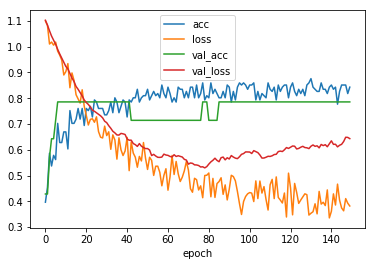

train_acc:  0.842975208582
val_acc:  0.785714268684


In [445]:
#print(pd.DataFrame(history.history))
#plt.figure(figsize=(12, 4), dpi= 100, facecolor='w', edgecolor='k')
pd.DataFrame(history.history).plot()
plt.xlabel('epoch')
plt.show()
print("train_acc: ",history.history['acc'][-1])
print("val_acc: ",history.history['val_acc'][-1])

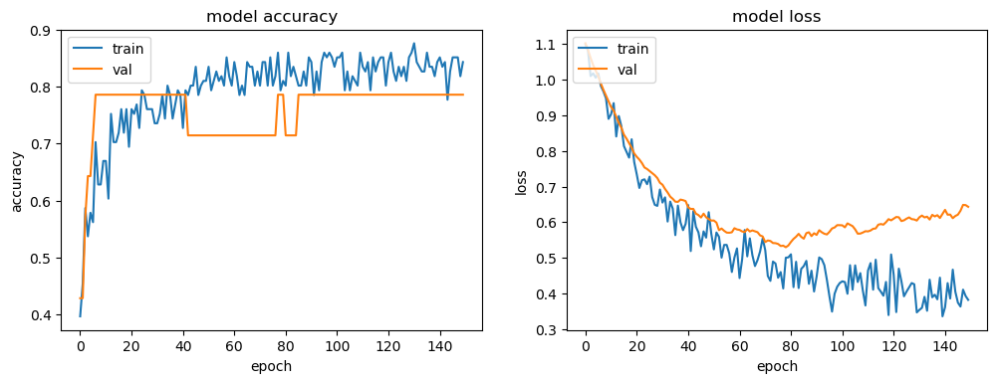

train_acc:  0.842975208582
val_acc:  0.785714268684


In [446]:
#plot custom, try
def plotHistory(history):
    plt.figure(figsize=(12, 4), dpi= 100, facecolor='w', edgecolor='k')
    #subplot(numrows numcolumns fignum)
    plt.subplot(121)
    # summarize history for accuracy
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')

    #subplot(numrows numcolumns fignum)
    plt.subplot(122)
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    
    print("train_acc: ",history.history['acc'][-1])
    print("val_acc: ",history.history['val_acc'][-1])
    
plotHistory(history)